# Mask R-CNN - Inspect Ballon Trained Model

Code and visualizations to test, debug, and evaluate the Mask R-CNN model.

In [2]:
import tensorflow as tf
 
 
 
gpus = tf.config.experimental.list_physical_devices('GPU')
if gpus:
  try:
    # Currently, memory growth needs to be the same across GPUs
    for gpu in gpus:
      tf.config.experimental.set_memory_growth(gpu, True)
    logical_gpus = tf.config.experimental.list_logical_devices('GPU')
    print(len(gpus), "Physical GPUs,", len(logical_gpus), "Logical GPUs")
  except RuntimeError as e:
    # Memory growth must be set before GPUs have been initialized
    print(e)


1 Physical GPUs, 1 Logical GPUs


In [3]:
import os
import sys
import random
import math
import re
import time
import numpy as np
import tensorflow as tf
import matplotlib
import matplotlib.pyplot as plt
import matplotlib.patches as patches

# Root directory of the project
ROOT_DIR = os.path.abspath("../../")

# Import Mask RCNN
sys.path.append(ROOT_DIR)  # To find local version of the library
from mrcnn import utils
from mrcnn import visualize
from mrcnn.visualize import display_images
import mrcnn.model as modellib
from mrcnn.model import log

import custom

%matplotlib inline 

# Directory to save logs and trained model
MODEL_DIR = os.path.join(ROOT_DIR, "logs")

# Path to Ballon trained weights
# You can download this file from the Releases page
# https://github.com/matterport/Mask_RCNN/releases
#BALLON_WEIGHTS_PATH = "../../mask_rcnn_balloon.h5"  # TODO: update this path

In [3]:
%run custom.py train --dataset=C:\Users\negga\Desktop\Mask_RCNN-master\datasets\pipe --weights=coco

Weights:  coco
Dataset:  C:\Users\negga\Desktop\Mask_RCNN-master\datasets\pipe
Logs:  C:\Users\negga\Desktop\Mask_RCNN-master\logs

Configurations:
BACKBONE                       resnet101
BACKBONE_STRIDES               [4, 8, 16, 32, 64]
BATCH_SIZE                     2
BBOX_STD_DEV                   [0.1 0.1 0.2 0.2]
COMPUTE_BACKBONE_SHAPE         None
DETECTION_MAX_INSTANCES        100
DETECTION_MIN_CONFIDENCE       0.8
DETECTION_NMS_THRESHOLD        0.3
FPN_CLASSIF_FC_LAYERS_SIZE     1024
GPU_COUNT                      1
GRADIENT_CLIP_NORM             5.0
IMAGES_PER_GPU                 2
IMAGE_CHANNEL_COUNT            3
IMAGE_MAX_DIM                  1024
IMAGE_META_SIZE                18
IMAGE_MIN_DIM                  800
IMAGE_MIN_SCALE                0
IMAGE_RESIZE_MODE              square
IMAGE_SHAPE                    [1024 1024    3]
LEARNING_MOMENTUM              0.9
LEARNING_RATE                  0.001
LOSS_WEIGHTS                   {'rpn_class_loss': 1.0, 'rpn_bbox_loss': 

C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\negga\anaconda3\lib\site-packages\tensorflow\python\framework\indexed_slices.py:435: UserWarning: Converting sparse IndexedSlices(IndexedSlices(indices=Tensor("training/SGD/gradients/gradients/roi_align_classifier/concat_gr

  1/100 [..............................] - ETA: 22:09 - batch: 0.0000e+00 - size: 2.0000 - loss: 4.5135 - rpn_class_loss: 0.0023 - rpn_bbox_loss: 0.3952 - mrcnn_class_loss: 2.5303 - mrcnn_bbox_loss: 0.9248 - mrcnn_mask_loss: 0.6610

C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


  2/100 [..............................] - ETA: 1:30 - batch: 0.5000 - size: 2.0000 - loss: 4.4071 - rpn_class_loss: 0.0818 - rpn_bbox_loss: 1.1923 - mrcnn_class_loss: 1.6361 - mrcnn_bbox_loss: 1.0304 - mrcnn_mask_loss: 0.4665     

C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


  3/100 [..............................] - ETA: 1:22 - batch: 1.0000 - size: 2.0000 - loss: 3.7243 - rpn_class_loss: 0.0838 - rpn_bbox_loss: 1.0135 - mrcnn_class_loss: 1.1475 - mrcnn_bbox_loss: 1.0471 - mrcnn_mask_loss: 0.4323

C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


  4/100 [>.............................] - ETA: 1:19 - batch: 1.5000 - size: 2.0000 - loss: 3.3954 - rpn_class_loss: 0.0812 - rpn_bbox_loss: 0.8690 - mrcnn_class_loss: 0.8872 - mrcnn_bbox_loss: 1.0634 - mrcnn_mask_loss: 0.4947

C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


  5/100 [>.............................] - ETA: 1:17 - batch: 2.0000 - size: 2.0000 - loss: 3.4188 - rpn_class_loss: 0.0753 - rpn_bbox_loss: 0.8743 - mrcnn_class_loss: 0.7329 - mrcnn_bbox_loss: 1.0769 - mrcnn_mask_loss: 0.6595

C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


  6/100 [>.............................] - ETA: 1:15 - batch: 2.5000 - size: 2.0000 - loss: 3.3077 - rpn_class_loss: 0.0657 - rpn_bbox_loss: 0.7918 - mrcnn_class_loss: 0.6369 - mrcnn_bbox_loss: 1.0782 - mrcnn_mask_loss: 0.7351

C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


  7/100 [=>............................] - ETA: 1:14 - batch: 3.0000 - size: 2.0000 - loss: 3.1835 - rpn_class_loss: 0.0567 - rpn_bbox_loss: 0.7293 - mrcnn_class_loss: 0.5746 - mrcnn_bbox_loss: 1.0638 - mrcnn_mask_loss: 0.7591

C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


  8/100 [=>............................] - ETA: 1:13 - batch: 3.5000 - size: 2.0000 - loss: 3.0976 - rpn_class_loss: 0.0508 - rpn_bbox_loss: 0.6814 - mrcnn_class_loss: 0.5367 - mrcnn_bbox_loss: 1.0348 - mrcnn_mask_loss: 0.7938

C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


  9/100 [=>............................] - ETA: 1:12 - batch: 4.0000 - size: 2.0000 - loss: 2.9631 - rpn_class_loss: 0.0472 - rpn_bbox_loss: 0.6424 - mrcnn_class_loss: 0.4904 - mrcnn_bbox_loss: 1.0227 - mrcnn_mask_loss: 0.7604

C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 10/100 [==>...........................] - ETA: 1:10 - batch: 4.5000 - size: 2.0000 - loss: 2.8278 - rpn_class_loss: 0.0425 - rpn_bbox_loss: 0.5837 - mrcnn_class_loss: 0.4498 - mrcnn_bbox_loss: 1.0135 - mrcnn_mask_loss: 0.7382

C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 11/100 [==>...........................] - ETA: 1:09 - batch: 5.0000 - size: 2.0000 - loss: 2.7911 - rpn_class_loss: 0.0394 - rpn_bbox_loss: 0.5818 - mrcnn_class_loss: 0.4210 - mrcnn_bbox_loss: 1.0319 - mrcnn_mask_loss: 0.7169

C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 12/100 [==>...........................] - ETA: 1:08 - batch: 5.5000 - size: 2.0000 - loss: 2.7259 - rpn_class_loss: 0.0379 - rpn_bbox_loss: 0.6160 - mrcnn_class_loss: 0.3887 - mrcnn_bbox_loss: 0.9899 - mrcnn_mask_loss: 0.6934

C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 13/100 [==>...........................] - ETA: 1:07 - batch: 6.0000 - size: 2.0000 - loss: 2.7303 - rpn_class_loss: 0.0351 - rpn_bbox_loss: 0.6076 - mrcnn_class_loss: 0.3722 - mrcnn_bbox_loss: 1.0272 - mrcnn_mask_loss: 0.6884

C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 14/100 [===>..........................] - ETA: 1:07 - batch: 6.5000 - size: 2.0000 - loss: 2.7154 - rpn_class_loss: 0.0351 - rpn_bbox_loss: 0.6363 - mrcnn_class_loss: 0.3524 - mrcnn_bbox_loss: 1.0165 - mrcnn_mask_loss: 0.6751

C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 15/100 [===>..........................] - ETA: 1:06 - batch: 7.0000 - size: 2.0000 - loss: 2.6417 - rpn_class_loss: 0.0331 - rpn_bbox_loss: 0.6110 - mrcnn_class_loss: 0.3347 - mrcnn_bbox_loss: 1.0031 - mrcnn_mask_loss: 0.6598

C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 16/100 [===>..........................] - ETA: 1:05 - batch: 7.5000 - size: 2.0000 - loss: 2.5930 - rpn_class_loss: 0.0311 - rpn_bbox_loss: 0.5824 - mrcnn_class_loss: 0.3251 - mrcnn_bbox_loss: 1.0041 - mrcnn_mask_loss: 0.6503

C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 17/100 [====>.........................] - ETA: 1:05 - batch: 8.0000 - size: 2.0000 - loss: 2.5609 - rpn_class_loss: 0.0298 - rpn_bbox_loss: 0.5676 - mrcnn_class_loss: 0.3138 - mrcnn_bbox_loss: 1.0013 - mrcnn_mask_loss: 0.6485

C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 18/100 [====>.........................] - ETA: 1:04 - batch: 8.5000 - size: 2.0000 - loss: 2.5194 - rpn_class_loss: 0.0286 - rpn_bbox_loss: 0.5594 - mrcnn_class_loss: 0.3029 - mrcnn_bbox_loss: 0.9905 - mrcnn_mask_loss: 0.6381

C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 19/100 [====>.........................] - ETA: 1:03 - batch: 9.0000 - size: 2.0000 - loss: 2.4702 - rpn_class_loss: 0.0280 - rpn_bbox_loss: 0.5500 - mrcnn_class_loss: 0.2917 - mrcnn_bbox_loss: 0.9726 - mrcnn_mask_loss: 0.6279

C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 20/100 [=====>........................] - ETA: 1:02 - batch: 9.5000 - size: 2.0000 - loss: 2.4741 - rpn_class_loss: 0.0287 - rpn_bbox_loss: 0.5818 - mrcnn_class_loss: 0.2819 - mrcnn_bbox_loss: 0.9678 - mrcnn_mask_loss: 0.6138

C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 21/100 [=====>........................] - ETA: 1:01 - batch: 10.0000 - size: 2.0000 - loss: 2.4572 - rpn_class_loss: 0.0276 - rpn_bbox_loss: 0.5605 - mrcnn_class_loss: 0.2800 - mrcnn_bbox_loss: 0.9767 - mrcnn_mask_loss: 0.6124

C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 22/100 [=====>........................] - ETA: 1:00 - batch: 10.5000 - size: 2.0000 - loss: 2.4713 - rpn_class_loss: 0.0301 - rpn_bbox_loss: 0.5939 - mrcnn_class_loss: 0.2712 - mrcnn_bbox_loss: 0.9637 - mrcnn_mask_loss: 0.6124

C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 23/100 [=====>........................] - ETA: 59s - batch: 11.0000 - size: 2.0000 - loss: 2.4468 - rpn_class_loss: 0.0291 - rpn_bbox_loss: 0.5886 - mrcnn_class_loss: 0.2630 - mrcnn_bbox_loss: 0.9547 - mrcnn_mask_loss: 0.6115 

C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 24/100 [======>.......................] - ETA: 59s - batch: 11.5000 - size: 2.0000 - loss: 2.4369 - rpn_class_loss: 0.0280 - rpn_bbox_loss: 0.5879 - mrcnn_class_loss: 0.2624 - mrcnn_bbox_loss: 0.9524 - mrcnn_mask_loss: 0.6062

C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 25/100 [======>.......................] - ETA: 58s - batch: 12.0000 - size: 2.0000 - loss: 2.4103 - rpn_class_loss: 0.0276 - rpn_bbox_loss: 0.5868 - mrcnn_class_loss: 0.2558 - mrcnn_bbox_loss: 0.9476 - mrcnn_mask_loss: 0.5926

C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 26/100 [======>.......................] - ETA: 57s - batch: 12.5000 - size: 2.0000 - loss: 2.4254 - rpn_class_loss: 0.0282 - rpn_bbox_loss: 0.6115 - mrcnn_class_loss: 0.2493 - mrcnn_bbox_loss: 0.9470 - mrcnn_mask_loss: 0.5894

C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 27/100 [=======>......................] - ETA: 56s - batch: 13.0000 - size: 2.0000 - loss: 2.4205 - rpn_class_loss: 0.0277 - rpn_bbox_loss: 0.6115 - mrcnn_class_loss: 0.2469 - mrcnn_bbox_loss: 0.9431 - mrcnn_mask_loss: 0.5915

C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 28/100 [=======>......................] - ETA: 55s - batch: 13.5000 - size: 2.0000 - loss: 2.4041 - rpn_class_loss: 0.0284 - rpn_bbox_loss: 0.6259 - mrcnn_class_loss: 0.2395 - mrcnn_bbox_loss: 0.9298 - mrcnn_mask_loss: 0.5806

C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 29/100 [=======>......................] - ETA: 54s - batch: 14.0000 - size: 2.0000 - loss: 2.3773 - rpn_class_loss: 0.0276 - rpn_bbox_loss: 0.6246 - mrcnn_class_loss: 0.2331 - mrcnn_bbox_loss: 0.9237 - mrcnn_mask_loss: 0.5684

C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 30/100 [========>.....................] - ETA: 54s - batch: 14.5000 - size: 2.0000 - loss: 2.3620 - rpn_class_loss: 0.0268 - rpn_bbox_loss: 0.6124 - mrcnn_class_loss: 0.2321 - mrcnn_bbox_loss: 0.9168 - mrcnn_mask_loss: 0.5740

C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 31/100 [========>.....................] - ETA: 53s - batch: 15.0000 - size: 2.0000 - loss: 2.3746 - rpn_class_loss: 0.0261 - rpn_bbox_loss: 0.6173 - mrcnn_class_loss: 0.2320 - mrcnn_bbox_loss: 0.9212 - mrcnn_mask_loss: 0.5780

C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 32/100 [========>.....................] - ETA: 52s - batch: 15.5000 - size: 2.0000 - loss: 2.3570 - rpn_class_loss: 0.0256 - rpn_bbox_loss: 0.6093 - mrcnn_class_loss: 0.2312 - mrcnn_bbox_loss: 0.9136 - mrcnn_mask_loss: 0.5773

C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 33/100 [========>.....................] - ETA: 51s - batch: 16.0000 - size: 2.0000 - loss: 2.4155 - rpn_class_loss: 0.0272 - rpn_bbox_loss: 0.6898 - mrcnn_class_loss: 0.2269 - mrcnn_bbox_loss: 0.9040 - mrcnn_mask_loss: 0.5677

C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 34/100 [=========>....................] - ETA: 50s - batch: 16.5000 - size: 2.0000 - loss: 2.4073 - rpn_class_loss: 0.0264 - rpn_bbox_loss: 0.6892 - mrcnn_class_loss: 0.2256 - mrcnn_bbox_loss: 0.8978 - mrcnn_mask_loss: 0.5683

C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 35/100 [=========>....................] - ETA: 50s - batch: 17.0000 - size: 2.0000 - loss: 2.3972 - rpn_class_loss: 0.0258 - rpn_bbox_loss: 0.6848 - mrcnn_class_loss: 0.2274 - mrcnn_bbox_loss: 0.8919 - mrcnn_mask_loss: 0.5673

C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 36/100 [=========>....................] - ETA: 49s - batch: 17.5000 - size: 2.0000 - loss: 2.3755 - rpn_class_loss: 0.0253 - rpn_bbox_loss: 0.6732 - mrcnn_class_loss: 0.2239 - mrcnn_bbox_loss: 0.8858 - mrcnn_mask_loss: 0.5671

C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 37/100 [==========>...................] - ETA: 48s - batch: 18.0000 - size: 2.0000 - loss: 2.3717 - rpn_class_loss: 0.0247 - rpn_bbox_loss: 0.6730 - mrcnn_class_loss: 0.2250 - mrcnn_bbox_loss: 0.8856 - mrcnn_mask_loss: 0.5634

C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 38/100 [==========>...................] - ETA: 47s - batch: 18.5000 - size: 2.0000 - loss: 2.3586 - rpn_class_loss: 0.0244 - rpn_bbox_loss: 0.6687 - mrcnn_class_loss: 0.2229 - mrcnn_bbox_loss: 0.8787 - mrcnn_mask_loss: 0.5638

C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 39/100 [==========>...................] - ETA: 46s - batch: 19.0000 - size: 2.0000 - loss: 2.3316 - rpn_class_loss: 0.0239 - rpn_bbox_loss: 0.6558 - mrcnn_class_loss: 0.2201 - mrcnn_bbox_loss: 0.8693 - mrcnn_mask_loss: 0.5623

C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 40/100 [===========>..................] - ETA: 46s - batch: 19.5000 - size: 2.0000 - loss: 2.3002 - rpn_class_loss: 0.0234 - rpn_bbox_loss: 0.6442 - mrcnn_class_loss: 0.2185 - mrcnn_bbox_loss: 0.8619 - mrcnn_mask_loss: 0.5522

C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 41/100 [===========>..................] - ETA: 45s - batch: 20.0000 - size: 2.0000 - loss: 2.2820 - rpn_class_loss: 0.0235 - rpn_bbox_loss: 0.6517 - mrcnn_class_loss: 0.2138 - mrcnn_bbox_loss: 0.8481 - mrcnn_mask_loss: 0.5449

C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 42/100 [===========>..................] - ETA: 44s - batch: 20.5000 - size: 2.0000 - loss: 2.2822 - rpn_class_loss: 0.0230 - rpn_bbox_loss: 0.6556 - mrcnn_class_loss: 0.2129 - mrcnn_bbox_loss: 0.8434 - mrcnn_mask_loss: 0.5473

C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 43/100 [===========>..................] - ETA: 43s - batch: 21.0000 - size: 2.0000 - loss: 2.3298 - rpn_class_loss: 0.0230 - rpn_bbox_loss: 0.7031 - mrcnn_class_loss: 0.2114 - mrcnn_bbox_loss: 0.8432 - mrcnn_mask_loss: 0.5493

C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 44/100 [============>.................] - ETA: 42s - batch: 21.5000 - size: 2.0000 - loss: 2.3321 - rpn_class_loss: 0.0228 - rpn_bbox_loss: 0.7089 - mrcnn_class_loss: 0.2089 - mrcnn_bbox_loss: 0.8446 - mrcnn_mask_loss: 0.5469

C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 45/100 [============>.................] - ETA: 42s - batch: 22.0000 - size: 2.0000 - loss: 2.3153 - rpn_class_loss: 0.0223 - rpn_bbox_loss: 0.7035 - mrcnn_class_loss: 0.2069 - mrcnn_bbox_loss: 0.8420 - mrcnn_mask_loss: 0.5405

C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 46/100 [============>.................] - ETA: 41s - batch: 22.5000 - size: 2.0000 - loss: 2.3123 - rpn_class_loss: 0.0222 - rpn_bbox_loss: 0.7078 - mrcnn_class_loss: 0.2034 - mrcnn_bbox_loss: 0.8413 - mrcnn_mask_loss: 0.5376

C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 47/100 [=============>................] - ETA: 40s - batch: 23.0000 - size: 2.0000 - loss: 2.2913 - rpn_class_loss: 0.0217 - rpn_bbox_loss: 0.7011 - mrcnn_class_loss: 0.2020 - mrcnn_bbox_loss: 0.8331 - mrcnn_mask_loss: 0.5333

C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 48/100 [=============>................] - ETA: 39s - batch: 23.5000 - size: 2.0000 - loss: 2.2860 - rpn_class_loss: 0.0215 - rpn_bbox_loss: 0.7032 - mrcnn_class_loss: 0.2001 - mrcnn_bbox_loss: 0.8285 - mrcnn_mask_loss: 0.5328

C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 49/100 [=============>................] - ETA: 39s - batch: 24.0000 - size: 2.0000 - loss: 2.3568 - rpn_class_loss: 0.0220 - rpn_bbox_loss: 0.7845 - mrcnn_class_loss: 0.1983 - mrcnn_bbox_loss: 0.8234 - mrcnn_mask_loss: 0.5287

C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 50/100 [==============>...............] - ETA: 38s - batch: 24.5000 - size: 2.0000 - loss: 2.3442 - rpn_class_loss: 0.0217 - rpn_bbox_loss: 0.7733 - mrcnn_class_loss: 0.1983 - mrcnn_bbox_loss: 0.8227 - mrcnn_mask_loss: 0.5283

C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 51/100 [==============>...............] - ETA: 37s - batch: 25.0000 - size: 2.0000 - loss: 2.3280 - rpn_class_loss: 0.0213 - rpn_bbox_loss: 0.7629 - mrcnn_class_loss: 0.1970 - mrcnn_bbox_loss: 0.8196 - mrcnn_mask_loss: 0.5272

C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 52/100 [==============>...............] - ETA: 36s - batch: 25.5000 - size: 2.0000 - loss: 2.3048 - rpn_class_loss: 0.0209 - rpn_bbox_loss: 0.7543 - mrcnn_class_loss: 0.1950 - mrcnn_bbox_loss: 0.8124 - mrcnn_mask_loss: 0.5223

C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 53/100 [==============>...............] - ETA: 35s - batch: 26.0000 - size: 2.0000 - loss: 2.2887 - rpn_class_loss: 0.0207 - rpn_bbox_loss: 0.7484 - mrcnn_class_loss: 0.1934 - mrcnn_bbox_loss: 0.8044 - mrcnn_mask_loss: 0.5218

C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 54/100 [===============>..............] - ETA: 35s - batch: 26.5000 - size: 2.0000 - loss: 2.3422 - rpn_class_loss: 0.0214 - rpn_bbox_loss: 0.8123 - mrcnn_class_loss: 0.1927 - mrcnn_bbox_loss: 0.7998 - mrcnn_mask_loss: 0.5160

C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 55/100 [===============>..............] - ETA: 34s - batch: 27.0000 - size: 2.0000 - loss: 2.3306 - rpn_class_loss: 0.0210 - rpn_bbox_loss: 0.8041 - mrcnn_class_loss: 0.1909 - mrcnn_bbox_loss: 0.8010 - mrcnn_mask_loss: 0.5136

C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 56/100 [===============>..............] - ETA: 33s - batch: 27.5000 - size: 2.0000 - loss: 2.3158 - rpn_class_loss: 0.0207 - rpn_bbox_loss: 0.7964 - mrcnn_class_loss: 0.1926 - mrcnn_bbox_loss: 0.7959 - mrcnn_mask_loss: 0.5102

C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 57/100 [================>.............] - ETA: 32s - batch: 28.0000 - size: 2.0000 - loss: 2.3020 - rpn_class_loss: 0.0204 - rpn_bbox_loss: 0.7901 - mrcnn_class_loss: 0.1922 - mrcnn_bbox_loss: 0.7911 - mrcnn_mask_loss: 0.5082

C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 58/100 [================>.............] - ETA: 32s - batch: 28.5000 - size: 2.0000 - loss: 2.2926 - rpn_class_loss: 0.0202 - rpn_bbox_loss: 0.7850 - mrcnn_class_loss: 0.1897 - mrcnn_bbox_loss: 0.7904 - mrcnn_mask_loss: 0.5073

C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 59/100 [================>.............] - ETA: 31s - batch: 29.0000 - size: 2.0000 - loss: 2.3568 - rpn_class_loss: 0.0208 - rpn_bbox_loss: 0.8327 - mrcnn_class_loss: 0.1945 - mrcnn_bbox_loss: 0.7947 - mrcnn_mask_loss: 0.5140

C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 60/100 [=================>............] - ETA: 30s - batch: 29.5000 - size: 2.0000 - loss: 2.3462 - rpn_class_loss: 0.0205 - rpn_bbox_loss: 0.8301 - mrcnn_class_loss: 0.1925 - mrcnn_bbox_loss: 0.7911 - mrcnn_mask_loss: 0.5120

C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 61/100 [=================>............] - ETA: 30s - batch: 30.0000 - size: 2.0000 - loss: 2.3353 - rpn_class_loss: 0.0204 - rpn_bbox_loss: 0.8216 - mrcnn_class_loss: 0.1911 - mrcnn_bbox_loss: 0.7915 - mrcnn_mask_loss: 0.5107

C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 62/100 [=================>............] - ETA: 29s - batch: 30.5000 - size: 2.0000 - loss: 2.3219 - rpn_class_loss: 0.0201 - rpn_bbox_loss: 0.8169 - mrcnn_class_loss: 0.1900 - mrcnn_bbox_loss: 0.7888 - mrcnn_mask_loss: 0.5062

C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 63/100 [=================>............] - ETA: 28s - batch: 31.0000 - size: 2.0000 - loss: 2.3192 - rpn_class_loss: 0.0201 - rpn_bbox_loss: 0.8170 - mrcnn_class_loss: 0.1888 - mrcnn_bbox_loss: 0.7885 - mrcnn_mask_loss: 0.5048

C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 64/100 [==================>...........] - ETA: 27s - batch: 31.5000 - size: 2.0000 - loss: 2.3036 - rpn_class_loss: 0.0200 - rpn_bbox_loss: 0.8085 - mrcnn_class_loss: 0.1875 - mrcnn_bbox_loss: 0.7847 - mrcnn_mask_loss: 0.5029

C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 65/100 [==================>...........] - ETA: 26s - batch: 32.0000 - size: 2.0000 - loss: 2.2864 - rpn_class_loss: 0.0198 - rpn_bbox_loss: 0.8033 - mrcnn_class_loss: 0.1859 - mrcnn_bbox_loss: 0.7785 - mrcnn_mask_loss: 0.4990

C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 66/100 [==================>...........] - ETA: 26s - batch: 32.5000 - size: 2.0000 - loss: 2.2676 - rpn_class_loss: 0.0197 - rpn_bbox_loss: 0.7946 - mrcnn_class_loss: 0.1844 - mrcnn_bbox_loss: 0.7727 - mrcnn_mask_loss: 0.4961

C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 67/100 [===================>..........] - ETA: 25s - batch: 33.0000 - size: 2.0000 - loss: 2.2585 - rpn_class_loss: 0.0196 - rpn_bbox_loss: 0.7902 - mrcnn_class_loss: 0.1837 - mrcnn_bbox_loss: 0.7692 - mrcnn_mask_loss: 0.4958

C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 68/100 [===================>..........] - ETA: 24s - batch: 33.5000 - size: 2.0000 - loss: 2.2531 - rpn_class_loss: 0.0194 - rpn_bbox_loss: 0.7915 - mrcnn_class_loss: 0.1824 - mrcnn_bbox_loss: 0.7679 - mrcnn_mask_loss: 0.4920

C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 69/100 [===================>..........] - ETA: 23s - batch: 34.0000 - size: 2.0000 - loss: 2.2365 - rpn_class_loss: 0.0192 - rpn_bbox_loss: 0.7836 - mrcnn_class_loss: 0.1807 - mrcnn_bbox_loss: 0.7639 - mrcnn_mask_loss: 0.4891

C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 70/100 [====================>.........] - ETA: 23s - batch: 34.5000 - size: 2.0000 - loss: 2.2254 - rpn_class_loss: 0.0191 - rpn_bbox_loss: 0.7747 - mrcnn_class_loss: 0.1805 - mrcnn_bbox_loss: 0.7621 - mrcnn_mask_loss: 0.4890

C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 71/100 [====================>.........] - ETA: 22s - batch: 35.0000 - size: 2.0000 - loss: 2.2252 - rpn_class_loss: 0.0190 - rpn_bbox_loss: 0.7728 - mrcnn_class_loss: 0.1796 - mrcnn_bbox_loss: 0.7595 - mrcnn_mask_loss: 0.4942

C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 72/100 [====================>.........] - ETA: 21s - batch: 35.5000 - size: 2.0000 - loss: 2.2181 - rpn_class_loss: 0.0189 - rpn_bbox_loss: 0.7664 - mrcnn_class_loss: 0.1794 - mrcnn_bbox_loss: 0.7566 - mrcnn_mask_loss: 0.4968

C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 73/100 [====================>.........] - ETA: 20s - batch: 36.0000 - size: 2.0000 - loss: 2.2191 - rpn_class_loss: 0.0189 - rpn_bbox_loss: 0.7702 - mrcnn_class_loss: 0.1781 - mrcnn_bbox_loss: 0.7544 - mrcnn_mask_loss: 0.4974

C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 74/100 [=====================>........] - ETA: 20s - batch: 36.5000 - size: 2.0000 - loss: 2.2104 - rpn_class_loss: 0.0188 - rpn_bbox_loss: 0.7670 - mrcnn_class_loss: 0.1772 - mrcnn_bbox_loss: 0.7505 - mrcnn_mask_loss: 0.4969

C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 75/100 [=====================>........] - ETA: 19s - batch: 37.0000 - size: 2.0000 - loss: 2.2013 - rpn_class_loss: 0.0186 - rpn_bbox_loss: 0.7623 - mrcnn_class_loss: 0.1759 - mrcnn_bbox_loss: 0.7467 - mrcnn_mask_loss: 0.4977

C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 76/100 [=====================>........] - ETA: 18s - batch: 37.5000 - size: 2.0000 - loss: 2.1875 - rpn_class_loss: 0.0185 - rpn_bbox_loss: 0.7565 - mrcnn_class_loss: 0.1757 - mrcnn_bbox_loss: 0.7423 - mrcnn_mask_loss: 0.4944

C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 77/100 [======================>.......] - ETA: 17s - batch: 38.0000 - size: 2.0000 - loss: 2.1787 - rpn_class_loss: 0.0184 - rpn_bbox_loss: 0.7529 - mrcnn_class_loss: 0.1750 - mrcnn_bbox_loss: 0.7394 - mrcnn_mask_loss: 0.4931

C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 78/100 [======================>.......] - ETA: 16s - batch: 38.5000 - size: 2.0000 - loss: 2.1672 - rpn_class_loss: 0.0182 - rpn_bbox_loss: 0.7477 - mrcnn_class_loss: 0.1735 - mrcnn_bbox_loss: 0.7339 - mrcnn_mask_loss: 0.4938

C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 79/100 [======================>.......] - ETA: 16s - batch: 39.0000 - size: 2.0000 - loss: 2.1551 - rpn_class_loss: 0.0181 - rpn_bbox_loss: 0.7401 - mrcnn_class_loss: 0.1738 - mrcnn_bbox_loss: 0.7317 - mrcnn_mask_loss: 0.4915

C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 80/100 [=======================>......] - ETA: 15s - batch: 39.5000 - size: 2.0000 - loss: 2.1425 - rpn_class_loss: 0.0179 - rpn_bbox_loss: 0.7331 - mrcnn_class_loss: 0.1729 - mrcnn_bbox_loss: 0.7279 - mrcnn_mask_loss: 0.4907

C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 81/100 [=======================>......] - ETA: 14s - batch: 40.0000 - size: 2.0000 - loss: 2.1442 - rpn_class_loss: 0.0179 - rpn_bbox_loss: 0.7371 - mrcnn_class_loss: 0.1729 - mrcnn_bbox_loss: 0.7259 - mrcnn_mask_loss: 0.4904

C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 82/100 [=======================>......] - ETA: 13s - batch: 40.5000 - size: 2.0000 - loss: 2.1410 - rpn_class_loss: 0.0178 - rpn_bbox_loss: 0.7339 - mrcnn_class_loss: 0.1737 - mrcnn_bbox_loss: 0.7245 - mrcnn_mask_loss: 0.4912

C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 83/100 [=======================>......] - ETA: 13s - batch: 41.0000 - size: 2.0000 - loss: 2.1296 - rpn_class_loss: 0.0176 - rpn_bbox_loss: 0.7277 - mrcnn_class_loss: 0.1729 - mrcnn_bbox_loss: 0.7236 - mrcnn_mask_loss: 0.4879

C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 84/100 [========================>.....] - ETA: 12s - batch: 41.5000 - size: 2.0000 - loss: 2.1253 - rpn_class_loss: 0.0174 - rpn_bbox_loss: 0.7294 - mrcnn_class_loss: 0.1718 - mrcnn_bbox_loss: 0.7185 - mrcnn_mask_loss: 0.4882

C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 85/100 [========================>.....] - ETA: 11s - batch: 42.0000 - size: 2.0000 - loss: 2.1142 - rpn_class_loss: 0.0174 - rpn_bbox_loss: 0.7228 - mrcnn_class_loss: 0.1721 - mrcnn_bbox_loss: 0.7162 - mrcnn_mask_loss: 0.4858

C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 86/100 [========================>.....] - ETA: 10s - batch: 42.5000 - size: 2.0000 - loss: 2.1093 - rpn_class_loss: 0.0173 - rpn_bbox_loss: 0.7280 - mrcnn_class_loss: 0.1704 - mrcnn_bbox_loss: 0.7103 - mrcnn_mask_loss: 0.4833

C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 87/100 [=========================>....] - ETA: 10s - batch: 43.0000 - size: 2.0000 - loss: 2.1120 - rpn_class_loss: 0.0173 - rpn_bbox_loss: 0.7262 - mrcnn_class_loss: 0.1711 - mrcnn_bbox_loss: 0.7109 - mrcnn_mask_loss: 0.4865

C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 88/100 [=========================>....] - ETA: 9s - batch: 43.5000 - size: 2.0000 - loss: 2.1353 - rpn_class_loss: 0.0172 - rpn_bbox_loss: 0.7651 - mrcnn_class_loss: 0.1691 - mrcnn_bbox_loss: 0.7029 - mrcnn_mask_loss: 0.4810 

C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 89/100 [=========================>....] - ETA: 8s - batch: 44.0000 - size: 2.0000 - loss: 2.1269 - rpn_class_loss: 0.0171 - rpn_bbox_loss: 0.7594 - mrcnn_class_loss: 0.1683 - mrcnn_bbox_loss: 0.7026 - mrcnn_mask_loss: 0.4794

C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 90/100 [==========================>...] - ETA: 7s - batch: 44.5000 - size: 2.0000 - loss: 2.1229 - rpn_class_loss: 0.0169 - rpn_bbox_loss: 0.7589 - mrcnn_class_loss: 0.1675 - mrcnn_bbox_loss: 0.7012 - mrcnn_mask_loss: 0.4783

C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 91/100 [==========================>...] - ETA: 6s - batch: 45.0000 - size: 2.0000 - loss: 2.1639 - rpn_class_loss: 0.0169 - rpn_bbox_loss: 0.8077 - mrcnn_class_loss: 0.1658 - mrcnn_bbox_loss: 0.6982 - mrcnn_mask_loss: 0.4754

C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 92/100 [==========================>...] - ETA: 6s - batch: 45.5000 - size: 2.0000 - loss: 2.1576 - rpn_class_loss: 0.0168 - rpn_bbox_loss: 0.8041 - mrcnn_class_loss: 0.1647 - mrcnn_bbox_loss: 0.6971 - mrcnn_mask_loss: 0.4750

C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 93/100 [==========================>...] - ETA: 5s - batch: 46.0000 - size: 2.0000 - loss: 2.1488 - rpn_class_loss: 0.0166 - rpn_bbox_loss: 0.7974 - mrcnn_class_loss: 0.1635 - mrcnn_bbox_loss: 0.6982 - mrcnn_mask_loss: 0.4731

C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 94/100 [===========================>..] - ETA: 4s - batch: 46.5000 - size: 2.0000 - loss: 2.1387 - rpn_class_loss: 0.0165 - rpn_bbox_loss: 0.7927 - mrcnn_class_loss: 0.1631 - mrcnn_bbox_loss: 0.6937 - mrcnn_mask_loss: 0.4727

C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 95/100 [===========================>..] - ETA: 3s - batch: 47.0000 - size: 2.0000 - loss: 2.1317 - rpn_class_loss: 0.0164 - rpn_bbox_loss: 0.7885 - mrcnn_class_loss: 0.1625 - mrcnn_bbox_loss: 0.6926 - mrcnn_mask_loss: 0.4718

C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 96/100 [===========================>..] - ETA: 3s - batch: 47.5000 - size: 2.0000 - loss: 2.1191 - rpn_class_loss: 0.0162 - rpn_bbox_loss: 0.7817 - mrcnn_class_loss: 0.1614 - mrcnn_bbox_loss: 0.6889 - mrcnn_mask_loss: 0.4709

C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 97/100 [============================>.] - ETA: 2s - batch: 48.0000 - size: 2.0000 - loss: 2.1067 - rpn_class_loss: 0.0162 - rpn_bbox_loss: 0.7747 - mrcnn_class_loss: 0.1609 - mrcnn_bbox_loss: 0.6862 - mrcnn_mask_loss: 0.4688

C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 98/100 [============================>.] - ETA: 1s - batch: 48.5000 - size: 2.0000 - loss: 2.0992 - rpn_class_loss: 0.0162 - rpn_bbox_loss: 0.7702 - mrcnn_class_loss: 0.1606 - mrcnn_bbox_loss: 0.6830 - mrcnn_mask_loss: 0.4693

C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 99/100 [============================>.] - ETA: 0s - batch: 49.0000 - size: 2.0000 - loss: 2.0928 - rpn_class_loss: 0.0160 - rpn_bbox_loss: 0.7663 - mrcnn_class_loss: 0.1607 - mrcnn_bbox_loss: 0.6807 - mrcnn_mask_loss: 0.4690

C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


100/100 [==============================] - ETA: 0s - batch: 49.5000 - size: 2.0000 - loss: 2.0838 - rpn_class_loss: 0.0159 - rpn_bbox_loss: 0.7607 - mrcnn_class_loss: 0.1601 - mrcnn_bbox_loss: 0.6805 - mrcnn_mask_loss: 0.4667

C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\negga\anaconda3\lib\site-packages\tensorflow\python\keras\engine\training.py:2325: UserWarning: `Model.state_updates` will be removed in a future version. This property should not be used in TensorFlow 2.0, as `updates` are

C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another

C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another

C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another

C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another

100/100 [==============================] - 130s 1s/step - batch: 49.5000 - size: 2.0000 - loss: 2.0838 - rpn_class_loss: 0.0159 - rpn_bbox_loss: 0.7607 - mrcnn_class_loss: 0.1601 - mrcnn_bbox_loss: 0.6805 - mrcnn_mask_loss: 0.4667 - val_loss: 2.2205 - val_rpn_class_loss: 0.0283 - val_rpn_bbox_loss: 1.2261 - val_mrcnn_class_loss: 0.1396 - val_mrcnn_bbox_loss: 0.4503 - val_mrcnn_mask_loss: 0.3762
Epoch 2/30


C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


  1/100 [..............................] - ETA: 1:16 - batch: 0.0000e+00 - size: 2.0000 - loss: 2.4204 - rpn_class_loss: 0.0065 - rpn_bbox_loss: 1.3211 - mrcnn_class_loss: 0.1184 - mrcnn_bbox_loss: 0.5704 - mrcnn_mask_loss: 0.4041

C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


  2/100 [..............................] - ETA: 1:12 - batch: 0.5000 - size: 2.0000 - loss: 2.2723 - rpn_class_loss: 0.0071 - rpn_bbox_loss: 1.2571 - mrcnn_class_loss: 0.0931 - mrcnn_bbox_loss: 0.5466 - mrcnn_mask_loss: 0.3684    

C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


  3/100 [..............................] - ETA: 1:12 - batch: 1.0000 - size: 2.0000 - loss: 1.8667 - rpn_class_loss: 0.0087 - rpn_bbox_loss: 0.8696 - mrcnn_class_loss: 0.1411 - mrcnn_bbox_loss: 0.5304 - mrcnn_mask_loss: 0.3170

C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


  4/100 [>.............................] - ETA: 1:12 - batch: 1.5000 - size: 2.0000 - loss: 1.7915 - rpn_class_loss: 0.0078 - rpn_bbox_loss: 0.7350 - mrcnn_class_loss: 0.1695 - mrcnn_bbox_loss: 0.5166 - mrcnn_mask_loss: 0.3626

C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


  5/100 [>.............................] - ETA: 1:12 - batch: 2.0000 - size: 2.0000 - loss: 1.7461 - rpn_class_loss: 0.0086 - rpn_bbox_loss: 0.6929 - mrcnn_class_loss: 0.1430 - mrcnn_bbox_loss: 0.5334 - mrcnn_mask_loss: 0.3682

C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


  6/100 [>.............................] - ETA: 1:11 - batch: 2.5000 - size: 2.0000 - loss: 1.6031 - rpn_class_loss: 0.0084 - rpn_bbox_loss: 0.6157 - mrcnn_class_loss: 0.1361 - mrcnn_bbox_loss: 0.4861 - mrcnn_mask_loss: 0.3568

C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


  7/100 [=>............................] - ETA: 1:10 - batch: 3.0000 - size: 2.0000 - loss: 1.5633 - rpn_class_loss: 0.0084 - rpn_bbox_loss: 0.5896 - mrcnn_class_loss: 0.1272 - mrcnn_bbox_loss: 0.4689 - mrcnn_mask_loss: 0.3692

C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


  8/100 [=>............................] - ETA: 1:09 - batch: 3.5000 - size: 2.0000 - loss: 1.5041 - rpn_class_loss: 0.0075 - rpn_bbox_loss: 0.5471 - mrcnn_class_loss: 0.1257 - mrcnn_bbox_loss: 0.4557 - mrcnn_mask_loss: 0.3680

C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


  9/100 [=>............................] - ETA: 1:09 - batch: 4.0000 - size: 2.0000 - loss: 1.4709 - rpn_class_loss: 0.0071 - rpn_bbox_loss: 0.5212 - mrcnn_class_loss: 0.1208 - mrcnn_bbox_loss: 0.4510 - mrcnn_mask_loss: 0.3707

C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 10/100 [==>...........................] - ETA: 1:08 - batch: 4.5000 - size: 2.0000 - loss: 1.4968 - rpn_class_loss: 0.0071 - rpn_bbox_loss: 0.5372 - mrcnn_class_loss: 0.1265 - mrcnn_bbox_loss: 0.4581 - mrcnn_mask_loss: 0.3679

C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 11/100 [==>...........................] - ETA: 1:07 - batch: 5.0000 - size: 2.0000 - loss: 1.4755 - rpn_class_loss: 0.0069 - rpn_bbox_loss: 0.5037 - mrcnn_class_loss: 0.1384 - mrcnn_bbox_loss: 0.4603 - mrcnn_mask_loss: 0.3662

C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 12/100 [==>...........................] - ETA: 1:06 - batch: 5.5000 - size: 2.0000 - loss: 1.5978 - rpn_class_loss: 0.0069 - rpn_bbox_loss: 0.5622 - mrcnn_class_loss: 0.1283 - mrcnn_bbox_loss: 0.5485 - mrcnn_mask_loss: 0.3519

C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 13/100 [==>...........................] - ETA: 1:05 - batch: 6.0000 - size: 2.0000 - loss: 1.5573 - rpn_class_loss: 0.0067 - rpn_bbox_loss: 0.5409 - mrcnn_class_loss: 0.1274 - mrcnn_bbox_loss: 0.5396 - mrcnn_mask_loss: 0.3427

C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 14/100 [===>..........................] - ETA: 1:05 - batch: 6.5000 - size: 2.0000 - loss: 1.5666 - rpn_class_loss: 0.0068 - rpn_bbox_loss: 0.5309 - mrcnn_class_loss: 0.1275 - mrcnn_bbox_loss: 0.5330 - mrcnn_mask_loss: 0.3685

C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 15/100 [===>..........................] - ETA: 1:04 - batch: 7.0000 - size: 2.0000 - loss: 1.6100 - rpn_class_loss: 0.0086 - rpn_bbox_loss: 0.5426 - mrcnn_class_loss: 0.1300 - mrcnn_bbox_loss: 0.5403 - mrcnn_mask_loss: 0.3886

C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 16/100 [===>..........................] - ETA: 1:04 - batch: 7.5000 - size: 2.0000 - loss: 1.5796 - rpn_class_loss: 0.0088 - rpn_bbox_loss: 0.5175 - mrcnn_class_loss: 0.1285 - mrcnn_bbox_loss: 0.5328 - mrcnn_mask_loss: 0.3921

C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 17/100 [====>.........................] - ETA: 1:03 - batch: 8.0000 - size: 2.0000 - loss: 1.5763 - rpn_class_loss: 0.0087 - rpn_bbox_loss: 0.5074 - mrcnn_class_loss: 0.1293 - mrcnn_bbox_loss: 0.5451 - mrcnn_mask_loss: 0.3858

C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 18/100 [====>.........................] - ETA: 1:02 - batch: 8.5000 - size: 2.0000 - loss: 1.5613 - rpn_class_loss: 0.0095 - rpn_bbox_loss: 0.5095 - mrcnn_class_loss: 0.1270 - mrcnn_bbox_loss: 0.5363 - mrcnn_mask_loss: 0.3790

C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 19/100 [====>.........................] - ETA: 1:01 - batch: 9.0000 - size: 2.0000 - loss: 1.5292 - rpn_class_loss: 0.0092 - rpn_bbox_loss: 0.4954 - mrcnn_class_loss: 0.1254 - mrcnn_bbox_loss: 0.5248 - mrcnn_mask_loss: 0.3743

C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 20/100 [=====>........................] - ETA: 1:00 - batch: 9.5000 - size: 2.0000 - loss: 1.5151 - rpn_class_loss: 0.0088 - rpn_bbox_loss: 0.4880 - mrcnn_class_loss: 0.1237 - mrcnn_bbox_loss: 0.5189 - mrcnn_mask_loss: 0.3757

C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 21/100 [=====>........................] - ETA: 1:00 - batch: 10.0000 - size: 2.0000 - loss: 1.5009 - rpn_class_loss: 0.0086 - rpn_bbox_loss: 0.4708 - mrcnn_class_loss: 0.1196 - mrcnn_bbox_loss: 0.5237 - mrcnn_mask_loss: 0.3782

C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 22/100 [=====>........................] - ETA: 59s - batch: 10.5000 - size: 2.0000 - loss: 1.5369 - rpn_class_loss: 0.0101 - rpn_bbox_loss: 0.5268 - mrcnn_class_loss: 0.1153 - mrcnn_bbox_loss: 0.5150 - mrcnn_mask_loss: 0.3697 

C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 23/100 [=====>........................] - ETA: 58s - batch: 11.0000 - size: 2.0000 - loss: 1.5685 - rpn_class_loss: 0.0104 - rpn_bbox_loss: 0.5523 - mrcnn_class_loss: 0.1127 - mrcnn_bbox_loss: 0.5152 - mrcnn_mask_loss: 0.3780

C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 24/100 [======>.......................] - ETA: 57s - batch: 11.5000 - size: 2.0000 - loss: 1.5517 - rpn_class_loss: 0.0102 - rpn_bbox_loss: 0.5370 - mrcnn_class_loss: 0.1121 - mrcnn_bbox_loss: 0.5178 - mrcnn_mask_loss: 0.3745

C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 25/100 [======>.......................] - ETA: 57s - batch: 12.0000 - size: 2.0000 - loss: 1.5315 - rpn_class_loss: 0.0101 - rpn_bbox_loss: 0.5210 - mrcnn_class_loss: 0.1123 - mrcnn_bbox_loss: 0.5148 - mrcnn_mask_loss: 0.3732

C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 26/100 [======>.......................] - ETA: 56s - batch: 12.5000 - size: 2.0000 - loss: 1.5319 - rpn_class_loss: 0.0098 - rpn_bbox_loss: 0.5147 - mrcnn_class_loss: 0.1181 - mrcnn_bbox_loss: 0.5148 - mrcnn_mask_loss: 0.3745

C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 27/100 [=======>......................] - ETA: 55s - batch: 13.0000 - size: 2.0000 - loss: 1.5208 - rpn_class_loss: 0.0100 - rpn_bbox_loss: 0.5077 - mrcnn_class_loss: 0.1156 - mrcnn_bbox_loss: 0.5087 - mrcnn_mask_loss: 0.3788

C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 28/100 [=======>......................] - ETA: 54s - batch: 13.5000 - size: 2.0000 - loss: 1.4938 - rpn_class_loss: 0.0100 - rpn_bbox_loss: 0.4941 - mrcnn_class_loss: 0.1134 - mrcnn_bbox_loss: 0.5039 - mrcnn_mask_loss: 0.3723

C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 29/100 [=======>......................] - ETA: 53s - batch: 14.0000 - size: 2.0000 - loss: 1.5291 - rpn_class_loss: 0.0107 - rpn_bbox_loss: 0.5294 - mrcnn_class_loss: 0.1113 - mrcnn_bbox_loss: 0.5071 - mrcnn_mask_loss: 0.3707

C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 30/100 [========>.....................] - ETA: 53s - batch: 14.5000 - size: 2.0000 - loss: 1.5202 - rpn_class_loss: 0.0105 - rpn_bbox_loss: 0.5247 - mrcnn_class_loss: 0.1101 - mrcnn_bbox_loss: 0.5012 - mrcnn_mask_loss: 0.3736

C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 31/100 [========>.....................] - ETA: 52s - batch: 15.0000 - size: 2.0000 - loss: 1.5169 - rpn_class_loss: 0.0104 - rpn_bbox_loss: 0.5268 - mrcnn_class_loss: 0.1096 - mrcnn_bbox_loss: 0.4990 - mrcnn_mask_loss: 0.3711

C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 32/100 [========>.....................] - ETA: 51s - batch: 15.5000 - size: 2.0000 - loss: 1.5045 - rpn_class_loss: 0.0109 - rpn_bbox_loss: 0.5198 - mrcnn_class_loss: 0.1097 - mrcnn_bbox_loss: 0.4990 - mrcnn_mask_loss: 0.3651

C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 33/100 [========>.....................] - ETA: 51s - batch: 16.0000 - size: 2.0000 - loss: 1.5093 - rpn_class_loss: 0.0108 - rpn_bbox_loss: 0.5359 - mrcnn_class_loss: 0.1082 - mrcnn_bbox_loss: 0.4927 - mrcnn_mask_loss: 0.3618

C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 34/100 [=========>....................] - ETA: 50s - batch: 16.5000 - size: 2.0000 - loss: 1.4957 - rpn_class_loss: 0.0111 - rpn_bbox_loss: 0.5256 - mrcnn_class_loss: 0.1088 - mrcnn_bbox_loss: 0.4885 - mrcnn_mask_loss: 0.3616

C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 35/100 [=========>....................] - ETA: 49s - batch: 17.0000 - size: 2.0000 - loss: 1.4848 - rpn_class_loss: 0.0108 - rpn_bbox_loss: 0.5135 - mrcnn_class_loss: 0.1113 - mrcnn_bbox_loss: 0.4880 - mrcnn_mask_loss: 0.3613

C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 36/100 [=========>....................] - ETA: 48s - batch: 17.5000 - size: 2.0000 - loss: 1.4911 - rpn_class_loss: 0.0106 - rpn_bbox_loss: 0.5150 - mrcnn_class_loss: 0.1118 - mrcnn_bbox_loss: 0.4962 - mrcnn_mask_loss: 0.3575

C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 37/100 [==========>...................] - ETA: 48s - batch: 18.0000 - size: 2.0000 - loss: 1.4883 - rpn_class_loss: 0.0104 - rpn_bbox_loss: 0.5099 - mrcnn_class_loss: 0.1107 - mrcnn_bbox_loss: 0.5024 - mrcnn_mask_loss: 0.3549

C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 38/100 [==========>...................] - ETA: 47s - batch: 18.5000 - size: 2.0000 - loss: 1.5150 - rpn_class_loss: 0.0103 - rpn_bbox_loss: 0.5281 - mrcnn_class_loss: 0.1118 - mrcnn_bbox_loss: 0.5080 - mrcnn_mask_loss: 0.3569

C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 39/100 [==========>...................] - ETA: 46s - batch: 19.0000 - size: 2.0000 - loss: 1.5403 - rpn_class_loss: 0.0109 - rpn_bbox_loss: 0.5649 - mrcnn_class_loss: 0.1099 - mrcnn_bbox_loss: 0.5027 - mrcnn_mask_loss: 0.3519

C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 40/100 [===========>..................] - ETA: 45s - batch: 19.5000 - size: 2.0000 - loss: 1.5496 - rpn_class_loss: 0.0108 - rpn_bbox_loss: 0.5687 - mrcnn_class_loss: 0.1108 - mrcnn_bbox_loss: 0.5000 - mrcnn_mask_loss: 0.3593

C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 41/100 [===========>..................] - ETA: 45s - batch: 20.0000 - size: 2.0000 - loss: 1.5603 - rpn_class_loss: 0.0106 - rpn_bbox_loss: 0.5791 - mrcnn_class_loss: 0.1090 - mrcnn_bbox_loss: 0.5047 - mrcnn_mask_loss: 0.3569

C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 42/100 [===========>..................] - ETA: 44s - batch: 20.5000 - size: 2.0000 - loss: 1.5819 - rpn_class_loss: 0.0106 - rpn_bbox_loss: 0.5938 - mrcnn_class_loss: 0.1070 - mrcnn_bbox_loss: 0.5089 - mrcnn_mask_loss: 0.3617

C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 43/100 [===========>..................] - ETA: 43s - batch: 21.0000 - size: 2.0000 - loss: 1.5687 - rpn_class_loss: 0.0105 - rpn_bbox_loss: 0.5907 - mrcnn_class_loss: 0.1058 - mrcnn_bbox_loss: 0.5017 - mrcnn_mask_loss: 0.3600

C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 44/100 [============>.................] - ETA: 42s - batch: 21.5000 - size: 2.0000 - loss: 1.5805 - rpn_class_loss: 0.0113 - rpn_bbox_loss: 0.5968 - mrcnn_class_loss: 0.1075 - mrcnn_bbox_loss: 0.5027 - mrcnn_mask_loss: 0.3622

C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 45/100 [============>.................] - ETA: 42s - batch: 22.0000 - size: 2.0000 - loss: 1.5704 - rpn_class_loss: 0.0111 - rpn_bbox_loss: 0.5900 - mrcnn_class_loss: 0.1076 - mrcnn_bbox_loss: 0.4982 - mrcnn_mask_loss: 0.3634

C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 46/100 [============>.................] - ETA: 41s - batch: 22.5000 - size: 2.0000 - loss: 1.5648 - rpn_class_loss: 0.0115 - rpn_bbox_loss: 0.5856 - mrcnn_class_loss: 0.1083 - mrcnn_bbox_loss: 0.4966 - mrcnn_mask_loss: 0.3628

C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 47/100 [=============>................] - ETA: 40s - batch: 23.0000 - size: 2.0000 - loss: 1.5539 - rpn_class_loss: 0.0114 - rpn_bbox_loss: 0.5775 - mrcnn_class_loss: 0.1079 - mrcnn_bbox_loss: 0.4924 - mrcnn_mask_loss: 0.3648

C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 48/100 [=============>................] - ETA: 39s - batch: 23.5000 - size: 2.0000 - loss: 1.5483 - rpn_class_loss: 0.0113 - rpn_bbox_loss: 0.5749 - mrcnn_class_loss: 0.1085 - mrcnn_bbox_loss: 0.4893 - mrcnn_mask_loss: 0.3644

C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 49/100 [=============>................] - ETA: 39s - batch: 24.0000 - size: 2.0000 - loss: 1.5390 - rpn_class_loss: 0.0115 - rpn_bbox_loss: 0.5738 - mrcnn_class_loss: 0.1080 - mrcnn_bbox_loss: 0.4833 - mrcnn_mask_loss: 0.3625

C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 50/100 [==============>...............] - ETA: 38s - batch: 24.5000 - size: 2.0000 - loss: 1.5319 - rpn_class_loss: 0.0116 - rpn_bbox_loss: 0.5689 - mrcnn_class_loss: 0.1073 - mrcnn_bbox_loss: 0.4817 - mrcnn_mask_loss: 0.3625

C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 51/100 [==============>...............] - ETA: 37s - batch: 25.0000 - size: 2.0000 - loss: 1.5358 - rpn_class_loss: 0.0115 - rpn_bbox_loss: 0.5657 - mrcnn_class_loss: 0.1087 - mrcnn_bbox_loss: 0.4845 - mrcnn_mask_loss: 0.3654

C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 52/100 [==============>...............] - ETA: 36s - batch: 25.5000 - size: 2.0000 - loss: 1.5370 - rpn_class_loss: 0.0113 - rpn_bbox_loss: 0.5691 - mrcnn_class_loss: 0.1087 - mrcnn_bbox_loss: 0.4827 - mrcnn_mask_loss: 0.3652

C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 53/100 [==============>...............] - ETA: 35s - batch: 26.0000 - size: 2.0000 - loss: 1.5302 - rpn_class_loss: 0.0112 - rpn_bbox_loss: 0.5629 - mrcnn_class_loss: 0.1101 - mrcnn_bbox_loss: 0.4815 - mrcnn_mask_loss: 0.3645

C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 54/100 [===============>..............] - ETA: 35s - batch: 26.5000 - size: 2.0000 - loss: 1.5174 - rpn_class_loss: 0.0111 - rpn_bbox_loss: 0.5548 - mrcnn_class_loss: 0.1114 - mrcnn_bbox_loss: 0.4775 - mrcnn_mask_loss: 0.3626

C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 55/100 [===============>..............] - ETA: 34s - batch: 27.0000 - size: 2.0000 - loss: 1.5173 - rpn_class_loss: 0.0110 - rpn_bbox_loss: 0.5593 - mrcnn_class_loss: 0.1108 - mrcnn_bbox_loss: 0.4735 - mrcnn_mask_loss: 0.3626

C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 56/100 [===============>..............] - ETA: 33s - batch: 27.5000 - size: 2.0000 - loss: 1.5193 - rpn_class_loss: 0.0111 - rpn_bbox_loss: 0.5635 - mrcnn_class_loss: 0.1098 - mrcnn_bbox_loss: 0.4750 - mrcnn_mask_loss: 0.3599

C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 57/100 [================>.............] - ETA: 33s - batch: 28.0000 - size: 2.0000 - loss: 1.5176 - rpn_class_loss: 0.0110 - rpn_bbox_loss: 0.5662 - mrcnn_class_loss: 0.1082 - mrcnn_bbox_loss: 0.4731 - mrcnn_mask_loss: 0.3591

C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 58/100 [================>.............] - ETA: 32s - batch: 28.5000 - size: 2.0000 - loss: 1.5049 - rpn_class_loss: 0.0108 - rpn_bbox_loss: 0.5578 - mrcnn_class_loss: 0.1082 - mrcnn_bbox_loss: 0.4699 - mrcnn_mask_loss: 0.3582

C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 59/100 [================>.............] - ETA: 31s - batch: 29.0000 - size: 2.0000 - loss: 1.5048 - rpn_class_loss: 0.0107 - rpn_bbox_loss: 0.5570 - mrcnn_class_loss: 0.1101 - mrcnn_bbox_loss: 0.4686 - mrcnn_mask_loss: 0.3583

C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 60/100 [=================>............] - ETA: 30s - batch: 29.5000 - size: 2.0000 - loss: 1.5094 - rpn_class_loss: 0.0108 - rpn_bbox_loss: 0.5601 - mrcnn_class_loss: 0.1109 - mrcnn_bbox_loss: 0.4691 - mrcnn_mask_loss: 0.3585

C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 61/100 [=================>............] - ETA: 29s - batch: 30.0000 - size: 2.0000 - loss: 1.5094 - rpn_class_loss: 0.0107 - rpn_bbox_loss: 0.5589 - mrcnn_class_loss: 0.1113 - mrcnn_bbox_loss: 0.4693 - mrcnn_mask_loss: 0.3591

C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 62/100 [=================>............] - ETA: 29s - batch: 30.5000 - size: 2.0000 - loss: 1.5046 - rpn_class_loss: 0.0107 - rpn_bbox_loss: 0.5591 - mrcnn_class_loss: 0.1107 - mrcnn_bbox_loss: 0.4656 - mrcnn_mask_loss: 0.3584

C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 63/100 [=================>............] - ETA: 28s - batch: 31.0000 - size: 2.0000 - loss: 1.4955 - rpn_class_loss: 0.0105 - rpn_bbox_loss: 0.5546 - mrcnn_class_loss: 0.1108 - mrcnn_bbox_loss: 0.4619 - mrcnn_mask_loss: 0.3576

C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 64/100 [==================>...........] - ETA: 27s - batch: 31.5000 - size: 2.0000 - loss: 1.4933 - rpn_class_loss: 0.0105 - rpn_bbox_loss: 0.5530 - mrcnn_class_loss: 0.1114 - mrcnn_bbox_loss: 0.4617 - mrcnn_mask_loss: 0.3567

C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 65/100 [==================>...........] - ETA: 26s - batch: 32.0000 - size: 2.0000 - loss: 1.5348 - rpn_class_loss: 0.0115 - rpn_bbox_loss: 0.5890 - mrcnn_class_loss: 0.1123 - mrcnn_bbox_loss: 0.4648 - mrcnn_mask_loss: 0.3572

C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 66/100 [==================>...........] - ETA: 26s - batch: 32.5000 - size: 2.0000 - loss: 1.5309 - rpn_class_loss: 0.0114 - rpn_bbox_loss: 0.5842 - mrcnn_class_loss: 0.1120 - mrcnn_bbox_loss: 0.4639 - mrcnn_mask_loss: 0.3594

C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 67/100 [===================>..........] - ETA: 25s - batch: 33.0000 - size: 2.0000 - loss: 1.5246 - rpn_class_loss: 0.0113 - rpn_bbox_loss: 0.5765 - mrcnn_class_loss: 0.1122 - mrcnn_bbox_loss: 0.4648 - mrcnn_mask_loss: 0.3597

C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 68/100 [===================>..........] - ETA: 24s - batch: 33.5000 - size: 2.0000 - loss: 1.5192 - rpn_class_loss: 0.0112 - rpn_bbox_loss: 0.5740 - mrcnn_class_loss: 0.1124 - mrcnn_bbox_loss: 0.4609 - mrcnn_mask_loss: 0.3607

C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 69/100 [===================>..........] - ETA: 23s - batch: 34.0000 - size: 2.0000 - loss: 1.5571 - rpn_class_loss: 0.0113 - rpn_bbox_loss: 0.5969 - mrcnn_class_loss: 0.1117 - mrcnn_bbox_loss: 0.4677 - mrcnn_mask_loss: 0.3694

C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 70/100 [====================>.........] - ETA: 23s - batch: 34.5000 - size: 2.0000 - loss: 1.5642 - rpn_class_loss: 0.0112 - rpn_bbox_loss: 0.6004 - mrcnn_class_loss: 0.1112 - mrcnn_bbox_loss: 0.4738 - mrcnn_mask_loss: 0.3675

C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 71/100 [====================>.........] - ETA: 22s - batch: 35.0000 - size: 2.0000 - loss: 1.5588 - rpn_class_loss: 0.0112 - rpn_bbox_loss: 0.5977 - mrcnn_class_loss: 0.1108 - mrcnn_bbox_loss: 0.4722 - mrcnn_mask_loss: 0.3670

C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 72/100 [====================>.........] - ETA: 21s - batch: 35.5000 - size: 2.0000 - loss: 1.5486 - rpn_class_loss: 0.0112 - rpn_bbox_loss: 0.5929 - mrcnn_class_loss: 0.1103 - mrcnn_bbox_loss: 0.4694 - mrcnn_mask_loss: 0.3648

C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 73/100 [====================>.........] - ETA: 20s - batch: 36.0000 - size: 2.0000 - loss: 1.5388 - rpn_class_loss: 0.0111 - rpn_bbox_loss: 0.5872 - mrcnn_class_loss: 0.1100 - mrcnn_bbox_loss: 0.4656 - mrcnn_mask_loss: 0.3649

C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 74/100 [=====================>........] - ETA: 19s - batch: 36.5000 - size: 2.0000 - loss: 1.5342 - rpn_class_loss: 0.0110 - rpn_bbox_loss: 0.5836 - mrcnn_class_loss: 0.1101 - mrcnn_bbox_loss: 0.4647 - mrcnn_mask_loss: 0.3647

C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 75/100 [=====================>........] - ETA: 19s - batch: 37.0000 - size: 2.0000 - loss: 1.5281 - rpn_class_loss: 0.0110 - rpn_bbox_loss: 0.5820 - mrcnn_class_loss: 0.1095 - mrcnn_bbox_loss: 0.4613 - mrcnn_mask_loss: 0.3644

C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 76/100 [=====================>........] - ETA: 18s - batch: 37.5000 - size: 2.0000 - loss: 1.5283 - rpn_class_loss: 0.0110 - rpn_bbox_loss: 0.5838 - mrcnn_class_loss: 0.1089 - mrcnn_bbox_loss: 0.4617 - mrcnn_mask_loss: 0.3629

C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 77/100 [======================>.......] - ETA: 17s - batch: 38.0000 - size: 2.0000 - loss: 1.5282 - rpn_class_loss: 0.0111 - rpn_bbox_loss: 0.5815 - mrcnn_class_loss: 0.1100 - mrcnn_bbox_loss: 0.4631 - mrcnn_mask_loss: 0.3626

C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 78/100 [======================>.......] - ETA: 16s - batch: 38.5000 - size: 2.0000 - loss: 1.5330 - rpn_class_loss: 0.0111 - rpn_bbox_loss: 0.5863 - mrcnn_class_loss: 0.1100 - mrcnn_bbox_loss: 0.4636 - mrcnn_mask_loss: 0.3621

C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 79/100 [======================>.......] - ETA: 16s - batch: 39.0000 - size: 2.0000 - loss: 1.5257 - rpn_class_loss: 0.0111 - rpn_bbox_loss: 0.5820 - mrcnn_class_loss: 0.1100 - mrcnn_bbox_loss: 0.4608 - mrcnn_mask_loss: 0.3618

C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 80/100 [=======================>......] - ETA: 15s - batch: 39.5000 - size: 2.0000 - loss: 1.5173 - rpn_class_loss: 0.0112 - rpn_bbox_loss: 0.5771 - mrcnn_class_loss: 0.1092 - mrcnn_bbox_loss: 0.4586 - mrcnn_mask_loss: 0.3611

C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 81/100 [=======================>......] - ETA: 14s - batch: 40.0000 - size: 2.0000 - loss: 1.5146 - rpn_class_loss: 0.0112 - rpn_bbox_loss: 0.5758 - mrcnn_class_loss: 0.1091 - mrcnn_bbox_loss: 0.4588 - mrcnn_mask_loss: 0.3598

C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 82/100 [=======================>......] - ETA: 13s - batch: 40.5000 - size: 2.0000 - loss: 1.5098 - rpn_class_loss: 0.0111 - rpn_bbox_loss: 0.5722 - mrcnn_class_loss: 0.1088 - mrcnn_bbox_loss: 0.4567 - mrcnn_mask_loss: 0.3610

C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 83/100 [=======================>......] - ETA: 13s - batch: 41.0000 - size: 2.0000 - loss: 1.5031 - rpn_class_loss: 0.0111 - rpn_bbox_loss: 0.5698 - mrcnn_class_loss: 0.1085 - mrcnn_bbox_loss: 0.4546 - mrcnn_mask_loss: 0.3591

C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 84/100 [========================>.....] - ETA: 12s - batch: 41.5000 - size: 2.0000 - loss: 1.5007 - rpn_class_loss: 0.0110 - rpn_bbox_loss: 0.5696 - mrcnn_class_loss: 0.1081 - mrcnn_bbox_loss: 0.4533 - mrcnn_mask_loss: 0.3586

C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 85/100 [========================>.....] - ETA: 11s - batch: 42.0000 - size: 2.0000 - loss: 1.5053 - rpn_class_loss: 0.0112 - rpn_bbox_loss: 0.5790 - mrcnn_class_loss: 0.1078 - mrcnn_bbox_loss: 0.4507 - mrcnn_mask_loss: 0.3566

C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 86/100 [========================>.....] - ETA: 10s - batch: 42.5000 - size: 2.0000 - loss: 1.4956 - rpn_class_loss: 0.0111 - rpn_bbox_loss: 0.5733 - mrcnn_class_loss: 0.1075 - mrcnn_bbox_loss: 0.4490 - mrcnn_mask_loss: 0.3548

C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 87/100 [=========================>....] - ETA: 10s - batch: 43.0000 - size: 2.0000 - loss: 1.4889 - rpn_class_loss: 0.0111 - rpn_bbox_loss: 0.5680 - mrcnn_class_loss: 0.1082 - mrcnn_bbox_loss: 0.4487 - mrcnn_mask_loss: 0.3529

C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 88/100 [=========================>....] - ETA: 9s - batch: 43.5000 - size: 2.0000 - loss: 1.4883 - rpn_class_loss: 0.0110 - rpn_bbox_loss: 0.5691 - mrcnn_class_loss: 0.1094 - mrcnn_bbox_loss: 0.4473 - mrcnn_mask_loss: 0.3517 

C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 89/100 [=========================>....] - ETA: 8s - batch: 44.0000 - size: 2.0000 - loss: 1.4923 - rpn_class_loss: 0.0110 - rpn_bbox_loss: 0.5674 - mrcnn_class_loss: 0.1108 - mrcnn_bbox_loss: 0.4494 - mrcnn_mask_loss: 0.3537

C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 90/100 [==========================>...] - ETA: 7s - batch: 44.5000 - size: 2.0000 - loss: 1.4970 - rpn_class_loss: 0.0109 - rpn_bbox_loss: 0.5719 - mrcnn_class_loss: 0.1101 - mrcnn_bbox_loss: 0.4495 - mrcnn_mask_loss: 0.3546

C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 91/100 [==========================>...] - ETA: 6s - batch: 45.0000 - size: 2.0000 - loss: 1.5036 - rpn_class_loss: 0.0109 - rpn_bbox_loss: 0.5786 - mrcnn_class_loss: 0.1095 - mrcnn_bbox_loss: 0.4509 - mrcnn_mask_loss: 0.3537

C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 92/100 [==========================>...] - ETA: 6s - batch: 45.5000 - size: 2.0000 - loss: 1.4971 - rpn_class_loss: 0.0108 - rpn_bbox_loss: 0.5744 - mrcnn_class_loss: 0.1087 - mrcnn_bbox_loss: 0.4493 - mrcnn_mask_loss: 0.3538

C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 93/100 [==========================>...] - ETA: 5s - batch: 46.0000 - size: 2.0000 - loss: 1.5021 - rpn_class_loss: 0.0110 - rpn_bbox_loss: 0.5740 - mrcnn_class_loss: 0.1102 - mrcnn_bbox_loss: 0.4501 - mrcnn_mask_loss: 0.3569

C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 94/100 [===========================>..] - ETA: 4s - batch: 46.5000 - size: 2.0000 - loss: 1.5025 - rpn_class_loss: 0.0110 - rpn_bbox_loss: 0.5727 - mrcnn_class_loss: 0.1112 - mrcnn_bbox_loss: 0.4498 - mrcnn_mask_loss: 0.3579

C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 95/100 [===========================>..] - ETA: 3s - batch: 47.0000 - size: 2.0000 - loss: 1.4972 - rpn_class_loss: 0.0109 - rpn_bbox_loss: 0.5697 - mrcnn_class_loss: 0.1111 - mrcnn_bbox_loss: 0.4480 - mrcnn_mask_loss: 0.3575

C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 96/100 [===========================>..] - ETA: 3s - batch: 47.5000 - size: 2.0000 - loss: 1.4928 - rpn_class_loss: 0.0108 - rpn_bbox_loss: 0.5697 - mrcnn_class_loss: 0.1108 - mrcnn_bbox_loss: 0.4454 - mrcnn_mask_loss: 0.3561

C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 97/100 [============================>.] - ETA: 2s - batch: 48.0000 - size: 2.0000 - loss: 1.4899 - rpn_class_loss: 0.0108 - rpn_bbox_loss: 0.5673 - mrcnn_class_loss: 0.1102 - mrcnn_bbox_loss: 0.4456 - mrcnn_mask_loss: 0.3561

C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 98/100 [============================>.] - ETA: 1s - batch: 48.5000 - size: 2.0000 - loss: 1.4891 - rpn_class_loss: 0.0107 - rpn_bbox_loss: 0.5667 - mrcnn_class_loss: 0.1101 - mrcnn_bbox_loss: 0.4452 - mrcnn_mask_loss: 0.3564

C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 99/100 [============================>.] - ETA: 0s - batch: 49.0000 - size: 2.0000 - loss: 1.4958 - rpn_class_loss: 0.0107 - rpn_bbox_loss: 0.5731 - mrcnn_class_loss: 0.1099 - mrcnn_bbox_loss: 0.4472 - mrcnn_mask_loss: 0.3549

C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


100/100 [==============================] - ETA: 0s - batch: 49.5000 - size: 2.0000 - loss: 1.4931 - rpn_class_loss: 0.0106 - rpn_bbox_loss: 0.5711 - mrcnn_class_loss: 0.1099 - mrcnn_bbox_loss: 0.4468 - mrcnn_mask_loss: 0.3547

C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another

C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another

C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another

C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another

C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another

100/100 [==============================] - 104s 1s/step - batch: 49.5000 - size: 2.0000 - loss: 1.4931 - rpn_class_loss: 0.0106 - rpn_bbox_loss: 0.5711 - mrcnn_class_loss: 0.1099 - mrcnn_bbox_loss: 0.4468 - mrcnn_mask_loss: 0.3547 - val_loss: 1.5092 - val_rpn_class_loss: 0.0117 - val_rpn_bbox_loss: 0.5707 - val_mrcnn_class_loss: 0.1155 - val_mrcnn_bbox_loss: 0.3857 - val_mrcnn_mask_loss: 0.4256
Epoch 3/30


C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


  1/100 [..............................] - ETA: 1:15 - batch: 0.0000e+00 - size: 2.0000 - loss: 0.9218 - rpn_class_loss: 0.0050 - rpn_bbox_loss: 0.2756 - mrcnn_class_loss: 0.0673 - mrcnn_bbox_loss: 0.3359 - mrcnn_mask_loss: 0.2380

C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


  2/100 [..............................] - ETA: 1:14 - batch: 0.5000 - size: 2.0000 - loss: 1.0783 - rpn_class_loss: 0.0041 - rpn_bbox_loss: 0.3622 - mrcnn_class_loss: 0.0810 - mrcnn_bbox_loss: 0.3750 - mrcnn_mask_loss: 0.2560    

C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


  3/100 [..............................] - ETA: 1:15 - batch: 1.0000 - size: 2.0000 - loss: 1.5497 - rpn_class_loss: 0.0094 - rpn_bbox_loss: 0.5042 - mrcnn_class_loss: 0.1534 - mrcnn_bbox_loss: 0.4887 - mrcnn_mask_loss: 0.3940

C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


  4/100 [>.............................] - ETA: 1:14 - batch: 1.5000 - size: 2.0000 - loss: 1.4916 - rpn_class_loss: 0.0084 - rpn_bbox_loss: 0.4677 - mrcnn_class_loss: 0.1414 - mrcnn_bbox_loss: 0.4885 - mrcnn_mask_loss: 0.3856

C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


  5/100 [>.............................] - ETA: 1:12 - batch: 2.0000 - size: 2.0000 - loss: 1.4236 - rpn_class_loss: 0.0081 - rpn_bbox_loss: 0.4168 - mrcnn_class_loss: 0.1226 - mrcnn_bbox_loss: 0.4926 - mrcnn_mask_loss: 0.3834

C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


  6/100 [>.............................] - ETA: 1:11 - batch: 2.5000 - size: 2.0000 - loss: 1.3187 - rpn_class_loss: 0.0070 - rpn_bbox_loss: 0.3605 - mrcnn_class_loss: 0.1345 - mrcnn_bbox_loss: 0.4565 - mrcnn_mask_loss: 0.3603

C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


  7/100 [=>............................] - ETA: 1:10 - batch: 3.0000 - size: 2.0000 - loss: 1.2739 - rpn_class_loss: 0.0065 - rpn_bbox_loss: 0.3371 - mrcnn_class_loss: 0.1287 - mrcnn_bbox_loss: 0.4318 - mrcnn_mask_loss: 0.3698

C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


  8/100 [=>............................] - ETA: 1:09 - batch: 3.5000 - size: 2.0000 - loss: 1.2491 - rpn_class_loss: 0.0072 - rpn_bbox_loss: 0.3219 - mrcnn_class_loss: 0.1328 - mrcnn_bbox_loss: 0.4088 - mrcnn_mask_loss: 0.3784

C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


  9/100 [=>............................] - ETA: 1:09 - batch: 4.0000 - size: 2.0000 - loss: 1.2552 - rpn_class_loss: 0.0068 - rpn_bbox_loss: 0.3248 - mrcnn_class_loss: 0.1392 - mrcnn_bbox_loss: 0.4159 - mrcnn_mask_loss: 0.3684

C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 10/100 [==>...........................] - ETA: 1:08 - batch: 4.5000 - size: 2.0000 - loss: 1.2499 - rpn_class_loss: 0.0063 - rpn_bbox_loss: 0.3330 - mrcnn_class_loss: 0.1415 - mrcnn_bbox_loss: 0.4147 - mrcnn_mask_loss: 0.3543

C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 11/100 [==>...........................] - ETA: 1:07 - batch: 5.0000 - size: 2.0000 - loss: 1.2537 - rpn_class_loss: 0.0061 - rpn_bbox_loss: 0.3398 - mrcnn_class_loss: 0.1401 - mrcnn_bbox_loss: 0.4201 - mrcnn_mask_loss: 0.3476

C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 12/100 [==>...........................] - ETA: 1:07 - batch: 5.5000 - size: 2.0000 - loss: 1.2670 - rpn_class_loss: 0.0060 - rpn_bbox_loss: 0.3377 - mrcnn_class_loss: 0.1434 - mrcnn_bbox_loss: 0.4294 - mrcnn_mask_loss: 0.3505

C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 13/100 [==>...........................] - ETA: 1:06 - batch: 6.0000 - size: 2.0000 - loss: 1.2579 - rpn_class_loss: 0.0063 - rpn_bbox_loss: 0.3365 - mrcnn_class_loss: 0.1382 - mrcnn_bbox_loss: 0.4232 - mrcnn_mask_loss: 0.3537

C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 14/100 [===>..........................] - ETA: 1:05 - batch: 6.5000 - size: 2.0000 - loss: 1.2627 - rpn_class_loss: 0.0079 - rpn_bbox_loss: 0.3455 - mrcnn_class_loss: 0.1335 - mrcnn_bbox_loss: 0.4317 - mrcnn_mask_loss: 0.3442

C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 15/100 [===>..........................] - ETA: 1:04 - batch: 7.0000 - size: 2.0000 - loss: 1.2316 - rpn_class_loss: 0.0074 - rpn_bbox_loss: 0.3335 - mrcnn_class_loss: 0.1286 - mrcnn_bbox_loss: 0.4184 - mrcnn_mask_loss: 0.3437

C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 16/100 [===>..........................] - ETA: 1:04 - batch: 7.5000 - size: 2.0000 - loss: 1.2075 - rpn_class_loss: 0.0071 - rpn_bbox_loss: 0.3227 - mrcnn_class_loss: 0.1305 - mrcnn_bbox_loss: 0.4083 - mrcnn_mask_loss: 0.3388

C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 17/100 [====>.........................] - ETA: 1:03 - batch: 8.0000 - size: 2.0000 - loss: 1.2382 - rpn_class_loss: 0.0069 - rpn_bbox_loss: 0.3422 - mrcnn_class_loss: 0.1312 - mrcnn_bbox_loss: 0.4090 - mrcnn_mask_loss: 0.3489

C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 18/100 [====>.........................] - ETA: 1:03 - batch: 8.5000 - size: 2.0000 - loss: 1.2243 - rpn_class_loss: 0.0067 - rpn_bbox_loss: 0.3388 - mrcnn_class_loss: 0.1266 - mrcnn_bbox_loss: 0.4066 - mrcnn_mask_loss: 0.3456

C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 19/100 [====>.........................] - ETA: 1:02 - batch: 9.0000 - size: 2.0000 - loss: 1.2112 - rpn_class_loss: 0.0064 - rpn_bbox_loss: 0.3334 - mrcnn_class_loss: 0.1284 - mrcnn_bbox_loss: 0.3995 - mrcnn_mask_loss: 0.3435

C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 20/100 [=====>........................] - ETA: 1:01 - batch: 9.5000 - size: 2.0000 - loss: 1.1958 - rpn_class_loss: 0.0062 - rpn_bbox_loss: 0.3239 - mrcnn_class_loss: 0.1284 - mrcnn_bbox_loss: 0.4024 - mrcnn_mask_loss: 0.3349

C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 21/100 [=====>........................] - ETA: 1:00 - batch: 10.0000 - size: 2.0000 - loss: 1.1725 - rpn_class_loss: 0.0063 - rpn_bbox_loss: 0.3166 - mrcnn_class_loss: 0.1259 - mrcnn_bbox_loss: 0.3908 - mrcnn_mask_loss: 0.3329

C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 22/100 [=====>........................] - ETA: 1:00 - batch: 10.5000 - size: 2.0000 - loss: 1.1790 - rpn_class_loss: 0.0067 - rpn_bbox_loss: 0.3185 - mrcnn_class_loss: 0.1253 - mrcnn_bbox_loss: 0.3891 - mrcnn_mask_loss: 0.3394

C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 23/100 [=====>........................] - ETA: 59s - batch: 11.0000 - size: 2.0000 - loss: 1.1865 - rpn_class_loss: 0.0066 - rpn_bbox_loss: 0.3401 - mrcnn_class_loss: 0.1217 - mrcnn_bbox_loss: 0.3860 - mrcnn_mask_loss: 0.3321 

C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 24/100 [======>.......................] - ETA: 58s - batch: 11.5000 - size: 2.0000 - loss: 1.1779 - rpn_class_loss: 0.0064 - rpn_bbox_loss: 0.3461 - mrcnn_class_loss: 0.1185 - mrcnn_bbox_loss: 0.3751 - mrcnn_mask_loss: 0.3317

C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 25/100 [======>.......................] - ETA: 57s - batch: 12.0000 - size: 2.0000 - loss: 1.1569 - rpn_class_loss: 0.0063 - rpn_bbox_loss: 0.3371 - mrcnn_class_loss: 0.1172 - mrcnn_bbox_loss: 0.3673 - mrcnn_mask_loss: 0.3290

C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 26/100 [======>.......................] - ETA: 57s - batch: 12.5000 - size: 2.0000 - loss: 1.1686 - rpn_class_loss: 0.0068 - rpn_bbox_loss: 0.3448 - mrcnn_class_loss: 0.1170 - mrcnn_bbox_loss: 0.3726 - mrcnn_mask_loss: 0.3275

C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 27/100 [=======>......................] - ETA: 56s - batch: 13.0000 - size: 2.0000 - loss: 1.1504 - rpn_class_loss: 0.0069 - rpn_bbox_loss: 0.3379 - mrcnn_class_loss: 0.1154 - mrcnn_bbox_loss: 0.3655 - mrcnn_mask_loss: 0.3247

C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 28/100 [=======>......................] - ETA: 55s - batch: 13.5000 - size: 2.0000 - loss: 1.1419 - rpn_class_loss: 0.0072 - rpn_bbox_loss: 0.3378 - mrcnn_class_loss: 0.1140 - mrcnn_bbox_loss: 0.3621 - mrcnn_mask_loss: 0.3208

C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 29/100 [=======>......................] - ETA: 54s - batch: 14.0000 - size: 2.0000 - loss: 1.1350 - rpn_class_loss: 0.0071 - rpn_bbox_loss: 0.3330 - mrcnn_class_loss: 0.1121 - mrcnn_bbox_loss: 0.3562 - mrcnn_mask_loss: 0.3267

C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 30/100 [========>.....................] - ETA: 53s - batch: 14.5000 - size: 2.0000 - loss: 1.1336 - rpn_class_loss: 0.0072 - rpn_bbox_loss: 0.3267 - mrcnn_class_loss: 0.1132 - mrcnn_bbox_loss: 0.3576 - mrcnn_mask_loss: 0.3290

C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 31/100 [========>.....................] - ETA: 53s - batch: 15.0000 - size: 2.0000 - loss: 1.1288 - rpn_class_loss: 0.0072 - rpn_bbox_loss: 0.3220 - mrcnn_class_loss: 0.1130 - mrcnn_bbox_loss: 0.3552 - mrcnn_mask_loss: 0.3313

C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 32/100 [========>.....................] - ETA: 52s - batch: 15.5000 - size: 2.0000 - loss: 1.1452 - rpn_class_loss: 0.0073 - rpn_bbox_loss: 0.3315 - mrcnn_class_loss: 0.1137 - mrcnn_bbox_loss: 0.3590 - mrcnn_mask_loss: 0.3338

C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 33/100 [========>.....................] - ETA: 51s - batch: 16.0000 - size: 2.0000 - loss: 1.1366 - rpn_class_loss: 0.0073 - rpn_bbox_loss: 0.3290 - mrcnn_class_loss: 0.1120 - mrcnn_bbox_loss: 0.3525 - mrcnn_mask_loss: 0.3357

C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 34/100 [=========>....................] - ETA: 50s - batch: 16.5000 - size: 2.0000 - loss: 1.1244 - rpn_class_loss: 0.0074 - rpn_bbox_loss: 0.3234 - mrcnn_class_loss: 0.1109 - mrcnn_bbox_loss: 0.3471 - mrcnn_mask_loss: 0.3356

C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 35/100 [=========>....................] - ETA: 50s - batch: 17.0000 - size: 2.0000 - loss: 1.1279 - rpn_class_loss: 0.0075 - rpn_bbox_loss: 0.3257 - mrcnn_class_loss: 0.1114 - mrcnn_bbox_loss: 0.3490 - mrcnn_mask_loss: 0.3343

C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 36/100 [=========>....................] - ETA: 49s - batch: 17.5000 - size: 2.0000 - loss: 1.1156 - rpn_class_loss: 0.0074 - rpn_bbox_loss: 0.3195 - mrcnn_class_loss: 0.1110 - mrcnn_bbox_loss: 0.3443 - mrcnn_mask_loss: 0.3334

C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 37/100 [==========>...................] - ETA: 48s - batch: 18.0000 - size: 2.0000 - loss: 1.1069 - rpn_class_loss: 0.0073 - rpn_bbox_loss: 0.3166 - mrcnn_class_loss: 0.1106 - mrcnn_bbox_loss: 0.3387 - mrcnn_mask_loss: 0.3337

C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 38/100 [==========>...................] - ETA: 47s - batch: 18.5000 - size: 2.0000 - loss: 1.0996 - rpn_class_loss: 0.0072 - rpn_bbox_loss: 0.3171 - mrcnn_class_loss: 0.1086 - mrcnn_bbox_loss: 0.3327 - mrcnn_mask_loss: 0.3339

C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 39/100 [==========>...................] - ETA: 47s - batch: 19.0000 - size: 2.0000 - loss: 1.1126 - rpn_class_loss: 0.0072 - rpn_bbox_loss: 0.3206 - mrcnn_class_loss: 0.1096 - mrcnn_bbox_loss: 0.3365 - mrcnn_mask_loss: 0.3386

C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 40/100 [===========>..................] - ETA: 46s - batch: 19.5000 - size: 2.0000 - loss: 1.1254 - rpn_class_loss: 0.0077 - rpn_bbox_loss: 0.3236 - mrcnn_class_loss: 0.1135 - mrcnn_bbox_loss: 0.3411 - mrcnn_mask_loss: 0.3395

C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 41/100 [===========>..................] - ETA: 45s - batch: 20.0000 - size: 2.0000 - loss: 1.1255 - rpn_class_loss: 0.0076 - rpn_bbox_loss: 0.3223 - mrcnn_class_loss: 0.1138 - mrcnn_bbox_loss: 0.3429 - mrcnn_mask_loss: 0.3390

C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 42/100 [===========>..................] - ETA: 44s - batch: 20.5000 - size: 2.0000 - loss: 1.1230 - rpn_class_loss: 0.0075 - rpn_bbox_loss: 0.3223 - mrcnn_class_loss: 0.1128 - mrcnn_bbox_loss: 0.3439 - mrcnn_mask_loss: 0.3365

C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 43/100 [===========>..................] - ETA: 43s - batch: 21.0000 - size: 2.0000 - loss: 1.1359 - rpn_class_loss: 0.0074 - rpn_bbox_loss: 0.3272 - mrcnn_class_loss: 0.1111 - mrcnn_bbox_loss: 0.3502 - mrcnn_mask_loss: 0.3400

C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 44/100 [============>.................] - ETA: 43s - batch: 21.5000 - size: 2.0000 - loss: 1.1393 - rpn_class_loss: 0.0075 - rpn_bbox_loss: 0.3283 - mrcnn_class_loss: 0.1102 - mrcnn_bbox_loss: 0.3518 - mrcnn_mask_loss: 0.3415

C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 45/100 [============>.................] - ETA: 42s - batch: 22.0000 - size: 2.0000 - loss: 1.1479 - rpn_class_loss: 0.0075 - rpn_bbox_loss: 0.3283 - mrcnn_class_loss: 0.1135 - mrcnn_bbox_loss: 0.3594 - mrcnn_mask_loss: 0.3392

C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 46/100 [============>.................] - ETA: 41s - batch: 22.5000 - size: 2.0000 - loss: 1.1433 - rpn_class_loss: 0.0074 - rpn_bbox_loss: 0.3290 - mrcnn_class_loss: 0.1135 - mrcnn_bbox_loss: 0.3562 - mrcnn_mask_loss: 0.3371

C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 47/100 [=============>................] - ETA: 40s - batch: 23.0000 - size: 2.0000 - loss: 1.1523 - rpn_class_loss: 0.0075 - rpn_bbox_loss: 0.3397 - mrcnn_class_loss: 0.1127 - mrcnn_bbox_loss: 0.3575 - mrcnn_mask_loss: 0.3347

C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 48/100 [=============>................] - ETA: 40s - batch: 23.5000 - size: 2.0000 - loss: 1.1519 - rpn_class_loss: 0.0076 - rpn_bbox_loss: 0.3403 - mrcnn_class_loss: 0.1118 - mrcnn_bbox_loss: 0.3564 - mrcnn_mask_loss: 0.3358

C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 49/100 [=============>................] - ETA: 39s - batch: 24.0000 - size: 2.0000 - loss: 1.1539 - rpn_class_loss: 0.0077 - rpn_bbox_loss: 0.3377 - mrcnn_class_loss: 0.1121 - mrcnn_bbox_loss: 0.3603 - mrcnn_mask_loss: 0.3360

C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 50/100 [==============>...............] - ETA: 38s - batch: 24.5000 - size: 2.0000 - loss: 1.1559 - rpn_class_loss: 0.0077 - rpn_bbox_loss: 0.3403 - mrcnn_class_loss: 0.1127 - mrcnn_bbox_loss: 0.3602 - mrcnn_mask_loss: 0.3350

C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 51/100 [==============>...............] - ETA: 37s - batch: 25.0000 - size: 2.0000 - loss: 1.1617 - rpn_class_loss: 0.0077 - rpn_bbox_loss: 0.3446 - mrcnn_class_loss: 0.1132 - mrcnn_bbox_loss: 0.3625 - mrcnn_mask_loss: 0.3337

C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 52/100 [==============>...............] - ETA: 36s - batch: 25.5000 - size: 2.0000 - loss: 1.1582 - rpn_class_loss: 0.0078 - rpn_bbox_loss: 0.3425 - mrcnn_class_loss: 0.1137 - mrcnn_bbox_loss: 0.3619 - mrcnn_mask_loss: 0.3323

C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 53/100 [==============>...............] - ETA: 36s - batch: 26.0000 - size: 2.0000 - loss: 1.1555 - rpn_class_loss: 0.0078 - rpn_bbox_loss: 0.3404 - mrcnn_class_loss: 0.1132 - mrcnn_bbox_loss: 0.3619 - mrcnn_mask_loss: 0.3322

C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 54/100 [===============>..............] - ETA: 35s - batch: 26.5000 - size: 2.0000 - loss: 1.1665 - rpn_class_loss: 0.0079 - rpn_bbox_loss: 0.3456 - mrcnn_class_loss: 0.1150 - mrcnn_bbox_loss: 0.3644 - mrcnn_mask_loss: 0.3337

C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 55/100 [===============>..............] - ETA: 34s - batch: 27.0000 - size: 2.0000 - loss: 1.1620 - rpn_class_loss: 0.0080 - rpn_bbox_loss: 0.3422 - mrcnn_class_loss: 0.1158 - mrcnn_bbox_loss: 0.3656 - mrcnn_mask_loss: 0.3304

C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 56/100 [===============>..............] - ETA: 33s - batch: 27.5000 - size: 2.0000 - loss: 1.1594 - rpn_class_loss: 0.0081 - rpn_bbox_loss: 0.3404 - mrcnn_class_loss: 0.1150 - mrcnn_bbox_loss: 0.3670 - mrcnn_mask_loss: 0.3288

C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 57/100 [================>.............] - ETA: 33s - batch: 28.0000 - size: 2.0000 - loss: 1.1844 - rpn_class_loss: 0.0082 - rpn_bbox_loss: 0.3588 - mrcnn_class_loss: 0.1164 - mrcnn_bbox_loss: 0.3699 - mrcnn_mask_loss: 0.3312

C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 58/100 [================>.............] - ETA: 32s - batch: 28.5000 - size: 2.0000 - loss: 1.1769 - rpn_class_loss: 0.0081 - rpn_bbox_loss: 0.3573 - mrcnn_class_loss: 0.1163 - mrcnn_bbox_loss: 0.3661 - mrcnn_mask_loss: 0.3292

C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 59/100 [================>.............] - ETA: 31s - batch: 29.0000 - size: 2.0000 - loss: 1.1765 - rpn_class_loss: 0.0080 - rpn_bbox_loss: 0.3563 - mrcnn_class_loss: 0.1155 - mrcnn_bbox_loss: 0.3659 - mrcnn_mask_loss: 0.3307

C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 60/100 [=================>............] - ETA: 30s - batch: 29.5000 - size: 2.0000 - loss: 1.1727 - rpn_class_loss: 0.0079 - rpn_bbox_loss: 0.3561 - mrcnn_class_loss: 0.1150 - mrcnn_bbox_loss: 0.3626 - mrcnn_mask_loss: 0.3311

C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 61/100 [=================>............] - ETA: 29s - batch: 30.0000 - size: 2.0000 - loss: 1.1747 - rpn_class_loss: 0.0078 - rpn_bbox_loss: 0.3537 - mrcnn_class_loss: 0.1153 - mrcnn_bbox_loss: 0.3629 - mrcnn_mask_loss: 0.3350

C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 62/100 [=================>............] - ETA: 29s - batch: 30.5000 - size: 2.0000 - loss: 1.1685 - rpn_class_loss: 0.0077 - rpn_bbox_loss: 0.3518 - mrcnn_class_loss: 0.1141 - mrcnn_bbox_loss: 0.3602 - mrcnn_mask_loss: 0.3346

C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 63/100 [=================>............] - ETA: 28s - batch: 31.0000 - size: 2.0000 - loss: 1.1602 - rpn_class_loss: 0.0076 - rpn_bbox_loss: 0.3478 - mrcnn_class_loss: 0.1135 - mrcnn_bbox_loss: 0.3577 - mrcnn_mask_loss: 0.3336

C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 64/100 [==================>...........] - ETA: 27s - batch: 31.5000 - size: 2.0000 - loss: 1.1617 - rpn_class_loss: 0.0075 - rpn_bbox_loss: 0.3500 - mrcnn_class_loss: 0.1122 - mrcnn_bbox_loss: 0.3593 - mrcnn_mask_loss: 0.3327

C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 65/100 [==================>...........] - ETA: 26s - batch: 32.0000 - size: 2.0000 - loss: 1.1672 - rpn_class_loss: 0.0074 - rpn_bbox_loss: 0.3532 - mrcnn_class_loss: 0.1116 - mrcnn_bbox_loss: 0.3601 - mrcnn_mask_loss: 0.3349

C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 66/100 [==================>...........] - ETA: 26s - batch: 32.5000 - size: 2.0000 - loss: 1.1956 - rpn_class_loss: 0.0076 - rpn_bbox_loss: 0.3803 - mrcnn_class_loss: 0.1106 - mrcnn_bbox_loss: 0.3633 - mrcnn_mask_loss: 0.3338

C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 67/100 [===================>..........] - ETA: 25s - batch: 33.0000 - size: 2.0000 - loss: 1.1957 - rpn_class_loss: 0.0075 - rpn_bbox_loss: 0.3797 - mrcnn_class_loss: 0.1106 - mrcnn_bbox_loss: 0.3647 - mrcnn_mask_loss: 0.3331

C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 68/100 [===================>..........] - ETA: 24s - batch: 33.5000 - size: 2.0000 - loss: 1.1923 - rpn_class_loss: 0.0077 - rpn_bbox_loss: 0.3793 - mrcnn_class_loss: 0.1110 - mrcnn_bbox_loss: 0.3621 - mrcnn_mask_loss: 0.3321

C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 69/100 [===================>..........] - ETA: 23s - batch: 34.0000 - size: 2.0000 - loss: 1.1917 - rpn_class_loss: 0.0077 - rpn_bbox_loss: 0.3800 - mrcnn_class_loss: 0.1108 - mrcnn_bbox_loss: 0.3625 - mrcnn_mask_loss: 0.3307

C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 70/100 [====================>.........] - ETA: 22s - batch: 34.5000 - size: 2.0000 - loss: 1.1899 - rpn_class_loss: 0.0076 - rpn_bbox_loss: 0.3805 - mrcnn_class_loss: 0.1104 - mrcnn_bbox_loss: 0.3617 - mrcnn_mask_loss: 0.3297

C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 71/100 [====================>.........] - ETA: 22s - batch: 35.0000 - size: 2.0000 - loss: 1.2008 - rpn_class_loss: 0.0078 - rpn_bbox_loss: 0.3863 - mrcnn_class_loss: 0.1098 - mrcnn_bbox_loss: 0.3666 - mrcnn_mask_loss: 0.3303

C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 72/100 [====================>.........] - ETA: 21s - batch: 35.5000 - size: 2.0000 - loss: 1.1994 - rpn_class_loss: 0.0077 - rpn_bbox_loss: 0.3845 - mrcnn_class_loss: 0.1088 - mrcnn_bbox_loss: 0.3680 - mrcnn_mask_loss: 0.3303

C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 73/100 [====================>.........] - ETA: 20s - batch: 36.0000 - size: 2.0000 - loss: 1.1940 - rpn_class_loss: 0.0077 - rpn_bbox_loss: 0.3824 - mrcnn_class_loss: 0.1078 - mrcnn_bbox_loss: 0.3672 - mrcnn_mask_loss: 0.3288

C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 74/100 [=====================>........] - ETA: 19s - batch: 36.5000 - size: 2.0000 - loss: 1.1981 - rpn_class_loss: 0.0077 - rpn_bbox_loss: 0.3881 - mrcnn_class_loss: 0.1072 - mrcnn_bbox_loss: 0.3674 - mrcnn_mask_loss: 0.3277

C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 75/100 [=====================>........] - ETA: 19s - batch: 37.0000 - size: 2.0000 - loss: 1.1918 - rpn_class_loss: 0.0077 - rpn_bbox_loss: 0.3851 - mrcnn_class_loss: 0.1070 - mrcnn_bbox_loss: 0.3665 - mrcnn_mask_loss: 0.3255

C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 76/100 [=====================>........] - ETA: 18s - batch: 37.5000 - size: 2.0000 - loss: 1.1890 - rpn_class_loss: 0.0078 - rpn_bbox_loss: 0.3833 - mrcnn_class_loss: 0.1071 - mrcnn_bbox_loss: 0.3657 - mrcnn_mask_loss: 0.3251

C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 77/100 [======================>.......] - ETA: 17s - batch: 38.0000 - size: 2.0000 - loss: 1.1889 - rpn_class_loss: 0.0080 - rpn_bbox_loss: 0.3866 - mrcnn_class_loss: 0.1060 - mrcnn_bbox_loss: 0.3640 - mrcnn_mask_loss: 0.3243

C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 78/100 [======================>.......] - ETA: 16s - batch: 38.5000 - size: 2.0000 - loss: 1.1847 - rpn_class_loss: 0.0081 - rpn_bbox_loss: 0.3840 - mrcnn_class_loss: 0.1057 - mrcnn_bbox_loss: 0.3648 - mrcnn_mask_loss: 0.3221

C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 79/100 [======================>.......] - ETA: 16s - batch: 39.0000 - size: 2.0000 - loss: 1.1842 - rpn_class_loss: 0.0081 - rpn_bbox_loss: 0.3811 - mrcnn_class_loss: 0.1064 - mrcnn_bbox_loss: 0.3650 - mrcnn_mask_loss: 0.3236

C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 80/100 [=======================>......] - ETA: 15s - batch: 39.5000 - size: 2.0000 - loss: 1.1854 - rpn_class_loss: 0.0083 - rpn_bbox_loss: 0.3815 - mrcnn_class_loss: 0.1055 - mrcnn_bbox_loss: 0.3680 - mrcnn_mask_loss: 0.3220

C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 81/100 [=======================>......] - ETA: 14s - batch: 40.0000 - size: 2.0000 - loss: 1.1798 - rpn_class_loss: 0.0083 - rpn_bbox_loss: 0.3784 - mrcnn_class_loss: 0.1053 - mrcnn_bbox_loss: 0.3667 - mrcnn_mask_loss: 0.3212

C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 82/100 [=======================>......] - ETA: 13s - batch: 40.5000 - size: 2.0000 - loss: 1.1822 - rpn_class_loss: 0.0082 - rpn_bbox_loss: 0.3821 - mrcnn_class_loss: 0.1053 - mrcnn_bbox_loss: 0.3674 - mrcnn_mask_loss: 0.3192

C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 83/100 [=======================>......] - ETA: 13s - batch: 41.0000 - size: 2.0000 - loss: 1.1844 - rpn_class_loss: 0.0082 - rpn_bbox_loss: 0.3832 - mrcnn_class_loss: 0.1053 - mrcnn_bbox_loss: 0.3663 - mrcnn_mask_loss: 0.3214

C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 84/100 [========================>.....] - ETA: 12s - batch: 41.5000 - size: 2.0000 - loss: 1.1788 - rpn_class_loss: 0.0082 - rpn_bbox_loss: 0.3802 - mrcnn_class_loss: 0.1044 - mrcnn_bbox_loss: 0.3651 - mrcnn_mask_loss: 0.3209

C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 85/100 [========================>.....] - ETA: 11s - batch: 42.0000 - size: 2.0000 - loss: 1.1801 - rpn_class_loss: 0.0083 - rpn_bbox_loss: 0.3826 - mrcnn_class_loss: 0.1044 - mrcnn_bbox_loss: 0.3640 - mrcnn_mask_loss: 0.3208

C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 86/100 [========================>.....] - ETA: 10s - batch: 42.5000 - size: 2.0000 - loss: 1.1791 - rpn_class_loss: 0.0083 - rpn_bbox_loss: 0.3808 - mrcnn_class_loss: 0.1051 - mrcnn_bbox_loss: 0.3636 - mrcnn_mask_loss: 0.3212

C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 87/100 [=========================>....] - ETA: 9s - batch: 43.0000 - size: 2.0000 - loss: 1.1790 - rpn_class_loss: 0.0083 - rpn_bbox_loss: 0.3807 - mrcnn_class_loss: 0.1047 - mrcnn_bbox_loss: 0.3631 - mrcnn_mask_loss: 0.3223 

C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 88/100 [=========================>....] - ETA: 9s - batch: 43.5000 - size: 2.0000 - loss: 1.1753 - rpn_class_loss: 0.0082 - rpn_bbox_loss: 0.3786 - mrcnn_class_loss: 0.1048 - mrcnn_bbox_loss: 0.3628 - mrcnn_mask_loss: 0.3208

C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 89/100 [=========================>....] - ETA: 8s - batch: 44.0000 - size: 2.0000 - loss: 1.1764 - rpn_class_loss: 0.0082 - rpn_bbox_loss: 0.3783 - mrcnn_class_loss: 0.1054 - mrcnn_bbox_loss: 0.3634 - mrcnn_mask_loss: 0.3212

C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 90/100 [==========================>...] - ETA: 7s - batch: 44.5000 - size: 2.0000 - loss: 1.1791 - rpn_class_loss: 0.0083 - rpn_bbox_loss: 0.3808 - mrcnn_class_loss: 0.1049 - mrcnn_bbox_loss: 0.3631 - mrcnn_mask_loss: 0.3220

C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 91/100 [==========================>...] - ETA: 6s - batch: 45.0000 - size: 2.0000 - loss: 1.1745 - rpn_class_loss: 0.0083 - rpn_bbox_loss: 0.3782 - mrcnn_class_loss: 0.1041 - mrcnn_bbox_loss: 0.3625 - mrcnn_mask_loss: 0.3214

C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 92/100 [==========================>...] - ETA: 6s - batch: 45.5000 - size: 2.0000 - loss: 1.1772 - rpn_class_loss: 0.0083 - rpn_bbox_loss: 0.3808 - mrcnn_class_loss: 0.1037 - mrcnn_bbox_loss: 0.3630 - mrcnn_mask_loss: 0.3214

C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 93/100 [==========================>...] - ETA: 5s - batch: 46.0000 - size: 2.0000 - loss: 1.1749 - rpn_class_loss: 0.0083 - rpn_bbox_loss: 0.3782 - mrcnn_class_loss: 0.1035 - mrcnn_bbox_loss: 0.3625 - mrcnn_mask_loss: 0.3224

C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 94/100 [===========================>..] - ETA: 4s - batch: 46.5000 - size: 2.0000 - loss: 1.1704 - rpn_class_loss: 0.0083 - rpn_bbox_loss: 0.3756 - mrcnn_class_loss: 0.1031 - mrcnn_bbox_loss: 0.3611 - mrcnn_mask_loss: 0.3224

C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 95/100 [===========================>..] - ETA: 3s - batch: 47.0000 - size: 2.0000 - loss: 1.1778 - rpn_class_loss: 0.0083 - rpn_bbox_loss: 0.3788 - mrcnn_class_loss: 0.1037 - mrcnn_bbox_loss: 0.3639 - mrcnn_mask_loss: 0.3230

C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 96/100 [===========================>..] - ETA: 3s - batch: 47.5000 - size: 2.0000 - loss: 1.1737 - rpn_class_loss: 0.0083 - rpn_bbox_loss: 0.3767 - mrcnn_class_loss: 0.1036 - mrcnn_bbox_loss: 0.3631 - mrcnn_mask_loss: 0.3221

C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 97/100 [============================>.] - ETA: 2s - batch: 48.0000 - size: 2.0000 - loss: 1.1689 - rpn_class_loss: 0.0082 - rpn_bbox_loss: 0.3744 - mrcnn_class_loss: 0.1033 - mrcnn_bbox_loss: 0.3615 - mrcnn_mask_loss: 0.3214

C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 98/100 [============================>.] - ETA: 1s - batch: 48.5000 - size: 2.0000 - loss: 1.1652 - rpn_class_loss: 0.0082 - rpn_bbox_loss: 0.3736 - mrcnn_class_loss: 0.1028 - mrcnn_bbox_loss: 0.3602 - mrcnn_mask_loss: 0.3205

C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 99/100 [============================>.] - ETA: 0s - batch: 49.0000 - size: 2.0000 - loss: 1.1604 - rpn_class_loss: 0.0082 - rpn_bbox_loss: 0.3719 - mrcnn_class_loss: 0.1025 - mrcnn_bbox_loss: 0.3581 - mrcnn_mask_loss: 0.3197

C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


100/100 [==============================] - ETA: 0s - batch: 49.5000 - size: 2.0000 - loss: 1.1559 - rpn_class_loss: 0.0083 - rpn_bbox_loss: 0.3691 - mrcnn_class_loss: 0.1019 - mrcnn_bbox_loss: 0.3572 - mrcnn_mask_loss: 0.3194

C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another

C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another

C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another

C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another

C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another

100/100 [==============================] - 107s 1s/step - batch: 49.5000 - size: 2.0000 - loss: 1.1559 - rpn_class_loss: 0.0083 - rpn_bbox_loss: 0.3691 - mrcnn_class_loss: 0.1019 - mrcnn_bbox_loss: 0.3572 - mrcnn_mask_loss: 0.3194 - val_loss: 1.3861 - val_rpn_class_loss: 0.0084 - val_rpn_bbox_loss: 0.4606 - val_mrcnn_class_loss: 0.1291 - val_mrcnn_bbox_loss: 0.4234 - val_mrcnn_mask_loss: 0.3645
Epoch 4/30


C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


  1/100 [..............................] - ETA: 1:18 - batch: 0.0000e+00 - size: 2.0000 - loss: 0.9599 - rpn_class_loss: 0.0029 - rpn_bbox_loss: 0.3697 - mrcnn_class_loss: 0.0686 - mrcnn_bbox_loss: 0.2579 - mrcnn_mask_loss: 0.2607

C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


  2/100 [..............................] - ETA: 1:15 - batch: 0.5000 - size: 2.0000 - loss: 1.1614 - rpn_class_loss: 0.0023 - rpn_bbox_loss: 0.4709 - mrcnn_class_loss: 0.1086 - mrcnn_bbox_loss: 0.2839 - mrcnn_mask_loss: 0.2957    

C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


  3/100 [..............................] - ETA: 1:13 - batch: 1.0000 - size: 2.0000 - loss: 1.1789 - rpn_class_loss: 0.0041 - rpn_bbox_loss: 0.4282 - mrcnn_class_loss: 0.1121 - mrcnn_bbox_loss: 0.2994 - mrcnn_mask_loss: 0.3351

C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


  4/100 [>.............................] - ETA: 1:12 - batch: 1.5000 - size: 2.0000 - loss: 1.1140 - rpn_class_loss: 0.0041 - rpn_bbox_loss: 0.3314 - mrcnn_class_loss: 0.1233 - mrcnn_bbox_loss: 0.3208 - mrcnn_mask_loss: 0.3344

C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


  5/100 [>.............................] - ETA: 1:12 - batch: 2.0000 - size: 2.0000 - loss: 1.0671 - rpn_class_loss: 0.0044 - rpn_bbox_loss: 0.3145 - mrcnn_class_loss: 0.1165 - mrcnn_bbox_loss: 0.3191 - mrcnn_mask_loss: 0.3126

C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


  6/100 [>.............................] - ETA: 1:12 - batch: 2.5000 - size: 2.0000 - loss: 1.0763 - rpn_class_loss: 0.0050 - rpn_bbox_loss: 0.3226 - mrcnn_class_loss: 0.1214 - mrcnn_bbox_loss: 0.3185 - mrcnn_mask_loss: 0.3089

C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


  7/100 [=>............................] - ETA: 1:10 - batch: 3.0000 - size: 2.0000 - loss: 1.0628 - rpn_class_loss: 0.0046 - rpn_bbox_loss: 0.3141 - mrcnn_class_loss: 0.1121 - mrcnn_bbox_loss: 0.3372 - mrcnn_mask_loss: 0.2948

C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


  8/100 [=>............................] - ETA: 1:10 - batch: 3.5000 - size: 2.0000 - loss: 1.0516 - rpn_class_loss: 0.0044 - rpn_bbox_loss: 0.3067 - mrcnn_class_loss: 0.1038 - mrcnn_bbox_loss: 0.3406 - mrcnn_mask_loss: 0.2961

C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


  9/100 [=>............................] - ETA: 1:09 - batch: 4.0000 - size: 2.0000 - loss: 1.4210 - rpn_class_loss: 0.0075 - rpn_bbox_loss: 0.6700 - mrcnn_class_loss: 0.0964 - mrcnn_bbox_loss: 0.3413 - mrcnn_mask_loss: 0.3058

C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 10/100 [==>...........................] - ETA: 1:08 - batch: 4.5000 - size: 2.0000 - loss: 1.3499 - rpn_class_loss: 0.0070 - rpn_bbox_loss: 0.6181 - mrcnn_class_loss: 0.0950 - mrcnn_bbox_loss: 0.3281 - mrcnn_mask_loss: 0.3017

C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 11/100 [==>...........................] - ETA: 1:07 - batch: 5.0000 - size: 2.0000 - loss: 1.3334 - rpn_class_loss: 0.0074 - rpn_bbox_loss: 0.5817 - mrcnn_class_loss: 0.0973 - mrcnn_bbox_loss: 0.3471 - mrcnn_mask_loss: 0.2999

C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 12/100 [==>...........................] - ETA: 1:06 - batch: 5.5000 - size: 2.0000 - loss: 1.3378 - rpn_class_loss: 0.0078 - rpn_bbox_loss: 0.5839 - mrcnn_class_loss: 0.0950 - mrcnn_bbox_loss: 0.3507 - mrcnn_mask_loss: 0.3003

C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 13/100 [==>...........................] - ETA: 1:06 - batch: 6.0000 - size: 2.0000 - loss: 1.2959 - rpn_class_loss: 0.0075 - rpn_bbox_loss: 0.5570 - mrcnn_class_loss: 0.0955 - mrcnn_bbox_loss: 0.3380 - mrcnn_mask_loss: 0.2979

C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 14/100 [===>..........................] - ETA: 1:05 - batch: 6.5000 - size: 2.0000 - loss: 1.2814 - rpn_class_loss: 0.0075 - rpn_bbox_loss: 0.5450 - mrcnn_class_loss: 0.0959 - mrcnn_bbox_loss: 0.3406 - mrcnn_mask_loss: 0.2923

C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 15/100 [===>..........................] - ETA: 1:04 - batch: 7.0000 - size: 2.0000 - loss: 1.2690 - rpn_class_loss: 0.0073 - rpn_bbox_loss: 0.5433 - mrcnn_class_loss: 0.0962 - mrcnn_bbox_loss: 0.3377 - mrcnn_mask_loss: 0.2845

C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 16/100 [===>..........................] - ETA: 1:03 - batch: 7.5000 - size: 2.0000 - loss: 1.2435 - rpn_class_loss: 0.0073 - rpn_bbox_loss: 0.5236 - mrcnn_class_loss: 0.0955 - mrcnn_bbox_loss: 0.3314 - mrcnn_mask_loss: 0.2857

C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 17/100 [====>.........................] - ETA: 1:02 - batch: 8.0000 - size: 2.0000 - loss: 1.2085 - rpn_class_loss: 0.0069 - rpn_bbox_loss: 0.5048 - mrcnn_class_loss: 0.0911 - mrcnn_bbox_loss: 0.3227 - mrcnn_mask_loss: 0.2830

C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 18/100 [====>.........................] - ETA: 1:02 - batch: 8.5000 - size: 2.0000 - loss: 1.2564 - rpn_class_loss: 0.0069 - rpn_bbox_loss: 0.5714 - mrcnn_class_loss: 0.0874 - mrcnn_bbox_loss: 0.3145 - mrcnn_mask_loss: 0.2763

C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 19/100 [====>.........................] - ETA: 1:01 - batch: 9.0000 - size: 2.0000 - loss: 1.2788 - rpn_class_loss: 0.0076 - rpn_bbox_loss: 0.5767 - mrcnn_class_loss: 0.0876 - mrcnn_bbox_loss: 0.3300 - mrcnn_mask_loss: 0.2770

C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 20/100 [=====>........................] - ETA: 1:00 - batch: 9.5000 - size: 2.0000 - loss: 1.2516 - rpn_class_loss: 0.0074 - rpn_bbox_loss: 0.5565 - mrcnn_class_loss: 0.0879 - mrcnn_bbox_loss: 0.3258 - mrcnn_mask_loss: 0.2740

C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 21/100 [=====>........................] - ETA: 59s - batch: 10.0000 - size: 2.0000 - loss: 1.2291 - rpn_class_loss: 0.0073 - rpn_bbox_loss: 0.5394 - mrcnn_class_loss: 0.0874 - mrcnn_bbox_loss: 0.3212 - mrcnn_mask_loss: 0.2738

C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 22/100 [=====>........................] - ETA: 59s - batch: 10.5000 - size: 2.0000 - loss: 1.4246 - rpn_class_loss: 0.0099 - rpn_bbox_loss: 0.7348 - mrcnn_class_loss: 0.0893 - mrcnn_bbox_loss: 0.3188 - mrcnn_mask_loss: 0.2719

C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 23/100 [=====>........................] - ETA: 58s - batch: 11.0000 - size: 2.0000 - loss: 1.4065 - rpn_class_loss: 0.0095 - rpn_bbox_loss: 0.7248 - mrcnn_class_loss: 0.0875 - mrcnn_bbox_loss: 0.3169 - mrcnn_mask_loss: 0.2678

C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 24/100 [======>.......................] - ETA: 57s - batch: 11.5000 - size: 2.0000 - loss: 1.3952 - rpn_class_loss: 0.0100 - rpn_bbox_loss: 0.7203 - mrcnn_class_loss: 0.0871 - mrcnn_bbox_loss: 0.3097 - mrcnn_mask_loss: 0.2681

C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 25/100 [======>.......................] - ETA: 57s - batch: 12.0000 - size: 2.0000 - loss: 1.3834 - rpn_class_loss: 0.0100 - rpn_bbox_loss: 0.7117 - mrcnn_class_loss: 0.0858 - mrcnn_bbox_loss: 0.3104 - mrcnn_mask_loss: 0.2654

C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 26/100 [======>.......................] - ETA: 56s - batch: 12.5000 - size: 2.0000 - loss: 1.3788 - rpn_class_loss: 0.0097 - rpn_bbox_loss: 0.7052 - mrcnn_class_loss: 0.0871 - mrcnn_bbox_loss: 0.3080 - mrcnn_mask_loss: 0.2688

C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 27/100 [=======>......................] - ETA: 55s - batch: 13.0000 - size: 2.0000 - loss: 1.3652 - rpn_class_loss: 0.0095 - rpn_bbox_loss: 0.6973 - mrcnn_class_loss: 0.0851 - mrcnn_bbox_loss: 0.3056 - mrcnn_mask_loss: 0.2678

C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 28/100 [=======>......................] - ETA: 54s - batch: 13.5000 - size: 2.0000 - loss: 1.3412 - rpn_class_loss: 0.0093 - rpn_bbox_loss: 0.6792 - mrcnn_class_loss: 0.0841 - mrcnn_bbox_loss: 0.3047 - mrcnn_mask_loss: 0.2639

C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 29/100 [=======>......................] - ETA: 54s - batch: 14.0000 - size: 2.0000 - loss: 1.3175 - rpn_class_loss: 0.0091 - rpn_bbox_loss: 0.6629 - mrcnn_class_loss: 0.0830 - mrcnn_bbox_loss: 0.3022 - mrcnn_mask_loss: 0.2603

C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 30/100 [========>.....................] - ETA: 53s - batch: 14.5000 - size: 2.0000 - loss: 1.2973 - rpn_class_loss: 0.0089 - rpn_bbox_loss: 0.6436 - mrcnn_class_loss: 0.0825 - mrcnn_bbox_loss: 0.3031 - mrcnn_mask_loss: 0.2592

C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 31/100 [========>.....................] - ETA: 52s - batch: 15.0000 - size: 2.0000 - loss: 1.2848 - rpn_class_loss: 0.0088 - rpn_bbox_loss: 0.6331 - mrcnn_class_loss: 0.0818 - mrcnn_bbox_loss: 0.3028 - mrcnn_mask_loss: 0.2582

C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 32/100 [========>.....................] - ETA: 51s - batch: 15.5000 - size: 2.0000 - loss: 1.2738 - rpn_class_loss: 0.0089 - rpn_bbox_loss: 0.6244 - mrcnn_class_loss: 0.0816 - mrcnn_bbox_loss: 0.3024 - mrcnn_mask_loss: 0.2565

C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 33/100 [========>.....................] - ETA: 50s - batch: 16.0000 - size: 2.0000 - loss: 1.2555 - rpn_class_loss: 0.0088 - rpn_bbox_loss: 0.6087 - mrcnn_class_loss: 0.0815 - mrcnn_bbox_loss: 0.3000 - mrcnn_mask_loss: 0.2565

C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 34/100 [=========>....................] - ETA: 50s - batch: 16.5000 - size: 2.0000 - loss: 1.2564 - rpn_class_loss: 0.0086 - rpn_bbox_loss: 0.6004 - mrcnn_class_loss: 0.0827 - mrcnn_bbox_loss: 0.3057 - mrcnn_mask_loss: 0.2590

C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 35/100 [=========>....................] - ETA: 49s - batch: 17.0000 - size: 2.0000 - loss: 1.2468 - rpn_class_loss: 0.0084 - rpn_bbox_loss: 0.5878 - mrcnn_class_loss: 0.0832 - mrcnn_bbox_loss: 0.3046 - mrcnn_mask_loss: 0.2629

C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 36/100 [=========>....................] - ETA: 48s - batch: 17.5000 - size: 2.0000 - loss: 1.2366 - rpn_class_loss: 0.0082 - rpn_bbox_loss: 0.5797 - mrcnn_class_loss: 0.0833 - mrcnn_bbox_loss: 0.3038 - mrcnn_mask_loss: 0.2616

C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 37/100 [==========>...................] - ETA: 47s - batch: 18.0000 - size: 2.0000 - loss: 1.2401 - rpn_class_loss: 0.0082 - rpn_bbox_loss: 0.5750 - mrcnn_class_loss: 0.0847 - mrcnn_bbox_loss: 0.3082 - mrcnn_mask_loss: 0.2640

C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 38/100 [==========>...................] - ETA: 47s - batch: 18.5000 - size: 2.0000 - loss: 1.2228 - rpn_class_loss: 0.0082 - rpn_bbox_loss: 0.5615 - mrcnn_class_loss: 0.0846 - mrcnn_bbox_loss: 0.3072 - mrcnn_mask_loss: 0.2612

C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 39/100 [==========>...................] - ETA: 46s - batch: 19.0000 - size: 2.0000 - loss: 1.2350 - rpn_class_loss: 0.0083 - rpn_bbox_loss: 0.5686 - mrcnn_class_loss: 0.0841 - mrcnn_bbox_loss: 0.3130 - mrcnn_mask_loss: 0.2610

C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 40/100 [===========>..................] - ETA: 45s - batch: 19.5000 - size: 2.0000 - loss: 1.2336 - rpn_class_loss: 0.0083 - rpn_bbox_loss: 0.5634 - mrcnn_class_loss: 0.0856 - mrcnn_bbox_loss: 0.3126 - mrcnn_mask_loss: 0.2637

C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 41/100 [===========>..................] - ETA: 44s - batch: 20.0000 - size: 2.0000 - loss: 1.2214 - rpn_class_loss: 0.0081 - rpn_bbox_loss: 0.5534 - mrcnn_class_loss: 0.0862 - mrcnn_bbox_loss: 0.3109 - mrcnn_mask_loss: 0.2627

C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 42/100 [===========>..................] - ETA: 44s - batch: 20.5000 - size: 2.0000 - loss: 1.2206 - rpn_class_loss: 0.0080 - rpn_bbox_loss: 0.5472 - mrcnn_class_loss: 0.0864 - mrcnn_bbox_loss: 0.3115 - mrcnn_mask_loss: 0.2674

C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 43/100 [===========>..................] - ETA: 43s - batch: 21.0000 - size: 2.0000 - loss: 1.2304 - rpn_class_loss: 0.0080 - rpn_bbox_loss: 0.5485 - mrcnn_class_loss: 0.0902 - mrcnn_bbox_loss: 0.3125 - mrcnn_mask_loss: 0.2714

C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 44/100 [============>.................] - ETA: 42s - batch: 21.5000 - size: 2.0000 - loss: 1.2459 - rpn_class_loss: 0.0079 - rpn_bbox_loss: 0.5499 - mrcnn_class_loss: 0.0954 - mrcnn_bbox_loss: 0.3173 - mrcnn_mask_loss: 0.2755

C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 45/100 [============>.................] - ETA: 41s - batch: 22.0000 - size: 2.0000 - loss: 1.2423 - rpn_class_loss: 0.0078 - rpn_bbox_loss: 0.5430 - mrcnn_class_loss: 0.0979 - mrcnn_bbox_loss: 0.3180 - mrcnn_mask_loss: 0.2755

C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 46/100 [============>.................] - ETA: 41s - batch: 22.5000 - size: 2.0000 - loss: 1.2392 - rpn_class_loss: 0.0077 - rpn_bbox_loss: 0.5396 - mrcnn_class_loss: 0.0969 - mrcnn_bbox_loss: 0.3195 - mrcnn_mask_loss: 0.2756

C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 47/100 [=============>................] - ETA: 40s - batch: 23.0000 - size: 2.0000 - loss: 1.2313 - rpn_class_loss: 0.0077 - rpn_bbox_loss: 0.5358 - mrcnn_class_loss: 0.0958 - mrcnn_bbox_loss: 0.3183 - mrcnn_mask_loss: 0.2738

C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 48/100 [=============>................] - ETA: 39s - batch: 23.5000 - size: 2.0000 - loss: 1.2259 - rpn_class_loss: 0.0077 - rpn_bbox_loss: 0.5328 - mrcnn_class_loss: 0.0960 - mrcnn_bbox_loss: 0.3170 - mrcnn_mask_loss: 0.2723

C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 49/100 [=============>................] - ETA: 38s - batch: 24.0000 - size: 2.0000 - loss: 1.2183 - rpn_class_loss: 0.0077 - rpn_bbox_loss: 0.5277 - mrcnn_class_loss: 0.0955 - mrcnn_bbox_loss: 0.3150 - mrcnn_mask_loss: 0.2724

C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 50/100 [==============>...............] - ETA: 38s - batch: 24.5000 - size: 2.0000 - loss: 1.2078 - rpn_class_loss: 0.0077 - rpn_bbox_loss: 0.5202 - mrcnn_class_loss: 0.0945 - mrcnn_bbox_loss: 0.3148 - mrcnn_mask_loss: 0.2706

C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 51/100 [==============>...............] - ETA: 37s - batch: 25.0000 - size: 2.0000 - loss: 1.2036 - rpn_class_loss: 0.0076 - rpn_bbox_loss: 0.5150 - mrcnn_class_loss: 0.0950 - mrcnn_bbox_loss: 0.3169 - mrcnn_mask_loss: 0.2691

C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 52/100 [==============>...............] - ETA: 36s - batch: 25.5000 - size: 2.0000 - loss: 1.2042 - rpn_class_loss: 0.0076 - rpn_bbox_loss: 0.5103 - mrcnn_class_loss: 0.0942 - mrcnn_bbox_loss: 0.3200 - mrcnn_mask_loss: 0.2721

C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 53/100 [==============>...............] - ETA: 35s - batch: 26.0000 - size: 2.0000 - loss: 1.1937 - rpn_class_loss: 0.0075 - rpn_bbox_loss: 0.5035 - mrcnn_class_loss: 0.0930 - mrcnn_bbox_loss: 0.3180 - mrcnn_mask_loss: 0.2716

C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 54/100 [===============>..............] - ETA: 34s - batch: 26.5000 - size: 2.0000 - loss: 1.1889 - rpn_class_loss: 0.0075 - rpn_bbox_loss: 0.4974 - mrcnn_class_loss: 0.0928 - mrcnn_bbox_loss: 0.3195 - mrcnn_mask_loss: 0.2718

C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 55/100 [===============>..............] - ETA: 34s - batch: 27.0000 - size: 2.0000 - loss: 1.1862 - rpn_class_loss: 0.0073 - rpn_bbox_loss: 0.4968 - mrcnn_class_loss: 0.0925 - mrcnn_bbox_loss: 0.3175 - mrcnn_mask_loss: 0.2721

C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 56/100 [===============>..............] - ETA: 33s - batch: 27.5000 - size: 2.0000 - loss: 1.1810 - rpn_class_loss: 0.0073 - rpn_bbox_loss: 0.4921 - mrcnn_class_loss: 0.0927 - mrcnn_bbox_loss: 0.3159 - mrcnn_mask_loss: 0.2729

C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 57/100 [================>.............] - ETA: 32s - batch: 28.0000 - size: 2.0000 - loss: 1.1838 - rpn_class_loss: 0.0073 - rpn_bbox_loss: 0.4969 - mrcnn_class_loss: 0.0927 - mrcnn_bbox_loss: 0.3144 - mrcnn_mask_loss: 0.2725

C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 58/100 [================>.............] - ETA: 32s - batch: 28.5000 - size: 2.0000 - loss: 1.1821 - rpn_class_loss: 0.0073 - rpn_bbox_loss: 0.4957 - mrcnn_class_loss: 0.0932 - mrcnn_bbox_loss: 0.3114 - mrcnn_mask_loss: 0.2745

C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 59/100 [================>.............] - ETA: 31s - batch: 29.0000 - size: 2.0000 - loss: 1.1804 - rpn_class_loss: 0.0074 - rpn_bbox_loss: 0.4969 - mrcnn_class_loss: 0.0920 - mrcnn_bbox_loss: 0.3109 - mrcnn_mask_loss: 0.2733

C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 60/100 [=================>............] - ETA: 30s - batch: 29.5000 - size: 2.0000 - loss: 1.1829 - rpn_class_loss: 0.0074 - rpn_bbox_loss: 0.4952 - mrcnn_class_loss: 0.0915 - mrcnn_bbox_loss: 0.3145 - mrcnn_mask_loss: 0.2742

C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 61/100 [=================>............] - ETA: 29s - batch: 30.0000 - size: 2.0000 - loss: 1.1856 - rpn_class_loss: 0.0073 - rpn_bbox_loss: 0.4934 - mrcnn_class_loss: 0.0922 - mrcnn_bbox_loss: 0.3149 - mrcnn_mask_loss: 0.2778

C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 62/100 [=================>............] - ETA: 29s - batch: 30.5000 - size: 2.0000 - loss: 1.1868 - rpn_class_loss: 0.0072 - rpn_bbox_loss: 0.4924 - mrcnn_class_loss: 0.0938 - mrcnn_bbox_loss: 0.3140 - mrcnn_mask_loss: 0.2794

C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 63/100 [=================>............] - ETA: 28s - batch: 31.0000 - size: 2.0000 - loss: 1.1872 - rpn_class_loss: 0.0071 - rpn_bbox_loss: 0.4917 - mrcnn_class_loss: 0.0935 - mrcnn_bbox_loss: 0.3150 - mrcnn_mask_loss: 0.2798

C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 64/100 [==================>...........] - ETA: 27s - batch: 31.5000 - size: 2.0000 - loss: 1.1832 - rpn_class_loss: 0.0072 - rpn_bbox_loss: 0.4917 - mrcnn_class_loss: 0.0929 - mrcnn_bbox_loss: 0.3137 - mrcnn_mask_loss: 0.2777

C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 65/100 [==================>...........] - ETA: 26s - batch: 32.0000 - size: 2.0000 - loss: 1.1867 - rpn_class_loss: 0.0072 - rpn_bbox_loss: 0.4896 - mrcnn_class_loss: 0.0930 - mrcnn_bbox_loss: 0.3166 - mrcnn_mask_loss: 0.2803

C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 66/100 [==================>...........] - ETA: 25s - batch: 32.5000 - size: 2.0000 - loss: 1.2018 - rpn_class_loss: 0.0072 - rpn_bbox_loss: 0.5017 - mrcnn_class_loss: 0.0947 - mrcnn_bbox_loss: 0.3163 - mrcnn_mask_loss: 0.2819

C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 67/100 [===================>..........] - ETA: 25s - batch: 33.0000 - size: 2.0000 - loss: 1.1948 - rpn_class_loss: 0.0071 - rpn_bbox_loss: 0.4974 - mrcnn_class_loss: 0.0940 - mrcnn_bbox_loss: 0.3156 - mrcnn_mask_loss: 0.2806

C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 68/100 [===================>..........] - ETA: 24s - batch: 33.5000 - size: 2.0000 - loss: 1.1898 - rpn_class_loss: 0.0071 - rpn_bbox_loss: 0.4940 - mrcnn_class_loss: 0.0938 - mrcnn_bbox_loss: 0.3149 - mrcnn_mask_loss: 0.2801

C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 69/100 [===================>..........] - ETA: 23s - batch: 34.0000 - size: 2.0000 - loss: 1.1870 - rpn_class_loss: 0.0070 - rpn_bbox_loss: 0.4889 - mrcnn_class_loss: 0.0942 - mrcnn_bbox_loss: 0.3168 - mrcnn_mask_loss: 0.2801

C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 70/100 [====================>.........] - ETA: 22s - batch: 34.5000 - size: 2.0000 - loss: 1.1827 - rpn_class_loss: 0.0070 - rpn_bbox_loss: 0.4860 - mrcnn_class_loss: 0.0942 - mrcnn_bbox_loss: 0.3162 - mrcnn_mask_loss: 0.2792

C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 71/100 [====================>.........] - ETA: 22s - batch: 35.0000 - size: 2.0000 - loss: 1.1893 - rpn_class_loss: 0.0069 - rpn_bbox_loss: 0.4880 - mrcnn_class_loss: 0.0950 - mrcnn_bbox_loss: 0.3209 - mrcnn_mask_loss: 0.2785

C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 72/100 [====================>.........] - ETA: 21s - batch: 35.5000 - size: 2.0000 - loss: 1.1957 - rpn_class_loss: 0.0069 - rpn_bbox_loss: 0.4893 - mrcnn_class_loss: 0.0965 - mrcnn_bbox_loss: 0.3197 - mrcnn_mask_loss: 0.2832

C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 73/100 [====================>.........] - ETA: 20s - batch: 36.0000 - size: 2.0000 - loss: 1.1914 - rpn_class_loss: 0.0071 - rpn_bbox_loss: 0.4865 - mrcnn_class_loss: 0.0968 - mrcnn_bbox_loss: 0.3192 - mrcnn_mask_loss: 0.2819

C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 74/100 [=====================>........] - ETA: 19s - batch: 36.5000 - size: 2.0000 - loss: 1.1829 - rpn_class_loss: 0.0070 - rpn_bbox_loss: 0.4827 - mrcnn_class_loss: 0.0960 - mrcnn_bbox_loss: 0.3171 - mrcnn_mask_loss: 0.2801

C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 75/100 [=====================>........] - ETA: 19s - batch: 37.0000 - size: 2.0000 - loss: 1.1943 - rpn_class_loss: 0.0070 - rpn_bbox_loss: 0.4960 - mrcnn_class_loss: 0.0952 - mrcnn_bbox_loss: 0.3178 - mrcnn_mask_loss: 0.2784

C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 76/100 [=====================>........] - ETA: 18s - batch: 37.5000 - size: 2.0000 - loss: 1.1947 - rpn_class_loss: 0.0070 - rpn_bbox_loss: 0.4953 - mrcnn_class_loss: 0.0949 - mrcnn_bbox_loss: 0.3191 - mrcnn_mask_loss: 0.2784

C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 77/100 [======================>.......] - ETA: 17s - batch: 38.0000 - size: 2.0000 - loss: 1.1969 - rpn_class_loss: 0.0071 - rpn_bbox_loss: 0.4967 - mrcnn_class_loss: 0.0941 - mrcnn_bbox_loss: 0.3203 - mrcnn_mask_loss: 0.2788

C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 78/100 [======================>.......] - ETA: 16s - batch: 38.5000 - size: 2.0000 - loss: 1.1940 - rpn_class_loss: 0.0071 - rpn_bbox_loss: 0.4970 - mrcnn_class_loss: 0.0934 - mrcnn_bbox_loss: 0.3182 - mrcnn_mask_loss: 0.2784

C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 79/100 [======================>.......] - ETA: 16s - batch: 39.0000 - size: 2.0000 - loss: 1.1896 - rpn_class_loss: 0.0070 - rpn_bbox_loss: 0.4931 - mrcnn_class_loss: 0.0936 - mrcnn_bbox_loss: 0.3171 - mrcnn_mask_loss: 0.2788

C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 80/100 [=======================>......] - ETA: 15s - batch: 39.5000 - size: 2.0000 - loss: 1.1874 - rpn_class_loss: 0.0070 - rpn_bbox_loss: 0.4918 - mrcnn_class_loss: 0.0935 - mrcnn_bbox_loss: 0.3164 - mrcnn_mask_loss: 0.2787

C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 81/100 [=======================>......] - ETA: 14s - batch: 40.0000 - size: 2.0000 - loss: 1.1878 - rpn_class_loss: 0.0071 - rpn_bbox_loss: 0.4923 - mrcnn_class_loss: 0.0933 - mrcnn_bbox_loss: 0.3174 - mrcnn_mask_loss: 0.2777

C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 82/100 [=======================>......] - ETA: 13s - batch: 40.5000 - size: 2.0000 - loss: 1.1842 - rpn_class_loss: 0.0070 - rpn_bbox_loss: 0.4897 - mrcnn_class_loss: 0.0929 - mrcnn_bbox_loss: 0.3160 - mrcnn_mask_loss: 0.2787

C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 83/100 [=======================>......] - ETA: 12s - batch: 41.0000 - size: 2.0000 - loss: 1.1924 - rpn_class_loss: 0.0072 - rpn_bbox_loss: 0.4953 - mrcnn_class_loss: 0.0932 - mrcnn_bbox_loss: 0.3166 - mrcnn_mask_loss: 0.2801

C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 84/100 [========================>.....] - ETA: 12s - batch: 41.5000 - size: 2.0000 - loss: 1.1947 - rpn_class_loss: 0.0072 - rpn_bbox_loss: 0.4987 - mrcnn_class_loss: 0.0929 - mrcnn_bbox_loss: 0.3150 - mrcnn_mask_loss: 0.2808

C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 85/100 [========================>.....] - ETA: 11s - batch: 42.0000 - size: 2.0000 - loss: 1.1895 - rpn_class_loss: 0.0072 - rpn_bbox_loss: 0.4950 - mrcnn_class_loss: 0.0934 - mrcnn_bbox_loss: 0.3133 - mrcnn_mask_loss: 0.2806

C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 86/100 [========================>.....] - ETA: 10s - batch: 42.5000 - size: 2.0000 - loss: 1.1907 - rpn_class_loss: 0.0071 - rpn_bbox_loss: 0.4933 - mrcnn_class_loss: 0.0934 - mrcnn_bbox_loss: 0.3153 - mrcnn_mask_loss: 0.2815

C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 87/100 [=========================>....] - ETA: 9s - batch: 43.0000 - size: 2.0000 - loss: 1.1894 - rpn_class_loss: 0.0071 - rpn_bbox_loss: 0.4910 - mrcnn_class_loss: 0.0935 - mrcnn_bbox_loss: 0.3162 - mrcnn_mask_loss: 0.2816 

C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 88/100 [=========================>....] - ETA: 9s - batch: 43.5000 - size: 2.0000 - loss: 1.1919 - rpn_class_loss: 0.0071 - rpn_bbox_loss: 0.4906 - mrcnn_class_loss: 0.0934 - mrcnn_bbox_loss: 0.3189 - mrcnn_mask_loss: 0.2819

C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 89/100 [=========================>....] - ETA: 8s - batch: 44.0000 - size: 2.0000 - loss: 1.1930 - rpn_class_loss: 0.0071 - rpn_bbox_loss: 0.4905 - mrcnn_class_loss: 0.0943 - mrcnn_bbox_loss: 0.3195 - mrcnn_mask_loss: 0.2816

C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 90/100 [==========================>...] - ETA: 7s - batch: 44.5000 - size: 2.0000 - loss: 1.1941 - rpn_class_loss: 0.0071 - rpn_bbox_loss: 0.4871 - mrcnn_class_loss: 0.0952 - mrcnn_bbox_loss: 0.3216 - mrcnn_mask_loss: 0.2831

C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 91/100 [==========================>...] - ETA: 6s - batch: 45.0000 - size: 2.0000 - loss: 1.1901 - rpn_class_loss: 0.0070 - rpn_bbox_loss: 0.4834 - mrcnn_class_loss: 0.0952 - mrcnn_bbox_loss: 0.3224 - mrcnn_mask_loss: 0.2821

C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 92/100 [==========================>...] - ETA: 6s - batch: 45.5000 - size: 2.0000 - loss: 1.1894 - rpn_class_loss: 0.0070 - rpn_bbox_loss: 0.4830 - mrcnn_class_loss: 0.0951 - mrcnn_bbox_loss: 0.3209 - mrcnn_mask_loss: 0.2834

C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 93/100 [==========================>...] - ETA: 5s - batch: 46.0000 - size: 2.0000 - loss: 1.1897 - rpn_class_loss: 0.0070 - rpn_bbox_loss: 0.4839 - mrcnn_class_loss: 0.0951 - mrcnn_bbox_loss: 0.3196 - mrcnn_mask_loss: 0.2841

C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 94/100 [===========================>..] - ETA: 4s - batch: 46.5000 - size: 2.0000 - loss: 1.1926 - rpn_class_loss: 0.0070 - rpn_bbox_loss: 0.4812 - mrcnn_class_loss: 0.0965 - mrcnn_bbox_loss: 0.3210 - mrcnn_mask_loss: 0.2869

C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 95/100 [===========================>..] - ETA: 3s - batch: 47.0000 - size: 2.0000 - loss: 1.1895 - rpn_class_loss: 0.0070 - rpn_bbox_loss: 0.4792 - mrcnn_class_loss: 0.0968 - mrcnn_bbox_loss: 0.3193 - mrcnn_mask_loss: 0.2871

C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 96/100 [===========================>..] - ETA: 3s - batch: 47.5000 - size: 2.0000 - loss: 1.1888 - rpn_class_loss: 0.0069 - rpn_bbox_loss: 0.4789 - mrcnn_class_loss: 0.0959 - mrcnn_bbox_loss: 0.3195 - mrcnn_mask_loss: 0.2875

C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 97/100 [============================>.] - ETA: 2s - batch: 48.0000 - size: 2.0000 - loss: 1.1844 - rpn_class_loss: 0.0069 - rpn_bbox_loss: 0.4751 - mrcnn_class_loss: 0.0965 - mrcnn_bbox_loss: 0.3184 - mrcnn_mask_loss: 0.2875

C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 98/100 [============================>.] - ETA: 1s - batch: 48.5000 - size: 2.0000 - loss: 1.1818 - rpn_class_loss: 0.0069 - rpn_bbox_loss: 0.4722 - mrcnn_class_loss: 0.0969 - mrcnn_bbox_loss: 0.3182 - mrcnn_mask_loss: 0.2877

C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 99/100 [============================>.] - ETA: 0s - batch: 49.0000 - size: 2.0000 - loss: 1.1750 - rpn_class_loss: 0.0068 - rpn_bbox_loss: 0.4685 - mrcnn_class_loss: 0.0966 - mrcnn_bbox_loss: 0.3168 - mrcnn_mask_loss: 0.2863

C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


100/100 [==============================] - ETA: 0s - batch: 49.5000 - size: 2.0000 - loss: 1.1764 - rpn_class_loss: 0.0068 - rpn_bbox_loss: 0.4722 - mrcnn_class_loss: 0.0966 - mrcnn_bbox_loss: 0.3150 - mrcnn_mask_loss: 0.2858

C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another

C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another

C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another

C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another

C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another

100/100 [==============================] - 104s 1s/step - batch: 49.5000 - size: 2.0000 - loss: 1.1764 - rpn_class_loss: 0.0068 - rpn_bbox_loss: 0.4722 - mrcnn_class_loss: 0.0966 - mrcnn_bbox_loss: 0.3150 - mrcnn_mask_loss: 0.2858 - val_loss: 1.8154 - val_rpn_class_loss: 0.0183 - val_rpn_bbox_loss: 1.0089 - val_mrcnn_class_loss: 0.1064 - val_mrcnn_bbox_loss: 0.3693 - val_mrcnn_mask_loss: 0.3125
Epoch 5/30


C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


  1/100 [..............................] - ETA: 1:15 - batch: 0.0000e+00 - size: 2.0000 - loss: 0.9272 - rpn_class_loss: 0.0067 - rpn_bbox_loss: 0.2426 - mrcnn_class_loss: 0.0879 - mrcnn_bbox_loss: 0.3310 - mrcnn_mask_loss: 0.2591

C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


  2/100 [..............................] - ETA: 1:14 - batch: 0.5000 - size: 2.0000 - loss: 0.9617 - rpn_class_loss: 0.0070 - rpn_bbox_loss: 0.3912 - mrcnn_class_loss: 0.1104 - mrcnn_bbox_loss: 0.2275 - mrcnn_mask_loss: 0.2256    

C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


  3/100 [..............................] - ETA: 1:15 - batch: 1.0000 - size: 2.0000 - loss: 0.9155 - rpn_class_loss: 0.0064 - rpn_bbox_loss: 0.3277 - mrcnn_class_loss: 0.0986 - mrcnn_bbox_loss: 0.2016 - mrcnn_mask_loss: 0.2812

C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


  4/100 [>.............................] - ETA: 1:13 - batch: 1.5000 - size: 2.0000 - loss: 0.9807 - rpn_class_loss: 0.0073 - rpn_bbox_loss: 0.3819 - mrcnn_class_loss: 0.0860 - mrcnn_bbox_loss: 0.2497 - mrcnn_mask_loss: 0.2559

C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


  5/100 [>.............................] - ETA: 1:13 - batch: 2.0000 - size: 2.0000 - loss: 1.0545 - rpn_class_loss: 0.0089 - rpn_bbox_loss: 0.4073 - mrcnn_class_loss: 0.0864 - mrcnn_bbox_loss: 0.2759 - mrcnn_mask_loss: 0.2760

C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


  6/100 [>.............................] - ETA: 1:12 - batch: 2.5000 - size: 2.0000 - loss: 0.9952 - rpn_class_loss: 0.0079 - rpn_bbox_loss: 0.3616 - mrcnn_class_loss: 0.0843 - mrcnn_bbox_loss: 0.2665 - mrcnn_mask_loss: 0.2749

C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


  7/100 [=>............................] - ETA: 1:11 - batch: 3.0000 - size: 2.0000 - loss: 1.0588 - rpn_class_loss: 0.0082 - rpn_bbox_loss: 0.4056 - mrcnn_class_loss: 0.0793 - mrcnn_bbox_loss: 0.2801 - mrcnn_mask_loss: 0.2855

C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


  8/100 [=>............................] - ETA: 1:10 - batch: 3.5000 - size: 2.0000 - loss: 1.0355 - rpn_class_loss: 0.0079 - rpn_bbox_loss: 0.3914 - mrcnn_class_loss: 0.0755 - mrcnn_bbox_loss: 0.2864 - mrcnn_mask_loss: 0.2744

C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


  9/100 [=>............................] - ETA: 1:09 - batch: 4.0000 - size: 2.0000 - loss: 1.0557 - rpn_class_loss: 0.0071 - rpn_bbox_loss: 0.3951 - mrcnn_class_loss: 0.0832 - mrcnn_bbox_loss: 0.2897 - mrcnn_mask_loss: 0.2806

C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 10/100 [==>...........................] - ETA: 1:08 - batch: 4.5000 - size: 2.0000 - loss: 1.0200 - rpn_class_loss: 0.0069 - rpn_bbox_loss: 0.3728 - mrcnn_class_loss: 0.0784 - mrcnn_bbox_loss: 0.2890 - mrcnn_mask_loss: 0.2729

C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 11/100 [==>...........................] - ETA: 1:08 - batch: 5.0000 - size: 2.0000 - loss: 0.9911 - rpn_class_loss: 0.0067 - rpn_bbox_loss: 0.3503 - mrcnn_class_loss: 0.0801 - mrcnn_bbox_loss: 0.2893 - mrcnn_mask_loss: 0.2647

C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 12/100 [==>...........................] - ETA: 1:07 - batch: 5.5000 - size: 2.0000 - loss: 0.9746 - rpn_class_loss: 0.0069 - rpn_bbox_loss: 0.3350 - mrcnn_class_loss: 0.0819 - mrcnn_bbox_loss: 0.2821 - mrcnn_mask_loss: 0.2686

C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 13/100 [==>...........................] - ETA: 1:06 - batch: 6.0000 - size: 2.0000 - loss: 0.9450 - rpn_class_loss: 0.0065 - rpn_bbox_loss: 0.3263 - mrcnn_class_loss: 0.0767 - mrcnn_bbox_loss: 0.2736 - mrcnn_mask_loss: 0.2619

C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 14/100 [===>..........................] - ETA: 1:05 - batch: 6.5000 - size: 2.0000 - loss: 0.9486 - rpn_class_loss: 0.0063 - rpn_bbox_loss: 0.3313 - mrcnn_class_loss: 0.0801 - mrcnn_bbox_loss: 0.2723 - mrcnn_mask_loss: 0.2586

C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 15/100 [===>..........................] - ETA: 1:04 - batch: 7.0000 - size: 2.0000 - loss: 0.9720 - rpn_class_loss: 0.0068 - rpn_bbox_loss: 0.3415 - mrcnn_class_loss: 0.0776 - mrcnn_bbox_loss: 0.2820 - mrcnn_mask_loss: 0.2640

C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 16/100 [===>..........................] - ETA: 1:03 - batch: 7.5000 - size: 2.0000 - loss: 0.9497 - rpn_class_loss: 0.0068 - rpn_bbox_loss: 0.3257 - mrcnn_class_loss: 0.0761 - mrcnn_bbox_loss: 0.2746 - mrcnn_mask_loss: 0.2665

C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 17/100 [====>.........................] - ETA: 1:03 - batch: 8.0000 - size: 2.0000 - loss: 0.9913 - rpn_class_loss: 0.0070 - rpn_bbox_loss: 0.3414 - mrcnn_class_loss: 0.0893 - mrcnn_bbox_loss: 0.2868 - mrcnn_mask_loss: 0.2668

C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 18/100 [====>.........................] - ETA: 1:02 - batch: 8.5000 - size: 2.0000 - loss: 1.0315 - rpn_class_loss: 0.0069 - rpn_bbox_loss: 0.3446 - mrcnn_class_loss: 0.0955 - mrcnn_bbox_loss: 0.3085 - mrcnn_mask_loss: 0.2759

C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 19/100 [====>.........................] - ETA: 1:01 - batch: 9.0000 - size: 2.0000 - loss: 1.0255 - rpn_class_loss: 0.0066 - rpn_bbox_loss: 0.3502 - mrcnn_class_loss: 0.0936 - mrcnn_bbox_loss: 0.3039 - mrcnn_mask_loss: 0.2711

C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 20/100 [=====>........................] - ETA: 1:00 - batch: 9.5000 - size: 2.0000 - loss: 1.0273 - rpn_class_loss: 0.0064 - rpn_bbox_loss: 0.3528 - mrcnn_class_loss: 0.0933 - mrcnn_bbox_loss: 0.2999 - mrcnn_mask_loss: 0.2749

C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 21/100 [=====>........................] - ETA: 1:00 - batch: 10.0000 - size: 2.0000 - loss: 1.0278 - rpn_class_loss: 0.0062 - rpn_bbox_loss: 0.3604 - mrcnn_class_loss: 0.0954 - mrcnn_bbox_loss: 0.2949 - mrcnn_mask_loss: 0.2708

C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 22/100 [=====>........................] - ETA: 59s - batch: 10.5000 - size: 2.0000 - loss: 1.0531 - rpn_class_loss: 0.0063 - rpn_bbox_loss: 0.3714 - mrcnn_class_loss: 0.0958 - mrcnn_bbox_loss: 0.3047 - mrcnn_mask_loss: 0.2749 

C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 23/100 [=====>........................] - ETA: 58s - batch: 11.0000 - size: 2.0000 - loss: 1.0437 - rpn_class_loss: 0.0062 - rpn_bbox_loss: 0.3633 - mrcnn_class_loss: 0.0964 - mrcnn_bbox_loss: 0.3017 - mrcnn_mask_loss: 0.2761

C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 24/100 [======>.......................] - ETA: 57s - batch: 11.5000 - size: 2.0000 - loss: 1.0781 - rpn_class_loss: 0.0064 - rpn_bbox_loss: 0.3967 - mrcnn_class_loss: 0.0968 - mrcnn_bbox_loss: 0.3059 - mrcnn_mask_loss: 0.2723

C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 25/100 [======>.......................] - ETA: 56s - batch: 12.0000 - size: 2.0000 - loss: 1.0739 - rpn_class_loss: 0.0065 - rpn_bbox_loss: 0.3860 - mrcnn_class_loss: 0.1001 - mrcnn_bbox_loss: 0.3011 - mrcnn_mask_loss: 0.2802

C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 26/100 [======>.......................] - ETA: 56s - batch: 12.5000 - size: 2.0000 - loss: 1.0817 - rpn_class_loss: 0.0064 - rpn_bbox_loss: 0.3875 - mrcnn_class_loss: 0.0984 - mrcnn_bbox_loss: 0.3051 - mrcnn_mask_loss: 0.2843

C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 27/100 [=======>......................] - ETA: 55s - batch: 13.0000 - size: 2.0000 - loss: 1.0656 - rpn_class_loss: 0.0065 - rpn_bbox_loss: 0.3793 - mrcnn_class_loss: 0.0960 - mrcnn_bbox_loss: 0.3034 - mrcnn_mask_loss: 0.2804

C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 28/100 [=======>......................] - ETA: 54s - batch: 13.5000 - size: 2.0000 - loss: 1.0527 - rpn_class_loss: 0.0063 - rpn_bbox_loss: 0.3716 - mrcnn_class_loss: 0.0943 - mrcnn_bbox_loss: 0.3039 - mrcnn_mask_loss: 0.2766

C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 29/100 [=======>......................] - ETA: 53s - batch: 14.0000 - size: 2.0000 - loss: 1.0365 - rpn_class_loss: 0.0061 - rpn_bbox_loss: 0.3659 - mrcnn_class_loss: 0.0920 - mrcnn_bbox_loss: 0.3006 - mrcnn_mask_loss: 0.2718

C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 30/100 [========>.....................] - ETA: 53s - batch: 14.5000 - size: 2.0000 - loss: 1.0404 - rpn_class_loss: 0.0062 - rpn_bbox_loss: 0.3618 - mrcnn_class_loss: 0.0941 - mrcnn_bbox_loss: 0.3063 - mrcnn_mask_loss: 0.2721

C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 31/100 [========>.....................] - ETA: 52s - batch: 15.0000 - size: 2.0000 - loss: 1.0341 - rpn_class_loss: 0.0061 - rpn_bbox_loss: 0.3587 - mrcnn_class_loss: 0.0930 - mrcnn_bbox_loss: 0.3051 - mrcnn_mask_loss: 0.2713

C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 32/100 [========>.....................] - ETA: 51s - batch: 15.5000 - size: 2.0000 - loss: 1.0357 - rpn_class_loss: 0.0063 - rpn_bbox_loss: 0.3519 - mrcnn_class_loss: 0.0957 - mrcnn_bbox_loss: 0.3050 - mrcnn_mask_loss: 0.2768

C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 33/100 [========>.....................] - ETA: 50s - batch: 16.0000 - size: 2.0000 - loss: 1.0259 - rpn_class_loss: 0.0063 - rpn_bbox_loss: 0.3490 - mrcnn_class_loss: 0.0961 - mrcnn_bbox_loss: 0.2995 - mrcnn_mask_loss: 0.2751

C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 34/100 [=========>....................] - ETA: 50s - batch: 16.5000 - size: 2.0000 - loss: 1.0221 - rpn_class_loss: 0.0064 - rpn_bbox_loss: 0.3462 - mrcnn_class_loss: 0.0955 - mrcnn_bbox_loss: 0.3005 - mrcnn_mask_loss: 0.2734

C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 35/100 [=========>....................] - ETA: 49s - batch: 17.0000 - size: 2.0000 - loss: 1.0326 - rpn_class_loss: 0.0064 - rpn_bbox_loss: 0.3523 - mrcnn_class_loss: 0.0958 - mrcnn_bbox_loss: 0.3043 - mrcnn_mask_loss: 0.2738

C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 36/100 [=========>....................] - ETA: 48s - batch: 17.5000 - size: 2.0000 - loss: 1.0245 - rpn_class_loss: 0.0063 - rpn_bbox_loss: 0.3464 - mrcnn_class_loss: 0.0958 - mrcnn_bbox_loss: 0.3010 - mrcnn_mask_loss: 0.2750

C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 37/100 [==========>...................] - ETA: 47s - batch: 18.0000 - size: 2.0000 - loss: 1.0136 - rpn_class_loss: 0.0062 - rpn_bbox_loss: 0.3418 - mrcnn_class_loss: 0.0955 - mrcnn_bbox_loss: 0.2973 - mrcnn_mask_loss: 0.2728

C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 38/100 [==========>...................] - ETA: 47s - batch: 18.5000 - size: 2.0000 - loss: 1.0064 - rpn_class_loss: 0.0061 - rpn_bbox_loss: 0.3381 - mrcnn_class_loss: 0.0950 - mrcnn_bbox_loss: 0.2963 - mrcnn_mask_loss: 0.2708

C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 39/100 [==========>...................] - ETA: 46s - batch: 19.0000 - size: 2.0000 - loss: 1.0106 - rpn_class_loss: 0.0060 - rpn_bbox_loss: 0.3399 - mrcnn_class_loss: 0.0964 - mrcnn_bbox_loss: 0.2975 - mrcnn_mask_loss: 0.2708

C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 40/100 [===========>..................] - ETA: 45s - batch: 19.5000 - size: 2.0000 - loss: 1.0129 - rpn_class_loss: 0.0059 - rpn_bbox_loss: 0.3439 - mrcnn_class_loss: 0.0961 - mrcnn_bbox_loss: 0.2979 - mrcnn_mask_loss: 0.2691

C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 41/100 [===========>..................] - ETA: 44s - batch: 20.0000 - size: 2.0000 - loss: 1.0151 - rpn_class_loss: 0.0059 - rpn_bbox_loss: 0.3445 - mrcnn_class_loss: 0.0948 - mrcnn_bbox_loss: 0.3000 - mrcnn_mask_loss: 0.2698

C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 42/100 [===========>..................] - ETA: 44s - batch: 20.5000 - size: 2.0000 - loss: 1.0111 - rpn_class_loss: 0.0060 - rpn_bbox_loss: 0.3449 - mrcnn_class_loss: 0.0943 - mrcnn_bbox_loss: 0.2956 - mrcnn_mask_loss: 0.2702

C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 43/100 [===========>..................] - ETA: 43s - batch: 21.0000 - size: 2.0000 - loss: 1.0093 - rpn_class_loss: 0.0061 - rpn_bbox_loss: 0.3411 - mrcnn_class_loss: 0.0959 - mrcnn_bbox_loss: 0.2947 - mrcnn_mask_loss: 0.2715

C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 44/100 [============>.................] - ETA: 42s - batch: 21.5000 - size: 2.0000 - loss: 1.0106 - rpn_class_loss: 0.0060 - rpn_bbox_loss: 0.3423 - mrcnn_class_loss: 0.0969 - mrcnn_bbox_loss: 0.2947 - mrcnn_mask_loss: 0.2707

C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 45/100 [============>.................] - ETA: 41s - batch: 22.0000 - size: 2.0000 - loss: 1.0044 - rpn_class_loss: 0.0060 - rpn_bbox_loss: 0.3387 - mrcnn_class_loss: 0.0966 - mrcnn_bbox_loss: 0.2955 - mrcnn_mask_loss: 0.2675

C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 46/100 [============>.................] - ETA: 40s - batch: 22.5000 - size: 2.0000 - loss: 1.0098 - rpn_class_loss: 0.0060 - rpn_bbox_loss: 0.3465 - mrcnn_class_loss: 0.0950 - mrcnn_bbox_loss: 0.2954 - mrcnn_mask_loss: 0.2670

C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 47/100 [=============>................] - ETA: 40s - batch: 23.0000 - size: 2.0000 - loss: 1.0164 - rpn_class_loss: 0.0060 - rpn_bbox_loss: 0.3481 - mrcnn_class_loss: 0.0954 - mrcnn_bbox_loss: 0.2956 - mrcnn_mask_loss: 0.2713

C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 48/100 [=============>................] - ETA: 39s - batch: 23.5000 - size: 2.0000 - loss: 1.0225 - rpn_class_loss: 0.0061 - rpn_bbox_loss: 0.3548 - mrcnn_class_loss: 0.0950 - mrcnn_bbox_loss: 0.2945 - mrcnn_mask_loss: 0.2722

C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 49/100 [=============>................] - ETA: 38s - batch: 24.0000 - size: 2.0000 - loss: 1.0162 - rpn_class_loss: 0.0060 - rpn_bbox_loss: 0.3506 - mrcnn_class_loss: 0.0948 - mrcnn_bbox_loss: 0.2915 - mrcnn_mask_loss: 0.2733

C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 50/100 [==============>...............] - ETA: 37s - batch: 24.5000 - size: 2.0000 - loss: 1.0087 - rpn_class_loss: 0.0060 - rpn_bbox_loss: 0.3479 - mrcnn_class_loss: 0.0941 - mrcnn_bbox_loss: 0.2886 - mrcnn_mask_loss: 0.2720

C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 51/100 [==============>...............] - ETA: 37s - batch: 25.0000 - size: 2.0000 - loss: 1.0063 - rpn_class_loss: 0.0061 - rpn_bbox_loss: 0.3494 - mrcnn_class_loss: 0.0935 - mrcnn_bbox_loss: 0.2871 - mrcnn_mask_loss: 0.2702

C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 52/100 [==============>...............] - ETA: 36s - batch: 25.5000 - size: 2.0000 - loss: 1.0053 - rpn_class_loss: 0.0060 - rpn_bbox_loss: 0.3499 - mrcnn_class_loss: 0.0934 - mrcnn_bbox_loss: 0.2873 - mrcnn_mask_loss: 0.2687

C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 53/100 [==============>...............] - ETA: 35s - batch: 26.0000 - size: 2.0000 - loss: 1.0088 - rpn_class_loss: 0.0060 - rpn_bbox_loss: 0.3500 - mrcnn_class_loss: 0.0947 - mrcnn_bbox_loss: 0.2907 - mrcnn_mask_loss: 0.2674

C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 54/100 [===============>..............] - ETA: 34s - batch: 26.5000 - size: 2.0000 - loss: 1.0067 - rpn_class_loss: 0.0061 - rpn_bbox_loss: 0.3485 - mrcnn_class_loss: 0.0945 - mrcnn_bbox_loss: 0.2903 - mrcnn_mask_loss: 0.2673

C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 55/100 [===============>..............] - ETA: 34s - batch: 27.0000 - size: 2.0000 - loss: 1.0072 - rpn_class_loss: 0.0060 - rpn_bbox_loss: 0.3444 - mrcnn_class_loss: 0.0954 - mrcnn_bbox_loss: 0.2928 - mrcnn_mask_loss: 0.2685

C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 56/100 [===============>..............] - ETA: 33s - batch: 27.5000 - size: 2.0000 - loss: 1.0151 - rpn_class_loss: 0.0061 - rpn_bbox_loss: 0.3474 - mrcnn_class_loss: 0.0965 - mrcnn_bbox_loss: 0.2947 - mrcnn_mask_loss: 0.2704

C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 57/100 [================>.............] - ETA: 32s - batch: 28.0000 - size: 2.0000 - loss: 1.0176 - rpn_class_loss: 0.0062 - rpn_bbox_loss: 0.3511 - mrcnn_class_loss: 0.0960 - mrcnn_bbox_loss: 0.2942 - mrcnn_mask_loss: 0.2700

C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 58/100 [================>.............] - ETA: 31s - batch: 28.5000 - size: 2.0000 - loss: 1.0232 - rpn_class_loss: 0.0064 - rpn_bbox_loss: 0.3529 - mrcnn_class_loss: 0.0965 - mrcnn_bbox_loss: 0.2938 - mrcnn_mask_loss: 0.2737

C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 59/100 [================>.............] - ETA: 31s - batch: 29.0000 - size: 2.0000 - loss: 1.0170 - rpn_class_loss: 0.0064 - rpn_bbox_loss: 0.3496 - mrcnn_class_loss: 0.0962 - mrcnn_bbox_loss: 0.2924 - mrcnn_mask_loss: 0.2724

C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 60/100 [=================>............] - ETA: 30s - batch: 29.5000 - size: 2.0000 - loss: 1.0251 - rpn_class_loss: 0.0065 - rpn_bbox_loss: 0.3559 - mrcnn_class_loss: 0.0956 - mrcnn_bbox_loss: 0.2939 - mrcnn_mask_loss: 0.2733

C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 61/100 [=================>............] - ETA: 29s - batch: 30.0000 - size: 2.0000 - loss: 1.0177 - rpn_class_loss: 0.0064 - rpn_bbox_loss: 0.3524 - mrcnn_class_loss: 0.0946 - mrcnn_bbox_loss: 0.2930 - mrcnn_mask_loss: 0.2714

C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 62/100 [=================>............] - ETA: 28s - batch: 30.5000 - size: 2.0000 - loss: 1.0129 - rpn_class_loss: 0.0063 - rpn_bbox_loss: 0.3515 - mrcnn_class_loss: 0.0941 - mrcnn_bbox_loss: 0.2918 - mrcnn_mask_loss: 0.2691

C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 63/100 [=================>............] - ETA: 28s - batch: 31.0000 - size: 2.0000 - loss: 1.0111 - rpn_class_loss: 0.0064 - rpn_bbox_loss: 0.3523 - mrcnn_class_loss: 0.0937 - mrcnn_bbox_loss: 0.2914 - mrcnn_mask_loss: 0.2673

C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 64/100 [==================>...........] - ETA: 27s - batch: 31.5000 - size: 2.0000 - loss: 1.0098 - rpn_class_loss: 0.0064 - rpn_bbox_loss: 0.3531 - mrcnn_class_loss: 0.0934 - mrcnn_bbox_loss: 0.2909 - mrcnn_mask_loss: 0.2660

C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 65/100 [==================>...........] - ETA: 26s - batch: 32.0000 - size: 2.0000 - loss: 1.0091 - rpn_class_loss: 0.0064 - rpn_bbox_loss: 0.3519 - mrcnn_class_loss: 0.0928 - mrcnn_bbox_loss: 0.2930 - mrcnn_mask_loss: 0.2651

C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 66/100 [==================>...........] - ETA: 25s - batch: 32.5000 - size: 2.0000 - loss: 1.0042 - rpn_class_loss: 0.0063 - rpn_bbox_loss: 0.3488 - mrcnn_class_loss: 0.0930 - mrcnn_bbox_loss: 0.2918 - mrcnn_mask_loss: 0.2644

C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 67/100 [===================>..........] - ETA: 25s - batch: 33.0000 - size: 2.0000 - loss: 1.0033 - rpn_class_loss: 0.0063 - rpn_bbox_loss: 0.3491 - mrcnn_class_loss: 0.0931 - mrcnn_bbox_loss: 0.2906 - mrcnn_mask_loss: 0.2642

C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 68/100 [===================>..........] - ETA: 24s - batch: 33.5000 - size: 2.0000 - loss: 1.0125 - rpn_class_loss: 0.0067 - rpn_bbox_loss: 0.3593 - mrcnn_class_loss: 0.0926 - mrcnn_bbox_loss: 0.2905 - mrcnn_mask_loss: 0.2635

C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 69/100 [===================>..........] - ETA: 23s - batch: 34.0000 - size: 2.0000 - loss: 1.0126 - rpn_class_loss: 0.0066 - rpn_bbox_loss: 0.3566 - mrcnn_class_loss: 0.0930 - mrcnn_bbox_loss: 0.2910 - mrcnn_mask_loss: 0.2655

C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 70/100 [====================>.........] - ETA: 22s - batch: 34.5000 - size: 2.0000 - loss: 1.0172 - rpn_class_loss: 0.0065 - rpn_bbox_loss: 0.3609 - mrcnn_class_loss: 0.0931 - mrcnn_bbox_loss: 0.2908 - mrcnn_mask_loss: 0.2659

C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 71/100 [====================>.........] - ETA: 22s - batch: 35.0000 - size: 2.0000 - loss: 1.0190 - rpn_class_loss: 0.0066 - rpn_bbox_loss: 0.3629 - mrcnn_class_loss: 0.0927 - mrcnn_bbox_loss: 0.2901 - mrcnn_mask_loss: 0.2667

C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 72/100 [====================>.........] - ETA: 21s - batch: 35.5000 - size: 2.0000 - loss: 1.0173 - rpn_class_loss: 0.0065 - rpn_bbox_loss: 0.3625 - mrcnn_class_loss: 0.0922 - mrcnn_bbox_loss: 0.2900 - mrcnn_mask_loss: 0.2661

C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 73/100 [====================>.........] - ETA: 20s - batch: 36.0000 - size: 2.0000 - loss: 1.0124 - rpn_class_loss: 0.0065 - rpn_bbox_loss: 0.3601 - mrcnn_class_loss: 0.0917 - mrcnn_bbox_loss: 0.2898 - mrcnn_mask_loss: 0.2643

C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 74/100 [=====================>........] - ETA: 19s - batch: 36.5000 - size: 2.0000 - loss: 1.0137 - rpn_class_loss: 0.0066 - rpn_bbox_loss: 0.3616 - mrcnn_class_loss: 0.0918 - mrcnn_bbox_loss: 0.2895 - mrcnn_mask_loss: 0.2642

C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 75/100 [=====================>........] - ETA: 19s - batch: 37.0000 - size: 2.0000 - loss: 1.0118 - rpn_class_loss: 0.0066 - rpn_bbox_loss: 0.3596 - mrcnn_class_loss: 0.0921 - mrcnn_bbox_loss: 0.2902 - mrcnn_mask_loss: 0.2634

C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 76/100 [=====================>........] - ETA: 18s - batch: 37.5000 - size: 2.0000 - loss: 1.0085 - rpn_class_loss: 0.0065 - rpn_bbox_loss: 0.3585 - mrcnn_class_loss: 0.0917 - mrcnn_bbox_loss: 0.2892 - mrcnn_mask_loss: 0.2625

C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 77/100 [======================>.......] - ETA: 17s - batch: 38.0000 - size: 2.0000 - loss: 1.0085 - rpn_class_loss: 0.0066 - rpn_bbox_loss: 0.3598 - mrcnn_class_loss: 0.0913 - mrcnn_bbox_loss: 0.2889 - mrcnn_mask_loss: 0.2618

C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 78/100 [======================>.......] - ETA: 16s - batch: 38.5000 - size: 2.0000 - loss: 1.0059 - rpn_class_loss: 0.0066 - rpn_bbox_loss: 0.3580 - mrcnn_class_loss: 0.0909 - mrcnn_bbox_loss: 0.2889 - mrcnn_mask_loss: 0.2615

C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 79/100 [======================>.......] - ETA: 15s - batch: 39.0000 - size: 2.0000 - loss: 1.0001 - rpn_class_loss: 0.0065 - rpn_bbox_loss: 0.3560 - mrcnn_class_loss: 0.0900 - mrcnn_bbox_loss: 0.2875 - mrcnn_mask_loss: 0.2600

C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 80/100 [=======================>......] - ETA: 15s - batch: 39.5000 - size: 2.0000 - loss: 0.9961 - rpn_class_loss: 0.0065 - rpn_bbox_loss: 0.3542 - mrcnn_class_loss: 0.0899 - mrcnn_bbox_loss: 0.2866 - mrcnn_mask_loss: 0.2589

C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 81/100 [=======================>......] - ETA: 14s - batch: 40.0000 - size: 2.0000 - loss: 0.9902 - rpn_class_loss: 0.0065 - rpn_bbox_loss: 0.3517 - mrcnn_class_loss: 0.0896 - mrcnn_bbox_loss: 0.2849 - mrcnn_mask_loss: 0.2575

C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 82/100 [=======================>......] - ETA: 13s - batch: 40.5000 - size: 2.0000 - loss: 0.9927 - rpn_class_loss: 0.0067 - rpn_bbox_loss: 0.3558 - mrcnn_class_loss: 0.0897 - mrcnn_bbox_loss: 0.2844 - mrcnn_mask_loss: 0.2561

C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 83/100 [=======================>......] - ETA: 12s - batch: 41.0000 - size: 2.0000 - loss: 0.9870 - rpn_class_loss: 0.0067 - rpn_bbox_loss: 0.3529 - mrcnn_class_loss: 0.0889 - mrcnn_bbox_loss: 0.2835 - mrcnn_mask_loss: 0.2550

C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 84/100 [========================>.....] - ETA: 12s - batch: 41.5000 - size: 2.0000 - loss: 0.9937 - rpn_class_loss: 0.0067 - rpn_bbox_loss: 0.3543 - mrcnn_class_loss: 0.0899 - mrcnn_bbox_loss: 0.2834 - mrcnn_mask_loss: 0.2594

C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 85/100 [========================>.....] - ETA: 11s - batch: 42.0000 - size: 2.0000 - loss: 1.0038 - rpn_class_loss: 0.0070 - rpn_bbox_loss: 0.3606 - mrcnn_class_loss: 0.0897 - mrcnn_bbox_loss: 0.2858 - mrcnn_mask_loss: 0.2607

C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 86/100 [========================>.....] - ETA: 10s - batch: 42.5000 - size: 2.0000 - loss: 1.0106 - rpn_class_loss: 0.0070 - rpn_bbox_loss: 0.3644 - mrcnn_class_loss: 0.0905 - mrcnn_bbox_loss: 0.2872 - mrcnn_mask_loss: 0.2615

C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 87/100 [=========================>....] - ETA: 9s - batch: 43.0000 - size: 2.0000 - loss: 1.0089 - rpn_class_loss: 0.0069 - rpn_bbox_loss: 0.3630 - mrcnn_class_loss: 0.0907 - mrcnn_bbox_loss: 0.2874 - mrcnn_mask_loss: 0.2609 

C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 88/100 [=========================>....] - ETA: 9s - batch: 43.5000 - size: 2.0000 - loss: 1.0109 - rpn_class_loss: 0.0069 - rpn_bbox_loss: 0.3634 - mrcnn_class_loss: 0.0905 - mrcnn_bbox_loss: 0.2906 - mrcnn_mask_loss: 0.2596

C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 89/100 [=========================>....] - ETA: 8s - batch: 44.0000 - size: 2.0000 - loss: 1.0088 - rpn_class_loss: 0.0069 - rpn_bbox_loss: 0.3623 - mrcnn_class_loss: 0.0914 - mrcnn_bbox_loss: 0.2892 - mrcnn_mask_loss: 0.2589

C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 90/100 [==========================>...] - ETA: 7s - batch: 44.5000 - size: 2.0000 - loss: 1.0086 - rpn_class_loss: 0.0068 - rpn_bbox_loss: 0.3609 - mrcnn_class_loss: 0.0909 - mrcnn_bbox_loss: 0.2908 - mrcnn_mask_loss: 0.2591

C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 91/100 [==========================>...] - ETA: 6s - batch: 45.0000 - size: 2.0000 - loss: 1.0078 - rpn_class_loss: 0.0068 - rpn_bbox_loss: 0.3608 - mrcnn_class_loss: 0.0906 - mrcnn_bbox_loss: 0.2904 - mrcnn_mask_loss: 0.2591

C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 92/100 [==========================>...] - ETA: 6s - batch: 45.5000 - size: 2.0000 - loss: 1.0093 - rpn_class_loss: 0.0068 - rpn_bbox_loss: 0.3646 - mrcnn_class_loss: 0.0902 - mrcnn_bbox_loss: 0.2892 - mrcnn_mask_loss: 0.2585

C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 93/100 [==========================>...] - ETA: 5s - batch: 46.0000 - size: 2.0000 - loss: 1.0054 - rpn_class_loss: 0.0068 - rpn_bbox_loss: 0.3633 - mrcnn_class_loss: 0.0895 - mrcnn_bbox_loss: 0.2880 - mrcnn_mask_loss: 0.2578

C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 94/100 [===========================>..] - ETA: 4s - batch: 46.5000 - size: 2.0000 - loss: 1.0072 - rpn_class_loss: 0.0068 - rpn_bbox_loss: 0.3624 - mrcnn_class_loss: 0.0890 - mrcnn_bbox_loss: 0.2922 - mrcnn_mask_loss: 0.2568

C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 95/100 [===========================>..] - ETA: 3s - batch: 47.0000 - size: 2.0000 - loss: 1.0110 - rpn_class_loss: 0.0069 - rpn_bbox_loss: 0.3655 - mrcnn_class_loss: 0.0892 - mrcnn_bbox_loss: 0.2932 - mrcnn_mask_loss: 0.2562

C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 96/100 [===========================>..] - ETA: 3s - batch: 47.5000 - size: 2.0000 - loss: 1.0641 - rpn_class_loss: 0.0074 - rpn_bbox_loss: 0.4192 - mrcnn_class_loss: 0.0889 - mrcnn_bbox_loss: 0.2929 - mrcnn_mask_loss: 0.2557

C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 97/100 [============================>.] - ETA: 2s - batch: 48.0000 - size: 2.0000 - loss: 1.0601 - rpn_class_loss: 0.0075 - rpn_bbox_loss: 0.4163 - mrcnn_class_loss: 0.0896 - mrcnn_bbox_loss: 0.2918 - mrcnn_mask_loss: 0.2549

C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 98/100 [============================>.] - ETA: 1s - batch: 48.5000 - size: 2.0000 - loss: 1.1048 - rpn_class_loss: 0.0091 - rpn_bbox_loss: 0.4619 - mrcnn_class_loss: 0.0895 - mrcnn_bbox_loss: 0.2906 - mrcnn_mask_loss: 0.2536

C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 99/100 [============================>.] - ETA: 0s - batch: 49.0000 - size: 2.0000 - loss: 1.1069 - rpn_class_loss: 0.0091 - rpn_bbox_loss: 0.4601 - mrcnn_class_loss: 0.0899 - mrcnn_bbox_loss: 0.2923 - mrcnn_mask_loss: 0.2554

C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


100/100 [==============================] - ETA: 0s - batch: 49.5000 - size: 2.0000 - loss: 1.1075 - rpn_class_loss: 0.0091 - rpn_bbox_loss: 0.4580 - mrcnn_class_loss: 0.0902 - mrcnn_bbox_loss: 0.2922 - mrcnn_mask_loss: 0.2580

C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another

C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another

C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another

C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another

C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another

100/100 [==============================] - 104s 1s/step - batch: 49.5000 - size: 2.0000 - loss: 1.1075 - rpn_class_loss: 0.0091 - rpn_bbox_loss: 0.4580 - mrcnn_class_loss: 0.0902 - mrcnn_bbox_loss: 0.2922 - mrcnn_mask_loss: 0.2580 - val_loss: 1.1661 - val_rpn_class_loss: 0.0100 - val_rpn_bbox_loss: 0.4385 - val_mrcnn_class_loss: 0.1203 - val_mrcnn_bbox_loss: 0.3176 - val_mrcnn_mask_loss: 0.2797
Epoch 6/30


C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


  1/100 [..............................] - ETA: 1:17 - batch: 0.0000e+00 - size: 2.0000 - loss: 0.7273 - rpn_class_loss: 0.0142 - rpn_bbox_loss: 0.2606 - mrcnn_class_loss: 0.0890 - mrcnn_bbox_loss: 0.1919 - mrcnn_mask_loss: 0.1716

C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


  2/100 [..............................] - ETA: 1:14 - batch: 0.5000 - size: 2.0000 - loss: 0.8307 - rpn_class_loss: 0.0091 - rpn_bbox_loss: 0.2982 - mrcnn_class_loss: 0.0588 - mrcnn_bbox_loss: 0.2646 - mrcnn_mask_loss: 0.2001    

C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


  3/100 [..............................] - ETA: 1:13 - batch: 1.0000 - size: 2.0000 - loss: 0.8844 - rpn_class_loss: 0.0088 - rpn_bbox_loss: 0.3095 - mrcnn_class_loss: 0.0776 - mrcnn_bbox_loss: 0.2819 - mrcnn_mask_loss: 0.2066

C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


  4/100 [>.............................] - ETA: 1:13 - batch: 1.5000 - size: 2.0000 - loss: 0.8221 - rpn_class_loss: 0.0083 - rpn_bbox_loss: 0.2523 - mrcnn_class_loss: 0.0975 - mrcnn_bbox_loss: 0.2628 - mrcnn_mask_loss: 0.2012

C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


  5/100 [>.............................] - ETA: 1:12 - batch: 2.0000 - size: 2.0000 - loss: 0.7787 - rpn_class_loss: 0.0072 - rpn_bbox_loss: 0.2223 - mrcnn_class_loss: 0.0969 - mrcnn_bbox_loss: 0.2613 - mrcnn_mask_loss: 0.1910

C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


  6/100 [>.............................] - ETA: 1:11 - batch: 2.5000 - size: 2.0000 - loss: 0.7992 - rpn_class_loss: 0.0072 - rpn_bbox_loss: 0.2204 - mrcnn_class_loss: 0.1121 - mrcnn_bbox_loss: 0.2614 - mrcnn_mask_loss: 0.1982

C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


  7/100 [=>............................] - ETA: 1:10 - batch: 3.0000 - size: 2.0000 - loss: 0.7863 - rpn_class_loss: 0.0068 - rpn_bbox_loss: 0.2280 - mrcnn_class_loss: 0.1032 - mrcnn_bbox_loss: 0.2466 - mrcnn_mask_loss: 0.2017

C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


  8/100 [=>............................] - ETA: 1:10 - batch: 3.5000 - size: 2.0000 - loss: 0.8051 - rpn_class_loss: 0.0067 - rpn_bbox_loss: 0.2483 - mrcnn_class_loss: 0.1008 - mrcnn_bbox_loss: 0.2501 - mrcnn_mask_loss: 0.1990

C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


  9/100 [=>............................] - ETA: 1:09 - batch: 4.0000 - size: 2.0000 - loss: 0.7980 - rpn_class_loss: 0.0067 - rpn_bbox_loss: 0.2500 - mrcnn_class_loss: 0.0937 - mrcnn_bbox_loss: 0.2502 - mrcnn_mask_loss: 0.1973

C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 10/100 [==>...........................] - ETA: 1:08 - batch: 4.5000 - size: 2.0000 - loss: 0.8294 - rpn_class_loss: 0.0064 - rpn_bbox_loss: 0.2456 - mrcnn_class_loss: 0.0944 - mrcnn_bbox_loss: 0.2617 - mrcnn_mask_loss: 0.2214

C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 11/100 [==>...........................] - ETA: 1:07 - batch: 5.0000 - size: 2.0000 - loss: 0.7871 - rpn_class_loss: 0.0064 - rpn_bbox_loss: 0.2297 - mrcnn_class_loss: 0.0895 - mrcnn_bbox_loss: 0.2510 - mrcnn_mask_loss: 0.2104

C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 12/100 [==>...........................] - ETA: 1:07 - batch: 5.5000 - size: 2.0000 - loss: 0.7789 - rpn_class_loss: 0.0063 - rpn_bbox_loss: 0.2200 - mrcnn_class_loss: 0.0898 - mrcnn_bbox_loss: 0.2455 - mrcnn_mask_loss: 0.2174

C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 13/100 [==>...........................] - ETA: 1:06 - batch: 6.0000 - size: 2.0000 - loss: 0.7746 - rpn_class_loss: 0.0068 - rpn_bbox_loss: 0.2191 - mrcnn_class_loss: 0.0909 - mrcnn_bbox_loss: 0.2422 - mrcnn_mask_loss: 0.2156

C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 14/100 [===>..........................] - ETA: 1:05 - batch: 6.5000 - size: 2.0000 - loss: 0.7796 - rpn_class_loss: 0.0068 - rpn_bbox_loss: 0.2215 - mrcnn_class_loss: 0.0906 - mrcnn_bbox_loss: 0.2410 - mrcnn_mask_loss: 0.2198

C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 15/100 [===>..........................] - ETA: 1:05 - batch: 7.0000 - size: 2.0000 - loss: 0.7911 - rpn_class_loss: 0.0067 - rpn_bbox_loss: 0.2306 - mrcnn_class_loss: 0.0981 - mrcnn_bbox_loss: 0.2339 - mrcnn_mask_loss: 0.2218

C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 16/100 [===>..........................] - ETA: 1:04 - batch: 7.5000 - size: 2.0000 - loss: 0.7936 - rpn_class_loss: 0.0065 - rpn_bbox_loss: 0.2267 - mrcnn_class_loss: 0.0979 - mrcnn_bbox_loss: 0.2421 - mrcnn_mask_loss: 0.2203

C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 17/100 [====>.........................] - ETA: 1:04 - batch: 8.0000 - size: 2.0000 - loss: 0.8008 - rpn_class_loss: 0.0065 - rpn_bbox_loss: 0.2311 - mrcnn_class_loss: 0.0986 - mrcnn_bbox_loss: 0.2451 - mrcnn_mask_loss: 0.2195

C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 18/100 [====>.........................] - ETA: 1:03 - batch: 8.5000 - size: 2.0000 - loss: 0.8094 - rpn_class_loss: 0.0065 - rpn_bbox_loss: 0.2422 - mrcnn_class_loss: 0.0957 - mrcnn_bbox_loss: 0.2462 - mrcnn_mask_loss: 0.2189

C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 19/100 [====>.........................] - ETA: 1:02 - batch: 9.0000 - size: 2.0000 - loss: 0.7967 - rpn_class_loss: 0.0063 - rpn_bbox_loss: 0.2392 - mrcnn_class_loss: 0.0923 - mrcnn_bbox_loss: 0.2444 - mrcnn_mask_loss: 0.2144

C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 20/100 [=====>........................] - ETA: 1:01 - batch: 9.5000 - size: 2.0000 - loss: 0.7979 - rpn_class_loss: 0.0064 - rpn_bbox_loss: 0.2424 - mrcnn_class_loss: 0.0956 - mrcnn_bbox_loss: 0.2375 - mrcnn_mask_loss: 0.2160

C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 21/100 [=====>........................] - ETA: 1:00 - batch: 10.0000 - size: 2.0000 - loss: 0.8101 - rpn_class_loss: 0.0066 - rpn_bbox_loss: 0.2634 - mrcnn_class_loss: 0.0944 - mrcnn_bbox_loss: 0.2338 - mrcnn_mask_loss: 0.2119

C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 22/100 [=====>........................] - ETA: 1:00 - batch: 10.5000 - size: 2.0000 - loss: 0.7950 - rpn_class_loss: 0.0065 - rpn_bbox_loss: 0.2580 - mrcnn_class_loss: 0.0920 - mrcnn_bbox_loss: 0.2294 - mrcnn_mask_loss: 0.2091

C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 23/100 [=====>........................] - ETA: 59s - batch: 11.0000 - size: 2.0000 - loss: 0.7805 - rpn_class_loss: 0.0068 - rpn_bbox_loss: 0.2519 - mrcnn_class_loss: 0.0904 - mrcnn_bbox_loss: 0.2245 - mrcnn_mask_loss: 0.2069 

C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 24/100 [======>.......................] - ETA: 58s - batch: 11.5000 - size: 2.0000 - loss: 0.7808 - rpn_class_loss: 0.0067 - rpn_bbox_loss: 0.2505 - mrcnn_class_loss: 0.0893 - mrcnn_bbox_loss: 0.2252 - mrcnn_mask_loss: 0.2090

C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 25/100 [======>.......................] - ETA: 57s - batch: 12.0000 - size: 2.0000 - loss: 0.8026 - rpn_class_loss: 0.0075 - rpn_bbox_loss: 0.2525 - mrcnn_class_loss: 0.0934 - mrcnn_bbox_loss: 0.2378 - mrcnn_mask_loss: 0.2114

C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 26/100 [======>.......................] - ETA: 56s - batch: 12.5000 - size: 2.0000 - loss: 0.8206 - rpn_class_loss: 0.0073 - rpn_bbox_loss: 0.2669 - mrcnn_class_loss: 0.0945 - mrcnn_bbox_loss: 0.2422 - mrcnn_mask_loss: 0.2096

C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 27/100 [=======>......................] - ETA: 56s - batch: 13.0000 - size: 2.0000 - loss: 0.8261 - rpn_class_loss: 0.0071 - rpn_bbox_loss: 0.2688 - mrcnn_class_loss: 0.0932 - mrcnn_bbox_loss: 0.2449 - mrcnn_mask_loss: 0.2122

C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 28/100 [=======>......................] - ETA: 55s - batch: 13.5000 - size: 2.0000 - loss: 0.8527 - rpn_class_loss: 0.0080 - rpn_bbox_loss: 0.2863 - mrcnn_class_loss: 0.0913 - mrcnn_bbox_loss: 0.2463 - mrcnn_mask_loss: 0.2207

C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 29/100 [=======>......................] - ETA: 54s - batch: 14.0000 - size: 2.0000 - loss: 0.8511 - rpn_class_loss: 0.0079 - rpn_bbox_loss: 0.2847 - mrcnn_class_loss: 0.0919 - mrcnn_bbox_loss: 0.2466 - mrcnn_mask_loss: 0.2201

C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 30/100 [========>.....................] - ETA: 54s - batch: 14.5000 - size: 2.0000 - loss: 0.8509 - rpn_class_loss: 0.0077 - rpn_bbox_loss: 0.2868 - mrcnn_class_loss: 0.0908 - mrcnn_bbox_loss: 0.2448 - mrcnn_mask_loss: 0.2208

C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 31/100 [========>.....................] - ETA: 53s - batch: 15.0000 - size: 2.0000 - loss: 0.8575 - rpn_class_loss: 0.0077 - rpn_bbox_loss: 0.3005 - mrcnn_class_loss: 0.0903 - mrcnn_bbox_loss: 0.2399 - mrcnn_mask_loss: 0.2190

C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 32/100 [========>.....................] - ETA: 52s - batch: 15.5000 - size: 2.0000 - loss: 0.8543 - rpn_class_loss: 0.0077 - rpn_bbox_loss: 0.2962 - mrcnn_class_loss: 0.0947 - mrcnn_bbox_loss: 0.2380 - mrcnn_mask_loss: 0.2178

C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 33/100 [========>.....................] - ETA: 51s - batch: 16.0000 - size: 2.0000 - loss: 0.8535 - rpn_class_loss: 0.0075 - rpn_bbox_loss: 0.2994 - mrcnn_class_loss: 0.0928 - mrcnn_bbox_loss: 0.2357 - mrcnn_mask_loss: 0.2179

C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 34/100 [=========>....................] - ETA: 51s - batch: 16.5000 - size: 2.0000 - loss: 0.8551 - rpn_class_loss: 0.0075 - rpn_bbox_loss: 0.3003 - mrcnn_class_loss: 0.0922 - mrcnn_bbox_loss: 0.2371 - mrcnn_mask_loss: 0.2179

C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 35/100 [=========>....................] - ETA: 50s - batch: 17.0000 - size: 2.0000 - loss: 0.8734 - rpn_class_loss: 0.0075 - rpn_bbox_loss: 0.3094 - mrcnn_class_loss: 0.0926 - mrcnn_bbox_loss: 0.2390 - mrcnn_mask_loss: 0.2249

C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 36/100 [=========>....................] - ETA: 49s - batch: 17.5000 - size: 2.0000 - loss: 0.8723 - rpn_class_loss: 0.0074 - rpn_bbox_loss: 0.3089 - mrcnn_class_loss: 0.0916 - mrcnn_bbox_loss: 0.2410 - mrcnn_mask_loss: 0.2233

C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 37/100 [==========>...................] - ETA: 48s - batch: 18.0000 - size: 2.0000 - loss: 0.8609 - rpn_class_loss: 0.0073 - rpn_bbox_loss: 0.3030 - mrcnn_class_loss: 0.0917 - mrcnn_bbox_loss: 0.2378 - mrcnn_mask_loss: 0.2212

C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 38/100 [==========>...................] - ETA: 48s - batch: 18.5000 - size: 2.0000 - loss: 0.8624 - rpn_class_loss: 0.0073 - rpn_bbox_loss: 0.3025 - mrcnn_class_loss: 0.0940 - mrcnn_bbox_loss: 0.2368 - mrcnn_mask_loss: 0.2219

C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 39/100 [==========>...................] - ETA: 47s - batch: 19.0000 - size: 2.0000 - loss: 0.8600 - rpn_class_loss: 0.0074 - rpn_bbox_loss: 0.3013 - mrcnn_class_loss: 0.0942 - mrcnn_bbox_loss: 0.2352 - mrcnn_mask_loss: 0.2220

C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 40/100 [===========>..................] - ETA: 46s - batch: 19.5000 - size: 2.0000 - loss: 0.8919 - rpn_class_loss: 0.0075 - rpn_bbox_loss: 0.3393 - mrcnn_class_loss: 0.0923 - mrcnn_bbox_loss: 0.2324 - mrcnn_mask_loss: 0.2204

C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 41/100 [===========>..................] - ETA: 45s - batch: 20.0000 - size: 2.0000 - loss: 0.8920 - rpn_class_loss: 0.0074 - rpn_bbox_loss: 0.3392 - mrcnn_class_loss: 0.0925 - mrcnn_bbox_loss: 0.2328 - mrcnn_mask_loss: 0.2201

C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 42/100 [===========>..................] - ETA: 45s - batch: 20.5000 - size: 2.0000 - loss: 0.9054 - rpn_class_loss: 0.0074 - rpn_bbox_loss: 0.3487 - mrcnn_class_loss: 0.0922 - mrcnn_bbox_loss: 0.2359 - mrcnn_mask_loss: 0.2212

C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 43/100 [===========>..................] - ETA: 44s - batch: 21.0000 - size: 2.0000 - loss: 0.9012 - rpn_class_loss: 0.0072 - rpn_bbox_loss: 0.3442 - mrcnn_class_loss: 0.0932 - mrcnn_bbox_loss: 0.2353 - mrcnn_mask_loss: 0.2212

C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 44/100 [============>.................] - ETA: 43s - batch: 21.5000 - size: 2.0000 - loss: 0.9018 - rpn_class_loss: 0.0071 - rpn_bbox_loss: 0.3419 - mrcnn_class_loss: 0.0943 - mrcnn_bbox_loss: 0.2354 - mrcnn_mask_loss: 0.2231

C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 45/100 [============>.................] - ETA: 42s - batch: 22.0000 - size: 2.0000 - loss: 0.9029 - rpn_class_loss: 0.0071 - rpn_bbox_loss: 0.3399 - mrcnn_class_loss: 0.0937 - mrcnn_bbox_loss: 0.2386 - mrcnn_mask_loss: 0.2236

C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 46/100 [============>.................] - ETA: 41s - batch: 22.5000 - size: 2.0000 - loss: 0.9020 - rpn_class_loss: 0.0072 - rpn_bbox_loss: 0.3377 - mrcnn_class_loss: 0.0933 - mrcnn_bbox_loss: 0.2389 - mrcnn_mask_loss: 0.2249

C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 47/100 [=============>................] - ETA: 41s - batch: 23.0000 - size: 2.0000 - loss: 0.8955 - rpn_class_loss: 0.0072 - rpn_bbox_loss: 0.3344 - mrcnn_class_loss: 0.0939 - mrcnn_bbox_loss: 0.2366 - mrcnn_mask_loss: 0.2235

C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 48/100 [=============>................] - ETA: 40s - batch: 23.5000 - size: 2.0000 - loss: 0.9150 - rpn_class_loss: 0.0073 - rpn_bbox_loss: 0.3562 - mrcnn_class_loss: 0.0931 - mrcnn_bbox_loss: 0.2351 - mrcnn_mask_loss: 0.2233

C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 49/100 [=============>................] - ETA: 39s - batch: 24.0000 - size: 2.0000 - loss: 0.9415 - rpn_class_loss: 0.0078 - rpn_bbox_loss: 0.3836 - mrcnn_class_loss: 0.0916 - mrcnn_bbox_loss: 0.2364 - mrcnn_mask_loss: 0.2221

C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 50/100 [==============>...............] - ETA: 38s - batch: 24.5000 - size: 2.0000 - loss: 0.9527 - rpn_class_loss: 0.0077 - rpn_bbox_loss: 0.3889 - mrcnn_class_loss: 0.0910 - mrcnn_bbox_loss: 0.2411 - mrcnn_mask_loss: 0.2240

C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 51/100 [==============>...............] - ETA: 38s - batch: 25.0000 - size: 2.0000 - loss: 0.9464 - rpn_class_loss: 0.0076 - rpn_bbox_loss: 0.3832 - mrcnn_class_loss: 0.0902 - mrcnn_bbox_loss: 0.2401 - mrcnn_mask_loss: 0.2253

C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 52/100 [==============>...............] - ETA: 37s - batch: 25.5000 - size: 2.0000 - loss: 0.9418 - rpn_class_loss: 0.0075 - rpn_bbox_loss: 0.3792 - mrcnn_class_loss: 0.0899 - mrcnn_bbox_loss: 0.2397 - mrcnn_mask_loss: 0.2255

C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 53/100 [==============>...............] - ETA: 36s - batch: 26.0000 - size: 2.0000 - loss: 0.9347 - rpn_class_loss: 0.0077 - rpn_bbox_loss: 0.3745 - mrcnn_class_loss: 0.0889 - mrcnn_bbox_loss: 0.2390 - mrcnn_mask_loss: 0.2246

C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 54/100 [===============>..............] - ETA: 35s - batch: 26.5000 - size: 2.0000 - loss: 0.9297 - rpn_class_loss: 0.0076 - rpn_bbox_loss: 0.3712 - mrcnn_class_loss: 0.0890 - mrcnn_bbox_loss: 0.2381 - mrcnn_mask_loss: 0.2238

C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 55/100 [===============>..............] - ETA: 35s - batch: 27.0000 - size: 2.0000 - loss: 0.9314 - rpn_class_loss: 0.0075 - rpn_bbox_loss: 0.3702 - mrcnn_class_loss: 0.0890 - mrcnn_bbox_loss: 0.2395 - mrcnn_mask_loss: 0.2253

C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 56/100 [===============>..............] - ETA: 34s - batch: 27.5000 - size: 2.0000 - loss: 0.9323 - rpn_class_loss: 0.0075 - rpn_bbox_loss: 0.3740 - mrcnn_class_loss: 0.0880 - mrcnn_bbox_loss: 0.2379 - mrcnn_mask_loss: 0.2249

C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 57/100 [================>.............] - ETA: 33s - batch: 28.0000 - size: 2.0000 - loss: 0.9326 - rpn_class_loss: 0.0075 - rpn_bbox_loss: 0.3723 - mrcnn_class_loss: 0.0882 - mrcnn_bbox_loss: 0.2404 - mrcnn_mask_loss: 0.2242

C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 58/100 [================>.............] - ETA: 32s - batch: 28.5000 - size: 2.0000 - loss: 0.9281 - rpn_class_loss: 0.0075 - rpn_bbox_loss: 0.3705 - mrcnn_class_loss: 0.0876 - mrcnn_bbox_loss: 0.2382 - mrcnn_mask_loss: 0.2243

C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 59/100 [================>.............] - ETA: 31s - batch: 29.0000 - size: 2.0000 - loss: 0.9226 - rpn_class_loss: 0.0075 - rpn_bbox_loss: 0.3675 - mrcnn_class_loss: 0.0871 - mrcnn_bbox_loss: 0.2368 - mrcnn_mask_loss: 0.2238

C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 60/100 [=================>............] - ETA: 31s - batch: 29.5000 - size: 2.0000 - loss: 0.9322 - rpn_class_loss: 0.0074 - rpn_bbox_loss: 0.3690 - mrcnn_class_loss: 0.0888 - mrcnn_bbox_loss: 0.2397 - mrcnn_mask_loss: 0.2274

C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 61/100 [=================>............] - ETA: 30s - batch: 30.0000 - size: 2.0000 - loss: 0.9295 - rpn_class_loss: 0.0073 - rpn_bbox_loss: 0.3667 - mrcnn_class_loss: 0.0885 - mrcnn_bbox_loss: 0.2393 - mrcnn_mask_loss: 0.2276

C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 62/100 [=================>............] - ETA: 29s - batch: 30.5000 - size: 2.0000 - loss: 0.9249 - rpn_class_loss: 0.0073 - rpn_bbox_loss: 0.3637 - mrcnn_class_loss: 0.0890 - mrcnn_bbox_loss: 0.2377 - mrcnn_mask_loss: 0.2271

C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 63/100 [=================>............] - ETA: 28s - batch: 31.0000 - size: 2.0000 - loss: 0.9160 - rpn_class_loss: 0.0072 - rpn_bbox_loss: 0.3588 - mrcnn_class_loss: 0.0890 - mrcnn_bbox_loss: 0.2358 - mrcnn_mask_loss: 0.2251

C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 64/100 [==================>...........] - ETA: 27s - batch: 31.5000 - size: 2.0000 - loss: 0.9129 - rpn_class_loss: 0.0073 - rpn_bbox_loss: 0.3564 - mrcnn_class_loss: 0.0889 - mrcnn_bbox_loss: 0.2352 - mrcnn_mask_loss: 0.2252

C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 65/100 [==================>...........] - ETA: 27s - batch: 32.0000 - size: 2.0000 - loss: 0.9110 - rpn_class_loss: 0.0073 - rpn_bbox_loss: 0.3578 - mrcnn_class_loss: 0.0884 - mrcnn_bbox_loss: 0.2337 - mrcnn_mask_loss: 0.2239

C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 66/100 [==================>...........] - ETA: 26s - batch: 32.5000 - size: 2.0000 - loss: 0.9099 - rpn_class_loss: 0.0073 - rpn_bbox_loss: 0.3544 - mrcnn_class_loss: 0.0891 - mrcnn_bbox_loss: 0.2350 - mrcnn_mask_loss: 0.2241

C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 67/100 [===================>..........] - ETA: 25s - batch: 33.0000 - size: 2.0000 - loss: 0.9068 - rpn_class_loss: 0.0074 - rpn_bbox_loss: 0.3519 - mrcnn_class_loss: 0.0889 - mrcnn_bbox_loss: 0.2351 - mrcnn_mask_loss: 0.2235

C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 68/100 [===================>..........] - ETA: 24s - batch: 33.5000 - size: 2.0000 - loss: 0.9224 - rpn_class_loss: 0.0076 - rpn_bbox_loss: 0.3622 - mrcnn_class_loss: 0.0887 - mrcnn_bbox_loss: 0.2365 - mrcnn_mask_loss: 0.2273

C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 69/100 [===================>..........] - ETA: 24s - batch: 34.0000 - size: 2.0000 - loss: 0.9188 - rpn_class_loss: 0.0076 - rpn_bbox_loss: 0.3604 - mrcnn_class_loss: 0.0894 - mrcnn_bbox_loss: 0.2348 - mrcnn_mask_loss: 0.2267

C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 70/100 [====================>.........] - ETA: 23s - batch: 34.5000 - size: 2.0000 - loss: 0.9170 - rpn_class_loss: 0.0075 - rpn_bbox_loss: 0.3595 - mrcnn_class_loss: 0.0893 - mrcnn_bbox_loss: 0.2342 - mrcnn_mask_loss: 0.2265

C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 71/100 [====================>.........] - ETA: 22s - batch: 35.0000 - size: 2.0000 - loss: 0.9177 - rpn_class_loss: 0.0075 - rpn_bbox_loss: 0.3584 - mrcnn_class_loss: 0.0887 - mrcnn_bbox_loss: 0.2341 - mrcnn_mask_loss: 0.2291

C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 72/100 [====================>.........] - ETA: 21s - batch: 35.5000 - size: 2.0000 - loss: 0.9170 - rpn_class_loss: 0.0074 - rpn_bbox_loss: 0.3590 - mrcnn_class_loss: 0.0880 - mrcnn_bbox_loss: 0.2342 - mrcnn_mask_loss: 0.2284

C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 73/100 [====================>.........] - ETA: 20s - batch: 36.0000 - size: 2.0000 - loss: 0.9135 - rpn_class_loss: 0.0074 - rpn_bbox_loss: 0.3566 - mrcnn_class_loss: 0.0878 - mrcnn_bbox_loss: 0.2334 - mrcnn_mask_loss: 0.2282

C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 74/100 [=====================>........] - ETA: 20s - batch: 36.5000 - size: 2.0000 - loss: 0.9119 - rpn_class_loss: 0.0074 - rpn_bbox_loss: 0.3564 - mrcnn_class_loss: 0.0878 - mrcnn_bbox_loss: 0.2332 - mrcnn_mask_loss: 0.2271

C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 75/100 [=====================>........] - ETA: 19s - batch: 37.0000 - size: 2.0000 - loss: 0.9058 - rpn_class_loss: 0.0073 - rpn_bbox_loss: 0.3534 - mrcnn_class_loss: 0.0877 - mrcnn_bbox_loss: 0.2314 - mrcnn_mask_loss: 0.2260

C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 76/100 [=====================>........] - ETA: 18s - batch: 37.5000 - size: 2.0000 - loss: 0.9053 - rpn_class_loss: 0.0072 - rpn_bbox_loss: 0.3506 - mrcnn_class_loss: 0.0877 - mrcnn_bbox_loss: 0.2333 - mrcnn_mask_loss: 0.2264

C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 77/100 [======================>.......] - ETA: 17s - batch: 38.0000 - size: 2.0000 - loss: 0.9010 - rpn_class_loss: 0.0072 - rpn_bbox_loss: 0.3497 - mrcnn_class_loss: 0.0874 - mrcnn_bbox_loss: 0.2315 - mrcnn_mask_loss: 0.2253

C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 78/100 [======================>.......] - ETA: 17s - batch: 38.5000 - size: 2.0000 - loss: 0.8959 - rpn_class_loss: 0.0072 - rpn_bbox_loss: 0.3468 - mrcnn_class_loss: 0.0874 - mrcnn_bbox_loss: 0.2304 - mrcnn_mask_loss: 0.2241

C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 79/100 [======================>.......] - ETA: 16s - batch: 39.0000 - size: 2.0000 - loss: 0.8903 - rpn_class_loss: 0.0071 - rpn_bbox_loss: 0.3434 - mrcnn_class_loss: 0.0866 - mrcnn_bbox_loss: 0.2298 - mrcnn_mask_loss: 0.2235

C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 80/100 [=======================>......] - ETA: 15s - batch: 39.5000 - size: 2.0000 - loss: 0.8871 - rpn_class_loss: 0.0070 - rpn_bbox_loss: 0.3404 - mrcnn_class_loss: 0.0864 - mrcnn_bbox_loss: 0.2295 - mrcnn_mask_loss: 0.2237

C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 81/100 [=======================>......] - ETA: 14s - batch: 40.0000 - size: 2.0000 - loss: 0.8805 - rpn_class_loss: 0.0070 - rpn_bbox_loss: 0.3373 - mrcnn_class_loss: 0.0859 - mrcnn_bbox_loss: 0.2277 - mrcnn_mask_loss: 0.2226

C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 82/100 [=======================>......] - ETA: 13s - batch: 40.5000 - size: 2.0000 - loss: 0.8816 - rpn_class_loss: 0.0070 - rpn_bbox_loss: 0.3376 - mrcnn_class_loss: 0.0860 - mrcnn_bbox_loss: 0.2278 - mrcnn_mask_loss: 0.2232

C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 83/100 [=======================>......] - ETA: 13s - batch: 41.0000 - size: 2.0000 - loss: 0.8778 - rpn_class_loss: 0.0070 - rpn_bbox_loss: 0.3348 - mrcnn_class_loss: 0.0853 - mrcnn_bbox_loss: 0.2281 - mrcnn_mask_loss: 0.2225

C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 84/100 [========================>.....] - ETA: 12s - batch: 41.5000 - size: 2.0000 - loss: 0.8744 - rpn_class_loss: 0.0070 - rpn_bbox_loss: 0.3323 - mrcnn_class_loss: 0.0850 - mrcnn_bbox_loss: 0.2273 - mrcnn_mask_loss: 0.2229

C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 85/100 [========================>.....] - ETA: 11s - batch: 42.0000 - size: 2.0000 - loss: 0.8770 - rpn_class_loss: 0.0069 - rpn_bbox_loss: 0.3335 - mrcnn_class_loss: 0.0849 - mrcnn_bbox_loss: 0.2286 - mrcnn_mask_loss: 0.2231

C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 86/100 [========================>.....] - ETA: 10s - batch: 42.5000 - size: 2.0000 - loss: 0.8837 - rpn_class_loss: 0.0068 - rpn_bbox_loss: 0.3326 - mrcnn_class_loss: 0.0853 - mrcnn_bbox_loss: 0.2324 - mrcnn_mask_loss: 0.2265

C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 87/100 [=========================>....] - ETA: 10s - batch: 43.0000 - size: 2.0000 - loss: 0.8792 - rpn_class_loss: 0.0068 - rpn_bbox_loss: 0.3306 - mrcnn_class_loss: 0.0847 - mrcnn_bbox_loss: 0.2317 - mrcnn_mask_loss: 0.2254

C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 88/100 [=========================>....] - ETA: 9s - batch: 43.5000 - size: 2.0000 - loss: 0.8846 - rpn_class_loss: 0.0068 - rpn_bbox_loss: 0.3314 - mrcnn_class_loss: 0.0856 - mrcnn_bbox_loss: 0.2348 - mrcnn_mask_loss: 0.2260 

C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 89/100 [=========================>....] - ETA: 8s - batch: 44.0000 - size: 2.0000 - loss: 0.8803 - rpn_class_loss: 0.0067 - rpn_bbox_loss: 0.3297 - mrcnn_class_loss: 0.0855 - mrcnn_bbox_loss: 0.2333 - mrcnn_mask_loss: 0.2250

C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 90/100 [==========================>...] - ETA: 7s - batch: 44.5000 - size: 2.0000 - loss: 0.8811 - rpn_class_loss: 0.0067 - rpn_bbox_loss: 0.3301 - mrcnn_class_loss: 0.0856 - mrcnn_bbox_loss: 0.2338 - mrcnn_mask_loss: 0.2249

C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 91/100 [==========================>...] - ETA: 6s - batch: 45.0000 - size: 2.0000 - loss: 0.8756 - rpn_class_loss: 0.0067 - rpn_bbox_loss: 0.3280 - mrcnn_class_loss: 0.0848 - mrcnn_bbox_loss: 0.2320 - mrcnn_mask_loss: 0.2241

C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 92/100 [==========================>...] - ETA: 6s - batch: 45.5000 - size: 2.0000 - loss: 0.8757 - rpn_class_loss: 0.0066 - rpn_bbox_loss: 0.3309 - mrcnn_class_loss: 0.0844 - mrcnn_bbox_loss: 0.2303 - mrcnn_mask_loss: 0.2235

C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 93/100 [==========================>...] - ETA: 5s - batch: 46.0000 - size: 2.0000 - loss: 0.8844 - rpn_class_loss: 0.0068 - rpn_bbox_loss: 0.3320 - mrcnn_class_loss: 0.0866 - mrcnn_bbox_loss: 0.2338 - mrcnn_mask_loss: 0.2252

C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 94/100 [===========================>..] - ETA: 4s - batch: 46.5000 - size: 2.0000 - loss: 0.8814 - rpn_class_loss: 0.0068 - rpn_bbox_loss: 0.3299 - mrcnn_class_loss: 0.0859 - mrcnn_bbox_loss: 0.2339 - mrcnn_mask_loss: 0.2249

C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 95/100 [===========================>..] - ETA: 3s - batch: 47.0000 - size: 2.0000 - loss: 0.8793 - rpn_class_loss: 0.0067 - rpn_bbox_loss: 0.3296 - mrcnn_class_loss: 0.0857 - mrcnn_bbox_loss: 0.2324 - mrcnn_mask_loss: 0.2248

C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 96/100 [===========================>..] - ETA: 3s - batch: 47.5000 - size: 2.0000 - loss: 0.8825 - rpn_class_loss: 0.0067 - rpn_bbox_loss: 0.3319 - mrcnn_class_loss: 0.0860 - mrcnn_bbox_loss: 0.2332 - mrcnn_mask_loss: 0.2247

C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 97/100 [============================>.] - ETA: 2s - batch: 48.0000 - size: 2.0000 - loss: 0.8776 - rpn_class_loss: 0.0066 - rpn_bbox_loss: 0.3293 - mrcnn_class_loss: 0.0856 - mrcnn_bbox_loss: 0.2322 - mrcnn_mask_loss: 0.2239

C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 98/100 [============================>.] - ETA: 1s - batch: 48.5000 - size: 2.0000 - loss: 0.8774 - rpn_class_loss: 0.0066 - rpn_bbox_loss: 0.3293 - mrcnn_class_loss: 0.0860 - mrcnn_bbox_loss: 0.2318 - mrcnn_mask_loss: 0.2237

C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 99/100 [============================>.] - ETA: 0s - batch: 49.0000 - size: 2.0000 - loss: 0.8752 - rpn_class_loss: 0.0066 - rpn_bbox_loss: 0.3273 - mrcnn_class_loss: 0.0858 - mrcnn_bbox_loss: 0.2318 - mrcnn_mask_loss: 0.2236

C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


100/100 [==============================] - ETA: 0s - batch: 49.5000 - size: 2.0000 - loss: 0.8749 - rpn_class_loss: 0.0065 - rpn_bbox_loss: 0.3267 - mrcnn_class_loss: 0.0853 - mrcnn_bbox_loss: 0.2320 - mrcnn_mask_loss: 0.2244

C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another

C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another

C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another

C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another

C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another

100/100 [==============================] - 105s 1s/step - batch: 49.5000 - size: 2.0000 - loss: 0.8749 - rpn_class_loss: 0.0065 - rpn_bbox_loss: 0.3267 - mrcnn_class_loss: 0.0853 - mrcnn_bbox_loss: 0.2320 - mrcnn_mask_loss: 0.2244 - val_loss: 1.4514 - val_rpn_class_loss: 0.0111 - val_rpn_bbox_loss: 0.6685 - val_mrcnn_class_loss: 0.0913 - val_mrcnn_bbox_loss: 0.3468 - val_mrcnn_mask_loss: 0.3337
Epoch 7/30


C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


  1/100 [..............................] - ETA: 1:14 - batch: 0.0000e+00 - size: 2.0000 - loss: 0.9002 - rpn_class_loss: 0.0022 - rpn_bbox_loss: 0.1734 - mrcnn_class_loss: 0.0923 - mrcnn_bbox_loss: 0.4108 - mrcnn_mask_loss: 0.2215

C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


  2/100 [..............................] - ETA: 1:16 - batch: 0.5000 - size: 2.0000 - loss: 0.7131 - rpn_class_loss: 0.0017 - rpn_bbox_loss: 0.1356 - mrcnn_class_loss: 0.0962 - mrcnn_bbox_loss: 0.2883 - mrcnn_mask_loss: 0.1914    

C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


  3/100 [..............................] - ETA: 1:16 - batch: 1.0000 - size: 2.0000 - loss: 0.7662 - rpn_class_loss: 0.0026 - rpn_bbox_loss: 0.1873 - mrcnn_class_loss: 0.0928 - mrcnn_bbox_loss: 0.2911 - mrcnn_mask_loss: 0.1924

C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


  4/100 [>.............................] - ETA: 1:15 - batch: 1.5000 - size: 2.0000 - loss: 0.7812 - rpn_class_loss: 0.0029 - rpn_bbox_loss: 0.1839 - mrcnn_class_loss: 0.0951 - mrcnn_bbox_loss: 0.2929 - mrcnn_mask_loss: 0.2065

C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


  5/100 [>.............................] - ETA: 1:15 - batch: 2.0000 - size: 2.0000 - loss: 0.7826 - rpn_class_loss: 0.0034 - rpn_bbox_loss: 0.1745 - mrcnn_class_loss: 0.0970 - mrcnn_bbox_loss: 0.2773 - mrcnn_mask_loss: 0.2305

C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


  6/100 [>.............................] - ETA: 1:14 - batch: 2.5000 - size: 2.0000 - loss: 0.7869 - rpn_class_loss: 0.0032 - rpn_bbox_loss: 0.1648 - mrcnn_class_loss: 0.0980 - mrcnn_bbox_loss: 0.2752 - mrcnn_mask_loss: 0.2458

C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


  7/100 [=>............................] - ETA: 1:14 - batch: 3.0000 - size: 2.0000 - loss: 0.7730 - rpn_class_loss: 0.0030 - rpn_bbox_loss: 0.1699 - mrcnn_class_loss: 0.0903 - mrcnn_bbox_loss: 0.2624 - mrcnn_mask_loss: 0.2474

C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


  8/100 [=>............................] - ETA: 1:13 - batch: 3.5000 - size: 2.0000 - loss: 0.7462 - rpn_class_loss: 0.0031 - rpn_bbox_loss: 0.1627 - mrcnn_class_loss: 0.0874 - mrcnn_bbox_loss: 0.2472 - mrcnn_mask_loss: 0.2458

C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


  9/100 [=>............................] - ETA: 1:12 - batch: 4.0000 - size: 2.0000 - loss: 0.7306 - rpn_class_loss: 0.0039 - rpn_bbox_loss: 0.1544 - mrcnn_class_loss: 0.0871 - mrcnn_bbox_loss: 0.2458 - mrcnn_mask_loss: 0.2394

C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 10/100 [==>...........................] - ETA: 1:11 - batch: 4.5000 - size: 2.0000 - loss: 0.7710 - rpn_class_loss: 0.0042 - rpn_bbox_loss: 0.1817 - mrcnn_class_loss: 0.0832 - mrcnn_bbox_loss: 0.2567 - mrcnn_mask_loss: 0.2453

C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 11/100 [==>...........................] - ETA: 1:10 - batch: 5.0000 - size: 2.0000 - loss: 0.7784 - rpn_class_loss: 0.0043 - rpn_bbox_loss: 0.1964 - mrcnn_class_loss: 0.0827 - mrcnn_bbox_loss: 0.2521 - mrcnn_mask_loss: 0.2429

C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 12/100 [==>...........................] - ETA: 1:09 - batch: 5.5000 - size: 2.0000 - loss: 0.7785 - rpn_class_loss: 0.0041 - rpn_bbox_loss: 0.2036 - mrcnn_class_loss: 0.0812 - mrcnn_bbox_loss: 0.2472 - mrcnn_mask_loss: 0.2424

C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 13/100 [==>...........................] - ETA: 1:08 - batch: 6.0000 - size: 2.0000 - loss: 0.7845 - rpn_class_loss: 0.0039 - rpn_bbox_loss: 0.2101 - mrcnn_class_loss: 0.0816 - mrcnn_bbox_loss: 0.2470 - mrcnn_mask_loss: 0.2419

C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 14/100 [===>..........................] - ETA: 1:07 - batch: 6.5000 - size: 2.0000 - loss: 0.7719 - rpn_class_loss: 0.0037 - rpn_bbox_loss: 0.2052 - mrcnn_class_loss: 0.0794 - mrcnn_bbox_loss: 0.2441 - mrcnn_mask_loss: 0.2396

C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 15/100 [===>..........................] - ETA: 1:07 - batch: 7.0000 - size: 2.0000 - loss: 0.7934 - rpn_class_loss: 0.0039 - rpn_bbox_loss: 0.2353 - mrcnn_class_loss: 0.0765 - mrcnn_bbox_loss: 0.2395 - mrcnn_mask_loss: 0.2383

C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 16/100 [===>..........................] - ETA: 1:06 - batch: 7.5000 - size: 2.0000 - loss: 0.7849 - rpn_class_loss: 0.0038 - rpn_bbox_loss: 0.2293 - mrcnn_class_loss: 0.0732 - mrcnn_bbox_loss: 0.2430 - mrcnn_mask_loss: 0.2357

C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 17/100 [====>.........................] - ETA: 1:05 - batch: 8.0000 - size: 2.0000 - loss: 0.7965 - rpn_class_loss: 0.0038 - rpn_bbox_loss: 0.2422 - mrcnn_class_loss: 0.0711 - mrcnn_bbox_loss: 0.2509 - mrcnn_mask_loss: 0.2286

C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 18/100 [====>.........................] - ETA: 1:04 - batch: 8.5000 - size: 2.0000 - loss: 0.8096 - rpn_class_loss: 0.0039 - rpn_bbox_loss: 0.2427 - mrcnn_class_loss: 0.0692 - mrcnn_bbox_loss: 0.2587 - mrcnn_mask_loss: 0.2351

C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 19/100 [====>.........................] - ETA: 1:03 - batch: 9.0000 - size: 2.0000 - loss: 0.8092 - rpn_class_loss: 0.0037 - rpn_bbox_loss: 0.2440 - mrcnn_class_loss: 0.0688 - mrcnn_bbox_loss: 0.2600 - mrcnn_mask_loss: 0.2327

C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 20/100 [=====>........................] - ETA: 1:02 - batch: 9.5000 - size: 2.0000 - loss: 0.8220 - rpn_class_loss: 0.0039 - rpn_bbox_loss: 0.2486 - mrcnn_class_loss: 0.0704 - mrcnn_bbox_loss: 0.2573 - mrcnn_mask_loss: 0.2419

C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 21/100 [=====>........................] - ETA: 1:01 - batch: 10.0000 - size: 2.0000 - loss: 0.8287 - rpn_class_loss: 0.0039 - rpn_bbox_loss: 0.2461 - mrcnn_class_loss: 0.0701 - mrcnn_bbox_loss: 0.2681 - mrcnn_mask_loss: 0.2405

C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 22/100 [=====>........................] - ETA: 1:01 - batch: 10.5000 - size: 2.0000 - loss: 0.8227 - rpn_class_loss: 0.0042 - rpn_bbox_loss: 0.2412 - mrcnn_class_loss: 0.0692 - mrcnn_bbox_loss: 0.2631 - mrcnn_mask_loss: 0.2450

C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 23/100 [=====>........................] - ETA: 1:00 - batch: 11.0000 - size: 2.0000 - loss: 0.8366 - rpn_class_loss: 0.0042 - rpn_bbox_loss: 0.2446 - mrcnn_class_loss: 0.0680 - mrcnn_bbox_loss: 0.2687 - mrcnn_mask_loss: 0.2511

C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 24/100 [======>.......................] - ETA: 59s - batch: 11.5000 - size: 2.0000 - loss: 0.8471 - rpn_class_loss: 0.0042 - rpn_bbox_loss: 0.2450 - mrcnn_class_loss: 0.0675 - mrcnn_bbox_loss: 0.2785 - mrcnn_mask_loss: 0.2519 

C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 25/100 [======>.......................] - ETA: 58s - batch: 12.0000 - size: 2.0000 - loss: 0.8336 - rpn_class_loss: 0.0042 - rpn_bbox_loss: 0.2409 - mrcnn_class_loss: 0.0674 - mrcnn_bbox_loss: 0.2721 - mrcnn_mask_loss: 0.2491

C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 26/100 [======>.......................] - ETA: 57s - batch: 12.5000 - size: 2.0000 - loss: 0.8474 - rpn_class_loss: 0.0043 - rpn_bbox_loss: 0.2506 - mrcnn_class_loss: 0.0694 - mrcnn_bbox_loss: 0.2723 - mrcnn_mask_loss: 0.2508

C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 27/100 [=======>......................] - ETA: 56s - batch: 13.0000 - size: 2.0000 - loss: 0.8395 - rpn_class_loss: 0.0044 - rpn_bbox_loss: 0.2524 - mrcnn_class_loss: 0.0685 - mrcnn_bbox_loss: 0.2664 - mrcnn_mask_loss: 0.2478

C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 28/100 [=======>......................] - ETA: 56s - batch: 13.5000 - size: 2.0000 - loss: 0.8411 - rpn_class_loss: 0.0045 - rpn_bbox_loss: 0.2506 - mrcnn_class_loss: 0.0697 - mrcnn_bbox_loss: 0.2723 - mrcnn_mask_loss: 0.2440

C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 29/100 [=======>......................] - ETA: 55s - batch: 14.0000 - size: 2.0000 - loss: 0.8295 - rpn_class_loss: 0.0044 - rpn_bbox_loss: 0.2462 - mrcnn_class_loss: 0.0704 - mrcnn_bbox_loss: 0.2683 - mrcnn_mask_loss: 0.2401

C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 30/100 [========>.....................] - ETA: 54s - batch: 14.5000 - size: 2.0000 - loss: 0.8411 - rpn_class_loss: 0.0045 - rpn_bbox_loss: 0.2497 - mrcnn_class_loss: 0.0756 - mrcnn_bbox_loss: 0.2721 - mrcnn_mask_loss: 0.2391

C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 31/100 [========>.....................] - ETA: 53s - batch: 15.0000 - size: 2.0000 - loss: 0.8593 - rpn_class_loss: 0.0045 - rpn_bbox_loss: 0.2550 - mrcnn_class_loss: 0.0807 - mrcnn_bbox_loss: 0.2747 - mrcnn_mask_loss: 0.2445

C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 32/100 [========>.....................] - ETA: 53s - batch: 15.5000 - size: 2.0000 - loss: 0.8715 - rpn_class_loss: 0.0047 - rpn_bbox_loss: 0.2575 - mrcnn_class_loss: 0.0861 - mrcnn_bbox_loss: 0.2764 - mrcnn_mask_loss: 0.2468

C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 33/100 [========>.....................] - ETA: 52s - batch: 16.0000 - size: 2.0000 - loss: 0.8774 - rpn_class_loss: 0.0047 - rpn_bbox_loss: 0.2614 - mrcnn_class_loss: 0.0868 - mrcnn_bbox_loss: 0.2781 - mrcnn_mask_loss: 0.2464

C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 34/100 [=========>....................] - ETA: 51s - batch: 16.5000 - size: 2.0000 - loss: 0.8838 - rpn_class_loss: 0.0046 - rpn_bbox_loss: 0.2628 - mrcnn_class_loss: 0.0900 - mrcnn_bbox_loss: 0.2748 - mrcnn_mask_loss: 0.2515

C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 35/100 [=========>....................] - ETA: 50s - batch: 17.0000 - size: 2.0000 - loss: 0.9049 - rpn_class_loss: 0.0047 - rpn_bbox_loss: 0.2909 - mrcnn_class_loss: 0.0878 - mrcnn_bbox_loss: 0.2718 - mrcnn_mask_loss: 0.2499

C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 36/100 [=========>....................] - ETA: 49s - batch: 17.5000 - size: 2.0000 - loss: 0.8913 - rpn_class_loss: 0.0046 - rpn_bbox_loss: 0.2837 - mrcnn_class_loss: 0.0875 - mrcnn_bbox_loss: 0.2686 - mrcnn_mask_loss: 0.2469

C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 37/100 [==========>...................] - ETA: 49s - batch: 18.0000 - size: 2.0000 - loss: 0.8890 - rpn_class_loss: 0.0046 - rpn_bbox_loss: 0.2833 - mrcnn_class_loss: 0.0877 - mrcnn_bbox_loss: 0.2664 - mrcnn_mask_loss: 0.2470

C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 38/100 [==========>...................] - ETA: 48s - batch: 18.5000 - size: 2.0000 - loss: 0.8771 - rpn_class_loss: 0.0046 - rpn_bbox_loss: 0.2782 - mrcnn_class_loss: 0.0873 - mrcnn_bbox_loss: 0.2624 - mrcnn_mask_loss: 0.2446

C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 39/100 [==========>...................] - ETA: 47s - batch: 19.0000 - size: 2.0000 - loss: 0.8815 - rpn_class_loss: 0.0047 - rpn_bbox_loss: 0.2822 - mrcnn_class_loss: 0.0889 - mrcnn_bbox_loss: 0.2616 - mrcnn_mask_loss: 0.2441

C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 40/100 [===========>..................] - ETA: 46s - batch: 19.5000 - size: 2.0000 - loss: 0.8785 - rpn_class_loss: 0.0047 - rpn_bbox_loss: 0.2805 - mrcnn_class_loss: 0.0883 - mrcnn_bbox_loss: 0.2619 - mrcnn_mask_loss: 0.2432

C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 41/100 [===========>..................] - ETA: 45s - batch: 20.0000 - size: 2.0000 - loss: 0.8766 - rpn_class_loss: 0.0048 - rpn_bbox_loss: 0.2784 - mrcnn_class_loss: 0.0870 - mrcnn_bbox_loss: 0.2628 - mrcnn_mask_loss: 0.2436

C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 42/100 [===========>..................] - ETA: 45s - batch: 20.5000 - size: 2.0000 - loss: 0.8739 - rpn_class_loss: 0.0049 - rpn_bbox_loss: 0.2743 - mrcnn_class_loss: 0.0880 - mrcnn_bbox_loss: 0.2634 - mrcnn_mask_loss: 0.2433

C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 43/100 [===========>..................] - ETA: 44s - batch: 21.0000 - size: 2.0000 - loss: 0.8753 - rpn_class_loss: 0.0050 - rpn_bbox_loss: 0.2749 - mrcnn_class_loss: 0.0869 - mrcnn_bbox_loss: 0.2629 - mrcnn_mask_loss: 0.2455

C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 44/100 [============>.................] - ETA: 43s - batch: 21.5000 - size: 2.0000 - loss: 0.8770 - rpn_class_loss: 0.0049 - rpn_bbox_loss: 0.2769 - mrcnn_class_loss: 0.0879 - mrcnn_bbox_loss: 0.2624 - mrcnn_mask_loss: 0.2449

C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 45/100 [============>.................] - ETA: 42s - batch: 22.0000 - size: 2.0000 - loss: 0.8774 - rpn_class_loss: 0.0050 - rpn_bbox_loss: 0.2761 - mrcnn_class_loss: 0.0888 - mrcnn_bbox_loss: 0.2603 - mrcnn_mask_loss: 0.2472

C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 46/100 [============>.................] - ETA: 41s - batch: 22.5000 - size: 2.0000 - loss: 0.8700 - rpn_class_loss: 0.0050 - rpn_bbox_loss: 0.2727 - mrcnn_class_loss: 0.0898 - mrcnn_bbox_loss: 0.2566 - mrcnn_mask_loss: 0.2459

C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 47/100 [=============>................] - ETA: 41s - batch: 23.0000 - size: 2.0000 - loss: 0.8675 - rpn_class_loss: 0.0049 - rpn_bbox_loss: 0.2692 - mrcnn_class_loss: 0.0901 - mrcnn_bbox_loss: 0.2542 - mrcnn_mask_loss: 0.2490

C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 48/100 [=============>................] - ETA: 40s - batch: 23.5000 - size: 2.0000 - loss: 0.8844 - rpn_class_loss: 0.0050 - rpn_bbox_loss: 0.2811 - mrcnn_class_loss: 0.0913 - mrcnn_bbox_loss: 0.2586 - mrcnn_mask_loss: 0.2485

C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 49/100 [=============>................] - ETA: 39s - batch: 24.0000 - size: 2.0000 - loss: 0.8754 - rpn_class_loss: 0.0049 - rpn_bbox_loss: 0.2774 - mrcnn_class_loss: 0.0903 - mrcnn_bbox_loss: 0.2566 - mrcnn_mask_loss: 0.2461

C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 50/100 [==============>...............] - ETA: 38s - batch: 24.5000 - size: 2.0000 - loss: 0.8732 - rpn_class_loss: 0.0049 - rpn_bbox_loss: 0.2773 - mrcnn_class_loss: 0.0902 - mrcnn_bbox_loss: 0.2561 - mrcnn_mask_loss: 0.2447

C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 51/100 [==============>...............] - ETA: 37s - batch: 25.0000 - size: 2.0000 - loss: 0.8687 - rpn_class_loss: 0.0049 - rpn_bbox_loss: 0.2745 - mrcnn_class_loss: 0.0892 - mrcnn_bbox_loss: 0.2550 - mrcnn_mask_loss: 0.2451

C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 52/100 [==============>...............] - ETA: 37s - batch: 25.5000 - size: 2.0000 - loss: 0.8602 - rpn_class_loss: 0.0048 - rpn_bbox_loss: 0.2710 - mrcnn_class_loss: 0.0880 - mrcnn_bbox_loss: 0.2528 - mrcnn_mask_loss: 0.2437

C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 53/100 [==============>...............] - ETA: 36s - batch: 26.0000 - size: 2.0000 - loss: 0.8546 - rpn_class_loss: 0.0051 - rpn_bbox_loss: 0.2684 - mrcnn_class_loss: 0.0875 - mrcnn_bbox_loss: 0.2516 - mrcnn_mask_loss: 0.2419

C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 54/100 [===============>..............] - ETA: 35s - batch: 26.5000 - size: 2.0000 - loss: 0.8485 - rpn_class_loss: 0.0051 - rpn_bbox_loss: 0.2667 - mrcnn_class_loss: 0.0870 - mrcnn_bbox_loss: 0.2498 - mrcnn_mask_loss: 0.2398

C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 55/100 [===============>..............] - ETA: 34s - batch: 27.0000 - size: 2.0000 - loss: 0.8587 - rpn_class_loss: 0.0055 - rpn_bbox_loss: 0.2705 - mrcnn_class_loss: 0.0864 - mrcnn_bbox_loss: 0.2541 - mrcnn_mask_loss: 0.2422

C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 56/100 [===============>..............] - ETA: 34s - batch: 27.5000 - size: 2.0000 - loss: 0.8483 - rpn_class_loss: 0.0055 - rpn_bbox_loss: 0.2663 - mrcnn_class_loss: 0.0852 - mrcnn_bbox_loss: 0.2506 - mrcnn_mask_loss: 0.2407

C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 57/100 [================>.............] - ETA: 33s - batch: 28.0000 - size: 2.0000 - loss: 0.8508 - rpn_class_loss: 0.0055 - rpn_bbox_loss: 0.2659 - mrcnn_class_loss: 0.0863 - mrcnn_bbox_loss: 0.2540 - mrcnn_mask_loss: 0.2391

C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 58/100 [================>.............] - ETA: 32s - batch: 28.5000 - size: 2.0000 - loss: 0.8467 - rpn_class_loss: 0.0055 - rpn_bbox_loss: 0.2629 - mrcnn_class_loss: 0.0861 - mrcnn_bbox_loss: 0.2522 - mrcnn_mask_loss: 0.2399

C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 59/100 [================>.............] - ETA: 31s - batch: 29.0000 - size: 2.0000 - loss: 0.8436 - rpn_class_loss: 0.0056 - rpn_bbox_loss: 0.2613 - mrcnn_class_loss: 0.0857 - mrcnn_bbox_loss: 0.2507 - mrcnn_mask_loss: 0.2403

C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 60/100 [=================>............] - ETA: 30s - batch: 29.5000 - size: 2.0000 - loss: 0.8454 - rpn_class_loss: 0.0056 - rpn_bbox_loss: 0.2596 - mrcnn_class_loss: 0.0873 - mrcnn_bbox_loss: 0.2512 - mrcnn_mask_loss: 0.2418

C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 61/100 [=================>............] - ETA: 30s - batch: 30.0000 - size: 2.0000 - loss: 0.8425 - rpn_class_loss: 0.0055 - rpn_bbox_loss: 0.2570 - mrcnn_class_loss: 0.0873 - mrcnn_bbox_loss: 0.2508 - mrcnn_mask_loss: 0.2417

C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 62/100 [=================>............] - ETA: 29s - batch: 30.5000 - size: 2.0000 - loss: 0.8411 - rpn_class_loss: 0.0055 - rpn_bbox_loss: 0.2554 - mrcnn_class_loss: 0.0879 - mrcnn_bbox_loss: 0.2508 - mrcnn_mask_loss: 0.2414

C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 63/100 [=================>............] - ETA: 28s - batch: 31.0000 - size: 2.0000 - loss: 0.8340 - rpn_class_loss: 0.0055 - rpn_bbox_loss: 0.2519 - mrcnn_class_loss: 0.0875 - mrcnn_bbox_loss: 0.2495 - mrcnn_mask_loss: 0.2396

C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 64/100 [==================>...........] - ETA: 27s - batch: 31.5000 - size: 2.0000 - loss: 0.8320 - rpn_class_loss: 0.0054 - rpn_bbox_loss: 0.2515 - mrcnn_class_loss: 0.0882 - mrcnn_bbox_loss: 0.2487 - mrcnn_mask_loss: 0.2383

C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 65/100 [==================>...........] - ETA: 26s - batch: 32.0000 - size: 2.0000 - loss: 0.8303 - rpn_class_loss: 0.0057 - rpn_bbox_loss: 0.2494 - mrcnn_class_loss: 0.0890 - mrcnn_bbox_loss: 0.2480 - mrcnn_mask_loss: 0.2382

C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 66/100 [==================>...........] - ETA: 26s - batch: 32.5000 - size: 2.0000 - loss: 0.8303 - rpn_class_loss: 0.0058 - rpn_bbox_loss: 0.2491 - mrcnn_class_loss: 0.0889 - mrcnn_bbox_loss: 0.2494 - mrcnn_mask_loss: 0.2370

C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 67/100 [===================>..........] - ETA: 25s - batch: 33.0000 - size: 2.0000 - loss: 0.8272 - rpn_class_loss: 0.0058 - rpn_bbox_loss: 0.2507 - mrcnn_class_loss: 0.0884 - mrcnn_bbox_loss: 0.2467 - mrcnn_mask_loss: 0.2357

C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 68/100 [===================>..........] - ETA: 24s - batch: 33.5000 - size: 2.0000 - loss: 0.8261 - rpn_class_loss: 0.0057 - rpn_bbox_loss: 0.2521 - mrcnn_class_loss: 0.0879 - mrcnn_bbox_loss: 0.2463 - mrcnn_mask_loss: 0.2341

C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 69/100 [===================>..........] - ETA: 23s - batch: 34.0000 - size: 2.0000 - loss: 0.8250 - rpn_class_loss: 0.0056 - rpn_bbox_loss: 0.2506 - mrcnn_class_loss: 0.0872 - mrcnn_bbox_loss: 0.2452 - mrcnn_mask_loss: 0.2363

C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 70/100 [====================>.........] - ETA: 23s - batch: 34.5000 - size: 2.0000 - loss: 0.8334 - rpn_class_loss: 0.0056 - rpn_bbox_loss: 0.2587 - mrcnn_class_loss: 0.0862 - mrcnn_bbox_loss: 0.2466 - mrcnn_mask_loss: 0.2363

C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 71/100 [====================>.........] - ETA: 22s - batch: 35.0000 - size: 2.0000 - loss: 0.8298 - rpn_class_loss: 0.0056 - rpn_bbox_loss: 0.2566 - mrcnn_class_loss: 0.0859 - mrcnn_bbox_loss: 0.2456 - mrcnn_mask_loss: 0.2361

C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 72/100 [====================>.........] - ETA: 21s - batch: 35.5000 - size: 2.0000 - loss: 0.8372 - rpn_class_loss: 0.0057 - rpn_bbox_loss: 0.2608 - mrcnn_class_loss: 0.0880 - mrcnn_bbox_loss: 0.2463 - mrcnn_mask_loss: 0.2365

C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 73/100 [====================>.........] - ETA: 20s - batch: 36.0000 - size: 2.0000 - loss: 0.8356 - rpn_class_loss: 0.0057 - rpn_bbox_loss: 0.2598 - mrcnn_class_loss: 0.0877 - mrcnn_bbox_loss: 0.2452 - mrcnn_mask_loss: 0.2372

C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 74/100 [=====================>........] - ETA: 20s - batch: 36.5000 - size: 2.0000 - loss: 0.8367 - rpn_class_loss: 0.0057 - rpn_bbox_loss: 0.2602 - mrcnn_class_loss: 0.0879 - mrcnn_bbox_loss: 0.2443 - mrcnn_mask_loss: 0.2386

C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 75/100 [=====================>........] - ETA: 19s - batch: 37.0000 - size: 2.0000 - loss: 0.8356 - rpn_class_loss: 0.0057 - rpn_bbox_loss: 0.2598 - mrcnn_class_loss: 0.0880 - mrcnn_bbox_loss: 0.2437 - mrcnn_mask_loss: 0.2385

C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 76/100 [=====================>........] - ETA: 18s - batch: 37.5000 - size: 2.0000 - loss: 0.8334 - rpn_class_loss: 0.0057 - rpn_bbox_loss: 0.2594 - mrcnn_class_loss: 0.0879 - mrcnn_bbox_loss: 0.2425 - mrcnn_mask_loss: 0.2379

C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 77/100 [======================>.......] - ETA: 17s - batch: 38.0000 - size: 2.0000 - loss: 0.8315 - rpn_class_loss: 0.0056 - rpn_bbox_loss: 0.2591 - mrcnn_class_loss: 0.0876 - mrcnn_bbox_loss: 0.2418 - mrcnn_mask_loss: 0.2373

C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 78/100 [======================>.......] - ETA: 16s - batch: 38.5000 - size: 2.0000 - loss: 0.8438 - rpn_class_loss: 0.0057 - rpn_bbox_loss: 0.2648 - mrcnn_class_loss: 0.0876 - mrcnn_bbox_loss: 0.2475 - mrcnn_mask_loss: 0.2382

C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 79/100 [======================>.......] - ETA: 16s - batch: 39.0000 - size: 2.0000 - loss: 0.8428 - rpn_class_loss: 0.0057 - rpn_bbox_loss: 0.2645 - mrcnn_class_loss: 0.0873 - mrcnn_bbox_loss: 0.2472 - mrcnn_mask_loss: 0.2381

C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 80/100 [=======================>......] - ETA: 15s - batch: 39.5000 - size: 2.0000 - loss: 0.8395 - rpn_class_loss: 0.0057 - rpn_bbox_loss: 0.2628 - mrcnn_class_loss: 0.0871 - mrcnn_bbox_loss: 0.2461 - mrcnn_mask_loss: 0.2377

C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 81/100 [=======================>......] - ETA: 14s - batch: 40.0000 - size: 2.0000 - loss: 0.8360 - rpn_class_loss: 0.0057 - rpn_bbox_loss: 0.2610 - mrcnn_class_loss: 0.0865 - mrcnn_bbox_loss: 0.2442 - mrcnn_mask_loss: 0.2385

C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 82/100 [=======================>......] - ETA: 13s - batch: 40.5000 - size: 2.0000 - loss: 0.8334 - rpn_class_loss: 0.0057 - rpn_bbox_loss: 0.2592 - mrcnn_class_loss: 0.0860 - mrcnn_bbox_loss: 0.2436 - mrcnn_mask_loss: 0.2388

C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 83/100 [=======================>......] - ETA: 13s - batch: 41.0000 - size: 2.0000 - loss: 0.8392 - rpn_class_loss: 0.0056 - rpn_bbox_loss: 0.2642 - mrcnn_class_loss: 0.0856 - mrcnn_bbox_loss: 0.2459 - mrcnn_mask_loss: 0.2379

C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 84/100 [========================>.....] - ETA: 12s - batch: 41.5000 - size: 2.0000 - loss: 0.8452 - rpn_class_loss: 0.0057 - rpn_bbox_loss: 0.2662 - mrcnn_class_loss: 0.0866 - mrcnn_bbox_loss: 0.2455 - mrcnn_mask_loss: 0.2413

C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 85/100 [========================>.....] - ETA: 11s - batch: 42.0000 - size: 2.0000 - loss: 0.8416 - rpn_class_loss: 0.0057 - rpn_bbox_loss: 0.2636 - mrcnn_class_loss: 0.0867 - mrcnn_bbox_loss: 0.2448 - mrcnn_mask_loss: 0.2407

C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 86/100 [========================>.....] - ETA: 10s - batch: 42.5000 - size: 2.0000 - loss: 0.8390 - rpn_class_loss: 0.0058 - rpn_bbox_loss: 0.2624 - mrcnn_class_loss: 0.0865 - mrcnn_bbox_loss: 0.2443 - mrcnn_mask_loss: 0.2401

C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 87/100 [=========================>....] - ETA: 10s - batch: 43.0000 - size: 2.0000 - loss: 0.8386 - rpn_class_loss: 0.0058 - rpn_bbox_loss: 0.2627 - mrcnn_class_loss: 0.0860 - mrcnn_bbox_loss: 0.2448 - mrcnn_mask_loss: 0.2394

C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 88/100 [=========================>....] - ETA: 9s - batch: 43.5000 - size: 2.0000 - loss: 0.8357 - rpn_class_loss: 0.0058 - rpn_bbox_loss: 0.2616 - mrcnn_class_loss: 0.0855 - mrcnn_bbox_loss: 0.2440 - mrcnn_mask_loss: 0.2389 

C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 89/100 [=========================>....] - ETA: 8s - batch: 44.0000 - size: 2.0000 - loss: 0.8312 - rpn_class_loss: 0.0057 - rpn_bbox_loss: 0.2600 - mrcnn_class_loss: 0.0849 - mrcnn_bbox_loss: 0.2425 - mrcnn_mask_loss: 0.2380

C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 90/100 [==========================>...] - ETA: 7s - batch: 44.5000 - size: 2.0000 - loss: 0.8318 - rpn_class_loss: 0.0057 - rpn_bbox_loss: 0.2610 - mrcnn_class_loss: 0.0852 - mrcnn_bbox_loss: 0.2421 - mrcnn_mask_loss: 0.2377

C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 91/100 [==========================>...] - ETA: 6s - batch: 45.0000 - size: 2.0000 - loss: 0.8302 - rpn_class_loss: 0.0057 - rpn_bbox_loss: 0.2595 - mrcnn_class_loss: 0.0849 - mrcnn_bbox_loss: 0.2418 - mrcnn_mask_loss: 0.2383

C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 92/100 [==========================>...] - ETA: 6s - batch: 45.5000 - size: 2.0000 - loss: 0.8307 - rpn_class_loss: 0.0056 - rpn_bbox_loss: 0.2603 - mrcnn_class_loss: 0.0853 - mrcnn_bbox_loss: 0.2413 - mrcnn_mask_loss: 0.2382

C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 93/100 [==========================>...] - ETA: 5s - batch: 46.0000 - size: 2.0000 - loss: 0.8268 - rpn_class_loss: 0.0056 - rpn_bbox_loss: 0.2587 - mrcnn_class_loss: 0.0853 - mrcnn_bbox_loss: 0.2399 - mrcnn_mask_loss: 0.2374

C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 94/100 [===========================>..] - ETA: 4s - batch: 46.5000 - size: 2.0000 - loss: 0.8262 - rpn_class_loss: 0.0057 - rpn_bbox_loss: 0.2580 - mrcnn_class_loss: 0.0849 - mrcnn_bbox_loss: 0.2393 - mrcnn_mask_loss: 0.2383

C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 95/100 [===========================>..] - ETA: 3s - batch: 47.0000 - size: 2.0000 - loss: 0.8220 - rpn_class_loss: 0.0057 - rpn_bbox_loss: 0.2560 - mrcnn_class_loss: 0.0844 - mrcnn_bbox_loss: 0.2384 - mrcnn_mask_loss: 0.2375

C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 96/100 [===========================>..] - ETA: 3s - batch: 47.5000 - size: 2.0000 - loss: 0.8203 - rpn_class_loss: 0.0057 - rpn_bbox_loss: 0.2566 - mrcnn_class_loss: 0.0844 - mrcnn_bbox_loss: 0.2372 - mrcnn_mask_loss: 0.2364

C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 97/100 [============================>.] - ETA: 2s - batch: 48.0000 - size: 2.0000 - loss: 0.8250 - rpn_class_loss: 0.0056 - rpn_bbox_loss: 0.2643 - mrcnn_class_loss: 0.0841 - mrcnn_bbox_loss: 0.2359 - mrcnn_mask_loss: 0.2351

C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 98/100 [============================>.] - ETA: 1s - batch: 48.5000 - size: 2.0000 - loss: 0.8256 - rpn_class_loss: 0.0056 - rpn_bbox_loss: 0.2657 - mrcnn_class_loss: 0.0845 - mrcnn_bbox_loss: 0.2350 - mrcnn_mask_loss: 0.2348

C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 99/100 [============================>.] - ETA: 0s - batch: 49.0000 - size: 2.0000 - loss: 0.8257 - rpn_class_loss: 0.0056 - rpn_bbox_loss: 0.2654 - mrcnn_class_loss: 0.0841 - mrcnn_bbox_loss: 0.2353 - mrcnn_mask_loss: 0.2354

C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


100/100 [==============================] - ETA: 0s - batch: 49.5000 - size: 2.0000 - loss: 0.8250 - rpn_class_loss: 0.0056 - rpn_bbox_loss: 0.2659 - mrcnn_class_loss: 0.0842 - mrcnn_bbox_loss: 0.2353 - mrcnn_mask_loss: 0.2340

C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another

C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another

C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another

C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another

C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another

100/100 [==============================] - 105s 1s/step - batch: 49.5000 - size: 2.0000 - loss: 0.8250 - rpn_class_loss: 0.0056 - rpn_bbox_loss: 0.2659 - mrcnn_class_loss: 0.0842 - mrcnn_bbox_loss: 0.2353 - mrcnn_mask_loss: 0.2340 - val_loss: 1.7180 - val_rpn_class_loss: 0.0123 - val_rpn_bbox_loss: 0.9579 - val_mrcnn_class_loss: 0.0984 - val_mrcnn_bbox_loss: 0.3461 - val_mrcnn_mask_loss: 0.3034
Epoch 8/30


C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


  1/100 [..............................] - ETA: 1:22 - batch: 0.0000e+00 - size: 2.0000 - loss: 0.9721 - rpn_class_loss: 0.0065 - rpn_bbox_loss: 0.1932 - mrcnn_class_loss: 0.0869 - mrcnn_bbox_loss: 0.2277 - mrcnn_mask_loss: 0.4577

C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


  2/100 [..............................] - ETA: 1:17 - batch: 0.5000 - size: 2.0000 - loss: 0.8799 - rpn_class_loss: 0.0085 - rpn_bbox_loss: 0.1607 - mrcnn_class_loss: 0.0910 - mrcnn_bbox_loss: 0.1780 - mrcnn_mask_loss: 0.4417    

C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


  3/100 [..............................] - ETA: 1:16 - batch: 1.0000 - size: 2.0000 - loss: 0.8506 - rpn_class_loss: 0.0065 - rpn_bbox_loss: 0.1611 - mrcnn_class_loss: 0.0838 - mrcnn_bbox_loss: 0.1564 - mrcnn_mask_loss: 0.4429

C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


  4/100 [>.............................] - ETA: 1:15 - batch: 1.5000 - size: 2.0000 - loss: 0.9350 - rpn_class_loss: 0.0057 - rpn_bbox_loss: 0.1629 - mrcnn_class_loss: 0.0966 - mrcnn_bbox_loss: 0.1731 - mrcnn_mask_loss: 0.4968

C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


  5/100 [>.............................] - ETA: 1:15 - batch: 2.0000 - size: 2.0000 - loss: 0.9447 - rpn_class_loss: 0.0085 - rpn_bbox_loss: 0.2223 - mrcnn_class_loss: 0.1034 - mrcnn_bbox_loss: 0.1802 - mrcnn_mask_loss: 0.4303

C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


  6/100 [>.............................] - ETA: 1:14 - batch: 2.5000 - size: 2.0000 - loss: 0.8912 - rpn_class_loss: 0.0079 - rpn_bbox_loss: 0.2193 - mrcnn_class_loss: 0.0944 - mrcnn_bbox_loss: 0.1829 - mrcnn_mask_loss: 0.3868

C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


  7/100 [=>............................] - ETA: 1:13 - batch: 3.0000 - size: 2.0000 - loss: 0.8277 - rpn_class_loss: 0.0075 - rpn_bbox_loss: 0.2018 - mrcnn_class_loss: 0.0843 - mrcnn_bbox_loss: 0.1807 - mrcnn_mask_loss: 0.3534

C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


  8/100 [=>............................] - ETA: 1:12 - batch: 3.5000 - size: 2.0000 - loss: 0.7921 - rpn_class_loss: 0.0068 - rpn_bbox_loss: 0.1888 - mrcnn_class_loss: 0.0773 - mrcnn_bbox_loss: 0.1748 - mrcnn_mask_loss: 0.3443

C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


  9/100 [=>............................] - ETA: 1:11 - batch: 4.0000 - size: 2.0000 - loss: 0.8155 - rpn_class_loss: 0.0069 - rpn_bbox_loss: 0.2146 - mrcnn_class_loss: 0.0820 - mrcnn_bbox_loss: 0.1793 - mrcnn_mask_loss: 0.3327

C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 10/100 [==>...........................] - ETA: 1:10 - batch: 4.5000 - size: 2.0000 - loss: 0.7884 - rpn_class_loss: 0.0065 - rpn_bbox_loss: 0.2127 - mrcnn_class_loss: 0.0799 - mrcnn_bbox_loss: 0.1760 - mrcnn_mask_loss: 0.3133

C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 11/100 [==>...........................] - ETA: 1:09 - batch: 5.0000 - size: 2.0000 - loss: 0.8132 - rpn_class_loss: 0.0064 - rpn_bbox_loss: 0.2417 - mrcnn_class_loss: 0.0827 - mrcnn_bbox_loss: 0.1792 - mrcnn_mask_loss: 0.3033

C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 12/100 [==>...........................] - ETA: 1:08 - batch: 5.5000 - size: 2.0000 - loss: 0.7917 - rpn_class_loss: 0.0062 - rpn_bbox_loss: 0.2369 - mrcnn_class_loss: 0.0779 - mrcnn_bbox_loss: 0.1723 - mrcnn_mask_loss: 0.2984

C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 13/100 [==>...........................] - ETA: 1:07 - batch: 6.0000 - size: 2.0000 - loss: 0.7776 - rpn_class_loss: 0.0060 - rpn_bbox_loss: 0.2269 - mrcnn_class_loss: 0.0774 - mrcnn_bbox_loss: 0.1731 - mrcnn_mask_loss: 0.2943

C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 14/100 [===>..........................] - ETA: 1:06 - batch: 6.5000 - size: 2.0000 - loss: 0.7654 - rpn_class_loss: 0.0057 - rpn_bbox_loss: 0.2242 - mrcnn_class_loss: 0.0757 - mrcnn_bbox_loss: 0.1780 - mrcnn_mask_loss: 0.2817

C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 15/100 [===>..........................] - ETA: 1:06 - batch: 7.0000 - size: 2.0000 - loss: 0.7761 - rpn_class_loss: 0.0068 - rpn_bbox_loss: 0.2384 - mrcnn_class_loss: 0.0768 - mrcnn_bbox_loss: 0.1776 - mrcnn_mask_loss: 0.2765

C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 16/100 [===>..........................] - ETA: 1:05 - batch: 7.5000 - size: 2.0000 - loss: 0.8011 - rpn_class_loss: 0.0066 - rpn_bbox_loss: 0.2540 - mrcnn_class_loss: 0.0766 - mrcnn_bbox_loss: 0.1856 - mrcnn_mask_loss: 0.2783

C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 17/100 [====>.........................] - ETA: 1:04 - batch: 8.0000 - size: 2.0000 - loss: 0.7936 - rpn_class_loss: 0.0064 - rpn_bbox_loss: 0.2471 - mrcnn_class_loss: 0.0742 - mrcnn_bbox_loss: 0.1837 - mrcnn_mask_loss: 0.2823

C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 18/100 [====>.........................] - ETA: 1:04 - batch: 8.5000 - size: 2.0000 - loss: 0.7860 - rpn_class_loss: 0.0066 - rpn_bbox_loss: 0.2523 - mrcnn_class_loss: 0.0723 - mrcnn_bbox_loss: 0.1782 - mrcnn_mask_loss: 0.2766

C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 19/100 [====>.........................] - ETA: 1:03 - batch: 9.0000 - size: 2.0000 - loss: 0.7735 - rpn_class_loss: 0.0064 - rpn_bbox_loss: 0.2492 - mrcnn_class_loss: 0.0723 - mrcnn_bbox_loss: 0.1748 - mrcnn_mask_loss: 0.2709

C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 20/100 [=====>........................] - ETA: 1:02 - batch: 9.5000 - size: 2.0000 - loss: 0.7670 - rpn_class_loss: 0.0062 - rpn_bbox_loss: 0.2419 - mrcnn_class_loss: 0.0716 - mrcnn_bbox_loss: 0.1741 - mrcnn_mask_loss: 0.2732

C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 21/100 [=====>........................] - ETA: 1:01 - batch: 10.0000 - size: 2.0000 - loss: 0.7752 - rpn_class_loss: 0.0060 - rpn_bbox_loss: 0.2502 - mrcnn_class_loss: 0.0724 - mrcnn_bbox_loss: 0.1764 - mrcnn_mask_loss: 0.2702

C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 22/100 [=====>........................] - ETA: 1:01 - batch: 10.5000 - size: 2.0000 - loss: 0.7719 - rpn_class_loss: 0.0058 - rpn_bbox_loss: 0.2529 - mrcnn_class_loss: 0.0721 - mrcnn_bbox_loss: 0.1741 - mrcnn_mask_loss: 0.2670

C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 23/100 [=====>........................] - ETA: 1:00 - batch: 11.0000 - size: 2.0000 - loss: 0.8026 - rpn_class_loss: 0.0060 - rpn_bbox_loss: 0.2805 - mrcnn_class_loss: 0.0715 - mrcnn_bbox_loss: 0.1734 - mrcnn_mask_loss: 0.2713

C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 24/100 [======>.......................] - ETA: 59s - batch: 11.5000 - size: 2.0000 - loss: 0.7955 - rpn_class_loss: 0.0059 - rpn_bbox_loss: 0.2739 - mrcnn_class_loss: 0.0705 - mrcnn_bbox_loss: 0.1740 - mrcnn_mask_loss: 0.2712 

C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 25/100 [======>.......................] - ETA: 58s - batch: 12.0000 - size: 2.0000 - loss: 0.8002 - rpn_class_loss: 0.0059 - rpn_bbox_loss: 0.2688 - mrcnn_class_loss: 0.0707 - mrcnn_bbox_loss: 0.1830 - mrcnn_mask_loss: 0.2717

C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 26/100 [======>.......................] - ETA: 58s - batch: 12.5000 - size: 2.0000 - loss: 0.7975 - rpn_class_loss: 0.0060 - rpn_bbox_loss: 0.2657 - mrcnn_class_loss: 0.0738 - mrcnn_bbox_loss: 0.1835 - mrcnn_mask_loss: 0.2685

C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 27/100 [=======>......................] - ETA: 57s - batch: 13.0000 - size: 2.0000 - loss: 0.7964 - rpn_class_loss: 0.0061 - rpn_bbox_loss: 0.2641 - mrcnn_class_loss: 0.0780 - mrcnn_bbox_loss: 0.1819 - mrcnn_mask_loss: 0.2663

C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 28/100 [=======>......................] - ETA: 56s - batch: 13.5000 - size: 2.0000 - loss: 0.7876 - rpn_class_loss: 0.0060 - rpn_bbox_loss: 0.2611 - mrcnn_class_loss: 0.0759 - mrcnn_bbox_loss: 0.1809 - mrcnn_mask_loss: 0.2638

C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 29/100 [=======>......................] - ETA: 55s - batch: 14.0000 - size: 2.0000 - loss: 0.7795 - rpn_class_loss: 0.0061 - rpn_bbox_loss: 0.2587 - mrcnn_class_loss: 0.0742 - mrcnn_bbox_loss: 0.1795 - mrcnn_mask_loss: 0.2610

C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 30/100 [========>.....................] - ETA: 55s - batch: 14.5000 - size: 2.0000 - loss: 0.7792 - rpn_class_loss: 0.0060 - rpn_bbox_loss: 0.2584 - mrcnn_class_loss: 0.0730 - mrcnn_bbox_loss: 0.1792 - mrcnn_mask_loss: 0.2627

C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 31/100 [========>.....................] - ETA: 54s - batch: 15.0000 - size: 2.0000 - loss: 0.7912 - rpn_class_loss: 0.0059 - rpn_bbox_loss: 0.2625 - mrcnn_class_loss: 0.0723 - mrcnn_bbox_loss: 0.1879 - mrcnn_mask_loss: 0.2627

C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 32/100 [========>.....................] - ETA: 53s - batch: 15.5000 - size: 2.0000 - loss: 0.7868 - rpn_class_loss: 0.0060 - rpn_bbox_loss: 0.2602 - mrcnn_class_loss: 0.0729 - mrcnn_bbox_loss: 0.1874 - mrcnn_mask_loss: 0.2604

C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 33/100 [========>.....................] - ETA: 52s - batch: 16.0000 - size: 2.0000 - loss: 0.7857 - rpn_class_loss: 0.0059 - rpn_bbox_loss: 0.2558 - mrcnn_class_loss: 0.0748 - mrcnn_bbox_loss: 0.1879 - mrcnn_mask_loss: 0.2614

C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 34/100 [=========>....................] - ETA: 51s - batch: 16.5000 - size: 2.0000 - loss: 0.7765 - rpn_class_loss: 0.0060 - rpn_bbox_loss: 0.2529 - mrcnn_class_loss: 0.0740 - mrcnn_bbox_loss: 0.1849 - mrcnn_mask_loss: 0.2587

C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 35/100 [=========>....................] - ETA: 51s - batch: 17.0000 - size: 2.0000 - loss: 0.7852 - rpn_class_loss: 0.0060 - rpn_bbox_loss: 0.2594 - mrcnn_class_loss: 0.0728 - mrcnn_bbox_loss: 0.1912 - mrcnn_mask_loss: 0.2558

C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 36/100 [=========>....................] - ETA: 50s - batch: 17.5000 - size: 2.0000 - loss: 0.7785 - rpn_class_loss: 0.0059 - rpn_bbox_loss: 0.2549 - mrcnn_class_loss: 0.0728 - mrcnn_bbox_loss: 0.1914 - mrcnn_mask_loss: 0.2535

C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 37/100 [==========>...................] - ETA: 49s - batch: 18.0000 - size: 2.0000 - loss: 0.7727 - rpn_class_loss: 0.0058 - rpn_bbox_loss: 0.2514 - mrcnn_class_loss: 0.0747 - mrcnn_bbox_loss: 0.1889 - mrcnn_mask_loss: 0.2518

C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 38/100 [==========>...................] - ETA: 48s - batch: 18.5000 - size: 2.0000 - loss: 0.7790 - rpn_class_loss: 0.0058 - rpn_bbox_loss: 0.2521 - mrcnn_class_loss: 0.0757 - mrcnn_bbox_loss: 0.1930 - mrcnn_mask_loss: 0.2524

C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 39/100 [==========>...................] - ETA: 48s - batch: 19.0000 - size: 2.0000 - loss: 0.7710 - rpn_class_loss: 0.0058 - rpn_bbox_loss: 0.2479 - mrcnn_class_loss: 0.0760 - mrcnn_bbox_loss: 0.1915 - mrcnn_mask_loss: 0.2497

C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 40/100 [===========>..................] - ETA: 47s - batch: 19.5000 - size: 2.0000 - loss: 0.7750 - rpn_class_loss: 0.0058 - rpn_bbox_loss: 0.2488 - mrcnn_class_loss: 0.0755 - mrcnn_bbox_loss: 0.1964 - mrcnn_mask_loss: 0.2486

C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 41/100 [===========>..................] - ETA: 46s - batch: 20.0000 - size: 2.0000 - loss: 0.7757 - rpn_class_loss: 0.0059 - rpn_bbox_loss: 0.2476 - mrcnn_class_loss: 0.0757 - mrcnn_bbox_loss: 0.1961 - mrcnn_mask_loss: 0.2504

C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 42/100 [===========>..................] - ETA: 45s - batch: 20.5000 - size: 2.0000 - loss: 0.7791 - rpn_class_loss: 0.0058 - rpn_bbox_loss: 0.2517 - mrcnn_class_loss: 0.0746 - mrcnn_bbox_loss: 0.1955 - mrcnn_mask_loss: 0.2515

C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 43/100 [===========>..................] - ETA: 44s - batch: 21.0000 - size: 2.0000 - loss: 0.7790 - rpn_class_loss: 0.0058 - rpn_bbox_loss: 0.2501 - mrcnn_class_loss: 0.0748 - mrcnn_bbox_loss: 0.1968 - mrcnn_mask_loss: 0.2515

C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 44/100 [============>.................] - ETA: 44s - batch: 21.5000 - size: 2.0000 - loss: 0.7808 - rpn_class_loss: 0.0058 - rpn_bbox_loss: 0.2512 - mrcnn_class_loss: 0.0734 - mrcnn_bbox_loss: 0.1986 - mrcnn_mask_loss: 0.2517

C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 45/100 [============>.................] - ETA: 43s - batch: 22.0000 - size: 2.0000 - loss: 0.7774 - rpn_class_loss: 0.0057 - rpn_bbox_loss: 0.2498 - mrcnn_class_loss: 0.0738 - mrcnn_bbox_loss: 0.1976 - mrcnn_mask_loss: 0.2505

C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 46/100 [============>.................] - ETA: 42s - batch: 22.5000 - size: 2.0000 - loss: 0.8115 - rpn_class_loss: 0.0060 - rpn_bbox_loss: 0.2783 - mrcnn_class_loss: 0.0736 - mrcnn_bbox_loss: 0.2014 - mrcnn_mask_loss: 0.2522

C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 47/100 [=============>................] - ETA: 41s - batch: 23.0000 - size: 2.0000 - loss: 0.8055 - rpn_class_loss: 0.0059 - rpn_bbox_loss: 0.2755 - mrcnn_class_loss: 0.0734 - mrcnn_bbox_loss: 0.2003 - mrcnn_mask_loss: 0.2504

C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 48/100 [=============>................] - ETA: 40s - batch: 23.5000 - size: 2.0000 - loss: 0.8001 - rpn_class_loss: 0.0062 - rpn_bbox_loss: 0.2722 - mrcnn_class_loss: 0.0733 - mrcnn_bbox_loss: 0.1992 - mrcnn_mask_loss: 0.2492

C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 49/100 [=============>................] - ETA: 40s - batch: 24.0000 - size: 2.0000 - loss: 0.7966 - rpn_class_loss: 0.0061 - rpn_bbox_loss: 0.2693 - mrcnn_class_loss: 0.0732 - mrcnn_bbox_loss: 0.1986 - mrcnn_mask_loss: 0.2494

C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 50/100 [==============>...............] - ETA: 39s - batch: 24.5000 - size: 2.0000 - loss: 0.7937 - rpn_class_loss: 0.0061 - rpn_bbox_loss: 0.2664 - mrcnn_class_loss: 0.0721 - mrcnn_bbox_loss: 0.2014 - mrcnn_mask_loss: 0.2477

C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 51/100 [==============>...............] - ETA: 38s - batch: 25.0000 - size: 2.0000 - loss: 0.7932 - rpn_class_loss: 0.0060 - rpn_bbox_loss: 0.2663 - mrcnn_class_loss: 0.0721 - mrcnn_bbox_loss: 0.2028 - mrcnn_mask_loss: 0.2460

C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 52/100 [==============>...............] - ETA: 37s - batch: 25.5000 - size: 2.0000 - loss: 0.8038 - rpn_class_loss: 0.0060 - rpn_bbox_loss: 0.2682 - mrcnn_class_loss: 0.0720 - mrcnn_bbox_loss: 0.2056 - mrcnn_mask_loss: 0.2520

C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 53/100 [==============>...............] - ETA: 36s - batch: 26.0000 - size: 2.0000 - loss: 0.8043 - rpn_class_loss: 0.0059 - rpn_bbox_loss: 0.2704 - mrcnn_class_loss: 0.0712 - mrcnn_bbox_loss: 0.2067 - mrcnn_mask_loss: 0.2501

C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 54/100 [===============>..............] - ETA: 36s - batch: 26.5000 - size: 2.0000 - loss: 0.8006 - rpn_class_loss: 0.0059 - rpn_bbox_loss: 0.2666 - mrcnn_class_loss: 0.0711 - mrcnn_bbox_loss: 0.2060 - mrcnn_mask_loss: 0.2510

C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 55/100 [===============>..............] - ETA: 35s - batch: 27.0000 - size: 2.0000 - loss: 0.7951 - rpn_class_loss: 0.0058 - rpn_bbox_loss: 0.2641 - mrcnn_class_loss: 0.0704 - mrcnn_bbox_loss: 0.2046 - mrcnn_mask_loss: 0.2502

C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 56/100 [===============>..............] - ETA: 34s - batch: 27.5000 - size: 2.0000 - loss: 0.7944 - rpn_class_loss: 0.0057 - rpn_bbox_loss: 0.2642 - mrcnn_class_loss: 0.0702 - mrcnn_bbox_loss: 0.2036 - mrcnn_mask_loss: 0.2508

C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 57/100 [================>.............] - ETA: 33s - batch: 28.0000 - size: 2.0000 - loss: 0.7997 - rpn_class_loss: 0.0058 - rpn_bbox_loss: 0.2697 - mrcnn_class_loss: 0.0715 - mrcnn_bbox_loss: 0.2039 - mrcnn_mask_loss: 0.2488

C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 58/100 [================>.............] - ETA: 32s - batch: 28.5000 - size: 2.0000 - loss: 0.7929 - rpn_class_loss: 0.0058 - rpn_bbox_loss: 0.2665 - mrcnn_class_loss: 0.0716 - mrcnn_bbox_loss: 0.2024 - mrcnn_mask_loss: 0.2466

C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 59/100 [================>.............] - ETA: 32s - batch: 29.0000 - size: 2.0000 - loss: 0.7891 - rpn_class_loss: 0.0058 - rpn_bbox_loss: 0.2638 - mrcnn_class_loss: 0.0728 - mrcnn_bbox_loss: 0.2019 - mrcnn_mask_loss: 0.2447

C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 60/100 [=================>............] - ETA: 31s - batch: 29.5000 - size: 2.0000 - loss: 0.7871 - rpn_class_loss: 0.0060 - rpn_bbox_loss: 0.2648 - mrcnn_class_loss: 0.0725 - mrcnn_bbox_loss: 0.2002 - mrcnn_mask_loss: 0.2436

C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 61/100 [=================>............] - ETA: 30s - batch: 30.0000 - size: 2.0000 - loss: 0.7812 - rpn_class_loss: 0.0060 - rpn_bbox_loss: 0.2621 - mrcnn_class_loss: 0.0724 - mrcnn_bbox_loss: 0.1987 - mrcnn_mask_loss: 0.2419

C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 62/100 [=================>............] - ETA: 29s - batch: 30.5000 - size: 2.0000 - loss: 0.7778 - rpn_class_loss: 0.0060 - rpn_bbox_loss: 0.2609 - mrcnn_class_loss: 0.0718 - mrcnn_bbox_loss: 0.1976 - mrcnn_mask_loss: 0.2415

C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 63/100 [=================>............] - ETA: 28s - batch: 31.0000 - size: 2.0000 - loss: 0.7755 - rpn_class_loss: 0.0059 - rpn_bbox_loss: 0.2586 - mrcnn_class_loss: 0.0719 - mrcnn_bbox_loss: 0.1980 - mrcnn_mask_loss: 0.2410

C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 64/100 [==================>...........] - ETA: 28s - batch: 31.5000 - size: 2.0000 - loss: 0.7718 - rpn_class_loss: 0.0059 - rpn_bbox_loss: 0.2565 - mrcnn_class_loss: 0.0719 - mrcnn_bbox_loss: 0.1973 - mrcnn_mask_loss: 0.2403

C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 65/100 [==================>...........] - ETA: 27s - batch: 32.0000 - size: 2.0000 - loss: 0.7766 - rpn_class_loss: 0.0060 - rpn_bbox_loss: 0.2600 - mrcnn_class_loss: 0.0711 - mrcnn_bbox_loss: 0.1978 - mrcnn_mask_loss: 0.2417

C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 66/100 [==================>...........] - ETA: 26s - batch: 32.5000 - size: 2.0000 - loss: 0.7778 - rpn_class_loss: 0.0060 - rpn_bbox_loss: 0.2592 - mrcnn_class_loss: 0.0711 - mrcnn_bbox_loss: 0.1983 - mrcnn_mask_loss: 0.2432

C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 67/100 [===================>..........] - ETA: 25s - batch: 33.0000 - size: 2.0000 - loss: 0.7804 - rpn_class_loss: 0.0060 - rpn_bbox_loss: 0.2582 - mrcnn_class_loss: 0.0714 - mrcnn_bbox_loss: 0.1991 - mrcnn_mask_loss: 0.2457

C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 68/100 [===================>..........] - ETA: 25s - batch: 33.5000 - size: 2.0000 - loss: 0.7900 - rpn_class_loss: 0.0060 - rpn_bbox_loss: 0.2621 - mrcnn_class_loss: 0.0734 - mrcnn_bbox_loss: 0.2017 - mrcnn_mask_loss: 0.2469

C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 69/100 [===================>..........] - ETA: 24s - batch: 34.0000 - size: 2.0000 - loss: 0.7901 - rpn_class_loss: 0.0059 - rpn_bbox_loss: 0.2616 - mrcnn_class_loss: 0.0730 - mrcnn_bbox_loss: 0.2029 - mrcnn_mask_loss: 0.2466

C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 70/100 [====================>.........] - ETA: 23s - batch: 34.5000 - size: 2.0000 - loss: 0.7849 - rpn_class_loss: 0.0059 - rpn_bbox_loss: 0.2593 - mrcnn_class_loss: 0.0725 - mrcnn_bbox_loss: 0.2012 - mrcnn_mask_loss: 0.2460

C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 71/100 [====================>.........] - ETA: 22s - batch: 35.0000 - size: 2.0000 - loss: 0.7840 - rpn_class_loss: 0.0058 - rpn_bbox_loss: 0.2581 - mrcnn_class_loss: 0.0722 - mrcnn_bbox_loss: 0.2000 - mrcnn_mask_loss: 0.2479

C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 72/100 [====================>.........] - ETA: 21s - batch: 35.5000 - size: 2.0000 - loss: 0.7829 - rpn_class_loss: 0.0058 - rpn_bbox_loss: 0.2574 - mrcnn_class_loss: 0.0717 - mrcnn_bbox_loss: 0.1993 - mrcnn_mask_loss: 0.2488

C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 73/100 [====================>.........] - ETA: 21s - batch: 36.0000 - size: 2.0000 - loss: 0.7776 - rpn_class_loss: 0.0058 - rpn_bbox_loss: 0.2552 - mrcnn_class_loss: 0.0713 - mrcnn_bbox_loss: 0.1978 - mrcnn_mask_loss: 0.2474

C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 74/100 [=====================>........] - ETA: 20s - batch: 36.5000 - size: 2.0000 - loss: 0.7797 - rpn_class_loss: 0.0057 - rpn_bbox_loss: 0.2565 - mrcnn_class_loss: 0.0720 - mrcnn_bbox_loss: 0.1985 - mrcnn_mask_loss: 0.2469

C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 75/100 [=====================>........] - ETA: 19s - batch: 37.0000 - size: 2.0000 - loss: 0.7795 - rpn_class_loss: 0.0057 - rpn_bbox_loss: 0.2559 - mrcnn_class_loss: 0.0721 - mrcnn_bbox_loss: 0.1973 - mrcnn_mask_loss: 0.2485

C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 76/100 [=====================>........] - ETA: 18s - batch: 37.5000 - size: 2.0000 - loss: 0.7836 - rpn_class_loss: 0.0058 - rpn_bbox_loss: 0.2567 - mrcnn_class_loss: 0.0730 - mrcnn_bbox_loss: 0.1986 - mrcnn_mask_loss: 0.2496

C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 77/100 [======================>.......] - ETA: 17s - batch: 38.0000 - size: 2.0000 - loss: 0.7789 - rpn_class_loss: 0.0058 - rpn_bbox_loss: 0.2549 - mrcnn_class_loss: 0.0725 - mrcnn_bbox_loss: 0.1972 - mrcnn_mask_loss: 0.2485

C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 78/100 [======================>.......] - ETA: 17s - batch: 38.5000 - size: 2.0000 - loss: 0.7754 - rpn_class_loss: 0.0057 - rpn_bbox_loss: 0.2534 - mrcnn_class_loss: 0.0722 - mrcnn_bbox_loss: 0.1964 - mrcnn_mask_loss: 0.2477

C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 79/100 [======================>.......] - ETA: 16s - batch: 39.0000 - size: 2.0000 - loss: 0.7751 - rpn_class_loss: 0.0057 - rpn_bbox_loss: 0.2513 - mrcnn_class_loss: 0.0726 - mrcnn_bbox_loss: 0.1965 - mrcnn_mask_loss: 0.2491

C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 80/100 [=======================>......] - ETA: 15s - batch: 39.5000 - size: 2.0000 - loss: 0.7694 - rpn_class_loss: 0.0056 - rpn_bbox_loss: 0.2487 - mrcnn_class_loss: 0.0721 - mrcnn_bbox_loss: 0.1951 - mrcnn_mask_loss: 0.2478

C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 81/100 [=======================>......] - ETA: 14s - batch: 40.0000 - size: 2.0000 - loss: 0.7646 - rpn_class_loss: 0.0056 - rpn_bbox_loss: 0.2463 - mrcnn_class_loss: 0.0715 - mrcnn_bbox_loss: 0.1939 - mrcnn_mask_loss: 0.2472

C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 82/100 [=======================>......] - ETA: 14s - batch: 40.5000 - size: 2.0000 - loss: 0.7630 - rpn_class_loss: 0.0055 - rpn_bbox_loss: 0.2443 - mrcnn_class_loss: 0.0712 - mrcnn_bbox_loss: 0.1936 - mrcnn_mask_loss: 0.2483

C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 83/100 [=======================>......] - ETA: 13s - batch: 41.0000 - size: 2.0000 - loss: 0.7689 - rpn_class_loss: 0.0056 - rpn_bbox_loss: 0.2512 - mrcnn_class_loss: 0.0705 - mrcnn_bbox_loss: 0.1939 - mrcnn_mask_loss: 0.2476

C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 84/100 [========================>.....] - ETA: 12s - batch: 41.5000 - size: 2.0000 - loss: 0.7690 - rpn_class_loss: 0.0056 - rpn_bbox_loss: 0.2522 - mrcnn_class_loss: 0.0702 - mrcnn_bbox_loss: 0.1942 - mrcnn_mask_loss: 0.2469

C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 85/100 [========================>.....] - ETA: 11s - batch: 42.0000 - size: 2.0000 - loss: 0.7692 - rpn_class_loss: 0.0056 - rpn_bbox_loss: 0.2510 - mrcnn_class_loss: 0.0707 - mrcnn_bbox_loss: 0.1949 - mrcnn_mask_loss: 0.2470

C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 86/100 [========================>.....] - ETA: 10s - batch: 42.5000 - size: 2.0000 - loss: 0.7662 - rpn_class_loss: 0.0055 - rpn_bbox_loss: 0.2496 - mrcnn_class_loss: 0.0704 - mrcnn_bbox_loss: 0.1946 - mrcnn_mask_loss: 0.2461

C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 87/100 [=========================>....] - ETA: 10s - batch: 43.0000 - size: 2.0000 - loss: 0.7715 - rpn_class_loss: 0.0055 - rpn_bbox_loss: 0.2508 - mrcnn_class_loss: 0.0721 - mrcnn_bbox_loss: 0.1966 - mrcnn_mask_loss: 0.2464

C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 88/100 [=========================>....] - ETA: 9s - batch: 43.5000 - size: 2.0000 - loss: 0.7705 - rpn_class_loss: 0.0055 - rpn_bbox_loss: 0.2509 - mrcnn_class_loss: 0.0723 - mrcnn_bbox_loss: 0.1959 - mrcnn_mask_loss: 0.2459 

C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 89/100 [=========================>....] - ETA: 8s - batch: 44.0000 - size: 2.0000 - loss: 0.7704 - rpn_class_loss: 0.0056 - rpn_bbox_loss: 0.2510 - mrcnn_class_loss: 0.0724 - mrcnn_bbox_loss: 0.1952 - mrcnn_mask_loss: 0.2462

C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 90/100 [==========================>...] - ETA: 7s - batch: 44.5000 - size: 2.0000 - loss: 0.7703 - rpn_class_loss: 0.0056 - rpn_bbox_loss: 0.2506 - mrcnn_class_loss: 0.0719 - mrcnn_bbox_loss: 0.1960 - mrcnn_mask_loss: 0.2462

C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 91/100 [==========================>...] - ETA: 7s - batch: 45.0000 - size: 2.0000 - loss: 0.7708 - rpn_class_loss: 0.0056 - rpn_bbox_loss: 0.2504 - mrcnn_class_loss: 0.0720 - mrcnn_bbox_loss: 0.1956 - mrcnn_mask_loss: 0.2472

C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 92/100 [==========================>...] - ETA: 6s - batch: 45.5000 - size: 2.0000 - loss: 0.7667 - rpn_class_loss: 0.0056 - rpn_bbox_loss: 0.2483 - mrcnn_class_loss: 0.0715 - mrcnn_bbox_loss: 0.1951 - mrcnn_mask_loss: 0.2460

C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 93/100 [==========================>...] - ETA: 5s - batch: 46.0000 - size: 2.0000 - loss: 0.7630 - rpn_class_loss: 0.0056 - rpn_bbox_loss: 0.2469 - mrcnn_class_loss: 0.0711 - mrcnn_bbox_loss: 0.1943 - mrcnn_mask_loss: 0.2451

C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 94/100 [===========================>..] - ETA: 4s - batch: 46.5000 - size: 2.0000 - loss: 0.7594 - rpn_class_loss: 0.0056 - rpn_bbox_loss: 0.2448 - mrcnn_class_loss: 0.0707 - mrcnn_bbox_loss: 0.1932 - mrcnn_mask_loss: 0.2451

C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 95/100 [===========================>..] - ETA: 3s - batch: 47.0000 - size: 2.0000 - loss: 0.7565 - rpn_class_loss: 0.0056 - rpn_bbox_loss: 0.2434 - mrcnn_class_loss: 0.0711 - mrcnn_bbox_loss: 0.1924 - mrcnn_mask_loss: 0.2440

C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 96/100 [===========================>..] - ETA: 3s - batch: 47.5000 - size: 2.0000 - loss: 0.7602 - rpn_class_loss: 0.0056 - rpn_bbox_loss: 0.2437 - mrcnn_class_loss: 0.0710 - mrcnn_bbox_loss: 0.1945 - mrcnn_mask_loss: 0.2454

C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 97/100 [============================>.] - ETA: 2s - batch: 48.0000 - size: 2.0000 - loss: 0.7596 - rpn_class_loss: 0.0056 - rpn_bbox_loss: 0.2443 - mrcnn_class_loss: 0.0708 - mrcnn_bbox_loss: 0.1944 - mrcnn_mask_loss: 0.2444

C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 98/100 [============================>.] - ETA: 1s - batch: 48.5000 - size: 2.0000 - loss: 0.7573 - rpn_class_loss: 0.0056 - rpn_bbox_loss: 0.2435 - mrcnn_class_loss: 0.0706 - mrcnn_bbox_loss: 0.1938 - mrcnn_mask_loss: 0.2438

C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 99/100 [============================>.] - ETA: 0s - batch: 49.0000 - size: 2.0000 - loss: 0.7549 - rpn_class_loss: 0.0056 - rpn_bbox_loss: 0.2432 - mrcnn_class_loss: 0.0708 - mrcnn_bbox_loss: 0.1931 - mrcnn_mask_loss: 0.2422

C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


100/100 [==============================] - ETA: 0s - batch: 49.5000 - size: 2.0000 - loss: 0.7517 - rpn_class_loss: 0.0056 - rpn_bbox_loss: 0.2417 - mrcnn_class_loss: 0.0709 - mrcnn_bbox_loss: 0.1917 - mrcnn_mask_loss: 0.2418

C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another

C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another

C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another

C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another

C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another

100/100 [==============================] - 106s 1s/step - batch: 49.5000 - size: 2.0000 - loss: 0.7517 - rpn_class_loss: 0.0056 - rpn_bbox_loss: 0.2417 - mrcnn_class_loss: 0.0709 - mrcnn_bbox_loss: 0.1917 - mrcnn_mask_loss: 0.2418 - val_loss: 1.7881 - val_rpn_class_loss: 0.0116 - val_rpn_bbox_loss: 1.0173 - val_mrcnn_class_loss: 0.0918 - val_mrcnn_bbox_loss: 0.3264 - val_mrcnn_mask_loss: 0.3411
Epoch 9/30


C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


  1/100 [..............................] - ETA: 1:21 - batch: 0.0000e+00 - size: 2.0000 - loss: 1.0306 - rpn_class_loss: 0.0107 - rpn_bbox_loss: 0.3432 - mrcnn_class_loss: 0.0681 - mrcnn_bbox_loss: 0.3137 - mrcnn_mask_loss: 0.2948

C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


  2/100 [..............................] - ETA: 1:14 - batch: 0.5000 - size: 2.0000 - loss: 1.0221 - rpn_class_loss: 0.0091 - rpn_bbox_loss: 0.5241 - mrcnn_class_loss: 0.0387 - mrcnn_bbox_loss: 0.2171 - mrcnn_mask_loss: 0.2331    

C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


  3/100 [..............................] - ETA: 1:13 - batch: 1.0000 - size: 2.0000 - loss: 0.8071 - rpn_class_loss: 0.0076 - rpn_bbox_loss: 0.3809 - mrcnn_class_loss: 0.0417 - mrcnn_bbox_loss: 0.1740 - mrcnn_mask_loss: 0.2030

C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


  4/100 [>.............................] - ETA: 1:13 - batch: 1.5000 - size: 2.0000 - loss: 0.7447 - rpn_class_loss: 0.0063 - rpn_bbox_loss: 0.3133 - mrcnn_class_loss: 0.0500 - mrcnn_bbox_loss: 0.1596 - mrcnn_mask_loss: 0.2155

C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


  5/100 [>.............................] - ETA: 1:12 - batch: 2.0000 - size: 2.0000 - loss: 0.7688 - rpn_class_loss: 0.0072 - rpn_bbox_loss: 0.3202 - mrcnn_class_loss: 0.0482 - mrcnn_bbox_loss: 0.1834 - mrcnn_mask_loss: 0.2097

C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


  6/100 [>.............................] - ETA: 1:12 - batch: 2.5000 - size: 2.0000 - loss: 0.7386 - rpn_class_loss: 0.0066 - rpn_bbox_loss: 0.2989 - mrcnn_class_loss: 0.0510 - mrcnn_bbox_loss: 0.1708 - mrcnn_mask_loss: 0.2113

C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


  7/100 [=>............................] - ETA: 1:12 - batch: 3.0000 - size: 2.0000 - loss: 0.7097 - rpn_class_loss: 0.0058 - rpn_bbox_loss: 0.2704 - mrcnn_class_loss: 0.0635 - mrcnn_bbox_loss: 0.1645 - mrcnn_mask_loss: 0.2055

C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


  8/100 [=>............................] - ETA: 1:11 - batch: 3.5000 - size: 2.0000 - loss: 0.6762 - rpn_class_loss: 0.0072 - rpn_bbox_loss: 0.2478 - mrcnn_class_loss: 0.0632 - mrcnn_bbox_loss: 0.1561 - mrcnn_mask_loss: 0.2020

C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


  9/100 [=>............................] - ETA: 1:10 - batch: 4.0000 - size: 2.0000 - loss: 0.6417 - rpn_class_loss: 0.0066 - rpn_bbox_loss: 0.2305 - mrcnn_class_loss: 0.0586 - mrcnn_bbox_loss: 0.1507 - mrcnn_mask_loss: 0.1954

C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 10/100 [==>...........................] - ETA: 1:10 - batch: 4.5000 - size: 2.0000 - loss: 0.6240 - rpn_class_loss: 0.0061 - rpn_bbox_loss: 0.2222 - mrcnn_class_loss: 0.0608 - mrcnn_bbox_loss: 0.1454 - mrcnn_mask_loss: 0.1895

C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 11/100 [==>...........................] - ETA: 1:09 - batch: 5.0000 - size: 2.0000 - loss: 0.6161 - rpn_class_loss: 0.0057 - rpn_bbox_loss: 0.2248 - mrcnn_class_loss: 0.0599 - mrcnn_bbox_loss: 0.1399 - mrcnn_mask_loss: 0.1857

C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 12/100 [==>...........................] - ETA: 1:09 - batch: 5.5000 - size: 2.0000 - loss: 0.6522 - rpn_class_loss: 0.0055 - rpn_bbox_loss: 0.2468 - mrcnn_class_loss: 0.0616 - mrcnn_bbox_loss: 0.1485 - mrcnn_mask_loss: 0.1898

C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 13/100 [==>...........................] - ETA: 1:08 - batch: 6.0000 - size: 2.0000 - loss: 0.6548 - rpn_class_loss: 0.0058 - rpn_bbox_loss: 0.2500 - mrcnn_class_loss: 0.0599 - mrcnn_bbox_loss: 0.1546 - mrcnn_mask_loss: 0.1845

C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 14/100 [===>..........................] - ETA: 1:07 - batch: 6.5000 - size: 2.0000 - loss: 0.6467 - rpn_class_loss: 0.0055 - rpn_bbox_loss: 0.2442 - mrcnn_class_loss: 0.0594 - mrcnn_bbox_loss: 0.1499 - mrcnn_mask_loss: 0.1877

C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 15/100 [===>..........................] - ETA: 1:07 - batch: 7.0000 - size: 2.0000 - loss: 0.6354 - rpn_class_loss: 0.0052 - rpn_bbox_loss: 0.2361 - mrcnn_class_loss: 0.0572 - mrcnn_bbox_loss: 0.1508 - mrcnn_mask_loss: 0.1861

C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 16/100 [===>..........................] - ETA: 1:06 - batch: 7.5000 - size: 2.0000 - loss: 0.6312 - rpn_class_loss: 0.0052 - rpn_bbox_loss: 0.2249 - mrcnn_class_loss: 0.0565 - mrcnn_bbox_loss: 0.1485 - mrcnn_mask_loss: 0.1962

C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 17/100 [====>.........................] - ETA: 1:05 - batch: 8.0000 - size: 2.0000 - loss: 0.6597 - rpn_class_loss: 0.0051 - rpn_bbox_loss: 0.2500 - mrcnn_class_loss: 0.0553 - mrcnn_bbox_loss: 0.1474 - mrcnn_mask_loss: 0.2019

C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 18/100 [====>.........................] - ETA: 1:04 - batch: 8.5000 - size: 2.0000 - loss: 0.6667 - rpn_class_loss: 0.0050 - rpn_bbox_loss: 0.2643 - mrcnn_class_loss: 0.0542 - mrcnn_bbox_loss: 0.1453 - mrcnn_mask_loss: 0.1979

C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 19/100 [====>.........................] - ETA: 1:03 - batch: 9.0000 - size: 2.0000 - loss: 0.6683 - rpn_class_loss: 0.0049 - rpn_bbox_loss: 0.2569 - mrcnn_class_loss: 0.0562 - mrcnn_bbox_loss: 0.1436 - mrcnn_mask_loss: 0.2067

C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 20/100 [=====>........................] - ETA: 1:02 - batch: 9.5000 - size: 2.0000 - loss: 0.7182 - rpn_class_loss: 0.0049 - rpn_bbox_loss: 0.2689 - mrcnn_class_loss: 0.0614 - mrcnn_bbox_loss: 0.1620 - mrcnn_mask_loss: 0.2211

C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 21/100 [=====>........................] - ETA: 1:02 - batch: 10.0000 - size: 2.0000 - loss: 0.7063 - rpn_class_loss: 0.0048 - rpn_bbox_loss: 0.2615 - mrcnn_class_loss: 0.0625 - mrcnn_bbox_loss: 0.1609 - mrcnn_mask_loss: 0.2165

C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 22/100 [=====>........................] - ETA: 1:01 - batch: 10.5000 - size: 2.0000 - loss: 0.6944 - rpn_class_loss: 0.0046 - rpn_bbox_loss: 0.2588 - mrcnn_class_loss: 0.0613 - mrcnn_bbox_loss: 0.1559 - mrcnn_mask_loss: 0.2137

C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 23/100 [=====>........................] - ETA: 1:00 - batch: 11.0000 - size: 2.0000 - loss: 0.6927 - rpn_class_loss: 0.0045 - rpn_bbox_loss: 0.2565 - mrcnn_class_loss: 0.0608 - mrcnn_bbox_loss: 0.1567 - mrcnn_mask_loss: 0.2143

C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 24/100 [======>.......................] - ETA: 59s - batch: 11.5000 - size: 2.0000 - loss: 0.7056 - rpn_class_loss: 0.0047 - rpn_bbox_loss: 0.2590 - mrcnn_class_loss: 0.0624 - mrcnn_bbox_loss: 0.1644 - mrcnn_mask_loss: 0.2149 

C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 25/100 [======>.......................] - ETA: 58s - batch: 12.0000 - size: 2.0000 - loss: 0.7050 - rpn_class_loss: 0.0048 - rpn_bbox_loss: 0.2536 - mrcnn_class_loss: 0.0624 - mrcnn_bbox_loss: 0.1715 - mrcnn_mask_loss: 0.2126

C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 26/100 [======>.......................] - ETA: 57s - batch: 12.5000 - size: 2.0000 - loss: 0.7233 - rpn_class_loss: 0.0047 - rpn_bbox_loss: 0.2620 - mrcnn_class_loss: 0.0657 - mrcnn_bbox_loss: 0.1752 - mrcnn_mask_loss: 0.2157

C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 27/100 [=======>......................] - ETA: 57s - batch: 13.0000 - size: 2.0000 - loss: 0.7317 - rpn_class_loss: 0.0048 - rpn_bbox_loss: 0.2635 - mrcnn_class_loss: 0.0651 - mrcnn_bbox_loss: 0.1755 - mrcnn_mask_loss: 0.2229

C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 28/100 [=======>......................] - ETA: 56s - batch: 13.5000 - size: 2.0000 - loss: 0.7319 - rpn_class_loss: 0.0048 - rpn_bbox_loss: 0.2634 - mrcnn_class_loss: 0.0639 - mrcnn_bbox_loss: 0.1775 - mrcnn_mask_loss: 0.2223

C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 29/100 [=======>......................] - ETA: 55s - batch: 14.0000 - size: 2.0000 - loss: 0.7449 - rpn_class_loss: 0.0053 - rpn_bbox_loss: 0.2726 - mrcnn_class_loss: 0.0640 - mrcnn_bbox_loss: 0.1828 - mrcnn_mask_loss: 0.2202

C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 30/100 [========>.....................] - ETA: 54s - batch: 14.5000 - size: 2.0000 - loss: 0.7404 - rpn_class_loss: 0.0052 - rpn_bbox_loss: 0.2659 - mrcnn_class_loss: 0.0644 - mrcnn_bbox_loss: 0.1803 - mrcnn_mask_loss: 0.2246

C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 31/100 [========>.....................] - ETA: 54s - batch: 15.0000 - size: 2.0000 - loss: 0.7321 - rpn_class_loss: 0.0051 - rpn_bbox_loss: 0.2614 - mrcnn_class_loss: 0.0647 - mrcnn_bbox_loss: 0.1797 - mrcnn_mask_loss: 0.2212

C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 32/100 [========>.....................] - ETA: 53s - batch: 15.5000 - size: 2.0000 - loss: 0.7364 - rpn_class_loss: 0.0050 - rpn_bbox_loss: 0.2599 - mrcnn_class_loss: 0.0655 - mrcnn_bbox_loss: 0.1799 - mrcnn_mask_loss: 0.2261

C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 33/100 [========>.....................] - ETA: 52s - batch: 16.0000 - size: 2.0000 - loss: 0.7392 - rpn_class_loss: 0.0049 - rpn_bbox_loss: 0.2630 - mrcnn_class_loss: 0.0674 - mrcnn_bbox_loss: 0.1792 - mrcnn_mask_loss: 0.2247

C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 34/100 [=========>....................] - ETA: 51s - batch: 16.5000 - size: 2.0000 - loss: 0.7369 - rpn_class_loss: 0.0049 - rpn_bbox_loss: 0.2566 - mrcnn_class_loss: 0.0677 - mrcnn_bbox_loss: 0.1789 - mrcnn_mask_loss: 0.2288

C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 35/100 [=========>....................] - ETA: 51s - batch: 17.0000 - size: 2.0000 - loss: 0.7341 - rpn_class_loss: 0.0050 - rpn_bbox_loss: 0.2549 - mrcnn_class_loss: 0.0689 - mrcnn_bbox_loss: 0.1791 - mrcnn_mask_loss: 0.2262

C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 36/100 [=========>....................] - ETA: 50s - batch: 17.5000 - size: 2.0000 - loss: 0.7321 - rpn_class_loss: 0.0050 - rpn_bbox_loss: 0.2503 - mrcnn_class_loss: 0.0682 - mrcnn_bbox_loss: 0.1817 - mrcnn_mask_loss: 0.2269

C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 37/100 [==========>...................] - ETA: 49s - batch: 18.0000 - size: 2.0000 - loss: 0.7286 - rpn_class_loss: 0.0051 - rpn_bbox_loss: 0.2489 - mrcnn_class_loss: 0.0683 - mrcnn_bbox_loss: 0.1816 - mrcnn_mask_loss: 0.2248

C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 38/100 [==========>...................] - ETA: 48s - batch: 18.5000 - size: 2.0000 - loss: 0.7334 - rpn_class_loss: 0.0050 - rpn_bbox_loss: 0.2508 - mrcnn_class_loss: 0.0682 - mrcnn_bbox_loss: 0.1850 - mrcnn_mask_loss: 0.2244

C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 39/100 [==========>...................] - ETA: 48s - batch: 19.0000 - size: 2.0000 - loss: 0.7277 - rpn_class_loss: 0.0051 - rpn_bbox_loss: 0.2479 - mrcnn_class_loss: 0.0684 - mrcnn_bbox_loss: 0.1825 - mrcnn_mask_loss: 0.2238

C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 40/100 [===========>..................] - ETA: 47s - batch: 19.5000 - size: 2.0000 - loss: 0.7446 - rpn_class_loss: 0.0052 - rpn_bbox_loss: 0.2553 - mrcnn_class_loss: 0.0677 - mrcnn_bbox_loss: 0.1889 - mrcnn_mask_loss: 0.2276

C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 41/100 [===========>..................] - ETA: 46s - batch: 20.0000 - size: 2.0000 - loss: 0.7451 - rpn_class_loss: 0.0052 - rpn_bbox_loss: 0.2541 - mrcnn_class_loss: 0.0691 - mrcnn_bbox_loss: 0.1874 - mrcnn_mask_loss: 0.2293

C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 42/100 [===========>..................] - ETA: 45s - batch: 20.5000 - size: 2.0000 - loss: 0.7551 - rpn_class_loss: 0.0053 - rpn_bbox_loss: 0.2565 - mrcnn_class_loss: 0.0724 - mrcnn_bbox_loss: 0.1887 - mrcnn_mask_loss: 0.2322

C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 43/100 [===========>..................] - ETA: 44s - batch: 21.0000 - size: 2.0000 - loss: 0.7936 - rpn_class_loss: 0.0056 - rpn_bbox_loss: 0.2906 - mrcnn_class_loss: 0.0721 - mrcnn_bbox_loss: 0.1918 - mrcnn_mask_loss: 0.2335

C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 44/100 [============>.................] - ETA: 44s - batch: 21.5000 - size: 2.0000 - loss: 0.7891 - rpn_class_loss: 0.0057 - rpn_bbox_loss: 0.2872 - mrcnn_class_loss: 0.0712 - mrcnn_bbox_loss: 0.1923 - mrcnn_mask_loss: 0.2328

C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 45/100 [============>.................] - ETA: 43s - batch: 22.0000 - size: 2.0000 - loss: 0.7840 - rpn_class_loss: 0.0056 - rpn_bbox_loss: 0.2846 - mrcnn_class_loss: 0.0709 - mrcnn_bbox_loss: 0.1912 - mrcnn_mask_loss: 0.2318

C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 46/100 [============>.................] - ETA: 42s - batch: 22.5000 - size: 2.0000 - loss: 0.7858 - rpn_class_loss: 0.0055 - rpn_bbox_loss: 0.2840 - mrcnn_class_loss: 0.0738 - mrcnn_bbox_loss: 0.1904 - mrcnn_mask_loss: 0.2321

C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 47/100 [=============>................] - ETA: 41s - batch: 23.0000 - size: 2.0000 - loss: 0.7865 - rpn_class_loss: 0.0055 - rpn_bbox_loss: 0.2830 - mrcnn_class_loss: 0.0754 - mrcnn_bbox_loss: 0.1911 - mrcnn_mask_loss: 0.2315

C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 48/100 [=============>................] - ETA: 41s - batch: 23.5000 - size: 2.0000 - loss: 0.7843 - rpn_class_loss: 0.0055 - rpn_bbox_loss: 0.2781 - mrcnn_class_loss: 0.0755 - mrcnn_bbox_loss: 0.1900 - mrcnn_mask_loss: 0.2354

C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 49/100 [=============>................] - ETA: 40s - batch: 24.0000 - size: 2.0000 - loss: 0.7786 - rpn_class_loss: 0.0055 - rpn_bbox_loss: 0.2753 - mrcnn_class_loss: 0.0750 - mrcnn_bbox_loss: 0.1879 - mrcnn_mask_loss: 0.2349

C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 50/100 [==============>...............] - ETA: 39s - batch: 24.5000 - size: 2.0000 - loss: 0.7742 - rpn_class_loss: 0.0056 - rpn_bbox_loss: 0.2730 - mrcnn_class_loss: 0.0752 - mrcnn_bbox_loss: 0.1859 - mrcnn_mask_loss: 0.2346

C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 51/100 [==============>...............] - ETA: 38s - batch: 25.0000 - size: 2.0000 - loss: 0.7674 - rpn_class_loss: 0.0055 - rpn_bbox_loss: 0.2702 - mrcnn_class_loss: 0.0745 - mrcnn_bbox_loss: 0.1842 - mrcnn_mask_loss: 0.2331

C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 52/100 [==============>...............] - ETA: 37s - batch: 25.5000 - size: 2.0000 - loss: 0.7634 - rpn_class_loss: 0.0054 - rpn_bbox_loss: 0.2669 - mrcnn_class_loss: 0.0744 - mrcnn_bbox_loss: 0.1844 - mrcnn_mask_loss: 0.2324

C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 53/100 [==============>...............] - ETA: 36s - batch: 26.0000 - size: 2.0000 - loss: 0.7614 - rpn_class_loss: 0.0053 - rpn_bbox_loss: 0.2645 - mrcnn_class_loss: 0.0738 - mrcnn_bbox_loss: 0.1845 - mrcnn_mask_loss: 0.2332

C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 54/100 [===============>..............] - ETA: 36s - batch: 26.5000 - size: 2.0000 - loss: 0.7586 - rpn_class_loss: 0.0053 - rpn_bbox_loss: 0.2624 - mrcnn_class_loss: 0.0731 - mrcnn_bbox_loss: 0.1841 - mrcnn_mask_loss: 0.2337

C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 55/100 [===============>..............] - ETA: 35s - batch: 27.0000 - size: 2.0000 - loss: 0.7536 - rpn_class_loss: 0.0053 - rpn_bbox_loss: 0.2600 - mrcnn_class_loss: 0.0726 - mrcnn_bbox_loss: 0.1834 - mrcnn_mask_loss: 0.2323

C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 56/100 [===============>..............] - ETA: 34s - batch: 27.5000 - size: 2.0000 - loss: 0.7536 - rpn_class_loss: 0.0053 - rpn_bbox_loss: 0.2585 - mrcnn_class_loss: 0.0723 - mrcnn_bbox_loss: 0.1837 - mrcnn_mask_loss: 0.2338

C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 57/100 [================>.............] - ETA: 33s - batch: 28.0000 - size: 2.0000 - loss: 0.7502 - rpn_class_loss: 0.0053 - rpn_bbox_loss: 0.2551 - mrcnn_class_loss: 0.0718 - mrcnn_bbox_loss: 0.1846 - mrcnn_mask_loss: 0.2334

C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 58/100 [================>.............] - ETA: 32s - batch: 28.5000 - size: 2.0000 - loss: 0.7447 - rpn_class_loss: 0.0052 - rpn_bbox_loss: 0.2518 - mrcnn_class_loss: 0.0713 - mrcnn_bbox_loss: 0.1837 - mrcnn_mask_loss: 0.2328

C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 59/100 [================>.............] - ETA: 32s - batch: 29.0000 - size: 2.0000 - loss: 0.7473 - rpn_class_loss: 0.0052 - rpn_bbox_loss: 0.2515 - mrcnn_class_loss: 0.0718 - mrcnn_bbox_loss: 0.1852 - mrcnn_mask_loss: 0.2335

C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 60/100 [=================>............] - ETA: 31s - batch: 29.5000 - size: 2.0000 - loss: 0.7606 - rpn_class_loss: 0.0052 - rpn_bbox_loss: 0.2636 - mrcnn_class_loss: 0.0719 - mrcnn_bbox_loss: 0.1854 - mrcnn_mask_loss: 0.2344

C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 61/100 [=================>............] - ETA: 30s - batch: 30.0000 - size: 2.0000 - loss: 0.7666 - rpn_class_loss: 0.0052 - rpn_bbox_loss: 0.2656 - mrcnn_class_loss: 0.0735 - mrcnn_bbox_loss: 0.1865 - mrcnn_mask_loss: 0.2359

C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 62/100 [=================>............] - ETA: 29s - batch: 30.5000 - size: 2.0000 - loss: 0.7622 - rpn_class_loss: 0.0051 - rpn_bbox_loss: 0.2634 - mrcnn_class_loss: 0.0729 - mrcnn_bbox_loss: 0.1857 - mrcnn_mask_loss: 0.2352

C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 63/100 [=================>............] - ETA: 29s - batch: 31.0000 - size: 2.0000 - loss: 0.7568 - rpn_class_loss: 0.0050 - rpn_bbox_loss: 0.2603 - mrcnn_class_loss: 0.0723 - mrcnn_bbox_loss: 0.1852 - mrcnn_mask_loss: 0.2339

C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 64/100 [==================>...........] - ETA: 28s - batch: 31.5000 - size: 2.0000 - loss: 0.7688 - rpn_class_loss: 0.0051 - rpn_bbox_loss: 0.2680 - mrcnn_class_loss: 0.0724 - mrcnn_bbox_loss: 0.1879 - mrcnn_mask_loss: 0.2355

C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 65/100 [==================>...........] - ETA: 27s - batch: 32.0000 - size: 2.0000 - loss: 0.7619 - rpn_class_loss: 0.0050 - rpn_bbox_loss: 0.2643 - mrcnn_class_loss: 0.0721 - mrcnn_bbox_loss: 0.1863 - mrcnn_mask_loss: 0.2343

C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 66/100 [==================>...........] - ETA: 26s - batch: 32.5000 - size: 2.0000 - loss: 0.7678 - rpn_class_loss: 0.0051 - rpn_bbox_loss: 0.2664 - mrcnn_class_loss: 0.0724 - mrcnn_bbox_loss: 0.1903 - mrcnn_mask_loss: 0.2337

C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 67/100 [===================>..........] - ETA: 26s - batch: 33.0000 - size: 2.0000 - loss: 0.7651 - rpn_class_loss: 0.0050 - rpn_bbox_loss: 0.2650 - mrcnn_class_loss: 0.0725 - mrcnn_bbox_loss: 0.1888 - mrcnn_mask_loss: 0.2338

C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 68/100 [===================>..........] - ETA: 25s - batch: 33.5000 - size: 2.0000 - loss: 0.7674 - rpn_class_loss: 0.0051 - rpn_bbox_loss: 0.2645 - mrcnn_class_loss: 0.0725 - mrcnn_bbox_loss: 0.1903 - mrcnn_mask_loss: 0.2349

C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 69/100 [===================>..........] - ETA: 24s - batch: 34.0000 - size: 2.0000 - loss: 0.7623 - rpn_class_loss: 0.0050 - rpn_bbox_loss: 0.2616 - mrcnn_class_loss: 0.0722 - mrcnn_bbox_loss: 0.1891 - mrcnn_mask_loss: 0.2343

C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 70/100 [====================>.........] - ETA: 23s - batch: 34.5000 - size: 2.0000 - loss: 0.7635 - rpn_class_loss: 0.0050 - rpn_bbox_loss: 0.2627 - mrcnn_class_loss: 0.0730 - mrcnn_bbox_loss: 0.1884 - mrcnn_mask_loss: 0.2344

C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 71/100 [====================>.........] - ETA: 22s - batch: 35.0000 - size: 2.0000 - loss: 0.7595 - rpn_class_loss: 0.0050 - rpn_bbox_loss: 0.2611 - mrcnn_class_loss: 0.0726 - mrcnn_bbox_loss: 0.1878 - mrcnn_mask_loss: 0.2330

C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 72/100 [====================>.........] - ETA: 22s - batch: 35.5000 - size: 2.0000 - loss: 0.7617 - rpn_class_loss: 0.0050 - rpn_bbox_loss: 0.2619 - mrcnn_class_loss: 0.0721 - mrcnn_bbox_loss: 0.1901 - mrcnn_mask_loss: 0.2327

C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 73/100 [====================>.........] - ETA: 21s - batch: 36.0000 - size: 2.0000 - loss: 0.7599 - rpn_class_loss: 0.0050 - rpn_bbox_loss: 0.2595 - mrcnn_class_loss: 0.0722 - mrcnn_bbox_loss: 0.1899 - mrcnn_mask_loss: 0.2332

C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 74/100 [=====================>........] - ETA: 20s - batch: 36.5000 - size: 2.0000 - loss: 0.7539 - rpn_class_loss: 0.0050 - rpn_bbox_loss: 0.2575 - mrcnn_class_loss: 0.0717 - mrcnn_bbox_loss: 0.1882 - mrcnn_mask_loss: 0.2314

C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 75/100 [=====================>........] - ETA: 19s - batch: 37.0000 - size: 2.0000 - loss: 0.7548 - rpn_class_loss: 0.0050 - rpn_bbox_loss: 0.2572 - mrcnn_class_loss: 0.0725 - mrcnn_bbox_loss: 0.1877 - mrcnn_mask_loss: 0.2324

C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 76/100 [=====================>........] - ETA: 18s - batch: 37.5000 - size: 2.0000 - loss: 0.7562 - rpn_class_loss: 0.0050 - rpn_bbox_loss: 0.2570 - mrcnn_class_loss: 0.0727 - mrcnn_bbox_loss: 0.1891 - mrcnn_mask_loss: 0.2324

C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 77/100 [======================>.......] - ETA: 18s - batch: 38.0000 - size: 2.0000 - loss: 0.7607 - rpn_class_loss: 0.0050 - rpn_bbox_loss: 0.2567 - mrcnn_class_loss: 0.0735 - mrcnn_bbox_loss: 0.1916 - mrcnn_mask_loss: 0.2339

C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 78/100 [======================>.......] - ETA: 17s - batch: 38.5000 - size: 2.0000 - loss: 0.7598 - rpn_class_loss: 0.0050 - rpn_bbox_loss: 0.2570 - mrcnn_class_loss: 0.0732 - mrcnn_bbox_loss: 0.1907 - mrcnn_mask_loss: 0.2339

C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 79/100 [======================>.......] - ETA: 16s - batch: 39.0000 - size: 2.0000 - loss: 0.7589 - rpn_class_loss: 0.0050 - rpn_bbox_loss: 0.2552 - mrcnn_class_loss: 0.0727 - mrcnn_bbox_loss: 0.1922 - mrcnn_mask_loss: 0.2339

C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 80/100 [=======================>......] - ETA: 15s - batch: 39.5000 - size: 2.0000 - loss: 0.7581 - rpn_class_loss: 0.0050 - rpn_bbox_loss: 0.2558 - mrcnn_class_loss: 0.0727 - mrcnn_bbox_loss: 0.1915 - mrcnn_mask_loss: 0.2332

C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 81/100 [=======================>......] - ETA: 15s - batch: 40.0000 - size: 2.0000 - loss: 0.7565 - rpn_class_loss: 0.0050 - rpn_bbox_loss: 0.2548 - mrcnn_class_loss: 0.0725 - mrcnn_bbox_loss: 0.1901 - mrcnn_mask_loss: 0.2342

C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 82/100 [=======================>......] - ETA: 14s - batch: 40.5000 - size: 2.0000 - loss: 0.7515 - rpn_class_loss: 0.0050 - rpn_bbox_loss: 0.2526 - mrcnn_class_loss: 0.0720 - mrcnn_bbox_loss: 0.1886 - mrcnn_mask_loss: 0.2334

C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 83/100 [=======================>......] - ETA: 13s - batch: 41.0000 - size: 2.0000 - loss: 0.7487 - rpn_class_loss: 0.0050 - rpn_bbox_loss: 0.2517 - mrcnn_class_loss: 0.0719 - mrcnn_bbox_loss: 0.1881 - mrcnn_mask_loss: 0.2322

C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 84/100 [========================>.....] - ETA: 12s - batch: 41.5000 - size: 2.0000 - loss: 0.7462 - rpn_class_loss: 0.0050 - rpn_bbox_loss: 0.2505 - mrcnn_class_loss: 0.0714 - mrcnn_bbox_loss: 0.1877 - mrcnn_mask_loss: 0.2316

C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 85/100 [========================>.....] - ETA: 11s - batch: 42.0000 - size: 2.0000 - loss: 0.7466 - rpn_class_loss: 0.0050 - rpn_bbox_loss: 0.2498 - mrcnn_class_loss: 0.0716 - mrcnn_bbox_loss: 0.1885 - mrcnn_mask_loss: 0.2318

C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 86/100 [========================>.....] - ETA: 11s - batch: 42.5000 - size: 2.0000 - loss: 0.7438 - rpn_class_loss: 0.0049 - rpn_bbox_loss: 0.2493 - mrcnn_class_loss: 0.0715 - mrcnn_bbox_loss: 0.1871 - mrcnn_mask_loss: 0.2310

C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 87/100 [=========================>....] - ETA: 10s - batch: 43.0000 - size: 2.0000 - loss: 0.7428 - rpn_class_loss: 0.0050 - rpn_bbox_loss: 0.2488 - mrcnn_class_loss: 0.0716 - mrcnn_bbox_loss: 0.1870 - mrcnn_mask_loss: 0.2305

C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 88/100 [=========================>....] - ETA: 9s - batch: 43.5000 - size: 2.0000 - loss: 0.7424 - rpn_class_loss: 0.0049 - rpn_bbox_loss: 0.2476 - mrcnn_class_loss: 0.0720 - mrcnn_bbox_loss: 0.1871 - mrcnn_mask_loss: 0.2307 

C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 89/100 [=========================>....] - ETA: 8s - batch: 44.0000 - size: 2.0000 - loss: 0.7444 - rpn_class_loss: 0.0049 - rpn_bbox_loss: 0.2481 - mrcnn_class_loss: 0.0725 - mrcnn_bbox_loss: 0.1887 - mrcnn_mask_loss: 0.2301

C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 90/100 [==========================>...] - ETA: 7s - batch: 44.5000 - size: 2.0000 - loss: 0.7423 - rpn_class_loss: 0.0050 - rpn_bbox_loss: 0.2465 - mrcnn_class_loss: 0.0725 - mrcnn_bbox_loss: 0.1875 - mrcnn_mask_loss: 0.2309

C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 91/100 [==========================>...] - ETA: 7s - batch: 45.0000 - size: 2.0000 - loss: 0.7424 - rpn_class_loss: 0.0050 - rpn_bbox_loss: 0.2465 - mrcnn_class_loss: 0.0724 - mrcnn_bbox_loss: 0.1874 - mrcnn_mask_loss: 0.2311

C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 92/100 [==========================>...] - ETA: 6s - batch: 45.5000 - size: 2.0000 - loss: 0.7439 - rpn_class_loss: 0.0051 - rpn_bbox_loss: 0.2463 - mrcnn_class_loss: 0.0729 - mrcnn_bbox_loss: 0.1874 - mrcnn_mask_loss: 0.2322

C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 93/100 [==========================>...] - ETA: 5s - batch: 46.0000 - size: 2.0000 - loss: 0.7416 - rpn_class_loss: 0.0051 - rpn_bbox_loss: 0.2444 - mrcnn_class_loss: 0.0723 - mrcnn_bbox_loss: 0.1883 - mrcnn_mask_loss: 0.2315

C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 94/100 [===========================>..] - ETA: 4s - batch: 46.5000 - size: 2.0000 - loss: 0.7409 - rpn_class_loss: 0.0051 - rpn_bbox_loss: 0.2438 - mrcnn_class_loss: 0.0722 - mrcnn_bbox_loss: 0.1892 - mrcnn_mask_loss: 0.2306

C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 95/100 [===========================>..] - ETA: 3s - batch: 47.0000 - size: 2.0000 - loss: 0.7419 - rpn_class_loss: 0.0051 - rpn_bbox_loss: 0.2442 - mrcnn_class_loss: 0.0723 - mrcnn_bbox_loss: 0.1900 - mrcnn_mask_loss: 0.2303

C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 96/100 [===========================>..] - ETA: 3s - batch: 47.5000 - size: 2.0000 - loss: 0.7410 - rpn_class_loss: 0.0051 - rpn_bbox_loss: 0.2440 - mrcnn_class_loss: 0.0727 - mrcnn_bbox_loss: 0.1896 - mrcnn_mask_loss: 0.2296

C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 97/100 [============================>.] - ETA: 2s - batch: 48.0000 - size: 2.0000 - loss: 0.7385 - rpn_class_loss: 0.0051 - rpn_bbox_loss: 0.2430 - mrcnn_class_loss: 0.0726 - mrcnn_bbox_loss: 0.1893 - mrcnn_mask_loss: 0.2286

C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 98/100 [============================>.] - ETA: 1s - batch: 48.5000 - size: 2.0000 - loss: 0.7389 - rpn_class_loss: 0.0050 - rpn_bbox_loss: 0.2419 - mrcnn_class_loss: 0.0726 - mrcnn_bbox_loss: 0.1893 - mrcnn_mask_loss: 0.2302

C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 99/100 [============================>.] - ETA: 0s - batch: 49.0000 - size: 2.0000 - loss: 0.7428 - rpn_class_loss: 0.0051 - rpn_bbox_loss: 0.2460 - mrcnn_class_loss: 0.0725 - mrcnn_bbox_loss: 0.1887 - mrcnn_mask_loss: 0.2305

C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


100/100 [==============================] - ETA: 0s - batch: 49.5000 - size: 2.0000 - loss: 0.7416 - rpn_class_loss: 0.0051 - rpn_bbox_loss: 0.2450 - mrcnn_class_loss: 0.0723 - mrcnn_bbox_loss: 0.1889 - mrcnn_mask_loss: 0.2303

C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another

C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another

C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another

C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another

C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another

100/100 [==============================] - 107s 1s/step - batch: 49.5000 - size: 2.0000 - loss: 0.7416 - rpn_class_loss: 0.0051 - rpn_bbox_loss: 0.2450 - mrcnn_class_loss: 0.0723 - mrcnn_bbox_loss: 0.1889 - mrcnn_mask_loss: 0.2303 - val_loss: 1.4954 - val_rpn_class_loss: 0.0128 - val_rpn_bbox_loss: 0.8360 - val_mrcnn_class_loss: 0.0866 - val_mrcnn_bbox_loss: 0.2778 - val_mrcnn_mask_loss: 0.2821
Epoch 10/30


C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


  1/100 [..............................] - ETA: 1:19 - batch: 0.0000e+00 - size: 2.0000 - loss: 0.3354 - rpn_class_loss: 0.0017 - rpn_bbox_loss: 0.0939 - mrcnn_class_loss: 0.0167 - mrcnn_bbox_loss: 0.0920 - mrcnn_mask_loss: 0.1311

C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


  2/100 [..............................] - ETA: 1:19 - batch: 0.5000 - size: 2.0000 - loss: 0.6267 - rpn_class_loss: 0.0041 - rpn_bbox_loss: 0.1385 - mrcnn_class_loss: 0.0699 - mrcnn_bbox_loss: 0.1779 - mrcnn_mask_loss: 0.2363    

C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


  3/100 [..............................] - ETA: 1:18 - batch: 1.0000 - size: 2.0000 - loss: 0.5896 - rpn_class_loss: 0.0047 - rpn_bbox_loss: 0.1209 - mrcnn_class_loss: 0.0680 - mrcnn_bbox_loss: 0.1772 - mrcnn_mask_loss: 0.2188

C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


  4/100 [>.............................] - ETA: 1:17 - batch: 1.5000 - size: 2.0000 - loss: 0.5704 - rpn_class_loss: 0.0040 - rpn_bbox_loss: 0.1436 - mrcnn_class_loss: 0.0612 - mrcnn_bbox_loss: 0.1617 - mrcnn_mask_loss: 0.1999

C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


  5/100 [>.............................] - ETA: 1:16 - batch: 2.0000 - size: 2.0000 - loss: 0.5974 - rpn_class_loss: 0.0055 - rpn_bbox_loss: 0.1697 - mrcnn_class_loss: 0.0578 - mrcnn_bbox_loss: 0.1557 - mrcnn_mask_loss: 0.2087

C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


  6/100 [>.............................] - ETA: 1:16 - batch: 2.5000 - size: 2.0000 - loss: 0.6685 - rpn_class_loss: 0.0067 - rpn_bbox_loss: 0.2217 - mrcnn_class_loss: 0.0609 - mrcnn_bbox_loss: 0.1627 - mrcnn_mask_loss: 0.2164

C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


  7/100 [=>............................] - ETA: 1:15 - batch: 3.0000 - size: 2.0000 - loss: 0.6655 - rpn_class_loss: 0.0059 - rpn_bbox_loss: 0.2105 - mrcnn_class_loss: 0.0614 - mrcnn_bbox_loss: 0.1568 - mrcnn_mask_loss: 0.2309

C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


  8/100 [=>............................] - ETA: 1:14 - batch: 3.5000 - size: 2.0000 - loss: 0.7301 - rpn_class_loss: 0.0064 - rpn_bbox_loss: 0.2942 - mrcnn_class_loss: 0.0542 - mrcnn_bbox_loss: 0.1596 - mrcnn_mask_loss: 0.2157

C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


  9/100 [=>............................] - ETA: 1:13 - batch: 4.0000 - size: 2.0000 - loss: 0.7106 - rpn_class_loss: 0.0069 - rpn_bbox_loss: 0.2790 - mrcnn_class_loss: 0.0593 - mrcnn_bbox_loss: 0.1485 - mrcnn_mask_loss: 0.2168

C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 10/100 [==>...........................] - ETA: 1:12 - batch: 4.5000 - size: 2.0000 - loss: 0.7261 - rpn_class_loss: 0.0063 - rpn_bbox_loss: 0.2925 - mrcnn_class_loss: 0.0574 - mrcnn_bbox_loss: 0.1582 - mrcnn_mask_loss: 0.2117

C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 11/100 [==>...........................] - ETA: 1:11 - batch: 5.0000 - size: 2.0000 - loss: 0.7064 - rpn_class_loss: 0.0064 - rpn_bbox_loss: 0.2790 - mrcnn_class_loss: 0.0562 - mrcnn_bbox_loss: 0.1539 - mrcnn_mask_loss: 0.2110

C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 12/100 [==>...........................] - ETA: 1:10 - batch: 5.5000 - size: 2.0000 - loss: 0.7173 - rpn_class_loss: 0.0062 - rpn_bbox_loss: 0.2869 - mrcnn_class_loss: 0.0563 - mrcnn_bbox_loss: 0.1514 - mrcnn_mask_loss: 0.2166

C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 13/100 [==>...........................] - ETA: 1:10 - batch: 6.0000 - size: 2.0000 - loss: 0.7207 - rpn_class_loss: 0.0058 - rpn_bbox_loss: 0.2773 - mrcnn_class_loss: 0.0618 - mrcnn_bbox_loss: 0.1566 - mrcnn_mask_loss: 0.2192

C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 14/100 [===>..........................] - ETA: 1:09 - batch: 6.5000 - size: 2.0000 - loss: 0.7646 - rpn_class_loss: 0.0062 - rpn_bbox_loss: 0.3237 - mrcnn_class_loss: 0.0609 - mrcnn_bbox_loss: 0.1580 - mrcnn_mask_loss: 0.2159

C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 15/100 [===>..........................] - ETA: 1:08 - batch: 7.0000 - size: 2.0000 - loss: 0.7566 - rpn_class_loss: 0.0063 - rpn_bbox_loss: 0.3210 - mrcnn_class_loss: 0.0587 - mrcnn_bbox_loss: 0.1599 - mrcnn_mask_loss: 0.2108

C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 16/100 [===>..........................] - ETA: 1:07 - batch: 7.5000 - size: 2.0000 - loss: 0.7474 - rpn_class_loss: 0.0061 - rpn_bbox_loss: 0.3078 - mrcnn_class_loss: 0.0581 - mrcnn_bbox_loss: 0.1606 - mrcnn_mask_loss: 0.2148

C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 17/100 [====>.........................] - ETA: 1:06 - batch: 8.0000 - size: 2.0000 - loss: 0.7744 - rpn_class_loss: 0.0058 - rpn_bbox_loss: 0.3127 - mrcnn_class_loss: 0.0604 - mrcnn_bbox_loss: 0.1792 - mrcnn_mask_loss: 0.2163

C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 18/100 [====>.........................] - ETA: 1:05 - batch: 8.5000 - size: 2.0000 - loss: 0.7591 - rpn_class_loss: 0.0058 - rpn_bbox_loss: 0.3044 - mrcnn_class_loss: 0.0612 - mrcnn_bbox_loss: 0.1736 - mrcnn_mask_loss: 0.2141

C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 19/100 [====>.........................] - ETA: 1:05 - batch: 9.0000 - size: 2.0000 - loss: 0.7533 - rpn_class_loss: 0.0055 - rpn_bbox_loss: 0.2997 - mrcnn_class_loss: 0.0606 - mrcnn_bbox_loss: 0.1714 - mrcnn_mask_loss: 0.2160

C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 20/100 [=====>........................] - ETA: 1:04 - batch: 9.5000 - size: 2.0000 - loss: 0.7517 - rpn_class_loss: 0.0053 - rpn_bbox_loss: 0.2968 - mrcnn_class_loss: 0.0619 - mrcnn_bbox_loss: 0.1724 - mrcnn_mask_loss: 0.2154

C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 21/100 [=====>........................] - ETA: 1:03 - batch: 10.0000 - size: 2.0000 - loss: 0.7527 - rpn_class_loss: 0.0052 - rpn_bbox_loss: 0.2932 - mrcnn_class_loss: 0.0630 - mrcnn_bbox_loss: 0.1741 - mrcnn_mask_loss: 0.2171

C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 22/100 [=====>........................] - ETA: 1:02 - batch: 10.5000 - size: 2.0000 - loss: 0.7391 - rpn_class_loss: 0.0052 - rpn_bbox_loss: 0.2846 - mrcnn_class_loss: 0.0626 - mrcnn_bbox_loss: 0.1699 - mrcnn_mask_loss: 0.2169

C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 23/100 [=====>........................] - ETA: 1:01 - batch: 11.0000 - size: 2.0000 - loss: 0.7330 - rpn_class_loss: 0.0050 - rpn_bbox_loss: 0.2764 - mrcnn_class_loss: 0.0647 - mrcnn_bbox_loss: 0.1720 - mrcnn_mask_loss: 0.2150

C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 24/100 [======>.......................] - ETA: 1:00 - batch: 11.5000 - size: 2.0000 - loss: 0.7243 - rpn_class_loss: 0.0054 - rpn_bbox_loss: 0.2702 - mrcnn_class_loss: 0.0654 - mrcnn_bbox_loss: 0.1686 - mrcnn_mask_loss: 0.2147

C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 25/100 [======>.......................] - ETA: 59s - batch: 12.0000 - size: 2.0000 - loss: 0.7189 - rpn_class_loss: 0.0052 - rpn_bbox_loss: 0.2669 - mrcnn_class_loss: 0.0645 - mrcnn_bbox_loss: 0.1671 - mrcnn_mask_loss: 0.2152 

C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 26/100 [======>.......................] - ETA: 59s - batch: 12.5000 - size: 2.0000 - loss: 0.7101 - rpn_class_loss: 0.0051 - rpn_bbox_loss: 0.2580 - mrcnn_class_loss: 0.0651 - mrcnn_bbox_loss: 0.1684 - mrcnn_mask_loss: 0.2134

C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 27/100 [=======>......................] - ETA: 58s - batch: 13.0000 - size: 2.0000 - loss: 0.7023 - rpn_class_loss: 0.0051 - rpn_bbox_loss: 0.2561 - mrcnn_class_loss: 0.0650 - mrcnn_bbox_loss: 0.1662 - mrcnn_mask_loss: 0.2099

C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 28/100 [=======>......................] - ETA: 57s - batch: 13.5000 - size: 2.0000 - loss: 0.6977 - rpn_class_loss: 0.0051 - rpn_bbox_loss: 0.2539 - mrcnn_class_loss: 0.0647 - mrcnn_bbox_loss: 0.1629 - mrcnn_mask_loss: 0.2111

C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 29/100 [=======>......................] - ETA: 56s - batch: 14.0000 - size: 2.0000 - loss: 0.6932 - rpn_class_loss: 0.0050 - rpn_bbox_loss: 0.2523 - mrcnn_class_loss: 0.0646 - mrcnn_bbox_loss: 0.1598 - mrcnn_mask_loss: 0.2114

C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 30/100 [========>.....................] - ETA: 55s - batch: 14.5000 - size: 2.0000 - loss: 0.7104 - rpn_class_loss: 0.0051 - rpn_bbox_loss: 0.2592 - mrcnn_class_loss: 0.0639 - mrcnn_bbox_loss: 0.1644 - mrcnn_mask_loss: 0.2179

C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 31/100 [========>.....................] - ETA: 55s - batch: 15.0000 - size: 2.0000 - loss: 0.7017 - rpn_class_loss: 0.0050 - rpn_bbox_loss: 0.2516 - mrcnn_class_loss: 0.0639 - mrcnn_bbox_loss: 0.1635 - mrcnn_mask_loss: 0.2177

C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 32/100 [========>.....................] - ETA: 54s - batch: 15.5000 - size: 2.0000 - loss: 0.6979 - rpn_class_loss: 0.0050 - rpn_bbox_loss: 0.2505 - mrcnn_class_loss: 0.0651 - mrcnn_bbox_loss: 0.1633 - mrcnn_mask_loss: 0.2140

C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 33/100 [========>.....................] - ETA: 53s - batch: 16.0000 - size: 2.0000 - loss: 0.6941 - rpn_class_loss: 0.0052 - rpn_bbox_loss: 0.2480 - mrcnn_class_loss: 0.0664 - mrcnn_bbox_loss: 0.1611 - mrcnn_mask_loss: 0.2134

C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 34/100 [=========>....................] - ETA: 52s - batch: 16.5000 - size: 2.0000 - loss: 0.6976 - rpn_class_loss: 0.0053 - rpn_bbox_loss: 0.2542 - mrcnn_class_loss: 0.0651 - mrcnn_bbox_loss: 0.1615 - mrcnn_mask_loss: 0.2116

C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 35/100 [=========>....................] - ETA: 51s - batch: 17.0000 - size: 2.0000 - loss: 0.6995 - rpn_class_loss: 0.0052 - rpn_bbox_loss: 0.2522 - mrcnn_class_loss: 0.0659 - mrcnn_bbox_loss: 0.1610 - mrcnn_mask_loss: 0.2151

C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 36/100 [=========>....................] - ETA: 51s - batch: 17.5000 - size: 2.0000 - loss: 0.6911 - rpn_class_loss: 0.0051 - rpn_bbox_loss: 0.2462 - mrcnn_class_loss: 0.0656 - mrcnn_bbox_loss: 0.1588 - mrcnn_mask_loss: 0.2154

C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 37/100 [==========>...................] - ETA: 50s - batch: 18.0000 - size: 2.0000 - loss: 0.6902 - rpn_class_loss: 0.0052 - rpn_bbox_loss: 0.2451 - mrcnn_class_loss: 0.0662 - mrcnn_bbox_loss: 0.1586 - mrcnn_mask_loss: 0.2151

C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 38/100 [==========>...................] - ETA: 49s - batch: 18.5000 - size: 2.0000 - loss: 0.7004 - rpn_class_loss: 0.0053 - rpn_bbox_loss: 0.2470 - mrcnn_class_loss: 0.0675 - mrcnn_bbox_loss: 0.1656 - mrcnn_mask_loss: 0.2150

C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 39/100 [==========>...................] - ETA: 48s - batch: 19.0000 - size: 2.0000 - loss: 0.7226 - rpn_class_loss: 0.0059 - rpn_bbox_loss: 0.2541 - mrcnn_class_loss: 0.0707 - mrcnn_bbox_loss: 0.1756 - mrcnn_mask_loss: 0.2163

C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 40/100 [===========>..................] - ETA: 48s - batch: 19.5000 - size: 2.0000 - loss: 0.7265 - rpn_class_loss: 0.0058 - rpn_bbox_loss: 0.2583 - mrcnn_class_loss: 0.0702 - mrcnn_bbox_loss: 0.1762 - mrcnn_mask_loss: 0.2160

C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 41/100 [===========>..................] - ETA: 47s - batch: 20.0000 - size: 2.0000 - loss: 0.7222 - rpn_class_loss: 0.0058 - rpn_bbox_loss: 0.2553 - mrcnn_class_loss: 0.0702 - mrcnn_bbox_loss: 0.1758 - mrcnn_mask_loss: 0.2151

C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 42/100 [===========>..................] - ETA: 46s - batch: 20.5000 - size: 2.0000 - loss: 0.7253 - rpn_class_loss: 0.0057 - rpn_bbox_loss: 0.2561 - mrcnn_class_loss: 0.0698 - mrcnn_bbox_loss: 0.1737 - mrcnn_mask_loss: 0.2199

C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 43/100 [===========>..................] - ETA: 45s - batch: 21.0000 - size: 2.0000 - loss: 0.7245 - rpn_class_loss: 0.0057 - rpn_bbox_loss: 0.2540 - mrcnn_class_loss: 0.0707 - mrcnn_bbox_loss: 0.1752 - mrcnn_mask_loss: 0.2190

C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 44/100 [============>.................] - ETA: 44s - batch: 21.5000 - size: 2.0000 - loss: 0.7174 - rpn_class_loss: 0.0056 - rpn_bbox_loss: 0.2516 - mrcnn_class_loss: 0.0699 - mrcnn_bbox_loss: 0.1732 - mrcnn_mask_loss: 0.2170

C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 45/100 [============>.................] - ETA: 43s - batch: 22.0000 - size: 2.0000 - loss: 0.7103 - rpn_class_loss: 0.0055 - rpn_bbox_loss: 0.2486 - mrcnn_class_loss: 0.0696 - mrcnn_bbox_loss: 0.1714 - mrcnn_mask_loss: 0.2152

C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 46/100 [============>.................] - ETA: 43s - batch: 22.5000 - size: 2.0000 - loss: 0.7120 - rpn_class_loss: 0.0055 - rpn_bbox_loss: 0.2500 - mrcnn_class_loss: 0.0706 - mrcnn_bbox_loss: 0.1701 - mrcnn_mask_loss: 0.2158

C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 47/100 [=============>................] - ETA: 42s - batch: 23.0000 - size: 2.0000 - loss: 0.7091 - rpn_class_loss: 0.0056 - rpn_bbox_loss: 0.2493 - mrcnn_class_loss: 0.0703 - mrcnn_bbox_loss: 0.1705 - mrcnn_mask_loss: 0.2135

C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 48/100 [=============>................] - ETA: 41s - batch: 23.5000 - size: 2.0000 - loss: 0.7296 - rpn_class_loss: 0.0058 - rpn_bbox_loss: 0.2689 - mrcnn_class_loss: 0.0697 - mrcnn_bbox_loss: 0.1723 - mrcnn_mask_loss: 0.2129

C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 49/100 [=============>................] - ETA: 40s - batch: 24.0000 - size: 2.0000 - loss: 0.7272 - rpn_class_loss: 0.0058 - rpn_bbox_loss: 0.2680 - mrcnn_class_loss: 0.0694 - mrcnn_bbox_loss: 0.1707 - mrcnn_mask_loss: 0.2133

C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 50/100 [==============>...............] - ETA: 39s - batch: 24.5000 - size: 2.0000 - loss: 0.7258 - rpn_class_loss: 0.0057 - rpn_bbox_loss: 0.2660 - mrcnn_class_loss: 0.0704 - mrcnn_bbox_loss: 0.1703 - mrcnn_mask_loss: 0.2134

C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 51/100 [==============>...............] - ETA: 39s - batch: 25.0000 - size: 2.0000 - loss: 0.7292 - rpn_class_loss: 0.0056 - rpn_bbox_loss: 0.2676 - mrcnn_class_loss: 0.0703 - mrcnn_bbox_loss: 0.1734 - mrcnn_mask_loss: 0.2123

C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 52/100 [==============>...............] - ETA: 38s - batch: 25.5000 - size: 2.0000 - loss: 0.7239 - rpn_class_loss: 0.0055 - rpn_bbox_loss: 0.2639 - mrcnn_class_loss: 0.0702 - mrcnn_bbox_loss: 0.1726 - mrcnn_mask_loss: 0.2116

C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 53/100 [==============>...............] - ETA: 37s - batch: 26.0000 - size: 2.0000 - loss: 0.7273 - rpn_class_loss: 0.0055 - rpn_bbox_loss: 0.2656 - mrcnn_class_loss: 0.0706 - mrcnn_bbox_loss: 0.1731 - mrcnn_mask_loss: 0.2125

C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 54/100 [===============>..............] - ETA: 36s - batch: 26.5000 - size: 2.0000 - loss: 0.7264 - rpn_class_loss: 0.0054 - rpn_bbox_loss: 0.2642 - mrcnn_class_loss: 0.0714 - mrcnn_bbox_loss: 0.1726 - mrcnn_mask_loss: 0.2128

C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 55/100 [===============>..............] - ETA: 35s - batch: 27.0000 - size: 2.0000 - loss: 0.7267 - rpn_class_loss: 0.0054 - rpn_bbox_loss: 0.2604 - mrcnn_class_loss: 0.0722 - mrcnn_bbox_loss: 0.1747 - mrcnn_mask_loss: 0.2140

C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 56/100 [===============>..............] - ETA: 35s - batch: 27.5000 - size: 2.0000 - loss: 0.7232 - rpn_class_loss: 0.0054 - rpn_bbox_loss: 0.2580 - mrcnn_class_loss: 0.0726 - mrcnn_bbox_loss: 0.1732 - mrcnn_mask_loss: 0.2139

C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 57/100 [================>.............] - ETA: 34s - batch: 28.0000 - size: 2.0000 - loss: 0.7236 - rpn_class_loss: 0.0054 - rpn_bbox_loss: 0.2584 - mrcnn_class_loss: 0.0728 - mrcnn_bbox_loss: 0.1736 - mrcnn_mask_loss: 0.2134

C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 58/100 [================>.............] - ETA: 33s - batch: 28.5000 - size: 2.0000 - loss: 0.7196 - rpn_class_loss: 0.0054 - rpn_bbox_loss: 0.2564 - mrcnn_class_loss: 0.0724 - mrcnn_bbox_loss: 0.1721 - mrcnn_mask_loss: 0.2133

C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 59/100 [================>.............] - ETA: 32s - batch: 29.0000 - size: 2.0000 - loss: 0.7228 - rpn_class_loss: 0.0053 - rpn_bbox_loss: 0.2571 - mrcnn_class_loss: 0.0725 - mrcnn_bbox_loss: 0.1741 - mrcnn_mask_loss: 0.2138

C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 60/100 [=================>............] - ETA: 31s - batch: 29.5000 - size: 2.0000 - loss: 0.7195 - rpn_class_loss: 0.0052 - rpn_bbox_loss: 0.2547 - mrcnn_class_loss: 0.0720 - mrcnn_bbox_loss: 0.1733 - mrcnn_mask_loss: 0.2143

C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 61/100 [=================>............] - ETA: 31s - batch: 30.0000 - size: 2.0000 - loss: 0.7179 - rpn_class_loss: 0.0052 - rpn_bbox_loss: 0.2529 - mrcnn_class_loss: 0.0717 - mrcnn_bbox_loss: 0.1752 - mrcnn_mask_loss: 0.2129

C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 62/100 [=================>............] - ETA: 30s - batch: 30.5000 - size: 2.0000 - loss: 0.7180 - rpn_class_loss: 0.0052 - rpn_bbox_loss: 0.2520 - mrcnn_class_loss: 0.0723 - mrcnn_bbox_loss: 0.1751 - mrcnn_mask_loss: 0.2133

C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 63/100 [=================>............] - ETA: 29s - batch: 31.0000 - size: 2.0000 - loss: 0.7161 - rpn_class_loss: 0.0053 - rpn_bbox_loss: 0.2501 - mrcnn_class_loss: 0.0720 - mrcnn_bbox_loss: 0.1761 - mrcnn_mask_loss: 0.2126

C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 64/100 [==================>...........] - ETA: 28s - batch: 31.5000 - size: 2.0000 - loss: 0.7154 - rpn_class_loss: 0.0053 - rpn_bbox_loss: 0.2504 - mrcnn_class_loss: 0.0723 - mrcnn_bbox_loss: 0.1759 - mrcnn_mask_loss: 0.2116

C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 65/100 [==================>...........] - ETA: 27s - batch: 32.0000 - size: 2.0000 - loss: 0.7097 - rpn_class_loss: 0.0052 - rpn_bbox_loss: 0.2474 - mrcnn_class_loss: 0.0719 - mrcnn_bbox_loss: 0.1751 - mrcnn_mask_loss: 0.2101

C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 66/100 [==================>...........] - ETA: 27s - batch: 32.5000 - size: 2.0000 - loss: 0.7057 - rpn_class_loss: 0.0052 - rpn_bbox_loss: 0.2446 - mrcnn_class_loss: 0.0714 - mrcnn_bbox_loss: 0.1753 - mrcnn_mask_loss: 0.2092

C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 67/100 [===================>..........] - ETA: 26s - batch: 33.0000 - size: 2.0000 - loss: 0.7063 - rpn_class_loss: 0.0053 - rpn_bbox_loss: 0.2445 - mrcnn_class_loss: 0.0713 - mrcnn_bbox_loss: 0.1763 - mrcnn_mask_loss: 0.2089

C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 68/100 [===================>..........] - ETA: 25s - batch: 33.5000 - size: 2.0000 - loss: 0.7041 - rpn_class_loss: 0.0053 - rpn_bbox_loss: 0.2439 - mrcnn_class_loss: 0.0708 - mrcnn_bbox_loss: 0.1766 - mrcnn_mask_loss: 0.2075

C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 69/100 [===================>..........] - ETA: 24s - batch: 34.0000 - size: 2.0000 - loss: 0.7102 - rpn_class_loss: 0.0053 - rpn_bbox_loss: 0.2439 - mrcnn_class_loss: 0.0729 - mrcnn_bbox_loss: 0.1789 - mrcnn_mask_loss: 0.2091

C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 70/100 [====================>.........] - ETA: 23s - batch: 34.5000 - size: 2.0000 - loss: 0.7128 - rpn_class_loss: 0.0055 - rpn_bbox_loss: 0.2435 - mrcnn_class_loss: 0.0726 - mrcnn_bbox_loss: 0.1821 - mrcnn_mask_loss: 0.2090

C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 71/100 [====================>.........] - ETA: 23s - batch: 35.0000 - size: 2.0000 - loss: 0.7083 - rpn_class_loss: 0.0054 - rpn_bbox_loss: 0.2410 - mrcnn_class_loss: 0.0722 - mrcnn_bbox_loss: 0.1818 - mrcnn_mask_loss: 0.2079

C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 72/100 [====================>.........] - ETA: 22s - batch: 35.5000 - size: 2.0000 - loss: 0.7066 - rpn_class_loss: 0.0054 - rpn_bbox_loss: 0.2390 - mrcnn_class_loss: 0.0727 - mrcnn_bbox_loss: 0.1823 - mrcnn_mask_loss: 0.2072

C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 73/100 [====================>.........] - ETA: 21s - batch: 36.0000 - size: 2.0000 - loss: 0.7029 - rpn_class_loss: 0.0053 - rpn_bbox_loss: 0.2372 - mrcnn_class_loss: 0.0727 - mrcnn_bbox_loss: 0.1809 - mrcnn_mask_loss: 0.2068

C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 74/100 [=====================>........] - ETA: 20s - batch: 36.5000 - size: 2.0000 - loss: 0.7008 - rpn_class_loss: 0.0053 - rpn_bbox_loss: 0.2366 - mrcnn_class_loss: 0.0732 - mrcnn_bbox_loss: 0.1804 - mrcnn_mask_loss: 0.2054

C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 75/100 [=====================>........] - ETA: 19s - batch: 37.0000 - size: 2.0000 - loss: 0.6998 - rpn_class_loss: 0.0053 - rpn_bbox_loss: 0.2360 - mrcnn_class_loss: 0.0734 - mrcnn_bbox_loss: 0.1798 - mrcnn_mask_loss: 0.2052

C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 76/100 [=====================>........] - ETA: 19s - batch: 37.5000 - size: 2.0000 - loss: 0.6958 - rpn_class_loss: 0.0053 - rpn_bbox_loss: 0.2343 - mrcnn_class_loss: 0.0734 - mrcnn_bbox_loss: 0.1785 - mrcnn_mask_loss: 0.2044

C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 77/100 [======================>.......] - ETA: 18s - batch: 38.0000 - size: 2.0000 - loss: 0.6938 - rpn_class_loss: 0.0052 - rpn_bbox_loss: 0.2327 - mrcnn_class_loss: 0.0738 - mrcnn_bbox_loss: 0.1784 - mrcnn_mask_loss: 0.2036

C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 78/100 [======================>.......] - ETA: 17s - batch: 38.5000 - size: 2.0000 - loss: 0.6905 - rpn_class_loss: 0.0052 - rpn_bbox_loss: 0.2315 - mrcnn_class_loss: 0.0732 - mrcnn_bbox_loss: 0.1769 - mrcnn_mask_loss: 0.2037

C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 79/100 [======================>.......] - ETA: 16s - batch: 39.0000 - size: 2.0000 - loss: 0.6869 - rpn_class_loss: 0.0052 - rpn_bbox_loss: 0.2294 - mrcnn_class_loss: 0.0732 - mrcnn_bbox_loss: 0.1765 - mrcnn_mask_loss: 0.2027

C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 80/100 [=======================>......] - ETA: 15s - batch: 39.5000 - size: 2.0000 - loss: 0.6870 - rpn_class_loss: 0.0052 - rpn_bbox_loss: 0.2294 - mrcnn_class_loss: 0.0730 - mrcnn_bbox_loss: 0.1763 - mrcnn_mask_loss: 0.2031

C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 81/100 [=======================>......] - ETA: 15s - batch: 40.0000 - size: 2.0000 - loss: 0.6830 - rpn_class_loss: 0.0052 - rpn_bbox_loss: 0.2271 - mrcnn_class_loss: 0.0729 - mrcnn_bbox_loss: 0.1748 - mrcnn_mask_loss: 0.2030

C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 82/100 [=======================>......] - ETA: 14s - batch: 40.5000 - size: 2.0000 - loss: 0.6835 - rpn_class_loss: 0.0052 - rpn_bbox_loss: 0.2264 - mrcnn_class_loss: 0.0735 - mrcnn_bbox_loss: 0.1748 - mrcnn_mask_loss: 0.2036

C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 83/100 [=======================>......] - ETA: 13s - batch: 41.0000 - size: 2.0000 - loss: 0.6811 - rpn_class_loss: 0.0052 - rpn_bbox_loss: 0.2243 - mrcnn_class_loss: 0.0736 - mrcnn_bbox_loss: 0.1748 - mrcnn_mask_loss: 0.2033

C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 84/100 [========================>.....] - ETA: 12s - batch: 41.5000 - size: 2.0000 - loss: 0.6786 - rpn_class_loss: 0.0051 - rpn_bbox_loss: 0.2244 - mrcnn_class_loss: 0.0735 - mrcnn_bbox_loss: 0.1738 - mrcnn_mask_loss: 0.2019

C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 85/100 [========================>.....] - ETA: 11s - batch: 42.0000 - size: 2.0000 - loss: 0.6797 - rpn_class_loss: 0.0052 - rpn_bbox_loss: 0.2263 - mrcnn_class_loss: 0.0733 - mrcnn_bbox_loss: 0.1736 - mrcnn_mask_loss: 0.2013

C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 86/100 [========================>.....] - ETA: 11s - batch: 42.5000 - size: 2.0000 - loss: 0.6760 - rpn_class_loss: 0.0052 - rpn_bbox_loss: 0.2247 - mrcnn_class_loss: 0.0733 - mrcnn_bbox_loss: 0.1727 - mrcnn_mask_loss: 0.2001

C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 87/100 [=========================>....] - ETA: 10s - batch: 43.0000 - size: 2.0000 - loss: 0.6743 - rpn_class_loss: 0.0053 - rpn_bbox_loss: 0.2237 - mrcnn_class_loss: 0.0728 - mrcnn_bbox_loss: 0.1734 - mrcnn_mask_loss: 0.1992

C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 88/100 [=========================>....] - ETA: 9s - batch: 43.5000 - size: 2.0000 - loss: 0.6818 - rpn_class_loss: 0.0053 - rpn_bbox_loss: 0.2255 - mrcnn_class_loss: 0.0734 - mrcnn_bbox_loss: 0.1752 - mrcnn_mask_loss: 0.2025 

C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 89/100 [=========================>....] - ETA: 8s - batch: 44.0000 - size: 2.0000 - loss: 0.6784 - rpn_class_loss: 0.0053 - rpn_bbox_loss: 0.2237 - mrcnn_class_loss: 0.0732 - mrcnn_bbox_loss: 0.1740 - mrcnn_mask_loss: 0.2021

C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 90/100 [==========================>...] - ETA: 7s - batch: 44.5000 - size: 2.0000 - loss: 0.6790 - rpn_class_loss: 0.0053 - rpn_bbox_loss: 0.2246 - mrcnn_class_loss: 0.0731 - mrcnn_bbox_loss: 0.1735 - mrcnn_mask_loss: 0.2026

C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 91/100 [==========================>...] - ETA: 7s - batch: 45.0000 - size: 2.0000 - loss: 0.6757 - rpn_class_loss: 0.0052 - rpn_bbox_loss: 0.2229 - mrcnn_class_loss: 0.0732 - mrcnn_bbox_loss: 0.1725 - mrcnn_mask_loss: 0.2020

C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 92/100 [==========================>...] - ETA: 6s - batch: 45.5000 - size: 2.0000 - loss: 0.6898 - rpn_class_loss: 0.0054 - rpn_bbox_loss: 0.2361 - mrcnn_class_loss: 0.0727 - mrcnn_bbox_loss: 0.1718 - mrcnn_mask_loss: 0.2037

C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 93/100 [==========================>...] - ETA: 5s - batch: 46.0000 - size: 2.0000 - loss: 0.6858 - rpn_class_loss: 0.0055 - rpn_bbox_loss: 0.2346 - mrcnn_class_loss: 0.0725 - mrcnn_bbox_loss: 0.1706 - mrcnn_mask_loss: 0.2026

C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 94/100 [===========================>..] - ETA: 4s - batch: 46.5000 - size: 2.0000 - loss: 0.6918 - rpn_class_loss: 0.0054 - rpn_bbox_loss: 0.2351 - mrcnn_class_loss: 0.0737 - mrcnn_bbox_loss: 0.1737 - mrcnn_mask_loss: 0.2039

C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 95/100 [===========================>..] - ETA: 3s - batch: 47.0000 - size: 2.0000 - loss: 0.6900 - rpn_class_loss: 0.0054 - rpn_bbox_loss: 0.2352 - mrcnn_class_loss: 0.0740 - mrcnn_bbox_loss: 0.1726 - mrcnn_mask_loss: 0.2028

C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 96/100 [===========================>..] - ETA: 3s - batch: 47.5000 - size: 2.0000 - loss: 0.6900 - rpn_class_loss: 0.0054 - rpn_bbox_loss: 0.2352 - mrcnn_class_loss: 0.0739 - mrcnn_bbox_loss: 0.1720 - mrcnn_mask_loss: 0.2034

C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 97/100 [============================>.] - ETA: 2s - batch: 48.0000 - size: 2.0000 - loss: 0.6884 - rpn_class_loss: 0.0054 - rpn_bbox_loss: 0.2351 - mrcnn_class_loss: 0.0740 - mrcnn_bbox_loss: 0.1713 - mrcnn_mask_loss: 0.2026

C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 98/100 [============================>.] - ETA: 1s - batch: 48.5000 - size: 2.0000 - loss: 0.6854 - rpn_class_loss: 0.0054 - rpn_bbox_loss: 0.2343 - mrcnn_class_loss: 0.0736 - mrcnn_bbox_loss: 0.1701 - mrcnn_mask_loss: 0.2020

C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 99/100 [============================>.] - ETA: 0s - batch: 49.0000 - size: 2.0000 - loss: 0.6848 - rpn_class_loss: 0.0055 - rpn_bbox_loss: 0.2325 - mrcnn_class_loss: 0.0739 - mrcnn_bbox_loss: 0.1709 - mrcnn_mask_loss: 0.2021

C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


100/100 [==============================] - ETA: 0s - batch: 49.5000 - size: 2.0000 - loss: 0.6807 - rpn_class_loss: 0.0055 - rpn_bbox_loss: 0.2310 - mrcnn_class_loss: 0.0733 - mrcnn_bbox_loss: 0.1700 - mrcnn_mask_loss: 0.2009

C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another

C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another

C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another

C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another

C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another

100/100 [==============================] - 108s 1s/step - batch: 49.5000 - size: 2.0000 - loss: 0.6807 - rpn_class_loss: 0.0055 - rpn_bbox_loss: 0.2310 - mrcnn_class_loss: 0.0733 - mrcnn_bbox_loss: 0.1700 - mrcnn_mask_loss: 0.2009 - val_loss: 1.9558 - val_rpn_class_loss: 0.0161 - val_rpn_bbox_loss: 1.2281 - val_mrcnn_class_loss: 0.1130 - val_mrcnn_bbox_loss: 0.2982 - val_mrcnn_mask_loss: 0.3003
Epoch 11/30


C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


  1/100 [..............................] - ETA: 1:17 - batch: 0.0000e+00 - size: 2.0000 - loss: 0.6311 - rpn_class_loss: 0.0086 - rpn_bbox_loss: 0.1245 - mrcnn_class_loss: 0.0783 - mrcnn_bbox_loss: 0.1190 - mrcnn_mask_loss: 0.3006

C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


  2/100 [..............................] - ETA: 1:13 - batch: 0.5000 - size: 2.0000 - loss: 0.6299 - rpn_class_loss: 0.0077 - rpn_bbox_loss: 0.1709 - mrcnn_class_loss: 0.0715 - mrcnn_bbox_loss: 0.1485 - mrcnn_mask_loss: 0.2313    

C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


  3/100 [..............................] - ETA: 1:12 - batch: 1.0000 - size: 2.0000 - loss: 0.5698 - rpn_class_loss: 0.0058 - rpn_bbox_loss: 0.1454 - mrcnn_class_loss: 0.0808 - mrcnn_bbox_loss: 0.1243 - mrcnn_mask_loss: 0.2135

C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


  4/100 [>.............................] - ETA: 1:12 - batch: 1.5000 - size: 2.0000 - loss: 0.5817 - rpn_class_loss: 0.0068 - rpn_bbox_loss: 0.1329 - mrcnn_class_loss: 0.0879 - mrcnn_bbox_loss: 0.1377 - mrcnn_mask_loss: 0.2164

C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


  5/100 [>.............................] - ETA: 1:12 - batch: 2.0000 - size: 2.0000 - loss: 0.5887 - rpn_class_loss: 0.0057 - rpn_bbox_loss: 0.1425 - mrcnn_class_loss: 0.0844 - mrcnn_bbox_loss: 0.1342 - mrcnn_mask_loss: 0.2219

C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


  6/100 [>.............................] - ETA: 1:11 - batch: 2.5000 - size: 2.0000 - loss: 0.7189 - rpn_class_loss: 0.0076 - rpn_bbox_loss: 0.2399 - mrcnn_class_loss: 0.0733 - mrcnn_bbox_loss: 0.1769 - mrcnn_mask_loss: 0.2212

C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


  7/100 [=>............................] - ETA: 1:11 - batch: 3.0000 - size: 2.0000 - loss: 0.6821 - rpn_class_loss: 0.0071 - rpn_bbox_loss: 0.2243 - mrcnn_class_loss: 0.0708 - mrcnn_bbox_loss: 0.1664 - mrcnn_mask_loss: 0.2135

C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


  8/100 [=>............................] - ETA: 1:10 - batch: 3.5000 - size: 2.0000 - loss: 0.6582 - rpn_class_loss: 0.0069 - rpn_bbox_loss: 0.2090 - mrcnn_class_loss: 0.0700 - mrcnn_bbox_loss: 0.1566 - mrcnn_mask_loss: 0.2157

C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


  9/100 [=>............................] - ETA: 1:09 - batch: 4.0000 - size: 2.0000 - loss: 0.6460 - rpn_class_loss: 0.0064 - rpn_bbox_loss: 0.2003 - mrcnn_class_loss: 0.0678 - mrcnn_bbox_loss: 0.1519 - mrcnn_mask_loss: 0.2196

C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 10/100 [==>...........................] - ETA: 1:08 - batch: 4.5000 - size: 2.0000 - loss: 0.7374 - rpn_class_loss: 0.0059 - rpn_bbox_loss: 0.2466 - mrcnn_class_loss: 0.0745 - mrcnn_bbox_loss: 0.1869 - mrcnn_mask_loss: 0.2236

C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 11/100 [==>...........................] - ETA: 1:08 - batch: 5.0000 - size: 2.0000 - loss: 0.7230 - rpn_class_loss: 0.0056 - rpn_bbox_loss: 0.2346 - mrcnn_class_loss: 0.0726 - mrcnn_bbox_loss: 0.1819 - mrcnn_mask_loss: 0.2285

C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 12/100 [==>...........................] - ETA: 1:07 - batch: 5.5000 - size: 2.0000 - loss: 0.7023 - rpn_class_loss: 0.0053 - rpn_bbox_loss: 0.2231 - mrcnn_class_loss: 0.0686 - mrcnn_bbox_loss: 0.1778 - mrcnn_mask_loss: 0.2275

C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 13/100 [==>...........................] - ETA: 1:06 - batch: 6.0000 - size: 2.0000 - loss: 0.6936 - rpn_class_loss: 0.0054 - rpn_bbox_loss: 0.2169 - mrcnn_class_loss: 0.0691 - mrcnn_bbox_loss: 0.1799 - mrcnn_mask_loss: 0.2222

C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 14/100 [===>..........................] - ETA: 1:05 - batch: 6.5000 - size: 2.0000 - loss: 0.6741 - rpn_class_loss: 0.0053 - rpn_bbox_loss: 0.2132 - mrcnn_class_loss: 0.0674 - mrcnn_bbox_loss: 0.1711 - mrcnn_mask_loss: 0.2172

C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 15/100 [===>..........................] - ETA: 1:04 - batch: 7.0000 - size: 2.0000 - loss: 0.6503 - rpn_class_loss: 0.0052 - rpn_bbox_loss: 0.2029 - mrcnn_class_loss: 0.0665 - mrcnn_bbox_loss: 0.1648 - mrcnn_mask_loss: 0.2108

C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 16/100 [===>..........................] - ETA: 1:04 - batch: 7.5000 - size: 2.0000 - loss: 0.6608 - rpn_class_loss: 0.0051 - rpn_bbox_loss: 0.2078 - mrcnn_class_loss: 0.0671 - mrcnn_bbox_loss: 0.1711 - mrcnn_mask_loss: 0.2096

C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 17/100 [====>.........................] - ETA: 1:03 - batch: 8.0000 - size: 2.0000 - loss: 0.6604 - rpn_class_loss: 0.0049 - rpn_bbox_loss: 0.2112 - mrcnn_class_loss: 0.0659 - mrcnn_bbox_loss: 0.1721 - mrcnn_mask_loss: 0.2062

C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 18/100 [====>.........................] - ETA: 1:02 - batch: 8.5000 - size: 2.0000 - loss: 0.6513 - rpn_class_loss: 0.0051 - rpn_bbox_loss: 0.2063 - mrcnn_class_loss: 0.0676 - mrcnn_bbox_loss: 0.1664 - mrcnn_mask_loss: 0.2059

C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 19/100 [====>.........................] - ETA: 1:01 - batch: 9.0000 - size: 2.0000 - loss: 0.6347 - rpn_class_loss: 0.0049 - rpn_bbox_loss: 0.1992 - mrcnn_class_loss: 0.0666 - mrcnn_bbox_loss: 0.1620 - mrcnn_mask_loss: 0.2021

C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 20/100 [=====>........................] - ETA: 1:01 - batch: 9.5000 - size: 2.0000 - loss: 0.6304 - rpn_class_loss: 0.0049 - rpn_bbox_loss: 0.1952 - mrcnn_class_loss: 0.0695 - mrcnn_bbox_loss: 0.1613 - mrcnn_mask_loss: 0.1996

C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 21/100 [=====>........................] - ETA: 1:00 - batch: 10.0000 - size: 2.0000 - loss: 0.6277 - rpn_class_loss: 0.0047 - rpn_bbox_loss: 0.1981 - mrcnn_class_loss: 0.0670 - mrcnn_bbox_loss: 0.1597 - mrcnn_mask_loss: 0.1984

C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 22/100 [=====>........................] - ETA: 59s - batch: 10.5000 - size: 2.0000 - loss: 0.6299 - rpn_class_loss: 0.0047 - rpn_bbox_loss: 0.2022 - mrcnn_class_loss: 0.0683 - mrcnn_bbox_loss: 0.1580 - mrcnn_mask_loss: 0.1967 

C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 23/100 [=====>........................] - ETA: 58s - batch: 11.0000 - size: 2.0000 - loss: 0.6283 - rpn_class_loss: 0.0047 - rpn_bbox_loss: 0.1998 - mrcnn_class_loss: 0.0693 - mrcnn_bbox_loss: 0.1567 - mrcnn_mask_loss: 0.1978

C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 24/100 [======>.......................] - ETA: 58s - batch: 11.5000 - size: 2.0000 - loss: 0.6182 - rpn_class_loss: 0.0047 - rpn_bbox_loss: 0.1948 - mrcnn_class_loss: 0.0676 - mrcnn_bbox_loss: 0.1567 - mrcnn_mask_loss: 0.1944

C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 25/100 [======>.......................] - ETA: 57s - batch: 12.0000 - size: 2.0000 - loss: 0.6159 - rpn_class_loss: 0.0046 - rpn_bbox_loss: 0.1936 - mrcnn_class_loss: 0.0694 - mrcnn_bbox_loss: 0.1548 - mrcnn_mask_loss: 0.1935

C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 26/100 [======>.......................] - ETA: 56s - batch: 12.5000 - size: 2.0000 - loss: 0.6117 - rpn_class_loss: 0.0045 - rpn_bbox_loss: 0.1877 - mrcnn_class_loss: 0.0705 - mrcnn_bbox_loss: 0.1542 - mrcnn_mask_loss: 0.1947

C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 27/100 [=======>......................] - ETA: 55s - batch: 13.0000 - size: 2.0000 - loss: 0.6463 - rpn_class_loss: 0.0044 - rpn_bbox_loss: 0.2174 - mrcnn_class_loss: 0.0689 - mrcnn_bbox_loss: 0.1601 - mrcnn_mask_loss: 0.1955

C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 28/100 [=======>......................] - ETA: 54s - batch: 13.5000 - size: 2.0000 - loss: 0.6406 - rpn_class_loss: 0.0043 - rpn_bbox_loss: 0.2130 - mrcnn_class_loss: 0.0683 - mrcnn_bbox_loss: 0.1592 - mrcnn_mask_loss: 0.1958

C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 29/100 [=======>......................] - ETA: 54s - batch: 14.0000 - size: 2.0000 - loss: 0.6416 - rpn_class_loss: 0.0042 - rpn_bbox_loss: 0.2142 - mrcnn_class_loss: 0.0680 - mrcnn_bbox_loss: 0.1606 - mrcnn_mask_loss: 0.1946

C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 30/100 [========>.....................] - ETA: 53s - batch: 14.5000 - size: 2.0000 - loss: 0.6526 - rpn_class_loss: 0.0044 - rpn_bbox_loss: 0.2172 - mrcnn_class_loss: 0.0673 - mrcnn_bbox_loss: 0.1605 - mrcnn_mask_loss: 0.2031

C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 31/100 [========>.....................] - ETA: 52s - batch: 15.0000 - size: 2.0000 - loss: 0.6488 - rpn_class_loss: 0.0043 - rpn_bbox_loss: 0.2140 - mrcnn_class_loss: 0.0687 - mrcnn_bbox_loss: 0.1592 - mrcnn_mask_loss: 0.2026

C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 32/100 [========>.....................] - ETA: 51s - batch: 15.5000 - size: 2.0000 - loss: 0.6601 - rpn_class_loss: 0.0044 - rpn_bbox_loss: 0.2207 - mrcnn_class_loss: 0.0677 - mrcnn_bbox_loss: 0.1661 - mrcnn_mask_loss: 0.2012

C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 33/100 [========>.....................] - ETA: 51s - batch: 16.0000 - size: 2.0000 - loss: 0.6520 - rpn_class_loss: 0.0044 - rpn_bbox_loss: 0.2172 - mrcnn_class_loss: 0.0675 - mrcnn_bbox_loss: 0.1626 - mrcnn_mask_loss: 0.2003

C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 34/100 [=========>....................] - ETA: 50s - batch: 16.5000 - size: 2.0000 - loss: 0.6458 - rpn_class_loss: 0.0044 - rpn_bbox_loss: 0.2136 - mrcnn_class_loss: 0.0675 - mrcnn_bbox_loss: 0.1609 - mrcnn_mask_loss: 0.1995

C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 35/100 [=========>....................] - ETA: 49s - batch: 17.0000 - size: 2.0000 - loss: 0.6438 - rpn_class_loss: 0.0043 - rpn_bbox_loss: 0.2104 - mrcnn_class_loss: 0.0679 - mrcnn_bbox_loss: 0.1636 - mrcnn_mask_loss: 0.1976

C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 36/100 [=========>....................] - ETA: 48s - batch: 17.5000 - size: 2.0000 - loss: 0.6476 - rpn_class_loss: 0.0043 - rpn_bbox_loss: 0.2114 - mrcnn_class_loss: 0.0693 - mrcnn_bbox_loss: 0.1666 - mrcnn_mask_loss: 0.1959

C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 37/100 [==========>...................] - ETA: 47s - batch: 18.0000 - size: 2.0000 - loss: 0.6416 - rpn_class_loss: 0.0042 - rpn_bbox_loss: 0.2074 - mrcnn_class_loss: 0.0698 - mrcnn_bbox_loss: 0.1662 - mrcnn_mask_loss: 0.1940

C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 38/100 [==========>...................] - ETA: 47s - batch: 18.5000 - size: 2.0000 - loss: 0.6406 - rpn_class_loss: 0.0041 - rpn_bbox_loss: 0.2088 - mrcnn_class_loss: 0.0695 - mrcnn_bbox_loss: 0.1653 - mrcnn_mask_loss: 0.1927

C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 39/100 [==========>...................] - ETA: 46s - batch: 19.0000 - size: 2.0000 - loss: 0.6469 - rpn_class_loss: 0.0041 - rpn_bbox_loss: 0.2100 - mrcnn_class_loss: 0.0706 - mrcnn_bbox_loss: 0.1664 - mrcnn_mask_loss: 0.1958

C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 40/100 [===========>..................] - ETA: 45s - batch: 19.5000 - size: 2.0000 - loss: 0.6431 - rpn_class_loss: 0.0040 - rpn_bbox_loss: 0.2064 - mrcnn_class_loss: 0.0702 - mrcnn_bbox_loss: 0.1643 - mrcnn_mask_loss: 0.1982

C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 41/100 [===========>..................] - ETA: 44s - batch: 20.0000 - size: 2.0000 - loss: 0.6350 - rpn_class_loss: 0.0040 - rpn_bbox_loss: 0.2027 - mrcnn_class_loss: 0.0700 - mrcnn_bbox_loss: 0.1617 - mrcnn_mask_loss: 0.1966

C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 42/100 [===========>..................] - ETA: 44s - batch: 20.5000 - size: 2.0000 - loss: 0.6304 - rpn_class_loss: 0.0040 - rpn_bbox_loss: 0.2006 - mrcnn_class_loss: 0.0708 - mrcnn_bbox_loss: 0.1604 - mrcnn_mask_loss: 0.1946

C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 43/100 [===========>..................] - ETA: 43s - batch: 21.0000 - size: 2.0000 - loss: 0.6404 - rpn_class_loss: 0.0042 - rpn_bbox_loss: 0.2102 - mrcnn_class_loss: 0.0703 - mrcnn_bbox_loss: 0.1603 - mrcnn_mask_loss: 0.1955

C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 44/100 [============>.................] - ETA: 42s - batch: 21.5000 - size: 2.0000 - loss: 0.6666 - rpn_class_loss: 0.0044 - rpn_bbox_loss: 0.2371 - mrcnn_class_loss: 0.0690 - mrcnn_bbox_loss: 0.1618 - mrcnn_mask_loss: 0.1943

C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 45/100 [============>.................] - ETA: 41s - batch: 22.0000 - size: 2.0000 - loss: 0.6673 - rpn_class_loss: 0.0044 - rpn_bbox_loss: 0.2347 - mrcnn_class_loss: 0.0697 - mrcnn_bbox_loss: 0.1661 - mrcnn_mask_loss: 0.1924

C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 46/100 [============>.................] - ETA: 41s - batch: 22.5000 - size: 2.0000 - loss: 0.6882 - rpn_class_loss: 0.0044 - rpn_bbox_loss: 0.2449 - mrcnn_class_loss: 0.0692 - mrcnn_bbox_loss: 0.1713 - mrcnn_mask_loss: 0.1984

C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 47/100 [=============>................] - ETA: 40s - batch: 23.0000 - size: 2.0000 - loss: 0.6951 - rpn_class_loss: 0.0044 - rpn_bbox_loss: 0.2458 - mrcnn_class_loss: 0.0685 - mrcnn_bbox_loss: 0.1740 - mrcnn_mask_loss: 0.2023

C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 48/100 [=============>................] - ETA: 39s - batch: 23.5000 - size: 2.0000 - loss: 0.6929 - rpn_class_loss: 0.0044 - rpn_bbox_loss: 0.2441 - mrcnn_class_loss: 0.0691 - mrcnn_bbox_loss: 0.1743 - mrcnn_mask_loss: 0.2010

C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 49/100 [=============>................] - ETA: 38s - batch: 24.0000 - size: 2.0000 - loss: 0.6922 - rpn_class_loss: 0.0044 - rpn_bbox_loss: 0.2425 - mrcnn_class_loss: 0.0699 - mrcnn_bbox_loss: 0.1735 - mrcnn_mask_loss: 0.2019

C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 50/100 [==============>...............] - ETA: 38s - batch: 24.5000 - size: 2.0000 - loss: 0.6939 - rpn_class_loss: 0.0044 - rpn_bbox_loss: 0.2416 - mrcnn_class_loss: 0.0697 - mrcnn_bbox_loss: 0.1749 - mrcnn_mask_loss: 0.2033

C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 51/100 [==============>...............] - ETA: 37s - batch: 25.0000 - size: 2.0000 - loss: 0.7056 - rpn_class_loss: 0.0047 - rpn_bbox_loss: 0.2477 - mrcnn_class_loss: 0.0696 - mrcnn_bbox_loss: 0.1791 - mrcnn_mask_loss: 0.2045

C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 52/100 [==============>...............] - ETA: 36s - batch: 25.5000 - size: 2.0000 - loss: 0.7007 - rpn_class_loss: 0.0047 - rpn_bbox_loss: 0.2461 - mrcnn_class_loss: 0.0693 - mrcnn_bbox_loss: 0.1777 - mrcnn_mask_loss: 0.2030

C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 53/100 [==============>...............] - ETA: 35s - batch: 26.0000 - size: 2.0000 - loss: 0.6966 - rpn_class_loss: 0.0047 - rpn_bbox_loss: 0.2445 - mrcnn_class_loss: 0.0688 - mrcnn_bbox_loss: 0.1755 - mrcnn_mask_loss: 0.2031

C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 54/100 [===============>..............] - ETA: 35s - batch: 26.5000 - size: 2.0000 - loss: 0.7027 - rpn_class_loss: 0.0046 - rpn_bbox_loss: 0.2457 - mrcnn_class_loss: 0.0694 - mrcnn_bbox_loss: 0.1791 - mrcnn_mask_loss: 0.2038

C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 55/100 [===============>..............] - ETA: 34s - batch: 27.0000 - size: 2.0000 - loss: 0.7121 - rpn_class_loss: 0.0048 - rpn_bbox_loss: 0.2546 - mrcnn_class_loss: 0.0691 - mrcnn_bbox_loss: 0.1798 - mrcnn_mask_loss: 0.2038

C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 56/100 [===============>..............] - ETA: 33s - batch: 27.5000 - size: 2.0000 - loss: 0.7076 - rpn_class_loss: 0.0048 - rpn_bbox_loss: 0.2508 - mrcnn_class_loss: 0.0692 - mrcnn_bbox_loss: 0.1793 - mrcnn_mask_loss: 0.2037

C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 57/100 [================>.............] - ETA: 32s - batch: 28.0000 - size: 2.0000 - loss: 0.7090 - rpn_class_loss: 0.0049 - rpn_bbox_loss: 0.2506 - mrcnn_class_loss: 0.0695 - mrcnn_bbox_loss: 0.1810 - mrcnn_mask_loss: 0.2031

C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 58/100 [================>.............] - ETA: 32s - batch: 28.5000 - size: 2.0000 - loss: 0.7084 - rpn_class_loss: 0.0049 - rpn_bbox_loss: 0.2507 - mrcnn_class_loss: 0.0694 - mrcnn_bbox_loss: 0.1799 - mrcnn_mask_loss: 0.2034

C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 59/100 [================>.............] - ETA: 31s - batch: 29.0000 - size: 2.0000 - loss: 0.7014 - rpn_class_loss: 0.0049 - rpn_bbox_loss: 0.2473 - mrcnn_class_loss: 0.0686 - mrcnn_bbox_loss: 0.1781 - mrcnn_mask_loss: 0.2026

C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 60/100 [=================>............] - ETA: 30s - batch: 29.5000 - size: 2.0000 - loss: 0.6982 - rpn_class_loss: 0.0048 - rpn_bbox_loss: 0.2448 - mrcnn_class_loss: 0.0688 - mrcnn_bbox_loss: 0.1774 - mrcnn_mask_loss: 0.2023

C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 61/100 [=================>............] - ETA: 29s - batch: 30.0000 - size: 2.0000 - loss: 0.6999 - rpn_class_loss: 0.0048 - rpn_bbox_loss: 0.2432 - mrcnn_class_loss: 0.0695 - mrcnn_bbox_loss: 0.1782 - mrcnn_mask_loss: 0.2042

C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 62/100 [=================>............] - ETA: 28s - batch: 30.5000 - size: 2.0000 - loss: 0.7010 - rpn_class_loss: 0.0048 - rpn_bbox_loss: 0.2433 - mrcnn_class_loss: 0.0704 - mrcnn_bbox_loss: 0.1785 - mrcnn_mask_loss: 0.2040

C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 63/100 [=================>............] - ETA: 28s - batch: 31.0000 - size: 2.0000 - loss: 0.7005 - rpn_class_loss: 0.0048 - rpn_bbox_loss: 0.2433 - mrcnn_class_loss: 0.0709 - mrcnn_bbox_loss: 0.1782 - mrcnn_mask_loss: 0.2033

C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 64/100 [==================>...........] - ETA: 27s - batch: 31.5000 - size: 2.0000 - loss: 0.6959 - rpn_class_loss: 0.0048 - rpn_bbox_loss: 0.2412 - mrcnn_class_loss: 0.0707 - mrcnn_bbox_loss: 0.1774 - mrcnn_mask_loss: 0.2018

C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 65/100 [==================>...........] - ETA: 26s - batch: 32.0000 - size: 2.0000 - loss: 0.6933 - rpn_class_loss: 0.0049 - rpn_bbox_loss: 0.2406 - mrcnn_class_loss: 0.0701 - mrcnn_bbox_loss: 0.1772 - mrcnn_mask_loss: 0.2006

C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 66/100 [==================>...........] - ETA: 25s - batch: 32.5000 - size: 2.0000 - loss: 0.6883 - rpn_class_loss: 0.0049 - rpn_bbox_loss: 0.2380 - mrcnn_class_loss: 0.0700 - mrcnn_bbox_loss: 0.1757 - mrcnn_mask_loss: 0.1998

C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 67/100 [===================>..........] - ETA: 25s - batch: 33.0000 - size: 2.0000 - loss: 0.6938 - rpn_class_loss: 0.0049 - rpn_bbox_loss: 0.2411 - mrcnn_class_loss: 0.0699 - mrcnn_bbox_loss: 0.1767 - mrcnn_mask_loss: 0.2012

C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 68/100 [===================>..........] - ETA: 24s - batch: 33.5000 - size: 2.0000 - loss: 0.6925 - rpn_class_loss: 0.0049 - rpn_bbox_loss: 0.2389 - mrcnn_class_loss: 0.0708 - mrcnn_bbox_loss: 0.1766 - mrcnn_mask_loss: 0.2014

C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 69/100 [===================>..........] - ETA: 23s - batch: 34.0000 - size: 2.0000 - loss: 0.6953 - rpn_class_loss: 0.0048 - rpn_bbox_loss: 0.2412 - mrcnn_class_loss: 0.0705 - mrcnn_bbox_loss: 0.1763 - mrcnn_mask_loss: 0.2025

C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 70/100 [====================>.........] - ETA: 22s - batch: 34.5000 - size: 2.0000 - loss: 0.6916 - rpn_class_loss: 0.0048 - rpn_bbox_loss: 0.2391 - mrcnn_class_loss: 0.0705 - mrcnn_bbox_loss: 0.1749 - mrcnn_mask_loss: 0.2023

C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 71/100 [====================>.........] - ETA: 22s - batch: 35.0000 - size: 2.0000 - loss: 0.6863 - rpn_class_loss: 0.0047 - rpn_bbox_loss: 0.2364 - mrcnn_class_loss: 0.0700 - mrcnn_bbox_loss: 0.1739 - mrcnn_mask_loss: 0.2013

C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 72/100 [====================>.........] - ETA: 21s - batch: 35.5000 - size: 2.0000 - loss: 0.6844 - rpn_class_loss: 0.0047 - rpn_bbox_loss: 0.2347 - mrcnn_class_loss: 0.0705 - mrcnn_bbox_loss: 0.1728 - mrcnn_mask_loss: 0.2018

C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 73/100 [====================>.........] - ETA: 20s - batch: 36.0000 - size: 2.0000 - loss: 0.6806 - rpn_class_loss: 0.0047 - rpn_bbox_loss: 0.2327 - mrcnn_class_loss: 0.0705 - mrcnn_bbox_loss: 0.1715 - mrcnn_mask_loss: 0.2011

C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 74/100 [=====================>........] - ETA: 19s - batch: 36.5000 - size: 2.0000 - loss: 0.6792 - rpn_class_loss: 0.0046 - rpn_bbox_loss: 0.2319 - mrcnn_class_loss: 0.0702 - mrcnn_bbox_loss: 0.1710 - mrcnn_mask_loss: 0.2014

C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 75/100 [=====================>........] - ETA: 19s - batch: 37.0000 - size: 2.0000 - loss: 0.6785 - rpn_class_loss: 0.0046 - rpn_bbox_loss: 0.2325 - mrcnn_class_loss: 0.0696 - mrcnn_bbox_loss: 0.1710 - mrcnn_mask_loss: 0.2007

C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 76/100 [=====================>........] - ETA: 18s - batch: 37.5000 - size: 2.0000 - loss: 0.6783 - rpn_class_loss: 0.0046 - rpn_bbox_loss: 0.2313 - mrcnn_class_loss: 0.0698 - mrcnn_bbox_loss: 0.1708 - mrcnn_mask_loss: 0.2019

C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 77/100 [======================>.......] - ETA: 17s - batch: 38.0000 - size: 2.0000 - loss: 0.6793 - rpn_class_loss: 0.0046 - rpn_bbox_loss: 0.2311 - mrcnn_class_loss: 0.0703 - mrcnn_bbox_loss: 0.1709 - mrcnn_mask_loss: 0.2023

C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 78/100 [======================>.......] - ETA: 16s - batch: 38.5000 - size: 2.0000 - loss: 0.6794 - rpn_class_loss: 0.0046 - rpn_bbox_loss: 0.2315 - mrcnn_class_loss: 0.0709 - mrcnn_bbox_loss: 0.1705 - mrcnn_mask_loss: 0.2020

C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 79/100 [======================>.......] - ETA: 15s - batch: 39.0000 - size: 2.0000 - loss: 0.6765 - rpn_class_loss: 0.0047 - rpn_bbox_loss: 0.2293 - mrcnn_class_loss: 0.0706 - mrcnn_bbox_loss: 0.1700 - mrcnn_mask_loss: 0.2019

C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 80/100 [=======================>......] - ETA: 15s - batch: 39.5000 - size: 2.0000 - loss: 0.6767 - rpn_class_loss: 0.0047 - rpn_bbox_loss: 0.2302 - mrcnn_class_loss: 0.0704 - mrcnn_bbox_loss: 0.1696 - mrcnn_mask_loss: 0.2018

C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 81/100 [=======================>......] - ETA: 14s - batch: 40.0000 - size: 2.0000 - loss: 0.6745 - rpn_class_loss: 0.0046 - rpn_bbox_loss: 0.2296 - mrcnn_class_loss: 0.0706 - mrcnn_bbox_loss: 0.1691 - mrcnn_mask_loss: 0.2006

C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 82/100 [=======================>......] - ETA: 13s - batch: 40.5000 - size: 2.0000 - loss: 0.6725 - rpn_class_loss: 0.0046 - rpn_bbox_loss: 0.2285 - mrcnn_class_loss: 0.0707 - mrcnn_bbox_loss: 0.1684 - mrcnn_mask_loss: 0.2003

C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 83/100 [=======================>......] - ETA: 12s - batch: 41.0000 - size: 2.0000 - loss: 0.6698 - rpn_class_loss: 0.0046 - rpn_bbox_loss: 0.2266 - mrcnn_class_loss: 0.0713 - mrcnn_bbox_loss: 0.1674 - mrcnn_mask_loss: 0.1998

C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 84/100 [========================>.....] - ETA: 12s - batch: 41.5000 - size: 2.0000 - loss: 0.6665 - rpn_class_loss: 0.0046 - rpn_bbox_loss: 0.2249 - mrcnn_class_loss: 0.0716 - mrcnn_bbox_loss: 0.1665 - mrcnn_mask_loss: 0.1989

C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 85/100 [========================>.....] - ETA: 11s - batch: 42.0000 - size: 2.0000 - loss: 0.6636 - rpn_class_loss: 0.0047 - rpn_bbox_loss: 0.2238 - mrcnn_class_loss: 0.0711 - mrcnn_bbox_loss: 0.1659 - mrcnn_mask_loss: 0.1981

C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 86/100 [========================>.....] - ETA: 10s - batch: 42.5000 - size: 2.0000 - loss: 0.6630 - rpn_class_loss: 0.0047 - rpn_bbox_loss: 0.2235 - mrcnn_class_loss: 0.0710 - mrcnn_bbox_loss: 0.1657 - mrcnn_mask_loss: 0.1982

C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 87/100 [=========================>....] - ETA: 9s - batch: 43.0000 - size: 2.0000 - loss: 0.6619 - rpn_class_loss: 0.0047 - rpn_bbox_loss: 0.2229 - mrcnn_class_loss: 0.0709 - mrcnn_bbox_loss: 0.1656 - mrcnn_mask_loss: 0.1978 

C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 88/100 [=========================>....] - ETA: 9s - batch: 43.5000 - size: 2.0000 - loss: 0.6629 - rpn_class_loss: 0.0047 - rpn_bbox_loss: 0.2233 - mrcnn_class_loss: 0.0711 - mrcnn_bbox_loss: 0.1652 - mrcnn_mask_loss: 0.1987

C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 89/100 [=========================>....] - ETA: 8s - batch: 44.0000 - size: 2.0000 - loss: 0.6598 - rpn_class_loss: 0.0047 - rpn_bbox_loss: 0.2217 - mrcnn_class_loss: 0.0708 - mrcnn_bbox_loss: 0.1646 - mrcnn_mask_loss: 0.1980

C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 90/100 [==========================>...] - ETA: 7s - batch: 44.5000 - size: 2.0000 - loss: 0.6582 - rpn_class_loss: 0.0047 - rpn_bbox_loss: 0.2214 - mrcnn_class_loss: 0.0704 - mrcnn_bbox_loss: 0.1648 - mrcnn_mask_loss: 0.1969

C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 91/100 [==========================>...] - ETA: 6s - batch: 45.0000 - size: 2.0000 - loss: 0.6553 - rpn_class_loss: 0.0047 - rpn_bbox_loss: 0.2201 - mrcnn_class_loss: 0.0701 - mrcnn_bbox_loss: 0.1645 - mrcnn_mask_loss: 0.1958

C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 92/100 [==========================>...] - ETA: 6s - batch: 45.5000 - size: 2.0000 - loss: 0.6569 - rpn_class_loss: 0.0047 - rpn_bbox_loss: 0.2218 - mrcnn_class_loss: 0.0698 - mrcnn_bbox_loss: 0.1656 - mrcnn_mask_loss: 0.1949

C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 93/100 [==========================>...] - ETA: 5s - batch: 46.0000 - size: 2.0000 - loss: 0.6596 - rpn_class_loss: 0.0046 - rpn_bbox_loss: 0.2208 - mrcnn_class_loss: 0.0705 - mrcnn_bbox_loss: 0.1663 - mrcnn_mask_loss: 0.1974

C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 94/100 [===========================>..] - ETA: 4s - batch: 46.5000 - size: 2.0000 - loss: 0.6578 - rpn_class_loss: 0.0046 - rpn_bbox_loss: 0.2196 - mrcnn_class_loss: 0.0707 - mrcnn_bbox_loss: 0.1657 - mrcnn_mask_loss: 0.1972

C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 95/100 [===========================>..] - ETA: 3s - batch: 47.0000 - size: 2.0000 - loss: 0.6589 - rpn_class_loss: 0.0046 - rpn_bbox_loss: 0.2198 - mrcnn_class_loss: 0.0706 - mrcnn_bbox_loss: 0.1667 - mrcnn_mask_loss: 0.1971

C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 96/100 [===========================>..] - ETA: 3s - batch: 47.5000 - size: 2.0000 - loss: 0.6588 - rpn_class_loss: 0.0046 - rpn_bbox_loss: 0.2197 - mrcnn_class_loss: 0.0703 - mrcnn_bbox_loss: 0.1663 - mrcnn_mask_loss: 0.1978

C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 97/100 [============================>.] - ETA: 2s - batch: 48.0000 - size: 2.0000 - loss: 0.6548 - rpn_class_loss: 0.0046 - rpn_bbox_loss: 0.2182 - mrcnn_class_loss: 0.0698 - mrcnn_bbox_loss: 0.1653 - mrcnn_mask_loss: 0.1969

C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 98/100 [============================>.] - ETA: 1s - batch: 48.5000 - size: 2.0000 - loss: 0.6529 - rpn_class_loss: 0.0045 - rpn_bbox_loss: 0.2172 - mrcnn_class_loss: 0.0692 - mrcnn_bbox_loss: 0.1652 - mrcnn_mask_loss: 0.1967

C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 99/100 [============================>.] - ETA: 0s - batch: 49.0000 - size: 2.0000 - loss: 0.6554 - rpn_class_loss: 0.0045 - rpn_bbox_loss: 0.2175 - mrcnn_class_loss: 0.0699 - mrcnn_bbox_loss: 0.1660 - mrcnn_mask_loss: 0.1974

C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


100/100 [==============================] - ETA: 0s - batch: 49.5000 - size: 2.0000 - loss: 0.6542 - rpn_class_loss: 0.0045 - rpn_bbox_loss: 0.2170 - mrcnn_class_loss: 0.0694 - mrcnn_bbox_loss: 0.1650 - mrcnn_mask_loss: 0.1983

C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another

C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another

C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another

C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another

C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another

100/100 [==============================] - 103s 1s/step - batch: 49.5000 - size: 2.0000 - loss: 0.6542 - rpn_class_loss: 0.0045 - rpn_bbox_loss: 0.2170 - mrcnn_class_loss: 0.0694 - mrcnn_bbox_loss: 0.1650 - mrcnn_mask_loss: 0.1983 - val_loss: 1.4158 - val_rpn_class_loss: 0.0102 - val_rpn_bbox_loss: 0.7668 - val_mrcnn_class_loss: 0.0813 - val_mrcnn_bbox_loss: 0.2900 - val_mrcnn_mask_loss: 0.2675
Epoch 12/30


C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


  1/100 [..............................] - ETA: 1:13 - batch: 0.0000e+00 - size: 2.0000 - loss: 0.7529 - rpn_class_loss: 0.0052 - rpn_bbox_loss: 0.1849 - mrcnn_class_loss: 0.0394 - mrcnn_bbox_loss: 0.2751 - mrcnn_mask_loss: 0.2483

C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


  2/100 [..............................] - ETA: 1:15 - batch: 0.5000 - size: 2.0000 - loss: 0.7703 - rpn_class_loss: 0.0063 - rpn_bbox_loss: 0.2694 - mrcnn_class_loss: 0.0364 - mrcnn_bbox_loss: 0.2417 - mrcnn_mask_loss: 0.2166    

C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


  3/100 [..............................] - ETA: 1:14 - batch: 1.0000 - size: 2.0000 - loss: 0.6799 - rpn_class_loss: 0.0053 - rpn_bbox_loss: 0.2246 - mrcnn_class_loss: 0.0410 - mrcnn_bbox_loss: 0.2044 - mrcnn_mask_loss: 0.2046

C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


  4/100 [>.............................] - ETA: 1:13 - batch: 1.5000 - size: 2.0000 - loss: 0.7389 - rpn_class_loss: 0.0076 - rpn_bbox_loss: 0.2542 - mrcnn_class_loss: 0.0587 - mrcnn_bbox_loss: 0.2099 - mrcnn_mask_loss: 0.2086

C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


  5/100 [>.............................] - ETA: 1:12 - batch: 2.0000 - size: 2.0000 - loss: 0.7061 - rpn_class_loss: 0.0083 - rpn_bbox_loss: 0.2315 - mrcnn_class_loss: 0.0549 - mrcnn_bbox_loss: 0.1909 - mrcnn_mask_loss: 0.2205

C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


  6/100 [>.............................] - ETA: 1:11 - batch: 2.5000 - size: 2.0000 - loss: 0.6792 - rpn_class_loss: 0.0079 - rpn_bbox_loss: 0.2198 - mrcnn_class_loss: 0.0584 - mrcnn_bbox_loss: 0.1858 - mrcnn_mask_loss: 0.2074

C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


  7/100 [=>............................] - ETA: 1:10 - batch: 3.0000 - size: 2.0000 - loss: 0.6285 - rpn_class_loss: 0.0074 - rpn_bbox_loss: 0.2054 - mrcnn_class_loss: 0.0544 - mrcnn_bbox_loss: 0.1660 - mrcnn_mask_loss: 0.1953

C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


  8/100 [=>............................] - ETA: 1:09 - batch: 3.5000 - size: 2.0000 - loss: 0.6467 - rpn_class_loss: 0.0069 - rpn_bbox_loss: 0.2197 - mrcnn_class_loss: 0.0590 - mrcnn_bbox_loss: 0.1736 - mrcnn_mask_loss: 0.1875

C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


  9/100 [=>............................] - ETA: 1:09 - batch: 4.0000 - size: 2.0000 - loss: 0.6298 - rpn_class_loss: 0.0069 - rpn_bbox_loss: 0.2178 - mrcnn_class_loss: 0.0546 - mrcnn_bbox_loss: 0.1652 - mrcnn_mask_loss: 0.1854

C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 10/100 [==>...........................] - ETA: 1:08 - batch: 4.5000 - size: 2.0000 - loss: 0.6101 - rpn_class_loss: 0.0066 - rpn_bbox_loss: 0.2116 - mrcnn_class_loss: 0.0543 - mrcnn_bbox_loss: 0.1588 - mrcnn_mask_loss: 0.1787

C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 11/100 [==>...........................] - ETA: 1:07 - batch: 5.0000 - size: 2.0000 - loss: 0.6170 - rpn_class_loss: 0.0062 - rpn_bbox_loss: 0.2052 - mrcnn_class_loss: 0.0582 - mrcnn_bbox_loss: 0.1628 - mrcnn_mask_loss: 0.1846

C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 12/100 [==>...........................] - ETA: 1:06 - batch: 5.5000 - size: 2.0000 - loss: 0.6058 - rpn_class_loss: 0.0060 - rpn_bbox_loss: 0.1917 - mrcnn_class_loss: 0.0594 - mrcnn_bbox_loss: 0.1628 - mrcnn_mask_loss: 0.1859

C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 13/100 [==>...........................] - ETA: 1:06 - batch: 6.0000 - size: 2.0000 - loss: 0.6180 - rpn_class_loss: 0.0060 - rpn_bbox_loss: 0.1933 - mrcnn_class_loss: 0.0614 - mrcnn_bbox_loss: 0.1667 - mrcnn_mask_loss: 0.1905

C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 14/100 [===>..........................] - ETA: 1:05 - batch: 6.5000 - size: 2.0000 - loss: 0.6418 - rpn_class_loss: 0.0060 - rpn_bbox_loss: 0.2217 - mrcnn_class_loss: 0.0610 - mrcnn_bbox_loss: 0.1649 - mrcnn_mask_loss: 0.1882

C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 15/100 [===>..........................] - ETA: 1:04 - batch: 7.0000 - size: 2.0000 - loss: 0.6713 - rpn_class_loss: 0.0063 - rpn_bbox_loss: 0.2402 - mrcnn_class_loss: 0.0594 - mrcnn_bbox_loss: 0.1760 - mrcnn_mask_loss: 0.1894

C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 16/100 [===>..........................] - ETA: 1:04 - batch: 7.5000 - size: 2.0000 - loss: 0.6575 - rpn_class_loss: 0.0065 - rpn_bbox_loss: 0.2297 - mrcnn_class_loss: 0.0605 - mrcnn_bbox_loss: 0.1720 - mrcnn_mask_loss: 0.1889

C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 17/100 [====>.........................] - ETA: 1:03 - batch: 8.0000 - size: 2.0000 - loss: 0.6610 - rpn_class_loss: 0.0062 - rpn_bbox_loss: 0.2266 - mrcnn_class_loss: 0.0587 - mrcnn_bbox_loss: 0.1776 - mrcnn_mask_loss: 0.1920

C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 18/100 [====>.........................] - ETA: 1:02 - batch: 8.5000 - size: 2.0000 - loss: 0.6533 - rpn_class_loss: 0.0061 - rpn_bbox_loss: 0.2176 - mrcnn_class_loss: 0.0597 - mrcnn_bbox_loss: 0.1780 - mrcnn_mask_loss: 0.1918

C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 19/100 [====>.........................] - ETA: 1:01 - batch: 9.0000 - size: 2.0000 - loss: 0.6329 - rpn_class_loss: 0.0059 - rpn_bbox_loss: 0.2089 - mrcnn_class_loss: 0.0591 - mrcnn_bbox_loss: 0.1712 - mrcnn_mask_loss: 0.1879

C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 20/100 [=====>........................] - ETA: 1:01 - batch: 9.5000 - size: 2.0000 - loss: 0.6350 - rpn_class_loss: 0.0062 - rpn_bbox_loss: 0.2073 - mrcnn_class_loss: 0.0582 - mrcnn_bbox_loss: 0.1714 - mrcnn_mask_loss: 0.1919

C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 21/100 [=====>........................] - ETA: 1:00 - batch: 10.0000 - size: 2.0000 - loss: 0.6268 - rpn_class_loss: 0.0059 - rpn_bbox_loss: 0.2025 - mrcnn_class_loss: 0.0579 - mrcnn_bbox_loss: 0.1703 - mrcnn_mask_loss: 0.1901

C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 22/100 [=====>........................] - ETA: 59s - batch: 10.5000 - size: 2.0000 - loss: 0.6469 - rpn_class_loss: 0.0059 - rpn_bbox_loss: 0.2112 - mrcnn_class_loss: 0.0617 - mrcnn_bbox_loss: 0.1761 - mrcnn_mask_loss: 0.1920 

C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 23/100 [=====>........................] - ETA: 58s - batch: 11.0000 - size: 2.0000 - loss: 0.6383 - rpn_class_loss: 0.0058 - rpn_bbox_loss: 0.2085 - mrcnn_class_loss: 0.0602 - mrcnn_bbox_loss: 0.1730 - mrcnn_mask_loss: 0.1908

C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 24/100 [======>.......................] - ETA: 58s - batch: 11.5000 - size: 2.0000 - loss: 0.6697 - rpn_class_loss: 0.0058 - rpn_bbox_loss: 0.2269 - mrcnn_class_loss: 0.0632 - mrcnn_bbox_loss: 0.1775 - mrcnn_mask_loss: 0.1963

C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 25/100 [======>.......................] - ETA: 57s - batch: 12.0000 - size: 2.0000 - loss: 0.6624 - rpn_class_loss: 0.0057 - rpn_bbox_loss: 0.2206 - mrcnn_class_loss: 0.0627 - mrcnn_bbox_loss: 0.1782 - mrcnn_mask_loss: 0.1952

C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 26/100 [======>.......................] - ETA: 56s - batch: 12.5000 - size: 2.0000 - loss: 0.6543 - rpn_class_loss: 0.0056 - rpn_bbox_loss: 0.2142 - mrcnn_class_loss: 0.0626 - mrcnn_bbox_loss: 0.1751 - mrcnn_mask_loss: 0.1967

C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 27/100 [=======>......................] - ETA: 55s - batch: 13.0000 - size: 2.0000 - loss: 0.6544 - rpn_class_loss: 0.0056 - rpn_bbox_loss: 0.2167 - mrcnn_class_loss: 0.0622 - mrcnn_bbox_loss: 0.1739 - mrcnn_mask_loss: 0.1959

C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 28/100 [=======>......................] - ETA: 54s - batch: 13.5000 - size: 2.0000 - loss: 0.6632 - rpn_class_loss: 0.0056 - rpn_bbox_loss: 0.2269 - mrcnn_class_loss: 0.0617 - mrcnn_bbox_loss: 0.1721 - mrcnn_mask_loss: 0.1969

C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 29/100 [=======>......................] - ETA: 54s - batch: 14.0000 - size: 2.0000 - loss: 0.6546 - rpn_class_loss: 0.0054 - rpn_bbox_loss: 0.2225 - mrcnn_class_loss: 0.0615 - mrcnn_bbox_loss: 0.1687 - mrcnn_mask_loss: 0.1965

C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 30/100 [========>.....................] - ETA: 53s - batch: 14.5000 - size: 2.0000 - loss: 0.6624 - rpn_class_loss: 0.0059 - rpn_bbox_loss: 0.2254 - mrcnn_class_loss: 0.0609 - mrcnn_bbox_loss: 0.1721 - mrcnn_mask_loss: 0.1980

C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 31/100 [========>.....................] - ETA: 52s - batch: 15.0000 - size: 2.0000 - loss: 0.6541 - rpn_class_loss: 0.0057 - rpn_bbox_loss: 0.2231 - mrcnn_class_loss: 0.0608 - mrcnn_bbox_loss: 0.1697 - mrcnn_mask_loss: 0.1948

C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 32/100 [========>.....................] - ETA: 51s - batch: 15.5000 - size: 2.0000 - loss: 0.6482 - rpn_class_loss: 0.0055 - rpn_bbox_loss: 0.2203 - mrcnn_class_loss: 0.0605 - mrcnn_bbox_loss: 0.1664 - mrcnn_mask_loss: 0.1956

C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 33/100 [========>.....................] - ETA: 51s - batch: 16.0000 - size: 2.0000 - loss: 0.6387 - rpn_class_loss: 0.0057 - rpn_bbox_loss: 0.2157 - mrcnn_class_loss: 0.0606 - mrcnn_bbox_loss: 0.1629 - mrcnn_mask_loss: 0.1938

C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 34/100 [=========>....................] - ETA: 50s - batch: 16.5000 - size: 2.0000 - loss: 0.6417 - rpn_class_loss: 0.0057 - rpn_bbox_loss: 0.2143 - mrcnn_class_loss: 0.0604 - mrcnn_bbox_loss: 0.1657 - mrcnn_mask_loss: 0.1956

C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 35/100 [=========>....................] - ETA: 49s - batch: 17.0000 - size: 2.0000 - loss: 0.6382 - rpn_class_loss: 0.0057 - rpn_bbox_loss: 0.2111 - mrcnn_class_loss: 0.0598 - mrcnn_bbox_loss: 0.1663 - mrcnn_mask_loss: 0.1954

C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 36/100 [=========>....................] - ETA: 48s - batch: 17.5000 - size: 2.0000 - loss: 0.6374 - rpn_class_loss: 0.0056 - rpn_bbox_loss: 0.2133 - mrcnn_class_loss: 0.0595 - mrcnn_bbox_loss: 0.1651 - mrcnn_mask_loss: 0.1939

C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 37/100 [==========>...................] - ETA: 48s - batch: 18.0000 - size: 2.0000 - loss: 0.6334 - rpn_class_loss: 0.0055 - rpn_bbox_loss: 0.2124 - mrcnn_class_loss: 0.0594 - mrcnn_bbox_loss: 0.1647 - mrcnn_mask_loss: 0.1914

C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 38/100 [==========>...................] - ETA: 47s - batch: 18.5000 - size: 2.0000 - loss: 0.6283 - rpn_class_loss: 0.0054 - rpn_bbox_loss: 0.2093 - mrcnn_class_loss: 0.0591 - mrcnn_bbox_loss: 0.1652 - mrcnn_mask_loss: 0.1893

C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 39/100 [==========>...................] - ETA: 46s - batch: 19.0000 - size: 2.0000 - loss: 0.6190 - rpn_class_loss: 0.0053 - rpn_bbox_loss: 0.2051 - mrcnn_class_loss: 0.0588 - mrcnn_bbox_loss: 0.1628 - mrcnn_mask_loss: 0.1869

C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 40/100 [===========>..................] - ETA: 45s - batch: 19.5000 - size: 2.0000 - loss: 0.6184 - rpn_class_loss: 0.0053 - rpn_bbox_loss: 0.2038 - mrcnn_class_loss: 0.0587 - mrcnn_bbox_loss: 0.1612 - mrcnn_mask_loss: 0.1893

C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 41/100 [===========>..................] - ETA: 44s - batch: 20.0000 - size: 2.0000 - loss: 0.6132 - rpn_class_loss: 0.0052 - rpn_bbox_loss: 0.2011 - mrcnn_class_loss: 0.0579 - mrcnn_bbox_loss: 0.1607 - mrcnn_mask_loss: 0.1884

C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 42/100 [===========>..................] - ETA: 44s - batch: 20.5000 - size: 2.0000 - loss: 0.6144 - rpn_class_loss: 0.0052 - rpn_bbox_loss: 0.2032 - mrcnn_class_loss: 0.0580 - mrcnn_bbox_loss: 0.1606 - mrcnn_mask_loss: 0.1874

C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 43/100 [===========>..................] - ETA: 43s - batch: 21.0000 - size: 2.0000 - loss: 0.6113 - rpn_class_loss: 0.0051 - rpn_bbox_loss: 0.1996 - mrcnn_class_loss: 0.0580 - mrcnn_bbox_loss: 0.1592 - mrcnn_mask_loss: 0.1894

C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 44/100 [============>.................] - ETA: 42s - batch: 21.5000 - size: 2.0000 - loss: 0.6067 - rpn_class_loss: 0.0051 - rpn_bbox_loss: 0.1964 - mrcnn_class_loss: 0.0580 - mrcnn_bbox_loss: 0.1577 - mrcnn_mask_loss: 0.1895

C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 45/100 [============>.................] - ETA: 41s - batch: 22.0000 - size: 2.0000 - loss: 0.6029 - rpn_class_loss: 0.0050 - rpn_bbox_loss: 0.1942 - mrcnn_class_loss: 0.0573 - mrcnn_bbox_loss: 0.1575 - mrcnn_mask_loss: 0.1889

C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 46/100 [============>.................] - ETA: 41s - batch: 22.5000 - size: 2.0000 - loss: 0.5987 - rpn_class_loss: 0.0051 - rpn_bbox_loss: 0.1926 - mrcnn_class_loss: 0.0578 - mrcnn_bbox_loss: 0.1558 - mrcnn_mask_loss: 0.1874

C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 47/100 [=============>................] - ETA: 40s - batch: 23.0000 - size: 2.0000 - loss: 0.5951 - rpn_class_loss: 0.0052 - rpn_bbox_loss: 0.1907 - mrcnn_class_loss: 0.0572 - mrcnn_bbox_loss: 0.1551 - mrcnn_mask_loss: 0.1869

C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 48/100 [=============>................] - ETA: 39s - batch: 23.5000 - size: 2.0000 - loss: 0.5949 - rpn_class_loss: 0.0051 - rpn_bbox_loss: 0.1920 - mrcnn_class_loss: 0.0566 - mrcnn_bbox_loss: 0.1546 - mrcnn_mask_loss: 0.1866

C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 49/100 [=============>................] - ETA: 38s - batch: 24.0000 - size: 2.0000 - loss: 0.5957 - rpn_class_loss: 0.0051 - rpn_bbox_loss: 0.1924 - mrcnn_class_loss: 0.0565 - mrcnn_bbox_loss: 0.1531 - mrcnn_mask_loss: 0.1886

C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 50/100 [==============>...............] - ETA: 38s - batch: 24.5000 - size: 2.0000 - loss: 0.5935 - rpn_class_loss: 0.0050 - rpn_bbox_loss: 0.1922 - mrcnn_class_loss: 0.0570 - mrcnn_bbox_loss: 0.1518 - mrcnn_mask_loss: 0.1875

C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 51/100 [==============>...............] - ETA: 37s - batch: 25.0000 - size: 2.0000 - loss: 0.5978 - rpn_class_loss: 0.0051 - rpn_bbox_loss: 0.1925 - mrcnn_class_loss: 0.0571 - mrcnn_bbox_loss: 0.1511 - mrcnn_mask_loss: 0.1920

C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 52/100 [==============>...............] - ETA: 36s - batch: 25.5000 - size: 2.0000 - loss: 0.5924 - rpn_class_loss: 0.0051 - rpn_bbox_loss: 0.1901 - mrcnn_class_loss: 0.0564 - mrcnn_bbox_loss: 0.1502 - mrcnn_mask_loss: 0.1907

C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 53/100 [==============>...............] - ETA: 35s - batch: 26.0000 - size: 2.0000 - loss: 0.5923 - rpn_class_loss: 0.0050 - rpn_bbox_loss: 0.1899 - mrcnn_class_loss: 0.0564 - mrcnn_bbox_loss: 0.1516 - mrcnn_mask_loss: 0.1894

C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 54/100 [===============>..............] - ETA: 35s - batch: 26.5000 - size: 2.0000 - loss: 0.6088 - rpn_class_loss: 0.0053 - rpn_bbox_loss: 0.1990 - mrcnn_class_loss: 0.0565 - mrcnn_bbox_loss: 0.1553 - mrcnn_mask_loss: 0.1927

C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 55/100 [===============>..............] - ETA: 34s - batch: 27.0000 - size: 2.0000 - loss: 0.6116 - rpn_class_loss: 0.0053 - rpn_bbox_loss: 0.2001 - mrcnn_class_loss: 0.0564 - mrcnn_bbox_loss: 0.1556 - mrcnn_mask_loss: 0.1942

C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 56/100 [===============>..............] - ETA: 33s - batch: 27.5000 - size: 2.0000 - loss: 0.6120 - rpn_class_loss: 0.0052 - rpn_bbox_loss: 0.1999 - mrcnn_class_loss: 0.0576 - mrcnn_bbox_loss: 0.1556 - mrcnn_mask_loss: 0.1936

C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 57/100 [================>.............] - ETA: 32s - batch: 28.0000 - size: 2.0000 - loss: 0.6128 - rpn_class_loss: 0.0052 - rpn_bbox_loss: 0.2004 - mrcnn_class_loss: 0.0576 - mrcnn_bbox_loss: 0.1557 - mrcnn_mask_loss: 0.1939

C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 58/100 [================>.............] - ETA: 32s - batch: 28.5000 - size: 2.0000 - loss: 0.6141 - rpn_class_loss: 0.0055 - rpn_bbox_loss: 0.1999 - mrcnn_class_loss: 0.0579 - mrcnn_bbox_loss: 0.1560 - mrcnn_mask_loss: 0.1949

C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 59/100 [================>.............] - ETA: 31s - batch: 29.0000 - size: 2.0000 - loss: 0.6175 - rpn_class_loss: 0.0054 - rpn_bbox_loss: 0.2017 - mrcnn_class_loss: 0.0582 - mrcnn_bbox_loss: 0.1557 - mrcnn_mask_loss: 0.1963

C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 60/100 [=================>............] - ETA: 30s - batch: 29.5000 - size: 2.0000 - loss: 0.6201 - rpn_class_loss: 0.0054 - rpn_bbox_loss: 0.2028 - mrcnn_class_loss: 0.0584 - mrcnn_bbox_loss: 0.1566 - mrcnn_mask_loss: 0.1969

C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 61/100 [=================>............] - ETA: 29s - batch: 30.0000 - size: 2.0000 - loss: 0.6244 - rpn_class_loss: 0.0054 - rpn_bbox_loss: 0.2078 - mrcnn_class_loss: 0.0583 - mrcnn_bbox_loss: 0.1568 - mrcnn_mask_loss: 0.1961

C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 62/100 [=================>............] - ETA: 29s - batch: 30.5000 - size: 2.0000 - loss: 0.6209 - rpn_class_loss: 0.0054 - rpn_bbox_loss: 0.2070 - mrcnn_class_loss: 0.0578 - mrcnn_bbox_loss: 0.1562 - mrcnn_mask_loss: 0.1945

C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 63/100 [=================>............] - ETA: 28s - batch: 31.0000 - size: 2.0000 - loss: 0.6181 - rpn_class_loss: 0.0054 - rpn_bbox_loss: 0.2046 - mrcnn_class_loss: 0.0578 - mrcnn_bbox_loss: 0.1560 - mrcnn_mask_loss: 0.1943

C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 64/100 [==================>...........] - ETA: 27s - batch: 31.5000 - size: 2.0000 - loss: 0.6165 - rpn_class_loss: 0.0054 - rpn_bbox_loss: 0.2036 - mrcnn_class_loss: 0.0580 - mrcnn_bbox_loss: 0.1558 - mrcnn_mask_loss: 0.1938

C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 65/100 [==================>...........] - ETA: 26s - batch: 32.0000 - size: 2.0000 - loss: 0.6141 - rpn_class_loss: 0.0053 - rpn_bbox_loss: 0.2027 - mrcnn_class_loss: 0.0579 - mrcnn_bbox_loss: 0.1555 - mrcnn_mask_loss: 0.1927

C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 66/100 [==================>...........] - ETA: 25s - batch: 32.5000 - size: 2.0000 - loss: 0.6114 - rpn_class_loss: 0.0053 - rpn_bbox_loss: 0.2009 - mrcnn_class_loss: 0.0579 - mrcnn_bbox_loss: 0.1546 - mrcnn_mask_loss: 0.1927

C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 67/100 [===================>..........] - ETA: 25s - batch: 33.0000 - size: 2.0000 - loss: 0.6079 - rpn_class_loss: 0.0053 - rpn_bbox_loss: 0.1990 - mrcnn_class_loss: 0.0579 - mrcnn_bbox_loss: 0.1541 - mrcnn_mask_loss: 0.1917

C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 68/100 [===================>..........] - ETA: 24s - batch: 33.5000 - size: 2.0000 - loss: 0.6081 - rpn_class_loss: 0.0052 - rpn_bbox_loss: 0.1994 - mrcnn_class_loss: 0.0580 - mrcnn_bbox_loss: 0.1551 - mrcnn_mask_loss: 0.1904

C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 69/100 [===================>..........] - ETA: 23s - batch: 34.0000 - size: 2.0000 - loss: 0.6106 - rpn_class_loss: 0.0052 - rpn_bbox_loss: 0.2002 - mrcnn_class_loss: 0.0579 - mrcnn_bbox_loss: 0.1567 - mrcnn_mask_loss: 0.1907

C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 70/100 [====================>.........] - ETA: 22s - batch: 34.5000 - size: 2.0000 - loss: 0.6091 - rpn_class_loss: 0.0051 - rpn_bbox_loss: 0.1991 - mrcnn_class_loss: 0.0573 - mrcnn_bbox_loss: 0.1567 - mrcnn_mask_loss: 0.1909

C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 71/100 [====================>.........] - ETA: 22s - batch: 35.0000 - size: 2.0000 - loss: 0.6123 - rpn_class_loss: 0.0051 - rpn_bbox_loss: 0.2018 - mrcnn_class_loss: 0.0571 - mrcnn_bbox_loss: 0.1583 - mrcnn_mask_loss: 0.1901

C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 72/100 [====================>.........] - ETA: 21s - batch: 35.5000 - size: 2.0000 - loss: 0.6165 - rpn_class_loss: 0.0051 - rpn_bbox_loss: 0.2018 - mrcnn_class_loss: 0.0574 - mrcnn_bbox_loss: 0.1579 - mrcnn_mask_loss: 0.1943

C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 73/100 [====================>.........] - ETA: 20s - batch: 36.0000 - size: 2.0000 - loss: 0.6207 - rpn_class_loss: 0.0051 - rpn_bbox_loss: 0.2044 - mrcnn_class_loss: 0.0574 - mrcnn_bbox_loss: 0.1582 - mrcnn_mask_loss: 0.1956

C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 74/100 [=====================>........] - ETA: 19s - batch: 36.5000 - size: 2.0000 - loss: 0.6165 - rpn_class_loss: 0.0051 - rpn_bbox_loss: 0.2020 - mrcnn_class_loss: 0.0574 - mrcnn_bbox_loss: 0.1574 - mrcnn_mask_loss: 0.1946

C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 75/100 [=====================>........] - ETA: 19s - batch: 37.0000 - size: 2.0000 - loss: 0.6155 - rpn_class_loss: 0.0051 - rpn_bbox_loss: 0.2011 - mrcnn_class_loss: 0.0572 - mrcnn_bbox_loss: 0.1575 - mrcnn_mask_loss: 0.1946

C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 76/100 [=====================>........] - ETA: 18s - batch: 37.5000 - size: 2.0000 - loss: 0.6138 - rpn_class_loss: 0.0052 - rpn_bbox_loss: 0.1998 - mrcnn_class_loss: 0.0573 - mrcnn_bbox_loss: 0.1572 - mrcnn_mask_loss: 0.1944

C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 77/100 [======================>.......] - ETA: 17s - batch: 38.0000 - size: 2.0000 - loss: 0.6092 - rpn_class_loss: 0.0051 - rpn_bbox_loss: 0.1982 - mrcnn_class_loss: 0.0568 - mrcnn_bbox_loss: 0.1560 - mrcnn_mask_loss: 0.1931

C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 78/100 [======================>.......] - ETA: 16s - batch: 38.5000 - size: 2.0000 - loss: 0.6067 - rpn_class_loss: 0.0051 - rpn_bbox_loss: 0.1965 - mrcnn_class_loss: 0.0569 - mrcnn_bbox_loss: 0.1548 - mrcnn_mask_loss: 0.1934

C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 79/100 [======================>.......] - ETA: 16s - batch: 39.0000 - size: 2.0000 - loss: 0.6097 - rpn_class_loss: 0.0050 - rpn_bbox_loss: 0.1991 - mrcnn_class_loss: 0.0566 - mrcnn_bbox_loss: 0.1562 - mrcnn_mask_loss: 0.1928

C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 80/100 [=======================>......] - ETA: 15s - batch: 39.5000 - size: 2.0000 - loss: 0.6138 - rpn_class_loss: 0.0050 - rpn_bbox_loss: 0.2034 - mrcnn_class_loss: 0.0564 - mrcnn_bbox_loss: 0.1571 - mrcnn_mask_loss: 0.1920

C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 81/100 [=======================>......] - ETA: 14s - batch: 40.0000 - size: 2.0000 - loss: 0.6123 - rpn_class_loss: 0.0051 - rpn_bbox_loss: 0.2026 - mrcnn_class_loss: 0.0568 - mrcnn_bbox_loss: 0.1561 - mrcnn_mask_loss: 0.1916

C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 82/100 [=======================>......] - ETA: 13s - batch: 40.5000 - size: 2.0000 - loss: 0.6111 - rpn_class_loss: 0.0051 - rpn_bbox_loss: 0.2022 - mrcnn_class_loss: 0.0574 - mrcnn_bbox_loss: 0.1554 - mrcnn_mask_loss: 0.1909

C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 83/100 [=======================>......] - ETA: 12s - batch: 41.0000 - size: 2.0000 - loss: 0.6104 - rpn_class_loss: 0.0051 - rpn_bbox_loss: 0.2010 - mrcnn_class_loss: 0.0573 - mrcnn_bbox_loss: 0.1557 - mrcnn_mask_loss: 0.1914

C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 84/100 [========================>.....] - ETA: 12s - batch: 41.5000 - size: 2.0000 - loss: 0.6146 - rpn_class_loss: 0.0050 - rpn_bbox_loss: 0.2064 - mrcnn_class_loss: 0.0568 - mrcnn_bbox_loss: 0.1551 - mrcnn_mask_loss: 0.1913

C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 85/100 [========================>.....] - ETA: 11s - batch: 42.0000 - size: 2.0000 - loss: 0.6156 - rpn_class_loss: 0.0050 - rpn_bbox_loss: 0.2069 - mrcnn_class_loss: 0.0574 - mrcnn_bbox_loss: 0.1545 - mrcnn_mask_loss: 0.1917

C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 86/100 [========================>.....] - ETA: 10s - batch: 42.5000 - size: 2.0000 - loss: 0.6143 - rpn_class_loss: 0.0051 - rpn_bbox_loss: 0.2065 - mrcnn_class_loss: 0.0572 - mrcnn_bbox_loss: 0.1536 - mrcnn_mask_loss: 0.1919

C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 87/100 [=========================>....] - ETA: 9s - batch: 43.0000 - size: 2.0000 - loss: 0.6143 - rpn_class_loss: 0.0051 - rpn_bbox_loss: 0.2055 - mrcnn_class_loss: 0.0574 - mrcnn_bbox_loss: 0.1533 - mrcnn_mask_loss: 0.1930 

C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 88/100 [=========================>....] - ETA: 9s - batch: 43.5000 - size: 2.0000 - loss: 0.6125 - rpn_class_loss: 0.0050 - rpn_bbox_loss: 0.2051 - mrcnn_class_loss: 0.0571 - mrcnn_bbox_loss: 0.1528 - mrcnn_mask_loss: 0.1924

C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 89/100 [=========================>....] - ETA: 8s - batch: 44.0000 - size: 2.0000 - loss: 0.6114 - rpn_class_loss: 0.0050 - rpn_bbox_loss: 0.2052 - mrcnn_class_loss: 0.0573 - mrcnn_bbox_loss: 0.1521 - mrcnn_mask_loss: 0.1917

C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 90/100 [==========================>...] - ETA: 7s - batch: 44.5000 - size: 2.0000 - loss: 0.6098 - rpn_class_loss: 0.0050 - rpn_bbox_loss: 0.2039 - mrcnn_class_loss: 0.0570 - mrcnn_bbox_loss: 0.1518 - mrcnn_mask_loss: 0.1921

C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 91/100 [==========================>...] - ETA: 6s - batch: 45.0000 - size: 2.0000 - loss: 0.6141 - rpn_class_loss: 0.0050 - rpn_bbox_loss: 0.2068 - mrcnn_class_loss: 0.0574 - mrcnn_bbox_loss: 0.1526 - mrcnn_mask_loss: 0.1923

C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 92/100 [==========================>...] - ETA: 6s - batch: 45.5000 - size: 2.0000 - loss: 0.6117 - rpn_class_loss: 0.0050 - rpn_bbox_loss: 0.2058 - mrcnn_class_loss: 0.0574 - mrcnn_bbox_loss: 0.1517 - mrcnn_mask_loss: 0.1917

C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 93/100 [==========================>...] - ETA: 5s - batch: 46.0000 - size: 2.0000 - loss: 0.6105 - rpn_class_loss: 0.0049 - rpn_bbox_loss: 0.2062 - mrcnn_class_loss: 0.0572 - mrcnn_bbox_loss: 0.1509 - mrcnn_mask_loss: 0.1913

C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 94/100 [===========================>..] - ETA: 4s - batch: 46.5000 - size: 2.0000 - loss: 0.6111 - rpn_class_loss: 0.0049 - rpn_bbox_loss: 0.2066 - mrcnn_class_loss: 0.0576 - mrcnn_bbox_loss: 0.1509 - mrcnn_mask_loss: 0.1910

C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 95/100 [===========================>..] - ETA: 3s - batch: 47.0000 - size: 2.0000 - loss: 0.6157 - rpn_class_loss: 0.0050 - rpn_bbox_loss: 0.2085 - mrcnn_class_loss: 0.0580 - mrcnn_bbox_loss: 0.1532 - mrcnn_mask_loss: 0.1910

C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 96/100 [===========================>..] - ETA: 3s - batch: 47.5000 - size: 2.0000 - loss: 0.6187 - rpn_class_loss: 0.0050 - rpn_bbox_loss: 0.2116 - mrcnn_class_loss: 0.0581 - mrcnn_bbox_loss: 0.1532 - mrcnn_mask_loss: 0.1908

C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 97/100 [============================>.] - ETA: 2s - batch: 48.0000 - size: 2.0000 - loss: 0.6210 - rpn_class_loss: 0.0050 - rpn_bbox_loss: 0.2129 - mrcnn_class_loss: 0.0576 - mrcnn_bbox_loss: 0.1544 - mrcnn_mask_loss: 0.1911

C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 98/100 [============================>.] - ETA: 1s - batch: 48.5000 - size: 2.0000 - loss: 0.6180 - rpn_class_loss: 0.0050 - rpn_bbox_loss: 0.2113 - mrcnn_class_loss: 0.0574 - mrcnn_bbox_loss: 0.1535 - mrcnn_mask_loss: 0.1908

C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 99/100 [============================>.] - ETA: 0s - batch: 49.0000 - size: 2.0000 - loss: 0.6181 - rpn_class_loss: 0.0050 - rpn_bbox_loss: 0.2128 - mrcnn_class_loss: 0.0576 - mrcnn_bbox_loss: 0.1525 - mrcnn_mask_loss: 0.1903

C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


100/100 [==============================] - ETA: 0s - batch: 49.5000 - size: 2.0000 - loss: 0.6190 - rpn_class_loss: 0.0050 - rpn_bbox_loss: 0.2123 - mrcnn_class_loss: 0.0578 - mrcnn_bbox_loss: 0.1534 - mrcnn_mask_loss: 0.1905

C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another

C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another

C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another

C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another

C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another

100/100 [==============================] - 103s 1s/step - batch: 49.5000 - size: 2.0000 - loss: 0.6190 - rpn_class_loss: 0.0050 - rpn_bbox_loss: 0.2123 - mrcnn_class_loss: 0.0578 - mrcnn_bbox_loss: 0.1534 - mrcnn_mask_loss: 0.1905 - val_loss: 1.4017 - val_rpn_class_loss: 0.0090 - val_rpn_bbox_loss: 0.7308 - val_mrcnn_class_loss: 0.0898 - val_mrcnn_bbox_loss: 0.2615 - val_mrcnn_mask_loss: 0.3105
Epoch 13/30


C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


  1/100 [..............................] - ETA: 1:13 - batch: 0.0000e+00 - size: 2.0000 - loss: 0.3719 - rpn_class_loss: 0.0040 - rpn_bbox_loss: 0.0922 - mrcnn_class_loss: 0.0151 - mrcnn_bbox_loss: 0.0991 - mrcnn_mask_loss: 0.1614

C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


  2/100 [..............................] - ETA: 1:13 - batch: 0.5000 - size: 2.0000 - loss: 0.4470 - rpn_class_loss: 0.0072 - rpn_bbox_loss: 0.1280 - mrcnn_class_loss: 0.0344 - mrcnn_bbox_loss: 0.1317 - mrcnn_mask_loss: 0.1457    

C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


  3/100 [..............................] - ETA: 1:12 - batch: 1.0000 - size: 2.0000 - loss: 0.5868 - rpn_class_loss: 0.0083 - rpn_bbox_loss: 0.2627 - mrcnn_class_loss: 0.0330 - mrcnn_bbox_loss: 0.1342 - mrcnn_mask_loss: 0.1487

C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


  4/100 [>.............................] - ETA: 1:11 - batch: 1.5000 - size: 2.0000 - loss: 0.5417 - rpn_class_loss: 0.0086 - rpn_bbox_loss: 0.2331 - mrcnn_class_loss: 0.0351 - mrcnn_bbox_loss: 0.1205 - mrcnn_mask_loss: 0.1444

C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


  5/100 [>.............................] - ETA: 1:11 - batch: 2.0000 - size: 2.0000 - loss: 0.5917 - rpn_class_loss: 0.0074 - rpn_bbox_loss: 0.2055 - mrcnn_class_loss: 0.0471 - mrcnn_bbox_loss: 0.1413 - mrcnn_mask_loss: 0.1905

C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


  6/100 [>.............................] - ETA: 1:10 - batch: 2.5000 - size: 2.0000 - loss: 0.5825 - rpn_class_loss: 0.0065 - rpn_bbox_loss: 0.1883 - mrcnn_class_loss: 0.0533 - mrcnn_bbox_loss: 0.1447 - mrcnn_mask_loss: 0.1897

C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


  7/100 [=>............................] - ETA: 1:10 - batch: 3.0000 - size: 2.0000 - loss: 0.6055 - rpn_class_loss: 0.0081 - rpn_bbox_loss: 0.1989 - mrcnn_class_loss: 0.0598 - mrcnn_bbox_loss: 0.1454 - mrcnn_mask_loss: 0.1932

C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


  8/100 [=>............................] - ETA: 1:09 - batch: 3.5000 - size: 2.0000 - loss: 0.5707 - rpn_class_loss: 0.0073 - rpn_bbox_loss: 0.1853 - mrcnn_class_loss: 0.0557 - mrcnn_bbox_loss: 0.1376 - mrcnn_mask_loss: 0.1847

C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


  9/100 [=>............................] - ETA: 1:09 - batch: 4.0000 - size: 2.0000 - loss: 0.5965 - rpn_class_loss: 0.0071 - rpn_bbox_loss: 0.2164 - mrcnn_class_loss: 0.0585 - mrcnn_bbox_loss: 0.1376 - mrcnn_mask_loss: 0.1768

C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 10/100 [==>...........................] - ETA: 1:08 - batch: 4.5000 - size: 2.0000 - loss: 0.6224 - rpn_class_loss: 0.0071 - rpn_bbox_loss: 0.2284 - mrcnn_class_loss: 0.0593 - mrcnn_bbox_loss: 0.1470 - mrcnn_mask_loss: 0.1805

C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 11/100 [==>...........................] - ETA: 1:07 - batch: 5.0000 - size: 2.0000 - loss: 0.6009 - rpn_class_loss: 0.0083 - rpn_bbox_loss: 0.2193 - mrcnn_class_loss: 0.0589 - mrcnn_bbox_loss: 0.1399 - mrcnn_mask_loss: 0.1744

C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 12/100 [==>...........................] - ETA: 1:06 - batch: 5.5000 - size: 2.0000 - loss: 0.5918 - rpn_class_loss: 0.0079 - rpn_bbox_loss: 0.2078 - mrcnn_class_loss: 0.0583 - mrcnn_bbox_loss: 0.1320 - mrcnn_mask_loss: 0.1858

C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 13/100 [==>...........................] - ETA: 1:06 - batch: 6.0000 - size: 2.0000 - loss: 0.6035 - rpn_class_loss: 0.0076 - rpn_bbox_loss: 0.2056 - mrcnn_class_loss: 0.0584 - mrcnn_bbox_loss: 0.1404 - mrcnn_mask_loss: 0.1914

C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 14/100 [===>..........................] - ETA: 1:05 - batch: 6.5000 - size: 2.0000 - loss: 0.6008 - rpn_class_loss: 0.0074 - rpn_bbox_loss: 0.2057 - mrcnn_class_loss: 0.0579 - mrcnn_bbox_loss: 0.1353 - mrcnn_mask_loss: 0.1945

C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 15/100 [===>..........................] - ETA: 1:04 - batch: 7.0000 - size: 2.0000 - loss: 0.5916 - rpn_class_loss: 0.0076 - rpn_bbox_loss: 0.1988 - mrcnn_class_loss: 0.0586 - mrcnn_bbox_loss: 0.1331 - mrcnn_mask_loss: 0.1935

C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 16/100 [===>..........................] - ETA: 1:03 - batch: 7.5000 - size: 2.0000 - loss: 0.5854 - rpn_class_loss: 0.0072 - rpn_bbox_loss: 0.1959 - mrcnn_class_loss: 0.0625 - mrcnn_bbox_loss: 0.1292 - mrcnn_mask_loss: 0.1906

C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 17/100 [====>.........................] - ETA: 1:03 - batch: 8.0000 - size: 2.0000 - loss: 0.6275 - rpn_class_loss: 0.0072 - rpn_bbox_loss: 0.2226 - mrcnn_class_loss: 0.0700 - mrcnn_bbox_loss: 0.1337 - mrcnn_mask_loss: 0.1940

C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 18/100 [====>.........................] - ETA: 1:02 - batch: 8.5000 - size: 2.0000 - loss: 0.6285 - rpn_class_loss: 0.0072 - rpn_bbox_loss: 0.2164 - mrcnn_class_loss: 0.0713 - mrcnn_bbox_loss: 0.1388 - mrcnn_mask_loss: 0.1947

C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 19/100 [====>.........................] - ETA: 1:01 - batch: 9.0000 - size: 2.0000 - loss: 0.6181 - rpn_class_loss: 0.0073 - rpn_bbox_loss: 0.2114 - mrcnn_class_loss: 0.0695 - mrcnn_bbox_loss: 0.1391 - mrcnn_mask_loss: 0.1908

C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 20/100 [=====>........................] - ETA: 1:00 - batch: 9.5000 - size: 2.0000 - loss: 0.6188 - rpn_class_loss: 0.0073 - rpn_bbox_loss: 0.2164 - mrcnn_class_loss: 0.0690 - mrcnn_bbox_loss: 0.1392 - mrcnn_mask_loss: 0.1869

C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 21/100 [=====>........................] - ETA: 59s - batch: 10.0000 - size: 2.0000 - loss: 0.6117 - rpn_class_loss: 0.0072 - rpn_bbox_loss: 0.2139 - mrcnn_class_loss: 0.0678 - mrcnn_bbox_loss: 0.1401 - mrcnn_mask_loss: 0.1827

C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 22/100 [=====>........................] - ETA: 59s - batch: 10.5000 - size: 2.0000 - loss: 0.6156 - rpn_class_loss: 0.0070 - rpn_bbox_loss: 0.2106 - mrcnn_class_loss: 0.0701 - mrcnn_bbox_loss: 0.1436 - mrcnn_mask_loss: 0.1844

C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 23/100 [=====>........................] - ETA: 58s - batch: 11.0000 - size: 2.0000 - loss: 0.6207 - rpn_class_loss: 0.0069 - rpn_bbox_loss: 0.2185 - mrcnn_class_loss: 0.0700 - mrcnn_bbox_loss: 0.1436 - mrcnn_mask_loss: 0.1818

C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 24/100 [======>.......................] - ETA: 57s - batch: 11.5000 - size: 2.0000 - loss: 0.6116 - rpn_class_loss: 0.0067 - rpn_bbox_loss: 0.2117 - mrcnn_class_loss: 0.0686 - mrcnn_bbox_loss: 0.1425 - mrcnn_mask_loss: 0.1821

C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 25/100 [======>.......................] - ETA: 56s - batch: 12.0000 - size: 2.0000 - loss: 0.6050 - rpn_class_loss: 0.0065 - rpn_bbox_loss: 0.2098 - mrcnn_class_loss: 0.0678 - mrcnn_bbox_loss: 0.1402 - mrcnn_mask_loss: 0.1807

C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 26/100 [======>.......................] - ETA: 56s - batch: 12.5000 - size: 2.0000 - loss: 0.6159 - rpn_class_loss: 0.0069 - rpn_bbox_loss: 0.2168 - mrcnn_class_loss: 0.0684 - mrcnn_bbox_loss: 0.1405 - mrcnn_mask_loss: 0.1833

C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 27/100 [=======>......................] - ETA: 55s - batch: 13.0000 - size: 2.0000 - loss: 0.6094 - rpn_class_loss: 0.0067 - rpn_bbox_loss: 0.2126 - mrcnn_class_loss: 0.0702 - mrcnn_bbox_loss: 0.1375 - mrcnn_mask_loss: 0.1824

C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 28/100 [=======>......................] - ETA: 54s - batch: 13.5000 - size: 2.0000 - loss: 0.5980 - rpn_class_loss: 0.0068 - rpn_bbox_loss: 0.2071 - mrcnn_class_loss: 0.0702 - mrcnn_bbox_loss: 0.1344 - mrcnn_mask_loss: 0.1795

C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 29/100 [=======>......................] - ETA: 53s - batch: 14.0000 - size: 2.0000 - loss: 0.5874 - rpn_class_loss: 0.0069 - rpn_bbox_loss: 0.2010 - mrcnn_class_loss: 0.0702 - mrcnn_bbox_loss: 0.1327 - mrcnn_mask_loss: 0.1766

C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 30/100 [========>.....................] - ETA: 53s - batch: 14.5000 - size: 2.0000 - loss: 0.5885 - rpn_class_loss: 0.0069 - rpn_bbox_loss: 0.2053 - mrcnn_class_loss: 0.0693 - mrcnn_bbox_loss: 0.1320 - mrcnn_mask_loss: 0.1749

C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 31/100 [========>.....................] - ETA: 52s - batch: 15.0000 - size: 2.0000 - loss: 0.5832 - rpn_class_loss: 0.0067 - rpn_bbox_loss: 0.2018 - mrcnn_class_loss: 0.0686 - mrcnn_bbox_loss: 0.1321 - mrcnn_mask_loss: 0.1741

C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 32/100 [========>.....................] - ETA: 51s - batch: 15.5000 - size: 2.0000 - loss: 0.5822 - rpn_class_loss: 0.0066 - rpn_bbox_loss: 0.2009 - mrcnn_class_loss: 0.0679 - mrcnn_bbox_loss: 0.1325 - mrcnn_mask_loss: 0.1743

C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 33/100 [========>.....................] - ETA: 50s - batch: 16.0000 - size: 2.0000 - loss: 0.5811 - rpn_class_loss: 0.0066 - rpn_bbox_loss: 0.2020 - mrcnn_class_loss: 0.0661 - mrcnn_bbox_loss: 0.1335 - mrcnn_mask_loss: 0.1729

C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 34/100 [=========>....................] - ETA: 49s - batch: 16.5000 - size: 2.0000 - loss: 0.5919 - rpn_class_loss: 0.0068 - rpn_bbox_loss: 0.2106 - mrcnn_class_loss: 0.0675 - mrcnn_bbox_loss: 0.1330 - mrcnn_mask_loss: 0.1739

C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 35/100 [=========>....................] - ETA: 49s - batch: 17.0000 - size: 2.0000 - loss: 0.5848 - rpn_class_loss: 0.0067 - rpn_bbox_loss: 0.2067 - mrcnn_class_loss: 0.0677 - mrcnn_bbox_loss: 0.1310 - mrcnn_mask_loss: 0.1726

C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 36/100 [=========>....................] - ETA: 48s - batch: 17.5000 - size: 2.0000 - loss: 0.5848 - rpn_class_loss: 0.0066 - rpn_bbox_loss: 0.2078 - mrcnn_class_loss: 0.0669 - mrcnn_bbox_loss: 0.1317 - mrcnn_mask_loss: 0.1718

C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 37/100 [==========>...................] - ETA: 47s - batch: 18.0000 - size: 2.0000 - loss: 0.5925 - rpn_class_loss: 0.0066 - rpn_bbox_loss: 0.2053 - mrcnn_class_loss: 0.0695 - mrcnn_bbox_loss: 0.1369 - mrcnn_mask_loss: 0.1742

C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 38/100 [==========>...................] - ETA: 46s - batch: 18.5000 - size: 2.0000 - loss: 0.5987 - rpn_class_loss: 0.0066 - rpn_bbox_loss: 0.2067 - mrcnn_class_loss: 0.0699 - mrcnn_bbox_loss: 0.1382 - mrcnn_mask_loss: 0.1774

C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 39/100 [==========>...................] - ETA: 46s - batch: 19.0000 - size: 2.0000 - loss: 0.6048 - rpn_class_loss: 0.0065 - rpn_bbox_loss: 0.2094 - mrcnn_class_loss: 0.0696 - mrcnn_bbox_loss: 0.1404 - mrcnn_mask_loss: 0.1790

C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 40/100 [===========>..................] - ETA: 45s - batch: 19.5000 - size: 2.0000 - loss: 0.6012 - rpn_class_loss: 0.0064 - rpn_bbox_loss: 0.2077 - mrcnn_class_loss: 0.0687 - mrcnn_bbox_loss: 0.1395 - mrcnn_mask_loss: 0.1788

C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 41/100 [===========>..................] - ETA: 44s - batch: 20.0000 - size: 2.0000 - loss: 0.6097 - rpn_class_loss: 0.0065 - rpn_bbox_loss: 0.2076 - mrcnn_class_loss: 0.0694 - mrcnn_bbox_loss: 0.1433 - mrcnn_mask_loss: 0.1830

C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 42/100 [===========>..................] - ETA: 43s - batch: 20.5000 - size: 2.0000 - loss: 0.6108 - rpn_class_loss: 0.0066 - rpn_bbox_loss: 0.2128 - mrcnn_class_loss: 0.0679 - mrcnn_bbox_loss: 0.1422 - mrcnn_mask_loss: 0.1813

C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 43/100 [===========>..................] - ETA: 43s - batch: 21.0000 - size: 2.0000 - loss: 0.6101 - rpn_class_loss: 0.0065 - rpn_bbox_loss: 0.2111 - mrcnn_class_loss: 0.0677 - mrcnn_bbox_loss: 0.1422 - mrcnn_mask_loss: 0.1826

C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 44/100 [============>.................] - ETA: 42s - batch: 21.5000 - size: 2.0000 - loss: 0.6132 - rpn_class_loss: 0.0064 - rpn_bbox_loss: 0.2132 - mrcnn_class_loss: 0.0677 - mrcnn_bbox_loss: 0.1434 - mrcnn_mask_loss: 0.1825

C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 45/100 [============>.................] - ETA: 41s - batch: 22.0000 - size: 2.0000 - loss: 0.6169 - rpn_class_loss: 0.0064 - rpn_bbox_loss: 0.2134 - mrcnn_class_loss: 0.0675 - mrcnn_bbox_loss: 0.1464 - mrcnn_mask_loss: 0.1832

C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 46/100 [============>.................] - ETA: 40s - batch: 22.5000 - size: 2.0000 - loss: 0.6099 - rpn_class_loss: 0.0064 - rpn_bbox_loss: 0.2102 - mrcnn_class_loss: 0.0673 - mrcnn_bbox_loss: 0.1445 - mrcnn_mask_loss: 0.1816

C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 47/100 [=============>................] - ETA: 40s - batch: 23.0000 - size: 2.0000 - loss: 0.6045 - rpn_class_loss: 0.0063 - rpn_bbox_loss: 0.2081 - mrcnn_class_loss: 0.0669 - mrcnn_bbox_loss: 0.1426 - mrcnn_mask_loss: 0.1807

C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 48/100 [=============>................] - ETA: 39s - batch: 23.5000 - size: 2.0000 - loss: 0.6004 - rpn_class_loss: 0.0062 - rpn_bbox_loss: 0.2056 - mrcnn_class_loss: 0.0668 - mrcnn_bbox_loss: 0.1411 - mrcnn_mask_loss: 0.1807

C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 49/100 [=============>................] - ETA: 38s - batch: 24.0000 - size: 2.0000 - loss: 0.5950 - rpn_class_loss: 0.0062 - rpn_bbox_loss: 0.2029 - mrcnn_class_loss: 0.0662 - mrcnn_bbox_loss: 0.1399 - mrcnn_mask_loss: 0.1797

C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 50/100 [==============>...............] - ETA: 37s - batch: 24.5000 - size: 2.0000 - loss: 0.5941 - rpn_class_loss: 0.0061 - rpn_bbox_loss: 0.2014 - mrcnn_class_loss: 0.0666 - mrcnn_bbox_loss: 0.1406 - mrcnn_mask_loss: 0.1794

C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 51/100 [==============>...............] - ETA: 37s - batch: 25.0000 - size: 2.0000 - loss: 0.5893 - rpn_class_loss: 0.0060 - rpn_bbox_loss: 0.2003 - mrcnn_class_loss: 0.0656 - mrcnn_bbox_loss: 0.1390 - mrcnn_mask_loss: 0.1785

C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 52/100 [==============>...............] - ETA: 36s - batch: 25.5000 - size: 2.0000 - loss: 0.5922 - rpn_class_loss: 0.0060 - rpn_bbox_loss: 0.2048 - mrcnn_class_loss: 0.0659 - mrcnn_bbox_loss: 0.1382 - mrcnn_mask_loss: 0.1772

C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 53/100 [==============>...............] - ETA: 35s - batch: 26.0000 - size: 2.0000 - loss: 0.5910 - rpn_class_loss: 0.0060 - rpn_bbox_loss: 0.2035 - mrcnn_class_loss: 0.0660 - mrcnn_bbox_loss: 0.1379 - mrcnn_mask_loss: 0.1776

C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 54/100 [===============>..............] - ETA: 34s - batch: 26.5000 - size: 2.0000 - loss: 0.5913 - rpn_class_loss: 0.0060 - rpn_bbox_loss: 0.2029 - mrcnn_class_loss: 0.0658 - mrcnn_bbox_loss: 0.1384 - mrcnn_mask_loss: 0.1783

C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 55/100 [===============>..............] - ETA: 34s - batch: 27.0000 - size: 2.0000 - loss: 0.5962 - rpn_class_loss: 0.0059 - rpn_bbox_loss: 0.2074 - mrcnn_class_loss: 0.0670 - mrcnn_bbox_loss: 0.1380 - mrcnn_mask_loss: 0.1779

C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 56/100 [===============>..............] - ETA: 33s - batch: 27.5000 - size: 2.0000 - loss: 0.5912 - rpn_class_loss: 0.0059 - rpn_bbox_loss: 0.2045 - mrcnn_class_loss: 0.0669 - mrcnn_bbox_loss: 0.1373 - mrcnn_mask_loss: 0.1767

C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 57/100 [================>.............] - ETA: 32s - batch: 28.0000 - size: 2.0000 - loss: 0.5954 - rpn_class_loss: 0.0059 - rpn_bbox_loss: 0.2086 - mrcnn_class_loss: 0.0660 - mrcnn_bbox_loss: 0.1384 - mrcnn_mask_loss: 0.1766

C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 58/100 [================>.............] - ETA: 31s - batch: 28.5000 - size: 2.0000 - loss: 0.5935 - rpn_class_loss: 0.0058 - rpn_bbox_loss: 0.2085 - mrcnn_class_loss: 0.0657 - mrcnn_bbox_loss: 0.1383 - mrcnn_mask_loss: 0.1752

C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 59/100 [================>.............] - ETA: 31s - batch: 29.0000 - size: 2.0000 - loss: 0.6007 - rpn_class_loss: 0.0058 - rpn_bbox_loss: 0.2181 - mrcnn_class_loss: 0.0651 - mrcnn_bbox_loss: 0.1369 - mrcnn_mask_loss: 0.1748

C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 60/100 [=================>............] - ETA: 30s - batch: 29.5000 - size: 2.0000 - loss: 0.5995 - rpn_class_loss: 0.0058 - rpn_bbox_loss: 0.2183 - mrcnn_class_loss: 0.0646 - mrcnn_bbox_loss: 0.1367 - mrcnn_mask_loss: 0.1740

C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 61/100 [=================>............] - ETA: 29s - batch: 30.0000 - size: 2.0000 - loss: 0.5997 - rpn_class_loss: 0.0058 - rpn_bbox_loss: 0.2171 - mrcnn_class_loss: 0.0653 - mrcnn_bbox_loss: 0.1375 - mrcnn_mask_loss: 0.1740

C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 62/100 [=================>............] - ETA: 28s - batch: 30.5000 - size: 2.0000 - loss: 0.5971 - rpn_class_loss: 0.0058 - rpn_bbox_loss: 0.2160 - mrcnn_class_loss: 0.0650 - mrcnn_bbox_loss: 0.1366 - mrcnn_mask_loss: 0.1738

C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 63/100 [=================>............] - ETA: 28s - batch: 31.0000 - size: 2.0000 - loss: 0.5966 - rpn_class_loss: 0.0057 - rpn_bbox_loss: 0.2162 - mrcnn_class_loss: 0.0652 - mrcnn_bbox_loss: 0.1357 - mrcnn_mask_loss: 0.1738

C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 64/100 [==================>...........] - ETA: 27s - batch: 31.5000 - size: 2.0000 - loss: 0.5949 - rpn_class_loss: 0.0056 - rpn_bbox_loss: 0.2167 - mrcnn_class_loss: 0.0646 - mrcnn_bbox_loss: 0.1353 - mrcnn_mask_loss: 0.1727

C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 65/100 [==================>...........] - ETA: 26s - batch: 32.0000 - size: 2.0000 - loss: 0.5935 - rpn_class_loss: 0.0057 - rpn_bbox_loss: 0.2162 - mrcnn_class_loss: 0.0644 - mrcnn_bbox_loss: 0.1344 - mrcnn_mask_loss: 0.1728

C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 66/100 [==================>...........] - ETA: 25s - batch: 32.5000 - size: 2.0000 - loss: 0.5947 - rpn_class_loss: 0.0057 - rpn_bbox_loss: 0.2159 - mrcnn_class_loss: 0.0642 - mrcnn_bbox_loss: 0.1333 - mrcnn_mask_loss: 0.1756

C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 67/100 [===================>..........] - ETA: 25s - batch: 33.0000 - size: 2.0000 - loss: 0.5966 - rpn_class_loss: 0.0056 - rpn_bbox_loss: 0.2170 - mrcnn_class_loss: 0.0640 - mrcnn_bbox_loss: 0.1338 - mrcnn_mask_loss: 0.1761

C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 68/100 [===================>..........] - ETA: 24s - batch: 33.5000 - size: 2.0000 - loss: 0.5932 - rpn_class_loss: 0.0056 - rpn_bbox_loss: 0.2150 - mrcnn_class_loss: 0.0639 - mrcnn_bbox_loss: 0.1334 - mrcnn_mask_loss: 0.1754

C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 69/100 [===================>..........] - ETA: 23s - batch: 34.0000 - size: 2.0000 - loss: 0.5926 - rpn_class_loss: 0.0055 - rpn_bbox_loss: 0.2146 - mrcnn_class_loss: 0.0643 - mrcnn_bbox_loss: 0.1335 - mrcnn_mask_loss: 0.1746

C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 70/100 [====================>.........] - ETA: 22s - batch: 34.5000 - size: 2.0000 - loss: 0.5979 - rpn_class_loss: 0.0056 - rpn_bbox_loss: 0.2170 - mrcnn_class_loss: 0.0644 - mrcnn_bbox_loss: 0.1359 - mrcnn_mask_loss: 0.1750

C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 71/100 [====================>.........] - ETA: 22s - batch: 35.0000 - size: 2.0000 - loss: 0.5952 - rpn_class_loss: 0.0056 - rpn_bbox_loss: 0.2151 - mrcnn_class_loss: 0.0647 - mrcnn_bbox_loss: 0.1359 - mrcnn_mask_loss: 0.1739

C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 72/100 [====================>.........] - ETA: 21s - batch: 35.5000 - size: 2.0000 - loss: 0.5919 - rpn_class_loss: 0.0056 - rpn_bbox_loss: 0.2132 - mrcnn_class_loss: 0.0648 - mrcnn_bbox_loss: 0.1346 - mrcnn_mask_loss: 0.1736

C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 73/100 [====================>.........] - ETA: 20s - batch: 36.0000 - size: 2.0000 - loss: 0.5881 - rpn_class_loss: 0.0057 - rpn_bbox_loss: 0.2111 - mrcnn_class_loss: 0.0649 - mrcnn_bbox_loss: 0.1339 - mrcnn_mask_loss: 0.1725

C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 74/100 [=====================>........] - ETA: 19s - batch: 36.5000 - size: 2.0000 - loss: 0.5937 - rpn_class_loss: 0.0058 - rpn_bbox_loss: 0.2169 - mrcnn_class_loss: 0.0648 - mrcnn_bbox_loss: 0.1346 - mrcnn_mask_loss: 0.1716

C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 75/100 [=====================>........] - ETA: 18s - batch: 37.0000 - size: 2.0000 - loss: 0.5907 - rpn_class_loss: 0.0057 - rpn_bbox_loss: 0.2151 - mrcnn_class_loss: 0.0650 - mrcnn_bbox_loss: 0.1336 - mrcnn_mask_loss: 0.1713

C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 76/100 [=====================>........] - ETA: 18s - batch: 37.5000 - size: 2.0000 - loss: 0.5877 - rpn_class_loss: 0.0057 - rpn_bbox_loss: 0.2134 - mrcnn_class_loss: 0.0644 - mrcnn_bbox_loss: 0.1323 - mrcnn_mask_loss: 0.1718

C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 77/100 [======================>.......] - ETA: 17s - batch: 38.0000 - size: 2.0000 - loss: 0.5907 - rpn_class_loss: 0.0058 - rpn_bbox_loss: 0.2133 - mrcnn_class_loss: 0.0649 - mrcnn_bbox_loss: 0.1341 - mrcnn_mask_loss: 0.1726

C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 78/100 [======================>.......] - ETA: 16s - batch: 38.5000 - size: 2.0000 - loss: 0.5891 - rpn_class_loss: 0.0058 - rpn_bbox_loss: 0.2127 - mrcnn_class_loss: 0.0650 - mrcnn_bbox_loss: 0.1333 - mrcnn_mask_loss: 0.1723

C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 79/100 [======================>.......] - ETA: 15s - batch: 39.0000 - size: 2.0000 - loss: 0.5866 - rpn_class_loss: 0.0058 - rpn_bbox_loss: 0.2120 - mrcnn_class_loss: 0.0648 - mrcnn_bbox_loss: 0.1321 - mrcnn_mask_loss: 0.1719

C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 80/100 [=======================>......] - ETA: 15s - batch: 39.5000 - size: 2.0000 - loss: 0.5847 - rpn_class_loss: 0.0059 - rpn_bbox_loss: 0.2109 - mrcnn_class_loss: 0.0647 - mrcnn_bbox_loss: 0.1311 - mrcnn_mask_loss: 0.1721

C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 81/100 [=======================>......] - ETA: 14s - batch: 40.0000 - size: 2.0000 - loss: 0.5815 - rpn_class_loss: 0.0058 - rpn_bbox_loss: 0.2091 - mrcnn_class_loss: 0.0644 - mrcnn_bbox_loss: 0.1306 - mrcnn_mask_loss: 0.1717

C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 82/100 [=======================>......] - ETA: 13s - batch: 40.5000 - size: 2.0000 - loss: 0.5856 - rpn_class_loss: 0.0059 - rpn_bbox_loss: 0.2112 - mrcnn_class_loss: 0.0645 - mrcnn_bbox_loss: 0.1320 - mrcnn_mask_loss: 0.1720

C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 83/100 [=======================>......] - ETA: 12s - batch: 41.0000 - size: 2.0000 - loss: 0.5827 - rpn_class_loss: 0.0059 - rpn_bbox_loss: 0.2096 - mrcnn_class_loss: 0.0643 - mrcnn_bbox_loss: 0.1309 - mrcnn_mask_loss: 0.1720

C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 84/100 [========================>.....] - ETA: 12s - batch: 41.5000 - size: 2.0000 - loss: 0.5843 - rpn_class_loss: 0.0059 - rpn_bbox_loss: 0.2112 - mrcnn_class_loss: 0.0645 - mrcnn_bbox_loss: 0.1302 - mrcnn_mask_loss: 0.1725

C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 85/100 [========================>.....] - ETA: 11s - batch: 42.0000 - size: 2.0000 - loss: 0.5818 - rpn_class_loss: 0.0059 - rpn_bbox_loss: 0.2092 - mrcnn_class_loss: 0.0650 - mrcnn_bbox_loss: 0.1296 - mrcnn_mask_loss: 0.1721

C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 86/100 [========================>.....] - ETA: 10s - batch: 42.5000 - size: 2.0000 - loss: 0.5808 - rpn_class_loss: 0.0058 - rpn_bbox_loss: 0.2082 - mrcnn_class_loss: 0.0651 - mrcnn_bbox_loss: 0.1291 - mrcnn_mask_loss: 0.1725

C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 87/100 [=========================>....] - ETA: 9s - batch: 43.0000 - size: 2.0000 - loss: 0.5788 - rpn_class_loss: 0.0058 - rpn_bbox_loss: 0.2075 - mrcnn_class_loss: 0.0645 - mrcnn_bbox_loss: 0.1291 - mrcnn_mask_loss: 0.1718 

C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 88/100 [=========================>....] - ETA: 9s - batch: 43.5000 - size: 2.0000 - loss: 0.5783 - rpn_class_loss: 0.0058 - rpn_bbox_loss: 0.2077 - mrcnn_class_loss: 0.0642 - mrcnn_bbox_loss: 0.1294 - mrcnn_mask_loss: 0.1713

C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 89/100 [=========================>....] - ETA: 8s - batch: 44.0000 - size: 2.0000 - loss: 0.5790 - rpn_class_loss: 0.0057 - rpn_bbox_loss: 0.2064 - mrcnn_class_loss: 0.0642 - mrcnn_bbox_loss: 0.1297 - mrcnn_mask_loss: 0.1730

C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 90/100 [==========================>...] - ETA: 7s - batch: 44.5000 - size: 2.0000 - loss: 0.5771 - rpn_class_loss: 0.0057 - rpn_bbox_loss: 0.2056 - mrcnn_class_loss: 0.0638 - mrcnn_bbox_loss: 0.1292 - mrcnn_mask_loss: 0.1728

C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 91/100 [==========================>...] - ETA: 6s - batch: 45.0000 - size: 2.0000 - loss: 0.5828 - rpn_class_loss: 0.0057 - rpn_bbox_loss: 0.2109 - mrcnn_class_loss: 0.0638 - mrcnn_bbox_loss: 0.1292 - mrcnn_mask_loss: 0.1732

C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 92/100 [==========================>...] - ETA: 6s - batch: 45.5000 - size: 2.0000 - loss: 0.5889 - rpn_class_loss: 0.0057 - rpn_bbox_loss: 0.2161 - mrcnn_class_loss: 0.0634 - mrcnn_bbox_loss: 0.1299 - mrcnn_mask_loss: 0.1739

C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 93/100 [==========================>...] - ETA: 5s - batch: 46.0000 - size: 2.0000 - loss: 0.5865 - rpn_class_loss: 0.0056 - rpn_bbox_loss: 0.2144 - mrcnn_class_loss: 0.0631 - mrcnn_bbox_loss: 0.1299 - mrcnn_mask_loss: 0.1736

C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 94/100 [===========================>..] - ETA: 4s - batch: 46.5000 - size: 2.0000 - loss: 0.5837 - rpn_class_loss: 0.0056 - rpn_bbox_loss: 0.2125 - mrcnn_class_loss: 0.0629 - mrcnn_bbox_loss: 0.1291 - mrcnn_mask_loss: 0.1736

C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 95/100 [===========================>..] - ETA: 3s - batch: 47.0000 - size: 2.0000 - loss: 0.5827 - rpn_class_loss: 0.0056 - rpn_bbox_loss: 0.2111 - mrcnn_class_loss: 0.0627 - mrcnn_bbox_loss: 0.1298 - mrcnn_mask_loss: 0.1735

C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 96/100 [===========================>..] - ETA: 3s - batch: 47.5000 - size: 2.0000 - loss: 0.5832 - rpn_class_loss: 0.0056 - rpn_bbox_loss: 0.2108 - mrcnn_class_loss: 0.0627 - mrcnn_bbox_loss: 0.1305 - mrcnn_mask_loss: 0.1735

C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 97/100 [============================>.] - ETA: 2s - batch: 48.0000 - size: 2.0000 - loss: 0.5804 - rpn_class_loss: 0.0056 - rpn_bbox_loss: 0.2095 - mrcnn_class_loss: 0.0625 - mrcnn_bbox_loss: 0.1297 - mrcnn_mask_loss: 0.1731

C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 98/100 [============================>.] - ETA: 1s - batch: 48.5000 - size: 2.0000 - loss: 0.5798 - rpn_class_loss: 0.0056 - rpn_bbox_loss: 0.2084 - mrcnn_class_loss: 0.0626 - mrcnn_bbox_loss: 0.1301 - mrcnn_mask_loss: 0.1731

C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 99/100 [============================>.] - ETA: 0s - batch: 49.0000 - size: 2.0000 - loss: 0.5803 - rpn_class_loss: 0.0056 - rpn_bbox_loss: 0.2066 - mrcnn_class_loss: 0.0630 - mrcnn_bbox_loss: 0.1299 - mrcnn_mask_loss: 0.1753

C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


100/100 [==============================] - ETA: 0s - batch: 49.5000 - size: 2.0000 - loss: 0.5834 - rpn_class_loss: 0.0057 - rpn_bbox_loss: 0.2076 - mrcnn_class_loss: 0.0632 - mrcnn_bbox_loss: 0.1309 - mrcnn_mask_loss: 0.1758

C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another

C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another

C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another

C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another

C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another

100/100 [==============================] - 103s 1s/step - batch: 49.5000 - size: 2.0000 - loss: 0.5834 - rpn_class_loss: 0.0057 - rpn_bbox_loss: 0.2076 - mrcnn_class_loss: 0.0632 - mrcnn_bbox_loss: 0.1309 - mrcnn_mask_loss: 0.1758 - val_loss: 1.3752 - val_rpn_class_loss: 0.0085 - val_rpn_bbox_loss: 0.7083 - val_mrcnn_class_loss: 0.0806 - val_mrcnn_bbox_loss: 0.3024 - val_mrcnn_mask_loss: 0.2755
Epoch 14/30


C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


  1/100 [..............................] - ETA: 1:15 - batch: 0.0000e+00 - size: 2.0000 - loss: 0.5790 - rpn_class_loss: 0.0067 - rpn_bbox_loss: 0.0863 - mrcnn_class_loss: 0.0503 - mrcnn_bbox_loss: 0.1901 - mrcnn_mask_loss: 0.2455

C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


  2/100 [..............................] - ETA: 1:12 - batch: 0.5000 - size: 2.0000 - loss: 0.7275 - rpn_class_loss: 0.0056 - rpn_bbox_loss: 0.2192 - mrcnn_class_loss: 0.0328 - mrcnn_bbox_loss: 0.2509 - mrcnn_mask_loss: 0.2190    

C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


  3/100 [..............................] - ETA: 1:13 - batch: 1.0000 - size: 2.0000 - loss: 0.6378 - rpn_class_loss: 0.0048 - rpn_bbox_loss: 0.1992 - mrcnn_class_loss: 0.0408 - mrcnn_bbox_loss: 0.1818 - mrcnn_mask_loss: 0.2111

C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


  4/100 [>.............................] - ETA: 1:14 - batch: 1.5000 - size: 2.0000 - loss: 0.7279 - rpn_class_loss: 0.0051 - rpn_bbox_loss: 0.2174 - mrcnn_class_loss: 0.0838 - mrcnn_bbox_loss: 0.1868 - mrcnn_mask_loss: 0.2349

C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


  5/100 [>.............................] - ETA: 1:13 - batch: 2.0000 - size: 2.0000 - loss: 0.6711 - rpn_class_loss: 0.0044 - rpn_bbox_loss: 0.2040 - mrcnn_class_loss: 0.0720 - mrcnn_bbox_loss: 0.1600 - mrcnn_mask_loss: 0.2307

C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


  6/100 [>.............................] - ETA: 1:12 - batch: 2.5000 - size: 2.0000 - loss: 0.6307 - rpn_class_loss: 0.0042 - rpn_bbox_loss: 0.1971 - mrcnn_class_loss: 0.0620 - mrcnn_bbox_loss: 0.1513 - mrcnn_mask_loss: 0.2160

C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


  7/100 [=>............................] - ETA: 1:11 - batch: 3.0000 - size: 2.0000 - loss: 0.6401 - rpn_class_loss: 0.0039 - rpn_bbox_loss: 0.1969 - mrcnn_class_loss: 0.0592 - mrcnn_bbox_loss: 0.1623 - mrcnn_mask_loss: 0.2178

C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


  8/100 [=>............................] - ETA: 1:10 - batch: 3.5000 - size: 2.0000 - loss: 0.6704 - rpn_class_loss: 0.0039 - rpn_bbox_loss: 0.2005 - mrcnn_class_loss: 0.0557 - mrcnn_bbox_loss: 0.1663 - mrcnn_mask_loss: 0.2440

C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


  9/100 [=>............................] - ETA: 1:09 - batch: 4.0000 - size: 2.0000 - loss: 0.6724 - rpn_class_loss: 0.0046 - rpn_bbox_loss: 0.1909 - mrcnn_class_loss: 0.0547 - mrcnn_bbox_loss: 0.1745 - mrcnn_mask_loss: 0.2478

C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 10/100 [==>...........................] - ETA: 1:08 - batch: 4.5000 - size: 2.0000 - loss: 0.6471 - rpn_class_loss: 0.0043 - rpn_bbox_loss: 0.1866 - mrcnn_class_loss: 0.0525 - mrcnn_bbox_loss: 0.1640 - mrcnn_mask_loss: 0.2397

C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 11/100 [==>...........................] - ETA: 1:07 - batch: 5.0000 - size: 2.0000 - loss: 0.6272 - rpn_class_loss: 0.0044 - rpn_bbox_loss: 0.1829 - mrcnn_class_loss: 0.0503 - mrcnn_bbox_loss: 0.1581 - mrcnn_mask_loss: 0.2315

C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 12/100 [==>...........................] - ETA: 1:07 - batch: 5.5000 - size: 2.0000 - loss: 0.6627 - rpn_class_loss: 0.0051 - rpn_bbox_loss: 0.2200 - mrcnn_class_loss: 0.0485 - mrcnn_bbox_loss: 0.1650 - mrcnn_mask_loss: 0.2241

C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 13/100 [==>...........................] - ETA: 1:06 - batch: 6.0000 - size: 2.0000 - loss: 0.6455 - rpn_class_loss: 0.0049 - rpn_bbox_loss: 0.2093 - mrcnn_class_loss: 0.0492 - mrcnn_bbox_loss: 0.1571 - mrcnn_mask_loss: 0.2249

C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 14/100 [===>..........................] - ETA: 1:05 - batch: 6.5000 - size: 2.0000 - loss: 0.6824 - rpn_class_loss: 0.0057 - rpn_bbox_loss: 0.2361 - mrcnn_class_loss: 0.0473 - mrcnn_bbox_loss: 0.1736 - mrcnn_mask_loss: 0.2197

C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 15/100 [===>..........................] - ETA: 1:05 - batch: 7.0000 - size: 2.0000 - loss: 0.6704 - rpn_class_loss: 0.0055 - rpn_bbox_loss: 0.2260 - mrcnn_class_loss: 0.0487 - mrcnn_bbox_loss: 0.1699 - mrcnn_mask_loss: 0.2204

C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 16/100 [===>..........................] - ETA: 1:04 - batch: 7.5000 - size: 2.0000 - loss: 0.6542 - rpn_class_loss: 0.0054 - rpn_bbox_loss: 0.2168 - mrcnn_class_loss: 0.0493 - mrcnn_bbox_loss: 0.1642 - mrcnn_mask_loss: 0.2185

C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 17/100 [====>.........................] - ETA: 1:03 - batch: 8.0000 - size: 2.0000 - loss: 0.6686 - rpn_class_loss: 0.0052 - rpn_bbox_loss: 0.2128 - mrcnn_class_loss: 0.0516 - mrcnn_bbox_loss: 0.1855 - mrcnn_mask_loss: 0.2136

C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 18/100 [====>.........................] - ETA: 1:02 - batch: 8.5000 - size: 2.0000 - loss: 0.6653 - rpn_class_loss: 0.0052 - rpn_bbox_loss: 0.2085 - mrcnn_class_loss: 0.0511 - mrcnn_bbox_loss: 0.1838 - mrcnn_mask_loss: 0.2166

C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 19/100 [====>.........................] - ETA: 1:01 - batch: 9.0000 - size: 2.0000 - loss: 0.6633 - rpn_class_loss: 0.0051 - rpn_bbox_loss: 0.2099 - mrcnn_class_loss: 0.0500 - mrcnn_bbox_loss: 0.1849 - mrcnn_mask_loss: 0.2134

C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 20/100 [=====>........................] - ETA: 1:01 - batch: 9.5000 - size: 2.0000 - loss: 0.6781 - rpn_class_loss: 0.0049 - rpn_bbox_loss: 0.2140 - mrcnn_class_loss: 0.0487 - mrcnn_bbox_loss: 0.1871 - mrcnn_mask_loss: 0.2234

C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 21/100 [=====>........................] - ETA: 1:00 - batch: 10.0000 - size: 2.0000 - loss: 0.6762 - rpn_class_loss: 0.0051 - rpn_bbox_loss: 0.2121 - mrcnn_class_loss: 0.0485 - mrcnn_bbox_loss: 0.1865 - mrcnn_mask_loss: 0.2239

C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 22/100 [=====>........................] - ETA: 59s - batch: 10.5000 - size: 2.0000 - loss: 0.6735 - rpn_class_loss: 0.0051 - rpn_bbox_loss: 0.2077 - mrcnn_class_loss: 0.0473 - mrcnn_bbox_loss: 0.1901 - mrcnn_mask_loss: 0.2232 

C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 23/100 [=====>........................] - ETA: 58s - batch: 11.0000 - size: 2.0000 - loss: 0.6603 - rpn_class_loss: 0.0049 - rpn_bbox_loss: 0.2013 - mrcnn_class_loss: 0.0471 - mrcnn_bbox_loss: 0.1869 - mrcnn_mask_loss: 0.2201

C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 24/100 [======>.......................] - ETA: 57s - batch: 11.5000 - size: 2.0000 - loss: 0.6706 - rpn_class_loss: 0.0047 - rpn_bbox_loss: 0.2054 - mrcnn_class_loss: 0.0455 - mrcnn_bbox_loss: 0.1953 - mrcnn_mask_loss: 0.2196

C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 25/100 [======>.......................] - ETA: 57s - batch: 12.0000 - size: 2.0000 - loss: 0.6612 - rpn_class_loss: 0.0047 - rpn_bbox_loss: 0.2022 - mrcnn_class_loss: 0.0454 - mrcnn_bbox_loss: 0.1922 - mrcnn_mask_loss: 0.2168

C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 26/100 [======>.......................] - ETA: 56s - batch: 12.5000 - size: 2.0000 - loss: 0.6696 - rpn_class_loss: 0.0050 - rpn_bbox_loss: 0.2065 - mrcnn_class_loss: 0.0471 - mrcnn_bbox_loss: 0.1899 - mrcnn_mask_loss: 0.2211

C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 27/100 [=======>......................] - ETA: 56s - batch: 13.0000 - size: 2.0000 - loss: 0.6617 - rpn_class_loss: 0.0051 - rpn_bbox_loss: 0.2043 - mrcnn_class_loss: 0.0473 - mrcnn_bbox_loss: 0.1872 - mrcnn_mask_loss: 0.2180

C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 28/100 [=======>......................] - ETA: 55s - batch: 13.5000 - size: 2.0000 - loss: 0.6557 - rpn_class_loss: 0.0050 - rpn_bbox_loss: 0.1989 - mrcnn_class_loss: 0.0490 - mrcnn_bbox_loss: 0.1842 - mrcnn_mask_loss: 0.2186

C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 29/100 [=======>......................] - ETA: 54s - batch: 14.0000 - size: 2.0000 - loss: 0.6557 - rpn_class_loss: 0.0050 - rpn_bbox_loss: 0.1983 - mrcnn_class_loss: 0.0499 - mrcnn_bbox_loss: 0.1818 - mrcnn_mask_loss: 0.2206

C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 30/100 [========>.....................] - ETA: 53s - batch: 14.5000 - size: 2.0000 - loss: 0.6584 - rpn_class_loss: 0.0052 - rpn_bbox_loss: 0.1993 - mrcnn_class_loss: 0.0507 - mrcnn_bbox_loss: 0.1796 - mrcnn_mask_loss: 0.2237

C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 31/100 [========>.....................] - ETA: 52s - batch: 15.0000 - size: 2.0000 - loss: 0.6563 - rpn_class_loss: 0.0054 - rpn_bbox_loss: 0.1999 - mrcnn_class_loss: 0.0507 - mrcnn_bbox_loss: 0.1797 - mrcnn_mask_loss: 0.2207

C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 32/100 [========>.....................] - ETA: 52s - batch: 15.5000 - size: 2.0000 - loss: 0.6522 - rpn_class_loss: 0.0054 - rpn_bbox_loss: 0.1948 - mrcnn_class_loss: 0.0516 - mrcnn_bbox_loss: 0.1779 - mrcnn_mask_loss: 0.2225

C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 33/100 [========>.....................] - ETA: 51s - batch: 16.0000 - size: 2.0000 - loss: 0.6466 - rpn_class_loss: 0.0053 - rpn_bbox_loss: 0.1935 - mrcnn_class_loss: 0.0510 - mrcnn_bbox_loss: 0.1750 - mrcnn_mask_loss: 0.2218

C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 34/100 [=========>....................] - ETA: 50s - batch: 16.5000 - size: 2.0000 - loss: 0.6470 - rpn_class_loss: 0.0053 - rpn_bbox_loss: 0.1931 - mrcnn_class_loss: 0.0508 - mrcnn_bbox_loss: 0.1763 - mrcnn_mask_loss: 0.2215

C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 35/100 [=========>....................] - ETA: 49s - batch: 17.0000 - size: 2.0000 - loss: 0.6625 - rpn_class_loss: 0.0054 - rpn_bbox_loss: 0.2051 - mrcnn_class_loss: 0.0504 - mrcnn_bbox_loss: 0.1790 - mrcnn_mask_loss: 0.2225

C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 36/100 [=========>....................] - ETA: 48s - batch: 17.5000 - size: 2.0000 - loss: 0.6583 - rpn_class_loss: 0.0055 - rpn_bbox_loss: 0.2030 - mrcnn_class_loss: 0.0504 - mrcnn_bbox_loss: 0.1770 - mrcnn_mask_loss: 0.2224

C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 37/100 [==========>...................] - ETA: 48s - batch: 18.0000 - size: 2.0000 - loss: 0.6511 - rpn_class_loss: 0.0053 - rpn_bbox_loss: 0.1994 - mrcnn_class_loss: 0.0510 - mrcnn_bbox_loss: 0.1741 - mrcnn_mask_loss: 0.2212

C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 38/100 [==========>...................] - ETA: 47s - batch: 18.5000 - size: 2.0000 - loss: 0.6482 - rpn_class_loss: 0.0052 - rpn_bbox_loss: 0.1968 - mrcnn_class_loss: 0.0508 - mrcnn_bbox_loss: 0.1719 - mrcnn_mask_loss: 0.2235

C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 39/100 [==========>...................] - ETA: 46s - batch: 19.0000 - size: 2.0000 - loss: 0.6410 - rpn_class_loss: 0.0054 - rpn_bbox_loss: 0.1938 - mrcnn_class_loss: 0.0518 - mrcnn_bbox_loss: 0.1690 - mrcnn_mask_loss: 0.2209

C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 40/100 [===========>..................] - ETA: 45s - batch: 19.5000 - size: 2.0000 - loss: 0.6393 - rpn_class_loss: 0.0053 - rpn_bbox_loss: 0.1915 - mrcnn_class_loss: 0.0522 - mrcnn_bbox_loss: 0.1667 - mrcnn_mask_loss: 0.2236

C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 41/100 [===========>..................] - ETA: 45s - batch: 20.0000 - size: 2.0000 - loss: 0.6378 - rpn_class_loss: 0.0052 - rpn_bbox_loss: 0.1886 - mrcnn_class_loss: 0.0539 - mrcnn_bbox_loss: 0.1657 - mrcnn_mask_loss: 0.2244

C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 42/100 [===========>..................] - ETA: 44s - batch: 20.5000 - size: 2.0000 - loss: 0.6313 - rpn_class_loss: 0.0052 - rpn_bbox_loss: 0.1860 - mrcnn_class_loss: 0.0532 - mrcnn_bbox_loss: 0.1643 - mrcnn_mask_loss: 0.2225

C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 43/100 [===========>..................] - ETA: 43s - batch: 21.0000 - size: 2.0000 - loss: 0.6334 - rpn_class_loss: 0.0052 - rpn_bbox_loss: 0.1864 - mrcnn_class_loss: 0.0534 - mrcnn_bbox_loss: 0.1657 - mrcnn_mask_loss: 0.2226

C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 44/100 [============>.................] - ETA: 42s - batch: 21.5000 - size: 2.0000 - loss: 0.6298 - rpn_class_loss: 0.0051 - rpn_bbox_loss: 0.1860 - mrcnn_class_loss: 0.0532 - mrcnn_bbox_loss: 0.1634 - mrcnn_mask_loss: 0.2220

C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 45/100 [============>.................] - ETA: 42s - batch: 22.0000 - size: 2.0000 - loss: 0.6266 - rpn_class_loss: 0.0052 - rpn_bbox_loss: 0.1836 - mrcnn_class_loss: 0.0526 - mrcnn_bbox_loss: 0.1632 - mrcnn_mask_loss: 0.2221

C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 46/100 [============>.................] - ETA: 41s - batch: 22.5000 - size: 2.0000 - loss: 0.6207 - rpn_class_loss: 0.0052 - rpn_bbox_loss: 0.1816 - mrcnn_class_loss: 0.0525 - mrcnn_bbox_loss: 0.1612 - mrcnn_mask_loss: 0.2202

C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 47/100 [=============>................] - ETA: 40s - batch: 23.0000 - size: 2.0000 - loss: 0.6147 - rpn_class_loss: 0.0051 - rpn_bbox_loss: 0.1792 - mrcnn_class_loss: 0.0525 - mrcnn_bbox_loss: 0.1595 - mrcnn_mask_loss: 0.2184

C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 48/100 [=============>................] - ETA: 39s - batch: 23.5000 - size: 2.0000 - loss: 0.6155 - rpn_class_loss: 0.0051 - rpn_bbox_loss: 0.1772 - mrcnn_class_loss: 0.0529 - mrcnn_bbox_loss: 0.1580 - mrcnn_mask_loss: 0.2222

C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 49/100 [=============>................] - ETA: 38s - batch: 24.0000 - size: 2.0000 - loss: 0.6088 - rpn_class_loss: 0.0052 - rpn_bbox_loss: 0.1752 - mrcnn_class_loss: 0.0523 - mrcnn_bbox_loss: 0.1557 - mrcnn_mask_loss: 0.2203

C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 50/100 [==============>...............] - ETA: 38s - batch: 24.5000 - size: 2.0000 - loss: 0.6124 - rpn_class_loss: 0.0053 - rpn_bbox_loss: 0.1772 - mrcnn_class_loss: 0.0534 - mrcnn_bbox_loss: 0.1562 - mrcnn_mask_loss: 0.2204

C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 51/100 [==============>...............] - ETA: 37s - batch: 25.0000 - size: 2.0000 - loss: 0.6144 - rpn_class_loss: 0.0053 - rpn_bbox_loss: 0.1789 - mrcnn_class_loss: 0.0536 - mrcnn_bbox_loss: 0.1556 - mrcnn_mask_loss: 0.2210

C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 52/100 [==============>...............] - ETA: 36s - batch: 25.5000 - size: 2.0000 - loss: 0.6156 - rpn_class_loss: 0.0053 - rpn_bbox_loss: 0.1819 - mrcnn_class_loss: 0.0528 - mrcnn_bbox_loss: 0.1557 - mrcnn_mask_loss: 0.2199

C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 53/100 [==============>...............] - ETA: 35s - batch: 26.0000 - size: 2.0000 - loss: 0.6092 - rpn_class_loss: 0.0052 - rpn_bbox_loss: 0.1797 - mrcnn_class_loss: 0.0523 - mrcnn_bbox_loss: 0.1535 - mrcnn_mask_loss: 0.2185

C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 54/100 [===============>..............] - ETA: 35s - batch: 26.5000 - size: 2.0000 - loss: 0.6065 - rpn_class_loss: 0.0051 - rpn_bbox_loss: 0.1813 - mrcnn_class_loss: 0.0519 - mrcnn_bbox_loss: 0.1518 - mrcnn_mask_loss: 0.2163

C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 55/100 [===============>..............] - ETA: 34s - batch: 27.0000 - size: 2.0000 - loss: 0.6121 - rpn_class_loss: 0.0052 - rpn_bbox_loss: 0.1852 - mrcnn_class_loss: 0.0529 - mrcnn_bbox_loss: 0.1521 - mrcnn_mask_loss: 0.2166

C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 56/100 [===============>..............] - ETA: 33s - batch: 27.5000 - size: 2.0000 - loss: 0.6092 - rpn_class_loss: 0.0051 - rpn_bbox_loss: 0.1837 - mrcnn_class_loss: 0.0538 - mrcnn_bbox_loss: 0.1510 - mrcnn_mask_loss: 0.2157

C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 57/100 [================>.............] - ETA: 32s - batch: 28.0000 - size: 2.0000 - loss: 0.6103 - rpn_class_loss: 0.0050 - rpn_bbox_loss: 0.1858 - mrcnn_class_loss: 0.0538 - mrcnn_bbox_loss: 0.1508 - mrcnn_mask_loss: 0.2149

C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 58/100 [================>.............] - ETA: 32s - batch: 28.5000 - size: 2.0000 - loss: 0.6125 - rpn_class_loss: 0.0050 - rpn_bbox_loss: 0.1845 - mrcnn_class_loss: 0.0539 - mrcnn_bbox_loss: 0.1531 - mrcnn_mask_loss: 0.2160

C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 59/100 [================>.............] - ETA: 31s - batch: 29.0000 - size: 2.0000 - loss: 0.6106 - rpn_class_loss: 0.0050 - rpn_bbox_loss: 0.1840 - mrcnn_class_loss: 0.0540 - mrcnn_bbox_loss: 0.1528 - mrcnn_mask_loss: 0.2148

C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 60/100 [=================>............] - ETA: 30s - batch: 29.5000 - size: 2.0000 - loss: 0.6081 - rpn_class_loss: 0.0049 - rpn_bbox_loss: 0.1839 - mrcnn_class_loss: 0.0545 - mrcnn_bbox_loss: 0.1511 - mrcnn_mask_loss: 0.2137

C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 61/100 [=================>............] - ETA: 29s - batch: 30.0000 - size: 2.0000 - loss: 0.6058 - rpn_class_loss: 0.0048 - rpn_bbox_loss: 0.1834 - mrcnn_class_loss: 0.0545 - mrcnn_bbox_loss: 0.1501 - mrcnn_mask_loss: 0.2129

C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 62/100 [=================>............] - ETA: 29s - batch: 30.5000 - size: 2.0000 - loss: 0.6076 - rpn_class_loss: 0.0049 - rpn_bbox_loss: 0.1819 - mrcnn_class_loss: 0.0546 - mrcnn_bbox_loss: 0.1521 - mrcnn_mask_loss: 0.2141

C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 63/100 [=================>............] - ETA: 28s - batch: 31.0000 - size: 2.0000 - loss: 0.6018 - rpn_class_loss: 0.0048 - rpn_bbox_loss: 0.1800 - mrcnn_class_loss: 0.0542 - mrcnn_bbox_loss: 0.1505 - mrcnn_mask_loss: 0.2123

C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 64/100 [==================>...........] - ETA: 27s - batch: 31.5000 - size: 2.0000 - loss: 0.5981 - rpn_class_loss: 0.0048 - rpn_bbox_loss: 0.1783 - mrcnn_class_loss: 0.0543 - mrcnn_bbox_loss: 0.1496 - mrcnn_mask_loss: 0.2111

C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 65/100 [==================>...........] - ETA: 26s - batch: 32.0000 - size: 2.0000 - loss: 0.5979 - rpn_class_loss: 0.0048 - rpn_bbox_loss: 0.1775 - mrcnn_class_loss: 0.0537 - mrcnn_bbox_loss: 0.1509 - mrcnn_mask_loss: 0.2109

C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 66/100 [==================>...........] - ETA: 26s - batch: 32.5000 - size: 2.0000 - loss: 0.5956 - rpn_class_loss: 0.0048 - rpn_bbox_loss: 0.1764 - mrcnn_class_loss: 0.0542 - mrcnn_bbox_loss: 0.1497 - mrcnn_mask_loss: 0.2107

C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 67/100 [===================>..........] - ETA: 25s - batch: 33.0000 - size: 2.0000 - loss: 0.5967 - rpn_class_loss: 0.0048 - rpn_bbox_loss: 0.1758 - mrcnn_class_loss: 0.0550 - mrcnn_bbox_loss: 0.1506 - mrcnn_mask_loss: 0.2104

C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 68/100 [===================>..........] - ETA: 24s - batch: 33.5000 - size: 2.0000 - loss: 0.5980 - rpn_class_loss: 0.0048 - rpn_bbox_loss: 0.1761 - mrcnn_class_loss: 0.0551 - mrcnn_bbox_loss: 0.1494 - mrcnn_mask_loss: 0.2126

C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 69/100 [===================>..........] - ETA: 23s - batch: 34.0000 - size: 2.0000 - loss: 0.5999 - rpn_class_loss: 0.0047 - rpn_bbox_loss: 0.1764 - mrcnn_class_loss: 0.0546 - mrcnn_bbox_loss: 0.1495 - mrcnn_mask_loss: 0.2146

C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 70/100 [====================>.........] - ETA: 22s - batch: 34.5000 - size: 2.0000 - loss: 0.5959 - rpn_class_loss: 0.0047 - rpn_bbox_loss: 0.1756 - mrcnn_class_loss: 0.0543 - mrcnn_bbox_loss: 0.1481 - mrcnn_mask_loss: 0.2132

C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 71/100 [====================>.........] - ETA: 22s - batch: 35.0000 - size: 2.0000 - loss: 0.5945 - rpn_class_loss: 0.0047 - rpn_bbox_loss: 0.1746 - mrcnn_class_loss: 0.0544 - mrcnn_bbox_loss: 0.1480 - mrcnn_mask_loss: 0.2127

C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 72/100 [====================>.........] - ETA: 21s - batch: 35.5000 - size: 2.0000 - loss: 0.5907 - rpn_class_loss: 0.0047 - rpn_bbox_loss: 0.1735 - mrcnn_class_loss: 0.0543 - mrcnn_bbox_loss: 0.1467 - mrcnn_mask_loss: 0.2116

C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 73/100 [====================>.........] - ETA: 20s - batch: 36.0000 - size: 2.0000 - loss: 0.5884 - rpn_class_loss: 0.0047 - rpn_bbox_loss: 0.1717 - mrcnn_class_loss: 0.0544 - mrcnn_bbox_loss: 0.1467 - mrcnn_mask_loss: 0.2109

C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 74/100 [=====================>........] - ETA: 19s - batch: 36.5000 - size: 2.0000 - loss: 0.5848 - rpn_class_loss: 0.0047 - rpn_bbox_loss: 0.1700 - mrcnn_class_loss: 0.0544 - mrcnn_bbox_loss: 0.1458 - mrcnn_mask_loss: 0.2098

C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 75/100 [=====================>........] - ETA: 19s - batch: 37.0000 - size: 2.0000 - loss: 0.5864 - rpn_class_loss: 0.0047 - rpn_bbox_loss: 0.1710 - mrcnn_class_loss: 0.0549 - mrcnn_bbox_loss: 0.1462 - mrcnn_mask_loss: 0.2096

C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 76/100 [=====================>........] - ETA: 18s - batch: 37.5000 - size: 2.0000 - loss: 0.5858 - rpn_class_loss: 0.0047 - rpn_bbox_loss: 0.1705 - mrcnn_class_loss: 0.0549 - mrcnn_bbox_loss: 0.1452 - mrcnn_mask_loss: 0.2106

C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 77/100 [======================>.......] - ETA: 17s - batch: 38.0000 - size: 2.0000 - loss: 0.5822 - rpn_class_loss: 0.0047 - rpn_bbox_loss: 0.1689 - mrcnn_class_loss: 0.0549 - mrcnn_bbox_loss: 0.1438 - mrcnn_mask_loss: 0.2098

C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 78/100 [======================>.......] - ETA: 16s - batch: 38.5000 - size: 2.0000 - loss: 0.5799 - rpn_class_loss: 0.0047 - rpn_bbox_loss: 0.1677 - mrcnn_class_loss: 0.0547 - mrcnn_bbox_loss: 0.1426 - mrcnn_mask_loss: 0.2102

C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 79/100 [======================>.......] - ETA: 16s - batch: 39.0000 - size: 2.0000 - loss: 0.5788 - rpn_class_loss: 0.0047 - rpn_bbox_loss: 0.1673 - mrcnn_class_loss: 0.0546 - mrcnn_bbox_loss: 0.1420 - mrcnn_mask_loss: 0.2101

C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 80/100 [=======================>......] - ETA: 15s - batch: 39.5000 - size: 2.0000 - loss: 0.5774 - rpn_class_loss: 0.0047 - rpn_bbox_loss: 0.1667 - mrcnn_class_loss: 0.0549 - mrcnn_bbox_loss: 0.1416 - mrcnn_mask_loss: 0.2096

C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 81/100 [=======================>......] - ETA: 14s - batch: 40.0000 - size: 2.0000 - loss: 0.5760 - rpn_class_loss: 0.0046 - rpn_bbox_loss: 0.1658 - mrcnn_class_loss: 0.0551 - mrcnn_bbox_loss: 0.1408 - mrcnn_mask_loss: 0.2097

C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 82/100 [=======================>......] - ETA: 13s - batch: 40.5000 - size: 2.0000 - loss: 0.5745 - rpn_class_loss: 0.0047 - rpn_bbox_loss: 0.1661 - mrcnn_class_loss: 0.0551 - mrcnn_bbox_loss: 0.1402 - mrcnn_mask_loss: 0.2085

C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 83/100 [=======================>......] - ETA: 13s - batch: 41.0000 - size: 2.0000 - loss: 0.5706 - rpn_class_loss: 0.0046 - rpn_bbox_loss: 0.1647 - mrcnn_class_loss: 0.0548 - mrcnn_bbox_loss: 0.1393 - mrcnn_mask_loss: 0.2072

C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 84/100 [========================>.....] - ETA: 12s - batch: 41.5000 - size: 2.0000 - loss: 0.5672 - rpn_class_loss: 0.0046 - rpn_bbox_loss: 0.1635 - mrcnn_class_loss: 0.0546 - mrcnn_bbox_loss: 0.1384 - mrcnn_mask_loss: 0.2061

C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 85/100 [========================>.....] - ETA: 11s - batch: 42.0000 - size: 2.0000 - loss: 0.5671 - rpn_class_loss: 0.0046 - rpn_bbox_loss: 0.1636 - mrcnn_class_loss: 0.0545 - mrcnn_bbox_loss: 0.1387 - mrcnn_mask_loss: 0.2058

C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 86/100 [========================>.....] - ETA: 10s - batch: 42.5000 - size: 2.0000 - loss: 0.5668 - rpn_class_loss: 0.0046 - rpn_bbox_loss: 0.1635 - mrcnn_class_loss: 0.0547 - mrcnn_bbox_loss: 0.1383 - mrcnn_mask_loss: 0.2057

C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 87/100 [=========================>....] - ETA: 9s - batch: 43.0000 - size: 2.0000 - loss: 0.5655 - rpn_class_loss: 0.0046 - rpn_bbox_loss: 0.1624 - mrcnn_class_loss: 0.0550 - mrcnn_bbox_loss: 0.1381 - mrcnn_mask_loss: 0.2053 

C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 88/100 [=========================>....] - ETA: 9s - batch: 43.5000 - size: 2.0000 - loss: 0.5671 - rpn_class_loss: 0.0047 - rpn_bbox_loss: 0.1633 - mrcnn_class_loss: 0.0551 - mrcnn_bbox_loss: 0.1386 - mrcnn_mask_loss: 0.2055

C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 89/100 [=========================>....] - ETA: 8s - batch: 44.0000 - size: 2.0000 - loss: 0.5641 - rpn_class_loss: 0.0047 - rpn_bbox_loss: 0.1619 - mrcnn_class_loss: 0.0552 - mrcnn_bbox_loss: 0.1376 - mrcnn_mask_loss: 0.2046

C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 90/100 [==========================>...] - ETA: 7s - batch: 44.5000 - size: 2.0000 - loss: 0.5685 - rpn_class_loss: 0.0047 - rpn_bbox_loss: 0.1629 - mrcnn_class_loss: 0.0559 - mrcnn_bbox_loss: 0.1382 - mrcnn_mask_loss: 0.2067

C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 91/100 [==========================>...] - ETA: 6s - batch: 45.0000 - size: 2.0000 - loss: 0.5691 - rpn_class_loss: 0.0048 - rpn_bbox_loss: 0.1631 - mrcnn_class_loss: 0.0556 - mrcnn_bbox_loss: 0.1397 - mrcnn_mask_loss: 0.2059

C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 92/100 [==========================>...] - ETA: 6s - batch: 45.5000 - size: 2.0000 - loss: 0.5711 - rpn_class_loss: 0.0048 - rpn_bbox_loss: 0.1641 - mrcnn_class_loss: 0.0557 - mrcnn_bbox_loss: 0.1403 - mrcnn_mask_loss: 0.2062

C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 93/100 [==========================>...] - ETA: 5s - batch: 46.0000 - size: 2.0000 - loss: 0.5686 - rpn_class_loss: 0.0048 - rpn_bbox_loss: 0.1626 - mrcnn_class_loss: 0.0562 - mrcnn_bbox_loss: 0.1395 - mrcnn_mask_loss: 0.2055

C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 94/100 [===========================>..] - ETA: 4s - batch: 46.5000 - size: 2.0000 - loss: 0.5663 - rpn_class_loss: 0.0048 - rpn_bbox_loss: 0.1614 - mrcnn_class_loss: 0.0562 - mrcnn_bbox_loss: 0.1388 - mrcnn_mask_loss: 0.2050

C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 95/100 [===========================>..] - ETA: 3s - batch: 47.0000 - size: 2.0000 - loss: 0.5653 - rpn_class_loss: 0.0048 - rpn_bbox_loss: 0.1610 - mrcnn_class_loss: 0.0563 - mrcnn_bbox_loss: 0.1384 - mrcnn_mask_loss: 0.2049

C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 96/100 [===========================>..] - ETA: 3s - batch: 47.5000 - size: 2.0000 - loss: 0.5632 - rpn_class_loss: 0.0048 - rpn_bbox_loss: 0.1605 - mrcnn_class_loss: 0.0560 - mrcnn_bbox_loss: 0.1373 - mrcnn_mask_loss: 0.2046

C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 97/100 [============================>.] - ETA: 2s - batch: 48.0000 - size: 2.0000 - loss: 0.5622 - rpn_class_loss: 0.0048 - rpn_bbox_loss: 0.1602 - mrcnn_class_loss: 0.0557 - mrcnn_bbox_loss: 0.1372 - mrcnn_mask_loss: 0.2043

C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 98/100 [============================>.] - ETA: 1s - batch: 48.5000 - size: 2.0000 - loss: 0.5630 - rpn_class_loss: 0.0048 - rpn_bbox_loss: 0.1617 - mrcnn_class_loss: 0.0556 - mrcnn_bbox_loss: 0.1367 - mrcnn_mask_loss: 0.2042

C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 99/100 [============================>.] - ETA: 0s - batch: 49.0000 - size: 2.0000 - loss: 0.5612 - rpn_class_loss: 0.0048 - rpn_bbox_loss: 0.1611 - mrcnn_class_loss: 0.0558 - mrcnn_bbox_loss: 0.1359 - mrcnn_mask_loss: 0.2036

C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


100/100 [==============================] - ETA: 0s - batch: 49.5000 - size: 2.0000 - loss: 0.5596 - rpn_class_loss: 0.0048 - rpn_bbox_loss: 0.1608 - mrcnn_class_loss: 0.0555 - mrcnn_bbox_loss: 0.1352 - mrcnn_mask_loss: 0.2032

C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another

C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another

C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another

C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another

C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another

100/100 [==============================] - 104s 1s/step - batch: 49.5000 - size: 2.0000 - loss: 0.5596 - rpn_class_loss: 0.0048 - rpn_bbox_loss: 0.1608 - mrcnn_class_loss: 0.0555 - mrcnn_bbox_loss: 0.1352 - mrcnn_mask_loss: 0.2032 - val_loss: 1.8146 - val_rpn_class_loss: 0.0171 - val_rpn_bbox_loss: 1.1458 - val_mrcnn_class_loss: 0.1005 - val_mrcnn_bbox_loss: 0.2646 - val_mrcnn_mask_loss: 0.2867
Epoch 15/30


C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


  1/100 [..............................] - ETA: 1:14 - batch: 0.0000e+00 - size: 2.0000 - loss: 0.5527 - rpn_class_loss: 0.0107 - rpn_bbox_loss: 0.2111 - mrcnn_class_loss: 0.0276 - mrcnn_bbox_loss: 0.1844 - mrcnn_mask_loss: 0.1190

C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


  2/100 [..............................] - ETA: 1:14 - batch: 0.5000 - size: 2.0000 - loss: 0.5739 - rpn_class_loss: 0.0085 - rpn_bbox_loss: 0.1857 - mrcnn_class_loss: 0.0616 - mrcnn_bbox_loss: 0.1354 - mrcnn_mask_loss: 0.1828    

C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


  3/100 [..............................] - ETA: 1:14 - batch: 1.0000 - size: 2.0000 - loss: 0.5052 - rpn_class_loss: 0.0061 - rpn_bbox_loss: 0.1533 - mrcnn_class_loss: 0.0578 - mrcnn_bbox_loss: 0.1089 - mrcnn_mask_loss: 0.1790

C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


  4/100 [>.............................] - ETA: 1:13 - batch: 1.5000 - size: 2.0000 - loss: 0.5016 - rpn_class_loss: 0.0068 - rpn_bbox_loss: 0.1413 - mrcnn_class_loss: 0.0563 - mrcnn_bbox_loss: 0.1039 - mrcnn_mask_loss: 0.1933

C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


  5/100 [>.............................] - ETA: 1:12 - batch: 2.0000 - size: 2.0000 - loss: 0.5365 - rpn_class_loss: 0.0057 - rpn_bbox_loss: 0.1889 - mrcnn_class_loss: 0.0509 - mrcnn_bbox_loss: 0.1001 - mrcnn_mask_loss: 0.1908

C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


  6/100 [>.............................] - ETA: 1:11 - batch: 2.5000 - size: 2.0000 - loss: 0.5256 - rpn_class_loss: 0.0051 - rpn_bbox_loss: 0.1795 - mrcnn_class_loss: 0.0473 - mrcnn_bbox_loss: 0.1115 - mrcnn_mask_loss: 0.1823

C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


  7/100 [=>............................] - ETA: 1:11 - batch: 3.0000 - size: 2.0000 - loss: 0.5440 - rpn_class_loss: 0.0049 - rpn_bbox_loss: 0.1756 - mrcnn_class_loss: 0.0561 - mrcnn_bbox_loss: 0.1230 - mrcnn_mask_loss: 0.1844

C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


  8/100 [=>............................] - ETA: 1:10 - batch: 3.5000 - size: 2.0000 - loss: 0.5302 - rpn_class_loss: 0.0049 - rpn_bbox_loss: 0.1727 - mrcnn_class_loss: 0.0557 - mrcnn_bbox_loss: 0.1168 - mrcnn_mask_loss: 0.1800

C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


  9/100 [=>............................] - ETA: 1:09 - batch: 4.0000 - size: 2.0000 - loss: 0.5134 - rpn_class_loss: 0.0045 - rpn_bbox_loss: 0.1629 - mrcnn_class_loss: 0.0525 - mrcnn_bbox_loss: 0.1123 - mrcnn_mask_loss: 0.1812

C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 10/100 [==>...........................] - ETA: 1:08 - batch: 4.5000 - size: 2.0000 - loss: 0.5165 - rpn_class_loss: 0.0045 - rpn_bbox_loss: 0.1585 - mrcnn_class_loss: 0.0524 - mrcnn_bbox_loss: 0.1244 - mrcnn_mask_loss: 0.1766

C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 11/100 [==>...........................] - ETA: 1:07 - batch: 5.0000 - size: 2.0000 - loss: 0.5081 - rpn_class_loss: 0.0042 - rpn_bbox_loss: 0.1575 - mrcnn_class_loss: 0.0510 - mrcnn_bbox_loss: 0.1196 - mrcnn_mask_loss: 0.1757

C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 12/100 [==>...........................] - ETA: 1:06 - batch: 5.5000 - size: 2.0000 - loss: 0.5027 - rpn_class_loss: 0.0040 - rpn_bbox_loss: 0.1612 - mrcnn_class_loss: 0.0521 - mrcnn_bbox_loss: 0.1166 - mrcnn_mask_loss: 0.1689

C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 13/100 [==>...........................] - ETA: 1:05 - batch: 6.0000 - size: 2.0000 - loss: 0.6023 - rpn_class_loss: 0.0046 - rpn_bbox_loss: 0.2629 - mrcnn_class_loss: 0.0498 - mrcnn_bbox_loss: 0.1157 - mrcnn_mask_loss: 0.1693

C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 14/100 [===>..........................] - ETA: 1:05 - batch: 6.5000 - size: 2.0000 - loss: 0.6151 - rpn_class_loss: 0.0045 - rpn_bbox_loss: 0.2647 - mrcnn_class_loss: 0.0506 - mrcnn_bbox_loss: 0.1214 - mrcnn_mask_loss: 0.1739

C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 15/100 [===>..........................] - ETA: 1:04 - batch: 7.0000 - size: 2.0000 - loss: 0.5981 - rpn_class_loss: 0.0044 - rpn_bbox_loss: 0.2513 - mrcnn_class_loss: 0.0502 - mrcnn_bbox_loss: 0.1178 - mrcnn_mask_loss: 0.1744

C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 16/100 [===>..........................] - ETA: 1:03 - batch: 7.5000 - size: 2.0000 - loss: 0.6005 - rpn_class_loss: 0.0048 - rpn_bbox_loss: 0.2491 - mrcnn_class_loss: 0.0520 - mrcnn_bbox_loss: 0.1208 - mrcnn_mask_loss: 0.1739

C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 17/100 [====>.........................] - ETA: 1:02 - batch: 8.0000 - size: 2.0000 - loss: 0.5857 - rpn_class_loss: 0.0045 - rpn_bbox_loss: 0.2401 - mrcnn_class_loss: 0.0518 - mrcnn_bbox_loss: 0.1163 - mrcnn_mask_loss: 0.1730

C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 18/100 [====>.........................] - ETA: 1:02 - batch: 8.5000 - size: 2.0000 - loss: 0.5735 - rpn_class_loss: 0.0045 - rpn_bbox_loss: 0.2353 - mrcnn_class_loss: 0.0514 - mrcnn_bbox_loss: 0.1137 - mrcnn_mask_loss: 0.1686

C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 19/100 [====>.........................] - ETA: 1:01 - batch: 9.0000 - size: 2.0000 - loss: 0.5722 - rpn_class_loss: 0.0044 - rpn_bbox_loss: 0.2255 - mrcnn_class_loss: 0.0521 - mrcnn_bbox_loss: 0.1122 - mrcnn_mask_loss: 0.1781

C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 20/100 [=====>........................] - ETA: 1:00 - batch: 9.5000 - size: 2.0000 - loss: 0.5557 - rpn_class_loss: 0.0048 - rpn_bbox_loss: 0.2171 - mrcnn_class_loss: 0.0507 - mrcnn_bbox_loss: 0.1095 - mrcnn_mask_loss: 0.1736

C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 21/100 [=====>........................] - ETA: 59s - batch: 10.0000 - size: 2.0000 - loss: 0.5581 - rpn_class_loss: 0.0048 - rpn_bbox_loss: 0.2113 - mrcnn_class_loss: 0.0509 - mrcnn_bbox_loss: 0.1115 - mrcnn_mask_loss: 0.1797

C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 22/100 [=====>........................] - ETA: 59s - batch: 10.5000 - size: 2.0000 - loss: 0.5850 - rpn_class_loss: 0.0050 - rpn_bbox_loss: 0.2187 - mrcnn_class_loss: 0.0522 - mrcnn_bbox_loss: 0.1188 - mrcnn_mask_loss: 0.1903

C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 23/100 [=====>........................] - ETA: 58s - batch: 11.0000 - size: 2.0000 - loss: 0.5791 - rpn_class_loss: 0.0049 - rpn_bbox_loss: 0.2119 - mrcnn_class_loss: 0.0524 - mrcnn_bbox_loss: 0.1180 - mrcnn_mask_loss: 0.1919

C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 24/100 [======>.......................] - ETA: 57s - batch: 11.5000 - size: 2.0000 - loss: 0.5764 - rpn_class_loss: 0.0048 - rpn_bbox_loss: 0.2129 - mrcnn_class_loss: 0.0512 - mrcnn_bbox_loss: 0.1186 - mrcnn_mask_loss: 0.1889

C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 25/100 [======>.......................] - ETA: 56s - batch: 12.0000 - size: 2.0000 - loss: 0.5758 - rpn_class_loss: 0.0048 - rpn_bbox_loss: 0.2160 - mrcnn_class_loss: 0.0502 - mrcnn_bbox_loss: 0.1187 - mrcnn_mask_loss: 0.1860

C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 26/100 [======>.......................] - ETA: 56s - batch: 12.5000 - size: 2.0000 - loss: 0.5665 - rpn_class_loss: 0.0048 - rpn_bbox_loss: 0.2091 - mrcnn_class_loss: 0.0501 - mrcnn_bbox_loss: 0.1164 - mrcnn_mask_loss: 0.1861

C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 27/100 [=======>......................] - ETA: 55s - batch: 13.0000 - size: 2.0000 - loss: 0.5632 - rpn_class_loss: 0.0046 - rpn_bbox_loss: 0.2056 - mrcnn_class_loss: 0.0504 - mrcnn_bbox_loss: 0.1149 - mrcnn_mask_loss: 0.1877

C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 28/100 [=======>......................] - ETA: 54s - batch: 13.5000 - size: 2.0000 - loss: 0.5566 - rpn_class_loss: 0.0045 - rpn_bbox_loss: 0.2015 - mrcnn_class_loss: 0.0501 - mrcnn_bbox_loss: 0.1145 - mrcnn_mask_loss: 0.1859

C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 29/100 [=======>......................] - ETA: 53s - batch: 14.0000 - size: 2.0000 - loss: 0.5532 - rpn_class_loss: 0.0049 - rpn_bbox_loss: 0.2002 - mrcnn_class_loss: 0.0508 - mrcnn_bbox_loss: 0.1135 - mrcnn_mask_loss: 0.1839

C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 30/100 [========>.....................] - ETA: 53s - batch: 14.5000 - size: 2.0000 - loss: 0.5482 - rpn_class_loss: 0.0049 - rpn_bbox_loss: 0.1959 - mrcnn_class_loss: 0.0502 - mrcnn_bbox_loss: 0.1142 - mrcnn_mask_loss: 0.1829

C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 31/100 [========>.....................] - ETA: 52s - batch: 15.0000 - size: 2.0000 - loss: 0.5520 - rpn_class_loss: 0.0049 - rpn_bbox_loss: 0.1940 - mrcnn_class_loss: 0.0502 - mrcnn_bbox_loss: 0.1175 - mrcnn_mask_loss: 0.1854

C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 32/100 [========>.....................] - ETA: 51s - batch: 15.5000 - size: 2.0000 - loss: 0.5435 - rpn_class_loss: 0.0049 - rpn_bbox_loss: 0.1898 - mrcnn_class_loss: 0.0502 - mrcnn_bbox_loss: 0.1156 - mrcnn_mask_loss: 0.1831

C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 33/100 [========>.....................] - ETA: 50s - batch: 16.0000 - size: 2.0000 - loss: 0.5465 - rpn_class_loss: 0.0050 - rpn_bbox_loss: 0.1899 - mrcnn_class_loss: 0.0496 - mrcnn_bbox_loss: 0.1168 - mrcnn_mask_loss: 0.1851

C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 34/100 [=========>....................] - ETA: 50s - batch: 16.5000 - size: 2.0000 - loss: 0.5429 - rpn_class_loss: 0.0050 - rpn_bbox_loss: 0.1873 - mrcnn_class_loss: 0.0501 - mrcnn_bbox_loss: 0.1154 - mrcnn_mask_loss: 0.1851

C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 35/100 [=========>....................] - ETA: 49s - batch: 17.0000 - size: 2.0000 - loss: 0.5345 - rpn_class_loss: 0.0049 - rpn_bbox_loss: 0.1827 - mrcnn_class_loss: 0.0496 - mrcnn_bbox_loss: 0.1136 - mrcnn_mask_loss: 0.1836

C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 36/100 [=========>....................] - ETA: 48s - batch: 17.5000 - size: 2.0000 - loss: 0.5341 - rpn_class_loss: 0.0052 - rpn_bbox_loss: 0.1816 - mrcnn_class_loss: 0.0499 - mrcnn_bbox_loss: 0.1134 - mrcnn_mask_loss: 0.1839

C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 37/100 [==========>...................] - ETA: 47s - batch: 18.0000 - size: 2.0000 - loss: 0.5299 - rpn_class_loss: 0.0052 - rpn_bbox_loss: 0.1784 - mrcnn_class_loss: 0.0501 - mrcnn_bbox_loss: 0.1132 - mrcnn_mask_loss: 0.1830

C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 38/100 [==========>...................] - ETA: 46s - batch: 18.5000 - size: 2.0000 - loss: 0.5336 - rpn_class_loss: 0.0052 - rpn_bbox_loss: 0.1812 - mrcnn_class_loss: 0.0494 - mrcnn_bbox_loss: 0.1154 - mrcnn_mask_loss: 0.1824

C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 39/100 [==========>...................] - ETA: 46s - batch: 19.0000 - size: 2.0000 - loss: 0.5272 - rpn_class_loss: 0.0052 - rpn_bbox_loss: 0.1779 - mrcnn_class_loss: 0.0497 - mrcnn_bbox_loss: 0.1138 - mrcnn_mask_loss: 0.1807

C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 40/100 [===========>..................] - ETA: 45s - batch: 19.5000 - size: 2.0000 - loss: 0.5231 - rpn_class_loss: 0.0051 - rpn_bbox_loss: 0.1753 - mrcnn_class_loss: 0.0499 - mrcnn_bbox_loss: 0.1130 - mrcnn_mask_loss: 0.1798

C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 41/100 [===========>..................] - ETA: 44s - batch: 20.0000 - size: 2.0000 - loss: 0.5229 - rpn_class_loss: 0.0051 - rpn_bbox_loss: 0.1744 - mrcnn_class_loss: 0.0508 - mrcnn_bbox_loss: 0.1124 - mrcnn_mask_loss: 0.1802

C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 42/100 [===========>..................] - ETA: 44s - batch: 20.5000 - size: 2.0000 - loss: 0.5224 - rpn_class_loss: 0.0051 - rpn_bbox_loss: 0.1733 - mrcnn_class_loss: 0.0508 - mrcnn_bbox_loss: 0.1135 - mrcnn_mask_loss: 0.1798

C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 43/100 [===========>..................] - ETA: 43s - batch: 21.0000 - size: 2.0000 - loss: 0.5231 - rpn_class_loss: 0.0050 - rpn_bbox_loss: 0.1744 - mrcnn_class_loss: 0.0510 - mrcnn_bbox_loss: 0.1134 - mrcnn_mask_loss: 0.1793

C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 44/100 [============>.................] - ETA: 42s - batch: 21.5000 - size: 2.0000 - loss: 0.5249 - rpn_class_loss: 0.0050 - rpn_bbox_loss: 0.1750 - mrcnn_class_loss: 0.0508 - mrcnn_bbox_loss: 0.1148 - mrcnn_mask_loss: 0.1794

C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 45/100 [============>.................] - ETA: 41s - batch: 22.0000 - size: 2.0000 - loss: 0.5239 - rpn_class_loss: 0.0049 - rpn_bbox_loss: 0.1747 - mrcnn_class_loss: 0.0507 - mrcnn_bbox_loss: 0.1134 - mrcnn_mask_loss: 0.1801

C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 46/100 [============>.................] - ETA: 40s - batch: 22.5000 - size: 2.0000 - loss: 0.5287 - rpn_class_loss: 0.0051 - rpn_bbox_loss: 0.1740 - mrcnn_class_loss: 0.0523 - mrcnn_bbox_loss: 0.1160 - mrcnn_mask_loss: 0.1813

C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 47/100 [=============>................] - ETA: 40s - batch: 23.0000 - size: 2.0000 - loss: 0.5286 - rpn_class_loss: 0.0051 - rpn_bbox_loss: 0.1765 - mrcnn_class_loss: 0.0514 - mrcnn_bbox_loss: 0.1153 - mrcnn_mask_loss: 0.1803

C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 48/100 [=============>................] - ETA: 39s - batch: 23.5000 - size: 2.0000 - loss: 0.5270 - rpn_class_loss: 0.0052 - rpn_bbox_loss: 0.1753 - mrcnn_class_loss: 0.0521 - mrcnn_bbox_loss: 0.1146 - mrcnn_mask_loss: 0.1798

C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 49/100 [=============>................] - ETA: 38s - batch: 24.0000 - size: 2.0000 - loss: 0.5278 - rpn_class_loss: 0.0051 - rpn_bbox_loss: 0.1757 - mrcnn_class_loss: 0.0521 - mrcnn_bbox_loss: 0.1148 - mrcnn_mask_loss: 0.1800

C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 50/100 [==============>...............] - ETA: 37s - batch: 24.5000 - size: 2.0000 - loss: 0.5257 - rpn_class_loss: 0.0051 - rpn_bbox_loss: 0.1739 - mrcnn_class_loss: 0.0521 - mrcnn_bbox_loss: 0.1138 - mrcnn_mask_loss: 0.1806

C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 51/100 [==============>...............] - ETA: 37s - batch: 25.0000 - size: 2.0000 - loss: 0.5312 - rpn_class_loss: 0.0052 - rpn_bbox_loss: 0.1783 - mrcnn_class_loss: 0.0515 - mrcnn_bbox_loss: 0.1158 - mrcnn_mask_loss: 0.1805

C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 52/100 [==============>...............] - ETA: 36s - batch: 25.5000 - size: 2.0000 - loss: 0.5281 - rpn_class_loss: 0.0052 - rpn_bbox_loss: 0.1763 - mrcnn_class_loss: 0.0516 - mrcnn_bbox_loss: 0.1150 - mrcnn_mask_loss: 0.1800

C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 53/100 [==============>...............] - ETA: 35s - batch: 26.0000 - size: 2.0000 - loss: 0.5221 - rpn_class_loss: 0.0051 - rpn_bbox_loss: 0.1741 - mrcnn_class_loss: 0.0510 - mrcnn_bbox_loss: 0.1136 - mrcnn_mask_loss: 0.1783

C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 54/100 [===============>..............] - ETA: 34s - batch: 26.5000 - size: 2.0000 - loss: 0.5186 - rpn_class_loss: 0.0052 - rpn_bbox_loss: 0.1717 - mrcnn_class_loss: 0.0510 - mrcnn_bbox_loss: 0.1124 - mrcnn_mask_loss: 0.1783

C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 55/100 [===============>..............] - ETA: 34s - batch: 27.0000 - size: 2.0000 - loss: 0.5196 - rpn_class_loss: 0.0051 - rpn_bbox_loss: 0.1731 - mrcnn_class_loss: 0.0506 - mrcnn_bbox_loss: 0.1121 - mrcnn_mask_loss: 0.1787

C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 56/100 [===============>..............] - ETA: 33s - batch: 27.5000 - size: 2.0000 - loss: 0.5242 - rpn_class_loss: 0.0051 - rpn_bbox_loss: 0.1732 - mrcnn_class_loss: 0.0509 - mrcnn_bbox_loss: 0.1143 - mrcnn_mask_loss: 0.1806

C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 57/100 [================>.............] - ETA: 32s - batch: 28.0000 - size: 2.0000 - loss: 0.5223 - rpn_class_loss: 0.0052 - rpn_bbox_loss: 0.1712 - mrcnn_class_loss: 0.0522 - mrcnn_bbox_loss: 0.1139 - mrcnn_mask_loss: 0.1799

C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 58/100 [================>.............] - ETA: 31s - batch: 28.5000 - size: 2.0000 - loss: 0.5343 - rpn_class_loss: 0.0053 - rpn_bbox_loss: 0.1820 - mrcnn_class_loss: 0.0529 - mrcnn_bbox_loss: 0.1146 - mrcnn_mask_loss: 0.1796

C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 59/100 [================>.............] - ETA: 31s - batch: 29.0000 - size: 2.0000 - loss: 0.5323 - rpn_class_loss: 0.0053 - rpn_bbox_loss: 0.1800 - mrcnn_class_loss: 0.0537 - mrcnn_bbox_loss: 0.1141 - mrcnn_mask_loss: 0.1792

C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 60/100 [=================>............] - ETA: 30s - batch: 29.5000 - size: 2.0000 - loss: 0.5347 - rpn_class_loss: 0.0052 - rpn_bbox_loss: 0.1800 - mrcnn_class_loss: 0.0551 - mrcnn_bbox_loss: 0.1145 - mrcnn_mask_loss: 0.1800

C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 61/100 [=================>............] - ETA: 29s - batch: 30.0000 - size: 2.0000 - loss: 0.5326 - rpn_class_loss: 0.0052 - rpn_bbox_loss: 0.1781 - mrcnn_class_loss: 0.0545 - mrcnn_bbox_loss: 0.1150 - mrcnn_mask_loss: 0.1798

C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 62/100 [=================>............] - ETA: 28s - batch: 30.5000 - size: 2.0000 - loss: 0.5327 - rpn_class_loss: 0.0051 - rpn_bbox_loss: 0.1797 - mrcnn_class_loss: 0.0539 - mrcnn_bbox_loss: 0.1145 - mrcnn_mask_loss: 0.1794

C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 63/100 [=================>............] - ETA: 28s - batch: 31.0000 - size: 2.0000 - loss: 0.5331 - rpn_class_loss: 0.0052 - rpn_bbox_loss: 0.1793 - mrcnn_class_loss: 0.0533 - mrcnn_bbox_loss: 0.1162 - mrcnn_mask_loss: 0.1791

C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 64/100 [==================>...........] - ETA: 27s - batch: 31.5000 - size: 2.0000 - loss: 0.5297 - rpn_class_loss: 0.0052 - rpn_bbox_loss: 0.1774 - mrcnn_class_loss: 0.0528 - mrcnn_bbox_loss: 0.1158 - mrcnn_mask_loss: 0.1785

C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 65/100 [==================>...........] - ETA: 26s - batch: 32.0000 - size: 2.0000 - loss: 0.5291 - rpn_class_loss: 0.0052 - rpn_bbox_loss: 0.1770 - mrcnn_class_loss: 0.0527 - mrcnn_bbox_loss: 0.1152 - mrcnn_mask_loss: 0.1791

C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 66/100 [==================>...........] - ETA: 25s - batch: 32.5000 - size: 2.0000 - loss: 0.5263 - rpn_class_loss: 0.0052 - rpn_bbox_loss: 0.1757 - mrcnn_class_loss: 0.0525 - mrcnn_bbox_loss: 0.1145 - mrcnn_mask_loss: 0.1784

C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 67/100 [===================>..........] - ETA: 25s - batch: 33.0000 - size: 2.0000 - loss: 0.5277 - rpn_class_loss: 0.0051 - rpn_bbox_loss: 0.1767 - mrcnn_class_loss: 0.0522 - mrcnn_bbox_loss: 0.1162 - mrcnn_mask_loss: 0.1774

C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 68/100 [===================>..........] - ETA: 24s - batch: 33.5000 - size: 2.0000 - loss: 0.5301 - rpn_class_loss: 0.0051 - rpn_bbox_loss: 0.1757 - mrcnn_class_loss: 0.0531 - mrcnn_bbox_loss: 0.1170 - mrcnn_mask_loss: 0.1791

C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 69/100 [===================>..........] - ETA: 23s - batch: 34.0000 - size: 2.0000 - loss: 0.5313 - rpn_class_loss: 0.0051 - rpn_bbox_loss: 0.1765 - mrcnn_class_loss: 0.0529 - mrcnn_bbox_loss: 0.1182 - mrcnn_mask_loss: 0.1785

C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 70/100 [====================>.........] - ETA: 22s - batch: 34.5000 - size: 2.0000 - loss: 0.5301 - rpn_class_loss: 0.0051 - rpn_bbox_loss: 0.1754 - mrcnn_class_loss: 0.0529 - mrcnn_bbox_loss: 0.1183 - mrcnn_mask_loss: 0.1784

C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 71/100 [====================>.........] - ETA: 22s - batch: 35.0000 - size: 2.0000 - loss: 0.5307 - rpn_class_loss: 0.0050 - rpn_bbox_loss: 0.1761 - mrcnn_class_loss: 0.0526 - mrcnn_bbox_loss: 0.1195 - mrcnn_mask_loss: 0.1775

C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 72/100 [====================>.........] - ETA: 21s - batch: 35.5000 - size: 2.0000 - loss: 0.5300 - rpn_class_loss: 0.0050 - rpn_bbox_loss: 0.1752 - mrcnn_class_loss: 0.0529 - mrcnn_bbox_loss: 0.1196 - mrcnn_mask_loss: 0.1772

C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 73/100 [====================>.........] - ETA: 20s - batch: 36.0000 - size: 2.0000 - loss: 0.5270 - rpn_class_loss: 0.0049 - rpn_bbox_loss: 0.1736 - mrcnn_class_loss: 0.0525 - mrcnn_bbox_loss: 0.1193 - mrcnn_mask_loss: 0.1766

C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 74/100 [=====================>........] - ETA: 19s - batch: 36.5000 - size: 2.0000 - loss: 0.5265 - rpn_class_loss: 0.0050 - rpn_bbox_loss: 0.1739 - mrcnn_class_loss: 0.0525 - mrcnn_bbox_loss: 0.1185 - mrcnn_mask_loss: 0.1767

C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 75/100 [=====================>........] - ETA: 19s - batch: 37.0000 - size: 2.0000 - loss: 0.5257 - rpn_class_loss: 0.0050 - rpn_bbox_loss: 0.1726 - mrcnn_class_loss: 0.0528 - mrcnn_bbox_loss: 0.1192 - mrcnn_mask_loss: 0.1762

C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 76/100 [=====================>........] - ETA: 18s - batch: 37.5000 - size: 2.0000 - loss: 0.5228 - rpn_class_loss: 0.0050 - rpn_bbox_loss: 0.1710 - mrcnn_class_loss: 0.0529 - mrcnn_bbox_loss: 0.1187 - mrcnn_mask_loss: 0.1753

C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 77/100 [======================>.......] - ETA: 17s - batch: 38.0000 - size: 2.0000 - loss: 0.5290 - rpn_class_loss: 0.0050 - rpn_bbox_loss: 0.1740 - mrcnn_class_loss: 0.0527 - mrcnn_bbox_loss: 0.1215 - mrcnn_mask_loss: 0.1758

C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 78/100 [======================>.......] - ETA: 16s - batch: 38.5000 - size: 2.0000 - loss: 0.5303 - rpn_class_loss: 0.0050 - rpn_bbox_loss: 0.1737 - mrcnn_class_loss: 0.0523 - mrcnn_bbox_loss: 0.1244 - mrcnn_mask_loss: 0.1749

C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 79/100 [======================>.......] - ETA: 15s - batch: 39.0000 - size: 2.0000 - loss: 0.5282 - rpn_class_loss: 0.0050 - rpn_bbox_loss: 0.1718 - mrcnn_class_loss: 0.0524 - mrcnn_bbox_loss: 0.1239 - mrcnn_mask_loss: 0.1751

C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 80/100 [=======================>......] - ETA: 15s - batch: 39.5000 - size: 2.0000 - loss: 0.5320 - rpn_class_loss: 0.0050 - rpn_bbox_loss: 0.1744 - mrcnn_class_loss: 0.0520 - mrcnn_bbox_loss: 0.1251 - mrcnn_mask_loss: 0.1754

C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 81/100 [=======================>......] - ETA: 14s - batch: 40.0000 - size: 2.0000 - loss: 0.5305 - rpn_class_loss: 0.0049 - rpn_bbox_loss: 0.1742 - mrcnn_class_loss: 0.0518 - mrcnn_bbox_loss: 0.1248 - mrcnn_mask_loss: 0.1748

C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 82/100 [=======================>......] - ETA: 13s - batch: 40.5000 - size: 2.0000 - loss: 0.5277 - rpn_class_loss: 0.0049 - rpn_bbox_loss: 0.1730 - mrcnn_class_loss: 0.0517 - mrcnn_bbox_loss: 0.1239 - mrcnn_mask_loss: 0.1742

C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 83/100 [=======================>......] - ETA: 12s - batch: 41.0000 - size: 2.0000 - loss: 0.5298 - rpn_class_loss: 0.0050 - rpn_bbox_loss: 0.1743 - mrcnn_class_loss: 0.0519 - mrcnn_bbox_loss: 0.1248 - mrcnn_mask_loss: 0.1739

C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 84/100 [========================>.....] - ETA: 12s - batch: 41.5000 - size: 2.0000 - loss: 0.5274 - rpn_class_loss: 0.0050 - rpn_bbox_loss: 0.1735 - mrcnn_class_loss: 0.0515 - mrcnn_bbox_loss: 0.1240 - mrcnn_mask_loss: 0.1734

C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 85/100 [========================>.....] - ETA: 11s - batch: 42.0000 - size: 2.0000 - loss: 0.5271 - rpn_class_loss: 0.0050 - rpn_bbox_loss: 0.1727 - mrcnn_class_loss: 0.0518 - mrcnn_bbox_loss: 0.1239 - mrcnn_mask_loss: 0.1738

C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 86/100 [========================>.....] - ETA: 10s - batch: 42.5000 - size: 2.0000 - loss: 0.5269 - rpn_class_loss: 0.0049 - rpn_bbox_loss: 0.1734 - mrcnn_class_loss: 0.0514 - mrcnn_bbox_loss: 0.1238 - mrcnn_mask_loss: 0.1733

C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 87/100 [=========================>....] - ETA: 9s - batch: 43.0000 - size: 2.0000 - loss: 0.5258 - rpn_class_loss: 0.0050 - rpn_bbox_loss: 0.1726 - mrcnn_class_loss: 0.0514 - mrcnn_bbox_loss: 0.1237 - mrcnn_mask_loss: 0.1732 

C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 88/100 [=========================>....] - ETA: 9s - batch: 43.5000 - size: 2.0000 - loss: 0.5238 - rpn_class_loss: 0.0050 - rpn_bbox_loss: 0.1713 - mrcnn_class_loss: 0.0513 - mrcnn_bbox_loss: 0.1235 - mrcnn_mask_loss: 0.1728

C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 89/100 [=========================>....] - ETA: 8s - batch: 44.0000 - size: 2.0000 - loss: 0.5238 - rpn_class_loss: 0.0049 - rpn_bbox_loss: 0.1722 - mrcnn_class_loss: 0.0510 - mrcnn_bbox_loss: 0.1232 - mrcnn_mask_loss: 0.1724

C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 90/100 [==========================>...] - ETA: 7s - batch: 44.5000 - size: 2.0000 - loss: 0.5231 - rpn_class_loss: 0.0049 - rpn_bbox_loss: 0.1719 - mrcnn_class_loss: 0.0510 - mrcnn_bbox_loss: 0.1230 - mrcnn_mask_loss: 0.1723

C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 91/100 [==========================>...] - ETA: 6s - batch: 45.0000 - size: 2.0000 - loss: 0.5223 - rpn_class_loss: 0.0049 - rpn_bbox_loss: 0.1712 - mrcnn_class_loss: 0.0512 - mrcnn_bbox_loss: 0.1225 - mrcnn_mask_loss: 0.1724

C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 92/100 [==========================>...] - ETA: 6s - batch: 45.5000 - size: 2.0000 - loss: 0.5198 - rpn_class_loss: 0.0049 - rpn_bbox_loss: 0.1700 - mrcnn_class_loss: 0.0509 - mrcnn_bbox_loss: 0.1220 - mrcnn_mask_loss: 0.1719

C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 93/100 [==========================>...] - ETA: 5s - batch: 46.0000 - size: 2.0000 - loss: 0.5228 - rpn_class_loss: 0.0049 - rpn_bbox_loss: 0.1711 - mrcnn_class_loss: 0.0513 - mrcnn_bbox_loss: 0.1238 - mrcnn_mask_loss: 0.1716

C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 94/100 [===========================>..] - ETA: 4s - batch: 46.5000 - size: 2.0000 - loss: 0.5224 - rpn_class_loss: 0.0049 - rpn_bbox_loss: 0.1708 - mrcnn_class_loss: 0.0513 - mrcnn_bbox_loss: 0.1232 - mrcnn_mask_loss: 0.1722

C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 95/100 [===========================>..] - ETA: 3s - batch: 47.0000 - size: 2.0000 - loss: 0.5219 - rpn_class_loss: 0.0050 - rpn_bbox_loss: 0.1705 - mrcnn_class_loss: 0.0516 - mrcnn_bbox_loss: 0.1229 - mrcnn_mask_loss: 0.1719

C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 96/100 [===========================>..] - ETA: 3s - batch: 47.5000 - size: 2.0000 - loss: 0.5213 - rpn_class_loss: 0.0050 - rpn_bbox_loss: 0.1701 - mrcnn_class_loss: 0.0516 - mrcnn_bbox_loss: 0.1227 - mrcnn_mask_loss: 0.1719

C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 97/100 [============================>.] - ETA: 2s - batch: 48.0000 - size: 2.0000 - loss: 0.5223 - rpn_class_loss: 0.0050 - rpn_bbox_loss: 0.1698 - mrcnn_class_loss: 0.0521 - mrcnn_bbox_loss: 0.1224 - mrcnn_mask_loss: 0.1729

C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 98/100 [============================>.] - ETA: 1s - batch: 48.5000 - size: 2.0000 - loss: 0.5209 - rpn_class_loss: 0.0049 - rpn_bbox_loss: 0.1695 - mrcnn_class_loss: 0.0520 - mrcnn_bbox_loss: 0.1219 - mrcnn_mask_loss: 0.1725

C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 99/100 [============================>.] - ETA: 0s - batch: 49.0000 - size: 2.0000 - loss: 0.5208 - rpn_class_loss: 0.0049 - rpn_bbox_loss: 0.1698 - mrcnn_class_loss: 0.0522 - mrcnn_bbox_loss: 0.1214 - mrcnn_mask_loss: 0.1725

C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


100/100 [==============================] - ETA: 0s - batch: 49.5000 - size: 2.0000 - loss: 0.5178 - rpn_class_loss: 0.0049 - rpn_bbox_loss: 0.1685 - mrcnn_class_loss: 0.0519 - mrcnn_bbox_loss: 0.1210 - mrcnn_mask_loss: 0.1716

C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another

C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another

C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another

C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another

C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another

100/100 [==============================] - 103s 1s/step - batch: 49.5000 - size: 2.0000 - loss: 0.5178 - rpn_class_loss: 0.0049 - rpn_bbox_loss: 0.1685 - mrcnn_class_loss: 0.0519 - mrcnn_bbox_loss: 0.1210 - mrcnn_mask_loss: 0.1716 - val_loss: 1.7711 - val_rpn_class_loss: 0.0135 - val_rpn_bbox_loss: 1.0820 - val_mrcnn_class_loss: 0.0792 - val_mrcnn_bbox_loss: 0.2840 - val_mrcnn_mask_loss: 0.3124
Epoch 16/30


C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


  1/100 [..............................] - ETA: 1:16 - batch: 0.0000e+00 - size: 2.0000 - loss: 0.3981 - rpn_class_loss: 8.3171e-04 - rpn_bbox_loss: 0.1039 - mrcnn_class_loss: 0.0365 - mrcnn_bbox_loss: 0.0734 - mrcnn_mask_loss: 0.1834

C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


  2/100 [..............................] - ETA: 1:14 - batch: 0.5000 - size: 2.0000 - loss: 0.4971 - rpn_class_loss: 0.0020 - rpn_bbox_loss: 0.1852 - mrcnn_class_loss: 0.0425 - mrcnn_bbox_loss: 0.1274 - mrcnn_mask_loss: 0.1399        

C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


  3/100 [..............................] - ETA: 1:14 - batch: 1.0000 - size: 2.0000 - loss: 0.4546 - rpn_class_loss: 0.0019 - rpn_bbox_loss: 0.1596 - mrcnn_class_loss: 0.0456 - mrcnn_bbox_loss: 0.1010 - mrcnn_mask_loss: 0.1466

C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


  4/100 [>.............................] - ETA: 1:13 - batch: 1.5000 - size: 2.0000 - loss: 0.4573 - rpn_class_loss: 0.0032 - rpn_bbox_loss: 0.1626 - mrcnn_class_loss: 0.0441 - mrcnn_bbox_loss: 0.0993 - mrcnn_mask_loss: 0.1482

C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


  5/100 [>.............................] - ETA: 1:12 - batch: 2.0000 - size: 2.0000 - loss: 0.4629 - rpn_class_loss: 0.0034 - rpn_bbox_loss: 0.1894 - mrcnn_class_loss: 0.0405 - mrcnn_bbox_loss: 0.0952 - mrcnn_mask_loss: 0.1343

C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


  6/100 [>.............................] - ETA: 1:11 - batch: 2.5000 - size: 2.0000 - loss: 0.4557 - rpn_class_loss: 0.0040 - rpn_bbox_loss: 0.1944 - mrcnn_class_loss: 0.0381 - mrcnn_bbox_loss: 0.0890 - mrcnn_mask_loss: 0.1302

C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


  7/100 [=>............................] - ETA: 1:11 - batch: 3.0000 - size: 2.0000 - loss: 0.4516 - rpn_class_loss: 0.0035 - rpn_bbox_loss: 0.1722 - mrcnn_class_loss: 0.0415 - mrcnn_bbox_loss: 0.0979 - mrcnn_mask_loss: 0.1364

C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


  8/100 [=>............................] - ETA: 1:10 - batch: 3.5000 - size: 2.0000 - loss: 0.4773 - rpn_class_loss: 0.0038 - rpn_bbox_loss: 0.1573 - mrcnn_class_loss: 0.0412 - mrcnn_bbox_loss: 0.1147 - mrcnn_mask_loss: 0.1604

C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


  9/100 [=>............................] - ETA: 1:09 - batch: 4.0000 - size: 2.0000 - loss: 0.4757 - rpn_class_loss: 0.0042 - rpn_bbox_loss: 0.1537 - mrcnn_class_loss: 0.0452 - mrcnn_bbox_loss: 0.1203 - mrcnn_mask_loss: 0.1523

C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 10/100 [==>...........................] - ETA: 1:08 - batch: 4.5000 - size: 2.0000 - loss: 0.4954 - rpn_class_loss: 0.0068 - rpn_bbox_loss: 0.1648 - mrcnn_class_loss: 0.0487 - mrcnn_bbox_loss: 0.1232 - mrcnn_mask_loss: 0.1520

C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 11/100 [==>...........................] - ETA: 1:08 - batch: 5.0000 - size: 2.0000 - loss: 0.4887 - rpn_class_loss: 0.0067 - rpn_bbox_loss: 0.1611 - mrcnn_class_loss: 0.0485 - mrcnn_bbox_loss: 0.1199 - mrcnn_mask_loss: 0.1525

C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 12/100 [==>...........................] - ETA: 1:07 - batch: 5.5000 - size: 2.0000 - loss: 0.4826 - rpn_class_loss: 0.0063 - rpn_bbox_loss: 0.1569 - mrcnn_class_loss: 0.0510 - mrcnn_bbox_loss: 0.1178 - mrcnn_mask_loss: 0.1506

C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 13/100 [==>...........................] - ETA: 1:06 - batch: 6.0000 - size: 2.0000 - loss: 0.4807 - rpn_class_loss: 0.0061 - rpn_bbox_loss: 0.1510 - mrcnn_class_loss: 0.0499 - mrcnn_bbox_loss: 0.1180 - mrcnn_mask_loss: 0.1557

C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 14/100 [===>..........................] - ETA: 1:05 - batch: 6.5000 - size: 2.0000 - loss: 0.4727 - rpn_class_loss: 0.0059 - rpn_bbox_loss: 0.1453 - mrcnn_class_loss: 0.0492 - mrcnn_bbox_loss: 0.1161 - mrcnn_mask_loss: 0.1562

C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 15/100 [===>..........................] - ETA: 1:04 - batch: 7.0000 - size: 2.0000 - loss: 0.4636 - rpn_class_loss: 0.0058 - rpn_bbox_loss: 0.1391 - mrcnn_class_loss: 0.0487 - mrcnn_bbox_loss: 0.1172 - mrcnn_mask_loss: 0.1529

C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 16/100 [===>..........................] - ETA: 1:04 - batch: 7.5000 - size: 2.0000 - loss: 0.4611 - rpn_class_loss: 0.0058 - rpn_bbox_loss: 0.1356 - mrcnn_class_loss: 0.0500 - mrcnn_bbox_loss: 0.1166 - mrcnn_mask_loss: 0.1531

C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 17/100 [====>.........................] - ETA: 1:03 - batch: 8.0000 - size: 2.0000 - loss: 0.4506 - rpn_class_loss: 0.0058 - rpn_bbox_loss: 0.1300 - mrcnn_class_loss: 0.0485 - mrcnn_bbox_loss: 0.1126 - mrcnn_mask_loss: 0.1537

C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 18/100 [====>.........................] - ETA: 1:02 - batch: 8.5000 - size: 2.0000 - loss: 0.4584 - rpn_class_loss: 0.0058 - rpn_bbox_loss: 0.1303 - mrcnn_class_loss: 0.0516 - mrcnn_bbox_loss: 0.1148 - mrcnn_mask_loss: 0.1558

C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 19/100 [====>.........................] - ETA: 1:01 - batch: 9.0000 - size: 2.0000 - loss: 0.4606 - rpn_class_loss: 0.0056 - rpn_bbox_loss: 0.1293 - mrcnn_class_loss: 0.0518 - mrcnn_bbox_loss: 0.1143 - mrcnn_mask_loss: 0.1597

C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 20/100 [=====>........................] - ETA: 1:01 - batch: 9.5000 - size: 2.0000 - loss: 0.4552 - rpn_class_loss: 0.0056 - rpn_bbox_loss: 0.1276 - mrcnn_class_loss: 0.0516 - mrcnn_bbox_loss: 0.1117 - mrcnn_mask_loss: 0.1587

C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 21/100 [=====>........................] - ETA: 1:00 - batch: 10.0000 - size: 2.0000 - loss: 0.4543 - rpn_class_loss: 0.0054 - rpn_bbox_loss: 0.1262 - mrcnn_class_loss: 0.0521 - mrcnn_bbox_loss: 0.1117 - mrcnn_mask_loss: 0.1589

C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 22/100 [=====>........................] - ETA: 59s - batch: 10.5000 - size: 2.0000 - loss: 0.4463 - rpn_class_loss: 0.0053 - rpn_bbox_loss: 0.1227 - mrcnn_class_loss: 0.0508 - mrcnn_bbox_loss: 0.1101 - mrcnn_mask_loss: 0.1575 

C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 23/100 [=====>........................] - ETA: 58s - batch: 11.0000 - size: 2.0000 - loss: 0.4471 - rpn_class_loss: 0.0054 - rpn_bbox_loss: 0.1244 - mrcnn_class_loss: 0.0500 - mrcnn_bbox_loss: 0.1088 - mrcnn_mask_loss: 0.1584

C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 24/100 [======>.......................] - ETA: 58s - batch: 11.5000 - size: 2.0000 - loss: 0.4424 - rpn_class_loss: 0.0053 - rpn_bbox_loss: 0.1224 - mrcnn_class_loss: 0.0503 - mrcnn_bbox_loss: 0.1068 - mrcnn_mask_loss: 0.1576

C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 25/100 [======>.......................] - ETA: 57s - batch: 12.0000 - size: 2.0000 - loss: 0.4491 - rpn_class_loss: 0.0052 - rpn_bbox_loss: 0.1255 - mrcnn_class_loss: 0.0490 - mrcnn_bbox_loss: 0.1117 - mrcnn_mask_loss: 0.1578

C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 26/100 [======>.......................] - ETA: 56s - batch: 12.5000 - size: 2.0000 - loss: 0.4484 - rpn_class_loss: 0.0051 - rpn_bbox_loss: 0.1265 - mrcnn_class_loss: 0.0488 - mrcnn_bbox_loss: 0.1112 - mrcnn_mask_loss: 0.1568

C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 27/100 [=======>......................] - ETA: 55s - batch: 13.0000 - size: 2.0000 - loss: 0.4513 - rpn_class_loss: 0.0050 - rpn_bbox_loss: 0.1272 - mrcnn_class_loss: 0.0477 - mrcnn_bbox_loss: 0.1148 - mrcnn_mask_loss: 0.1565

C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 28/100 [=======>......................] - ETA: 55s - batch: 13.5000 - size: 2.0000 - loss: 0.4472 - rpn_class_loss: 0.0049 - rpn_bbox_loss: 0.1257 - mrcnn_class_loss: 0.0481 - mrcnn_bbox_loss: 0.1133 - mrcnn_mask_loss: 0.1551

C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 29/100 [=======>......................] - ETA: 54s - batch: 14.0000 - size: 2.0000 - loss: 0.4421 - rpn_class_loss: 0.0048 - rpn_bbox_loss: 0.1242 - mrcnn_class_loss: 0.0481 - mrcnn_bbox_loss: 0.1121 - mrcnn_mask_loss: 0.1528

C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 30/100 [========>.....................] - ETA: 53s - batch: 14.5000 - size: 2.0000 - loss: 0.4420 - rpn_class_loss: 0.0049 - rpn_bbox_loss: 0.1242 - mrcnn_class_loss: 0.0485 - mrcnn_bbox_loss: 0.1117 - mrcnn_mask_loss: 0.1526

C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 31/100 [========>.....................] - ETA: 52s - batch: 15.0000 - size: 2.0000 - loss: 0.4494 - rpn_class_loss: 0.0050 - rpn_bbox_loss: 0.1290 - mrcnn_class_loss: 0.0481 - mrcnn_bbox_loss: 0.1107 - mrcnn_mask_loss: 0.1566

C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 32/100 [========>.....................] - ETA: 52s - batch: 15.5000 - size: 2.0000 - loss: 0.4582 - rpn_class_loss: 0.0049 - rpn_bbox_loss: 0.1288 - mrcnn_class_loss: 0.0504 - mrcnn_bbox_loss: 0.1144 - mrcnn_mask_loss: 0.1597

C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 33/100 [========>.....................] - ETA: 51s - batch: 16.0000 - size: 2.0000 - loss: 0.4680 - rpn_class_loss: 0.0051 - rpn_bbox_loss: 0.1401 - mrcnn_class_loss: 0.0510 - mrcnn_bbox_loss: 0.1136 - mrcnn_mask_loss: 0.1583

C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 34/100 [=========>....................] - ETA: 50s - batch: 16.5000 - size: 2.0000 - loss: 0.4671 - rpn_class_loss: 0.0053 - rpn_bbox_loss: 0.1400 - mrcnn_class_loss: 0.0511 - mrcnn_bbox_loss: 0.1131 - mrcnn_mask_loss: 0.1575

C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 35/100 [=========>....................] - ETA: 49s - batch: 17.0000 - size: 2.0000 - loss: 0.4676 - rpn_class_loss: 0.0053 - rpn_bbox_loss: 0.1388 - mrcnn_class_loss: 0.0518 - mrcnn_bbox_loss: 0.1117 - mrcnn_mask_loss: 0.1601

C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 36/100 [=========>....................] - ETA: 49s - batch: 17.5000 - size: 2.0000 - loss: 0.4732 - rpn_class_loss: 0.0051 - rpn_bbox_loss: 0.1418 - mrcnn_class_loss: 0.0519 - mrcnn_bbox_loss: 0.1127 - mrcnn_mask_loss: 0.1617

C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 37/100 [==========>...................] - ETA: 48s - batch: 18.0000 - size: 2.0000 - loss: 0.4776 - rpn_class_loss: 0.0051 - rpn_bbox_loss: 0.1437 - mrcnn_class_loss: 0.0515 - mrcnn_bbox_loss: 0.1138 - mrcnn_mask_loss: 0.1635

C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 38/100 [==========>...................] - ETA: 47s - batch: 18.5000 - size: 2.0000 - loss: 0.4826 - rpn_class_loss: 0.0051 - rpn_bbox_loss: 0.1526 - mrcnn_class_loss: 0.0507 - mrcnn_bbox_loss: 0.1129 - mrcnn_mask_loss: 0.1614

C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 39/100 [==========>...................] - ETA: 46s - batch: 19.0000 - size: 2.0000 - loss: 0.4876 - rpn_class_loss: 0.0050 - rpn_bbox_loss: 0.1551 - mrcnn_class_loss: 0.0508 - mrcnn_bbox_loss: 0.1134 - mrcnn_mask_loss: 0.1632

C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 40/100 [===========>..................] - ETA: 45s - batch: 19.5000 - size: 2.0000 - loss: 0.4866 - rpn_class_loss: 0.0052 - rpn_bbox_loss: 0.1539 - mrcnn_class_loss: 0.0506 - mrcnn_bbox_loss: 0.1125 - mrcnn_mask_loss: 0.1643

C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 41/100 [===========>..................] - ETA: 45s - batch: 20.0000 - size: 2.0000 - loss: 0.4920 - rpn_class_loss: 0.0051 - rpn_bbox_loss: 0.1604 - mrcnn_class_loss: 0.0505 - mrcnn_bbox_loss: 0.1110 - mrcnn_mask_loss: 0.1650

C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 42/100 [===========>..................] - ETA: 44s - batch: 20.5000 - size: 2.0000 - loss: 0.4906 - rpn_class_loss: 0.0051 - rpn_bbox_loss: 0.1619 - mrcnn_class_loss: 0.0501 - mrcnn_bbox_loss: 0.1100 - mrcnn_mask_loss: 0.1636

C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 43/100 [===========>..................] - ETA: 43s - batch: 21.0000 - size: 2.0000 - loss: 0.4861 - rpn_class_loss: 0.0052 - rpn_bbox_loss: 0.1593 - mrcnn_class_loss: 0.0499 - mrcnn_bbox_loss: 0.1101 - mrcnn_mask_loss: 0.1617

C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 44/100 [============>.................] - ETA: 42s - batch: 21.5000 - size: 2.0000 - loss: 0.4871 - rpn_class_loss: 0.0051 - rpn_bbox_loss: 0.1595 - mrcnn_class_loss: 0.0497 - mrcnn_bbox_loss: 0.1115 - mrcnn_mask_loss: 0.1613

C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 45/100 [============>.................] - ETA: 42s - batch: 22.0000 - size: 2.0000 - loss: 0.4870 - rpn_class_loss: 0.0051 - rpn_bbox_loss: 0.1594 - mrcnn_class_loss: 0.0496 - mrcnn_bbox_loss: 0.1124 - mrcnn_mask_loss: 0.1605

C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 46/100 [============>.................] - ETA: 41s - batch: 22.5000 - size: 2.0000 - loss: 0.4909 - rpn_class_loss: 0.0050 - rpn_bbox_loss: 0.1605 - mrcnn_class_loss: 0.0491 - mrcnn_bbox_loss: 0.1131 - mrcnn_mask_loss: 0.1632

C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 47/100 [=============>................] - ETA: 40s - batch: 23.0000 - size: 2.0000 - loss: 0.4866 - rpn_class_loss: 0.0050 - rpn_bbox_loss: 0.1590 - mrcnn_class_loss: 0.0484 - mrcnn_bbox_loss: 0.1126 - mrcnn_mask_loss: 0.1616

C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 48/100 [=============>................] - ETA: 39s - batch: 23.5000 - size: 2.0000 - loss: 0.4848 - rpn_class_loss: 0.0049 - rpn_bbox_loss: 0.1576 - mrcnn_class_loss: 0.0482 - mrcnn_bbox_loss: 0.1118 - mrcnn_mask_loss: 0.1623

C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 49/100 [=============>................] - ETA: 39s - batch: 24.0000 - size: 2.0000 - loss: 0.4873 - rpn_class_loss: 0.0049 - rpn_bbox_loss: 0.1621 - mrcnn_class_loss: 0.0476 - mrcnn_bbox_loss: 0.1117 - mrcnn_mask_loss: 0.1611

C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 50/100 [==============>...............] - ETA: 38s - batch: 24.5000 - size: 2.0000 - loss: 0.4908 - rpn_class_loss: 0.0050 - rpn_bbox_loss: 0.1638 - mrcnn_class_loss: 0.0483 - mrcnn_bbox_loss: 0.1121 - mrcnn_mask_loss: 0.1616

C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 51/100 [==============>...............] - ETA: 37s - batch: 25.0000 - size: 2.0000 - loss: 0.4899 - rpn_class_loss: 0.0051 - rpn_bbox_loss: 0.1627 - mrcnn_class_loss: 0.0481 - mrcnn_bbox_loss: 0.1119 - mrcnn_mask_loss: 0.1621

C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 52/100 [==============>...............] - ETA: 36s - batch: 25.5000 - size: 2.0000 - loss: 0.4874 - rpn_class_loss: 0.0051 - rpn_bbox_loss: 0.1625 - mrcnn_class_loss: 0.0479 - mrcnn_bbox_loss: 0.1107 - mrcnn_mask_loss: 0.1612

C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 53/100 [==============>...............] - ETA: 36s - batch: 26.0000 - size: 2.0000 - loss: 0.4843 - rpn_class_loss: 0.0051 - rpn_bbox_loss: 0.1604 - mrcnn_class_loss: 0.0478 - mrcnn_bbox_loss: 0.1099 - mrcnn_mask_loss: 0.1612

C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 54/100 [===============>..............] - ETA: 35s - batch: 26.5000 - size: 2.0000 - loss: 0.4849 - rpn_class_loss: 0.0050 - rpn_bbox_loss: 0.1605 - mrcnn_class_loss: 0.0476 - mrcnn_bbox_loss: 0.1107 - mrcnn_mask_loss: 0.1611

C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 55/100 [===============>..............] - ETA: 34s - batch: 27.0000 - size: 2.0000 - loss: 0.4824 - rpn_class_loss: 0.0051 - rpn_bbox_loss: 0.1588 - mrcnn_class_loss: 0.0475 - mrcnn_bbox_loss: 0.1105 - mrcnn_mask_loss: 0.1606

C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 56/100 [===============>..............] - ETA: 33s - batch: 27.5000 - size: 2.0000 - loss: 0.4815 - rpn_class_loss: 0.0051 - rpn_bbox_loss: 0.1578 - mrcnn_class_loss: 0.0482 - mrcnn_bbox_loss: 0.1094 - mrcnn_mask_loss: 0.1610

C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 57/100 [================>.............] - ETA: 32s - batch: 28.0000 - size: 2.0000 - loss: 0.4831 - rpn_class_loss: 0.0051 - rpn_bbox_loss: 0.1590 - mrcnn_class_loss: 0.0482 - mrcnn_bbox_loss: 0.1096 - mrcnn_mask_loss: 0.1612

C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 58/100 [================>.............] - ETA: 32s - batch: 28.5000 - size: 2.0000 - loss: 0.4798 - rpn_class_loss: 0.0051 - rpn_bbox_loss: 0.1573 - mrcnn_class_loss: 0.0481 - mrcnn_bbox_loss: 0.1092 - mrcnn_mask_loss: 0.1601

C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 59/100 [================>.............] - ETA: 31s - batch: 29.0000 - size: 2.0000 - loss: 0.4773 - rpn_class_loss: 0.0050 - rpn_bbox_loss: 0.1555 - mrcnn_class_loss: 0.0484 - mrcnn_bbox_loss: 0.1085 - mrcnn_mask_loss: 0.1599

C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 60/100 [=================>............] - ETA: 30s - batch: 29.5000 - size: 2.0000 - loss: 0.4770 - rpn_class_loss: 0.0050 - rpn_bbox_loss: 0.1540 - mrcnn_class_loss: 0.0479 - mrcnn_bbox_loss: 0.1092 - mrcnn_mask_loss: 0.1609

C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 61/100 [=================>............] - ETA: 29s - batch: 30.0000 - size: 2.0000 - loss: 0.4865 - rpn_class_loss: 0.0050 - rpn_bbox_loss: 0.1578 - mrcnn_class_loss: 0.0497 - mrcnn_bbox_loss: 0.1112 - mrcnn_mask_loss: 0.1628

C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 62/100 [=================>............] - ETA: 29s - batch: 30.5000 - size: 2.0000 - loss: 0.4882 - rpn_class_loss: 0.0050 - rpn_bbox_loss: 0.1606 - mrcnn_class_loss: 0.0492 - mrcnn_bbox_loss: 0.1108 - mrcnn_mask_loss: 0.1625

C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 63/100 [=================>............] - ETA: 28s - batch: 31.0000 - size: 2.0000 - loss: 0.4854 - rpn_class_loss: 0.0051 - rpn_bbox_loss: 0.1596 - mrcnn_class_loss: 0.0488 - mrcnn_bbox_loss: 0.1102 - mrcnn_mask_loss: 0.1618

C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 64/100 [==================>...........] - ETA: 27s - batch: 31.5000 - size: 2.0000 - loss: 0.4845 - rpn_class_loss: 0.0050 - rpn_bbox_loss: 0.1583 - mrcnn_class_loss: 0.0487 - mrcnn_bbox_loss: 0.1104 - mrcnn_mask_loss: 0.1621

C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 65/100 [==================>...........] - ETA: 26s - batch: 32.0000 - size: 2.0000 - loss: 0.4826 - rpn_class_loss: 0.0050 - rpn_bbox_loss: 0.1587 - mrcnn_class_loss: 0.0483 - mrcnn_bbox_loss: 0.1096 - mrcnn_mask_loss: 0.1610

C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 66/100 [==================>...........] - ETA: 26s - batch: 32.5000 - size: 2.0000 - loss: 0.4857 - rpn_class_loss: 0.0050 - rpn_bbox_loss: 0.1584 - mrcnn_class_loss: 0.0499 - mrcnn_bbox_loss: 0.1107 - mrcnn_mask_loss: 0.1617

C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 67/100 [===================>..........] - ETA: 25s - batch: 33.0000 - size: 2.0000 - loss: 0.4857 - rpn_class_loss: 0.0050 - rpn_bbox_loss: 0.1580 - mrcnn_class_loss: 0.0501 - mrcnn_bbox_loss: 0.1109 - mrcnn_mask_loss: 0.1617

C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 68/100 [===================>..........] - ETA: 24s - batch: 33.5000 - size: 2.0000 - loss: 0.4830 - rpn_class_loss: 0.0050 - rpn_bbox_loss: 0.1564 - mrcnn_class_loss: 0.0501 - mrcnn_bbox_loss: 0.1101 - mrcnn_mask_loss: 0.1613

C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 69/100 [===================>..........] - ETA: 23s - batch: 34.0000 - size: 2.0000 - loss: 0.4802 - rpn_class_loss: 0.0050 - rpn_bbox_loss: 0.1553 - mrcnn_class_loss: 0.0496 - mrcnn_bbox_loss: 0.1092 - mrcnn_mask_loss: 0.1611

C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 70/100 [====================>.........] - ETA: 23s - batch: 34.5000 - size: 2.0000 - loss: 0.4815 - rpn_class_loss: 0.0050 - rpn_bbox_loss: 0.1557 - mrcnn_class_loss: 0.0502 - mrcnn_bbox_loss: 0.1091 - mrcnn_mask_loss: 0.1615

C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 71/100 [====================>.........] - ETA: 22s - batch: 35.0000 - size: 2.0000 - loss: 0.4805 - rpn_class_loss: 0.0050 - rpn_bbox_loss: 0.1540 - mrcnn_class_loss: 0.0498 - mrcnn_bbox_loss: 0.1089 - mrcnn_mask_loss: 0.1627

C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 72/100 [====================>.........] - ETA: 21s - batch: 35.5000 - size: 2.0000 - loss: 0.4784 - rpn_class_loss: 0.0050 - rpn_bbox_loss: 0.1525 - mrcnn_class_loss: 0.0496 - mrcnn_bbox_loss: 0.1087 - mrcnn_mask_loss: 0.1626

C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 73/100 [====================>.........] - ETA: 20s - batch: 36.0000 - size: 2.0000 - loss: 0.4806 - rpn_class_loss: 0.0050 - rpn_bbox_loss: 0.1559 - mrcnn_class_loss: 0.0496 - mrcnn_bbox_loss: 0.1083 - mrcnn_mask_loss: 0.1618

C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 74/100 [=====================>........] - ETA: 19s - batch: 36.5000 - size: 2.0000 - loss: 0.4885 - rpn_class_loss: 0.0050 - rpn_bbox_loss: 0.1632 - mrcnn_class_loss: 0.0492 - mrcnn_bbox_loss: 0.1088 - mrcnn_mask_loss: 0.1623

C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 75/100 [=====================>........] - ETA: 19s - batch: 37.0000 - size: 2.0000 - loss: 0.4896 - rpn_class_loss: 0.0051 - rpn_bbox_loss: 0.1626 - mrcnn_class_loss: 0.0492 - mrcnn_bbox_loss: 0.1100 - mrcnn_mask_loss: 0.1627

C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 76/100 [=====================>........] - ETA: 18s - batch: 37.5000 - size: 2.0000 - loss: 0.4902 - rpn_class_loss: 0.0051 - rpn_bbox_loss: 0.1634 - mrcnn_class_loss: 0.0496 - mrcnn_bbox_loss: 0.1097 - mrcnn_mask_loss: 0.1625

C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 77/100 [======================>.......] - ETA: 17s - batch: 38.0000 - size: 2.0000 - loss: 0.4892 - rpn_class_loss: 0.0050 - rpn_bbox_loss: 0.1623 - mrcnn_class_loss: 0.0496 - mrcnn_bbox_loss: 0.1095 - mrcnn_mask_loss: 0.1628

C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 78/100 [======================>.......] - ETA: 16s - batch: 38.5000 - size: 2.0000 - loss: 0.4879 - rpn_class_loss: 0.0050 - rpn_bbox_loss: 0.1614 - mrcnn_class_loss: 0.0500 - mrcnn_bbox_loss: 0.1092 - mrcnn_mask_loss: 0.1623

C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 79/100 [======================>.......] - ETA: 16s - batch: 39.0000 - size: 2.0000 - loss: 0.4875 - rpn_class_loss: 0.0049 - rpn_bbox_loss: 0.1605 - mrcnn_class_loss: 0.0500 - mrcnn_bbox_loss: 0.1093 - mrcnn_mask_loss: 0.1627

C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 80/100 [=======================>......] - ETA: 15s - batch: 39.5000 - size: 2.0000 - loss: 0.4859 - rpn_class_loss: 0.0049 - rpn_bbox_loss: 0.1595 - mrcnn_class_loss: 0.0504 - mrcnn_bbox_loss: 0.1087 - mrcnn_mask_loss: 0.1625

C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 81/100 [=======================>......] - ETA: 14s - batch: 40.0000 - size: 2.0000 - loss: 0.4967 - rpn_class_loss: 0.0049 - rpn_bbox_loss: 0.1664 - mrcnn_class_loss: 0.0507 - mrcnn_bbox_loss: 0.1104 - mrcnn_mask_loss: 0.1644

C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 82/100 [=======================>......] - ETA: 13s - batch: 40.5000 - size: 2.0000 - loss: 0.4979 - rpn_class_loss: 0.0050 - rpn_bbox_loss: 0.1663 - mrcnn_class_loss: 0.0512 - mrcnn_bbox_loss: 0.1104 - mrcnn_mask_loss: 0.1649

C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 83/100 [=======================>......] - ETA: 13s - batch: 41.0000 - size: 2.0000 - loss: 0.4960 - rpn_class_loss: 0.0049 - rpn_bbox_loss: 0.1660 - mrcnn_class_loss: 0.0507 - mrcnn_bbox_loss: 0.1098 - mrcnn_mask_loss: 0.1646

C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 84/100 [========================>.....] - ETA: 12s - batch: 41.5000 - size: 2.0000 - loss: 0.4959 - rpn_class_loss: 0.0049 - rpn_bbox_loss: 0.1664 - mrcnn_class_loss: 0.0517 - mrcnn_bbox_loss: 0.1091 - mrcnn_mask_loss: 0.1637

C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 85/100 [========================>.....] - ETA: 11s - batch: 42.0000 - size: 2.0000 - loss: 0.4947 - rpn_class_loss: 0.0049 - rpn_bbox_loss: 0.1664 - mrcnn_class_loss: 0.0516 - mrcnn_bbox_loss: 0.1089 - mrcnn_mask_loss: 0.1630

C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 86/100 [========================>.....] - ETA: 10s - batch: 42.5000 - size: 2.0000 - loss: 0.5030 - rpn_class_loss: 0.0049 - rpn_bbox_loss: 0.1732 - mrcnn_class_loss: 0.0511 - mrcnn_bbox_loss: 0.1085 - mrcnn_mask_loss: 0.1652

C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 87/100 [=========================>....] - ETA: 9s - batch: 43.0000 - size: 2.0000 - loss: 0.5003 - rpn_class_loss: 0.0049 - rpn_bbox_loss: 0.1718 - mrcnn_class_loss: 0.0513 - mrcnn_bbox_loss: 0.1078 - mrcnn_mask_loss: 0.1645 

C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 88/100 [=========================>....] - ETA: 9s - batch: 43.5000 - size: 2.0000 - loss: 0.4987 - rpn_class_loss: 0.0049 - rpn_bbox_loss: 0.1704 - mrcnn_class_loss: 0.0511 - mrcnn_bbox_loss: 0.1078 - mrcnn_mask_loss: 0.1644

C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 89/100 [=========================>....] - ETA: 8s - batch: 44.0000 - size: 2.0000 - loss: 0.4998 - rpn_class_loss: 0.0050 - rpn_bbox_loss: 0.1699 - mrcnn_class_loss: 0.0510 - mrcnn_bbox_loss: 0.1097 - mrcnn_mask_loss: 0.1642

C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 90/100 [==========================>...] - ETA: 7s - batch: 44.5000 - size: 2.0000 - loss: 0.4986 - rpn_class_loss: 0.0050 - rpn_bbox_loss: 0.1686 - mrcnn_class_loss: 0.0510 - mrcnn_bbox_loss: 0.1102 - mrcnn_mask_loss: 0.1639

C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 91/100 [==========================>...] - ETA: 6s - batch: 45.0000 - size: 2.0000 - loss: 0.4970 - rpn_class_loss: 0.0050 - rpn_bbox_loss: 0.1678 - mrcnn_class_loss: 0.0507 - mrcnn_bbox_loss: 0.1098 - mrcnn_mask_loss: 0.1639

C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 92/100 [==========================>...] - ETA: 6s - batch: 45.5000 - size: 2.0000 - loss: 0.4947 - rpn_class_loss: 0.0050 - rpn_bbox_loss: 0.1667 - mrcnn_class_loss: 0.0506 - mrcnn_bbox_loss: 0.1092 - mrcnn_mask_loss: 0.1633

C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 93/100 [==========================>...] - ETA: 5s - batch: 46.0000 - size: 2.0000 - loss: 0.4932 - rpn_class_loss: 0.0049 - rpn_bbox_loss: 0.1663 - mrcnn_class_loss: 0.0503 - mrcnn_bbox_loss: 0.1083 - mrcnn_mask_loss: 0.1633

C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 94/100 [===========================>..] - ETA: 4s - batch: 46.5000 - size: 2.0000 - loss: 0.4924 - rpn_class_loss: 0.0049 - rpn_bbox_loss: 0.1665 - mrcnn_class_loss: 0.0500 - mrcnn_bbox_loss: 0.1079 - mrcnn_mask_loss: 0.1630

C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 95/100 [===========================>..] - ETA: 3s - batch: 47.0000 - size: 2.0000 - loss: 0.4902 - rpn_class_loss: 0.0049 - rpn_bbox_loss: 0.1652 - mrcnn_class_loss: 0.0500 - mrcnn_bbox_loss: 0.1073 - mrcnn_mask_loss: 0.1627

C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 96/100 [===========================>..] - ETA: 3s - batch: 47.5000 - size: 2.0000 - loss: 0.4889 - rpn_class_loss: 0.0049 - rpn_bbox_loss: 0.1647 - mrcnn_class_loss: 0.0497 - mrcnn_bbox_loss: 0.1070 - mrcnn_mask_loss: 0.1625

C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 97/100 [============================>.] - ETA: 2s - batch: 48.0000 - size: 2.0000 - loss: 0.4864 - rpn_class_loss: 0.0049 - rpn_bbox_loss: 0.1634 - mrcnn_class_loss: 0.0494 - mrcnn_bbox_loss: 0.1065 - mrcnn_mask_loss: 0.1622

C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 98/100 [============================>.] - ETA: 1s - batch: 48.5000 - size: 2.0000 - loss: 0.4852 - rpn_class_loss: 0.0049 - rpn_bbox_loss: 0.1623 - mrcnn_class_loss: 0.0494 - mrcnn_bbox_loss: 0.1064 - mrcnn_mask_loss: 0.1623

C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 99/100 [============================>.] - ETA: 0s - batch: 49.0000 - size: 2.0000 - loss: 0.4907 - rpn_class_loss: 0.0049 - rpn_bbox_loss: 0.1677 - mrcnn_class_loss: 0.0491 - mrcnn_bbox_loss: 0.1067 - mrcnn_mask_loss: 0.1623

C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


100/100 [==============================] - ETA: 0s - batch: 49.5000 - size: 2.0000 - loss: 0.4909 - rpn_class_loss: 0.0048 - rpn_bbox_loss: 0.1677 - mrcnn_class_loss: 0.0494 - mrcnn_bbox_loss: 0.1063 - mrcnn_mask_loss: 0.1627

C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another

C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another

C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another

C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another

C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another

100/100 [==============================] - 104s 1s/step - batch: 49.5000 - size: 2.0000 - loss: 0.4909 - rpn_class_loss: 0.0048 - rpn_bbox_loss: 0.1677 - mrcnn_class_loss: 0.0494 - mrcnn_bbox_loss: 0.1063 - mrcnn_mask_loss: 0.1627 - val_loss: 1.5103 - val_rpn_class_loss: 0.0138 - val_rpn_bbox_loss: 0.9150 - val_mrcnn_class_loss: 0.0902 - val_mrcnn_bbox_loss: 0.2423 - val_mrcnn_mask_loss: 0.2490
Epoch 17/30


C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


  1/100 [..............................] - ETA: 1:14 - batch: 0.0000e+00 - size: 2.0000 - loss: 0.3087 - rpn_class_loss: 0.0013 - rpn_bbox_loss: 0.0553 - mrcnn_class_loss: 0.0512 - mrcnn_bbox_loss: 0.0440 - mrcnn_mask_loss: 0.1569

C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


  2/100 [..............................] - ETA: 1:12 - batch: 0.5000 - size: 2.0000 - loss: 0.6771 - rpn_class_loss: 0.0045 - rpn_bbox_loss: 0.2165 - mrcnn_class_loss: 0.0536 - mrcnn_bbox_loss: 0.1736 - mrcnn_mask_loss: 0.2289    

C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


  3/100 [..............................] - ETA: 1:13 - batch: 1.0000 - size: 2.0000 - loss: 0.5852 - rpn_class_loss: 0.0048 - rpn_bbox_loss: 0.1949 - mrcnn_class_loss: 0.0556 - mrcnn_bbox_loss: 0.1320 - mrcnn_mask_loss: 0.1979

C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


  4/100 [>.............................] - ETA: 1:12 - batch: 1.5000 - size: 2.0000 - loss: 0.5375 - rpn_class_loss: 0.0038 - rpn_bbox_loss: 0.1628 - mrcnn_class_loss: 0.0580 - mrcnn_bbox_loss: 0.1180 - mrcnn_mask_loss: 0.1949

C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


  5/100 [>.............................] - ETA: 1:11 - batch: 2.0000 - size: 2.0000 - loss: 0.5151 - rpn_class_loss: 0.0041 - rpn_bbox_loss: 0.1556 - mrcnn_class_loss: 0.0544 - mrcnn_bbox_loss: 0.1172 - mrcnn_mask_loss: 0.1838

C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


  6/100 [>.............................] - ETA: 1:10 - batch: 2.5000 - size: 2.0000 - loss: 0.4891 - rpn_class_loss: 0.0037 - rpn_bbox_loss: 0.1437 - mrcnn_class_loss: 0.0519 - mrcnn_bbox_loss: 0.1157 - mrcnn_mask_loss: 0.1741

C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


  7/100 [=>............................] - ETA: 1:10 - batch: 3.0000 - size: 2.0000 - loss: 0.4694 - rpn_class_loss: 0.0038 - rpn_bbox_loss: 0.1300 - mrcnn_class_loss: 0.0519 - mrcnn_bbox_loss: 0.1071 - mrcnn_mask_loss: 0.1766

C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


  8/100 [=>............................] - ETA: 1:09 - batch: 3.5000 - size: 2.0000 - loss: 0.4609 - rpn_class_loss: 0.0034 - rpn_bbox_loss: 0.1207 - mrcnn_class_loss: 0.0533 - mrcnn_bbox_loss: 0.1036 - mrcnn_mask_loss: 0.1798

C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


  9/100 [=>............................] - ETA: 1:08 - batch: 4.0000 - size: 2.0000 - loss: 0.4516 - rpn_class_loss: 0.0031 - rpn_bbox_loss: 0.1172 - mrcnn_class_loss: 0.0509 - mrcnn_bbox_loss: 0.1085 - mrcnn_mask_loss: 0.1718

C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 10/100 [==>...........................] - ETA: 1:07 - batch: 4.5000 - size: 2.0000 - loss: 0.4336 - rpn_class_loss: 0.0029 - rpn_bbox_loss: 0.1104 - mrcnn_class_loss: 0.0482 - mrcnn_bbox_loss: 0.1037 - mrcnn_mask_loss: 0.1685

C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 11/100 [==>...........................] - ETA: 1:06 - batch: 5.0000 - size: 2.0000 - loss: 0.4469 - rpn_class_loss: 0.0041 - rpn_bbox_loss: 0.1048 - mrcnn_class_loss: 0.0518 - mrcnn_bbox_loss: 0.1075 - mrcnn_mask_loss: 0.1786

C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 12/100 [==>...........................] - ETA: 1:06 - batch: 5.5000 - size: 2.0000 - loss: 0.4507 - rpn_class_loss: 0.0039 - rpn_bbox_loss: 0.1080 - mrcnn_class_loss: 0.0507 - mrcnn_bbox_loss: 0.1077 - mrcnn_mask_loss: 0.1804

C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 13/100 [==>...........................] - ETA: 1:05 - batch: 6.0000 - size: 2.0000 - loss: 0.4663 - rpn_class_loss: 0.0041 - rpn_bbox_loss: 0.1165 - mrcnn_class_loss: 0.0488 - mrcnn_bbox_loss: 0.1135 - mrcnn_mask_loss: 0.1833

C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 14/100 [===>..........................] - ETA: 1:04 - batch: 6.5000 - size: 2.0000 - loss: 0.4564 - rpn_class_loss: 0.0039 - rpn_bbox_loss: 0.1123 - mrcnn_class_loss: 0.0481 - mrcnn_bbox_loss: 0.1103 - mrcnn_mask_loss: 0.1818

C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 15/100 [===>..........................] - ETA: 1:04 - batch: 7.0000 - size: 2.0000 - loss: 0.4702 - rpn_class_loss: 0.0038 - rpn_bbox_loss: 0.1161 - mrcnn_class_loss: 0.0507 - mrcnn_bbox_loss: 0.1129 - mrcnn_mask_loss: 0.1866

C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 16/100 [===>..........................] - ETA: 1:03 - batch: 7.5000 - size: 2.0000 - loss: 0.4528 - rpn_class_loss: 0.0037 - rpn_bbox_loss: 0.1106 - mrcnn_class_loss: 0.0506 - mrcnn_bbox_loss: 0.1080 - mrcnn_mask_loss: 0.1799

C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 17/100 [====>.........................] - ETA: 1:02 - batch: 8.0000 - size: 2.0000 - loss: 0.4568 - rpn_class_loss: 0.0036 - rpn_bbox_loss: 0.1141 - mrcnn_class_loss: 0.0495 - mrcnn_bbox_loss: 0.1108 - mrcnn_mask_loss: 0.1787

C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 18/100 [====>.........................] - ETA: 1:02 - batch: 8.5000 - size: 2.0000 - loss: 0.4542 - rpn_class_loss: 0.0035 - rpn_bbox_loss: 0.1174 - mrcnn_class_loss: 0.0491 - mrcnn_bbox_loss: 0.1082 - mrcnn_mask_loss: 0.1760

C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 19/100 [====>.........................] - ETA: 1:01 - batch: 9.0000 - size: 2.0000 - loss: 0.4480 - rpn_class_loss: 0.0037 - rpn_bbox_loss: 0.1134 - mrcnn_class_loss: 0.0499 - mrcnn_bbox_loss: 0.1086 - mrcnn_mask_loss: 0.1724

C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 20/100 [=====>........................] - ETA: 1:00 - batch: 9.5000 - size: 2.0000 - loss: 0.4400 - rpn_class_loss: 0.0037 - rpn_bbox_loss: 0.1106 - mrcnn_class_loss: 0.0496 - mrcnn_bbox_loss: 0.1056 - mrcnn_mask_loss: 0.1706

C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 21/100 [=====>........................] - ETA: 59s - batch: 10.0000 - size: 2.0000 - loss: 0.4334 - rpn_class_loss: 0.0036 - rpn_bbox_loss: 0.1087 - mrcnn_class_loss: 0.0494 - mrcnn_bbox_loss: 0.1043 - mrcnn_mask_loss: 0.1675

C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 22/100 [=====>........................] - ETA: 59s - batch: 10.5000 - size: 2.0000 - loss: 0.4312 - rpn_class_loss: 0.0036 - rpn_bbox_loss: 0.1108 - mrcnn_class_loss: 0.0487 - mrcnn_bbox_loss: 0.1026 - mrcnn_mask_loss: 0.1655

C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 23/100 [=====>........................] - ETA: 58s - batch: 11.0000 - size: 2.0000 - loss: 0.4296 - rpn_class_loss: 0.0035 - rpn_bbox_loss: 0.1113 - mrcnn_class_loss: 0.0483 - mrcnn_bbox_loss: 0.1012 - mrcnn_mask_loss: 0.1654

C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 24/100 [======>.......................] - ETA: 57s - batch: 11.5000 - size: 2.0000 - loss: 0.4302 - rpn_class_loss: 0.0034 - rpn_bbox_loss: 0.1125 - mrcnn_class_loss: 0.0484 - mrcnn_bbox_loss: 0.1025 - mrcnn_mask_loss: 0.1634

C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 25/100 [======>.......................] - ETA: 56s - batch: 12.0000 - size: 2.0000 - loss: 0.4261 - rpn_class_loss: 0.0035 - rpn_bbox_loss: 0.1133 - mrcnn_class_loss: 0.0481 - mrcnn_bbox_loss: 0.1008 - mrcnn_mask_loss: 0.1604

C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 26/100 [======>.......................] - ETA: 55s - batch: 12.5000 - size: 2.0000 - loss: 0.4212 - rpn_class_loss: 0.0035 - rpn_bbox_loss: 0.1131 - mrcnn_class_loss: 0.0473 - mrcnn_bbox_loss: 0.0996 - mrcnn_mask_loss: 0.1576

C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 27/100 [=======>......................] - ETA: 55s - batch: 13.0000 - size: 2.0000 - loss: 0.4205 - rpn_class_loss: 0.0037 - rpn_bbox_loss: 0.1154 - mrcnn_class_loss: 0.0473 - mrcnn_bbox_loss: 0.0982 - mrcnn_mask_loss: 0.1559

C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 28/100 [=======>......................] - ETA: 54s - batch: 13.5000 - size: 2.0000 - loss: 0.4243 - rpn_class_loss: 0.0038 - rpn_bbox_loss: 0.1176 - mrcnn_class_loss: 0.0477 - mrcnn_bbox_loss: 0.0976 - mrcnn_mask_loss: 0.1575

C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 29/100 [=======>......................] - ETA: 53s - batch: 14.0000 - size: 2.0000 - loss: 0.4265 - rpn_class_loss: 0.0038 - rpn_bbox_loss: 0.1188 - mrcnn_class_loss: 0.0473 - mrcnn_bbox_loss: 0.1007 - mrcnn_mask_loss: 0.1559

C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 30/100 [========>.....................] - ETA: 53s - batch: 14.5000 - size: 2.0000 - loss: 0.4211 - rpn_class_loss: 0.0037 - rpn_bbox_loss: 0.1169 - mrcnn_class_loss: 0.0468 - mrcnn_bbox_loss: 0.0993 - mrcnn_mask_loss: 0.1544

C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 31/100 [========>.....................] - ETA: 52s - batch: 15.0000 - size: 2.0000 - loss: 0.4219 - rpn_class_loss: 0.0036 - rpn_bbox_loss: 0.1161 - mrcnn_class_loss: 0.0472 - mrcnn_bbox_loss: 0.1001 - mrcnn_mask_loss: 0.1550

C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 32/100 [========>.....................] - ETA: 51s - batch: 15.5000 - size: 2.0000 - loss: 0.4280 - rpn_class_loss: 0.0037 - rpn_bbox_loss: 0.1169 - mrcnn_class_loss: 0.0481 - mrcnn_bbox_loss: 0.1013 - mrcnn_mask_loss: 0.1580

C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 33/100 [========>.....................] - ETA: 50s - batch: 16.0000 - size: 2.0000 - loss: 0.4258 - rpn_class_loss: 0.0036 - rpn_bbox_loss: 0.1167 - mrcnn_class_loss: 0.0478 - mrcnn_bbox_loss: 0.1005 - mrcnn_mask_loss: 0.1571

C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 34/100 [=========>....................] - ETA: 49s - batch: 16.5000 - size: 2.0000 - loss: 0.4233 - rpn_class_loss: 0.0037 - rpn_bbox_loss: 0.1151 - mrcnn_class_loss: 0.0471 - mrcnn_bbox_loss: 0.1000 - mrcnn_mask_loss: 0.1575

C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 35/100 [=========>....................] - ETA: 49s - batch: 17.0000 - size: 2.0000 - loss: 0.4280 - rpn_class_loss: 0.0036 - rpn_bbox_loss: 0.1149 - mrcnn_class_loss: 0.0481 - mrcnn_bbox_loss: 0.1034 - mrcnn_mask_loss: 0.1579

C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 36/100 [=========>....................] - ETA: 48s - batch: 17.5000 - size: 2.0000 - loss: 0.4258 - rpn_class_loss: 0.0036 - rpn_bbox_loss: 0.1141 - mrcnn_class_loss: 0.0483 - mrcnn_bbox_loss: 0.1022 - mrcnn_mask_loss: 0.1577

C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 37/100 [==========>...................] - ETA: 47s - batch: 18.0000 - size: 2.0000 - loss: 0.4230 - rpn_class_loss: 0.0037 - rpn_bbox_loss: 0.1127 - mrcnn_class_loss: 0.0480 - mrcnn_bbox_loss: 0.1011 - mrcnn_mask_loss: 0.1576

C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 38/100 [==========>...................] - ETA: 46s - batch: 18.5000 - size: 2.0000 - loss: 0.4197 - rpn_class_loss: 0.0036 - rpn_bbox_loss: 0.1134 - mrcnn_class_loss: 0.0471 - mrcnn_bbox_loss: 0.0994 - mrcnn_mask_loss: 0.1562

C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 39/100 [==========>...................] - ETA: 46s - batch: 19.0000 - size: 2.0000 - loss: 0.4252 - rpn_class_loss: 0.0037 - rpn_bbox_loss: 0.1158 - mrcnn_class_loss: 0.0482 - mrcnn_bbox_loss: 0.0992 - mrcnn_mask_loss: 0.1583

C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 40/100 [===========>..................] - ETA: 45s - batch: 19.5000 - size: 2.0000 - loss: 0.4231 - rpn_class_loss: 0.0039 - rpn_bbox_loss: 0.1163 - mrcnn_class_loss: 0.0474 - mrcnn_bbox_loss: 0.0980 - mrcnn_mask_loss: 0.1574

C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 41/100 [===========>..................] - ETA: 44s - batch: 20.0000 - size: 2.0000 - loss: 0.4284 - rpn_class_loss: 0.0039 - rpn_bbox_loss: 0.1196 - mrcnn_class_loss: 0.0485 - mrcnn_bbox_loss: 0.0990 - mrcnn_mask_loss: 0.1575

C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 42/100 [===========>..................] - ETA: 43s - batch: 20.5000 - size: 2.0000 - loss: 0.4349 - rpn_class_loss: 0.0038 - rpn_bbox_loss: 0.1259 - mrcnn_class_loss: 0.0480 - mrcnn_bbox_loss: 0.0993 - mrcnn_mask_loss: 0.1578

C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 43/100 [===========>..................] - ETA: 43s - batch: 21.0000 - size: 2.0000 - loss: 0.4359 - rpn_class_loss: 0.0040 - rpn_bbox_loss: 0.1288 - mrcnn_class_loss: 0.0475 - mrcnn_bbox_loss: 0.0995 - mrcnn_mask_loss: 0.1561

C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 44/100 [============>.................] - ETA: 42s - batch: 21.5000 - size: 2.0000 - loss: 0.4326 - rpn_class_loss: 0.0040 - rpn_bbox_loss: 0.1273 - mrcnn_class_loss: 0.0474 - mrcnn_bbox_loss: 0.0993 - mrcnn_mask_loss: 0.1547

C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 45/100 [============>.................] - ETA: 41s - batch: 22.0000 - size: 2.0000 - loss: 0.4304 - rpn_class_loss: 0.0039 - rpn_bbox_loss: 0.1257 - mrcnn_class_loss: 0.0470 - mrcnn_bbox_loss: 0.0990 - mrcnn_mask_loss: 0.1548

C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 46/100 [============>.................] - ETA: 40s - batch: 22.5000 - size: 2.0000 - loss: 0.4332 - rpn_class_loss: 0.0040 - rpn_bbox_loss: 0.1255 - mrcnn_class_loss: 0.0476 - mrcnn_bbox_loss: 0.1002 - mrcnn_mask_loss: 0.1559

C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 47/100 [=============>................] - ETA: 40s - batch: 23.0000 - size: 2.0000 - loss: 0.4334 - rpn_class_loss: 0.0040 - rpn_bbox_loss: 0.1256 - mrcnn_class_loss: 0.0468 - mrcnn_bbox_loss: 0.0997 - mrcnn_mask_loss: 0.1573

C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 48/100 [=============>................] - ETA: 39s - batch: 23.5000 - size: 2.0000 - loss: 0.4296 - rpn_class_loss: 0.0040 - rpn_bbox_loss: 0.1243 - mrcnn_class_loss: 0.0463 - mrcnn_bbox_loss: 0.0988 - mrcnn_mask_loss: 0.1562

C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 49/100 [=============>................] - ETA: 38s - batch: 24.0000 - size: 2.0000 - loss: 0.4292 - rpn_class_loss: 0.0040 - rpn_bbox_loss: 0.1226 - mrcnn_class_loss: 0.0464 - mrcnn_bbox_loss: 0.0993 - mrcnn_mask_loss: 0.1569

C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 50/100 [==============>...............] - ETA: 37s - batch: 24.5000 - size: 2.0000 - loss: 0.4478 - rpn_class_loss: 0.0041 - rpn_bbox_loss: 0.1344 - mrcnn_class_loss: 0.0469 - mrcnn_bbox_loss: 0.1024 - mrcnn_mask_loss: 0.1600

C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 51/100 [==============>...............] - ETA: 37s - batch: 25.0000 - size: 2.0000 - loss: 0.4443 - rpn_class_loss: 0.0042 - rpn_bbox_loss: 0.1325 - mrcnn_class_loss: 0.0465 - mrcnn_bbox_loss: 0.1017 - mrcnn_mask_loss: 0.1594

C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 52/100 [==============>...............] - ETA: 36s - batch: 25.5000 - size: 2.0000 - loss: 0.4431 - rpn_class_loss: 0.0042 - rpn_bbox_loss: 0.1313 - mrcnn_class_loss: 0.0465 - mrcnn_bbox_loss: 0.1019 - mrcnn_mask_loss: 0.1592

C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 53/100 [==============>...............] - ETA: 35s - batch: 26.0000 - size: 2.0000 - loss: 0.4397 - rpn_class_loss: 0.0042 - rpn_bbox_loss: 0.1297 - mrcnn_class_loss: 0.0457 - mrcnn_bbox_loss: 0.1013 - mrcnn_mask_loss: 0.1588

C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 54/100 [===============>..............] - ETA: 34s - batch: 26.5000 - size: 2.0000 - loss: 0.4466 - rpn_class_loss: 0.0042 - rpn_bbox_loss: 0.1362 - mrcnn_class_loss: 0.0454 - mrcnn_bbox_loss: 0.1021 - mrcnn_mask_loss: 0.1587

C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 55/100 [===============>..............] - ETA: 34s - batch: 27.0000 - size: 2.0000 - loss: 0.4512 - rpn_class_loss: 0.0042 - rpn_bbox_loss: 0.1403 - mrcnn_class_loss: 0.0459 - mrcnn_bbox_loss: 0.1016 - mrcnn_mask_loss: 0.1593

C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 56/100 [===============>..............] - ETA: 33s - batch: 27.5000 - size: 2.0000 - loss: 0.4486 - rpn_class_loss: 0.0041 - rpn_bbox_loss: 0.1390 - mrcnn_class_loss: 0.0456 - mrcnn_bbox_loss: 0.1009 - mrcnn_mask_loss: 0.1589

C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 57/100 [================>.............] - ETA: 32s - batch: 28.0000 - size: 2.0000 - loss: 0.4557 - rpn_class_loss: 0.0041 - rpn_bbox_loss: 0.1425 - mrcnn_class_loss: 0.0455 - mrcnn_bbox_loss: 0.1017 - mrcnn_mask_loss: 0.1620

C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 58/100 [================>.............] - ETA: 31s - batch: 28.5000 - size: 2.0000 - loss: 0.4576 - rpn_class_loss: 0.0041 - rpn_bbox_loss: 0.1421 - mrcnn_class_loss: 0.0456 - mrcnn_bbox_loss: 0.1008 - mrcnn_mask_loss: 0.1650

C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 59/100 [================>.............] - ETA: 31s - batch: 29.0000 - size: 2.0000 - loss: 0.4589 - rpn_class_loss: 0.0041 - rpn_bbox_loss: 0.1435 - mrcnn_class_loss: 0.0456 - mrcnn_bbox_loss: 0.1003 - mrcnn_mask_loss: 0.1655

C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 60/100 [=================>............] - ETA: 30s - batch: 29.5000 - size: 2.0000 - loss: 0.4565 - rpn_class_loss: 0.0040 - rpn_bbox_loss: 0.1429 - mrcnn_class_loss: 0.0457 - mrcnn_bbox_loss: 0.0994 - mrcnn_mask_loss: 0.1646

C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 61/100 [=================>............] - ETA: 29s - batch: 30.0000 - size: 2.0000 - loss: 0.4550 - rpn_class_loss: 0.0040 - rpn_bbox_loss: 0.1424 - mrcnn_class_loss: 0.0454 - mrcnn_bbox_loss: 0.0991 - mrcnn_mask_loss: 0.1641

C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 62/100 [=================>............] - ETA: 28s - batch: 30.5000 - size: 2.0000 - loss: 0.4534 - rpn_class_loss: 0.0039 - rpn_bbox_loss: 0.1428 - mrcnn_class_loss: 0.0451 - mrcnn_bbox_loss: 0.0983 - mrcnn_mask_loss: 0.1633

C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 63/100 [=================>............] - ETA: 28s - batch: 31.0000 - size: 2.0000 - loss: 0.4562 - rpn_class_loss: 0.0040 - rpn_bbox_loss: 0.1436 - mrcnn_class_loss: 0.0453 - mrcnn_bbox_loss: 0.0993 - mrcnn_mask_loss: 0.1640

C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 64/100 [==================>...........] - ETA: 27s - batch: 31.5000 - size: 2.0000 - loss: 0.4548 - rpn_class_loss: 0.0039 - rpn_bbox_loss: 0.1437 - mrcnn_class_loss: 0.0453 - mrcnn_bbox_loss: 0.0987 - mrcnn_mask_loss: 0.1633

C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 65/100 [==================>...........] - ETA: 26s - batch: 32.0000 - size: 2.0000 - loss: 0.4540 - rpn_class_loss: 0.0039 - rpn_bbox_loss: 0.1421 - mrcnn_class_loss: 0.0452 - mrcnn_bbox_loss: 0.0993 - mrcnn_mask_loss: 0.1634

C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 66/100 [==================>...........] - ETA: 25s - batch: 32.5000 - size: 2.0000 - loss: 0.4566 - rpn_class_loss: 0.0039 - rpn_bbox_loss: 0.1427 - mrcnn_class_loss: 0.0462 - mrcnn_bbox_loss: 0.0995 - mrcnn_mask_loss: 0.1642

C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 67/100 [===================>..........] - ETA: 25s - batch: 33.0000 - size: 2.0000 - loss: 0.4546 - rpn_class_loss: 0.0039 - rpn_bbox_loss: 0.1419 - mrcnn_class_loss: 0.0463 - mrcnn_bbox_loss: 0.0987 - mrcnn_mask_loss: 0.1639

C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 68/100 [===================>..........] - ETA: 24s - batch: 33.5000 - size: 2.0000 - loss: 0.4539 - rpn_class_loss: 0.0039 - rpn_bbox_loss: 0.1414 - mrcnn_class_loss: 0.0461 - mrcnn_bbox_loss: 0.0986 - mrcnn_mask_loss: 0.1638

C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 69/100 [===================>..........] - ETA: 23s - batch: 34.0000 - size: 2.0000 - loss: 0.4526 - rpn_class_loss: 0.0039 - rpn_bbox_loss: 0.1405 - mrcnn_class_loss: 0.0461 - mrcnn_bbox_loss: 0.0987 - mrcnn_mask_loss: 0.1635

C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 70/100 [====================>.........] - ETA: 22s - batch: 34.5000 - size: 2.0000 - loss: 0.4559 - rpn_class_loss: 0.0039 - rpn_bbox_loss: 0.1423 - mrcnn_class_loss: 0.0462 - mrcnn_bbox_loss: 0.1000 - mrcnn_mask_loss: 0.1635

C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 71/100 [====================>.........] - ETA: 21s - batch: 35.0000 - size: 2.0000 - loss: 0.4620 - rpn_class_loss: 0.0040 - rpn_bbox_loss: 0.1458 - mrcnn_class_loss: 0.0468 - mrcnn_bbox_loss: 0.1012 - mrcnn_mask_loss: 0.1643

C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 72/100 [====================>.........] - ETA: 21s - batch: 35.5000 - size: 2.0000 - loss: 0.4607 - rpn_class_loss: 0.0041 - rpn_bbox_loss: 0.1447 - mrcnn_class_loss: 0.0470 - mrcnn_bbox_loss: 0.1009 - mrcnn_mask_loss: 0.1641

C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 73/100 [====================>.........] - ETA: 20s - batch: 36.0000 - size: 2.0000 - loss: 0.4602 - rpn_class_loss: 0.0040 - rpn_bbox_loss: 0.1440 - mrcnn_class_loss: 0.0473 - mrcnn_bbox_loss: 0.1005 - mrcnn_mask_loss: 0.1643

C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 74/100 [=====================>........] - ETA: 19s - batch: 36.5000 - size: 2.0000 - loss: 0.4635 - rpn_class_loss: 0.0041 - rpn_bbox_loss: 0.1444 - mrcnn_class_loss: 0.0474 - mrcnn_bbox_loss: 0.1028 - mrcnn_mask_loss: 0.1648

C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 75/100 [=====================>........] - ETA: 18s - batch: 37.0000 - size: 2.0000 - loss: 0.4642 - rpn_class_loss: 0.0041 - rpn_bbox_loss: 0.1455 - mrcnn_class_loss: 0.0471 - mrcnn_bbox_loss: 0.1026 - mrcnn_mask_loss: 0.1649

C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 76/100 [=====================>........] - ETA: 18s - batch: 37.5000 - size: 2.0000 - loss: 0.4634 - rpn_class_loss: 0.0041 - rpn_bbox_loss: 0.1446 - mrcnn_class_loss: 0.0474 - mrcnn_bbox_loss: 0.1025 - mrcnn_mask_loss: 0.1648

C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 77/100 [======================>.......] - ETA: 17s - batch: 38.0000 - size: 2.0000 - loss: 0.4613 - rpn_class_loss: 0.0041 - rpn_bbox_loss: 0.1434 - mrcnn_class_loss: 0.0473 - mrcnn_bbox_loss: 0.1020 - mrcnn_mask_loss: 0.1645

C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 78/100 [======================>.......] - ETA: 16s - batch: 38.5000 - size: 2.0000 - loss: 0.4593 - rpn_class_loss: 0.0041 - rpn_bbox_loss: 0.1424 - mrcnn_class_loss: 0.0473 - mrcnn_bbox_loss: 0.1014 - mrcnn_mask_loss: 0.1641

C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 79/100 [======================>.......] - ETA: 15s - batch: 39.0000 - size: 2.0000 - loss: 0.4618 - rpn_class_loss: 0.0041 - rpn_bbox_loss: 0.1458 - mrcnn_class_loss: 0.0473 - mrcnn_bbox_loss: 0.1009 - mrcnn_mask_loss: 0.1637

C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 80/100 [=======================>......] - ETA: 15s - batch: 39.5000 - size: 2.0000 - loss: 0.4605 - rpn_class_loss: 0.0041 - rpn_bbox_loss: 0.1459 - mrcnn_class_loss: 0.0471 - mrcnn_bbox_loss: 0.1004 - mrcnn_mask_loss: 0.1630

C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 81/100 [=======================>......] - ETA: 14s - batch: 40.0000 - size: 2.0000 - loss: 0.4587 - rpn_class_loss: 0.0040 - rpn_bbox_loss: 0.1446 - mrcnn_class_loss: 0.0473 - mrcnn_bbox_loss: 0.1001 - mrcnn_mask_loss: 0.1627

C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 82/100 [=======================>......] - ETA: 13s - batch: 40.5000 - size: 2.0000 - loss: 0.4721 - rpn_class_loss: 0.0041 - rpn_bbox_loss: 0.1553 - mrcnn_class_loss: 0.0477 - mrcnn_bbox_loss: 0.1026 - mrcnn_mask_loss: 0.1623

C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 83/100 [=======================>......] - ETA: 12s - batch: 41.0000 - size: 2.0000 - loss: 0.4717 - rpn_class_loss: 0.0041 - rpn_bbox_loss: 0.1544 - mrcnn_class_loss: 0.0479 - mrcnn_bbox_loss: 0.1024 - mrcnn_mask_loss: 0.1629

C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 84/100 [========================>.....] - ETA: 12s - batch: 41.5000 - size: 2.0000 - loss: 0.4702 - rpn_class_loss: 0.0041 - rpn_bbox_loss: 0.1533 - mrcnn_class_loss: 0.0479 - mrcnn_bbox_loss: 0.1022 - mrcnn_mask_loss: 0.1628

C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 85/100 [========================>.....] - ETA: 11s - batch: 42.0000 - size: 2.0000 - loss: 0.4679 - rpn_class_loss: 0.0041 - rpn_bbox_loss: 0.1524 - mrcnn_class_loss: 0.0475 - mrcnn_bbox_loss: 0.1021 - mrcnn_mask_loss: 0.1618

C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 86/100 [========================>.....] - ETA: 10s - batch: 42.5000 - size: 2.0000 - loss: 0.4672 - rpn_class_loss: 0.0041 - rpn_bbox_loss: 0.1515 - mrcnn_class_loss: 0.0476 - mrcnn_bbox_loss: 0.1020 - mrcnn_mask_loss: 0.1620

C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 87/100 [=========================>....] - ETA: 9s - batch: 43.0000 - size: 2.0000 - loss: 0.4655 - rpn_class_loss: 0.0042 - rpn_bbox_loss: 0.1508 - mrcnn_class_loss: 0.0475 - mrcnn_bbox_loss: 0.1016 - mrcnn_mask_loss: 0.1614 

C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 88/100 [=========================>....] - ETA: 9s - batch: 43.5000 - size: 2.0000 - loss: 0.4707 - rpn_class_loss: 0.0044 - rpn_bbox_loss: 0.1539 - mrcnn_class_loss: 0.0475 - mrcnn_bbox_loss: 0.1028 - mrcnn_mask_loss: 0.1621

C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 89/100 [=========================>....] - ETA: 8s - batch: 44.0000 - size: 2.0000 - loss: 0.4771 - rpn_class_loss: 0.0045 - rpn_bbox_loss: 0.1593 - mrcnn_class_loss: 0.0476 - mrcnn_bbox_loss: 0.1037 - mrcnn_mask_loss: 0.1619

C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 90/100 [==========================>...] - ETA: 7s - batch: 44.5000 - size: 2.0000 - loss: 0.4785 - rpn_class_loss: 0.0045 - rpn_bbox_loss: 0.1606 - mrcnn_class_loss: 0.0475 - mrcnn_bbox_loss: 0.1039 - mrcnn_mask_loss: 0.1620

C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 91/100 [==========================>...] - ETA: 6s - batch: 45.0000 - size: 2.0000 - loss: 0.4794 - rpn_class_loss: 0.0045 - rpn_bbox_loss: 0.1605 - mrcnn_class_loss: 0.0480 - mrcnn_bbox_loss: 0.1043 - mrcnn_mask_loss: 0.1620

C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 92/100 [==========================>...] - ETA: 6s - batch: 45.5000 - size: 2.0000 - loss: 0.4820 - rpn_class_loss: 0.0045 - rpn_bbox_loss: 0.1602 - mrcnn_class_loss: 0.0485 - mrcnn_bbox_loss: 0.1053 - mrcnn_mask_loss: 0.1636

C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 93/100 [==========================>...] - ETA: 5s - batch: 46.0000 - size: 2.0000 - loss: 0.4825 - rpn_class_loss: 0.0045 - rpn_bbox_loss: 0.1609 - mrcnn_class_loss: 0.0480 - mrcnn_bbox_loss: 0.1057 - mrcnn_mask_loss: 0.1634

C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 94/100 [===========================>..] - ETA: 4s - batch: 46.5000 - size: 2.0000 - loss: 0.4824 - rpn_class_loss: 0.0045 - rpn_bbox_loss: 0.1601 - mrcnn_class_loss: 0.0482 - mrcnn_bbox_loss: 0.1065 - mrcnn_mask_loss: 0.1631

C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 95/100 [===========================>..] - ETA: 3s - batch: 47.0000 - size: 2.0000 - loss: 0.4819 - rpn_class_loss: 0.0044 - rpn_bbox_loss: 0.1601 - mrcnn_class_loss: 0.0483 - mrcnn_bbox_loss: 0.1060 - mrcnn_mask_loss: 0.1630

C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 96/100 [===========================>..] - ETA: 3s - batch: 47.5000 - size: 2.0000 - loss: 0.4831 - rpn_class_loss: 0.0046 - rpn_bbox_loss: 0.1604 - mrcnn_class_loss: 0.0485 - mrcnn_bbox_loss: 0.1060 - mrcnn_mask_loss: 0.1637

C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 97/100 [============================>.] - ETA: 2s - batch: 48.0000 - size: 2.0000 - loss: 0.4827 - rpn_class_loss: 0.0045 - rpn_bbox_loss: 0.1605 - mrcnn_class_loss: 0.0485 - mrcnn_bbox_loss: 0.1056 - mrcnn_mask_loss: 0.1635

C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 98/100 [============================>.] - ETA: 1s - batch: 48.5000 - size: 2.0000 - loss: 0.4822 - rpn_class_loss: 0.0045 - rpn_bbox_loss: 0.1597 - mrcnn_class_loss: 0.0485 - mrcnn_bbox_loss: 0.1058 - mrcnn_mask_loss: 0.1637

C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 99/100 [============================>.] - ETA: 0s - batch: 49.0000 - size: 2.0000 - loss: 0.4836 - rpn_class_loss: 0.0046 - rpn_bbox_loss: 0.1615 - mrcnn_class_loss: 0.0484 - mrcnn_bbox_loss: 0.1058 - mrcnn_mask_loss: 0.1633

C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


100/100 [==============================] - ETA: 0s - batch: 49.5000 - size: 2.0000 - loss: 0.4888 - rpn_class_loss: 0.0046 - rpn_bbox_loss: 0.1664 - mrcnn_class_loss: 0.0482 - mrcnn_bbox_loss: 0.1069 - mrcnn_mask_loss: 0.1627

C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another

C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another

C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another

C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another

C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another

100/100 [==============================] - 103s 1s/step - batch: 49.5000 - size: 2.0000 - loss: 0.4888 - rpn_class_loss: 0.0046 - rpn_bbox_loss: 0.1664 - mrcnn_class_loss: 0.0482 - mrcnn_bbox_loss: 0.1069 - mrcnn_mask_loss: 0.1627 - val_loss: 2.0917 - val_rpn_class_loss: 0.0185 - val_rpn_bbox_loss: 1.3809 - val_mrcnn_class_loss: 0.0934 - val_mrcnn_bbox_loss: 0.2893 - val_mrcnn_mask_loss: 0.3095
Epoch 18/30


C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


  1/100 [..............................] - ETA: 1:17 - batch: 0.0000e+00 - size: 2.0000 - loss: 0.3576 - rpn_class_loss: 0.0051 - rpn_bbox_loss: 0.0620 - mrcnn_class_loss: 0.0918 - mrcnn_bbox_loss: 0.0539 - mrcnn_mask_loss: 0.1449

C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


  2/100 [..............................] - ETA: 1:16 - batch: 0.5000 - size: 2.0000 - loss: 0.3988 - rpn_class_loss: 0.0092 - rpn_bbox_loss: 0.0929 - mrcnn_class_loss: 0.0625 - mrcnn_bbox_loss: 0.0832 - mrcnn_mask_loss: 0.1510    

C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


  3/100 [..............................] - ETA: 1:14 - batch: 1.0000 - size: 2.0000 - loss: 0.3555 - rpn_class_loss: 0.0063 - rpn_bbox_loss: 0.0758 - mrcnn_class_loss: 0.0543 - mrcnn_bbox_loss: 0.0792 - mrcnn_mask_loss: 0.1399

C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


  4/100 [>.............................] - ETA: 1:14 - batch: 1.5000 - size: 2.0000 - loss: 0.3587 - rpn_class_loss: 0.0055 - rpn_bbox_loss: 0.0903 - mrcnn_class_loss: 0.0488 - mrcnn_bbox_loss: 0.0810 - mrcnn_mask_loss: 0.1330

C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


  5/100 [>.............................] - ETA: 1:13 - batch: 2.0000 - size: 2.0000 - loss: 0.3950 - rpn_class_loss: 0.0050 - rpn_bbox_loss: 0.1156 - mrcnn_class_loss: 0.0504 - mrcnn_bbox_loss: 0.0933 - mrcnn_mask_loss: 0.1307

C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


  6/100 [>.............................] - ETA: 1:13 - batch: 2.5000 - size: 2.0000 - loss: 0.4091 - rpn_class_loss: 0.0052 - rpn_bbox_loss: 0.1312 - mrcnn_class_loss: 0.0450 - mrcnn_bbox_loss: 0.0937 - mrcnn_mask_loss: 0.1341

C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


  7/100 [=>............................] - ETA: 1:12 - batch: 3.0000 - size: 2.0000 - loss: 0.4533 - rpn_class_loss: 0.0051 - rpn_bbox_loss: 0.1679 - mrcnn_class_loss: 0.0486 - mrcnn_bbox_loss: 0.0932 - mrcnn_mask_loss: 0.1386

C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


  8/100 [=>............................] - ETA: 1:11 - batch: 3.5000 - size: 2.0000 - loss: 0.4713 - rpn_class_loss: 0.0047 - rpn_bbox_loss: 0.1740 - mrcnn_class_loss: 0.0453 - mrcnn_bbox_loss: 0.0961 - mrcnn_mask_loss: 0.1512

C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


  9/100 [=>............................] - ETA: 1:10 - batch: 4.0000 - size: 2.0000 - loss: 0.4628 - rpn_class_loss: 0.0044 - rpn_bbox_loss: 0.1642 - mrcnn_class_loss: 0.0462 - mrcnn_bbox_loss: 0.0949 - mrcnn_mask_loss: 0.1532

C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 10/100 [==>...........................] - ETA: 1:09 - batch: 4.5000 - size: 2.0000 - loss: 0.4515 - rpn_class_loss: 0.0040 - rpn_bbox_loss: 0.1522 - mrcnn_class_loss: 0.0467 - mrcnn_bbox_loss: 0.0966 - mrcnn_mask_loss: 0.1520

C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 11/100 [==>...........................] - ETA: 1:08 - batch: 5.0000 - size: 2.0000 - loss: 0.4461 - rpn_class_loss: 0.0039 - rpn_bbox_loss: 0.1539 - mrcnn_class_loss: 0.0461 - mrcnn_bbox_loss: 0.0932 - mrcnn_mask_loss: 0.1489

C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 12/100 [==>...........................] - ETA: 1:08 - batch: 5.5000 - size: 2.0000 - loss: 0.4413 - rpn_class_loss: 0.0040 - rpn_bbox_loss: 0.1562 - mrcnn_class_loss: 0.0453 - mrcnn_bbox_loss: 0.0928 - mrcnn_mask_loss: 0.1430

C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 13/100 [==>...........................] - ETA: 1:07 - batch: 6.0000 - size: 2.0000 - loss: 0.4297 - rpn_class_loss: 0.0038 - rpn_bbox_loss: 0.1468 - mrcnn_class_loss: 0.0442 - mrcnn_bbox_loss: 0.0902 - mrcnn_mask_loss: 0.1447

C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 14/100 [===>..........................] - ETA: 1:06 - batch: 6.5000 - size: 2.0000 - loss: 0.4392 - rpn_class_loss: 0.0044 - rpn_bbox_loss: 0.1500 - mrcnn_class_loss: 0.0466 - mrcnn_bbox_loss: 0.0932 - mrcnn_mask_loss: 0.1450

C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 15/100 [===>..........................] - ETA: 1:05 - batch: 7.0000 - size: 2.0000 - loss: 0.4411 - rpn_class_loss: 0.0049 - rpn_bbox_loss: 0.1491 - mrcnn_class_loss: 0.0478 - mrcnn_bbox_loss: 0.0935 - mrcnn_mask_loss: 0.1458

C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 16/100 [===>..........................] - ETA: 1:04 - batch: 7.5000 - size: 2.0000 - loss: 0.4606 - rpn_class_loss: 0.0046 - rpn_bbox_loss: 0.1583 - mrcnn_class_loss: 0.0501 - mrcnn_bbox_loss: 0.0977 - mrcnn_mask_loss: 0.1498

C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 17/100 [====>.........................] - ETA: 1:04 - batch: 8.0000 - size: 2.0000 - loss: 0.4727 - rpn_class_loss: 0.0048 - rpn_bbox_loss: 0.1581 - mrcnn_class_loss: 0.0527 - mrcnn_bbox_loss: 0.1015 - mrcnn_mask_loss: 0.1556

C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 18/100 [====>.........................] - ETA: 1:03 - batch: 8.5000 - size: 2.0000 - loss: 0.4686 - rpn_class_loss: 0.0049 - rpn_bbox_loss: 0.1567 - mrcnn_class_loss: 0.0530 - mrcnn_bbox_loss: 0.0993 - mrcnn_mask_loss: 0.1546

C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 19/100 [====>.........................] - ETA: 1:02 - batch: 9.0000 - size: 2.0000 - loss: 0.4627 - rpn_class_loss: 0.0051 - rpn_bbox_loss: 0.1526 - mrcnn_class_loss: 0.0539 - mrcnn_bbox_loss: 0.0975 - mrcnn_mask_loss: 0.1536

C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 20/100 [=====>........................] - ETA: 1:01 - batch: 9.5000 - size: 2.0000 - loss: 0.4872 - rpn_class_loss: 0.0051 - rpn_bbox_loss: 0.1569 - mrcnn_class_loss: 0.0529 - mrcnn_bbox_loss: 0.1045 - mrcnn_mask_loss: 0.1678

C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 21/100 [=====>........................] - ETA: 1:01 - batch: 10.0000 - size: 2.0000 - loss: 0.4808 - rpn_class_loss: 0.0050 - rpn_bbox_loss: 0.1525 - mrcnn_class_loss: 0.0519 - mrcnn_bbox_loss: 0.1035 - mrcnn_mask_loss: 0.1680

C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 22/100 [=====>........................] - ETA: 1:00 - batch: 10.5000 - size: 2.0000 - loss: 0.5054 - rpn_class_loss: 0.0049 - rpn_bbox_loss: 0.1741 - mrcnn_class_loss: 0.0505 - mrcnn_bbox_loss: 0.1082 - mrcnn_mask_loss: 0.1677

C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 23/100 [=====>........................] - ETA: 59s - batch: 11.0000 - size: 2.0000 - loss: 0.5002 - rpn_class_loss: 0.0048 - rpn_bbox_loss: 0.1709 - mrcnn_class_loss: 0.0505 - mrcnn_bbox_loss: 0.1054 - mrcnn_mask_loss: 0.1686 

C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 24/100 [======>.......................] - ETA: 58s - batch: 11.5000 - size: 2.0000 - loss: 0.4948 - rpn_class_loss: 0.0046 - rpn_bbox_loss: 0.1674 - mrcnn_class_loss: 0.0507 - mrcnn_bbox_loss: 0.1050 - mrcnn_mask_loss: 0.1671

C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 25/100 [======>.......................] - ETA: 57s - batch: 12.0000 - size: 2.0000 - loss: 0.5015 - rpn_class_loss: 0.0047 - rpn_bbox_loss: 0.1726 - mrcnn_class_loss: 0.0518 - mrcnn_bbox_loss: 0.1049 - mrcnn_mask_loss: 0.1675

C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 26/100 [======>.......................] - ETA: 57s - batch: 12.5000 - size: 2.0000 - loss: 0.4972 - rpn_class_loss: 0.0049 - rpn_bbox_loss: 0.1688 - mrcnn_class_loss: 0.0518 - mrcnn_bbox_loss: 0.1059 - mrcnn_mask_loss: 0.1658

C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 27/100 [=======>......................] - ETA: 56s - batch: 13.0000 - size: 2.0000 - loss: 0.4968 - rpn_class_loss: 0.0048 - rpn_bbox_loss: 0.1673 - mrcnn_class_loss: 0.0511 - mrcnn_bbox_loss: 0.1074 - mrcnn_mask_loss: 0.1662

C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 28/100 [=======>......................] - ETA: 55s - batch: 13.5000 - size: 2.0000 - loss: 0.5064 - rpn_class_loss: 0.0048 - rpn_bbox_loss: 0.1751 - mrcnn_class_loss: 0.0507 - mrcnn_bbox_loss: 0.1086 - mrcnn_mask_loss: 0.1672

C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 29/100 [=======>......................] - ETA: 54s - batch: 14.0000 - size: 2.0000 - loss: 0.5001 - rpn_class_loss: 0.0048 - rpn_bbox_loss: 0.1698 - mrcnn_class_loss: 0.0507 - mrcnn_bbox_loss: 0.1078 - mrcnn_mask_loss: 0.1671

C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 30/100 [========>.....................] - ETA: 53s - batch: 14.5000 - size: 2.0000 - loss: 0.4966 - rpn_class_loss: 0.0048 - rpn_bbox_loss: 0.1670 - mrcnn_class_loss: 0.0508 - mrcnn_bbox_loss: 0.1076 - mrcnn_mask_loss: 0.1664

C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 31/100 [========>.....................] - ETA: 53s - batch: 15.0000 - size: 2.0000 - loss: 0.4950 - rpn_class_loss: 0.0047 - rpn_bbox_loss: 0.1651 - mrcnn_class_loss: 0.0503 - mrcnn_bbox_loss: 0.1068 - mrcnn_mask_loss: 0.1682

C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 32/100 [========>.....................] - ETA: 52s - batch: 15.5000 - size: 2.0000 - loss: 0.4917 - rpn_class_loss: 0.0046 - rpn_bbox_loss: 0.1645 - mrcnn_class_loss: 0.0492 - mrcnn_bbox_loss: 0.1053 - mrcnn_mask_loss: 0.1682

C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 33/100 [========>.....................] - ETA: 51s - batch: 16.0000 - size: 2.0000 - loss: 0.4896 - rpn_class_loss: 0.0046 - rpn_bbox_loss: 0.1646 - mrcnn_class_loss: 0.0484 - mrcnn_bbox_loss: 0.1053 - mrcnn_mask_loss: 0.1668

C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 34/100 [=========>....................] - ETA: 50s - batch: 16.5000 - size: 2.0000 - loss: 0.4845 - rpn_class_loss: 0.0045 - rpn_bbox_loss: 0.1616 - mrcnn_class_loss: 0.0482 - mrcnn_bbox_loss: 0.1041 - mrcnn_mask_loss: 0.1660

C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 35/100 [=========>....................] - ETA: 49s - batch: 17.0000 - size: 2.0000 - loss: 0.4792 - rpn_class_loss: 0.0045 - rpn_bbox_loss: 0.1595 - mrcnn_class_loss: 0.0480 - mrcnn_bbox_loss: 0.1023 - mrcnn_mask_loss: 0.1649

C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 36/100 [=========>....................] - ETA: 49s - batch: 17.5000 - size: 2.0000 - loss: 0.4740 - rpn_class_loss: 0.0044 - rpn_bbox_loss: 0.1580 - mrcnn_class_loss: 0.0476 - mrcnn_bbox_loss: 0.1005 - mrcnn_mask_loss: 0.1635

C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 37/100 [==========>...................] - ETA: 48s - batch: 18.0000 - size: 2.0000 - loss: 0.4694 - rpn_class_loss: 0.0044 - rpn_bbox_loss: 0.1566 - mrcnn_class_loss: 0.0471 - mrcnn_bbox_loss: 0.1000 - mrcnn_mask_loss: 0.1613

C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 38/100 [==========>...................] - ETA: 47s - batch: 18.5000 - size: 2.0000 - loss: 0.4675 - rpn_class_loss: 0.0044 - rpn_bbox_loss: 0.1543 - mrcnn_class_loss: 0.0473 - mrcnn_bbox_loss: 0.0997 - mrcnn_mask_loss: 0.1618

C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 39/100 [==========>...................] - ETA: 46s - batch: 19.0000 - size: 2.0000 - loss: 0.4653 - rpn_class_loss: 0.0044 - rpn_bbox_loss: 0.1531 - mrcnn_class_loss: 0.0476 - mrcnn_bbox_loss: 0.0989 - mrcnn_mask_loss: 0.1613

C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 40/100 [===========>..................] - ETA: 46s - batch: 19.5000 - size: 2.0000 - loss: 0.4609 - rpn_class_loss: 0.0045 - rpn_bbox_loss: 0.1516 - mrcnn_class_loss: 0.0470 - mrcnn_bbox_loss: 0.0976 - mrcnn_mask_loss: 0.1602

C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 41/100 [===========>..................] - ETA: 45s - batch: 20.0000 - size: 2.0000 - loss: 0.4622 - rpn_class_loss: 0.0045 - rpn_bbox_loss: 0.1522 - mrcnn_class_loss: 0.0475 - mrcnn_bbox_loss: 0.0984 - mrcnn_mask_loss: 0.1596

C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 42/100 [===========>..................] - ETA: 44s - batch: 20.5000 - size: 2.0000 - loss: 0.4579 - rpn_class_loss: 0.0044 - rpn_bbox_loss: 0.1506 - mrcnn_class_loss: 0.0476 - mrcnn_bbox_loss: 0.0977 - mrcnn_mask_loss: 0.1575

C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 43/100 [===========>..................] - ETA: 43s - batch: 21.0000 - size: 2.0000 - loss: 0.4559 - rpn_class_loss: 0.0045 - rpn_bbox_loss: 0.1493 - mrcnn_class_loss: 0.0478 - mrcnn_bbox_loss: 0.0976 - mrcnn_mask_loss: 0.1566

C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 44/100 [============>.................] - ETA: 43s - batch: 21.5000 - size: 2.0000 - loss: 0.4560 - rpn_class_loss: 0.0046 - rpn_bbox_loss: 0.1501 - mrcnn_class_loss: 0.0480 - mrcnn_bbox_loss: 0.0980 - mrcnn_mask_loss: 0.1553

C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 45/100 [============>.................] - ETA: 42s - batch: 22.0000 - size: 2.0000 - loss: 0.4523 - rpn_class_loss: 0.0046 - rpn_bbox_loss: 0.1483 - mrcnn_class_loss: 0.0479 - mrcnn_bbox_loss: 0.0968 - mrcnn_mask_loss: 0.1547

C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 46/100 [============>.................] - ETA: 41s - batch: 22.5000 - size: 2.0000 - loss: 0.4545 - rpn_class_loss: 0.0048 - rpn_bbox_loss: 0.1501 - mrcnn_class_loss: 0.0484 - mrcnn_bbox_loss: 0.0966 - mrcnn_mask_loss: 0.1546

C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 47/100 [=============>................] - ETA: 40s - batch: 23.0000 - size: 2.0000 - loss: 0.4552 - rpn_class_loss: 0.0048 - rpn_bbox_loss: 0.1497 - mrcnn_class_loss: 0.0487 - mrcnn_bbox_loss: 0.0967 - mrcnn_mask_loss: 0.1554

C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 48/100 [=============>................] - ETA: 40s - batch: 23.5000 - size: 2.0000 - loss: 0.4571 - rpn_class_loss: 0.0048 - rpn_bbox_loss: 0.1487 - mrcnn_class_loss: 0.0495 - mrcnn_bbox_loss: 0.0978 - mrcnn_mask_loss: 0.1562

C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 49/100 [=============>................] - ETA: 39s - batch: 24.0000 - size: 2.0000 - loss: 0.4617 - rpn_class_loss: 0.0049 - rpn_bbox_loss: 0.1509 - mrcnn_class_loss: 0.0492 - mrcnn_bbox_loss: 0.0989 - mrcnn_mask_loss: 0.1578

C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 50/100 [==============>...............] - ETA: 38s - batch: 24.5000 - size: 2.0000 - loss: 0.4605 - rpn_class_loss: 0.0049 - rpn_bbox_loss: 0.1506 - mrcnn_class_loss: 0.0491 - mrcnn_bbox_loss: 0.0987 - mrcnn_mask_loss: 0.1572

C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 51/100 [==============>...............] - ETA: 37s - batch: 25.0000 - size: 2.0000 - loss: 0.4632 - rpn_class_loss: 0.0050 - rpn_bbox_loss: 0.1550 - mrcnn_class_loss: 0.0490 - mrcnn_bbox_loss: 0.0978 - mrcnn_mask_loss: 0.1564

C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 52/100 [==============>...............] - ETA: 36s - batch: 25.5000 - size: 2.0000 - loss: 0.4656 - rpn_class_loss: 0.0049 - rpn_bbox_loss: 0.1545 - mrcnn_class_loss: 0.0489 - mrcnn_bbox_loss: 0.0999 - mrcnn_mask_loss: 0.1575

C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 53/100 [==============>...............] - ETA: 36s - batch: 26.0000 - size: 2.0000 - loss: 0.4647 - rpn_class_loss: 0.0048 - rpn_bbox_loss: 0.1526 - mrcnn_class_loss: 0.0490 - mrcnn_bbox_loss: 0.1002 - mrcnn_mask_loss: 0.1580

C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 54/100 [===============>..............] - ETA: 35s - batch: 26.5000 - size: 2.0000 - loss: 0.4598 - rpn_class_loss: 0.0048 - rpn_bbox_loss: 0.1502 - mrcnn_class_loss: 0.0488 - mrcnn_bbox_loss: 0.0996 - mrcnn_mask_loss: 0.1565

C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 55/100 [===============>..............] - ETA: 34s - batch: 27.0000 - size: 2.0000 - loss: 0.4568 - rpn_class_loss: 0.0048 - rpn_bbox_loss: 0.1487 - mrcnn_class_loss: 0.0487 - mrcnn_bbox_loss: 0.0985 - mrcnn_mask_loss: 0.1560

C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 56/100 [===============>..............] - ETA: 33s - batch: 27.5000 - size: 2.0000 - loss: 0.4634 - rpn_class_loss: 0.0047 - rpn_bbox_loss: 0.1526 - mrcnn_class_loss: 0.0481 - mrcnn_bbox_loss: 0.0993 - mrcnn_mask_loss: 0.1586

C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 57/100 [================>.............] - ETA: 33s - batch: 28.0000 - size: 2.0000 - loss: 0.4605 - rpn_class_loss: 0.0047 - rpn_bbox_loss: 0.1507 - mrcnn_class_loss: 0.0477 - mrcnn_bbox_loss: 0.0989 - mrcnn_mask_loss: 0.1584

C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 58/100 [================>.............] - ETA: 32s - batch: 28.5000 - size: 2.0000 - loss: 0.4620 - rpn_class_loss: 0.0046 - rpn_bbox_loss: 0.1495 - mrcnn_class_loss: 0.0475 - mrcnn_bbox_loss: 0.1022 - mrcnn_mask_loss: 0.1582

C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 59/100 [================>.............] - ETA: 31s - batch: 29.0000 - size: 2.0000 - loss: 0.4663 - rpn_class_loss: 0.0046 - rpn_bbox_loss: 0.1519 - mrcnn_class_loss: 0.0475 - mrcnn_bbox_loss: 0.1026 - mrcnn_mask_loss: 0.1596

C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 60/100 [=================>............] - ETA: 30s - batch: 29.5000 - size: 2.0000 - loss: 0.4669 - rpn_class_loss: 0.0045 - rpn_bbox_loss: 0.1521 - mrcnn_class_loss: 0.0476 - mrcnn_bbox_loss: 0.1038 - mrcnn_mask_loss: 0.1588

C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 61/100 [=================>............] - ETA: 29s - batch: 30.0000 - size: 2.0000 - loss: 0.4667 - rpn_class_loss: 0.0045 - rpn_bbox_loss: 0.1510 - mrcnn_class_loss: 0.0479 - mrcnn_bbox_loss: 0.1037 - mrcnn_mask_loss: 0.1596

C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 62/100 [=================>............] - ETA: 29s - batch: 30.5000 - size: 2.0000 - loss: 0.4713 - rpn_class_loss: 0.0046 - rpn_bbox_loss: 0.1511 - mrcnn_class_loss: 0.0476 - mrcnn_bbox_loss: 0.1064 - mrcnn_mask_loss: 0.1617

C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 63/100 [=================>............] - ETA: 28s - batch: 31.0000 - size: 2.0000 - loss: 0.4728 - rpn_class_loss: 0.0046 - rpn_bbox_loss: 0.1516 - mrcnn_class_loss: 0.0474 - mrcnn_bbox_loss: 0.1074 - mrcnn_mask_loss: 0.1618

C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 64/100 [==================>...........] - ETA: 27s - batch: 31.5000 - size: 2.0000 - loss: 0.4739 - rpn_class_loss: 0.0046 - rpn_bbox_loss: 0.1521 - mrcnn_class_loss: 0.0473 - mrcnn_bbox_loss: 0.1074 - mrcnn_mask_loss: 0.1625

C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 65/100 [==================>...........] - ETA: 26s - batch: 32.0000 - size: 2.0000 - loss: 0.4714 - rpn_class_loss: 0.0045 - rpn_bbox_loss: 0.1506 - mrcnn_class_loss: 0.0473 - mrcnn_bbox_loss: 0.1068 - mrcnn_mask_loss: 0.1622

C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 66/100 [==================>...........] - ETA: 26s - batch: 32.5000 - size: 2.0000 - loss: 0.4738 - rpn_class_loss: 0.0045 - rpn_bbox_loss: 0.1510 - mrcnn_class_loss: 0.0476 - mrcnn_bbox_loss: 0.1067 - mrcnn_mask_loss: 0.1640

C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 67/100 [===================>..........] - ETA: 25s - batch: 33.0000 - size: 2.0000 - loss: 0.4718 - rpn_class_loss: 0.0045 - rpn_bbox_loss: 0.1494 - mrcnn_class_loss: 0.0477 - mrcnn_bbox_loss: 0.1071 - mrcnn_mask_loss: 0.1632

C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 68/100 [===================>..........] - ETA: 24s - batch: 33.5000 - size: 2.0000 - loss: 0.4699 - rpn_class_loss: 0.0045 - rpn_bbox_loss: 0.1485 - mrcnn_class_loss: 0.0473 - mrcnn_bbox_loss: 0.1067 - mrcnn_mask_loss: 0.1629

C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 69/100 [===================>..........] - ETA: 23s - batch: 34.0000 - size: 2.0000 - loss: 0.4666 - rpn_class_loss: 0.0045 - rpn_bbox_loss: 0.1472 - mrcnn_class_loss: 0.0469 - mrcnn_bbox_loss: 0.1058 - mrcnn_mask_loss: 0.1623

C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 70/100 [====================>.........] - ETA: 23s - batch: 34.5000 - size: 2.0000 - loss: 0.4677 - rpn_class_loss: 0.0045 - rpn_bbox_loss: 0.1477 - mrcnn_class_loss: 0.0466 - mrcnn_bbox_loss: 0.1071 - mrcnn_mask_loss: 0.1619

C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 71/100 [====================>.........] - ETA: 22s - batch: 35.0000 - size: 2.0000 - loss: 0.4671 - rpn_class_loss: 0.0046 - rpn_bbox_loss: 0.1477 - mrcnn_class_loss: 0.0466 - mrcnn_bbox_loss: 0.1069 - mrcnn_mask_loss: 0.1613

C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 72/100 [====================>.........] - ETA: 21s - batch: 35.5000 - size: 2.0000 - loss: 0.4682 - rpn_class_loss: 0.0046 - rpn_bbox_loss: 0.1475 - mrcnn_class_loss: 0.0468 - mrcnn_bbox_loss: 0.1078 - mrcnn_mask_loss: 0.1615

C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 73/100 [====================>.........] - ETA: 20s - batch: 36.0000 - size: 2.0000 - loss: 0.4671 - rpn_class_loss: 0.0047 - rpn_bbox_loss: 0.1473 - mrcnn_class_loss: 0.0472 - mrcnn_bbox_loss: 0.1070 - mrcnn_mask_loss: 0.1609

C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 74/100 [=====================>........] - ETA: 19s - batch: 36.5000 - size: 2.0000 - loss: 0.4653 - rpn_class_loss: 0.0047 - rpn_bbox_loss: 0.1462 - mrcnn_class_loss: 0.0473 - mrcnn_bbox_loss: 0.1065 - mrcnn_mask_loss: 0.1606

C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 75/100 [=====================>........] - ETA: 19s - batch: 37.0000 - size: 2.0000 - loss: 0.4639 - rpn_class_loss: 0.0047 - rpn_bbox_loss: 0.1450 - mrcnn_class_loss: 0.0474 - mrcnn_bbox_loss: 0.1070 - mrcnn_mask_loss: 0.1598

C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 76/100 [=====================>........] - ETA: 18s - batch: 37.5000 - size: 2.0000 - loss: 0.4643 - rpn_class_loss: 0.0047 - rpn_bbox_loss: 0.1450 - mrcnn_class_loss: 0.0477 - mrcnn_bbox_loss: 0.1075 - mrcnn_mask_loss: 0.1594

C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 77/100 [======================>.......] - ETA: 17s - batch: 38.0000 - size: 2.0000 - loss: 0.4613 - rpn_class_loss: 0.0047 - rpn_bbox_loss: 0.1440 - mrcnn_class_loss: 0.0473 - mrcnn_bbox_loss: 0.1068 - mrcnn_mask_loss: 0.1585

C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 78/100 [======================>.......] - ETA: 16s - batch: 38.5000 - size: 2.0000 - loss: 0.4600 - rpn_class_loss: 0.0047 - rpn_bbox_loss: 0.1435 - mrcnn_class_loss: 0.0472 - mrcnn_bbox_loss: 0.1064 - mrcnn_mask_loss: 0.1583

C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 79/100 [======================>.......] - ETA: 16s - batch: 39.0000 - size: 2.0000 - loss: 0.4596 - rpn_class_loss: 0.0049 - rpn_bbox_loss: 0.1433 - mrcnn_class_loss: 0.0470 - mrcnn_bbox_loss: 0.1070 - mrcnn_mask_loss: 0.1574

C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 80/100 [=======================>......] - ETA: 15s - batch: 39.5000 - size: 2.0000 - loss: 0.4600 - rpn_class_loss: 0.0049 - rpn_bbox_loss: 0.1438 - mrcnn_class_loss: 0.0476 - mrcnn_bbox_loss: 0.1065 - mrcnn_mask_loss: 0.1571

C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 81/100 [=======================>......] - ETA: 14s - batch: 40.0000 - size: 2.0000 - loss: 0.4597 - rpn_class_loss: 0.0049 - rpn_bbox_loss: 0.1438 - mrcnn_class_loss: 0.0474 - mrcnn_bbox_loss: 0.1065 - mrcnn_mask_loss: 0.1571

C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 82/100 [=======================>......] - ETA: 13s - batch: 40.5000 - size: 2.0000 - loss: 0.4580 - rpn_class_loss: 0.0049 - rpn_bbox_loss: 0.1432 - mrcnn_class_loss: 0.0475 - mrcnn_bbox_loss: 0.1060 - mrcnn_mask_loss: 0.1564

C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 83/100 [=======================>......] - ETA: 13s - batch: 41.0000 - size: 2.0000 - loss: 0.4568 - rpn_class_loss: 0.0049 - rpn_bbox_loss: 0.1420 - mrcnn_class_loss: 0.0474 - mrcnn_bbox_loss: 0.1058 - mrcnn_mask_loss: 0.1568

C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 84/100 [========================>.....] - ETA: 12s - batch: 41.5000 - size: 2.0000 - loss: 0.4576 - rpn_class_loss: 0.0050 - rpn_bbox_loss: 0.1427 - mrcnn_class_loss: 0.0472 - mrcnn_bbox_loss: 0.1061 - mrcnn_mask_loss: 0.1567

C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 85/100 [========================>.....] - ETA: 11s - batch: 42.0000 - size: 2.0000 - loss: 0.4569 - rpn_class_loss: 0.0050 - rpn_bbox_loss: 0.1418 - mrcnn_class_loss: 0.0471 - mrcnn_bbox_loss: 0.1055 - mrcnn_mask_loss: 0.1575

C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 86/100 [========================>.....] - ETA: 10s - batch: 42.5000 - size: 2.0000 - loss: 0.4563 - rpn_class_loss: 0.0050 - rpn_bbox_loss: 0.1417 - mrcnn_class_loss: 0.0473 - mrcnn_bbox_loss: 0.1050 - mrcnn_mask_loss: 0.1573

C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 87/100 [=========================>....] - ETA: 9s - batch: 43.0000 - size: 2.0000 - loss: 0.4546 - rpn_class_loss: 0.0049 - rpn_bbox_loss: 0.1408 - mrcnn_class_loss: 0.0473 - mrcnn_bbox_loss: 0.1043 - mrcnn_mask_loss: 0.1573 

C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 88/100 [=========================>....] - ETA: 9s - batch: 43.5000 - size: 2.0000 - loss: 0.4537 - rpn_class_loss: 0.0049 - rpn_bbox_loss: 0.1406 - mrcnn_class_loss: 0.0470 - mrcnn_bbox_loss: 0.1041 - mrcnn_mask_loss: 0.1571

C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 89/100 [=========================>....] - ETA: 8s - batch: 44.0000 - size: 2.0000 - loss: 0.4537 - rpn_class_loss: 0.0049 - rpn_bbox_loss: 0.1400 - mrcnn_class_loss: 0.0471 - mrcnn_bbox_loss: 0.1038 - mrcnn_mask_loss: 0.1580

C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 90/100 [==========================>...] - ETA: 7s - batch: 44.5000 - size: 2.0000 - loss: 0.4552 - rpn_class_loss: 0.0048 - rpn_bbox_loss: 0.1399 - mrcnn_class_loss: 0.0475 - mrcnn_bbox_loss: 0.1040 - mrcnn_mask_loss: 0.1590

C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 91/100 [==========================>...] - ETA: 6s - batch: 45.0000 - size: 2.0000 - loss: 0.4546 - rpn_class_loss: 0.0048 - rpn_bbox_loss: 0.1392 - mrcnn_class_loss: 0.0478 - mrcnn_bbox_loss: 0.1037 - mrcnn_mask_loss: 0.1591

C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 92/100 [==========================>...] - ETA: 6s - batch: 45.5000 - size: 2.0000 - loss: 0.4558 - rpn_class_loss: 0.0048 - rpn_bbox_loss: 0.1401 - mrcnn_class_loss: 0.0481 - mrcnn_bbox_loss: 0.1039 - mrcnn_mask_loss: 0.1588

C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 93/100 [==========================>...] - ETA: 5s - batch: 46.0000 - size: 2.0000 - loss: 0.4535 - rpn_class_loss: 0.0048 - rpn_bbox_loss: 0.1390 - mrcnn_class_loss: 0.0481 - mrcnn_bbox_loss: 0.1031 - mrcnn_mask_loss: 0.1584

C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 94/100 [===========================>..] - ETA: 4s - batch: 46.5000 - size: 2.0000 - loss: 0.4543 - rpn_class_loss: 0.0049 - rpn_bbox_loss: 0.1387 - mrcnn_class_loss: 0.0481 - mrcnn_bbox_loss: 0.1031 - mrcnn_mask_loss: 0.1596

C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 95/100 [===========================>..] - ETA: 3s - batch: 47.0000 - size: 2.0000 - loss: 0.4537 - rpn_class_loss: 0.0048 - rpn_bbox_loss: 0.1382 - mrcnn_class_loss: 0.0481 - mrcnn_bbox_loss: 0.1028 - mrcnn_mask_loss: 0.1597

C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 96/100 [===========================>..] - ETA: 3s - batch: 47.5000 - size: 2.0000 - loss: 0.4555 - rpn_class_loss: 0.0048 - rpn_bbox_loss: 0.1400 - mrcnn_class_loss: 0.0480 - mrcnn_bbox_loss: 0.1029 - mrcnn_mask_loss: 0.1599

C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 97/100 [============================>.] - ETA: 2s - batch: 48.0000 - size: 2.0000 - loss: 0.4544 - rpn_class_loss: 0.0048 - rpn_bbox_loss: 0.1394 - mrcnn_class_loss: 0.0482 - mrcnn_bbox_loss: 0.1023 - mrcnn_mask_loss: 0.1597

C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 98/100 [============================>.] - ETA: 1s - batch: 48.5000 - size: 2.0000 - loss: 0.4538 - rpn_class_loss: 0.0048 - rpn_bbox_loss: 0.1385 - mrcnn_class_loss: 0.0483 - mrcnn_bbox_loss: 0.1029 - mrcnn_mask_loss: 0.1593

C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 99/100 [============================>.] - ETA: 0s - batch: 49.0000 - size: 2.0000 - loss: 0.4533 - rpn_class_loss: 0.0048 - rpn_bbox_loss: 0.1375 - mrcnn_class_loss: 0.0480 - mrcnn_bbox_loss: 0.1040 - mrcnn_mask_loss: 0.1590

C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


100/100 [==============================] - ETA: 0s - batch: 49.5000 - size: 2.0000 - loss: 0.4523 - rpn_class_loss: 0.0048 - rpn_bbox_loss: 0.1366 - mrcnn_class_loss: 0.0480 - mrcnn_bbox_loss: 0.1036 - mrcnn_mask_loss: 0.1594

C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another

C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another

C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another

C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another

C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another

100/100 [==============================] - 104s 1s/step - batch: 49.5000 - size: 2.0000 - loss: 0.4523 - rpn_class_loss: 0.0048 - rpn_bbox_loss: 0.1366 - mrcnn_class_loss: 0.0480 - mrcnn_bbox_loss: 0.1036 - mrcnn_mask_loss: 0.1594 - val_loss: 1.5065 - val_rpn_class_loss: 0.0089 - val_rpn_bbox_loss: 0.7832 - val_mrcnn_class_loss: 0.0787 - val_mrcnn_bbox_loss: 0.2646 - val_mrcnn_mask_loss: 0.3711
Epoch 19/30


C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


  1/100 [..............................] - ETA: 1:18 - batch: 0.0000e+00 - size: 2.0000 - loss: 0.5008 - rpn_class_loss: 5.4506e-04 - rpn_bbox_loss: 0.0935 - mrcnn_class_loss: 0.1035 - mrcnn_bbox_loss: 0.1494 - mrcnn_mask_loss: 0.1540

C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


  2/100 [..............................] - ETA: 1:15 - batch: 0.5000 - size: 2.0000 - loss: 0.3910 - rpn_class_loss: 0.0011 - rpn_bbox_loss: 0.0958 - mrcnn_class_loss: 0.0719 - mrcnn_bbox_loss: 0.0908 - mrcnn_mask_loss: 0.1313        

C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


  3/100 [..............................] - ETA: 1:14 - batch: 1.0000 - size: 2.0000 - loss: 0.3340 - rpn_class_loss: 0.0060 - rpn_bbox_loss: 0.0802 - mrcnn_class_loss: 0.0601 - mrcnn_bbox_loss: 0.0713 - mrcnn_mask_loss: 0.1164

C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


  4/100 [>.............................] - ETA: 1:13 - batch: 1.5000 - size: 2.0000 - loss: 0.5614 - rpn_class_loss: 0.0100 - rpn_bbox_loss: 0.2177 - mrcnn_class_loss: 0.0529 - mrcnn_bbox_loss: 0.1217 - mrcnn_mask_loss: 0.1592

C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


  5/100 [>.............................] - ETA: 1:12 - batch: 2.0000 - size: 2.0000 - loss: 0.5705 - rpn_class_loss: 0.0092 - rpn_bbox_loss: 0.1977 - mrcnn_class_loss: 0.0637 - mrcnn_bbox_loss: 0.1346 - mrcnn_mask_loss: 0.1652

C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


  6/100 [>.............................] - ETA: 1:11 - batch: 2.5000 - size: 2.0000 - loss: 0.5513 - rpn_class_loss: 0.0079 - rpn_bbox_loss: 0.1752 - mrcnn_class_loss: 0.0613 - mrcnn_bbox_loss: 0.1363 - mrcnn_mask_loss: 0.1706

C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


  7/100 [=>............................] - ETA: 1:10 - batch: 3.0000 - size: 2.0000 - loss: 0.5177 - rpn_class_loss: 0.0073 - rpn_bbox_loss: 0.1579 - mrcnn_class_loss: 0.0579 - mrcnn_bbox_loss: 0.1332 - mrcnn_mask_loss: 0.1615

C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


  8/100 [=>............................] - ETA: 1:10 - batch: 3.5000 - size: 2.0000 - loss: 0.5240 - rpn_class_loss: 0.0067 - rpn_bbox_loss: 0.1644 - mrcnn_class_loss: 0.0556 - mrcnn_bbox_loss: 0.1294 - mrcnn_mask_loss: 0.1679

C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


  9/100 [=>............................] - ETA: 1:09 - batch: 4.0000 - size: 2.0000 - loss: 0.5150 - rpn_class_loss: 0.0062 - rpn_bbox_loss: 0.1491 - mrcnn_class_loss: 0.0583 - mrcnn_bbox_loss: 0.1242 - mrcnn_mask_loss: 0.1773

C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 10/100 [==>...........................] - ETA: 1:08 - batch: 4.5000 - size: 2.0000 - loss: 0.4897 - rpn_class_loss: 0.0059 - rpn_bbox_loss: 0.1372 - mrcnn_class_loss: 0.0557 - mrcnn_bbox_loss: 0.1176 - mrcnn_mask_loss: 0.1733

C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 11/100 [==>...........................] - ETA: 1:08 - batch: 5.0000 - size: 2.0000 - loss: 0.4895 - rpn_class_loss: 0.0065 - rpn_bbox_loss: 0.1343 - mrcnn_class_loss: 0.0572 - mrcnn_bbox_loss: 0.1192 - mrcnn_mask_loss: 0.1722

C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 12/100 [==>...........................] - ETA: 1:07 - batch: 5.5000 - size: 2.0000 - loss: 0.4736 - rpn_class_loss: 0.0064 - rpn_bbox_loss: 0.1293 - mrcnn_class_loss: 0.0547 - mrcnn_bbox_loss: 0.1131 - mrcnn_mask_loss: 0.1701

C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 13/100 [==>...........................] - ETA: 1:07 - batch: 6.0000 - size: 2.0000 - loss: 0.4698 - rpn_class_loss: 0.0064 - rpn_bbox_loss: 0.1290 - mrcnn_class_loss: 0.0537 - mrcnn_bbox_loss: 0.1097 - mrcnn_mask_loss: 0.1711

C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 14/100 [===>..........................] - ETA: 1:06 - batch: 6.5000 - size: 2.0000 - loss: 0.4765 - rpn_class_loss: 0.0063 - rpn_bbox_loss: 0.1306 - mrcnn_class_loss: 0.0538 - mrcnn_bbox_loss: 0.1106 - mrcnn_mask_loss: 0.1752

C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 15/100 [===>..........................] - ETA: 1:05 - batch: 7.0000 - size: 2.0000 - loss: 0.4733 - rpn_class_loss: 0.0064 - rpn_bbox_loss: 0.1278 - mrcnn_class_loss: 0.0548 - mrcnn_bbox_loss: 0.1099 - mrcnn_mask_loss: 0.1745

C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 16/100 [===>..........................] - ETA: 1:04 - batch: 7.5000 - size: 2.0000 - loss: 0.4600 - rpn_class_loss: 0.0063 - rpn_bbox_loss: 0.1226 - mrcnn_class_loss: 0.0538 - mrcnn_bbox_loss: 0.1063 - mrcnn_mask_loss: 0.1709

C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 17/100 [====>.........................] - ETA: 1:03 - batch: 8.0000 - size: 2.0000 - loss: 0.4481 - rpn_class_loss: 0.0060 - rpn_bbox_loss: 0.1193 - mrcnn_class_loss: 0.0511 - mrcnn_bbox_loss: 0.1028 - mrcnn_mask_loss: 0.1688

C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 18/100 [====>.........................] - ETA: 1:02 - batch: 8.5000 - size: 2.0000 - loss: 0.4483 - rpn_class_loss: 0.0058 - rpn_bbox_loss: 0.1164 - mrcnn_class_loss: 0.0514 - mrcnn_bbox_loss: 0.1049 - mrcnn_mask_loss: 0.1699

C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 19/100 [====>.........................] - ETA: 1:02 - batch: 9.0000 - size: 2.0000 - loss: 0.4442 - rpn_class_loss: 0.0057 - rpn_bbox_loss: 0.1163 - mrcnn_class_loss: 0.0506 - mrcnn_bbox_loss: 0.1051 - mrcnn_mask_loss: 0.1665

C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 20/100 [=====>........................] - ETA: 1:01 - batch: 9.5000 - size: 2.0000 - loss: 0.4474 - rpn_class_loss: 0.0055 - rpn_bbox_loss: 0.1180 - mrcnn_class_loss: 0.0508 - mrcnn_bbox_loss: 0.1055 - mrcnn_mask_loss: 0.1677

C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 21/100 [=====>........................] - ETA: 1:00 - batch: 10.0000 - size: 2.0000 - loss: 0.4469 - rpn_class_loss: 0.0056 - rpn_bbox_loss: 0.1147 - mrcnn_class_loss: 0.0504 - mrcnn_bbox_loss: 0.1039 - mrcnn_mask_loss: 0.1723

C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 22/100 [=====>........................] - ETA: 59s - batch: 10.5000 - size: 2.0000 - loss: 0.4367 - rpn_class_loss: 0.0057 - rpn_bbox_loss: 0.1109 - mrcnn_class_loss: 0.0496 - mrcnn_bbox_loss: 0.1017 - mrcnn_mask_loss: 0.1689 

C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 23/100 [=====>........................] - ETA: 59s - batch: 11.0000 - size: 2.0000 - loss: 0.4556 - rpn_class_loss: 0.0059 - rpn_bbox_loss: 0.1306 - mrcnn_class_loss: 0.0493 - mrcnn_bbox_loss: 0.1018 - mrcnn_mask_loss: 0.1680

C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 24/100 [======>.......................] - ETA: 58s - batch: 11.5000 - size: 2.0000 - loss: 0.4495 - rpn_class_loss: 0.0057 - rpn_bbox_loss: 0.1269 - mrcnn_class_loss: 0.0491 - mrcnn_bbox_loss: 0.0997 - mrcnn_mask_loss: 0.1681

C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 25/100 [======>.......................] - ETA: 57s - batch: 12.0000 - size: 2.0000 - loss: 0.4522 - rpn_class_loss: 0.0058 - rpn_bbox_loss: 0.1285 - mrcnn_class_loss: 0.0494 - mrcnn_bbox_loss: 0.1005 - mrcnn_mask_loss: 0.1680

C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 26/100 [======>.......................] - ETA: 57s - batch: 12.5000 - size: 2.0000 - loss: 0.4440 - rpn_class_loss: 0.0058 - rpn_bbox_loss: 0.1249 - mrcnn_class_loss: 0.0491 - mrcnn_bbox_loss: 0.0975 - mrcnn_mask_loss: 0.1667

C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 27/100 [=======>......................] - ETA: 56s - batch: 13.0000 - size: 2.0000 - loss: 0.4394 - rpn_class_loss: 0.0057 - rpn_bbox_loss: 0.1231 - mrcnn_class_loss: 0.0483 - mrcnn_bbox_loss: 0.0973 - mrcnn_mask_loss: 0.1649

C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 28/100 [=======>......................] - ETA: 55s - batch: 13.5000 - size: 2.0000 - loss: 0.4458 - rpn_class_loss: 0.0057 - rpn_bbox_loss: 0.1240 - mrcnn_class_loss: 0.0494 - mrcnn_bbox_loss: 0.0970 - mrcnn_mask_loss: 0.1698

C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 29/100 [=======>......................] - ETA: 54s - batch: 14.0000 - size: 2.0000 - loss: 0.4439 - rpn_class_loss: 0.0056 - rpn_bbox_loss: 0.1230 - mrcnn_class_loss: 0.0490 - mrcnn_bbox_loss: 0.0967 - mrcnn_mask_loss: 0.1696

C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 30/100 [========>.....................] - ETA: 53s - batch: 14.5000 - size: 2.0000 - loss: 0.4395 - rpn_class_loss: 0.0054 - rpn_bbox_loss: 0.1215 - mrcnn_class_loss: 0.0491 - mrcnn_bbox_loss: 0.0957 - mrcnn_mask_loss: 0.1677

C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 31/100 [========>.....................] - ETA: 53s - batch: 15.0000 - size: 2.0000 - loss: 0.4453 - rpn_class_loss: 0.0056 - rpn_bbox_loss: 0.1239 - mrcnn_class_loss: 0.0506 - mrcnn_bbox_loss: 0.0968 - mrcnn_mask_loss: 0.1684

C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 32/100 [========>.....................] - ETA: 52s - batch: 15.5000 - size: 2.0000 - loss: 0.4441 - rpn_class_loss: 0.0054 - rpn_bbox_loss: 0.1216 - mrcnn_class_loss: 0.0506 - mrcnn_bbox_loss: 0.0973 - mrcnn_mask_loss: 0.1692

C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 33/100 [========>.....................] - ETA: 51s - batch: 16.0000 - size: 2.0000 - loss: 0.4453 - rpn_class_loss: 0.0054 - rpn_bbox_loss: 0.1246 - mrcnn_class_loss: 0.0514 - mrcnn_bbox_loss: 0.0968 - mrcnn_mask_loss: 0.1672

C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 34/100 [=========>....................] - ETA: 50s - batch: 16.5000 - size: 2.0000 - loss: 0.4442 - rpn_class_loss: 0.0055 - rpn_bbox_loss: 0.1234 - mrcnn_class_loss: 0.0514 - mrcnn_bbox_loss: 0.0959 - mrcnn_mask_loss: 0.1681

C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 35/100 [=========>....................] - ETA: 50s - batch: 17.0000 - size: 2.0000 - loss: 0.4394 - rpn_class_loss: 0.0054 - rpn_bbox_loss: 0.1208 - mrcnn_class_loss: 0.0512 - mrcnn_bbox_loss: 0.0958 - mrcnn_mask_loss: 0.1662

C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 36/100 [=========>....................] - ETA: 49s - batch: 17.5000 - size: 2.0000 - loss: 0.4409 - rpn_class_loss: 0.0054 - rpn_bbox_loss: 0.1221 - mrcnn_class_loss: 0.0513 - mrcnn_bbox_loss: 0.0952 - mrcnn_mask_loss: 0.1669

C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 37/100 [==========>...................] - ETA: 48s - batch: 18.0000 - size: 2.0000 - loss: 0.4378 - rpn_class_loss: 0.0053 - rpn_bbox_loss: 0.1209 - mrcnn_class_loss: 0.0513 - mrcnn_bbox_loss: 0.0943 - mrcnn_mask_loss: 0.1660

C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 38/100 [==========>...................] - ETA: 47s - batch: 18.5000 - size: 2.0000 - loss: 0.4356 - rpn_class_loss: 0.0052 - rpn_bbox_loss: 0.1209 - mrcnn_class_loss: 0.0505 - mrcnn_bbox_loss: 0.0949 - mrcnn_mask_loss: 0.1641

C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 39/100 [==========>...................] - ETA: 46s - batch: 19.0000 - size: 2.0000 - loss: 0.4338 - rpn_class_loss: 0.0051 - rpn_bbox_loss: 0.1205 - mrcnn_class_loss: 0.0504 - mrcnn_bbox_loss: 0.0951 - mrcnn_mask_loss: 0.1626

C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 40/100 [===========>..................] - ETA: 46s - batch: 19.5000 - size: 2.0000 - loss: 0.4420 - rpn_class_loss: 0.0052 - rpn_bbox_loss: 0.1283 - mrcnn_class_loss: 0.0503 - mrcnn_bbox_loss: 0.0955 - mrcnn_mask_loss: 0.1626

C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 41/100 [===========>..................] - ETA: 45s - batch: 20.0000 - size: 2.0000 - loss: 0.4409 - rpn_class_loss: 0.0051 - rpn_bbox_loss: 0.1284 - mrcnn_class_loss: 0.0506 - mrcnn_bbox_loss: 0.0954 - mrcnn_mask_loss: 0.1614

C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 42/100 [===========>..................] - ETA: 44s - batch: 20.5000 - size: 2.0000 - loss: 0.4418 - rpn_class_loss: 0.0050 - rpn_bbox_loss: 0.1307 - mrcnn_class_loss: 0.0505 - mrcnn_bbox_loss: 0.0950 - mrcnn_mask_loss: 0.1605

C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 43/100 [===========>..................] - ETA: 43s - batch: 21.0000 - size: 2.0000 - loss: 0.4394 - rpn_class_loss: 0.0050 - rpn_bbox_loss: 0.1289 - mrcnn_class_loss: 0.0505 - mrcnn_bbox_loss: 0.0941 - mrcnn_mask_loss: 0.1609

C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 44/100 [============>.................] - ETA: 43s - batch: 21.5000 - size: 2.0000 - loss: 0.4411 - rpn_class_loss: 0.0050 - rpn_bbox_loss: 0.1284 - mrcnn_class_loss: 0.0502 - mrcnn_bbox_loss: 0.0958 - mrcnn_mask_loss: 0.1617

C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 45/100 [============>.................] - ETA: 42s - batch: 22.0000 - size: 2.0000 - loss: 0.4409 - rpn_class_loss: 0.0050 - rpn_bbox_loss: 0.1262 - mrcnn_class_loss: 0.0508 - mrcnn_bbox_loss: 0.0963 - mrcnn_mask_loss: 0.1625

C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 46/100 [============>.................] - ETA: 41s - batch: 22.5000 - size: 2.0000 - loss: 0.4402 - rpn_class_loss: 0.0050 - rpn_bbox_loss: 0.1262 - mrcnn_class_loss: 0.0503 - mrcnn_bbox_loss: 0.0968 - mrcnn_mask_loss: 0.1618

C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 47/100 [=============>................] - ETA: 40s - batch: 23.0000 - size: 2.0000 - loss: 0.4386 - rpn_class_loss: 0.0049 - rpn_bbox_loss: 0.1264 - mrcnn_class_loss: 0.0500 - mrcnn_bbox_loss: 0.0963 - mrcnn_mask_loss: 0.1610

C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 48/100 [=============>................] - ETA: 39s - batch: 23.5000 - size: 2.0000 - loss: 0.4379 - rpn_class_loss: 0.0049 - rpn_bbox_loss: 0.1259 - mrcnn_class_loss: 0.0495 - mrcnn_bbox_loss: 0.0954 - mrcnn_mask_loss: 0.1623

C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 49/100 [=============>................] - ETA: 39s - batch: 24.0000 - size: 2.0000 - loss: 0.4348 - rpn_class_loss: 0.0049 - rpn_bbox_loss: 0.1242 - mrcnn_class_loss: 0.0489 - mrcnn_bbox_loss: 0.0953 - mrcnn_mask_loss: 0.1616

C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 50/100 [==============>...............] - ETA: 38s - batch: 24.5000 - size: 2.0000 - loss: 0.4328 - rpn_class_loss: 0.0048 - rpn_bbox_loss: 0.1240 - mrcnn_class_loss: 0.0485 - mrcnn_bbox_loss: 0.0944 - mrcnn_mask_loss: 0.1612

C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 51/100 [==============>...............] - ETA: 37s - batch: 25.0000 - size: 2.0000 - loss: 0.4314 - rpn_class_loss: 0.0048 - rpn_bbox_loss: 0.1240 - mrcnn_class_loss: 0.0481 - mrcnn_bbox_loss: 0.0938 - mrcnn_mask_loss: 0.1607

C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 52/100 [==============>...............] - ETA: 36s - batch: 25.5000 - size: 2.0000 - loss: 0.4292 - rpn_class_loss: 0.0048 - rpn_bbox_loss: 0.1224 - mrcnn_class_loss: 0.0483 - mrcnn_bbox_loss: 0.0930 - mrcnn_mask_loss: 0.1608

C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 53/100 [==============>...............] - ETA: 36s - batch: 26.0000 - size: 2.0000 - loss: 0.4268 - rpn_class_loss: 0.0047 - rpn_bbox_loss: 0.1214 - mrcnn_class_loss: 0.0483 - mrcnn_bbox_loss: 0.0924 - mrcnn_mask_loss: 0.1600

C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 54/100 [===============>..............] - ETA: 35s - batch: 26.5000 - size: 2.0000 - loss: 0.4281 - rpn_class_loss: 0.0047 - rpn_bbox_loss: 0.1226 - mrcnn_class_loss: 0.0480 - mrcnn_bbox_loss: 0.0928 - mrcnn_mask_loss: 0.1600

C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 55/100 [===============>..............] - ETA: 34s - batch: 27.0000 - size: 2.0000 - loss: 0.4280 - rpn_class_loss: 0.0046 - rpn_bbox_loss: 0.1222 - mrcnn_class_loss: 0.0479 - mrcnn_bbox_loss: 0.0931 - mrcnn_mask_loss: 0.1601

C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 56/100 [===============>..............] - ETA: 33s - batch: 27.5000 - size: 2.0000 - loss: 0.4255 - rpn_class_loss: 0.0046 - rpn_bbox_loss: 0.1217 - mrcnn_class_loss: 0.0478 - mrcnn_bbox_loss: 0.0921 - mrcnn_mask_loss: 0.1593

C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 57/100 [================>.............] - ETA: 33s - batch: 28.0000 - size: 2.0000 - loss: 0.4253 - rpn_class_loss: 0.0046 - rpn_bbox_loss: 0.1204 - mrcnn_class_loss: 0.0476 - mrcnn_bbox_loss: 0.0913 - mrcnn_mask_loss: 0.1613

C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 58/100 [================>.............] - ETA: 32s - batch: 28.5000 - size: 2.0000 - loss: 0.4226 - rpn_class_loss: 0.0046 - rpn_bbox_loss: 0.1187 - mrcnn_class_loss: 0.0475 - mrcnn_bbox_loss: 0.0910 - mrcnn_mask_loss: 0.1608

C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 59/100 [================>.............] - ETA: 31s - batch: 29.0000 - size: 2.0000 - loss: 0.4217 - rpn_class_loss: 0.0046 - rpn_bbox_loss: 0.1185 - mrcnn_class_loss: 0.0474 - mrcnn_bbox_loss: 0.0916 - mrcnn_mask_loss: 0.1597

C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 60/100 [=================>............] - ETA: 30s - batch: 29.5000 - size: 2.0000 - loss: 0.4214 - rpn_class_loss: 0.0046 - rpn_bbox_loss: 0.1174 - mrcnn_class_loss: 0.0475 - mrcnn_bbox_loss: 0.0919 - mrcnn_mask_loss: 0.1600

C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 61/100 [=================>............] - ETA: 29s - batch: 30.0000 - size: 2.0000 - loss: 0.4188 - rpn_class_loss: 0.0046 - rpn_bbox_loss: 0.1165 - mrcnn_class_loss: 0.0472 - mrcnn_bbox_loss: 0.0914 - mrcnn_mask_loss: 0.1591

C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 62/100 [=================>............] - ETA: 29s - batch: 30.5000 - size: 2.0000 - loss: 0.4178 - rpn_class_loss: 0.0045 - rpn_bbox_loss: 0.1159 - mrcnn_class_loss: 0.0474 - mrcnn_bbox_loss: 0.0919 - mrcnn_mask_loss: 0.1581

C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 63/100 [=================>............] - ETA: 28s - batch: 31.0000 - size: 2.0000 - loss: 0.4219 - rpn_class_loss: 0.0046 - rpn_bbox_loss: 0.1207 - mrcnn_class_loss: 0.0472 - mrcnn_bbox_loss: 0.0909 - mrcnn_mask_loss: 0.1585

C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 64/100 [==================>...........] - ETA: 27s - batch: 31.5000 - size: 2.0000 - loss: 0.4260 - rpn_class_loss: 0.0048 - rpn_bbox_loss: 0.1235 - mrcnn_class_loss: 0.0468 - mrcnn_bbox_loss: 0.0907 - mrcnn_mask_loss: 0.1601

C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 65/100 [==================>...........] - ETA: 26s - batch: 32.0000 - size: 2.0000 - loss: 0.4242 - rpn_class_loss: 0.0048 - rpn_bbox_loss: 0.1224 - mrcnn_class_loss: 0.0466 - mrcnn_bbox_loss: 0.0898 - mrcnn_mask_loss: 0.1607

C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 66/100 [==================>...........] - ETA: 26s - batch: 32.5000 - size: 2.0000 - loss: 0.4241 - rpn_class_loss: 0.0049 - rpn_bbox_loss: 0.1235 - mrcnn_class_loss: 0.0462 - mrcnn_bbox_loss: 0.0898 - mrcnn_mask_loss: 0.1598

C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 67/100 [===================>..........] - ETA: 25s - batch: 33.0000 - size: 2.0000 - loss: 0.4240 - rpn_class_loss: 0.0048 - rpn_bbox_loss: 0.1231 - mrcnn_class_loss: 0.0459 - mrcnn_bbox_loss: 0.0892 - mrcnn_mask_loss: 0.1609

C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 68/100 [===================>..........] - ETA: 24s - batch: 33.5000 - size: 2.0000 - loss: 0.4243 - rpn_class_loss: 0.0048 - rpn_bbox_loss: 0.1229 - mrcnn_class_loss: 0.0457 - mrcnn_bbox_loss: 0.0896 - mrcnn_mask_loss: 0.1613

C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 69/100 [===================>..........] - ETA: 23s - batch: 34.0000 - size: 2.0000 - loss: 0.4225 - rpn_class_loss: 0.0048 - rpn_bbox_loss: 0.1217 - mrcnn_class_loss: 0.0454 - mrcnn_bbox_loss: 0.0890 - mrcnn_mask_loss: 0.1616

C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 70/100 [====================>.........] - ETA: 23s - batch: 34.5000 - size: 2.0000 - loss: 0.4217 - rpn_class_loss: 0.0048 - rpn_bbox_loss: 0.1210 - mrcnn_class_loss: 0.0454 - mrcnn_bbox_loss: 0.0888 - mrcnn_mask_loss: 0.1618

C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 71/100 [====================>.........] - ETA: 22s - batch: 35.0000 - size: 2.0000 - loss: 0.4206 - rpn_class_loss: 0.0048 - rpn_bbox_loss: 0.1197 - mrcnn_class_loss: 0.0452 - mrcnn_bbox_loss: 0.0882 - mrcnn_mask_loss: 0.1627

C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 72/100 [====================>.........] - ETA: 21s - batch: 35.5000 - size: 2.0000 - loss: 0.4192 - rpn_class_loss: 0.0048 - rpn_bbox_loss: 0.1191 - mrcnn_class_loss: 0.0450 - mrcnn_bbox_loss: 0.0876 - mrcnn_mask_loss: 0.1628

C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 73/100 [====================>.........] - ETA: 20s - batch: 36.0000 - size: 2.0000 - loss: 0.4195 - rpn_class_loss: 0.0048 - rpn_bbox_loss: 0.1181 - mrcnn_class_loss: 0.0457 - mrcnn_bbox_loss: 0.0884 - mrcnn_mask_loss: 0.1626

C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 74/100 [=====================>........] - ETA: 19s - batch: 36.5000 - size: 2.0000 - loss: 0.4197 - rpn_class_loss: 0.0048 - rpn_bbox_loss: 0.1182 - mrcnn_class_loss: 0.0457 - mrcnn_bbox_loss: 0.0882 - mrcnn_mask_loss: 0.1627

C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 75/100 [=====================>........] - ETA: 19s - batch: 37.0000 - size: 2.0000 - loss: 0.4192 - rpn_class_loss: 0.0048 - rpn_bbox_loss: 0.1170 - mrcnn_class_loss: 0.0458 - mrcnn_bbox_loss: 0.0884 - mrcnn_mask_loss: 0.1633

C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 76/100 [=====================>........] - ETA: 18s - batch: 37.5000 - size: 2.0000 - loss: 0.4200 - rpn_class_loss: 0.0048 - rpn_bbox_loss: 0.1173 - mrcnn_class_loss: 0.0459 - mrcnn_bbox_loss: 0.0878 - mrcnn_mask_loss: 0.1641

C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 77/100 [======================>.......] - ETA: 17s - batch: 38.0000 - size: 2.0000 - loss: 0.4200 - rpn_class_loss: 0.0047 - rpn_bbox_loss: 0.1173 - mrcnn_class_loss: 0.0459 - mrcnn_bbox_loss: 0.0879 - mrcnn_mask_loss: 0.1643

C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 78/100 [======================>.......] - ETA: 16s - batch: 38.5000 - size: 2.0000 - loss: 0.4184 - rpn_class_loss: 0.0047 - rpn_bbox_loss: 0.1164 - mrcnn_class_loss: 0.0454 - mrcnn_bbox_loss: 0.0875 - mrcnn_mask_loss: 0.1644

C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 79/100 [======================>.......] - ETA: 16s - batch: 39.0000 - size: 2.0000 - loss: 0.4167 - rpn_class_loss: 0.0047 - rpn_bbox_loss: 0.1159 - mrcnn_class_loss: 0.0453 - mrcnn_bbox_loss: 0.0870 - mrcnn_mask_loss: 0.1638

C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 80/100 [=======================>......] - ETA: 15s - batch: 39.5000 - size: 2.0000 - loss: 0.4192 - rpn_class_loss: 0.0047 - rpn_bbox_loss: 0.1183 - mrcnn_class_loss: 0.0451 - mrcnn_bbox_loss: 0.0873 - mrcnn_mask_loss: 0.1638

C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 81/100 [=======================>......] - ETA: 14s - batch: 40.0000 - size: 2.0000 - loss: 0.4229 - rpn_class_loss: 0.0047 - rpn_bbox_loss: 0.1199 - mrcnn_class_loss: 0.0454 - mrcnn_bbox_loss: 0.0887 - mrcnn_mask_loss: 0.1643

C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 82/100 [=======================>......] - ETA: 13s - batch: 40.5000 - size: 2.0000 - loss: 0.4245 - rpn_class_loss: 0.0047 - rpn_bbox_loss: 0.1192 - mrcnn_class_loss: 0.0462 - mrcnn_bbox_loss: 0.0897 - mrcnn_mask_loss: 0.1647

C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 83/100 [=======================>......] - ETA: 13s - batch: 41.0000 - size: 2.0000 - loss: 0.4229 - rpn_class_loss: 0.0046 - rpn_bbox_loss: 0.1187 - mrcnn_class_loss: 0.0464 - mrcnn_bbox_loss: 0.0893 - mrcnn_mask_loss: 0.1639

C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 84/100 [========================>.....] - ETA: 12s - batch: 41.5000 - size: 2.0000 - loss: 0.4219 - rpn_class_loss: 0.0047 - rpn_bbox_loss: 0.1176 - mrcnn_class_loss: 0.0465 - mrcnn_bbox_loss: 0.0894 - mrcnn_mask_loss: 0.1638

C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 85/100 [========================>.....] - ETA: 11s - batch: 42.0000 - size: 2.0000 - loss: 0.4209 - rpn_class_loss: 0.0047 - rpn_bbox_loss: 0.1166 - mrcnn_class_loss: 0.0467 - mrcnn_bbox_loss: 0.0893 - mrcnn_mask_loss: 0.1637

C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 86/100 [========================>.....] - ETA: 10s - batch: 42.5000 - size: 2.0000 - loss: 0.4194 - rpn_class_loss: 0.0047 - rpn_bbox_loss: 0.1164 - mrcnn_class_loss: 0.0465 - mrcnn_bbox_loss: 0.0886 - mrcnn_mask_loss: 0.1633

C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 87/100 [=========================>....] - ETA: 10s - batch: 43.0000 - size: 2.0000 - loss: 0.4178 - rpn_class_loss: 0.0046 - rpn_bbox_loss: 0.1156 - mrcnn_class_loss: 0.0463 - mrcnn_bbox_loss: 0.0884 - mrcnn_mask_loss: 0.1629

C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 88/100 [=========================>....] - ETA: 9s - batch: 43.5000 - size: 2.0000 - loss: 0.4166 - rpn_class_loss: 0.0046 - rpn_bbox_loss: 0.1149 - mrcnn_class_loss: 0.0459 - mrcnn_bbox_loss: 0.0881 - mrcnn_mask_loss: 0.1631 

C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 89/100 [=========================>....] - ETA: 8s - batch: 44.0000 - size: 2.0000 - loss: 0.4151 - rpn_class_loss: 0.0047 - rpn_bbox_loss: 0.1140 - mrcnn_class_loss: 0.0460 - mrcnn_bbox_loss: 0.0880 - mrcnn_mask_loss: 0.1625

C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 90/100 [==========================>...] - ETA: 7s - batch: 44.5000 - size: 2.0000 - loss: 0.4140 - rpn_class_loss: 0.0046 - rpn_bbox_loss: 0.1134 - mrcnn_class_loss: 0.0457 - mrcnn_bbox_loss: 0.0876 - mrcnn_mask_loss: 0.1627

C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 91/100 [==========================>...] - ETA: 6s - batch: 45.0000 - size: 2.0000 - loss: 0.4131 - rpn_class_loss: 0.0046 - rpn_bbox_loss: 0.1130 - mrcnn_class_loss: 0.0459 - mrcnn_bbox_loss: 0.0871 - mrcnn_mask_loss: 0.1624

C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 92/100 [==========================>...] - ETA: 6s - batch: 45.5000 - size: 2.0000 - loss: 0.4133 - rpn_class_loss: 0.0046 - rpn_bbox_loss: 0.1128 - mrcnn_class_loss: 0.0458 - mrcnn_bbox_loss: 0.0868 - mrcnn_mask_loss: 0.1632

C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 93/100 [==========================>...] - ETA: 5s - batch: 46.0000 - size: 2.0000 - loss: 0.4170 - rpn_class_loss: 0.0046 - rpn_bbox_loss: 0.1139 - mrcnn_class_loss: 0.0458 - mrcnn_bbox_loss: 0.0893 - mrcnn_mask_loss: 0.1634

C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 94/100 [===========================>..] - ETA: 4s - batch: 46.5000 - size: 2.0000 - loss: 0.4159 - rpn_class_loss: 0.0046 - rpn_bbox_loss: 0.1134 - mrcnn_class_loss: 0.0457 - mrcnn_bbox_loss: 0.0891 - mrcnn_mask_loss: 0.1630

C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 95/100 [===========================>..] - ETA: 3s - batch: 47.0000 - size: 2.0000 - loss: 0.4167 - rpn_class_loss: 0.0046 - rpn_bbox_loss: 0.1147 - mrcnn_class_loss: 0.0454 - mrcnn_bbox_loss: 0.0889 - mrcnn_mask_loss: 0.1632

C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 96/100 [===========================>..] - ETA: 3s - batch: 47.5000 - size: 2.0000 - loss: 0.4163 - rpn_class_loss: 0.0046 - rpn_bbox_loss: 0.1142 - mrcnn_class_loss: 0.0455 - mrcnn_bbox_loss: 0.0888 - mrcnn_mask_loss: 0.1632

C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 97/100 [============================>.] - ETA: 2s - batch: 48.0000 - size: 2.0000 - loss: 0.4144 - rpn_class_loss: 0.0046 - rpn_bbox_loss: 0.1134 - mrcnn_class_loss: 0.0453 - mrcnn_bbox_loss: 0.0886 - mrcnn_mask_loss: 0.1626

C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 98/100 [============================>.] - ETA: 1s - batch: 48.5000 - size: 2.0000 - loss: 0.4168 - rpn_class_loss: 0.0046 - rpn_bbox_loss: 0.1148 - mrcnn_class_loss: 0.0454 - mrcnn_bbox_loss: 0.0889 - mrcnn_mask_loss: 0.1631

C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 99/100 [============================>.] - ETA: 0s - batch: 49.0000 - size: 2.0000 - loss: 0.4204 - rpn_class_loss: 0.0046 - rpn_bbox_loss: 0.1180 - mrcnn_class_loss: 0.0452 - mrcnn_bbox_loss: 0.0885 - mrcnn_mask_loss: 0.1642

C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


100/100 [==============================] - ETA: 0s - batch: 49.5000 - size: 2.0000 - loss: 0.4200 - rpn_class_loss: 0.0048 - rpn_bbox_loss: 0.1182 - mrcnn_class_loss: 0.0449 - mrcnn_bbox_loss: 0.0881 - mrcnn_mask_loss: 0.1640

C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another

C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another

C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another

C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another

C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another

100/100 [==============================] - 104s 1s/step - batch: 49.5000 - size: 2.0000 - loss: 0.4200 - rpn_class_loss: 0.0048 - rpn_bbox_loss: 0.1182 - mrcnn_class_loss: 0.0449 - mrcnn_bbox_loss: 0.0881 - mrcnn_mask_loss: 0.1640 - val_loss: 1.4313 - val_rpn_class_loss: 0.0096 - val_rpn_bbox_loss: 0.7260 - val_mrcnn_class_loss: 0.0934 - val_mrcnn_bbox_loss: 0.2704 - val_mrcnn_mask_loss: 0.3320
Epoch 20/30


C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


  1/100 [..............................] - ETA: 1:15 - batch: 0.0000e+00 - size: 2.0000 - loss: 0.2909 - rpn_class_loss: 0.0013 - rpn_bbox_loss: 0.0629 - mrcnn_class_loss: 0.0502 - mrcnn_bbox_loss: 0.0498 - mrcnn_mask_loss: 0.1268

C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


  2/100 [..............................] - ETA: 1:13 - batch: 0.5000 - size: 2.0000 - loss: 0.3665 - rpn_class_loss: 0.0046 - rpn_bbox_loss: 0.1064 - mrcnn_class_loss: 0.0389 - mrcnn_bbox_loss: 0.0813 - mrcnn_mask_loss: 0.1353    

C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


  3/100 [..............................] - ETA: 1:12 - batch: 1.0000 - size: 2.0000 - loss: 0.3582 - rpn_class_loss: 0.0045 - rpn_bbox_loss: 0.1088 - mrcnn_class_loss: 0.0306 - mrcnn_bbox_loss: 0.0725 - mrcnn_mask_loss: 0.1417

C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


  4/100 [>.............................] - ETA: 1:11 - batch: 1.5000 - size: 2.0000 - loss: 0.3672 - rpn_class_loss: 0.0042 - rpn_bbox_loss: 0.0924 - mrcnn_class_loss: 0.0356 - mrcnn_bbox_loss: 0.0836 - mrcnn_mask_loss: 0.1515

C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


  5/100 [>.............................] - ETA: 1:11 - batch: 2.0000 - size: 2.0000 - loss: 0.3781 - rpn_class_loss: 0.0037 - rpn_bbox_loss: 0.0827 - mrcnn_class_loss: 0.0395 - mrcnn_bbox_loss: 0.1081 - mrcnn_mask_loss: 0.1441

C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


  6/100 [>.............................] - ETA: 1:10 - batch: 2.5000 - size: 2.0000 - loss: 0.5104 - rpn_class_loss: 0.0037 - rpn_bbox_loss: 0.1943 - mrcnn_class_loss: 0.0395 - mrcnn_bbox_loss: 0.1161 - mrcnn_mask_loss: 0.1568

C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


  7/100 [=>............................] - ETA: 1:10 - batch: 3.0000 - size: 2.0000 - loss: 0.4826 - rpn_class_loss: 0.0040 - rpn_bbox_loss: 0.1824 - mrcnn_class_loss: 0.0370 - mrcnn_bbox_loss: 0.1122 - mrcnn_mask_loss: 0.1470

C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


  8/100 [=>............................] - ETA: 1:09 - batch: 3.5000 - size: 2.0000 - loss: 0.4935 - rpn_class_loss: 0.0038 - rpn_bbox_loss: 0.2082 - mrcnn_class_loss: 0.0333 - mrcnn_bbox_loss: 0.1029 - mrcnn_mask_loss: 0.1453

C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


  9/100 [=>............................] - ETA: 1:09 - batch: 4.0000 - size: 2.0000 - loss: 0.4870 - rpn_class_loss: 0.0044 - rpn_bbox_loss: 0.2019 - mrcnn_class_loss: 0.0339 - mrcnn_bbox_loss: 0.1038 - mrcnn_mask_loss: 0.1430

C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 10/100 [==>...........................] - ETA: 1:08 - batch: 4.5000 - size: 2.0000 - loss: 0.4761 - rpn_class_loss: 0.0045 - rpn_bbox_loss: 0.1891 - mrcnn_class_loss: 0.0378 - mrcnn_bbox_loss: 0.1015 - mrcnn_mask_loss: 0.1433

C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 11/100 [==>...........................] - ETA: 1:07 - batch: 5.0000 - size: 2.0000 - loss: 0.4657 - rpn_class_loss: 0.0043 - rpn_bbox_loss: 0.1813 - mrcnn_class_loss: 0.0376 - mrcnn_bbox_loss: 0.0962 - mrcnn_mask_loss: 0.1463

C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 12/100 [==>...........................] - ETA: 1:06 - batch: 5.5000 - size: 2.0000 - loss: 0.4732 - rpn_class_loss: 0.0043 - rpn_bbox_loss: 0.1823 - mrcnn_class_loss: 0.0381 - mrcnn_bbox_loss: 0.1034 - mrcnn_mask_loss: 0.1451

C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 13/100 [==>...........................] - ETA: 1:06 - batch: 6.0000 - size: 2.0000 - loss: 0.4531 - rpn_class_loss: 0.0040 - rpn_bbox_loss: 0.1710 - mrcnn_class_loss: 0.0372 - mrcnn_bbox_loss: 0.0989 - mrcnn_mask_loss: 0.1418

C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 14/100 [===>..........................] - ETA: 1:05 - batch: 6.5000 - size: 2.0000 - loss: 0.4597 - rpn_class_loss: 0.0039 - rpn_bbox_loss: 0.1664 - mrcnn_class_loss: 0.0395 - mrcnn_bbox_loss: 0.1053 - mrcnn_mask_loss: 0.1445

C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 15/100 [===>..........................] - ETA: 1:04 - batch: 7.0000 - size: 2.0000 - loss: 0.4549 - rpn_class_loss: 0.0040 - rpn_bbox_loss: 0.1623 - mrcnn_class_loss: 0.0380 - mrcnn_bbox_loss: 0.1067 - mrcnn_mask_loss: 0.1439

C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 16/100 [===>..........................] - ETA: 1:03 - batch: 7.5000 - size: 2.0000 - loss: 0.4929 - rpn_class_loss: 0.0040 - rpn_bbox_loss: 0.1991 - mrcnn_class_loss: 0.0389 - mrcnn_bbox_loss: 0.1094 - mrcnn_mask_loss: 0.1416

C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 17/100 [====>.........................] - ETA: 1:03 - batch: 8.0000 - size: 2.0000 - loss: 0.4839 - rpn_class_loss: 0.0038 - rpn_bbox_loss: 0.1913 - mrcnn_class_loss: 0.0390 - mrcnn_bbox_loss: 0.1062 - mrcnn_mask_loss: 0.1436

C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 18/100 [====>.........................] - ETA: 1:02 - batch: 8.5000 - size: 2.0000 - loss: 0.4751 - rpn_class_loss: 0.0038 - rpn_bbox_loss: 0.1840 - mrcnn_class_loss: 0.0413 - mrcnn_bbox_loss: 0.1043 - mrcnn_mask_loss: 0.1416

C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 19/100 [====>.........................] - ETA: 1:01 - batch: 9.0000 - size: 2.0000 - loss: 0.4696 - rpn_class_loss: 0.0041 - rpn_bbox_loss: 0.1814 - mrcnn_class_loss: 0.0399 - mrcnn_bbox_loss: 0.1022 - mrcnn_mask_loss: 0.1420

C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 20/100 [=====>........................] - ETA: 1:00 - batch: 9.5000 - size: 2.0000 - loss: 0.4598 - rpn_class_loss: 0.0040 - rpn_bbox_loss: 0.1746 - mrcnn_class_loss: 0.0395 - mrcnn_bbox_loss: 0.0993 - mrcnn_mask_loss: 0.1425

C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 21/100 [=====>........................] - ETA: 59s - batch: 10.0000 - size: 2.0000 - loss: 0.4713 - rpn_class_loss: 0.0039 - rpn_bbox_loss: 0.1873 - mrcnn_class_loss: 0.0387 - mrcnn_bbox_loss: 0.0982 - mrcnn_mask_loss: 0.1433

C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 22/100 [=====>........................] - ETA: 59s - batch: 10.5000 - size: 2.0000 - loss: 0.4593 - rpn_class_loss: 0.0038 - rpn_bbox_loss: 0.1815 - mrcnn_class_loss: 0.0378 - mrcnn_bbox_loss: 0.0953 - mrcnn_mask_loss: 0.1410

C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 23/100 [=====>........................] - ETA: 58s - batch: 11.0000 - size: 2.0000 - loss: 0.4553 - rpn_class_loss: 0.0038 - rpn_bbox_loss: 0.1764 - mrcnn_class_loss: 0.0389 - mrcnn_bbox_loss: 0.0961 - mrcnn_mask_loss: 0.1401

C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 24/100 [======>.......................] - ETA: 57s - batch: 11.5000 - size: 2.0000 - loss: 0.4645 - rpn_class_loss: 0.0038 - rpn_bbox_loss: 0.1795 - mrcnn_class_loss: 0.0385 - mrcnn_bbox_loss: 0.1012 - mrcnn_mask_loss: 0.1415

C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 25/100 [======>.......................] - ETA: 56s - batch: 12.0000 - size: 2.0000 - loss: 0.4568 - rpn_class_loss: 0.0037 - rpn_bbox_loss: 0.1735 - mrcnn_class_loss: 0.0379 - mrcnn_bbox_loss: 0.0996 - mrcnn_mask_loss: 0.1420

C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 26/100 [======>.......................] - ETA: 56s - batch: 12.5000 - size: 2.0000 - loss: 0.4535 - rpn_class_loss: 0.0038 - rpn_bbox_loss: 0.1695 - mrcnn_class_loss: 0.0380 - mrcnn_bbox_loss: 0.0986 - mrcnn_mask_loss: 0.1437

C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 27/100 [=======>......................] - ETA: 55s - batch: 13.0000 - size: 2.0000 - loss: 0.4516 - rpn_class_loss: 0.0039 - rpn_bbox_loss: 0.1661 - mrcnn_class_loss: 0.0385 - mrcnn_bbox_loss: 0.0984 - mrcnn_mask_loss: 0.1446

C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 28/100 [=======>......................] - ETA: 54s - batch: 13.5000 - size: 2.0000 - loss: 0.4428 - rpn_class_loss: 0.0039 - rpn_bbox_loss: 0.1619 - mrcnn_class_loss: 0.0383 - mrcnn_bbox_loss: 0.0964 - mrcnn_mask_loss: 0.1423

C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 29/100 [=======>......................] - ETA: 53s - batch: 14.0000 - size: 2.0000 - loss: 0.4350 - rpn_class_loss: 0.0038 - rpn_bbox_loss: 0.1573 - mrcnn_class_loss: 0.0373 - mrcnn_bbox_loss: 0.0952 - mrcnn_mask_loss: 0.1414

C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 30/100 [========>.....................] - ETA: 53s - batch: 14.5000 - size: 2.0000 - loss: 0.4323 - rpn_class_loss: 0.0037 - rpn_bbox_loss: 0.1546 - mrcnn_class_loss: 0.0369 - mrcnn_bbox_loss: 0.0947 - mrcnn_mask_loss: 0.1423

C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 31/100 [========>.....................] - ETA: 52s - batch: 15.0000 - size: 2.0000 - loss: 0.4463 - rpn_class_loss: 0.0040 - rpn_bbox_loss: 0.1626 - mrcnn_class_loss: 0.0362 - mrcnn_bbox_loss: 0.0992 - mrcnn_mask_loss: 0.1445

C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 32/100 [========>.....................] - ETA: 51s - batch: 15.5000 - size: 2.0000 - loss: 0.4455 - rpn_class_loss: 0.0040 - rpn_bbox_loss: 0.1606 - mrcnn_class_loss: 0.0362 - mrcnn_bbox_loss: 0.0994 - mrcnn_mask_loss: 0.1453

C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 33/100 [========>.....................] - ETA: 50s - batch: 16.0000 - size: 2.0000 - loss: 0.4390 - rpn_class_loss: 0.0039 - rpn_bbox_loss: 0.1576 - mrcnn_class_loss: 0.0359 - mrcnn_bbox_loss: 0.0975 - mrcnn_mask_loss: 0.1440

C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 34/100 [=========>....................] - ETA: 50s - batch: 16.5000 - size: 2.0000 - loss: 0.4412 - rpn_class_loss: 0.0040 - rpn_bbox_loss: 0.1573 - mrcnn_class_loss: 0.0357 - mrcnn_bbox_loss: 0.0997 - mrcnn_mask_loss: 0.1445

C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 35/100 [=========>....................] - ETA: 49s - batch: 17.0000 - size: 2.0000 - loss: 0.4386 - rpn_class_loss: 0.0039 - rpn_bbox_loss: 0.1572 - mrcnn_class_loss: 0.0360 - mrcnn_bbox_loss: 0.0985 - mrcnn_mask_loss: 0.1429

C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 36/100 [=========>....................] - ETA: 48s - batch: 17.5000 - size: 2.0000 - loss: 0.4327 - rpn_class_loss: 0.0039 - rpn_bbox_loss: 0.1537 - mrcnn_class_loss: 0.0357 - mrcnn_bbox_loss: 0.0979 - mrcnn_mask_loss: 0.1415

C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 37/100 [==========>...................] - ETA: 47s - batch: 18.0000 - size: 2.0000 - loss: 0.4325 - rpn_class_loss: 0.0040 - rpn_bbox_loss: 0.1533 - mrcnn_class_loss: 0.0370 - mrcnn_bbox_loss: 0.0964 - mrcnn_mask_loss: 0.1419

C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 38/100 [==========>...................] - ETA: 47s - batch: 18.5000 - size: 2.0000 - loss: 0.4247 - rpn_class_loss: 0.0039 - rpn_bbox_loss: 0.1499 - mrcnn_class_loss: 0.0364 - mrcnn_bbox_loss: 0.0948 - mrcnn_mask_loss: 0.1398

C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 39/100 [==========>...................] - ETA: 46s - batch: 19.0000 - size: 2.0000 - loss: 0.4239 - rpn_class_loss: 0.0039 - rpn_bbox_loss: 0.1508 - mrcnn_class_loss: 0.0358 - mrcnn_bbox_loss: 0.0949 - mrcnn_mask_loss: 0.1384

C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 40/100 [===========>..................] - ETA: 45s - batch: 19.5000 - size: 2.0000 - loss: 0.4253 - rpn_class_loss: 0.0039 - rpn_bbox_loss: 0.1532 - mrcnn_class_loss: 0.0355 - mrcnn_bbox_loss: 0.0938 - mrcnn_mask_loss: 0.1390

C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 41/100 [===========>..................] - ETA: 44s - batch: 20.0000 - size: 2.0000 - loss: 0.4296 - rpn_class_loss: 0.0038 - rpn_bbox_loss: 0.1552 - mrcnn_class_loss: 0.0358 - mrcnn_bbox_loss: 0.0935 - mrcnn_mask_loss: 0.1413

C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 42/100 [===========>..................] - ETA: 44s - batch: 20.5000 - size: 2.0000 - loss: 0.4302 - rpn_class_loss: 0.0037 - rpn_bbox_loss: 0.1543 - mrcnn_class_loss: 0.0363 - mrcnn_bbox_loss: 0.0932 - mrcnn_mask_loss: 0.1427

C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 43/100 [===========>..................] - ETA: 43s - batch: 21.0000 - size: 2.0000 - loss: 0.4277 - rpn_class_loss: 0.0037 - rpn_bbox_loss: 0.1519 - mrcnn_class_loss: 0.0364 - mrcnn_bbox_loss: 0.0927 - mrcnn_mask_loss: 0.1430

C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 44/100 [============>.................] - ETA: 42s - batch: 21.5000 - size: 2.0000 - loss: 0.4284 - rpn_class_loss: 0.0037 - rpn_bbox_loss: 0.1501 - mrcnn_class_loss: 0.0365 - mrcnn_bbox_loss: 0.0940 - mrcnn_mask_loss: 0.1440

C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 45/100 [============>.................] - ETA: 41s - batch: 22.0000 - size: 2.0000 - loss: 0.4278 - rpn_class_loss: 0.0037 - rpn_bbox_loss: 0.1511 - mrcnn_class_loss: 0.0360 - mrcnn_bbox_loss: 0.0935 - mrcnn_mask_loss: 0.1434

C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 46/100 [============>.................] - ETA: 41s - batch: 22.5000 - size: 2.0000 - loss: 0.4243 - rpn_class_loss: 0.0037 - rpn_bbox_loss: 0.1496 - mrcnn_class_loss: 0.0361 - mrcnn_bbox_loss: 0.0927 - mrcnn_mask_loss: 0.1423

C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 47/100 [=============>................] - ETA: 40s - batch: 23.0000 - size: 2.0000 - loss: 0.4298 - rpn_class_loss: 0.0037 - rpn_bbox_loss: 0.1521 - mrcnn_class_loss: 0.0373 - mrcnn_bbox_loss: 0.0937 - mrcnn_mask_loss: 0.1430

C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 48/100 [=============>................] - ETA: 39s - batch: 23.5000 - size: 2.0000 - loss: 0.4314 - rpn_class_loss: 0.0037 - rpn_bbox_loss: 0.1532 - mrcnn_class_loss: 0.0376 - mrcnn_bbox_loss: 0.0935 - mrcnn_mask_loss: 0.1434

C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 49/100 [=============>................] - ETA: 38s - batch: 24.0000 - size: 2.0000 - loss: 0.4315 - rpn_class_loss: 0.0037 - rpn_bbox_loss: 0.1529 - mrcnn_class_loss: 0.0384 - mrcnn_bbox_loss: 0.0935 - mrcnn_mask_loss: 0.1430

C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 50/100 [==============>...............] - ETA: 38s - batch: 24.5000 - size: 2.0000 - loss: 0.4303 - rpn_class_loss: 0.0037 - rpn_bbox_loss: 0.1530 - mrcnn_class_loss: 0.0388 - mrcnn_bbox_loss: 0.0925 - mrcnn_mask_loss: 0.1422

C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 51/100 [==============>...............] - ETA: 37s - batch: 25.0000 - size: 2.0000 - loss: 0.4257 - rpn_class_loss: 0.0037 - rpn_bbox_loss: 0.1505 - mrcnn_class_loss: 0.0386 - mrcnn_bbox_loss: 0.0914 - mrcnn_mask_loss: 0.1415

C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 52/100 [==============>...............] - ETA: 36s - batch: 25.5000 - size: 2.0000 - loss: 0.4262 - rpn_class_loss: 0.0037 - rpn_bbox_loss: 0.1504 - mrcnn_class_loss: 0.0386 - mrcnn_bbox_loss: 0.0916 - mrcnn_mask_loss: 0.1419

C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 53/100 [==============>...............] - ETA: 35s - batch: 26.0000 - size: 2.0000 - loss: 0.4220 - rpn_class_loss: 0.0036 - rpn_bbox_loss: 0.1482 - mrcnn_class_loss: 0.0383 - mrcnn_bbox_loss: 0.0908 - mrcnn_mask_loss: 0.1411

C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 54/100 [===============>..............] - ETA: 34s - batch: 26.5000 - size: 2.0000 - loss: 0.4186 - rpn_class_loss: 0.0036 - rpn_bbox_loss: 0.1464 - mrcnn_class_loss: 0.0382 - mrcnn_bbox_loss: 0.0903 - mrcnn_mask_loss: 0.1402

C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 55/100 [===============>..............] - ETA: 34s - batch: 27.0000 - size: 2.0000 - loss: 0.4158 - rpn_class_loss: 0.0036 - rpn_bbox_loss: 0.1449 - mrcnn_class_loss: 0.0378 - mrcnn_bbox_loss: 0.0894 - mrcnn_mask_loss: 0.1402

C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 56/100 [===============>..............] - ETA: 33s - batch: 27.5000 - size: 2.0000 - loss: 0.4145 - rpn_class_loss: 0.0036 - rpn_bbox_loss: 0.1440 - mrcnn_class_loss: 0.0375 - mrcnn_bbox_loss: 0.0887 - mrcnn_mask_loss: 0.1408

C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 57/100 [================>.............] - ETA: 32s - batch: 28.0000 - size: 2.0000 - loss: 0.4145 - rpn_class_loss: 0.0036 - rpn_bbox_loss: 0.1426 - mrcnn_class_loss: 0.0379 - mrcnn_bbox_loss: 0.0891 - mrcnn_mask_loss: 0.1413

C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 58/100 [================>.............] - ETA: 31s - batch: 28.5000 - size: 2.0000 - loss: 0.4137 - rpn_class_loss: 0.0036 - rpn_bbox_loss: 0.1413 - mrcnn_class_loss: 0.0381 - mrcnn_bbox_loss: 0.0885 - mrcnn_mask_loss: 0.1422

C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 59/100 [================>.............] - ETA: 31s - batch: 29.0000 - size: 2.0000 - loss: 0.4117 - rpn_class_loss: 0.0037 - rpn_bbox_loss: 0.1399 - mrcnn_class_loss: 0.0380 - mrcnn_bbox_loss: 0.0880 - mrcnn_mask_loss: 0.1421

C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 60/100 [=================>............] - ETA: 30s - batch: 29.5000 - size: 2.0000 - loss: 0.4117 - rpn_class_loss: 0.0036 - rpn_bbox_loss: 0.1401 - mrcnn_class_loss: 0.0379 - mrcnn_bbox_loss: 0.0881 - mrcnn_mask_loss: 0.1421

C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 61/100 [=================>............] - ETA: 29s - batch: 30.0000 - size: 2.0000 - loss: 0.4117 - rpn_class_loss: 0.0036 - rpn_bbox_loss: 0.1389 - mrcnn_class_loss: 0.0383 - mrcnn_bbox_loss: 0.0883 - mrcnn_mask_loss: 0.1427

C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 62/100 [=================>............] - ETA: 28s - batch: 30.5000 - size: 2.0000 - loss: 0.4110 - rpn_class_loss: 0.0036 - rpn_bbox_loss: 0.1378 - mrcnn_class_loss: 0.0390 - mrcnn_bbox_loss: 0.0885 - mrcnn_mask_loss: 0.1419

C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 63/100 [=================>............] - ETA: 28s - batch: 31.0000 - size: 2.0000 - loss: 0.4132 - rpn_class_loss: 0.0036 - rpn_bbox_loss: 0.1395 - mrcnn_class_loss: 0.0392 - mrcnn_bbox_loss: 0.0884 - mrcnn_mask_loss: 0.1426

C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 64/100 [==================>...........] - ETA: 27s - batch: 31.5000 - size: 2.0000 - loss: 0.4116 - rpn_class_loss: 0.0037 - rpn_bbox_loss: 0.1383 - mrcnn_class_loss: 0.0395 - mrcnn_bbox_loss: 0.0875 - mrcnn_mask_loss: 0.1426

C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 65/100 [==================>...........] - ETA: 26s - batch: 32.0000 - size: 2.0000 - loss: 0.4096 - rpn_class_loss: 0.0037 - rpn_bbox_loss: 0.1373 - mrcnn_class_loss: 0.0397 - mrcnn_bbox_loss: 0.0868 - mrcnn_mask_loss: 0.1422

C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 66/100 [==================>...........] - ETA: 25s - batch: 32.5000 - size: 2.0000 - loss: 0.4077 - rpn_class_loss: 0.0037 - rpn_bbox_loss: 0.1363 - mrcnn_class_loss: 0.0397 - mrcnn_bbox_loss: 0.0860 - mrcnn_mask_loss: 0.1420

C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 67/100 [===================>..........] - ETA: 25s - batch: 33.0000 - size: 2.0000 - loss: 0.4050 - rpn_class_loss: 0.0037 - rpn_bbox_loss: 0.1350 - mrcnn_class_loss: 0.0397 - mrcnn_bbox_loss: 0.0852 - mrcnn_mask_loss: 0.1414

C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 68/100 [===================>..........] - ETA: 24s - batch: 33.5000 - size: 2.0000 - loss: 0.4037 - rpn_class_loss: 0.0038 - rpn_bbox_loss: 0.1343 - mrcnn_class_loss: 0.0399 - mrcnn_bbox_loss: 0.0844 - mrcnn_mask_loss: 0.1413

C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 69/100 [===================>..........] - ETA: 23s - batch: 34.0000 - size: 2.0000 - loss: 0.4026 - rpn_class_loss: 0.0038 - rpn_bbox_loss: 0.1335 - mrcnn_class_loss: 0.0400 - mrcnn_bbox_loss: 0.0845 - mrcnn_mask_loss: 0.1408

C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 70/100 [====================>.........] - ETA: 22s - batch: 34.5000 - size: 2.0000 - loss: 0.4029 - rpn_class_loss: 0.0040 - rpn_bbox_loss: 0.1328 - mrcnn_class_loss: 0.0401 - mrcnn_bbox_loss: 0.0852 - mrcnn_mask_loss: 0.1408

C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 71/100 [====================>.........] - ETA: 22s - batch: 35.0000 - size: 2.0000 - loss: 0.4024 - rpn_class_loss: 0.0039 - rpn_bbox_loss: 0.1318 - mrcnn_class_loss: 0.0401 - mrcnn_bbox_loss: 0.0848 - mrcnn_mask_loss: 0.1416

C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 72/100 [====================>.........] - ETA: 21s - batch: 35.5000 - size: 2.0000 - loss: 0.4010 - rpn_class_loss: 0.0039 - rpn_bbox_loss: 0.1309 - mrcnn_class_loss: 0.0399 - mrcnn_bbox_loss: 0.0851 - mrcnn_mask_loss: 0.1413

C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 73/100 [====================>.........] - ETA: 20s - batch: 36.0000 - size: 2.0000 - loss: 0.3999 - rpn_class_loss: 0.0039 - rpn_bbox_loss: 0.1312 - mrcnn_class_loss: 0.0398 - mrcnn_bbox_loss: 0.0845 - mrcnn_mask_loss: 0.1406

C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 74/100 [=====================>........] - ETA: 19s - batch: 36.5000 - size: 2.0000 - loss: 0.3970 - rpn_class_loss: 0.0039 - rpn_bbox_loss: 0.1301 - mrcnn_class_loss: 0.0396 - mrcnn_bbox_loss: 0.0837 - mrcnn_mask_loss: 0.1397

C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 75/100 [=====================>........] - ETA: 19s - batch: 37.0000 - size: 2.0000 - loss: 0.3977 - rpn_class_loss: 0.0038 - rpn_bbox_loss: 0.1307 - mrcnn_class_loss: 0.0397 - mrcnn_bbox_loss: 0.0834 - mrcnn_mask_loss: 0.1400

C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 76/100 [=====================>........] - ETA: 18s - batch: 37.5000 - size: 2.0000 - loss: 0.3971 - rpn_class_loss: 0.0038 - rpn_bbox_loss: 0.1301 - mrcnn_class_loss: 0.0400 - mrcnn_bbox_loss: 0.0832 - mrcnn_mask_loss: 0.1400

C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 77/100 [======================>.......] - ETA: 17s - batch: 38.0000 - size: 2.0000 - loss: 0.4011 - rpn_class_loss: 0.0039 - rpn_bbox_loss: 0.1323 - mrcnn_class_loss: 0.0398 - mrcnn_bbox_loss: 0.0835 - mrcnn_mask_loss: 0.1417

C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 78/100 [======================>.......] - ETA: 16s - batch: 38.5000 - size: 2.0000 - loss: 0.4002 - rpn_class_loss: 0.0039 - rpn_bbox_loss: 0.1311 - mrcnn_class_loss: 0.0401 - mrcnn_bbox_loss: 0.0837 - mrcnn_mask_loss: 0.1414

C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 79/100 [======================>.......] - ETA: 15s - batch: 39.0000 - size: 2.0000 - loss: 0.4033 - rpn_class_loss: 0.0039 - rpn_bbox_loss: 0.1335 - mrcnn_class_loss: 0.0405 - mrcnn_bbox_loss: 0.0833 - mrcnn_mask_loss: 0.1421

C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 80/100 [=======================>......] - ETA: 15s - batch: 39.5000 - size: 2.0000 - loss: 0.4039 - rpn_class_loss: 0.0039 - rpn_bbox_loss: 0.1331 - mrcnn_class_loss: 0.0406 - mrcnn_bbox_loss: 0.0831 - mrcnn_mask_loss: 0.1431

C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 81/100 [=======================>......] - ETA: 14s - batch: 40.0000 - size: 2.0000 - loss: 0.4035 - rpn_class_loss: 0.0040 - rpn_bbox_loss: 0.1329 - mrcnn_class_loss: 0.0409 - mrcnn_bbox_loss: 0.0827 - mrcnn_mask_loss: 0.1432

C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 82/100 [=======================>......] - ETA: 13s - batch: 40.5000 - size: 2.0000 - loss: 0.4030 - rpn_class_loss: 0.0040 - rpn_bbox_loss: 0.1323 - mrcnn_class_loss: 0.0408 - mrcnn_bbox_loss: 0.0827 - mrcnn_mask_loss: 0.1432

C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 83/100 [=======================>......] - ETA: 12s - batch: 41.0000 - size: 2.0000 - loss: 0.4021 - rpn_class_loss: 0.0040 - rpn_bbox_loss: 0.1315 - mrcnn_class_loss: 0.0408 - mrcnn_bbox_loss: 0.0826 - mrcnn_mask_loss: 0.1433

C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 84/100 [========================>.....] - ETA: 12s - batch: 41.5000 - size: 2.0000 - loss: 0.4027 - rpn_class_loss: 0.0040 - rpn_bbox_loss: 0.1310 - mrcnn_class_loss: 0.0407 - mrcnn_bbox_loss: 0.0838 - mrcnn_mask_loss: 0.1433

C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 85/100 [========================>.....] - ETA: 11s - batch: 42.0000 - size: 2.0000 - loss: 0.4021 - rpn_class_loss: 0.0041 - rpn_bbox_loss: 0.1299 - mrcnn_class_loss: 0.0408 - mrcnn_bbox_loss: 0.0834 - mrcnn_mask_loss: 0.1438

C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 86/100 [========================>.....] - ETA: 10s - batch: 42.5000 - size: 2.0000 - loss: 0.4054 - rpn_class_loss: 0.0041 - rpn_bbox_loss: 0.1313 - mrcnn_class_loss: 0.0405 - mrcnn_bbox_loss: 0.0843 - mrcnn_mask_loss: 0.1452

C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 87/100 [=========================>....] - ETA: 9s - batch: 43.0000 - size: 2.0000 - loss: 0.4053 - rpn_class_loss: 0.0041 - rpn_bbox_loss: 0.1310 - mrcnn_class_loss: 0.0408 - mrcnn_bbox_loss: 0.0845 - mrcnn_mask_loss: 0.1449 

C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 88/100 [=========================>....] - ETA: 9s - batch: 43.5000 - size: 2.0000 - loss: 0.4053 - rpn_class_loss: 0.0041 - rpn_bbox_loss: 0.1311 - mrcnn_class_loss: 0.0406 - mrcnn_bbox_loss: 0.0842 - mrcnn_mask_loss: 0.1453

C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 89/100 [=========================>....] - ETA: 8s - batch: 44.0000 - size: 2.0000 - loss: 0.4052 - rpn_class_loss: 0.0040 - rpn_bbox_loss: 0.1310 - mrcnn_class_loss: 0.0405 - mrcnn_bbox_loss: 0.0842 - mrcnn_mask_loss: 0.1454

C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 90/100 [==========================>...] - ETA: 7s - batch: 44.5000 - size: 2.0000 - loss: 0.4108 - rpn_class_loss: 0.0040 - rpn_bbox_loss: 0.1344 - mrcnn_class_loss: 0.0412 - mrcnn_bbox_loss: 0.0853 - mrcnn_mask_loss: 0.1459

C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 91/100 [==========================>...] - ETA: 6s - batch: 45.0000 - size: 2.0000 - loss: 0.4109 - rpn_class_loss: 0.0041 - rpn_bbox_loss: 0.1344 - mrcnn_class_loss: 0.0412 - mrcnn_bbox_loss: 0.0857 - mrcnn_mask_loss: 0.1455

C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 92/100 [==========================>...] - ETA: 6s - batch: 45.5000 - size: 2.0000 - loss: 0.4129 - rpn_class_loss: 0.0041 - rpn_bbox_loss: 0.1350 - mrcnn_class_loss: 0.0415 - mrcnn_bbox_loss: 0.0857 - mrcnn_mask_loss: 0.1466

C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 93/100 [==========================>...] - ETA: 5s - batch: 46.0000 - size: 2.0000 - loss: 0.4166 - rpn_class_loss: 0.0041 - rpn_bbox_loss: 0.1359 - mrcnn_class_loss: 0.0413 - mrcnn_bbox_loss: 0.0871 - mrcnn_mask_loss: 0.1482

C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 94/100 [===========================>..] - ETA: 4s - batch: 46.5000 - size: 2.0000 - loss: 0.4155 - rpn_class_loss: 0.0041 - rpn_bbox_loss: 0.1353 - mrcnn_class_loss: 0.0412 - mrcnn_bbox_loss: 0.0870 - mrcnn_mask_loss: 0.1480

C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 95/100 [===========================>..] - ETA: 3s - batch: 47.0000 - size: 2.0000 - loss: 0.4157 - rpn_class_loss: 0.0041 - rpn_bbox_loss: 0.1350 - mrcnn_class_loss: 0.0412 - mrcnn_bbox_loss: 0.0876 - mrcnn_mask_loss: 0.1478

C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 96/100 [===========================>..] - ETA: 3s - batch: 47.5000 - size: 2.0000 - loss: 0.4161 - rpn_class_loss: 0.0041 - rpn_bbox_loss: 0.1351 - mrcnn_class_loss: 0.0413 - mrcnn_bbox_loss: 0.0871 - mrcnn_mask_loss: 0.1486

C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 97/100 [============================>.] - ETA: 2s - batch: 48.0000 - size: 2.0000 - loss: 0.4154 - rpn_class_loss: 0.0041 - rpn_bbox_loss: 0.1345 - mrcnn_class_loss: 0.0411 - mrcnn_bbox_loss: 0.0871 - mrcnn_mask_loss: 0.1486

C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 98/100 [============================>.] - ETA: 1s - batch: 48.5000 - size: 2.0000 - loss: 0.4151 - rpn_class_loss: 0.0041 - rpn_bbox_loss: 0.1348 - mrcnn_class_loss: 0.0410 - mrcnn_bbox_loss: 0.0867 - mrcnn_mask_loss: 0.1485

C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 99/100 [============================>.] - ETA: 0s - batch: 49.0000 - size: 2.0000 - loss: 0.4142 - rpn_class_loss: 0.0040 - rpn_bbox_loss: 0.1343 - mrcnn_class_loss: 0.0410 - mrcnn_bbox_loss: 0.0863 - mrcnn_mask_loss: 0.1486

C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


100/100 [==============================] - ETA: 0s - batch: 49.5000 - size: 2.0000 - loss: 0.4124 - rpn_class_loss: 0.0040 - rpn_bbox_loss: 0.1335 - mrcnn_class_loss: 0.0408 - mrcnn_bbox_loss: 0.0857 - mrcnn_mask_loss: 0.1484

C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another

C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another

C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another

C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another

C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another

100/100 [==============================] - 103s 1s/step - batch: 49.5000 - size: 2.0000 - loss: 0.4124 - rpn_class_loss: 0.0040 - rpn_bbox_loss: 0.1335 - mrcnn_class_loss: 0.0408 - mrcnn_bbox_loss: 0.0857 - mrcnn_mask_loss: 0.1484 - val_loss: 1.8859 - val_rpn_class_loss: 0.0173 - val_rpn_bbox_loss: 1.2664 - val_mrcnn_class_loss: 0.0815 - val_mrcnn_bbox_loss: 0.2314 - val_mrcnn_mask_loss: 0.2893
Epoch 21/30


C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


  1/100 [..............................] - ETA: 1:18 - batch: 0.0000e+00 - size: 2.0000 - loss: 0.3392 - rpn_class_loss: 0.0012 - rpn_bbox_loss: 0.0700 - mrcnn_class_loss: 0.0481 - mrcnn_bbox_loss: 0.0464 - mrcnn_mask_loss: 0.1735

C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


  2/100 [..............................] - ETA: 1:14 - batch: 0.5000 - size: 2.0000 - loss: 0.3103 - rpn_class_loss: 0.0036 - rpn_bbox_loss: 0.0598 - mrcnn_class_loss: 0.0390 - mrcnn_bbox_loss: 0.0639 - mrcnn_mask_loss: 0.1440    

C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


  3/100 [..............................] - ETA: 1:14 - batch: 1.0000 - size: 2.0000 - loss: 0.4135 - rpn_class_loss: 0.0046 - rpn_bbox_loss: 0.1020 - mrcnn_class_loss: 0.0458 - mrcnn_bbox_loss: 0.0719 - mrcnn_mask_loss: 0.1892

C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


  4/100 [>.............................] - ETA: 1:13 - batch: 1.5000 - size: 2.0000 - loss: 0.4341 - rpn_class_loss: 0.0037 - rpn_bbox_loss: 0.1169 - mrcnn_class_loss: 0.0412 - mrcnn_bbox_loss: 0.0713 - mrcnn_mask_loss: 0.2010

C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


  5/100 [>.............................] - ETA: 1:12 - batch: 2.0000 - size: 2.0000 - loss: 0.4432 - rpn_class_loss: 0.0036 - rpn_bbox_loss: 0.1227 - mrcnn_class_loss: 0.0419 - mrcnn_bbox_loss: 0.0783 - mrcnn_mask_loss: 0.1967

C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


  6/100 [>.............................] - ETA: 1:12 - batch: 2.5000 - size: 2.0000 - loss: 0.4249 - rpn_class_loss: 0.0042 - rpn_bbox_loss: 0.1154 - mrcnn_class_loss: 0.0449 - mrcnn_bbox_loss: 0.0716 - mrcnn_mask_loss: 0.1888

C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


  7/100 [=>............................] - ETA: 1:11 - batch: 3.0000 - size: 2.0000 - loss: 0.4184 - rpn_class_loss: 0.0041 - rpn_bbox_loss: 0.1223 - mrcnn_class_loss: 0.0460 - mrcnn_bbox_loss: 0.0708 - mrcnn_mask_loss: 0.1750

C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


  8/100 [=>............................] - ETA: 1:16 - batch: 3.5000 - size: 2.0000 - loss: 0.4179 - rpn_class_loss: 0.0038 - rpn_bbox_loss: 0.1204 - mrcnn_class_loss: 0.0448 - mrcnn_bbox_loss: 0.0663 - mrcnn_mask_loss: 0.1827

C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


  9/100 [=>............................] - ETA: 1:14 - batch: 4.0000 - size: 2.0000 - loss: 0.4127 - rpn_class_loss: 0.0039 - rpn_bbox_loss: 0.1173 - mrcnn_class_loss: 0.0432 - mrcnn_bbox_loss: 0.0646 - mrcnn_mask_loss: 0.1837

C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 10/100 [==>...........................] - ETA: 1:13 - batch: 4.5000 - size: 2.0000 - loss: 0.4053 - rpn_class_loss: 0.0036 - rpn_bbox_loss: 0.1136 - mrcnn_class_loss: 0.0422 - mrcnn_bbox_loss: 0.0633 - mrcnn_mask_loss: 0.1825

C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 11/100 [==>...........................] - ETA: 1:12 - batch: 5.0000 - size: 2.0000 - loss: 0.3985 - rpn_class_loss: 0.0035 - rpn_bbox_loss: 0.1139 - mrcnn_class_loss: 0.0422 - mrcnn_bbox_loss: 0.0616 - mrcnn_mask_loss: 0.1772

C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 12/100 [==>...........................] - ETA: 1:11 - batch: 5.5000 - size: 2.0000 - loss: 0.3957 - rpn_class_loss: 0.0035 - rpn_bbox_loss: 0.1077 - mrcnn_class_loss: 0.0450 - mrcnn_bbox_loss: 0.0638 - mrcnn_mask_loss: 0.1757

C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 13/100 [==>...........................] - ETA: 1:10 - batch: 6.0000 - size: 2.0000 - loss: 0.3840 - rpn_class_loss: 0.0033 - rpn_bbox_loss: 0.1036 - mrcnn_class_loss: 0.0435 - mrcnn_bbox_loss: 0.0630 - mrcnn_mask_loss: 0.1705

C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 14/100 [===>..........................] - ETA: 1:09 - batch: 6.5000 - size: 2.0000 - loss: 0.3853 - rpn_class_loss: 0.0031 - rpn_bbox_loss: 0.1061 - mrcnn_class_loss: 0.0423 - mrcnn_bbox_loss: 0.0647 - mrcnn_mask_loss: 0.1690

C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 15/100 [===>..........................] - ETA: 1:08 - batch: 7.0000 - size: 2.0000 - loss: 0.3949 - rpn_class_loss: 0.0033 - rpn_bbox_loss: 0.1032 - mrcnn_class_loss: 0.0468 - mrcnn_bbox_loss: 0.0656 - mrcnn_mask_loss: 0.1760

C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 16/100 [===>..........................] - ETA: 1:07 - batch: 7.5000 - size: 2.0000 - loss: 0.3925 - rpn_class_loss: 0.0031 - rpn_bbox_loss: 0.1005 - mrcnn_class_loss: 0.0467 - mrcnn_bbox_loss: 0.0688 - mrcnn_mask_loss: 0.1733

C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 17/100 [====>.........................] - ETA: 1:06 - batch: 8.0000 - size: 2.0000 - loss: 0.3848 - rpn_class_loss: 0.0030 - rpn_bbox_loss: 0.0986 - mrcnn_class_loss: 0.0455 - mrcnn_bbox_loss: 0.0678 - mrcnn_mask_loss: 0.1699

C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 18/100 [====>.........................] - ETA: 1:05 - batch: 8.5000 - size: 2.0000 - loss: 0.3774 - rpn_class_loss: 0.0029 - rpn_bbox_loss: 0.0964 - mrcnn_class_loss: 0.0445 - mrcnn_bbox_loss: 0.0657 - mrcnn_mask_loss: 0.1678

C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 19/100 [====>.........................] - ETA: 1:04 - batch: 9.0000 - size: 2.0000 - loss: 0.3912 - rpn_class_loss: 0.0031 - rpn_bbox_loss: 0.0958 - mrcnn_class_loss: 0.0456 - mrcnn_bbox_loss: 0.0730 - mrcnn_mask_loss: 0.1737

C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 20/100 [=====>........................] - ETA: 1:03 - batch: 9.5000 - size: 2.0000 - loss: 0.3796 - rpn_class_loss: 0.0030 - rpn_bbox_loss: 0.0920 - mrcnn_class_loss: 0.0439 - mrcnn_bbox_loss: 0.0710 - mrcnn_mask_loss: 0.1697

C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 21/100 [=====>........................] - ETA: 1:03 - batch: 10.0000 - size: 2.0000 - loss: 0.3767 - rpn_class_loss: 0.0031 - rpn_bbox_loss: 0.0902 - mrcnn_class_loss: 0.0434 - mrcnn_bbox_loss: 0.0698 - mrcnn_mask_loss: 0.1702

C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 22/100 [=====>........................] - ETA: 1:02 - batch: 10.5000 - size: 2.0000 - loss: 0.3720 - rpn_class_loss: 0.0030 - rpn_bbox_loss: 0.0885 - mrcnn_class_loss: 0.0435 - mrcnn_bbox_loss: 0.0682 - mrcnn_mask_loss: 0.1687

C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 23/100 [=====>........................] - ETA: 1:01 - batch: 11.0000 - size: 2.0000 - loss: 0.3676 - rpn_class_loss: 0.0029 - rpn_bbox_loss: 0.0871 - mrcnn_class_loss: 0.0423 - mrcnn_bbox_loss: 0.0668 - mrcnn_mask_loss: 0.1684

C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 24/100 [======>.......................] - ETA: 1:00 - batch: 11.5000 - size: 2.0000 - loss: 0.3770 - rpn_class_loss: 0.0029 - rpn_bbox_loss: 0.0936 - mrcnn_class_loss: 0.0432 - mrcnn_bbox_loss: 0.0679 - mrcnn_mask_loss: 0.1694

C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 25/100 [======>.......................] - ETA: 59s - batch: 12.0000 - size: 2.0000 - loss: 0.3895 - rpn_class_loss: 0.0029 - rpn_bbox_loss: 0.0950 - mrcnn_class_loss: 0.0470 - mrcnn_bbox_loss: 0.0736 - mrcnn_mask_loss: 0.1709 

C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 26/100 [======>.......................] - ETA: 59s - batch: 12.5000 - size: 2.0000 - loss: 0.3876 - rpn_class_loss: 0.0029 - rpn_bbox_loss: 0.0944 - mrcnn_class_loss: 0.0467 - mrcnn_bbox_loss: 0.0721 - mrcnn_mask_loss: 0.1715

C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 27/100 [=======>......................] - ETA: 58s - batch: 13.0000 - size: 2.0000 - loss: 0.3917 - rpn_class_loss: 0.0028 - rpn_bbox_loss: 0.0961 - mrcnn_class_loss: 0.0484 - mrcnn_bbox_loss: 0.0742 - mrcnn_mask_loss: 0.1701

C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 28/100 [=======>......................] - ETA: 57s - batch: 13.5000 - size: 2.0000 - loss: 0.3879 - rpn_class_loss: 0.0029 - rpn_bbox_loss: 0.0946 - mrcnn_class_loss: 0.0476 - mrcnn_bbox_loss: 0.0736 - mrcnn_mask_loss: 0.1693

C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 29/100 [=======>......................] - ETA: 56s - batch: 14.0000 - size: 2.0000 - loss: 0.3897 - rpn_class_loss: 0.0029 - rpn_bbox_loss: 0.0972 - mrcnn_class_loss: 0.0474 - mrcnn_bbox_loss: 0.0732 - mrcnn_mask_loss: 0.1690

C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 30/100 [========>.....................] - ETA: 55s - batch: 14.5000 - size: 2.0000 - loss: 0.3931 - rpn_class_loss: 0.0031 - rpn_bbox_loss: 0.0974 - mrcnn_class_loss: 0.0470 - mrcnn_bbox_loss: 0.0768 - mrcnn_mask_loss: 0.1689

C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 31/100 [========>.....................] - ETA: 54s - batch: 15.0000 - size: 2.0000 - loss: 0.3946 - rpn_class_loss: 0.0030 - rpn_bbox_loss: 0.1008 - mrcnn_class_loss: 0.0471 - mrcnn_bbox_loss: 0.0764 - mrcnn_mask_loss: 0.1673

C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 32/100 [========>.....................] - ETA: 53s - batch: 15.5000 - size: 2.0000 - loss: 0.3940 - rpn_class_loss: 0.0030 - rpn_bbox_loss: 0.1012 - mrcnn_class_loss: 0.0473 - mrcnn_bbox_loss: 0.0754 - mrcnn_mask_loss: 0.1670

C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 33/100 [========>.....................] - ETA: 53s - batch: 16.0000 - size: 2.0000 - loss: 0.3957 - rpn_class_loss: 0.0030 - rpn_bbox_loss: 0.1046 - mrcnn_class_loss: 0.0474 - mrcnn_bbox_loss: 0.0747 - mrcnn_mask_loss: 0.1660

C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 34/100 [=========>....................] - ETA: 52s - batch: 16.5000 - size: 2.0000 - loss: 0.3926 - rpn_class_loss: 0.0030 - rpn_bbox_loss: 0.1022 - mrcnn_class_loss: 0.0476 - mrcnn_bbox_loss: 0.0756 - mrcnn_mask_loss: 0.1642

C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 35/100 [=========>....................] - ETA: 51s - batch: 17.0000 - size: 2.0000 - loss: 0.3984 - rpn_class_loss: 0.0030 - rpn_bbox_loss: 0.1080 - mrcnn_class_loss: 0.0477 - mrcnn_bbox_loss: 0.0750 - mrcnn_mask_loss: 0.1645

C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 36/100 [=========>....................] - ETA: 50s - batch: 17.5000 - size: 2.0000 - loss: 0.3997 - rpn_class_loss: 0.0031 - rpn_bbox_loss: 0.1069 - mrcnn_class_loss: 0.0483 - mrcnn_bbox_loss: 0.0770 - mrcnn_mask_loss: 0.1645

C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 37/100 [==========>...................] - ETA: 49s - batch: 18.0000 - size: 2.0000 - loss: 0.3953 - rpn_class_loss: 0.0031 - rpn_bbox_loss: 0.1059 - mrcnn_class_loss: 0.0478 - mrcnn_bbox_loss: 0.0760 - mrcnn_mask_loss: 0.1626

C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 38/100 [==========>...................] - ETA: 48s - batch: 18.5000 - size: 2.0000 - loss: 0.3942 - rpn_class_loss: 0.0030 - rpn_bbox_loss: 0.1067 - mrcnn_class_loss: 0.0473 - mrcnn_bbox_loss: 0.0757 - mrcnn_mask_loss: 0.1615

C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 39/100 [==========>...................] - ETA: 48s - batch: 19.0000 - size: 2.0000 - loss: 0.3917 - rpn_class_loss: 0.0030 - rpn_bbox_loss: 0.1048 - mrcnn_class_loss: 0.0468 - mrcnn_bbox_loss: 0.0764 - mrcnn_mask_loss: 0.1606

C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 40/100 [===========>..................] - ETA: 47s - batch: 19.5000 - size: 2.0000 - loss: 0.3867 - rpn_class_loss: 0.0031 - rpn_bbox_loss: 0.1027 - mrcnn_class_loss: 0.0471 - mrcnn_bbox_loss: 0.0752 - mrcnn_mask_loss: 0.1586

C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 41/100 [===========>..................] - ETA: 46s - batch: 20.0000 - size: 2.0000 - loss: 0.3939 - rpn_class_loss: 0.0032 - rpn_bbox_loss: 0.1106 - mrcnn_class_loss: 0.0464 - mrcnn_bbox_loss: 0.0753 - mrcnn_mask_loss: 0.1585

C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 42/100 [===========>..................] - ETA: 45s - batch: 20.5000 - size: 2.0000 - loss: 0.3889 - rpn_class_loss: 0.0031 - rpn_bbox_loss: 0.1088 - mrcnn_class_loss: 0.0455 - mrcnn_bbox_loss: 0.0743 - mrcnn_mask_loss: 0.1572

C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 43/100 [===========>..................] - ETA: 44s - batch: 21.0000 - size: 2.0000 - loss: 0.3889 - rpn_class_loss: 0.0031 - rpn_bbox_loss: 0.1073 - mrcnn_class_loss: 0.0458 - mrcnn_bbox_loss: 0.0743 - mrcnn_mask_loss: 0.1583

C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 44/100 [============>.................] - ETA: 44s - batch: 21.5000 - size: 2.0000 - loss: 0.3888 - rpn_class_loss: 0.0031 - rpn_bbox_loss: 0.1074 - mrcnn_class_loss: 0.0461 - mrcnn_bbox_loss: 0.0741 - mrcnn_mask_loss: 0.1580

C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 45/100 [============>.................] - ETA: 43s - batch: 22.0000 - size: 2.0000 - loss: 0.3856 - rpn_class_loss: 0.0031 - rpn_bbox_loss: 0.1063 - mrcnn_class_loss: 0.0453 - mrcnn_bbox_loss: 0.0737 - mrcnn_mask_loss: 0.1572

C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 46/100 [============>.................] - ETA: 42s - batch: 22.5000 - size: 2.0000 - loss: 0.3862 - rpn_class_loss: 0.0032 - rpn_bbox_loss: 0.1066 - mrcnn_class_loss: 0.0453 - mrcnn_bbox_loss: 0.0729 - mrcnn_mask_loss: 0.1582

C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 47/100 [=============>................] - ETA: 41s - batch: 23.0000 - size: 2.0000 - loss: 0.3851 - rpn_class_loss: 0.0032 - rpn_bbox_loss: 0.1058 - mrcnn_class_loss: 0.0447 - mrcnn_bbox_loss: 0.0726 - mrcnn_mask_loss: 0.1588

C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 48/100 [=============>................] - ETA: 40s - batch: 23.5000 - size: 2.0000 - loss: 0.3845 - rpn_class_loss: 0.0031 - rpn_bbox_loss: 0.1049 - mrcnn_class_loss: 0.0450 - mrcnn_bbox_loss: 0.0730 - mrcnn_mask_loss: 0.1585

C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 49/100 [=============>................] - ETA: 40s - batch: 24.0000 - size: 2.0000 - loss: 0.3809 - rpn_class_loss: 0.0031 - rpn_bbox_loss: 0.1041 - mrcnn_class_loss: 0.0444 - mrcnn_bbox_loss: 0.0721 - mrcnn_mask_loss: 0.1572

C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 50/100 [==============>...............] - ETA: 39s - batch: 24.5000 - size: 2.0000 - loss: 0.3860 - rpn_class_loss: 0.0032 - rpn_bbox_loss: 0.1067 - mrcnn_class_loss: 0.0446 - mrcnn_bbox_loss: 0.0721 - mrcnn_mask_loss: 0.1593

C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 51/100 [==============>...............] - ETA: 38s - batch: 25.0000 - size: 2.0000 - loss: 0.3832 - rpn_class_loss: 0.0031 - rpn_bbox_loss: 0.1054 - mrcnn_class_loss: 0.0444 - mrcnn_bbox_loss: 0.0725 - mrcnn_mask_loss: 0.1578

C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 52/100 [==============>...............] - ETA: 37s - batch: 25.5000 - size: 2.0000 - loss: 0.3868 - rpn_class_loss: 0.0031 - rpn_bbox_loss: 0.1074 - mrcnn_class_loss: 0.0445 - mrcnn_bbox_loss: 0.0729 - mrcnn_mask_loss: 0.1588

C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 53/100 [==============>...............] - ETA: 36s - batch: 26.0000 - size: 2.0000 - loss: 0.3860 - rpn_class_loss: 0.0031 - rpn_bbox_loss: 0.1064 - mrcnn_class_loss: 0.0444 - mrcnn_bbox_loss: 0.0732 - mrcnn_mask_loss: 0.1588

C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 54/100 [===============>..............] - ETA: 36s - batch: 26.5000 - size: 2.0000 - loss: 0.3873 - rpn_class_loss: 0.0032 - rpn_bbox_loss: 0.1071 - mrcnn_class_loss: 0.0442 - mrcnn_bbox_loss: 0.0734 - mrcnn_mask_loss: 0.1593

C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 55/100 [===============>..............] - ETA: 35s - batch: 27.0000 - size: 2.0000 - loss: 0.3851 - rpn_class_loss: 0.0032 - rpn_bbox_loss: 0.1061 - mrcnn_class_loss: 0.0442 - mrcnn_bbox_loss: 0.0728 - mrcnn_mask_loss: 0.1588

C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 56/100 [===============>..............] - ETA: 34s - batch: 27.5000 - size: 2.0000 - loss: 0.3852 - rpn_class_loss: 0.0032 - rpn_bbox_loss: 0.1055 - mrcnn_class_loss: 0.0437 - mrcnn_bbox_loss: 0.0751 - mrcnn_mask_loss: 0.1578

C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 57/100 [================>.............] - ETA: 33s - batch: 28.0000 - size: 2.0000 - loss: 0.3836 - rpn_class_loss: 0.0032 - rpn_bbox_loss: 0.1044 - mrcnn_class_loss: 0.0437 - mrcnn_bbox_loss: 0.0749 - mrcnn_mask_loss: 0.1574

C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 58/100 [================>.............] - ETA: 32s - batch: 28.5000 - size: 2.0000 - loss: 0.3864 - rpn_class_loss: 0.0032 - rpn_bbox_loss: 0.1069 - mrcnn_class_loss: 0.0433 - mrcnn_bbox_loss: 0.0758 - mrcnn_mask_loss: 0.1573

C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 59/100 [================>.............] - ETA: 32s - batch: 29.0000 - size: 2.0000 - loss: 0.3871 - rpn_class_loss: 0.0032 - rpn_bbox_loss: 0.1065 - mrcnn_class_loss: 0.0434 - mrcnn_bbox_loss: 0.0763 - mrcnn_mask_loss: 0.1578

C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 60/100 [=================>............] - ETA: 31s - batch: 29.5000 - size: 2.0000 - loss: 0.3875 - rpn_class_loss: 0.0032 - rpn_bbox_loss: 0.1060 - mrcnn_class_loss: 0.0436 - mrcnn_bbox_loss: 0.0766 - mrcnn_mask_loss: 0.1581

C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 61/100 [=================>............] - ETA: 30s - batch: 30.0000 - size: 2.0000 - loss: 0.3844 - rpn_class_loss: 0.0032 - rpn_bbox_loss: 0.1049 - mrcnn_class_loss: 0.0434 - mrcnn_bbox_loss: 0.0759 - mrcnn_mask_loss: 0.1570

C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 62/100 [=================>............] - ETA: 29s - batch: 30.5000 - size: 2.0000 - loss: 0.3850 - rpn_class_loss: 0.0032 - rpn_bbox_loss: 0.1060 - mrcnn_class_loss: 0.0431 - mrcnn_bbox_loss: 0.0758 - mrcnn_mask_loss: 0.1568

C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 63/100 [=================>............] - ETA: 29s - batch: 31.0000 - size: 2.0000 - loss: 0.3845 - rpn_class_loss: 0.0033 - rpn_bbox_loss: 0.1062 - mrcnn_class_loss: 0.0431 - mrcnn_bbox_loss: 0.0755 - mrcnn_mask_loss: 0.1564

C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 64/100 [==================>...........] - ETA: 28s - batch: 31.5000 - size: 2.0000 - loss: 0.3861 - rpn_class_loss: 0.0034 - rpn_bbox_loss: 0.1064 - mrcnn_class_loss: 0.0428 - mrcnn_bbox_loss: 0.0774 - mrcnn_mask_loss: 0.1561

C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 65/100 [==================>...........] - ETA: 27s - batch: 32.0000 - size: 2.0000 - loss: 0.3848 - rpn_class_loss: 0.0035 - rpn_bbox_loss: 0.1052 - mrcnn_class_loss: 0.0428 - mrcnn_bbox_loss: 0.0772 - mrcnn_mask_loss: 0.1562

C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 66/100 [==================>...........] - ETA: 26s - batch: 32.5000 - size: 2.0000 - loss: 0.3832 - rpn_class_loss: 0.0035 - rpn_bbox_loss: 0.1047 - mrcnn_class_loss: 0.0428 - mrcnn_bbox_loss: 0.0770 - mrcnn_mask_loss: 0.1553

C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 67/100 [===================>..........] - ETA: 25s - batch: 33.0000 - size: 2.0000 - loss: 0.3818 - rpn_class_loss: 0.0035 - rpn_bbox_loss: 0.1038 - mrcnn_class_loss: 0.0425 - mrcnn_bbox_loss: 0.0770 - mrcnn_mask_loss: 0.1550

C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 68/100 [===================>..........] - ETA: 25s - batch: 33.5000 - size: 2.0000 - loss: 0.3799 - rpn_class_loss: 0.0035 - rpn_bbox_loss: 0.1030 - mrcnn_class_loss: 0.0421 - mrcnn_bbox_loss: 0.0767 - mrcnn_mask_loss: 0.1546

C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 69/100 [===================>..........] - ETA: 24s - batch: 34.0000 - size: 2.0000 - loss: 0.3792 - rpn_class_loss: 0.0035 - rpn_bbox_loss: 0.1030 - mrcnn_class_loss: 0.0421 - mrcnn_bbox_loss: 0.0765 - mrcnn_mask_loss: 0.1540

C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 70/100 [====================>.........] - ETA: 23s - batch: 34.5000 - size: 2.0000 - loss: 0.3793 - rpn_class_loss: 0.0035 - rpn_bbox_loss: 0.1027 - mrcnn_class_loss: 0.0424 - mrcnn_bbox_loss: 0.0761 - mrcnn_mask_loss: 0.1546

C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 71/100 [====================>.........] - ETA: 22s - batch: 35.0000 - size: 2.0000 - loss: 0.3774 - rpn_class_loss: 0.0035 - rpn_bbox_loss: 0.1021 - mrcnn_class_loss: 0.0420 - mrcnn_bbox_loss: 0.0756 - mrcnn_mask_loss: 0.1542

C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 72/100 [====================>.........] - ETA: 21s - batch: 35.5000 - size: 2.0000 - loss: 0.3771 - rpn_class_loss: 0.0035 - rpn_bbox_loss: 0.1023 - mrcnn_class_loss: 0.0425 - mrcnn_bbox_loss: 0.0754 - mrcnn_mask_loss: 0.1535

C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 73/100 [====================>.........] - ETA: 21s - batch: 36.0000 - size: 2.0000 - loss: 0.3769 - rpn_class_loss: 0.0035 - rpn_bbox_loss: 0.1032 - mrcnn_class_loss: 0.0424 - mrcnn_bbox_loss: 0.0750 - mrcnn_mask_loss: 0.1528

C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 74/100 [=====================>........] - ETA: 20s - batch: 36.5000 - size: 2.0000 - loss: 0.3768 - rpn_class_loss: 0.0035 - rpn_bbox_loss: 0.1044 - mrcnn_class_loss: 0.0424 - mrcnn_bbox_loss: 0.0747 - mrcnn_mask_loss: 0.1519

C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 75/100 [=====================>........] - ETA: 19s - batch: 37.0000 - size: 2.0000 - loss: 0.3773 - rpn_class_loss: 0.0035 - rpn_bbox_loss: 0.1044 - mrcnn_class_loss: 0.0424 - mrcnn_bbox_loss: 0.0743 - mrcnn_mask_loss: 0.1527

C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 76/100 [=====================>........] - ETA: 18s - batch: 37.5000 - size: 2.0000 - loss: 0.3765 - rpn_class_loss: 0.0035 - rpn_bbox_loss: 0.1042 - mrcnn_class_loss: 0.0424 - mrcnn_bbox_loss: 0.0743 - mrcnn_mask_loss: 0.1522

C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 77/100 [======================>.......] - ETA: 17s - batch: 38.0000 - size: 2.0000 - loss: 0.3745 - rpn_class_loss: 0.0035 - rpn_bbox_loss: 0.1033 - mrcnn_class_loss: 0.0427 - mrcnn_bbox_loss: 0.0738 - mrcnn_mask_loss: 0.1512

C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 78/100 [======================>.......] - ETA: 17s - batch: 38.5000 - size: 2.0000 - loss: 0.3735 - rpn_class_loss: 0.0035 - rpn_bbox_loss: 0.1029 - mrcnn_class_loss: 0.0431 - mrcnn_bbox_loss: 0.0735 - mrcnn_mask_loss: 0.1505

C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 79/100 [======================>.......] - ETA: 16s - batch: 39.0000 - size: 2.0000 - loss: 0.3752 - rpn_class_loss: 0.0035 - rpn_bbox_loss: 0.1049 - mrcnn_class_loss: 0.0428 - mrcnn_bbox_loss: 0.0734 - mrcnn_mask_loss: 0.1507

C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 80/100 [=======================>......] - ETA: 15s - batch: 39.5000 - size: 2.0000 - loss: 0.3753 - rpn_class_loss: 0.0035 - rpn_bbox_loss: 0.1056 - mrcnn_class_loss: 0.0426 - mrcnn_bbox_loss: 0.0730 - mrcnn_mask_loss: 0.1506

C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 81/100 [=======================>......] - ETA: 14s - batch: 40.0000 - size: 2.0000 - loss: 0.3732 - rpn_class_loss: 0.0035 - rpn_bbox_loss: 0.1048 - mrcnn_class_loss: 0.0424 - mrcnn_bbox_loss: 0.0725 - mrcnn_mask_loss: 0.1500

C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 82/100 [=======================>......] - ETA: 14s - batch: 40.5000 - size: 2.0000 - loss: 0.3722 - rpn_class_loss: 0.0035 - rpn_bbox_loss: 0.1047 - mrcnn_class_loss: 0.0422 - mrcnn_bbox_loss: 0.0723 - mrcnn_mask_loss: 0.1496

C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 83/100 [=======================>......] - ETA: 13s - batch: 41.0000 - size: 2.0000 - loss: 0.3703 - rpn_class_loss: 0.0034 - rpn_bbox_loss: 0.1038 - mrcnn_class_loss: 0.0418 - mrcnn_bbox_loss: 0.0722 - mrcnn_mask_loss: 0.1491

C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 84/100 [========================>.....] - ETA: 12s - batch: 41.5000 - size: 2.0000 - loss: 0.3733 - rpn_class_loss: 0.0035 - rpn_bbox_loss: 0.1063 - mrcnn_class_loss: 0.0416 - mrcnn_bbox_loss: 0.0724 - mrcnn_mask_loss: 0.1496

C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 85/100 [========================>.....] - ETA: 11s - batch: 42.0000 - size: 2.0000 - loss: 0.3720 - rpn_class_loss: 0.0035 - rpn_bbox_loss: 0.1057 - mrcnn_class_loss: 0.0414 - mrcnn_bbox_loss: 0.0724 - mrcnn_mask_loss: 0.1490

C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 86/100 [========================>.....] - ETA: 10s - batch: 42.5000 - size: 2.0000 - loss: 0.3727 - rpn_class_loss: 0.0035 - rpn_bbox_loss: 0.1051 - mrcnn_class_loss: 0.0414 - mrcnn_bbox_loss: 0.0737 - mrcnn_mask_loss: 0.1491

C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 87/100 [=========================>....] - ETA: 10s - batch: 43.0000 - size: 2.0000 - loss: 0.3744 - rpn_class_loss: 0.0035 - rpn_bbox_loss: 0.1053 - mrcnn_class_loss: 0.0415 - mrcnn_bbox_loss: 0.0741 - mrcnn_mask_loss: 0.1499

C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 88/100 [=========================>....] - ETA: 9s - batch: 43.5000 - size: 2.0000 - loss: 0.3768 - rpn_class_loss: 0.0034 - rpn_bbox_loss: 0.1066 - mrcnn_class_loss: 0.0419 - mrcnn_bbox_loss: 0.0754 - mrcnn_mask_loss: 0.1494 

C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 89/100 [=========================>....] - ETA: 8s - batch: 44.0000 - size: 2.0000 - loss: 0.3749 - rpn_class_loss: 0.0034 - rpn_bbox_loss: 0.1059 - mrcnn_class_loss: 0.0418 - mrcnn_bbox_loss: 0.0750 - mrcnn_mask_loss: 0.1488

C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 90/100 [==========================>...] - ETA: 7s - batch: 44.5000 - size: 2.0000 - loss: 0.3786 - rpn_class_loss: 0.0034 - rpn_bbox_loss: 0.1085 - mrcnn_class_loss: 0.0418 - mrcnn_bbox_loss: 0.0764 - mrcnn_mask_loss: 0.1484

C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 91/100 [==========================>...] - ETA: 7s - batch: 45.0000 - size: 2.0000 - loss: 0.3793 - rpn_class_loss: 0.0034 - rpn_bbox_loss: 0.1087 - mrcnn_class_loss: 0.0418 - mrcnn_bbox_loss: 0.0766 - mrcnn_mask_loss: 0.1488

C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 92/100 [==========================>...] - ETA: 6s - batch: 45.5000 - size: 2.0000 - loss: 0.3797 - rpn_class_loss: 0.0034 - rpn_bbox_loss: 0.1090 - mrcnn_class_loss: 0.0416 - mrcnn_bbox_loss: 0.0767 - mrcnn_mask_loss: 0.1490

C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 93/100 [==========================>...] - ETA: 5s - batch: 46.0000 - size: 2.0000 - loss: 0.3780 - rpn_class_loss: 0.0034 - rpn_bbox_loss: 0.1083 - mrcnn_class_loss: 0.0415 - mrcnn_bbox_loss: 0.0765 - mrcnn_mask_loss: 0.1485

C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 94/100 [===========================>..] - ETA: 4s - batch: 46.5000 - size: 2.0000 - loss: 0.3774 - rpn_class_loss: 0.0034 - rpn_bbox_loss: 0.1078 - mrcnn_class_loss: 0.0416 - mrcnn_bbox_loss: 0.0767 - mrcnn_mask_loss: 0.1480

C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 95/100 [===========================>..] - ETA: 3s - batch: 47.0000 - size: 2.0000 - loss: 0.3757 - rpn_class_loss: 0.0034 - rpn_bbox_loss: 0.1069 - mrcnn_class_loss: 0.0413 - mrcnn_bbox_loss: 0.0767 - mrcnn_mask_loss: 0.1474

C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 96/100 [===========================>..] - ETA: 3s - batch: 47.5000 - size: 2.0000 - loss: 0.3792 - rpn_class_loss: 0.0034 - rpn_bbox_loss: 0.1079 - mrcnn_class_loss: 0.0416 - mrcnn_bbox_loss: 0.0784 - mrcnn_mask_loss: 0.1480

C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 97/100 [============================>.] - ETA: 2s - batch: 48.0000 - size: 2.0000 - loss: 0.3814 - rpn_class_loss: 0.0034 - rpn_bbox_loss: 0.1088 - mrcnn_class_loss: 0.0416 - mrcnn_bbox_loss: 0.0797 - mrcnn_mask_loss: 0.1479

C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 98/100 [============================>.] - ETA: 1s - batch: 48.5000 - size: 2.0000 - loss: 0.3814 - rpn_class_loss: 0.0034 - rpn_bbox_loss: 0.1088 - mrcnn_class_loss: 0.0417 - mrcnn_bbox_loss: 0.0796 - mrcnn_mask_loss: 0.1478

C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 99/100 [============================>.] - ETA: 0s - batch: 49.0000 - size: 2.0000 - loss: 0.3803 - rpn_class_loss: 0.0034 - rpn_bbox_loss: 0.1079 - mrcnn_class_loss: 0.0415 - mrcnn_bbox_loss: 0.0792 - mrcnn_mask_loss: 0.1483

C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


100/100 [==============================] - ETA: 0s - batch: 49.5000 - size: 2.0000 - loss: 0.3802 - rpn_class_loss: 0.0034 - rpn_bbox_loss: 0.1082 - mrcnn_class_loss: 0.0415 - mrcnn_bbox_loss: 0.0792 - mrcnn_mask_loss: 0.1479

C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another

C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another

C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another

C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another

C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another

100/100 [==============================] - 106s 1s/step - batch: 49.5000 - size: 2.0000 - loss: 0.3802 - rpn_class_loss: 0.0034 - rpn_bbox_loss: 0.1082 - mrcnn_class_loss: 0.0415 - mrcnn_bbox_loss: 0.0792 - mrcnn_mask_loss: 0.1479 - val_loss: 1.2483 - val_rpn_class_loss: 0.0083 - val_rpn_bbox_loss: 0.5811 - val_mrcnn_class_loss: 0.0915 - val_mrcnn_bbox_loss: 0.2598 - val_mrcnn_mask_loss: 0.3076
Epoch 22/30


C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


  1/100 [..............................] - ETA: 1:15 - batch: 0.0000e+00 - size: 2.0000 - loss: 0.2598 - rpn_class_loss: 0.0013 - rpn_bbox_loss: 0.0462 - mrcnn_class_loss: 0.0369 - mrcnn_bbox_loss: 0.0604 - mrcnn_mask_loss: 0.1150

C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


  2/100 [..............................] - ETA: 1:17 - batch: 0.5000 - size: 2.0000 - loss: 0.3043 - rpn_class_loss: 0.0018 - rpn_bbox_loss: 0.0580 - mrcnn_class_loss: 0.0430 - mrcnn_bbox_loss: 0.0736 - mrcnn_mask_loss: 0.1279    

C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


  3/100 [..............................] - ETA: 1:14 - batch: 1.0000 - size: 2.0000 - loss: 0.2793 - rpn_class_loss: 0.0016 - rpn_bbox_loss: 0.0610 - mrcnn_class_loss: 0.0361 - mrcnn_bbox_loss: 0.0585 - mrcnn_mask_loss: 0.1221

C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


  4/100 [>.............................] - ETA: 1:15 - batch: 1.5000 - size: 2.0000 - loss: 0.3473 - rpn_class_loss: 0.0015 - rpn_bbox_loss: 0.0790 - mrcnn_class_loss: 0.0511 - mrcnn_bbox_loss: 0.0712 - mrcnn_mask_loss: 0.1446

C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


  5/100 [>.............................] - ETA: 1:13 - batch: 2.0000 - size: 2.0000 - loss: 0.3409 - rpn_class_loss: 0.0017 - rpn_bbox_loss: 0.0817 - mrcnn_class_loss: 0.0448 - mrcnn_bbox_loss: 0.0654 - mrcnn_mask_loss: 0.1472

C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


  6/100 [>.............................] - ETA: 1:12 - batch: 2.5000 - size: 2.0000 - loss: 0.3258 - rpn_class_loss: 0.0025 - rpn_bbox_loss: 0.0789 - mrcnn_class_loss: 0.0419 - mrcnn_bbox_loss: 0.0591 - mrcnn_mask_loss: 0.1433

C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


  7/100 [=>............................] - ETA: 1:11 - batch: 3.0000 - size: 2.0000 - loss: 0.3039 - rpn_class_loss: 0.0022 - rpn_bbox_loss: 0.0732 - mrcnn_class_loss: 0.0413 - mrcnn_bbox_loss: 0.0540 - mrcnn_mask_loss: 0.1332

C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


  8/100 [=>............................] - ETA: 1:11 - batch: 3.5000 - size: 2.0000 - loss: 0.3157 - rpn_class_loss: 0.0021 - rpn_bbox_loss: 0.0777 - mrcnn_class_loss: 0.0423 - mrcnn_bbox_loss: 0.0571 - mrcnn_mask_loss: 0.1365

C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


  9/100 [=>............................] - ETA: 1:10 - batch: 4.0000 - size: 2.0000 - loss: 0.3910 - rpn_class_loss: 0.0032 - rpn_bbox_loss: 0.1416 - mrcnn_class_loss: 0.0403 - mrcnn_bbox_loss: 0.0649 - mrcnn_mask_loss: 0.1409

C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 10/100 [==>...........................] - ETA: 1:09 - batch: 4.5000 - size: 2.0000 - loss: 0.4039 - rpn_class_loss: 0.0034 - rpn_bbox_loss: 0.1486 - mrcnn_class_loss: 0.0405 - mrcnn_bbox_loss: 0.0675 - mrcnn_mask_loss: 0.1440

C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 11/100 [==>...........................] - ETA: 1:08 - batch: 5.0000 - size: 2.0000 - loss: 0.4114 - rpn_class_loss: 0.0031 - rpn_bbox_loss: 0.1570 - mrcnn_class_loss: 0.0412 - mrcnn_bbox_loss: 0.0661 - mrcnn_mask_loss: 0.1440

C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 12/100 [==>...........................] - ETA: 1:07 - batch: 5.5000 - size: 2.0000 - loss: 0.3993 - rpn_class_loss: 0.0030 - rpn_bbox_loss: 0.1498 - mrcnn_class_loss: 0.0420 - mrcnn_bbox_loss: 0.0645 - mrcnn_mask_loss: 0.1400

C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 13/100 [==>...........................] - ETA: 1:07 - batch: 6.0000 - size: 2.0000 - loss: 0.4036 - rpn_class_loss: 0.0030 - rpn_bbox_loss: 0.1492 - mrcnn_class_loss: 0.0402 - mrcnn_bbox_loss: 0.0682 - mrcnn_mask_loss: 0.1430

C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 14/100 [===>..........................] - ETA: 1:06 - batch: 6.5000 - size: 2.0000 - loss: 0.4049 - rpn_class_loss: 0.0033 - rpn_bbox_loss: 0.1427 - mrcnn_class_loss: 0.0420 - mrcnn_bbox_loss: 0.0709 - mrcnn_mask_loss: 0.1461

C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 15/100 [===>..........................] - ETA: 1:05 - batch: 7.0000 - size: 2.0000 - loss: 0.4139 - rpn_class_loss: 0.0033 - rpn_bbox_loss: 0.1455 - mrcnn_class_loss: 0.0411 - mrcnn_bbox_loss: 0.0719 - mrcnn_mask_loss: 0.1521

C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 16/100 [===>..........................] - ETA: 1:04 - batch: 7.5000 - size: 2.0000 - loss: 0.4074 - rpn_class_loss: 0.0037 - rpn_bbox_loss: 0.1390 - mrcnn_class_loss: 0.0395 - mrcnn_bbox_loss: 0.0720 - mrcnn_mask_loss: 0.1532

C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 17/100 [====>.........................] - ETA: 1:04 - batch: 8.0000 - size: 2.0000 - loss: 0.4169 - rpn_class_loss: 0.0037 - rpn_bbox_loss: 0.1381 - mrcnn_class_loss: 0.0389 - mrcnn_bbox_loss: 0.0756 - mrcnn_mask_loss: 0.1606

C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 18/100 [====>.........................] - ETA: 1:03 - batch: 8.5000 - size: 2.0000 - loss: 0.4068 - rpn_class_loss: 0.0036 - rpn_bbox_loss: 0.1333 - mrcnn_class_loss: 0.0386 - mrcnn_bbox_loss: 0.0747 - mrcnn_mask_loss: 0.1565

C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 19/100 [====>.........................] - ETA: 1:02 - batch: 9.0000 - size: 2.0000 - loss: 0.3995 - rpn_class_loss: 0.0037 - rpn_bbox_loss: 0.1294 - mrcnn_class_loss: 0.0375 - mrcnn_bbox_loss: 0.0733 - mrcnn_mask_loss: 0.1555

C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 20/100 [=====>........................] - ETA: 1:02 - batch: 9.5000 - size: 2.0000 - loss: 0.4031 - rpn_class_loss: 0.0036 - rpn_bbox_loss: 0.1304 - mrcnn_class_loss: 0.0395 - mrcnn_bbox_loss: 0.0732 - mrcnn_mask_loss: 0.1564

C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 21/100 [=====>........................] - ETA: 1:01 - batch: 10.0000 - size: 2.0000 - loss: 0.3994 - rpn_class_loss: 0.0036 - rpn_bbox_loss: 0.1282 - mrcnn_class_loss: 0.0390 - mrcnn_bbox_loss: 0.0730 - mrcnn_mask_loss: 0.1556

C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 22/100 [=====>........................] - ETA: 1:00 - batch: 10.5000 - size: 2.0000 - loss: 0.3974 - rpn_class_loss: 0.0035 - rpn_bbox_loss: 0.1251 - mrcnn_class_loss: 0.0391 - mrcnn_bbox_loss: 0.0741 - mrcnn_mask_loss: 0.1556

C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 23/100 [=====>........................] - ETA: 59s - batch: 11.0000 - size: 2.0000 - loss: 0.3893 - rpn_class_loss: 0.0037 - rpn_bbox_loss: 0.1212 - mrcnn_class_loss: 0.0382 - mrcnn_bbox_loss: 0.0725 - mrcnn_mask_loss: 0.1538 

C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 24/100 [======>.......................] - ETA: 58s - batch: 11.5000 - size: 2.0000 - loss: 0.3839 - rpn_class_loss: 0.0036 - rpn_bbox_loss: 0.1172 - mrcnn_class_loss: 0.0377 - mrcnn_bbox_loss: 0.0724 - mrcnn_mask_loss: 0.1531

C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 25/100 [======>.......................] - ETA: 57s - batch: 12.0000 - size: 2.0000 - loss: 0.3854 - rpn_class_loss: 0.0036 - rpn_bbox_loss: 0.1172 - mrcnn_class_loss: 0.0382 - mrcnn_bbox_loss: 0.0729 - mrcnn_mask_loss: 0.1535

C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 26/100 [======>.......................] - ETA: 57s - batch: 12.5000 - size: 2.0000 - loss: 0.3834 - rpn_class_loss: 0.0035 - rpn_bbox_loss: 0.1149 - mrcnn_class_loss: 0.0378 - mrcnn_bbox_loss: 0.0742 - mrcnn_mask_loss: 0.1530

C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 27/100 [=======>......................] - ETA: 56s - batch: 13.0000 - size: 2.0000 - loss: 0.3828 - rpn_class_loss: 0.0036 - rpn_bbox_loss: 0.1151 - mrcnn_class_loss: 0.0381 - mrcnn_bbox_loss: 0.0731 - mrcnn_mask_loss: 0.1528

C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 28/100 [=======>......................] - ETA: 55s - batch: 13.5000 - size: 2.0000 - loss: 0.3870 - rpn_class_loss: 0.0037 - rpn_bbox_loss: 0.1209 - mrcnn_class_loss: 0.0380 - mrcnn_bbox_loss: 0.0737 - mrcnn_mask_loss: 0.1507

C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 29/100 [=======>......................] - ETA: 54s - batch: 14.0000 - size: 2.0000 - loss: 0.3878 - rpn_class_loss: 0.0037 - rpn_bbox_loss: 0.1196 - mrcnn_class_loss: 0.0389 - mrcnn_bbox_loss: 0.0742 - mrcnn_mask_loss: 0.1515

C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 30/100 [========>.....................] - ETA: 54s - batch: 14.5000 - size: 2.0000 - loss: 0.3834 - rpn_class_loss: 0.0037 - rpn_bbox_loss: 0.1168 - mrcnn_class_loss: 0.0389 - mrcnn_bbox_loss: 0.0735 - mrcnn_mask_loss: 0.1506

C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 31/100 [========>.....................] - ETA: 53s - batch: 15.0000 - size: 2.0000 - loss: 0.3873 - rpn_class_loss: 0.0036 - rpn_bbox_loss: 0.1197 - mrcnn_class_loss: 0.0391 - mrcnn_bbox_loss: 0.0732 - mrcnn_mask_loss: 0.1517

C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 32/100 [========>.....................] - ETA: 52s - batch: 15.5000 - size: 2.0000 - loss: 0.3839 - rpn_class_loss: 0.0035 - rpn_bbox_loss: 0.1170 - mrcnn_class_loss: 0.0391 - mrcnn_bbox_loss: 0.0727 - mrcnn_mask_loss: 0.1516

C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 33/100 [========>.....................] - ETA: 51s - batch: 16.0000 - size: 2.0000 - loss: 0.3791 - rpn_class_loss: 0.0034 - rpn_bbox_loss: 0.1141 - mrcnn_class_loss: 0.0401 - mrcnn_bbox_loss: 0.0713 - mrcnn_mask_loss: 0.1501

C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 34/100 [=========>....................] - ETA: 51s - batch: 16.5000 - size: 2.0000 - loss: 0.3777 - rpn_class_loss: 0.0037 - rpn_bbox_loss: 0.1128 - mrcnn_class_loss: 0.0407 - mrcnn_bbox_loss: 0.0711 - mrcnn_mask_loss: 0.1494

C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 35/100 [=========>....................] - ETA: 50s - batch: 17.0000 - size: 2.0000 - loss: 0.3858 - rpn_class_loss: 0.0036 - rpn_bbox_loss: 0.1166 - mrcnn_class_loss: 0.0410 - mrcnn_bbox_loss: 0.0715 - mrcnn_mask_loss: 0.1530

C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 36/100 [=========>....................] - ETA: 49s - batch: 17.5000 - size: 2.0000 - loss: 0.3879 - rpn_class_loss: 0.0036 - rpn_bbox_loss: 0.1197 - mrcnn_class_loss: 0.0404 - mrcnn_bbox_loss: 0.0709 - mrcnn_mask_loss: 0.1534

C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 37/100 [==========>...................] - ETA: 48s - batch: 18.0000 - size: 2.0000 - loss: 0.3915 - rpn_class_loss: 0.0037 - rpn_bbox_loss: 0.1196 - mrcnn_class_loss: 0.0405 - mrcnn_bbox_loss: 0.0709 - mrcnn_mask_loss: 0.1568

C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 38/100 [==========>...................] - ETA: 47s - batch: 18.5000 - size: 2.0000 - loss: 0.3902 - rpn_class_loss: 0.0038 - rpn_bbox_loss: 0.1187 - mrcnn_class_loss: 0.0404 - mrcnn_bbox_loss: 0.0710 - mrcnn_mask_loss: 0.1563

C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 39/100 [==========>...................] - ETA: 47s - batch: 19.0000 - size: 2.0000 - loss: 0.3963 - rpn_class_loss: 0.0038 - rpn_bbox_loss: 0.1211 - mrcnn_class_loss: 0.0410 - mrcnn_bbox_loss: 0.0735 - mrcnn_mask_loss: 0.1570

C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 40/100 [===========>..................] - ETA: 46s - batch: 19.5000 - size: 2.0000 - loss: 0.3946 - rpn_class_loss: 0.0038 - rpn_bbox_loss: 0.1197 - mrcnn_class_loss: 0.0412 - mrcnn_bbox_loss: 0.0733 - mrcnn_mask_loss: 0.1567

C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 41/100 [===========>..................] - ETA: 45s - batch: 20.0000 - size: 2.0000 - loss: 0.3962 - rpn_class_loss: 0.0037 - rpn_bbox_loss: 0.1193 - mrcnn_class_loss: 0.0412 - mrcnn_bbox_loss: 0.0737 - mrcnn_mask_loss: 0.1583

C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 42/100 [===========>..................] - ETA: 44s - batch: 20.5000 - size: 2.0000 - loss: 0.3939 - rpn_class_loss: 0.0037 - rpn_bbox_loss: 0.1180 - mrcnn_class_loss: 0.0412 - mrcnn_bbox_loss: 0.0735 - mrcnn_mask_loss: 0.1575

C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 43/100 [===========>..................] - ETA: 44s - batch: 21.0000 - size: 2.0000 - loss: 0.3990 - rpn_class_loss: 0.0039 - rpn_bbox_loss: 0.1175 - mrcnn_class_loss: 0.0417 - mrcnn_bbox_loss: 0.0744 - mrcnn_mask_loss: 0.1617

C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 44/100 [============>.................] - ETA: 43s - batch: 21.5000 - size: 2.0000 - loss: 0.3954 - rpn_class_loss: 0.0038 - rpn_bbox_loss: 0.1151 - mrcnn_class_loss: 0.0414 - mrcnn_bbox_loss: 0.0737 - mrcnn_mask_loss: 0.1614

C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 45/100 [============>.................] - ETA: 42s - batch: 22.0000 - size: 2.0000 - loss: 0.3909 - rpn_class_loss: 0.0038 - rpn_bbox_loss: 0.1129 - mrcnn_class_loss: 0.0409 - mrcnn_bbox_loss: 0.0731 - mrcnn_mask_loss: 0.1603

C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 46/100 [============>.................] - ETA: 41s - batch: 22.5000 - size: 2.0000 - loss: 0.3898 - rpn_class_loss: 0.0037 - rpn_bbox_loss: 0.1144 - mrcnn_class_loss: 0.0405 - mrcnn_bbox_loss: 0.0723 - mrcnn_mask_loss: 0.1589

C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 47/100 [=============>................] - ETA: 40s - batch: 23.0000 - size: 2.0000 - loss: 0.3884 - rpn_class_loss: 0.0037 - rpn_bbox_loss: 0.1152 - mrcnn_class_loss: 0.0402 - mrcnn_bbox_loss: 0.0716 - mrcnn_mask_loss: 0.1577

C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 48/100 [=============>................] - ETA: 40s - batch: 23.5000 - size: 2.0000 - loss: 0.3892 - rpn_class_loss: 0.0037 - rpn_bbox_loss: 0.1149 - mrcnn_class_loss: 0.0409 - mrcnn_bbox_loss: 0.0729 - mrcnn_mask_loss: 0.1569

C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 49/100 [=============>................] - ETA: 39s - batch: 24.0000 - size: 2.0000 - loss: 0.3906 - rpn_class_loss: 0.0037 - rpn_bbox_loss: 0.1147 - mrcnn_class_loss: 0.0404 - mrcnn_bbox_loss: 0.0750 - mrcnn_mask_loss: 0.1568

C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 50/100 [==============>...............] - ETA: 38s - batch: 24.5000 - size: 2.0000 - loss: 0.3892 - rpn_class_loss: 0.0037 - rpn_bbox_loss: 0.1137 - mrcnn_class_loss: 0.0401 - mrcnn_bbox_loss: 0.0749 - mrcnn_mask_loss: 0.1569

C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 51/100 [==============>...............] - ETA: 37s - batch: 25.0000 - size: 2.0000 - loss: 0.3867 - rpn_class_loss: 0.0037 - rpn_bbox_loss: 0.1129 - mrcnn_class_loss: 0.0399 - mrcnn_bbox_loss: 0.0743 - mrcnn_mask_loss: 0.1559

C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 52/100 [==============>...............] - ETA: 37s - batch: 25.5000 - size: 2.0000 - loss: 0.3856 - rpn_class_loss: 0.0037 - rpn_bbox_loss: 0.1113 - mrcnn_class_loss: 0.0402 - mrcnn_bbox_loss: 0.0746 - mrcnn_mask_loss: 0.1557

C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 53/100 [==============>...............] - ETA: 36s - batch: 26.0000 - size: 2.0000 - loss: 0.3884 - rpn_class_loss: 0.0038 - rpn_bbox_loss: 0.1121 - mrcnn_class_loss: 0.0410 - mrcnn_bbox_loss: 0.0757 - mrcnn_mask_loss: 0.1559

C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 54/100 [===============>..............] - ETA: 35s - batch: 26.5000 - size: 2.0000 - loss: 0.3930 - rpn_class_loss: 0.0041 - rpn_bbox_loss: 0.1153 - mrcnn_class_loss: 0.0413 - mrcnn_bbox_loss: 0.0762 - mrcnn_mask_loss: 0.1560

C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 55/100 [===============>..............] - ETA: 34s - batch: 27.0000 - size: 2.0000 - loss: 0.3935 - rpn_class_loss: 0.0040 - rpn_bbox_loss: 0.1160 - mrcnn_class_loss: 0.0412 - mrcnn_bbox_loss: 0.0757 - mrcnn_mask_loss: 0.1565

C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 56/100 [===============>..............] - ETA: 33s - batch: 27.5000 - size: 2.0000 - loss: 0.3912 - rpn_class_loss: 0.0040 - rpn_bbox_loss: 0.1157 - mrcnn_class_loss: 0.0410 - mrcnn_bbox_loss: 0.0751 - mrcnn_mask_loss: 0.1554

C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 57/100 [================>.............] - ETA: 33s - batch: 28.0000 - size: 2.0000 - loss: 0.3923 - rpn_class_loss: 0.0040 - rpn_bbox_loss: 0.1153 - mrcnn_class_loss: 0.0422 - mrcnn_bbox_loss: 0.0754 - mrcnn_mask_loss: 0.1553

C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 58/100 [================>.............] - ETA: 32s - batch: 28.5000 - size: 2.0000 - loss: 0.3907 - rpn_class_loss: 0.0039 - rpn_bbox_loss: 0.1139 - mrcnn_class_loss: 0.0423 - mrcnn_bbox_loss: 0.0749 - mrcnn_mask_loss: 0.1557

C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 59/100 [================>.............] - ETA: 31s - batch: 29.0000 - size: 2.0000 - loss: 0.3906 - rpn_class_loss: 0.0039 - rpn_bbox_loss: 0.1138 - mrcnn_class_loss: 0.0426 - mrcnn_bbox_loss: 0.0745 - mrcnn_mask_loss: 0.1559

C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 60/100 [=================>............] - ETA: 30s - batch: 29.5000 - size: 2.0000 - loss: 0.3895 - rpn_class_loss: 0.0038 - rpn_bbox_loss: 0.1140 - mrcnn_class_loss: 0.0427 - mrcnn_bbox_loss: 0.0738 - mrcnn_mask_loss: 0.1551

C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 61/100 [=================>............] - ETA: 30s - batch: 30.0000 - size: 2.0000 - loss: 0.3889 - rpn_class_loss: 0.0039 - rpn_bbox_loss: 0.1132 - mrcnn_class_loss: 0.0426 - mrcnn_bbox_loss: 0.0749 - mrcnn_mask_loss: 0.1543

C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 62/100 [=================>............] - ETA: 29s - batch: 30.5000 - size: 2.0000 - loss: 0.3863 - rpn_class_loss: 0.0038 - rpn_bbox_loss: 0.1129 - mrcnn_class_loss: 0.0421 - mrcnn_bbox_loss: 0.0742 - mrcnn_mask_loss: 0.1533

C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 63/100 [=================>............] - ETA: 28s - batch: 31.0000 - size: 2.0000 - loss: 0.3852 - rpn_class_loss: 0.0040 - rpn_bbox_loss: 0.1122 - mrcnn_class_loss: 0.0418 - mrcnn_bbox_loss: 0.0737 - mrcnn_mask_loss: 0.1535

C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 64/100 [==================>...........] - ETA: 27s - batch: 31.5000 - size: 2.0000 - loss: 0.3828 - rpn_class_loss: 0.0040 - rpn_bbox_loss: 0.1114 - mrcnn_class_loss: 0.0415 - mrcnn_bbox_loss: 0.0734 - mrcnn_mask_loss: 0.1524

C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 65/100 [==================>...........] - ETA: 27s - batch: 32.0000 - size: 2.0000 - loss: 0.3832 - rpn_class_loss: 0.0040 - rpn_bbox_loss: 0.1130 - mrcnn_class_loss: 0.0416 - mrcnn_bbox_loss: 0.0728 - mrcnn_mask_loss: 0.1519

C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 66/100 [==================>...........] - ETA: 26s - batch: 32.5000 - size: 2.0000 - loss: 0.3812 - rpn_class_loss: 0.0039 - rpn_bbox_loss: 0.1115 - mrcnn_class_loss: 0.0414 - mrcnn_bbox_loss: 0.0726 - mrcnn_mask_loss: 0.1518

C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 67/100 [===================>..........] - ETA: 25s - batch: 33.0000 - size: 2.0000 - loss: 0.3796 - rpn_class_loss: 0.0040 - rpn_bbox_loss: 0.1110 - mrcnn_class_loss: 0.0414 - mrcnn_bbox_loss: 0.0721 - mrcnn_mask_loss: 0.1512

C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 68/100 [===================>..........] - ETA: 24s - batch: 33.5000 - size: 2.0000 - loss: 0.3826 - rpn_class_loss: 0.0039 - rpn_bbox_loss: 0.1111 - mrcnn_class_loss: 0.0411 - mrcnn_bbox_loss: 0.0728 - mrcnn_mask_loss: 0.1536

C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 69/100 [===================>..........] - ETA: 24s - batch: 34.0000 - size: 2.0000 - loss: 0.3854 - rpn_class_loss: 0.0040 - rpn_bbox_loss: 0.1130 - mrcnn_class_loss: 0.0414 - mrcnn_bbox_loss: 0.0732 - mrcnn_mask_loss: 0.1538

C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 70/100 [====================>.........] - ETA: 23s - batch: 34.5000 - size: 2.0000 - loss: 0.3873 - rpn_class_loss: 0.0040 - rpn_bbox_loss: 0.1142 - mrcnn_class_loss: 0.0411 - mrcnn_bbox_loss: 0.0747 - mrcnn_mask_loss: 0.1533

C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 71/100 [====================>.........] - ETA: 22s - batch: 35.0000 - size: 2.0000 - loss: 0.3870 - rpn_class_loss: 0.0039 - rpn_bbox_loss: 0.1134 - mrcnn_class_loss: 0.0413 - mrcnn_bbox_loss: 0.0755 - mrcnn_mask_loss: 0.1528

C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 72/100 [====================>.........] - ETA: 21s - batch: 35.5000 - size: 2.0000 - loss: 0.3865 - rpn_class_loss: 0.0039 - rpn_bbox_loss: 0.1130 - mrcnn_class_loss: 0.0411 - mrcnn_bbox_loss: 0.0763 - mrcnn_mask_loss: 0.1522

C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 73/100 [====================>.........] - ETA: 20s - batch: 36.0000 - size: 2.0000 - loss: 0.3867 - rpn_class_loss: 0.0039 - rpn_bbox_loss: 0.1131 - mrcnn_class_loss: 0.0413 - mrcnn_bbox_loss: 0.0762 - mrcnn_mask_loss: 0.1521

C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 74/100 [=====================>........] - ETA: 20s - batch: 36.5000 - size: 2.0000 - loss: 0.3851 - rpn_class_loss: 0.0038 - rpn_bbox_loss: 0.1123 - mrcnn_class_loss: 0.0413 - mrcnn_bbox_loss: 0.0759 - mrcnn_mask_loss: 0.1517

C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 75/100 [=====================>........] - ETA: 19s - batch: 37.0000 - size: 2.0000 - loss: 0.3826 - rpn_class_loss: 0.0038 - rpn_bbox_loss: 0.1110 - mrcnn_class_loss: 0.0412 - mrcnn_bbox_loss: 0.0756 - mrcnn_mask_loss: 0.1510

C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 76/100 [=====================>........] - ETA: 18s - batch: 37.5000 - size: 2.0000 - loss: 0.3816 - rpn_class_loss: 0.0038 - rpn_bbox_loss: 0.1104 - mrcnn_class_loss: 0.0412 - mrcnn_bbox_loss: 0.0752 - mrcnn_mask_loss: 0.1510

C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 77/100 [======================>.......] - ETA: 17s - batch: 38.0000 - size: 2.0000 - loss: 0.3794 - rpn_class_loss: 0.0037 - rpn_bbox_loss: 0.1094 - mrcnn_class_loss: 0.0411 - mrcnn_bbox_loss: 0.0750 - mrcnn_mask_loss: 0.1502

C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 78/100 [======================>.......] - ETA: 17s - batch: 38.5000 - size: 2.0000 - loss: 0.3783 - rpn_class_loss: 0.0037 - rpn_bbox_loss: 0.1090 - mrcnn_class_loss: 0.0409 - mrcnn_bbox_loss: 0.0744 - mrcnn_mask_loss: 0.1503

C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 79/100 [======================>.......] - ETA: 16s - batch: 39.0000 - size: 2.0000 - loss: 0.3762 - rpn_class_loss: 0.0037 - rpn_bbox_loss: 0.1080 - mrcnn_class_loss: 0.0407 - mrcnn_bbox_loss: 0.0741 - mrcnn_mask_loss: 0.1497

C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 80/100 [=======================>......] - ETA: 15s - batch: 39.5000 - size: 2.0000 - loss: 0.3754 - rpn_class_loss: 0.0037 - rpn_bbox_loss: 0.1081 - mrcnn_class_loss: 0.0403 - mrcnn_bbox_loss: 0.0742 - mrcnn_mask_loss: 0.1491

C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 81/100 [=======================>......] - ETA: 14s - batch: 40.0000 - size: 2.0000 - loss: 0.3743 - rpn_class_loss: 0.0037 - rpn_bbox_loss: 0.1074 - mrcnn_class_loss: 0.0400 - mrcnn_bbox_loss: 0.0737 - mrcnn_mask_loss: 0.1494

C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 82/100 [=======================>......] - ETA: 13s - batch: 40.5000 - size: 2.0000 - loss: 0.3731 - rpn_class_loss: 0.0036 - rpn_bbox_loss: 0.1066 - mrcnn_class_loss: 0.0399 - mrcnn_bbox_loss: 0.0739 - mrcnn_mask_loss: 0.1490

C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 83/100 [=======================>......] - ETA: 13s - batch: 41.0000 - size: 2.0000 - loss: 0.3705 - rpn_class_loss: 0.0036 - rpn_bbox_loss: 0.1056 - mrcnn_class_loss: 0.0397 - mrcnn_bbox_loss: 0.0733 - mrcnn_mask_loss: 0.1483

C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 84/100 [========================>.....] - ETA: 12s - batch: 41.5000 - size: 2.0000 - loss: 0.3714 - rpn_class_loss: 0.0036 - rpn_bbox_loss: 0.1060 - mrcnn_class_loss: 0.0397 - mrcnn_bbox_loss: 0.0734 - mrcnn_mask_loss: 0.1487

C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 85/100 [========================>.....] - ETA: 11s - batch: 42.0000 - size: 2.0000 - loss: 0.3707 - rpn_class_loss: 0.0036 - rpn_bbox_loss: 0.1054 - mrcnn_class_loss: 0.0396 - mrcnn_bbox_loss: 0.0734 - mrcnn_mask_loss: 0.1486

C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 86/100 [========================>.....] - ETA: 10s - batch: 42.5000 - size: 2.0000 - loss: 0.3725 - rpn_class_loss: 0.0036 - rpn_bbox_loss: 0.1057 - mrcnn_class_loss: 0.0394 - mrcnn_bbox_loss: 0.0747 - mrcnn_mask_loss: 0.1491

C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 87/100 [=========================>....] - ETA: 10s - batch: 43.0000 - size: 2.0000 - loss: 0.3706 - rpn_class_loss: 0.0036 - rpn_bbox_loss: 0.1051 - mrcnn_class_loss: 0.0391 - mrcnn_bbox_loss: 0.0742 - mrcnn_mask_loss: 0.1487

C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 88/100 [=========================>....] - ETA: 9s - batch: 43.5000 - size: 2.0000 - loss: 0.3734 - rpn_class_loss: 0.0036 - rpn_bbox_loss: 0.1076 - mrcnn_class_loss: 0.0395 - mrcnn_bbox_loss: 0.0741 - mrcnn_mask_loss: 0.1486 

C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 89/100 [=========================>....] - ETA: 8s - batch: 44.0000 - size: 2.0000 - loss: 0.3737 - rpn_class_loss: 0.0036 - rpn_bbox_loss: 0.1075 - mrcnn_class_loss: 0.0395 - mrcnn_bbox_loss: 0.0742 - mrcnn_mask_loss: 0.1488

C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 90/100 [==========================>...] - ETA: 7s - batch: 44.5000 - size: 2.0000 - loss: 0.3728 - rpn_class_loss: 0.0036 - rpn_bbox_loss: 0.1069 - mrcnn_class_loss: 0.0395 - mrcnn_bbox_loss: 0.0742 - mrcnn_mask_loss: 0.1486

C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 91/100 [==========================>...] - ETA: 6s - batch: 45.0000 - size: 2.0000 - loss: 0.3723 - rpn_class_loss: 0.0035 - rpn_bbox_loss: 0.1067 - mrcnn_class_loss: 0.0397 - mrcnn_bbox_loss: 0.0741 - mrcnn_mask_loss: 0.1482

C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 92/100 [==========================>...] - ETA: 6s - batch: 45.5000 - size: 2.0000 - loss: 0.3735 - rpn_class_loss: 0.0035 - rpn_bbox_loss: 0.1068 - mrcnn_class_loss: 0.0395 - mrcnn_bbox_loss: 0.0754 - mrcnn_mask_loss: 0.1482

C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 93/100 [==========================>...] - ETA: 5s - batch: 46.0000 - size: 2.0000 - loss: 0.3737 - rpn_class_loss: 0.0035 - rpn_bbox_loss: 0.1075 - mrcnn_class_loss: 0.0393 - mrcnn_bbox_loss: 0.0756 - mrcnn_mask_loss: 0.1477

C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 94/100 [===========================>..] - ETA: 4s - batch: 46.5000 - size: 2.0000 - loss: 0.3752 - rpn_class_loss: 0.0035 - rpn_bbox_loss: 0.1079 - mrcnn_class_loss: 0.0393 - mrcnn_bbox_loss: 0.0757 - mrcnn_mask_loss: 0.1488

C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 95/100 [===========================>..] - ETA: 3s - batch: 47.0000 - size: 2.0000 - loss: 0.3739 - rpn_class_loss: 0.0035 - rpn_bbox_loss: 0.1073 - mrcnn_class_loss: 0.0395 - mrcnn_bbox_loss: 0.0753 - mrcnn_mask_loss: 0.1482

C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 96/100 [===========================>..] - ETA: 3s - batch: 47.5000 - size: 2.0000 - loss: 0.3738 - rpn_class_loss: 0.0035 - rpn_bbox_loss: 0.1072 - mrcnn_class_loss: 0.0392 - mrcnn_bbox_loss: 0.0754 - mrcnn_mask_loss: 0.1484

C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 97/100 [============================>.] - ETA: 2s - batch: 48.0000 - size: 2.0000 - loss: 0.3745 - rpn_class_loss: 0.0036 - rpn_bbox_loss: 0.1074 - mrcnn_class_loss: 0.0391 - mrcnn_bbox_loss: 0.0761 - mrcnn_mask_loss: 0.1484

C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 98/100 [============================>.] - ETA: 1s - batch: 48.5000 - size: 2.0000 - loss: 0.3738 - rpn_class_loss: 0.0036 - rpn_bbox_loss: 0.1071 - mrcnn_class_loss: 0.0390 - mrcnn_bbox_loss: 0.0760 - mrcnn_mask_loss: 0.1481

C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 99/100 [============================>.] - ETA: 0s - batch: 49.0000 - size: 2.0000 - loss: 0.3738 - rpn_class_loss: 0.0036 - rpn_bbox_loss: 0.1067 - mrcnn_class_loss: 0.0390 - mrcnn_bbox_loss: 0.0760 - mrcnn_mask_loss: 0.1486

C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


100/100 [==============================] - ETA: 0s - batch: 49.5000 - size: 2.0000 - loss: 0.3723 - rpn_class_loss: 0.0036 - rpn_bbox_loss: 0.1060 - mrcnn_class_loss: 0.0393 - mrcnn_bbox_loss: 0.0756 - mrcnn_mask_loss: 0.1477

C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another

C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another

C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another

C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another

C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another

100/100 [==============================] - 106s 1s/step - batch: 49.5000 - size: 2.0000 - loss: 0.3723 - rpn_class_loss: 0.0036 - rpn_bbox_loss: 0.1060 - mrcnn_class_loss: 0.0393 - mrcnn_bbox_loss: 0.0756 - mrcnn_mask_loss: 0.1477 - val_loss: 1.9688 - val_rpn_class_loss: 0.0213 - val_rpn_bbox_loss: 1.2243 - val_mrcnn_class_loss: 0.0859 - val_mrcnn_bbox_loss: 0.2853 - val_mrcnn_mask_loss: 0.3520
Epoch 23/30


C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


  1/100 [..............................] - ETA: 1:15 - batch: 0.0000e+00 - size: 2.0000 - loss: 0.5216 - rpn_class_loss: 0.0102 - rpn_bbox_loss: 0.1988 - mrcnn_class_loss: 0.0170 - mrcnn_bbox_loss: 0.0466 - mrcnn_mask_loss: 0.2489

C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


  2/100 [..............................] - ETA: 1:17 - batch: 0.5000 - size: 2.0000 - loss: 0.4094 - rpn_class_loss: 0.0062 - rpn_bbox_loss: 0.1411 - mrcnn_class_loss: 0.0295 - mrcnn_bbox_loss: 0.0508 - mrcnn_mask_loss: 0.1820    

C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


  3/100 [..............................] - ETA: 1:16 - batch: 1.0000 - size: 2.0000 - loss: 0.4174 - rpn_class_loss: 0.0046 - rpn_bbox_loss: 0.1309 - mrcnn_class_loss: 0.0351 - mrcnn_bbox_loss: 0.0671 - mrcnn_mask_loss: 0.1797

C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


  4/100 [>.............................] - ETA: 1:14 - batch: 1.5000 - size: 2.0000 - loss: 0.4041 - rpn_class_loss: 0.0035 - rpn_bbox_loss: 0.1158 - mrcnn_class_loss: 0.0409 - mrcnn_bbox_loss: 0.0662 - mrcnn_mask_loss: 0.1777

C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


  5/100 [>.............................] - ETA: 1:14 - batch: 2.0000 - size: 2.0000 - loss: 0.3692 - rpn_class_loss: 0.0036 - rpn_bbox_loss: 0.1047 - mrcnn_class_loss: 0.0402 - mrcnn_bbox_loss: 0.0588 - mrcnn_mask_loss: 0.1618

C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


  6/100 [>.............................] - ETA: 1:12 - batch: 2.5000 - size: 2.0000 - loss: 0.3698 - rpn_class_loss: 0.0036 - rpn_bbox_loss: 0.1037 - mrcnn_class_loss: 0.0400 - mrcnn_bbox_loss: 0.0642 - mrcnn_mask_loss: 0.1584

C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


  7/100 [=>............................] - ETA: 1:12 - batch: 3.0000 - size: 2.0000 - loss: 0.3709 - rpn_class_loss: 0.0032 - rpn_bbox_loss: 0.1042 - mrcnn_class_loss: 0.0395 - mrcnn_bbox_loss: 0.0713 - mrcnn_mask_loss: 0.1527

C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


  8/100 [=>............................] - ETA: 1:11 - batch: 3.5000 - size: 2.0000 - loss: 0.3560 - rpn_class_loss: 0.0029 - rpn_bbox_loss: 0.0974 - mrcnn_class_loss: 0.0389 - mrcnn_bbox_loss: 0.0693 - mrcnn_mask_loss: 0.1474

C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


  9/100 [=>............................] - ETA: 1:10 - batch: 4.0000 - size: 2.0000 - loss: 0.3683 - rpn_class_loss: 0.0027 - rpn_bbox_loss: 0.0961 - mrcnn_class_loss: 0.0420 - mrcnn_bbox_loss: 0.0708 - mrcnn_mask_loss: 0.1567

C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 10/100 [==>...........................] - ETA: 1:09 - batch: 4.5000 - size: 2.0000 - loss: 0.3582 - rpn_class_loss: 0.0033 - rpn_bbox_loss: 0.0902 - mrcnn_class_loss: 0.0413 - mrcnn_bbox_loss: 0.0686 - mrcnn_mask_loss: 0.1547

C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 11/100 [==>...........................] - ETA: 1:08 - batch: 5.0000 - size: 2.0000 - loss: 0.3963 - rpn_class_loss: 0.0031 - rpn_bbox_loss: 0.1318 - mrcnn_class_loss: 0.0397 - mrcnn_bbox_loss: 0.0697 - mrcnn_mask_loss: 0.1520

C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 12/100 [==>...........................] - ETA: 1:07 - batch: 5.5000 - size: 2.0000 - loss: 0.4518 - rpn_class_loss: 0.0032 - rpn_bbox_loss: 0.1798 - mrcnn_class_loss: 0.0415 - mrcnn_bbox_loss: 0.0775 - mrcnn_mask_loss: 0.1499

C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 13/100 [==>...........................] - ETA: 1:06 - batch: 6.0000 - size: 2.0000 - loss: 0.4466 - rpn_class_loss: 0.0032 - rpn_bbox_loss: 0.1748 - mrcnn_class_loss: 0.0396 - mrcnn_bbox_loss: 0.0771 - mrcnn_mask_loss: 0.1518

C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 14/100 [===>..........................] - ETA: 1:06 - batch: 6.5000 - size: 2.0000 - loss: 0.4492 - rpn_class_loss: 0.0031 - rpn_bbox_loss: 0.1681 - mrcnn_class_loss: 0.0399 - mrcnn_bbox_loss: 0.0806 - mrcnn_mask_loss: 0.1575

C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 15/100 [===>..........................] - ETA: 1:05 - batch: 7.0000 - size: 2.0000 - loss: 0.4567 - rpn_class_loss: 0.0029 - rpn_bbox_loss: 0.1780 - mrcnn_class_loss: 0.0389 - mrcnn_bbox_loss: 0.0813 - mrcnn_mask_loss: 0.1556

C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 16/100 [===>..........................] - ETA: 1:04 - batch: 7.5000 - size: 2.0000 - loss: 0.4425 - rpn_class_loss: 0.0028 - rpn_bbox_loss: 0.1704 - mrcnn_class_loss: 0.0380 - mrcnn_bbox_loss: 0.0796 - mrcnn_mask_loss: 0.1516

C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 17/100 [====>.........................] - ETA: 1:03 - batch: 8.0000 - size: 2.0000 - loss: 0.4399 - rpn_class_loss: 0.0027 - rpn_bbox_loss: 0.1703 - mrcnn_class_loss: 0.0382 - mrcnn_bbox_loss: 0.0788 - mrcnn_mask_loss: 0.1498

C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 18/100 [====>.........................] - ETA: 1:02 - batch: 8.5000 - size: 2.0000 - loss: 0.4320 - rpn_class_loss: 0.0028 - rpn_bbox_loss: 0.1652 - mrcnn_class_loss: 0.0373 - mrcnn_bbox_loss: 0.0767 - mrcnn_mask_loss: 0.1499

C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 19/100 [====>.........................] - ETA: 1:02 - batch: 9.0000 - size: 2.0000 - loss: 0.4220 - rpn_class_loss: 0.0028 - rpn_bbox_loss: 0.1613 - mrcnn_class_loss: 0.0366 - mrcnn_bbox_loss: 0.0750 - mrcnn_mask_loss: 0.1462

C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 20/100 [=====>........................] - ETA: 1:01 - batch: 9.5000 - size: 2.0000 - loss: 0.4127 - rpn_class_loss: 0.0027 - rpn_bbox_loss: 0.1547 - mrcnn_class_loss: 0.0362 - mrcnn_bbox_loss: 0.0730 - mrcnn_mask_loss: 0.1461

C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 21/100 [=====>........................] - ETA: 1:00 - batch: 10.0000 - size: 2.0000 - loss: 0.4119 - rpn_class_loss: 0.0028 - rpn_bbox_loss: 0.1514 - mrcnn_class_loss: 0.0380 - mrcnn_bbox_loss: 0.0735 - mrcnn_mask_loss: 0.1462

C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 22/100 [=====>........................] - ETA: 59s - batch: 10.5000 - size: 2.0000 - loss: 0.4091 - rpn_class_loss: 0.0028 - rpn_bbox_loss: 0.1490 - mrcnn_class_loss: 0.0376 - mrcnn_bbox_loss: 0.0730 - mrcnn_mask_loss: 0.1467 

C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 23/100 [=====>........................] - ETA: 59s - batch: 11.0000 - size: 2.0000 - loss: 0.4118 - rpn_class_loss: 0.0029 - rpn_bbox_loss: 0.1486 - mrcnn_class_loss: 0.0384 - mrcnn_bbox_loss: 0.0754 - mrcnn_mask_loss: 0.1465

C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 24/100 [======>.......................] - ETA: 58s - batch: 11.5000 - size: 2.0000 - loss: 0.4060 - rpn_class_loss: 0.0028 - rpn_bbox_loss: 0.1450 - mrcnn_class_loss: 0.0380 - mrcnn_bbox_loss: 0.0744 - mrcnn_mask_loss: 0.1458

C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 25/100 [======>.......................] - ETA: 57s - batch: 12.0000 - size: 2.0000 - loss: 0.4063 - rpn_class_loss: 0.0027 - rpn_bbox_loss: 0.1445 - mrcnn_class_loss: 0.0395 - mrcnn_bbox_loss: 0.0735 - mrcnn_mask_loss: 0.1461

C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 26/100 [======>.......................] - ETA: 56s - batch: 12.5000 - size: 2.0000 - loss: 0.4048 - rpn_class_loss: 0.0028 - rpn_bbox_loss: 0.1432 - mrcnn_class_loss: 0.0393 - mrcnn_bbox_loss: 0.0730 - mrcnn_mask_loss: 0.1466

C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 27/100 [=======>......................] - ETA: 56s - batch: 13.0000 - size: 2.0000 - loss: 0.3995 - rpn_class_loss: 0.0028 - rpn_bbox_loss: 0.1394 - mrcnn_class_loss: 0.0397 - mrcnn_bbox_loss: 0.0716 - mrcnn_mask_loss: 0.1460

C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 28/100 [=======>......................] - ETA: 55s - batch: 13.5000 - size: 2.0000 - loss: 0.4061 - rpn_class_loss: 0.0027 - rpn_bbox_loss: 0.1460 - mrcnn_class_loss: 0.0396 - mrcnn_bbox_loss: 0.0712 - mrcnn_mask_loss: 0.1466

C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 29/100 [=======>......................] - ETA: 54s - batch: 14.0000 - size: 2.0000 - loss: 0.4002 - rpn_class_loss: 0.0029 - rpn_bbox_loss: 0.1430 - mrcnn_class_loss: 0.0394 - mrcnn_bbox_loss: 0.0705 - mrcnn_mask_loss: 0.1444

C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 30/100 [========>.....................] - ETA: 53s - batch: 14.5000 - size: 2.0000 - loss: 0.4080 - rpn_class_loss: 0.0029 - rpn_bbox_loss: 0.1402 - mrcnn_class_loss: 0.0399 - mrcnn_bbox_loss: 0.0738 - mrcnn_mask_loss: 0.1512

C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 31/100 [========>.....................] - ETA: 53s - batch: 15.0000 - size: 2.0000 - loss: 0.4143 - rpn_class_loss: 0.0029 - rpn_bbox_loss: 0.1451 - mrcnn_class_loss: 0.0397 - mrcnn_bbox_loss: 0.0747 - mrcnn_mask_loss: 0.1520

C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 32/100 [========>.....................] - ETA: 52s - batch: 15.5000 - size: 2.0000 - loss: 0.4125 - rpn_class_loss: 0.0029 - rpn_bbox_loss: 0.1426 - mrcnn_class_loss: 0.0403 - mrcnn_bbox_loss: 0.0753 - mrcnn_mask_loss: 0.1513

C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 33/100 [========>.....................] - ETA: 51s - batch: 16.0000 - size: 2.0000 - loss: 0.4134 - rpn_class_loss: 0.0029 - rpn_bbox_loss: 0.1394 - mrcnn_class_loss: 0.0423 - mrcnn_bbox_loss: 0.0760 - mrcnn_mask_loss: 0.1528

C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 34/100 [=========>....................] - ETA: 50s - batch: 16.5000 - size: 2.0000 - loss: 0.4108 - rpn_class_loss: 0.0029 - rpn_bbox_loss: 0.1361 - mrcnn_class_loss: 0.0426 - mrcnn_bbox_loss: 0.0767 - mrcnn_mask_loss: 0.1526

C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 35/100 [=========>....................] - ETA: 50s - batch: 17.0000 - size: 2.0000 - loss: 0.4066 - rpn_class_loss: 0.0028 - rpn_bbox_loss: 0.1332 - mrcnn_class_loss: 0.0424 - mrcnn_bbox_loss: 0.0760 - mrcnn_mask_loss: 0.1522

C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 36/100 [=========>....................] - ETA: 49s - batch: 17.5000 - size: 2.0000 - loss: 0.4060 - rpn_class_loss: 0.0028 - rpn_bbox_loss: 0.1323 - mrcnn_class_loss: 0.0428 - mrcnn_bbox_loss: 0.0762 - mrcnn_mask_loss: 0.1520

C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 37/100 [==========>...................] - ETA: 48s - batch: 18.0000 - size: 2.0000 - loss: 0.4022 - rpn_class_loss: 0.0028 - rpn_bbox_loss: 0.1305 - mrcnn_class_loss: 0.0432 - mrcnn_bbox_loss: 0.0751 - mrcnn_mask_loss: 0.1506

C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 38/100 [==========>...................] - ETA: 47s - batch: 18.5000 - size: 2.0000 - loss: 0.3995 - rpn_class_loss: 0.0028 - rpn_bbox_loss: 0.1291 - mrcnn_class_loss: 0.0428 - mrcnn_bbox_loss: 0.0743 - mrcnn_mask_loss: 0.1505

C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 39/100 [==========>...................] - ETA: 47s - batch: 19.0000 - size: 2.0000 - loss: 0.3950 - rpn_class_loss: 0.0029 - rpn_bbox_loss: 0.1270 - mrcnn_class_loss: 0.0420 - mrcnn_bbox_loss: 0.0735 - mrcnn_mask_loss: 0.1495

C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 40/100 [===========>..................] - ETA: 46s - batch: 19.5000 - size: 2.0000 - loss: 0.3971 - rpn_class_loss: 0.0030 - rpn_bbox_loss: 0.1289 - mrcnn_class_loss: 0.0423 - mrcnn_bbox_loss: 0.0739 - mrcnn_mask_loss: 0.1491

C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 41/100 [===========>..................] - ETA: 45s - batch: 20.0000 - size: 2.0000 - loss: 0.3992 - rpn_class_loss: 0.0030 - rpn_bbox_loss: 0.1302 - mrcnn_class_loss: 0.0424 - mrcnn_bbox_loss: 0.0751 - mrcnn_mask_loss: 0.1485

C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 42/100 [===========>..................] - ETA: 44s - batch: 20.5000 - size: 2.0000 - loss: 0.3955 - rpn_class_loss: 0.0030 - rpn_bbox_loss: 0.1280 - mrcnn_class_loss: 0.0422 - mrcnn_bbox_loss: 0.0749 - mrcnn_mask_loss: 0.1474

C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 43/100 [===========>..................] - ETA: 44s - batch: 21.0000 - size: 2.0000 - loss: 0.4000 - rpn_class_loss: 0.0032 - rpn_bbox_loss: 0.1348 - mrcnn_class_loss: 0.0417 - mrcnn_bbox_loss: 0.0742 - mrcnn_mask_loss: 0.1461

C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 44/100 [============>.................] - ETA: 43s - batch: 21.5000 - size: 2.0000 - loss: 0.4002 - rpn_class_loss: 0.0032 - rpn_bbox_loss: 0.1361 - mrcnn_class_loss: 0.0414 - mrcnn_bbox_loss: 0.0747 - mrcnn_mask_loss: 0.1448

C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 45/100 [============>.................] - ETA: 42s - batch: 22.0000 - size: 2.0000 - loss: 0.3980 - rpn_class_loss: 0.0032 - rpn_bbox_loss: 0.1340 - mrcnn_class_loss: 0.0418 - mrcnn_bbox_loss: 0.0741 - mrcnn_mask_loss: 0.1449

C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 46/100 [============>.................] - ETA: 41s - batch: 22.5000 - size: 2.0000 - loss: 0.3949 - rpn_class_loss: 0.0032 - rpn_bbox_loss: 0.1321 - mrcnn_class_loss: 0.0417 - mrcnn_bbox_loss: 0.0737 - mrcnn_mask_loss: 0.1442

C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 47/100 [=============>................] - ETA: 41s - batch: 23.0000 - size: 2.0000 - loss: 0.3912 - rpn_class_loss: 0.0032 - rpn_bbox_loss: 0.1301 - mrcnn_class_loss: 0.0411 - mrcnn_bbox_loss: 0.0729 - mrcnn_mask_loss: 0.1438

C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 48/100 [=============>................] - ETA: 40s - batch: 23.5000 - size: 2.0000 - loss: 0.3908 - rpn_class_loss: 0.0032 - rpn_bbox_loss: 0.1288 - mrcnn_class_loss: 0.0415 - mrcnn_bbox_loss: 0.0735 - mrcnn_mask_loss: 0.1438

C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 49/100 [=============>................] - ETA: 39s - batch: 24.0000 - size: 2.0000 - loss: 0.3920 - rpn_class_loss: 0.0032 - rpn_bbox_loss: 0.1282 - mrcnn_class_loss: 0.0416 - mrcnn_bbox_loss: 0.0736 - mrcnn_mask_loss: 0.1455

C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 50/100 [==============>...............] - ETA: 38s - batch: 24.5000 - size: 2.0000 - loss: 0.3923 - rpn_class_loss: 0.0033 - rpn_bbox_loss: 0.1284 - mrcnn_class_loss: 0.0413 - mrcnn_bbox_loss: 0.0733 - mrcnn_mask_loss: 0.1461

C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 51/100 [==============>...............] - ETA: 38s - batch: 25.0000 - size: 2.0000 - loss: 0.3877 - rpn_class_loss: 0.0032 - rpn_bbox_loss: 0.1265 - mrcnn_class_loss: 0.0408 - mrcnn_bbox_loss: 0.0723 - mrcnn_mask_loss: 0.1448

C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 52/100 [==============>...............] - ETA: 37s - batch: 25.5000 - size: 2.0000 - loss: 0.3852 - rpn_class_loss: 0.0032 - rpn_bbox_loss: 0.1250 - mrcnn_class_loss: 0.0408 - mrcnn_bbox_loss: 0.0720 - mrcnn_mask_loss: 0.1442

C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 53/100 [==============>...............] - ETA: 36s - batch: 26.0000 - size: 2.0000 - loss: 0.3832 - rpn_class_loss: 0.0032 - rpn_bbox_loss: 0.1235 - mrcnn_class_loss: 0.0410 - mrcnn_bbox_loss: 0.0714 - mrcnn_mask_loss: 0.1440

C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 54/100 [===============>..............] - ETA: 35s - batch: 26.5000 - size: 2.0000 - loss: 0.3826 - rpn_class_loss: 0.0033 - rpn_bbox_loss: 0.1232 - mrcnn_class_loss: 0.0407 - mrcnn_bbox_loss: 0.0715 - mrcnn_mask_loss: 0.1440

C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 55/100 [===============>..............] - ETA: 35s - batch: 27.0000 - size: 2.0000 - loss: 0.3845 - rpn_class_loss: 0.0033 - rpn_bbox_loss: 0.1246 - mrcnn_class_loss: 0.0403 - mrcnn_bbox_loss: 0.0722 - mrcnn_mask_loss: 0.1443

C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 56/100 [===============>..............] - ETA: 34s - batch: 27.5000 - size: 2.0000 - loss: 0.3900 - rpn_class_loss: 0.0033 - rpn_bbox_loss: 0.1292 - mrcnn_class_loss: 0.0398 - mrcnn_bbox_loss: 0.0732 - mrcnn_mask_loss: 0.1445

C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 57/100 [================>.............] - ETA: 33s - batch: 28.0000 - size: 2.0000 - loss: 0.3918 - rpn_class_loss: 0.0032 - rpn_bbox_loss: 0.1327 - mrcnn_class_loss: 0.0394 - mrcnn_bbox_loss: 0.0728 - mrcnn_mask_loss: 0.1437

C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 58/100 [================>.............] - ETA: 32s - batch: 28.5000 - size: 2.0000 - loss: 0.3892 - rpn_class_loss: 0.0032 - rpn_bbox_loss: 0.1310 - mrcnn_class_loss: 0.0392 - mrcnn_bbox_loss: 0.0726 - mrcnn_mask_loss: 0.1432

C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 59/100 [================>.............] - ETA: 32s - batch: 29.0000 - size: 2.0000 - loss: 0.3888 - rpn_class_loss: 0.0032 - rpn_bbox_loss: 0.1308 - mrcnn_class_loss: 0.0394 - mrcnn_bbox_loss: 0.0721 - mrcnn_mask_loss: 0.1433

C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 60/100 [=================>............] - ETA: 31s - batch: 29.5000 - size: 2.0000 - loss: 0.3855 - rpn_class_loss: 0.0031 - rpn_bbox_loss: 0.1292 - mrcnn_class_loss: 0.0392 - mrcnn_bbox_loss: 0.0717 - mrcnn_mask_loss: 0.1424

C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 61/100 [=================>............] - ETA: 30s - batch: 30.0000 - size: 2.0000 - loss: 0.3881 - rpn_class_loss: 0.0032 - rpn_bbox_loss: 0.1313 - mrcnn_class_loss: 0.0397 - mrcnn_bbox_loss: 0.0716 - mrcnn_mask_loss: 0.1423

C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 62/100 [=================>............] - ETA: 29s - batch: 30.5000 - size: 2.0000 - loss: 0.3899 - rpn_class_loss: 0.0031 - rpn_bbox_loss: 0.1333 - mrcnn_class_loss: 0.0397 - mrcnn_bbox_loss: 0.0718 - mrcnn_mask_loss: 0.1419

C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 63/100 [=================>............] - ETA: 28s - batch: 31.0000 - size: 2.0000 - loss: 0.3896 - rpn_class_loss: 0.0031 - rpn_bbox_loss: 0.1329 - mrcnn_class_loss: 0.0397 - mrcnn_bbox_loss: 0.0721 - mrcnn_mask_loss: 0.1418

C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 64/100 [==================>...........] - ETA: 28s - batch: 31.5000 - size: 2.0000 - loss: 0.3873 - rpn_class_loss: 0.0031 - rpn_bbox_loss: 0.1312 - mrcnn_class_loss: 0.0399 - mrcnn_bbox_loss: 0.0718 - mrcnn_mask_loss: 0.1414

C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 65/100 [==================>...........] - ETA: 27s - batch: 32.0000 - size: 2.0000 - loss: 0.3877 - rpn_class_loss: 0.0033 - rpn_bbox_loss: 0.1307 - mrcnn_class_loss: 0.0402 - mrcnn_bbox_loss: 0.0725 - mrcnn_mask_loss: 0.1410

C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 66/100 [==================>...........] - ETA: 26s - batch: 32.5000 - size: 2.0000 - loss: 0.3930 - rpn_class_loss: 0.0037 - rpn_bbox_loss: 0.1342 - mrcnn_class_loss: 0.0406 - mrcnn_bbox_loss: 0.0737 - mrcnn_mask_loss: 0.1408

C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 67/100 [===================>..........] - ETA: 25s - batch: 33.0000 - size: 2.0000 - loss: 0.3926 - rpn_class_loss: 0.0037 - rpn_bbox_loss: 0.1334 - mrcnn_class_loss: 0.0408 - mrcnn_bbox_loss: 0.0732 - mrcnn_mask_loss: 0.1415

C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 68/100 [===================>..........] - ETA: 25s - batch: 33.5000 - size: 2.0000 - loss: 0.3934 - rpn_class_loss: 0.0038 - rpn_bbox_loss: 0.1336 - mrcnn_class_loss: 0.0410 - mrcnn_bbox_loss: 0.0735 - mrcnn_mask_loss: 0.1416

C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 69/100 [===================>..........] - ETA: 24s - batch: 34.0000 - size: 2.0000 - loss: 0.3960 - rpn_class_loss: 0.0038 - rpn_bbox_loss: 0.1353 - mrcnn_class_loss: 0.0410 - mrcnn_bbox_loss: 0.0737 - mrcnn_mask_loss: 0.1423

C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 70/100 [====================>.........] - ETA: 23s - batch: 34.5000 - size: 2.0000 - loss: 0.3962 - rpn_class_loss: 0.0038 - rpn_bbox_loss: 0.1341 - mrcnn_class_loss: 0.0410 - mrcnn_bbox_loss: 0.0749 - mrcnn_mask_loss: 0.1424

C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 71/100 [====================>.........] - ETA: 22s - batch: 35.0000 - size: 2.0000 - loss: 0.3956 - rpn_class_loss: 0.0038 - rpn_bbox_loss: 0.1337 - mrcnn_class_loss: 0.0406 - mrcnn_bbox_loss: 0.0754 - mrcnn_mask_loss: 0.1422

C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 72/100 [====================>.........] - ETA: 21s - batch: 35.5000 - size: 2.0000 - loss: 0.3973 - rpn_class_loss: 0.0037 - rpn_bbox_loss: 0.1352 - mrcnn_class_loss: 0.0401 - mrcnn_bbox_loss: 0.0753 - mrcnn_mask_loss: 0.1430

C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 73/100 [====================>.........] - ETA: 21s - batch: 36.0000 - size: 2.0000 - loss: 0.3958 - rpn_class_loss: 0.0037 - rpn_bbox_loss: 0.1345 - mrcnn_class_loss: 0.0400 - mrcnn_bbox_loss: 0.0750 - mrcnn_mask_loss: 0.1426

C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 74/100 [=====================>........] - ETA: 20s - batch: 36.5000 - size: 2.0000 - loss: 0.3948 - rpn_class_loss: 0.0037 - rpn_bbox_loss: 0.1337 - mrcnn_class_loss: 0.0399 - mrcnn_bbox_loss: 0.0751 - mrcnn_mask_loss: 0.1424

C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 75/100 [=====================>........] - ETA: 19s - batch: 37.0000 - size: 2.0000 - loss: 0.3941 - rpn_class_loss: 0.0038 - rpn_bbox_loss: 0.1332 - mrcnn_class_loss: 0.0397 - mrcnn_bbox_loss: 0.0750 - mrcnn_mask_loss: 0.1424

C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 76/100 [=====================>........] - ETA: 18s - batch: 37.5000 - size: 2.0000 - loss: 0.3922 - rpn_class_loss: 0.0037 - rpn_bbox_loss: 0.1321 - mrcnn_class_loss: 0.0396 - mrcnn_bbox_loss: 0.0750 - mrcnn_mask_loss: 0.1418

C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 77/100 [======================>.......] - ETA: 18s - batch: 38.0000 - size: 2.0000 - loss: 0.3914 - rpn_class_loss: 0.0037 - rpn_bbox_loss: 0.1316 - mrcnn_class_loss: 0.0394 - mrcnn_bbox_loss: 0.0747 - mrcnn_mask_loss: 0.1420

C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 78/100 [======================>.......] - ETA: 17s - batch: 38.5000 - size: 2.0000 - loss: 0.3900 - rpn_class_loss: 0.0037 - rpn_bbox_loss: 0.1309 - mrcnn_class_loss: 0.0395 - mrcnn_bbox_loss: 0.0745 - mrcnn_mask_loss: 0.1414

C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 79/100 [======================>.......] - ETA: 16s - batch: 39.0000 - size: 2.0000 - loss: 0.3889 - rpn_class_loss: 0.0037 - rpn_bbox_loss: 0.1299 - mrcnn_class_loss: 0.0394 - mrcnn_bbox_loss: 0.0747 - mrcnn_mask_loss: 0.1412

C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 80/100 [=======================>......] - ETA: 15s - batch: 39.5000 - size: 2.0000 - loss: 0.3882 - rpn_class_loss: 0.0037 - rpn_bbox_loss: 0.1294 - mrcnn_class_loss: 0.0391 - mrcnn_bbox_loss: 0.0749 - mrcnn_mask_loss: 0.1412

C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 81/100 [=======================>......] - ETA: 14s - batch: 40.0000 - size: 2.0000 - loss: 0.3868 - rpn_class_loss: 0.0037 - rpn_bbox_loss: 0.1282 - mrcnn_class_loss: 0.0390 - mrcnn_bbox_loss: 0.0749 - mrcnn_mask_loss: 0.1411

C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 82/100 [=======================>......] - ETA: 14s - batch: 40.5000 - size: 2.0000 - loss: 0.3898 - rpn_class_loss: 0.0036 - rpn_bbox_loss: 0.1283 - mrcnn_class_loss: 0.0401 - mrcnn_bbox_loss: 0.0760 - mrcnn_mask_loss: 0.1418

C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 83/100 [=======================>......] - ETA: 13s - batch: 41.0000 - size: 2.0000 - loss: 0.3916 - rpn_class_loss: 0.0036 - rpn_bbox_loss: 0.1290 - mrcnn_class_loss: 0.0400 - mrcnn_bbox_loss: 0.0772 - mrcnn_mask_loss: 0.1418

C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 84/100 [========================>.....] - ETA: 12s - batch: 41.5000 - size: 2.0000 - loss: 0.3906 - rpn_class_loss: 0.0036 - rpn_bbox_loss: 0.1281 - mrcnn_class_loss: 0.0399 - mrcnn_bbox_loss: 0.0777 - mrcnn_mask_loss: 0.1413

C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 85/100 [========================>.....] - ETA: 11s - batch: 42.0000 - size: 2.0000 - loss: 0.3911 - rpn_class_loss: 0.0036 - rpn_bbox_loss: 0.1274 - mrcnn_class_loss: 0.0399 - mrcnn_bbox_loss: 0.0789 - mrcnn_mask_loss: 0.1413

C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 86/100 [========================>.....] - ETA: 10s - batch: 42.5000 - size: 2.0000 - loss: 0.3907 - rpn_class_loss: 0.0037 - rpn_bbox_loss: 0.1267 - mrcnn_class_loss: 0.0406 - mrcnn_bbox_loss: 0.0785 - mrcnn_mask_loss: 0.1412

C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 87/100 [=========================>....] - ETA: 10s - batch: 43.0000 - size: 2.0000 - loss: 0.3902 - rpn_class_loss: 0.0037 - rpn_bbox_loss: 0.1270 - mrcnn_class_loss: 0.0407 - mrcnn_bbox_loss: 0.0783 - mrcnn_mask_loss: 0.1405

C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 88/100 [=========================>....] - ETA: 9s - batch: 43.5000 - size: 2.0000 - loss: 0.3938 - rpn_class_loss: 0.0037 - rpn_bbox_loss: 0.1306 - mrcnn_class_loss: 0.0409 - mrcnn_bbox_loss: 0.0785 - mrcnn_mask_loss: 0.1402 

C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 89/100 [=========================>....] - ETA: 8s - batch: 44.0000 - size: 2.0000 - loss: 0.3924 - rpn_class_loss: 0.0037 - rpn_bbox_loss: 0.1298 - mrcnn_class_loss: 0.0409 - mrcnn_bbox_loss: 0.0781 - mrcnn_mask_loss: 0.1399

C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 90/100 [==========================>...] - ETA: 7s - batch: 44.5000 - size: 2.0000 - loss: 0.3917 - rpn_class_loss: 0.0037 - rpn_bbox_loss: 0.1290 - mrcnn_class_loss: 0.0407 - mrcnn_bbox_loss: 0.0781 - mrcnn_mask_loss: 0.1402

C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 91/100 [==========================>...] - ETA: 7s - batch: 45.0000 - size: 2.0000 - loss: 0.3912 - rpn_class_loss: 0.0037 - rpn_bbox_loss: 0.1294 - mrcnn_class_loss: 0.0405 - mrcnn_bbox_loss: 0.0777 - mrcnn_mask_loss: 0.1399

C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 92/100 [==========================>...] - ETA: 6s - batch: 45.5000 - size: 2.0000 - loss: 0.3898 - rpn_class_loss: 0.0036 - rpn_bbox_loss: 0.1284 - mrcnn_class_loss: 0.0407 - mrcnn_bbox_loss: 0.0776 - mrcnn_mask_loss: 0.1394

C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 93/100 [==========================>...] - ETA: 5s - batch: 46.0000 - size: 2.0000 - loss: 0.3882 - rpn_class_loss: 0.0036 - rpn_bbox_loss: 0.1279 - mrcnn_class_loss: 0.0408 - mrcnn_bbox_loss: 0.0770 - mrcnn_mask_loss: 0.1388

C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 94/100 [===========================>..] - ETA: 4s - batch: 46.5000 - size: 2.0000 - loss: 0.3881 - rpn_class_loss: 0.0036 - rpn_bbox_loss: 0.1275 - mrcnn_class_loss: 0.0407 - mrcnn_bbox_loss: 0.0767 - mrcnn_mask_loss: 0.1395

C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 95/100 [===========================>..] - ETA: 3s - batch: 47.0000 - size: 2.0000 - loss: 0.3865 - rpn_class_loss: 0.0036 - rpn_bbox_loss: 0.1267 - mrcnn_class_loss: 0.0405 - mrcnn_bbox_loss: 0.0763 - mrcnn_mask_loss: 0.1394

C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 96/100 [===========================>..] - ETA: 3s - batch: 47.5000 - size: 2.0000 - loss: 0.3867 - rpn_class_loss: 0.0036 - rpn_bbox_loss: 0.1273 - mrcnn_class_loss: 0.0403 - mrcnn_bbox_loss: 0.0764 - mrcnn_mask_loss: 0.1390

C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 97/100 [============================>.] - ETA: 2s - batch: 48.0000 - size: 2.0000 - loss: 0.3858 - rpn_class_loss: 0.0036 - rpn_bbox_loss: 0.1265 - mrcnn_class_loss: 0.0406 - mrcnn_bbox_loss: 0.0763 - mrcnn_mask_loss: 0.1388

C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 98/100 [============================>.] - ETA: 1s - batch: 48.5000 - size: 2.0000 - loss: 0.3909 - rpn_class_loss: 0.0036 - rpn_bbox_loss: 0.1310 - mrcnn_class_loss: 0.0407 - mrcnn_bbox_loss: 0.0761 - mrcnn_mask_loss: 0.1395

C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 99/100 [============================>.] - ETA: 0s - batch: 49.0000 - size: 2.0000 - loss: 0.3911 - rpn_class_loss: 0.0036 - rpn_bbox_loss: 0.1315 - mrcnn_class_loss: 0.0405 - mrcnn_bbox_loss: 0.0761 - mrcnn_mask_loss: 0.1395

C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


100/100 [==============================] - ETA: 0s - batch: 49.5000 - size: 2.0000 - loss: 0.3900 - rpn_class_loss: 0.0036 - rpn_bbox_loss: 0.1307 - mrcnn_class_loss: 0.0407 - mrcnn_bbox_loss: 0.0758 - mrcnn_mask_loss: 0.1392

C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another

C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another

C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another

C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another

C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another

100/100 [==============================] - 106s 1s/step - batch: 49.5000 - size: 2.0000 - loss: 0.3900 - rpn_class_loss: 0.0036 - rpn_bbox_loss: 0.1307 - mrcnn_class_loss: 0.0407 - mrcnn_bbox_loss: 0.0758 - mrcnn_mask_loss: 0.1392 - val_loss: 1.3760 - val_rpn_class_loss: 0.0100 - val_rpn_bbox_loss: 0.7069 - val_mrcnn_class_loss: 0.1048 - val_mrcnn_bbox_loss: 0.2652 - val_mrcnn_mask_loss: 0.2891
Epoch 24/30


C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


  1/100 [..............................] - ETA: 1:16 - batch: 0.0000e+00 - size: 2.0000 - loss: 0.7227 - rpn_class_loss: 0.0053 - rpn_bbox_loss: 0.4409 - mrcnn_class_loss: 0.0282 - mrcnn_bbox_loss: 0.1182 - mrcnn_mask_loss: 0.1300

C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


  2/100 [..............................] - ETA: 1:14 - batch: 0.5000 - size: 2.0000 - loss: 0.5877 - rpn_class_loss: 0.0049 - rpn_bbox_loss: 0.3016 - mrcnn_class_loss: 0.0453 - mrcnn_bbox_loss: 0.1037 - mrcnn_mask_loss: 0.1322    

C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


  3/100 [..............................] - ETA: 1:14 - batch: 1.0000 - size: 2.0000 - loss: 0.4543 - rpn_class_loss: 0.0038 - rpn_bbox_loss: 0.2105 - mrcnn_class_loss: 0.0451 - mrcnn_bbox_loss: 0.0784 - mrcnn_mask_loss: 0.1165

C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


  4/100 [>.............................] - ETA: 1:13 - batch: 1.5000 - size: 2.0000 - loss: 0.4095 - rpn_class_loss: 0.0035 - rpn_bbox_loss: 0.1809 - mrcnn_class_loss: 0.0400 - mrcnn_bbox_loss: 0.0774 - mrcnn_mask_loss: 0.1077

C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


  5/100 [>.............................] - ETA: 1:12 - batch: 2.0000 - size: 2.0000 - loss: 0.4072 - rpn_class_loss: 0.0045 - rpn_bbox_loss: 0.1645 - mrcnn_class_loss: 0.0417 - mrcnn_bbox_loss: 0.0759 - mrcnn_mask_loss: 0.1205

C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


  6/100 [>.............................] - ETA: 1:12 - batch: 2.5000 - size: 2.0000 - loss: 0.3892 - rpn_class_loss: 0.0041 - rpn_bbox_loss: 0.1533 - mrcnn_class_loss: 0.0390 - mrcnn_bbox_loss: 0.0714 - mrcnn_mask_loss: 0.1214

C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


  7/100 [=>............................] - ETA: 1:11 - batch: 3.0000 - size: 2.0000 - loss: 0.3728 - rpn_class_loss: 0.0042 - rpn_bbox_loss: 0.1357 - mrcnn_class_loss: 0.0382 - mrcnn_bbox_loss: 0.0678 - mrcnn_mask_loss: 0.1268

C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


  8/100 [=>............................] - ETA: 1:11 - batch: 3.5000 - size: 2.0000 - loss: 0.3594 - rpn_class_loss: 0.0038 - rpn_bbox_loss: 0.1253 - mrcnn_class_loss: 0.0384 - mrcnn_bbox_loss: 0.0641 - mrcnn_mask_loss: 0.1278

C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


  9/100 [=>............................] - ETA: 1:10 - batch: 4.0000 - size: 2.0000 - loss: 0.3417 - rpn_class_loss: 0.0034 - rpn_bbox_loss: 0.1165 - mrcnn_class_loss: 0.0381 - mrcnn_bbox_loss: 0.0608 - mrcnn_mask_loss: 0.1228

C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 10/100 [==>...........................] - ETA: 1:09 - batch: 4.5000 - size: 2.0000 - loss: 0.3382 - rpn_class_loss: 0.0032 - rpn_bbox_loss: 0.1107 - mrcnn_class_loss: 0.0404 - mrcnn_bbox_loss: 0.0590 - mrcnn_mask_loss: 0.1249

C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 11/100 [==>...........................] - ETA: 1:08 - batch: 5.0000 - size: 2.0000 - loss: 0.3589 - rpn_class_loss: 0.0032 - rpn_bbox_loss: 0.1214 - mrcnn_class_loss: 0.0409 - mrcnn_bbox_loss: 0.0659 - mrcnn_mask_loss: 0.1275

C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 12/100 [==>...........................] - ETA: 1:07 - batch: 5.5000 - size: 2.0000 - loss: 0.3636 - rpn_class_loss: 0.0032 - rpn_bbox_loss: 0.1174 - mrcnn_class_loss: 0.0413 - mrcnn_bbox_loss: 0.0644 - mrcnn_mask_loss: 0.1373

C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 13/100 [==>...........................] - ETA: 1:06 - batch: 6.0000 - size: 2.0000 - loss: 0.3584 - rpn_class_loss: 0.0034 - rpn_bbox_loss: 0.1172 - mrcnn_class_loss: 0.0405 - mrcnn_bbox_loss: 0.0635 - mrcnn_mask_loss: 0.1339

C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 14/100 [===>..........................] - ETA: 1:05 - batch: 6.5000 - size: 2.0000 - loss: 0.3558 - rpn_class_loss: 0.0034 - rpn_bbox_loss: 0.1179 - mrcnn_class_loss: 0.0380 - mrcnn_bbox_loss: 0.0638 - mrcnn_mask_loss: 0.1328

C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 15/100 [===>..........................] - ETA: 1:05 - batch: 7.0000 - size: 2.0000 - loss: 0.3550 - rpn_class_loss: 0.0035 - rpn_bbox_loss: 0.1177 - mrcnn_class_loss: 0.0380 - mrcnn_bbox_loss: 0.0650 - mrcnn_mask_loss: 0.1309

C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 16/100 [===>..........................] - ETA: 1:04 - batch: 7.5000 - size: 2.0000 - loss: 0.3495 - rpn_class_loss: 0.0034 - rpn_bbox_loss: 0.1153 - mrcnn_class_loss: 0.0367 - mrcnn_bbox_loss: 0.0649 - mrcnn_mask_loss: 0.1291

C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 17/100 [====>.........................] - ETA: 1:03 - batch: 8.0000 - size: 2.0000 - loss: 0.3453 - rpn_class_loss: 0.0035 - rpn_bbox_loss: 0.1115 - mrcnn_class_loss: 0.0376 - mrcnn_bbox_loss: 0.0653 - mrcnn_mask_loss: 0.1274

C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 18/100 [====>.........................] - ETA: 1:02 - batch: 8.5000 - size: 2.0000 - loss: 0.3354 - rpn_class_loss: 0.0041 - rpn_bbox_loss: 0.1068 - mrcnn_class_loss: 0.0365 - mrcnn_bbox_loss: 0.0638 - mrcnn_mask_loss: 0.1243

C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 19/100 [====>.........................] - ETA: 1:02 - batch: 9.0000 - size: 2.0000 - loss: 0.3380 - rpn_class_loss: 0.0040 - rpn_bbox_loss: 0.1065 - mrcnn_class_loss: 0.0362 - mrcnn_bbox_loss: 0.0638 - mrcnn_mask_loss: 0.1274

C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 20/100 [=====>........................] - ETA: 1:01 - batch: 9.5000 - size: 2.0000 - loss: 0.3488 - rpn_class_loss: 0.0039 - rpn_bbox_loss: 0.1146 - mrcnn_class_loss: 0.0352 - mrcnn_bbox_loss: 0.0640 - mrcnn_mask_loss: 0.1310

C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 21/100 [=====>........................] - ETA: 1:00 - batch: 10.0000 - size: 2.0000 - loss: 0.3588 - rpn_class_loss: 0.0043 - rpn_bbox_loss: 0.1211 - mrcnn_class_loss: 0.0360 - mrcnn_bbox_loss: 0.0649 - mrcnn_mask_loss: 0.1325

C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 22/100 [=====>........................] - ETA: 59s - batch: 10.5000 - size: 2.0000 - loss: 0.3558 - rpn_class_loss: 0.0042 - rpn_bbox_loss: 0.1183 - mrcnn_class_loss: 0.0364 - mrcnn_bbox_loss: 0.0643 - mrcnn_mask_loss: 0.1325 

C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 23/100 [=====>........................] - ETA: 58s - batch: 11.0000 - size: 2.0000 - loss: 0.3710 - rpn_class_loss: 0.0042 - rpn_bbox_loss: 0.1255 - mrcnn_class_loss: 0.0354 - mrcnn_bbox_loss: 0.0708 - mrcnn_mask_loss: 0.1352

C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 24/100 [======>.......................] - ETA: 58s - batch: 11.5000 - size: 2.0000 - loss: 0.3759 - rpn_class_loss: 0.0041 - rpn_bbox_loss: 0.1254 - mrcnn_class_loss: 0.0361 - mrcnn_bbox_loss: 0.0730 - mrcnn_mask_loss: 0.1373

C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 25/100 [======>.......................] - ETA: 57s - batch: 12.0000 - size: 2.0000 - loss: 0.3752 - rpn_class_loss: 0.0045 - rpn_bbox_loss: 0.1266 - mrcnn_class_loss: 0.0356 - mrcnn_bbox_loss: 0.0728 - mrcnn_mask_loss: 0.1356

C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 26/100 [======>.......................] - ETA: 56s - batch: 12.5000 - size: 2.0000 - loss: 0.3701 - rpn_class_loss: 0.0046 - rpn_bbox_loss: 0.1233 - mrcnn_class_loss: 0.0347 - mrcnn_bbox_loss: 0.0714 - mrcnn_mask_loss: 0.1361

C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 27/100 [=======>......................] - ETA: 55s - batch: 13.0000 - size: 2.0000 - loss: 0.3791 - rpn_class_loss: 0.0046 - rpn_bbox_loss: 0.1279 - mrcnn_class_loss: 0.0345 - mrcnn_bbox_loss: 0.0729 - mrcnn_mask_loss: 0.1391

C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 28/100 [=======>......................] - ETA: 54s - batch: 13.5000 - size: 2.0000 - loss: 0.3804 - rpn_class_loss: 0.0045 - rpn_bbox_loss: 0.1273 - mrcnn_class_loss: 0.0344 - mrcnn_bbox_loss: 0.0751 - mrcnn_mask_loss: 0.1391

C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 29/100 [=======>......................] - ETA: 54s - batch: 14.0000 - size: 2.0000 - loss: 0.3785 - rpn_class_loss: 0.0044 - rpn_bbox_loss: 0.1245 - mrcnn_class_loss: 0.0352 - mrcnn_bbox_loss: 0.0746 - mrcnn_mask_loss: 0.1398

C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 30/100 [========>.....................] - ETA: 53s - batch: 14.5000 - size: 2.0000 - loss: 0.3799 - rpn_class_loss: 0.0045 - rpn_bbox_loss: 0.1232 - mrcnn_class_loss: 0.0351 - mrcnn_bbox_loss: 0.0775 - mrcnn_mask_loss: 0.1397

C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 31/100 [========>.....................] - ETA: 52s - batch: 15.0000 - size: 2.0000 - loss: 0.3793 - rpn_class_loss: 0.0044 - rpn_bbox_loss: 0.1222 - mrcnn_class_loss: 0.0347 - mrcnn_bbox_loss: 0.0782 - mrcnn_mask_loss: 0.1398

C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 32/100 [========>.....................] - ETA: 51s - batch: 15.5000 - size: 2.0000 - loss: 0.3736 - rpn_class_loss: 0.0043 - rpn_bbox_loss: 0.1198 - mrcnn_class_loss: 0.0342 - mrcnn_bbox_loss: 0.0767 - mrcnn_mask_loss: 0.1386

C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 33/100 [========>.....................] - ETA: 51s - batch: 16.0000 - size: 2.0000 - loss: 0.3706 - rpn_class_loss: 0.0042 - rpn_bbox_loss: 0.1186 - mrcnn_class_loss: 0.0336 - mrcnn_bbox_loss: 0.0758 - mrcnn_mask_loss: 0.1383

C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 34/100 [=========>....................] - ETA: 50s - batch: 16.5000 - size: 2.0000 - loss: 0.3760 - rpn_class_loss: 0.0044 - rpn_bbox_loss: 0.1210 - mrcnn_class_loss: 0.0335 - mrcnn_bbox_loss: 0.0778 - mrcnn_mask_loss: 0.1393

C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 35/100 [=========>....................] - ETA: 49s - batch: 17.0000 - size: 2.0000 - loss: 0.3764 - rpn_class_loss: 0.0044 - rpn_bbox_loss: 0.1205 - mrcnn_class_loss: 0.0335 - mrcnn_bbox_loss: 0.0788 - mrcnn_mask_loss: 0.1393

C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 36/100 [=========>....................] - ETA: 48s - batch: 17.5000 - size: 2.0000 - loss: 0.3748 - rpn_class_loss: 0.0043 - rpn_bbox_loss: 0.1189 - mrcnn_class_loss: 0.0335 - mrcnn_bbox_loss: 0.0798 - mrcnn_mask_loss: 0.1383

C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 37/100 [==========>...................] - ETA: 47s - batch: 18.0000 - size: 2.0000 - loss: 0.3744 - rpn_class_loss: 0.0043 - rpn_bbox_loss: 0.1174 - mrcnn_class_loss: 0.0343 - mrcnn_bbox_loss: 0.0794 - mrcnn_mask_loss: 0.1391

C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 38/100 [==========>...................] - ETA: 47s - batch: 18.5000 - size: 2.0000 - loss: 0.3724 - rpn_class_loss: 0.0042 - rpn_bbox_loss: 0.1149 - mrcnn_class_loss: 0.0346 - mrcnn_bbox_loss: 0.0792 - mrcnn_mask_loss: 0.1395

C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 39/100 [==========>...................] - ETA: 46s - batch: 19.0000 - size: 2.0000 - loss: 0.3691 - rpn_class_loss: 0.0042 - rpn_bbox_loss: 0.1125 - mrcnn_class_loss: 0.0345 - mrcnn_bbox_loss: 0.0783 - mrcnn_mask_loss: 0.1397

C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 40/100 [===========>..................] - ETA: 45s - batch: 19.5000 - size: 2.0000 - loss: 0.3701 - rpn_class_loss: 0.0042 - rpn_bbox_loss: 0.1110 - mrcnn_class_loss: 0.0350 - mrcnn_bbox_loss: 0.0791 - mrcnn_mask_loss: 0.1407

C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 41/100 [===========>..................] - ETA: 44s - batch: 20.0000 - size: 2.0000 - loss: 0.3788 - rpn_class_loss: 0.0042 - rpn_bbox_loss: 0.1181 - mrcnn_class_loss: 0.0343 - mrcnn_bbox_loss: 0.0802 - mrcnn_mask_loss: 0.1420

C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 42/100 [===========>..................] - ETA: 44s - batch: 20.5000 - size: 2.0000 - loss: 0.3755 - rpn_class_loss: 0.0041 - rpn_bbox_loss: 0.1177 - mrcnn_class_loss: 0.0342 - mrcnn_bbox_loss: 0.0793 - mrcnn_mask_loss: 0.1401

C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 43/100 [===========>..................] - ETA: 43s - batch: 21.0000 - size: 2.0000 - loss: 0.3755 - rpn_class_loss: 0.0041 - rpn_bbox_loss: 0.1167 - mrcnn_class_loss: 0.0342 - mrcnn_bbox_loss: 0.0808 - mrcnn_mask_loss: 0.1397

C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 44/100 [============>.................] - ETA: 42s - batch: 21.5000 - size: 2.0000 - loss: 0.3723 - rpn_class_loss: 0.0041 - rpn_bbox_loss: 0.1146 - mrcnn_class_loss: 0.0350 - mrcnn_bbox_loss: 0.0800 - mrcnn_mask_loss: 0.1387

C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 45/100 [============>.................] - ETA: 41s - batch: 22.0000 - size: 2.0000 - loss: 0.3718 - rpn_class_loss: 0.0040 - rpn_bbox_loss: 0.1128 - mrcnn_class_loss: 0.0353 - mrcnn_bbox_loss: 0.0802 - mrcnn_mask_loss: 0.1395

C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 46/100 [============>.................] - ETA: 41s - batch: 22.5000 - size: 2.0000 - loss: 0.3781 - rpn_class_loss: 0.0040 - rpn_bbox_loss: 0.1193 - mrcnn_class_loss: 0.0356 - mrcnn_bbox_loss: 0.0806 - mrcnn_mask_loss: 0.1386

C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 47/100 [=============>................] - ETA: 40s - batch: 23.0000 - size: 2.0000 - loss: 0.3808 - rpn_class_loss: 0.0040 - rpn_bbox_loss: 0.1211 - mrcnn_class_loss: 0.0358 - mrcnn_bbox_loss: 0.0813 - mrcnn_mask_loss: 0.1385

C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 48/100 [=============>................] - ETA: 39s - batch: 23.5000 - size: 2.0000 - loss: 0.3800 - rpn_class_loss: 0.0040 - rpn_bbox_loss: 0.1211 - mrcnn_class_loss: 0.0357 - mrcnn_bbox_loss: 0.0812 - mrcnn_mask_loss: 0.1379

C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 49/100 [=============>................] - ETA: 38s - batch: 24.0000 - size: 2.0000 - loss: 0.3794 - rpn_class_loss: 0.0040 - rpn_bbox_loss: 0.1205 - mrcnn_class_loss: 0.0358 - mrcnn_bbox_loss: 0.0815 - mrcnn_mask_loss: 0.1375

C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 50/100 [==============>...............] - ETA: 38s - batch: 24.5000 - size: 2.0000 - loss: 0.3789 - rpn_class_loss: 0.0040 - rpn_bbox_loss: 0.1204 - mrcnn_class_loss: 0.0358 - mrcnn_bbox_loss: 0.0820 - mrcnn_mask_loss: 0.1366

C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 51/100 [==============>...............] - ETA: 37s - batch: 25.0000 - size: 2.0000 - loss: 0.3829 - rpn_class_loss: 0.0040 - rpn_bbox_loss: 0.1218 - mrcnn_class_loss: 0.0362 - mrcnn_bbox_loss: 0.0828 - mrcnn_mask_loss: 0.1381

C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 52/100 [==============>...............] - ETA: 36s - batch: 25.5000 - size: 2.0000 - loss: 0.3809 - rpn_class_loss: 0.0039 - rpn_bbox_loss: 0.1223 - mrcnn_class_loss: 0.0359 - mrcnn_bbox_loss: 0.0818 - mrcnn_mask_loss: 0.1370

C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 53/100 [==============>...............] - ETA: 35s - batch: 26.0000 - size: 2.0000 - loss: 0.3813 - rpn_class_loss: 0.0039 - rpn_bbox_loss: 0.1239 - mrcnn_class_loss: 0.0355 - mrcnn_bbox_loss: 0.0811 - mrcnn_mask_loss: 0.1369

C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 54/100 [===============>..............] - ETA: 35s - batch: 26.5000 - size: 2.0000 - loss: 0.3802 - rpn_class_loss: 0.0038 - rpn_bbox_loss: 0.1234 - mrcnn_class_loss: 0.0358 - mrcnn_bbox_loss: 0.0808 - mrcnn_mask_loss: 0.1364

C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 55/100 [===============>..............] - ETA: 34s - batch: 27.0000 - size: 2.0000 - loss: 0.3851 - rpn_class_loss: 0.0038 - rpn_bbox_loss: 0.1228 - mrcnn_class_loss: 0.0360 - mrcnn_bbox_loss: 0.0811 - mrcnn_mask_loss: 0.1413

C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 56/100 [===============>..............] - ETA: 33s - batch: 27.5000 - size: 2.0000 - loss: 0.3867 - rpn_class_loss: 0.0037 - rpn_bbox_loss: 0.1223 - mrcnn_class_loss: 0.0364 - mrcnn_bbox_loss: 0.0817 - mrcnn_mask_loss: 0.1425

C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 57/100 [================>.............] - ETA: 32s - batch: 28.0000 - size: 2.0000 - loss: 0.3932 - rpn_class_loss: 0.0038 - rpn_bbox_loss: 0.1287 - mrcnn_class_loss: 0.0363 - mrcnn_bbox_loss: 0.0818 - mrcnn_mask_loss: 0.1426

C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 58/100 [================>.............] - ETA: 32s - batch: 28.5000 - size: 2.0000 - loss: 0.3960 - rpn_class_loss: 0.0038 - rpn_bbox_loss: 0.1273 - mrcnn_class_loss: 0.0361 - mrcnn_bbox_loss: 0.0847 - mrcnn_mask_loss: 0.1440

C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 59/100 [================>.............] - ETA: 31s - batch: 29.0000 - size: 2.0000 - loss: 0.3948 - rpn_class_loss: 0.0039 - rpn_bbox_loss: 0.1257 - mrcnn_class_loss: 0.0363 - mrcnn_bbox_loss: 0.0844 - mrcnn_mask_loss: 0.1446

C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 60/100 [=================>............] - ETA: 30s - batch: 29.5000 - size: 2.0000 - loss: 0.3928 - rpn_class_loss: 0.0039 - rpn_bbox_loss: 0.1243 - mrcnn_class_loss: 0.0363 - mrcnn_bbox_loss: 0.0841 - mrcnn_mask_loss: 0.1442

C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 61/100 [=================>............] - ETA: 29s - batch: 30.0000 - size: 2.0000 - loss: 0.3909 - rpn_class_loss: 0.0038 - rpn_bbox_loss: 0.1238 - mrcnn_class_loss: 0.0366 - mrcnn_bbox_loss: 0.0834 - mrcnn_mask_loss: 0.1432

C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 62/100 [=================>............] - ETA: 29s - batch: 30.5000 - size: 2.0000 - loss: 0.3891 - rpn_class_loss: 0.0039 - rpn_bbox_loss: 0.1227 - mrcnn_class_loss: 0.0366 - mrcnn_bbox_loss: 0.0830 - mrcnn_mask_loss: 0.1429

C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 63/100 [=================>............] - ETA: 28s - batch: 31.0000 - size: 2.0000 - loss: 0.3886 - rpn_class_loss: 0.0039 - rpn_bbox_loss: 0.1227 - mrcnn_class_loss: 0.0363 - mrcnn_bbox_loss: 0.0827 - mrcnn_mask_loss: 0.1429

C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 64/100 [==================>...........] - ETA: 27s - batch: 31.5000 - size: 2.0000 - loss: 0.3894 - rpn_class_loss: 0.0039 - rpn_bbox_loss: 0.1234 - mrcnn_class_loss: 0.0364 - mrcnn_bbox_loss: 0.0827 - mrcnn_mask_loss: 0.1430

C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 65/100 [==================>...........] - ETA: 26s - batch: 32.0000 - size: 2.0000 - loss: 0.3877 - rpn_class_loss: 0.0038 - rpn_bbox_loss: 0.1223 - mrcnn_class_loss: 0.0369 - mrcnn_bbox_loss: 0.0820 - mrcnn_mask_loss: 0.1427

C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 66/100 [==================>...........] - ETA: 26s - batch: 32.5000 - size: 2.0000 - loss: 0.3863 - rpn_class_loss: 0.0038 - rpn_bbox_loss: 0.1211 - mrcnn_class_loss: 0.0373 - mrcnn_bbox_loss: 0.0814 - mrcnn_mask_loss: 0.1427

C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 67/100 [===================>..........] - ETA: 25s - batch: 33.0000 - size: 2.0000 - loss: 0.3834 - rpn_class_loss: 0.0038 - rpn_bbox_loss: 0.1200 - mrcnn_class_loss: 0.0369 - mrcnn_bbox_loss: 0.0808 - mrcnn_mask_loss: 0.1419

C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 68/100 [===================>..........] - ETA: 24s - batch: 33.5000 - size: 2.0000 - loss: 0.3832 - rpn_class_loss: 0.0038 - rpn_bbox_loss: 0.1205 - mrcnn_class_loss: 0.0365 - mrcnn_bbox_loss: 0.0806 - mrcnn_mask_loss: 0.1417

C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 69/100 [===================>..........] - ETA: 23s - batch: 34.0000 - size: 2.0000 - loss: 0.3825 - rpn_class_loss: 0.0039 - rpn_bbox_loss: 0.1203 - mrcnn_class_loss: 0.0365 - mrcnn_bbox_loss: 0.0802 - mrcnn_mask_loss: 0.1417

C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 70/100 [====================>.........] - ETA: 22s - batch: 34.5000 - size: 2.0000 - loss: 0.3802 - rpn_class_loss: 0.0039 - rpn_bbox_loss: 0.1194 - mrcnn_class_loss: 0.0363 - mrcnn_bbox_loss: 0.0798 - mrcnn_mask_loss: 0.1407

C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 71/100 [====================>.........] - ETA: 22s - batch: 35.0000 - size: 2.0000 - loss: 0.3863 - rpn_class_loss: 0.0040 - rpn_bbox_loss: 0.1256 - mrcnn_class_loss: 0.0361 - mrcnn_bbox_loss: 0.0795 - mrcnn_mask_loss: 0.1411

C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 72/100 [====================>.........] - ETA: 21s - batch: 35.5000 - size: 2.0000 - loss: 0.3937 - rpn_class_loss: 0.0040 - rpn_bbox_loss: 0.1319 - mrcnn_class_loss: 0.0361 - mrcnn_bbox_loss: 0.0794 - mrcnn_mask_loss: 0.1423

C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 73/100 [====================>.........] - ETA: 20s - batch: 36.0000 - size: 2.0000 - loss: 0.3957 - rpn_class_loss: 0.0040 - rpn_bbox_loss: 0.1348 - mrcnn_class_loss: 0.0356 - mrcnn_bbox_loss: 0.0790 - mrcnn_mask_loss: 0.1423

C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 74/100 [=====================>........] - ETA: 19s - batch: 36.5000 - size: 2.0000 - loss: 0.3948 - rpn_class_loss: 0.0039 - rpn_bbox_loss: 0.1345 - mrcnn_class_loss: 0.0363 - mrcnn_bbox_loss: 0.0786 - mrcnn_mask_loss: 0.1415

C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 75/100 [=====================>........] - ETA: 19s - batch: 37.0000 - size: 2.0000 - loss: 0.3935 - rpn_class_loss: 0.0039 - rpn_bbox_loss: 0.1332 - mrcnn_class_loss: 0.0365 - mrcnn_bbox_loss: 0.0781 - mrcnn_mask_loss: 0.1417

C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 76/100 [=====================>........] - ETA: 18s - batch: 37.5000 - size: 2.0000 - loss: 0.3967 - rpn_class_loss: 0.0040 - rpn_bbox_loss: 0.1336 - mrcnn_class_loss: 0.0362 - mrcnn_bbox_loss: 0.0802 - mrcnn_mask_loss: 0.1427

C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 77/100 [======================>.......] - ETA: 17s - batch: 38.0000 - size: 2.0000 - loss: 0.3970 - rpn_class_loss: 0.0040 - rpn_bbox_loss: 0.1330 - mrcnn_class_loss: 0.0364 - mrcnn_bbox_loss: 0.0802 - mrcnn_mask_loss: 0.1434

C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 78/100 [======================>.......] - ETA: 16s - batch: 38.5000 - size: 2.0000 - loss: 0.3964 - rpn_class_loss: 0.0039 - rpn_bbox_loss: 0.1336 - mrcnn_class_loss: 0.0361 - mrcnn_bbox_loss: 0.0798 - mrcnn_mask_loss: 0.1430

C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 79/100 [======================>.......] - ETA: 16s - batch: 39.0000 - size: 2.0000 - loss: 0.3947 - rpn_class_loss: 0.0039 - rpn_bbox_loss: 0.1324 - mrcnn_class_loss: 0.0360 - mrcnn_bbox_loss: 0.0791 - mrcnn_mask_loss: 0.1433

C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 80/100 [=======================>......] - ETA: 15s - batch: 39.5000 - size: 2.0000 - loss: 0.3945 - rpn_class_loss: 0.0038 - rpn_bbox_loss: 0.1326 - mrcnn_class_loss: 0.0359 - mrcnn_bbox_loss: 0.0792 - mrcnn_mask_loss: 0.1430

C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 81/100 [=======================>......] - ETA: 14s - batch: 40.0000 - size: 2.0000 - loss: 0.3951 - rpn_class_loss: 0.0038 - rpn_bbox_loss: 0.1326 - mrcnn_class_loss: 0.0359 - mrcnn_bbox_loss: 0.0796 - mrcnn_mask_loss: 0.1432

C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 82/100 [=======================>......] - ETA: 13s - batch: 40.5000 - size: 2.0000 - loss: 0.3946 - rpn_class_loss: 0.0038 - rpn_bbox_loss: 0.1320 - mrcnn_class_loss: 0.0362 - mrcnn_bbox_loss: 0.0794 - mrcnn_mask_loss: 0.1431

C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 83/100 [=======================>......] - ETA: 13s - batch: 41.0000 - size: 2.0000 - loss: 0.3946 - rpn_class_loss: 0.0038 - rpn_bbox_loss: 0.1314 - mrcnn_class_loss: 0.0361 - mrcnn_bbox_loss: 0.0796 - mrcnn_mask_loss: 0.1437

C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 84/100 [========================>.....] - ETA: 12s - batch: 41.5000 - size: 2.0000 - loss: 0.3941 - rpn_class_loss: 0.0038 - rpn_bbox_loss: 0.1306 - mrcnn_class_loss: 0.0364 - mrcnn_bbox_loss: 0.0793 - mrcnn_mask_loss: 0.1441

C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 85/100 [========================>.....] - ETA: 11s - batch: 42.0000 - size: 2.0000 - loss: 0.3944 - rpn_class_loss: 0.0039 - rpn_bbox_loss: 0.1308 - mrcnn_class_loss: 0.0365 - mrcnn_bbox_loss: 0.0797 - mrcnn_mask_loss: 0.1436

C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 86/100 [========================>.....] - ETA: 10s - batch: 42.5000 - size: 2.0000 - loss: 0.3924 - rpn_class_loss: 0.0038 - rpn_bbox_loss: 0.1296 - mrcnn_class_loss: 0.0363 - mrcnn_bbox_loss: 0.0791 - mrcnn_mask_loss: 0.1435

C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 87/100 [=========================>....] - ETA: 9s - batch: 43.0000 - size: 2.0000 - loss: 0.3911 - rpn_class_loss: 0.0038 - rpn_bbox_loss: 0.1285 - mrcnn_class_loss: 0.0368 - mrcnn_bbox_loss: 0.0787 - mrcnn_mask_loss: 0.1434 

C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 88/100 [=========================>....] - ETA: 9s - batch: 43.5000 - size: 2.0000 - loss: 0.3891 - rpn_class_loss: 0.0038 - rpn_bbox_loss: 0.1276 - mrcnn_class_loss: 0.0366 - mrcnn_bbox_loss: 0.0783 - mrcnn_mask_loss: 0.1428

C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 89/100 [=========================>....] - ETA: 8s - batch: 44.0000 - size: 2.0000 - loss: 0.3894 - rpn_class_loss: 0.0038 - rpn_bbox_loss: 0.1278 - mrcnn_class_loss: 0.0363 - mrcnn_bbox_loss: 0.0783 - mrcnn_mask_loss: 0.1432

C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 90/100 [==========================>...] - ETA: 7s - batch: 44.5000 - size: 2.0000 - loss: 0.3873 - rpn_class_loss: 0.0038 - rpn_bbox_loss: 0.1267 - mrcnn_class_loss: 0.0361 - mrcnn_bbox_loss: 0.0778 - mrcnn_mask_loss: 0.1430

C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 91/100 [==========================>...] - ETA: 6s - batch: 45.0000 - size: 2.0000 - loss: 0.3863 - rpn_class_loss: 0.0038 - rpn_bbox_loss: 0.1262 - mrcnn_class_loss: 0.0358 - mrcnn_bbox_loss: 0.0774 - mrcnn_mask_loss: 0.1432

C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 92/100 [==========================>...] - ETA: 6s - batch: 45.5000 - size: 2.0000 - loss: 0.3852 - rpn_class_loss: 0.0038 - rpn_bbox_loss: 0.1259 - mrcnn_class_loss: 0.0357 - mrcnn_bbox_loss: 0.0770 - mrcnn_mask_loss: 0.1428

C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 93/100 [==========================>...] - ETA: 5s - batch: 46.0000 - size: 2.0000 - loss: 0.3909 - rpn_class_loss: 0.0037 - rpn_bbox_loss: 0.1318 - mrcnn_class_loss: 0.0357 - mrcnn_bbox_loss: 0.0771 - mrcnn_mask_loss: 0.1426

C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 94/100 [===========================>..] - ETA: 4s - batch: 46.5000 - size: 2.0000 - loss: 0.3913 - rpn_class_loss: 0.0037 - rpn_bbox_loss: 0.1315 - mrcnn_class_loss: 0.0357 - mrcnn_bbox_loss: 0.0770 - mrcnn_mask_loss: 0.1434

C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 95/100 [===========================>..] - ETA: 3s - batch: 47.0000 - size: 2.0000 - loss: 0.3919 - rpn_class_loss: 0.0037 - rpn_bbox_loss: 0.1309 - mrcnn_class_loss: 0.0359 - mrcnn_bbox_loss: 0.0766 - mrcnn_mask_loss: 0.1447

C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 96/100 [===========================>..] - ETA: 3s - batch: 47.5000 - size: 2.0000 - loss: 0.3922 - rpn_class_loss: 0.0038 - rpn_bbox_loss: 0.1303 - mrcnn_class_loss: 0.0358 - mrcnn_bbox_loss: 0.0772 - mrcnn_mask_loss: 0.1451

C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 97/100 [============================>.] - ETA: 2s - batch: 48.0000 - size: 2.0000 - loss: 0.3927 - rpn_class_loss: 0.0038 - rpn_bbox_loss: 0.1302 - mrcnn_class_loss: 0.0357 - mrcnn_bbox_loss: 0.0773 - mrcnn_mask_loss: 0.1458

C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 98/100 [============================>.] - ETA: 1s - batch: 48.5000 - size: 2.0000 - loss: 0.3913 - rpn_class_loss: 0.0037 - rpn_bbox_loss: 0.1295 - mrcnn_class_loss: 0.0356 - mrcnn_bbox_loss: 0.0771 - mrcnn_mask_loss: 0.1453

C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 99/100 [============================>.] - ETA: 0s - batch: 49.0000 - size: 2.0000 - loss: 0.3903 - rpn_class_loss: 0.0037 - rpn_bbox_loss: 0.1291 - mrcnn_class_loss: 0.0355 - mrcnn_bbox_loss: 0.0767 - mrcnn_mask_loss: 0.1453

C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


100/100 [==============================] - ETA: 0s - batch: 49.5000 - size: 2.0000 - loss: 0.3888 - rpn_class_loss: 0.0037 - rpn_bbox_loss: 0.1282 - mrcnn_class_loss: 0.0354 - mrcnn_bbox_loss: 0.0763 - mrcnn_mask_loss: 0.1453

C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another

C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another

C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another

C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another

C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another

100/100 [==============================] - 104s 1s/step - batch: 49.5000 - size: 2.0000 - loss: 0.3888 - rpn_class_loss: 0.0037 - rpn_bbox_loss: 0.1282 - mrcnn_class_loss: 0.0354 - mrcnn_bbox_loss: 0.0763 - mrcnn_mask_loss: 0.1453 - val_loss: 1.5274 - val_rpn_class_loss: 0.0115 - val_rpn_bbox_loss: 0.8544 - val_mrcnn_class_loss: 0.0938 - val_mrcnn_bbox_loss: 0.2484 - val_mrcnn_mask_loss: 0.3192
Epoch 25/30


C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


  1/100 [..............................] - ETA: 1:16 - batch: 0.0000e+00 - size: 2.0000 - loss: 0.3790 - rpn_class_loss: 0.0090 - rpn_bbox_loss: 0.1086 - mrcnn_class_loss: 0.0262 - mrcnn_bbox_loss: 0.0835 - mrcnn_mask_loss: 0.1517

C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


  2/100 [..............................] - ETA: 1:14 - batch: 0.5000 - size: 2.0000 - loss: 0.3506 - rpn_class_loss: 0.0060 - rpn_bbox_loss: 0.0690 - mrcnn_class_loss: 0.0278 - mrcnn_bbox_loss: 0.0758 - mrcnn_mask_loss: 0.1720    

C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


  3/100 [..............................] - ETA: 1:14 - batch: 1.0000 - size: 2.0000 - loss: 0.4001 - rpn_class_loss: 0.0056 - rpn_bbox_loss: 0.1042 - mrcnn_class_loss: 0.0326 - mrcnn_bbox_loss: 0.0910 - mrcnn_mask_loss: 0.1666

C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


  4/100 [>.............................] - ETA: 1:13 - batch: 1.5000 - size: 2.0000 - loss: 0.3927 - rpn_class_loss: 0.0046 - rpn_bbox_loss: 0.1204 - mrcnn_class_loss: 0.0348 - mrcnn_bbox_loss: 0.0842 - mrcnn_mask_loss: 0.1488

C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


  5/100 [>.............................] - ETA: 1:12 - batch: 2.0000 - size: 2.0000 - loss: 0.3827 - rpn_class_loss: 0.0040 - rpn_bbox_loss: 0.1120 - mrcnn_class_loss: 0.0367 - mrcnn_bbox_loss: 0.0759 - mrcnn_mask_loss: 0.1542

C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


  6/100 [>.............................] - ETA: 1:12 - batch: 2.5000 - size: 2.0000 - loss: 0.3852 - rpn_class_loss: 0.0036 - rpn_bbox_loss: 0.1172 - mrcnn_class_loss: 0.0337 - mrcnn_bbox_loss: 0.0743 - mrcnn_mask_loss: 0.1563

C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


  7/100 [=>............................] - ETA: 1:12 - batch: 3.0000 - size: 2.0000 - loss: 0.3811 - rpn_class_loss: 0.0034 - rpn_bbox_loss: 0.1185 - mrcnn_class_loss: 0.0324 - mrcnn_bbox_loss: 0.0695 - mrcnn_mask_loss: 0.1573

C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


  8/100 [=>............................] - ETA: 1:11 - batch: 3.5000 - size: 2.0000 - loss: 0.3632 - rpn_class_loss: 0.0038 - rpn_bbox_loss: 0.1100 - mrcnn_class_loss: 0.0320 - mrcnn_bbox_loss: 0.0697 - mrcnn_mask_loss: 0.1477

C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


  9/100 [=>............................] - ETA: 1:10 - batch: 4.0000 - size: 2.0000 - loss: 0.3632 - rpn_class_loss: 0.0037 - rpn_bbox_loss: 0.1049 - mrcnn_class_loss: 0.0323 - mrcnn_bbox_loss: 0.0673 - mrcnn_mask_loss: 0.1551

C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 10/100 [==>...........................] - ETA: 1:10 - batch: 4.5000 - size: 2.0000 - loss: 0.3531 - rpn_class_loss: 0.0034 - rpn_bbox_loss: 0.0966 - mrcnn_class_loss: 0.0371 - mrcnn_bbox_loss: 0.0650 - mrcnn_mask_loss: 0.1510

C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 11/100 [==>...........................] - ETA: 1:09 - batch: 5.0000 - size: 2.0000 - loss: 0.3487 - rpn_class_loss: 0.0033 - rpn_bbox_loss: 0.0954 - mrcnn_class_loss: 0.0352 - mrcnn_bbox_loss: 0.0663 - mrcnn_mask_loss: 0.1485

C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 12/100 [==>...........................] - ETA: 1:09 - batch: 5.5000 - size: 2.0000 - loss: 0.3461 - rpn_class_loss: 0.0031 - rpn_bbox_loss: 0.0941 - mrcnn_class_loss: 0.0355 - mrcnn_bbox_loss: 0.0649 - mrcnn_mask_loss: 0.1485

C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 13/100 [==>...........................] - ETA: 1:08 - batch: 6.0000 - size: 2.0000 - loss: 0.3334 - rpn_class_loss: 0.0029 - rpn_bbox_loss: 0.0890 - mrcnn_class_loss: 0.0347 - mrcnn_bbox_loss: 0.0625 - mrcnn_mask_loss: 0.1442

C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 14/100 [===>..........................] - ETA: 1:07 - batch: 6.5000 - size: 2.0000 - loss: 0.3383 - rpn_class_loss: 0.0028 - rpn_bbox_loss: 0.0868 - mrcnn_class_loss: 0.0353 - mrcnn_bbox_loss: 0.0628 - mrcnn_mask_loss: 0.1506

C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 15/100 [===>..........................] - ETA: 1:06 - batch: 7.0000 - size: 2.0000 - loss: 0.3423 - rpn_class_loss: 0.0030 - rpn_bbox_loss: 0.0881 - mrcnn_class_loss: 0.0347 - mrcnn_bbox_loss: 0.0636 - mrcnn_mask_loss: 0.1529

C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 16/100 [===>..........................] - ETA: 1:05 - batch: 7.5000 - size: 2.0000 - loss: 0.3334 - rpn_class_loss: 0.0029 - rpn_bbox_loss: 0.0837 - mrcnn_class_loss: 0.0339 - mrcnn_bbox_loss: 0.0614 - mrcnn_mask_loss: 0.1515

C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 17/100 [====>.........................] - ETA: 1:04 - batch: 8.0000 - size: 2.0000 - loss: 0.3277 - rpn_class_loss: 0.0028 - rpn_bbox_loss: 0.0821 - mrcnn_class_loss: 0.0331 - mrcnn_bbox_loss: 0.0598 - mrcnn_mask_loss: 0.1501

C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 18/100 [====>.........................] - ETA: 1:03 - batch: 8.5000 - size: 2.0000 - loss: 0.3261 - rpn_class_loss: 0.0027 - rpn_bbox_loss: 0.0804 - mrcnn_class_loss: 0.0318 - mrcnn_bbox_loss: 0.0599 - mrcnn_mask_loss: 0.1512

C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 19/100 [====>.........................] - ETA: 1:03 - batch: 9.0000 - size: 2.0000 - loss: 0.3251 - rpn_class_loss: 0.0028 - rpn_bbox_loss: 0.0815 - mrcnn_class_loss: 0.0318 - mrcnn_bbox_loss: 0.0599 - mrcnn_mask_loss: 0.1491

C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 20/100 [=====>........................] - ETA: 1:02 - batch: 9.5000 - size: 2.0000 - loss: 0.3173 - rpn_class_loss: 0.0027 - rpn_bbox_loss: 0.0788 - mrcnn_class_loss: 0.0321 - mrcnn_bbox_loss: 0.0584 - mrcnn_mask_loss: 0.1452

C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 21/100 [=====>........................] - ETA: 1:01 - batch: 10.0000 - size: 2.0000 - loss: 0.3186 - rpn_class_loss: 0.0027 - rpn_bbox_loss: 0.0827 - mrcnn_class_loss: 0.0321 - mrcnn_bbox_loss: 0.0581 - mrcnn_mask_loss: 0.1430

C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 22/100 [=====>........................] - ETA: 1:00 - batch: 10.5000 - size: 2.0000 - loss: 0.3231 - rpn_class_loss: 0.0029 - rpn_bbox_loss: 0.0846 - mrcnn_class_loss: 0.0333 - mrcnn_bbox_loss: 0.0609 - mrcnn_mask_loss: 0.1414

C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 23/100 [=====>........................] - ETA: 1:00 - batch: 11.0000 - size: 2.0000 - loss: 0.3201 - rpn_class_loss: 0.0029 - rpn_bbox_loss: 0.0822 - mrcnn_class_loss: 0.0337 - mrcnn_bbox_loss: 0.0606 - mrcnn_mask_loss: 0.1408

C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 24/100 [======>.......................] - ETA: 59s - batch: 11.5000 - size: 2.0000 - loss: 0.3172 - rpn_class_loss: 0.0028 - rpn_bbox_loss: 0.0802 - mrcnn_class_loss: 0.0329 - mrcnn_bbox_loss: 0.0602 - mrcnn_mask_loss: 0.1411 

C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 25/100 [======>.......................] - ETA: 58s - batch: 12.0000 - size: 2.0000 - loss: 0.3238 - rpn_class_loss: 0.0030 - rpn_bbox_loss: 0.0826 - mrcnn_class_loss: 0.0348 - mrcnn_bbox_loss: 0.0620 - mrcnn_mask_loss: 0.1414

C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 26/100 [======>.......................] - ETA: 58s - batch: 12.5000 - size: 2.0000 - loss: 0.3260 - rpn_class_loss: 0.0029 - rpn_bbox_loss: 0.0824 - mrcnn_class_loss: 0.0358 - mrcnn_bbox_loss: 0.0644 - mrcnn_mask_loss: 0.1405

C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 27/100 [=======>......................] - ETA: 57s - batch: 13.0000 - size: 2.0000 - loss: 0.3288 - rpn_class_loss: 0.0029 - rpn_bbox_loss: 0.0859 - mrcnn_class_loss: 0.0359 - mrcnn_bbox_loss: 0.0637 - mrcnn_mask_loss: 0.1403

C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 28/100 [=======>......................] - ETA: 56s - batch: 13.5000 - size: 2.0000 - loss: 0.3276 - rpn_class_loss: 0.0030 - rpn_bbox_loss: 0.0847 - mrcnn_class_loss: 0.0356 - mrcnn_bbox_loss: 0.0643 - mrcnn_mask_loss: 0.1400

C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 29/100 [=======>......................] - ETA: 55s - batch: 14.0000 - size: 2.0000 - loss: 0.3301 - rpn_class_loss: 0.0029 - rpn_bbox_loss: 0.0839 - mrcnn_class_loss: 0.0367 - mrcnn_bbox_loss: 0.0651 - mrcnn_mask_loss: 0.1416

C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 30/100 [========>.....................] - ETA: 54s - batch: 14.5000 - size: 2.0000 - loss: 0.3256 - rpn_class_loss: 0.0029 - rpn_bbox_loss: 0.0820 - mrcnn_class_loss: 0.0362 - mrcnn_bbox_loss: 0.0643 - mrcnn_mask_loss: 0.1402

C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 31/100 [========>.....................] - ETA: 54s - batch: 15.0000 - size: 2.0000 - loss: 0.3234 - rpn_class_loss: 0.0029 - rpn_bbox_loss: 0.0806 - mrcnn_class_loss: 0.0354 - mrcnn_bbox_loss: 0.0642 - mrcnn_mask_loss: 0.1403

C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 32/100 [========>.....................] - ETA: 53s - batch: 15.5000 - size: 2.0000 - loss: 0.3365 - rpn_class_loss: 0.0029 - rpn_bbox_loss: 0.0889 - mrcnn_class_loss: 0.0352 - mrcnn_bbox_loss: 0.0676 - mrcnn_mask_loss: 0.1419

C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 33/100 [========>.....................] - ETA: 52s - batch: 16.0000 - size: 2.0000 - loss: 0.3328 - rpn_class_loss: 0.0030 - rpn_bbox_loss: 0.0867 - mrcnn_class_loss: 0.0353 - mrcnn_bbox_loss: 0.0669 - mrcnn_mask_loss: 0.1409

C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 34/100 [=========>....................] - ETA: 51s - batch: 16.5000 - size: 2.0000 - loss: 0.3375 - rpn_class_loss: 0.0031 - rpn_bbox_loss: 0.0915 - mrcnn_class_loss: 0.0357 - mrcnn_bbox_loss: 0.0670 - mrcnn_mask_loss: 0.1402

C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 35/100 [=========>....................] - ETA: 50s - batch: 17.0000 - size: 2.0000 - loss: 0.3341 - rpn_class_loss: 0.0031 - rpn_bbox_loss: 0.0907 - mrcnn_class_loss: 0.0357 - mrcnn_bbox_loss: 0.0662 - mrcnn_mask_loss: 0.1383

C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 36/100 [=========>....................] - ETA: 50s - batch: 17.5000 - size: 2.0000 - loss: 0.3316 - rpn_class_loss: 0.0031 - rpn_bbox_loss: 0.0896 - mrcnn_class_loss: 0.0358 - mrcnn_bbox_loss: 0.0660 - mrcnn_mask_loss: 0.1371

C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 37/100 [==========>...................] - ETA: 49s - batch: 18.0000 - size: 2.0000 - loss: 0.3363 - rpn_class_loss: 0.0031 - rpn_bbox_loss: 0.0914 - mrcnn_class_loss: 0.0367 - mrcnn_bbox_loss: 0.0667 - mrcnn_mask_loss: 0.1385

C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 38/100 [==========>...................] - ETA: 48s - batch: 18.5000 - size: 2.0000 - loss: 0.3351 - rpn_class_loss: 0.0031 - rpn_bbox_loss: 0.0912 - mrcnn_class_loss: 0.0365 - mrcnn_bbox_loss: 0.0662 - mrcnn_mask_loss: 0.1381

C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 39/100 [==========>...................] - ETA: 47s - batch: 19.0000 - size: 2.0000 - loss: 0.3345 - rpn_class_loss: 0.0031 - rpn_bbox_loss: 0.0914 - mrcnn_class_loss: 0.0363 - mrcnn_bbox_loss: 0.0657 - mrcnn_mask_loss: 0.1380

C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 40/100 [===========>..................] - ETA: 47s - batch: 19.5000 - size: 2.0000 - loss: 0.3353 - rpn_class_loss: 0.0032 - rpn_bbox_loss: 0.0916 - mrcnn_class_loss: 0.0361 - mrcnn_bbox_loss: 0.0661 - mrcnn_mask_loss: 0.1383

C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 41/100 [===========>..................] - ETA: 46s - batch: 20.0000 - size: 2.0000 - loss: 0.3338 - rpn_class_loss: 0.0032 - rpn_bbox_loss: 0.0915 - mrcnn_class_loss: 0.0359 - mrcnn_bbox_loss: 0.0653 - mrcnn_mask_loss: 0.1379

C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 42/100 [===========>..................] - ETA: 45s - batch: 20.5000 - size: 2.0000 - loss: 0.3306 - rpn_class_loss: 0.0033 - rpn_bbox_loss: 0.0901 - mrcnn_class_loss: 0.0358 - mrcnn_bbox_loss: 0.0648 - mrcnn_mask_loss: 0.1366

C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 43/100 [===========>..................] - ETA: 44s - batch: 21.0000 - size: 2.0000 - loss: 0.3283 - rpn_class_loss: 0.0032 - rpn_bbox_loss: 0.0888 - mrcnn_class_loss: 0.0354 - mrcnn_bbox_loss: 0.0641 - mrcnn_mask_loss: 0.1368

C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 44/100 [============>.................] - ETA: 43s - batch: 21.5000 - size: 2.0000 - loss: 0.3283 - rpn_class_loss: 0.0034 - rpn_bbox_loss: 0.0877 - mrcnn_class_loss: 0.0355 - mrcnn_bbox_loss: 0.0639 - mrcnn_mask_loss: 0.1379

C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 45/100 [============>.................] - ETA: 43s - batch: 22.0000 - size: 2.0000 - loss: 0.3270 - rpn_class_loss: 0.0034 - rpn_bbox_loss: 0.0866 - mrcnn_class_loss: 0.0357 - mrcnn_bbox_loss: 0.0634 - mrcnn_mask_loss: 0.1380

C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 46/100 [============>.................] - ETA: 42s - batch: 22.5000 - size: 2.0000 - loss: 0.3258 - rpn_class_loss: 0.0033 - rpn_bbox_loss: 0.0859 - mrcnn_class_loss: 0.0356 - mrcnn_bbox_loss: 0.0635 - mrcnn_mask_loss: 0.1375

C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 47/100 [=============>................] - ETA: 41s - batch: 23.0000 - size: 2.0000 - loss: 0.3275 - rpn_class_loss: 0.0033 - rpn_bbox_loss: 0.0890 - mrcnn_class_loss: 0.0350 - mrcnn_bbox_loss: 0.0631 - mrcnn_mask_loss: 0.1370

C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 48/100 [=============>................] - ETA: 40s - batch: 23.5000 - size: 2.0000 - loss: 0.3268 - rpn_class_loss: 0.0034 - rpn_bbox_loss: 0.0879 - mrcnn_class_loss: 0.0349 - mrcnn_bbox_loss: 0.0638 - mrcnn_mask_loss: 0.1369

C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 49/100 [=============>................] - ETA: 39s - batch: 24.0000 - size: 2.0000 - loss: 0.3276 - rpn_class_loss: 0.0034 - rpn_bbox_loss: 0.0879 - mrcnn_class_loss: 0.0353 - mrcnn_bbox_loss: 0.0640 - mrcnn_mask_loss: 0.1369

C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 50/100 [==============>...............] - ETA: 39s - batch: 24.5000 - size: 2.0000 - loss: 0.3264 - rpn_class_loss: 0.0034 - rpn_bbox_loss: 0.0876 - mrcnn_class_loss: 0.0350 - mrcnn_bbox_loss: 0.0635 - mrcnn_mask_loss: 0.1368

C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 51/100 [==============>...............] - ETA: 38s - batch: 25.0000 - size: 2.0000 - loss: 0.3279 - rpn_class_loss: 0.0033 - rpn_bbox_loss: 0.0907 - mrcnn_class_loss: 0.0347 - mrcnn_bbox_loss: 0.0631 - mrcnn_mask_loss: 0.1360

C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 52/100 [==============>...............] - ETA: 37s - batch: 25.5000 - size: 2.0000 - loss: 0.3272 - rpn_class_loss: 0.0033 - rpn_bbox_loss: 0.0897 - mrcnn_class_loss: 0.0347 - mrcnn_bbox_loss: 0.0627 - mrcnn_mask_loss: 0.1368

C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 53/100 [==============>...............] - ETA: 36s - batch: 26.0000 - size: 2.0000 - loss: 0.3244 - rpn_class_loss: 0.0033 - rpn_bbox_loss: 0.0885 - mrcnn_class_loss: 0.0346 - mrcnn_bbox_loss: 0.0621 - mrcnn_mask_loss: 0.1360

C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 54/100 [===============>..............] - ETA: 35s - batch: 26.5000 - size: 2.0000 - loss: 0.3235 - rpn_class_loss: 0.0033 - rpn_bbox_loss: 0.0877 - mrcnn_class_loss: 0.0344 - mrcnn_bbox_loss: 0.0620 - mrcnn_mask_loss: 0.1361

C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 55/100 [===============>..............] - ETA: 35s - batch: 27.0000 - size: 2.0000 - loss: 0.3231 - rpn_class_loss: 0.0033 - rpn_bbox_loss: 0.0873 - mrcnn_class_loss: 0.0345 - mrcnn_bbox_loss: 0.0618 - mrcnn_mask_loss: 0.1362

C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 56/100 [===============>..............] - ETA: 34s - batch: 27.5000 - size: 2.0000 - loss: 0.3209 - rpn_class_loss: 0.0033 - rpn_bbox_loss: 0.0861 - mrcnn_class_loss: 0.0343 - mrcnn_bbox_loss: 0.0614 - mrcnn_mask_loss: 0.1357

C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 57/100 [================>.............] - ETA: 33s - batch: 28.0000 - size: 2.0000 - loss: 0.3197 - rpn_class_loss: 0.0033 - rpn_bbox_loss: 0.0857 - mrcnn_class_loss: 0.0343 - mrcnn_bbox_loss: 0.0613 - mrcnn_mask_loss: 0.1350

C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 58/100 [================>.............] - ETA: 32s - batch: 28.5000 - size: 2.0000 - loss: 0.3191 - rpn_class_loss: 0.0032 - rpn_bbox_loss: 0.0854 - mrcnn_class_loss: 0.0340 - mrcnn_bbox_loss: 0.0616 - mrcnn_mask_loss: 0.1348

C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 59/100 [================>.............] - ETA: 32s - batch: 29.0000 - size: 2.0000 - loss: 0.3187 - rpn_class_loss: 0.0032 - rpn_bbox_loss: 0.0859 - mrcnn_class_loss: 0.0343 - mrcnn_bbox_loss: 0.0612 - mrcnn_mask_loss: 0.1340

C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 60/100 [=================>............] - ETA: 31s - batch: 29.5000 - size: 2.0000 - loss: 0.3171 - rpn_class_loss: 0.0032 - rpn_bbox_loss: 0.0849 - mrcnn_class_loss: 0.0344 - mrcnn_bbox_loss: 0.0608 - mrcnn_mask_loss: 0.1338

C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 61/100 [=================>............] - ETA: 30s - batch: 30.0000 - size: 2.0000 - loss: 0.3176 - rpn_class_loss: 0.0034 - rpn_bbox_loss: 0.0852 - mrcnn_class_loss: 0.0342 - mrcnn_bbox_loss: 0.0610 - mrcnn_mask_loss: 0.1338

C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 62/100 [=================>............] - ETA: 29s - batch: 30.5000 - size: 2.0000 - loss: 0.3175 - rpn_class_loss: 0.0034 - rpn_bbox_loss: 0.0841 - mrcnn_class_loss: 0.0344 - mrcnn_bbox_loss: 0.0614 - mrcnn_mask_loss: 0.1342

C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 63/100 [=================>............] - ETA: 28s - batch: 31.0000 - size: 2.0000 - loss: 0.3169 - rpn_class_loss: 0.0034 - rpn_bbox_loss: 0.0844 - mrcnn_class_loss: 0.0345 - mrcnn_bbox_loss: 0.0609 - mrcnn_mask_loss: 0.1337

C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 64/100 [==================>...........] - ETA: 28s - batch: 31.5000 - size: 2.0000 - loss: 0.3147 - rpn_class_loss: 0.0034 - rpn_bbox_loss: 0.0834 - mrcnn_class_loss: 0.0344 - mrcnn_bbox_loss: 0.0603 - mrcnn_mask_loss: 0.1332

C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 65/100 [==================>...........] - ETA: 27s - batch: 32.0000 - size: 2.0000 - loss: 0.3194 - rpn_class_loss: 0.0035 - rpn_bbox_loss: 0.0874 - mrcnn_class_loss: 0.0341 - mrcnn_bbox_loss: 0.0604 - mrcnn_mask_loss: 0.1340

C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 66/100 [==================>...........] - ETA: 26s - batch: 32.5000 - size: 2.0000 - loss: 0.3192 - rpn_class_loss: 0.0034 - rpn_bbox_loss: 0.0882 - mrcnn_class_loss: 0.0340 - mrcnn_bbox_loss: 0.0600 - mrcnn_mask_loss: 0.1336

C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 67/100 [===================>..........] - ETA: 25s - batch: 33.0000 - size: 2.0000 - loss: 0.3194 - rpn_class_loss: 0.0035 - rpn_bbox_loss: 0.0876 - mrcnn_class_loss: 0.0341 - mrcnn_bbox_loss: 0.0604 - mrcnn_mask_loss: 0.1339

C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 68/100 [===================>..........] - ETA: 25s - batch: 33.5000 - size: 2.0000 - loss: 0.3173 - rpn_class_loss: 0.0034 - rpn_bbox_loss: 0.0866 - mrcnn_class_loss: 0.0336 - mrcnn_bbox_loss: 0.0599 - mrcnn_mask_loss: 0.1338

C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 69/100 [===================>..........] - ETA: 24s - batch: 34.0000 - size: 2.0000 - loss: 0.3165 - rpn_class_loss: 0.0034 - rpn_bbox_loss: 0.0857 - mrcnn_class_loss: 0.0335 - mrcnn_bbox_loss: 0.0598 - mrcnn_mask_loss: 0.1340

C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 70/100 [====================>.........] - ETA: 23s - batch: 34.5000 - size: 2.0000 - loss: 0.3180 - rpn_class_loss: 0.0035 - rpn_bbox_loss: 0.0877 - mrcnn_class_loss: 0.0335 - mrcnn_bbox_loss: 0.0599 - mrcnn_mask_loss: 0.1335

C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 71/100 [====================>.........] - ETA: 22s - batch: 35.0000 - size: 2.0000 - loss: 0.3173 - rpn_class_loss: 0.0035 - rpn_bbox_loss: 0.0870 - mrcnn_class_loss: 0.0334 - mrcnn_bbox_loss: 0.0596 - mrcnn_mask_loss: 0.1339

C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 72/100 [====================>.........] - ETA: 21s - batch: 35.5000 - size: 2.0000 - loss: 0.3155 - rpn_class_loss: 0.0035 - rpn_bbox_loss: 0.0864 - mrcnn_class_loss: 0.0337 - mrcnn_bbox_loss: 0.0591 - mrcnn_mask_loss: 0.1328

C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 73/100 [====================>.........] - ETA: 21s - batch: 36.0000 - size: 2.0000 - loss: 0.3158 - rpn_class_loss: 0.0035 - rpn_bbox_loss: 0.0858 - mrcnn_class_loss: 0.0338 - mrcnn_bbox_loss: 0.0600 - mrcnn_mask_loss: 0.1327

C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 74/100 [=====================>........] - ETA: 20s - batch: 36.5000 - size: 2.0000 - loss: 0.3149 - rpn_class_loss: 0.0035 - rpn_bbox_loss: 0.0853 - mrcnn_class_loss: 0.0334 - mrcnn_bbox_loss: 0.0604 - mrcnn_mask_loss: 0.1323

C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 75/100 [=====================>........] - ETA: 19s - batch: 37.0000 - size: 2.0000 - loss: 0.3169 - rpn_class_loss: 0.0035 - rpn_bbox_loss: 0.0876 - mrcnn_class_loss: 0.0330 - mrcnn_bbox_loss: 0.0604 - mrcnn_mask_loss: 0.1324

C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 76/100 [=====================>........] - ETA: 18s - batch: 37.5000 - size: 2.0000 - loss: 0.3169 - rpn_class_loss: 0.0035 - rpn_bbox_loss: 0.0877 - mrcnn_class_loss: 0.0331 - mrcnn_bbox_loss: 0.0603 - mrcnn_mask_loss: 0.1324

C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 77/100 [======================>.......] - ETA: 17s - batch: 38.0000 - size: 2.0000 - loss: 0.3155 - rpn_class_loss: 0.0034 - rpn_bbox_loss: 0.0871 - mrcnn_class_loss: 0.0328 - mrcnn_bbox_loss: 0.0600 - mrcnn_mask_loss: 0.1322

C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 78/100 [======================>.......] - ETA: 17s - batch: 38.5000 - size: 2.0000 - loss: 0.3151 - rpn_class_loss: 0.0034 - rpn_bbox_loss: 0.0867 - mrcnn_class_loss: 0.0329 - mrcnn_bbox_loss: 0.0601 - mrcnn_mask_loss: 0.1320

C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 79/100 [======================>.......] - ETA: 16s - batch: 39.0000 - size: 2.0000 - loss: 0.3143 - rpn_class_loss: 0.0034 - rpn_bbox_loss: 0.0859 - mrcnn_class_loss: 0.0331 - mrcnn_bbox_loss: 0.0600 - mrcnn_mask_loss: 0.1319

C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 80/100 [=======================>......] - ETA: 15s - batch: 39.5000 - size: 2.0000 - loss: 0.3136 - rpn_class_loss: 0.0034 - rpn_bbox_loss: 0.0853 - mrcnn_class_loss: 0.0333 - mrcnn_bbox_loss: 0.0598 - mrcnn_mask_loss: 0.1319

C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 81/100 [=======================>......] - ETA: 14s - batch: 40.0000 - size: 2.0000 - loss: 0.3130 - rpn_class_loss: 0.0033 - rpn_bbox_loss: 0.0847 - mrcnn_class_loss: 0.0331 - mrcnn_bbox_loss: 0.0596 - mrcnn_mask_loss: 0.1322

C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 82/100 [=======================>......] - ETA: 14s - batch: 40.5000 - size: 2.0000 - loss: 0.3123 - rpn_class_loss: 0.0033 - rpn_bbox_loss: 0.0848 - mrcnn_class_loss: 0.0330 - mrcnn_bbox_loss: 0.0592 - mrcnn_mask_loss: 0.1320

C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 83/100 [=======================>......] - ETA: 13s - batch: 41.0000 - size: 2.0000 - loss: 0.3119 - rpn_class_loss: 0.0033 - rpn_bbox_loss: 0.0846 - mrcnn_class_loss: 0.0331 - mrcnn_bbox_loss: 0.0593 - mrcnn_mask_loss: 0.1315

C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 84/100 [========================>.....] - ETA: 12s - batch: 41.5000 - size: 2.0000 - loss: 0.3124 - rpn_class_loss: 0.0033 - rpn_bbox_loss: 0.0844 - mrcnn_class_loss: 0.0331 - mrcnn_bbox_loss: 0.0596 - mrcnn_mask_loss: 0.1320

C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 85/100 [========================>.....] - ETA: 11s - batch: 42.0000 - size: 2.0000 - loss: 0.3112 - rpn_class_loss: 0.0033 - rpn_bbox_loss: 0.0840 - mrcnn_class_loss: 0.0334 - mrcnn_bbox_loss: 0.0593 - mrcnn_mask_loss: 0.1312

C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 86/100 [========================>.....] - ETA: 10s - batch: 42.5000 - size: 2.0000 - loss: 0.3142 - rpn_class_loss: 0.0033 - rpn_bbox_loss: 0.0876 - mrcnn_class_loss: 0.0333 - mrcnn_bbox_loss: 0.0594 - mrcnn_mask_loss: 0.1306

C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 87/100 [=========================>....] - ETA: 10s - batch: 43.0000 - size: 2.0000 - loss: 0.3138 - rpn_class_loss: 0.0034 - rpn_bbox_loss: 0.0871 - mrcnn_class_loss: 0.0332 - mrcnn_bbox_loss: 0.0599 - mrcnn_mask_loss: 0.1303

C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 88/100 [=========================>....] - ETA: 9s - batch: 43.5000 - size: 2.0000 - loss: 0.3137 - rpn_class_loss: 0.0033 - rpn_bbox_loss: 0.0875 - mrcnn_class_loss: 0.0330 - mrcnn_bbox_loss: 0.0598 - mrcnn_mask_loss: 0.1300 

C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 89/100 [=========================>....] - ETA: 8s - batch: 44.0000 - size: 2.0000 - loss: 0.3141 - rpn_class_loss: 0.0034 - rpn_bbox_loss: 0.0876 - mrcnn_class_loss: 0.0331 - mrcnn_bbox_loss: 0.0601 - mrcnn_mask_loss: 0.1299

C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 90/100 [==========================>...] - ETA: 7s - batch: 44.5000 - size: 2.0000 - loss: 0.3129 - rpn_class_loss: 0.0034 - rpn_bbox_loss: 0.0869 - mrcnn_class_loss: 0.0330 - mrcnn_bbox_loss: 0.0600 - mrcnn_mask_loss: 0.1297

C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 91/100 [==========================>...] - ETA: 7s - batch: 45.0000 - size: 2.0000 - loss: 0.3112 - rpn_class_loss: 0.0033 - rpn_bbox_loss: 0.0863 - mrcnn_class_loss: 0.0327 - mrcnn_bbox_loss: 0.0599 - mrcnn_mask_loss: 0.1290

C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 92/100 [==========================>...] - ETA: 6s - batch: 45.5000 - size: 2.0000 - loss: 0.3111 - rpn_class_loss: 0.0033 - rpn_bbox_loss: 0.0867 - mrcnn_class_loss: 0.0328 - mrcnn_bbox_loss: 0.0596 - mrcnn_mask_loss: 0.1286

C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 93/100 [==========================>...] - ETA: 5s - batch: 46.0000 - size: 2.0000 - loss: 0.3101 - rpn_class_loss: 0.0033 - rpn_bbox_loss: 0.0864 - mrcnn_class_loss: 0.0327 - mrcnn_bbox_loss: 0.0594 - mrcnn_mask_loss: 0.1283

C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 94/100 [===========================>..] - ETA: 4s - batch: 46.5000 - size: 2.0000 - loss: 0.3115 - rpn_class_loss: 0.0034 - rpn_bbox_loss: 0.0874 - mrcnn_class_loss: 0.0328 - mrcnn_bbox_loss: 0.0595 - mrcnn_mask_loss: 0.1284

C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 95/100 [===========================>..] - ETA: 3s - batch: 47.0000 - size: 2.0000 - loss: 0.3104 - rpn_class_loss: 0.0034 - rpn_bbox_loss: 0.0868 - mrcnn_class_loss: 0.0328 - mrcnn_bbox_loss: 0.0594 - mrcnn_mask_loss: 0.1280

C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 96/100 [===========================>..] - ETA: 3s - batch: 47.5000 - size: 2.0000 - loss: 0.3119 - rpn_class_loss: 0.0033 - rpn_bbox_loss: 0.0884 - mrcnn_class_loss: 0.0326 - mrcnn_bbox_loss: 0.0594 - mrcnn_mask_loss: 0.1282

C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 97/100 [============================>.] - ETA: 2s - batch: 48.0000 - size: 2.0000 - loss: 0.3112 - rpn_class_loss: 0.0033 - rpn_bbox_loss: 0.0879 - mrcnn_class_loss: 0.0326 - mrcnn_bbox_loss: 0.0590 - mrcnn_mask_loss: 0.1284

C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 98/100 [============================>.] - ETA: 1s - batch: 48.5000 - size: 2.0000 - loss: 0.3131 - rpn_class_loss: 0.0034 - rpn_bbox_loss: 0.0890 - mrcnn_class_loss: 0.0328 - mrcnn_bbox_loss: 0.0595 - mrcnn_mask_loss: 0.1284

C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 99/100 [============================>.] - ETA: 0s - batch: 49.0000 - size: 2.0000 - loss: 0.3130 - rpn_class_loss: 0.0034 - rpn_bbox_loss: 0.0885 - mrcnn_class_loss: 0.0330 - mrcnn_bbox_loss: 0.0596 - mrcnn_mask_loss: 0.1286

C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


100/100 [==============================] - ETA: 0s - batch: 49.5000 - size: 2.0000 - loss: 0.3155 - rpn_class_loss: 0.0034 - rpn_bbox_loss: 0.0911 - mrcnn_class_loss: 0.0329 - mrcnn_bbox_loss: 0.0596 - mrcnn_mask_loss: 0.1286

C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another

C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another

C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another

C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another

C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another

100/100 [==============================] - 106s 1s/step - batch: 49.5000 - size: 2.0000 - loss: 0.3155 - rpn_class_loss: 0.0034 - rpn_bbox_loss: 0.0911 - mrcnn_class_loss: 0.0329 - mrcnn_bbox_loss: 0.0596 - mrcnn_mask_loss: 0.1286 - val_loss: 1.6793 - val_rpn_class_loss: 0.0139 - val_rpn_bbox_loss: 1.0133 - val_mrcnn_class_loss: 0.0745 - val_mrcnn_bbox_loss: 0.2334 - val_mrcnn_mask_loss: 0.3443
Epoch 26/30


C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


  1/100 [..............................] - ETA: 1:15 - batch: 0.0000e+00 - size: 2.0000 - loss: 0.2494 - rpn_class_loss: 0.0060 - rpn_bbox_loss: 0.0414 - mrcnn_class_loss: 0.0281 - mrcnn_bbox_loss: 0.0376 - mrcnn_mask_loss: 0.1362

C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


  2/100 [..............................] - ETA: 1:15 - batch: 0.5000 - size: 2.0000 - loss: 0.2314 - rpn_class_loss: 0.0043 - rpn_bbox_loss: 0.0375 - mrcnn_class_loss: 0.0333 - mrcnn_bbox_loss: 0.0336 - mrcnn_mask_loss: 0.1226    

C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


  3/100 [..............................] - ETA: 1:15 - batch: 1.0000 - size: 2.0000 - loss: 0.2418 - rpn_class_loss: 0.0034 - rpn_bbox_loss: 0.0485 - mrcnn_class_loss: 0.0348 - mrcnn_bbox_loss: 0.0346 - mrcnn_mask_loss: 0.1205

C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


  4/100 [>.............................] - ETA: 1:14 - batch: 1.5000 - size: 2.0000 - loss: 0.2379 - rpn_class_loss: 0.0028 - rpn_bbox_loss: 0.0468 - mrcnn_class_loss: 0.0338 - mrcnn_bbox_loss: 0.0417 - mrcnn_mask_loss: 0.1127

C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


  5/100 [>.............................] - ETA: 1:13 - batch: 2.0000 - size: 2.0000 - loss: 0.3159 - rpn_class_loss: 0.0049 - rpn_bbox_loss: 0.1260 - mrcnn_class_loss: 0.0317 - mrcnn_bbox_loss: 0.0438 - mrcnn_mask_loss: 0.1093

C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


  6/100 [>.............................] - ETA: 1:12 - batch: 2.5000 - size: 2.0000 - loss: 0.3168 - rpn_class_loss: 0.0050 - rpn_bbox_loss: 0.1154 - mrcnn_class_loss: 0.0373 - mrcnn_bbox_loss: 0.0471 - mrcnn_mask_loss: 0.1120

C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


  7/100 [=>............................] - ETA: 1:11 - batch: 3.0000 - size: 2.0000 - loss: 0.3139 - rpn_class_loss: 0.0050 - rpn_bbox_loss: 0.1127 - mrcnn_class_loss: 0.0373 - mrcnn_bbox_loss: 0.0481 - mrcnn_mask_loss: 0.1107

C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


  8/100 [=>............................] - ETA: 1:10 - batch: 3.5000 - size: 2.0000 - loss: 0.3005 - rpn_class_loss: 0.0047 - rpn_bbox_loss: 0.1038 - mrcnn_class_loss: 0.0372 - mrcnn_bbox_loss: 0.0461 - mrcnn_mask_loss: 0.1088

C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


  9/100 [=>............................] - ETA: 1:09 - batch: 4.0000 - size: 2.0000 - loss: 0.2944 - rpn_class_loss: 0.0050 - rpn_bbox_loss: 0.0995 - mrcnn_class_loss: 0.0353 - mrcnn_bbox_loss: 0.0466 - mrcnn_mask_loss: 0.1080

C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 10/100 [==>...........................] - ETA: 1:08 - batch: 4.5000 - size: 2.0000 - loss: 0.2863 - rpn_class_loss: 0.0049 - rpn_bbox_loss: 0.0953 - mrcnn_class_loss: 0.0342 - mrcnn_bbox_loss: 0.0479 - mrcnn_mask_loss: 0.1041

C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 11/100 [==>...........................] - ETA: 1:07 - batch: 5.0000 - size: 2.0000 - loss: 0.2838 - rpn_class_loss: 0.0047 - rpn_bbox_loss: 0.0895 - mrcnn_class_loss: 0.0352 - mrcnn_bbox_loss: 0.0491 - mrcnn_mask_loss: 0.1053

C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 12/100 [==>...........................] - ETA: 1:06 - batch: 5.5000 - size: 2.0000 - loss: 0.2830 - rpn_class_loss: 0.0045 - rpn_bbox_loss: 0.0851 - mrcnn_class_loss: 0.0361 - mrcnn_bbox_loss: 0.0536 - mrcnn_mask_loss: 0.1037

C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 13/100 [==>...........................] - ETA: 1:06 - batch: 6.0000 - size: 2.0000 - loss: 0.2817 - rpn_class_loss: 0.0047 - rpn_bbox_loss: 0.0817 - mrcnn_class_loss: 0.0358 - mrcnn_bbox_loss: 0.0550 - mrcnn_mask_loss: 0.1045

C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 14/100 [===>..........................] - ETA: 1:05 - batch: 6.5000 - size: 2.0000 - loss: 0.2776 - rpn_class_loss: 0.0049 - rpn_bbox_loss: 0.0808 - mrcnn_class_loss: 0.0346 - mrcnn_bbox_loss: 0.0533 - mrcnn_mask_loss: 0.1040

C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 15/100 [===>..........................] - ETA: 1:04 - batch: 7.0000 - size: 2.0000 - loss: 0.2789 - rpn_class_loss: 0.0050 - rpn_bbox_loss: 0.0787 - mrcnn_class_loss: 0.0341 - mrcnn_bbox_loss: 0.0565 - mrcnn_mask_loss: 0.1047

C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 16/100 [===>..........................] - ETA: 1:03 - batch: 7.5000 - size: 2.0000 - loss: 0.2728 - rpn_class_loss: 0.0048 - rpn_bbox_loss: 0.0762 - mrcnn_class_loss: 0.0325 - mrcnn_bbox_loss: 0.0544 - mrcnn_mask_loss: 0.1049

C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 17/100 [====>.........................] - ETA: 1:02 - batch: 8.0000 - size: 2.0000 - loss: 0.2794 - rpn_class_loss: 0.0045 - rpn_bbox_loss: 0.0802 - mrcnn_class_loss: 0.0321 - mrcnn_bbox_loss: 0.0575 - mrcnn_mask_loss: 0.1051

C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 18/100 [====>.........................] - ETA: 1:02 - batch: 8.5000 - size: 2.0000 - loss: 0.2754 - rpn_class_loss: 0.0044 - rpn_bbox_loss: 0.0806 - mrcnn_class_loss: 0.0315 - mrcnn_bbox_loss: 0.0557 - mrcnn_mask_loss: 0.1031

C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 19/100 [====>.........................] - ETA: 1:01 - batch: 9.0000 - size: 2.0000 - loss: 0.2774 - rpn_class_loss: 0.0042 - rpn_bbox_loss: 0.0794 - mrcnn_class_loss: 0.0327 - mrcnn_bbox_loss: 0.0567 - mrcnn_mask_loss: 0.1044

C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 20/100 [=====>........................] - ETA: 1:00 - batch: 9.5000 - size: 2.0000 - loss: 0.2732 - rpn_class_loss: 0.0041 - rpn_bbox_loss: 0.0776 - mrcnn_class_loss: 0.0326 - mrcnn_bbox_loss: 0.0557 - mrcnn_mask_loss: 0.1033

C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 21/100 [=====>........................] - ETA: 59s - batch: 10.0000 - size: 2.0000 - loss: 0.2796 - rpn_class_loss: 0.0040 - rpn_bbox_loss: 0.0817 - mrcnn_class_loss: 0.0326 - mrcnn_bbox_loss: 0.0564 - mrcnn_mask_loss: 0.1048

C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 22/100 [=====>........................] - ETA: 59s - batch: 10.5000 - size: 2.0000 - loss: 0.2766 - rpn_class_loss: 0.0040 - rpn_bbox_loss: 0.0790 - mrcnn_class_loss: 0.0336 - mrcnn_bbox_loss: 0.0556 - mrcnn_mask_loss: 0.1044

C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 23/100 [=====>........................] - ETA: 58s - batch: 11.0000 - size: 2.0000 - loss: 0.2760 - rpn_class_loss: 0.0039 - rpn_bbox_loss: 0.0771 - mrcnn_class_loss: 0.0343 - mrcnn_bbox_loss: 0.0559 - mrcnn_mask_loss: 0.1048

C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 24/100 [======>.......................] - ETA: 57s - batch: 11.5000 - size: 2.0000 - loss: 0.2834 - rpn_class_loss: 0.0039 - rpn_bbox_loss: 0.0846 - mrcnn_class_loss: 0.0332 - mrcnn_bbox_loss: 0.0557 - mrcnn_mask_loss: 0.1061

C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 25/100 [======>.......................] - ETA: 56s - batch: 12.0000 - size: 2.0000 - loss: 0.2835 - rpn_class_loss: 0.0038 - rpn_bbox_loss: 0.0820 - mrcnn_class_loss: 0.0327 - mrcnn_bbox_loss: 0.0565 - mrcnn_mask_loss: 0.1085

C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 26/100 [======>.......................] - ETA: 55s - batch: 12.5000 - size: 2.0000 - loss: 0.2816 - rpn_class_loss: 0.0037 - rpn_bbox_loss: 0.0804 - mrcnn_class_loss: 0.0325 - mrcnn_bbox_loss: 0.0559 - mrcnn_mask_loss: 0.1091

C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 27/100 [=======>......................] - ETA: 55s - batch: 13.0000 - size: 2.0000 - loss: 0.2887 - rpn_class_loss: 0.0036 - rpn_bbox_loss: 0.0820 - mrcnn_class_loss: 0.0326 - mrcnn_bbox_loss: 0.0580 - mrcnn_mask_loss: 0.1125

C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 28/100 [=======>......................] - ETA: 54s - batch: 13.5000 - size: 2.0000 - loss: 0.2860 - rpn_class_loss: 0.0035 - rpn_bbox_loss: 0.0807 - mrcnn_class_loss: 0.0322 - mrcnn_bbox_loss: 0.0570 - mrcnn_mask_loss: 0.1126

C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 29/100 [=======>......................] - ETA: 53s - batch: 14.0000 - size: 2.0000 - loss: 0.2886 - rpn_class_loss: 0.0034 - rpn_bbox_loss: 0.0843 - mrcnn_class_loss: 0.0324 - mrcnn_bbox_loss: 0.0567 - mrcnn_mask_loss: 0.1118

C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 30/100 [========>.....................] - ETA: 52s - batch: 14.5000 - size: 2.0000 - loss: 0.2882 - rpn_class_loss: 0.0035 - rpn_bbox_loss: 0.0836 - mrcnn_class_loss: 0.0322 - mrcnn_bbox_loss: 0.0569 - mrcnn_mask_loss: 0.1121

C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 31/100 [========>.....................] - ETA: 52s - batch: 15.0000 - size: 2.0000 - loss: 0.2926 - rpn_class_loss: 0.0037 - rpn_bbox_loss: 0.0831 - mrcnn_class_loss: 0.0326 - mrcnn_bbox_loss: 0.0590 - mrcnn_mask_loss: 0.1141

C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 32/100 [========>.....................] - ETA: 51s - batch: 15.5000 - size: 2.0000 - loss: 0.2946 - rpn_class_loss: 0.0040 - rpn_bbox_loss: 0.0826 - mrcnn_class_loss: 0.0329 - mrcnn_bbox_loss: 0.0586 - mrcnn_mask_loss: 0.1164

C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 33/100 [========>.....................] - ETA: 50s - batch: 16.0000 - size: 2.0000 - loss: 0.2955 - rpn_class_loss: 0.0040 - rpn_bbox_loss: 0.0829 - mrcnn_class_loss: 0.0327 - mrcnn_bbox_loss: 0.0589 - mrcnn_mask_loss: 0.1170

C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 34/100 [=========>....................] - ETA: 50s - batch: 16.5000 - size: 2.0000 - loss: 0.2944 - rpn_class_loss: 0.0039 - rpn_bbox_loss: 0.0824 - mrcnn_class_loss: 0.0328 - mrcnn_bbox_loss: 0.0588 - mrcnn_mask_loss: 0.1165

C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 35/100 [=========>....................] - ETA: 49s - batch: 17.0000 - size: 2.0000 - loss: 0.2929 - rpn_class_loss: 0.0038 - rpn_bbox_loss: 0.0823 - mrcnn_class_loss: 0.0324 - mrcnn_bbox_loss: 0.0583 - mrcnn_mask_loss: 0.1162

C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 36/100 [=========>....................] - ETA: 48s - batch: 17.5000 - size: 2.0000 - loss: 0.2909 - rpn_class_loss: 0.0038 - rpn_bbox_loss: 0.0806 - mrcnn_class_loss: 0.0319 - mrcnn_bbox_loss: 0.0581 - mrcnn_mask_loss: 0.1165

C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 37/100 [==========>...................] - ETA: 47s - batch: 18.0000 - size: 2.0000 - loss: 0.2969 - rpn_class_loss: 0.0037 - rpn_bbox_loss: 0.0855 - mrcnn_class_loss: 0.0323 - mrcnn_bbox_loss: 0.0575 - mrcnn_mask_loss: 0.1179

C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 38/100 [==========>...................] - ETA: 47s - batch: 18.5000 - size: 2.0000 - loss: 0.2986 - rpn_class_loss: 0.0037 - rpn_bbox_loss: 0.0864 - mrcnn_class_loss: 0.0331 - mrcnn_bbox_loss: 0.0573 - mrcnn_mask_loss: 0.1180

C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 39/100 [==========>...................] - ETA: 46s - batch: 19.0000 - size: 2.0000 - loss: 0.2997 - rpn_class_loss: 0.0037 - rpn_bbox_loss: 0.0856 - mrcnn_class_loss: 0.0338 - mrcnn_bbox_loss: 0.0573 - mrcnn_mask_loss: 0.1193

C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 40/100 [===========>..................] - ETA: 45s - batch: 19.5000 - size: 2.0000 - loss: 0.2981 - rpn_class_loss: 0.0037 - rpn_bbox_loss: 0.0838 - mrcnn_class_loss: 0.0340 - mrcnn_bbox_loss: 0.0573 - mrcnn_mask_loss: 0.1192

C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 41/100 [===========>..................] - ETA: 44s - batch: 20.0000 - size: 2.0000 - loss: 0.2983 - rpn_class_loss: 0.0036 - rpn_bbox_loss: 0.0846 - mrcnn_class_loss: 0.0336 - mrcnn_bbox_loss: 0.0576 - mrcnn_mask_loss: 0.1189

C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 42/100 [===========>..................] - ETA: 44s - batch: 20.5000 - size: 2.0000 - loss: 0.2988 - rpn_class_loss: 0.0036 - rpn_bbox_loss: 0.0843 - mrcnn_class_loss: 0.0333 - mrcnn_bbox_loss: 0.0574 - mrcnn_mask_loss: 0.1202

C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 43/100 [===========>..................] - ETA: 43s - batch: 21.0000 - size: 2.0000 - loss: 0.2983 - rpn_class_loss: 0.0035 - rpn_bbox_loss: 0.0833 - mrcnn_class_loss: 0.0333 - mrcnn_bbox_loss: 0.0572 - mrcnn_mask_loss: 0.1210

C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 44/100 [============>.................] - ETA: 42s - batch: 21.5000 - size: 2.0000 - loss: 0.2981 - rpn_class_loss: 0.0035 - rpn_bbox_loss: 0.0834 - mrcnn_class_loss: 0.0333 - mrcnn_bbox_loss: 0.0570 - mrcnn_mask_loss: 0.1210

C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 45/100 [============>.................] - ETA: 42s - batch: 22.0000 - size: 2.0000 - loss: 0.2971 - rpn_class_loss: 0.0034 - rpn_bbox_loss: 0.0826 - mrcnn_class_loss: 0.0328 - mrcnn_bbox_loss: 0.0567 - mrcnn_mask_loss: 0.1216

C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 46/100 [============>.................] - ETA: 41s - batch: 22.5000 - size: 2.0000 - loss: 0.2961 - rpn_class_loss: 0.0035 - rpn_bbox_loss: 0.0823 - mrcnn_class_loss: 0.0326 - mrcnn_bbox_loss: 0.0562 - mrcnn_mask_loss: 0.1215

C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 47/100 [=============>................] - ETA: 40s - batch: 23.0000 - size: 2.0000 - loss: 0.2953 - rpn_class_loss: 0.0035 - rpn_bbox_loss: 0.0831 - mrcnn_class_loss: 0.0322 - mrcnn_bbox_loss: 0.0554 - mrcnn_mask_loss: 0.1211

C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 48/100 [=============>................] - ETA: 39s - batch: 23.5000 - size: 2.0000 - loss: 0.3033 - rpn_class_loss: 0.0036 - rpn_bbox_loss: 0.0903 - mrcnn_class_loss: 0.0318 - mrcnn_bbox_loss: 0.0563 - mrcnn_mask_loss: 0.1213

C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 49/100 [=============>................] - ETA: 39s - batch: 24.0000 - size: 2.0000 - loss: 0.3047 - rpn_class_loss: 0.0037 - rpn_bbox_loss: 0.0896 - mrcnn_class_loss: 0.0317 - mrcnn_bbox_loss: 0.0575 - mrcnn_mask_loss: 0.1223

C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 50/100 [==============>...............] - ETA: 38s - batch: 24.5000 - size: 2.0000 - loss: 0.3036 - rpn_class_loss: 0.0037 - rpn_bbox_loss: 0.0886 - mrcnn_class_loss: 0.0318 - mrcnn_bbox_loss: 0.0569 - mrcnn_mask_loss: 0.1226

C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 51/100 [==============>...............] - ETA: 37s - batch: 25.0000 - size: 2.0000 - loss: 0.3054 - rpn_class_loss: 0.0038 - rpn_bbox_loss: 0.0896 - mrcnn_class_loss: 0.0320 - mrcnn_bbox_loss: 0.0566 - mrcnn_mask_loss: 0.1234

C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 52/100 [==============>...............] - ETA: 36s - batch: 25.5000 - size: 2.0000 - loss: 0.3054 - rpn_class_loss: 0.0038 - rpn_bbox_loss: 0.0890 - mrcnn_class_loss: 0.0321 - mrcnn_bbox_loss: 0.0564 - mrcnn_mask_loss: 0.1240

C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 53/100 [==============>...............] - ETA: 36s - batch: 26.0000 - size: 2.0000 - loss: 0.3038 - rpn_class_loss: 0.0038 - rpn_bbox_loss: 0.0883 - mrcnn_class_loss: 0.0319 - mrcnn_bbox_loss: 0.0561 - mrcnn_mask_loss: 0.1237

C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 54/100 [===============>..............] - ETA: 35s - batch: 26.5000 - size: 2.0000 - loss: 0.3021 - rpn_class_loss: 0.0038 - rpn_bbox_loss: 0.0877 - mrcnn_class_loss: 0.0316 - mrcnn_bbox_loss: 0.0558 - mrcnn_mask_loss: 0.1233

C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 55/100 [===============>..............] - ETA: 34s - batch: 27.0000 - size: 2.0000 - loss: 0.3025 - rpn_class_loss: 0.0038 - rpn_bbox_loss: 0.0873 - mrcnn_class_loss: 0.0315 - mrcnn_bbox_loss: 0.0562 - mrcnn_mask_loss: 0.1238

C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 56/100 [===============>..............] - ETA: 33s - batch: 27.5000 - size: 2.0000 - loss: 0.3016 - rpn_class_loss: 0.0037 - rpn_bbox_loss: 0.0867 - mrcnn_class_loss: 0.0314 - mrcnn_bbox_loss: 0.0558 - mrcnn_mask_loss: 0.1240

C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 57/100 [================>.............] - ETA: 33s - batch: 28.0000 - size: 2.0000 - loss: 0.3077 - rpn_class_loss: 0.0038 - rpn_bbox_loss: 0.0929 - mrcnn_class_loss: 0.0315 - mrcnn_bbox_loss: 0.0557 - mrcnn_mask_loss: 0.1238

C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 58/100 [================>.............] - ETA: 32s - batch: 28.5000 - size: 2.0000 - loss: 0.3050 - rpn_class_loss: 0.0037 - rpn_bbox_loss: 0.0917 - mrcnn_class_loss: 0.0312 - mrcnn_bbox_loss: 0.0551 - mrcnn_mask_loss: 0.1232

C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 59/100 [================>.............] - ETA: 31s - batch: 29.0000 - size: 2.0000 - loss: 0.3069 - rpn_class_loss: 0.0037 - rpn_bbox_loss: 0.0924 - mrcnn_class_loss: 0.0312 - mrcnn_bbox_loss: 0.0552 - mrcnn_mask_loss: 0.1245

C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 60/100 [=================>............] - ETA: 30s - batch: 29.5000 - size: 2.0000 - loss: 0.3047 - rpn_class_loss: 0.0037 - rpn_bbox_loss: 0.0914 - mrcnn_class_loss: 0.0312 - mrcnn_bbox_loss: 0.0546 - mrcnn_mask_loss: 0.1239

C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 61/100 [=================>............] - ETA: 30s - batch: 30.0000 - size: 2.0000 - loss: 0.3040 - rpn_class_loss: 0.0036 - rpn_bbox_loss: 0.0918 - mrcnn_class_loss: 0.0311 - mrcnn_bbox_loss: 0.0542 - mrcnn_mask_loss: 0.1233

C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 62/100 [=================>............] - ETA: 29s - batch: 30.5000 - size: 2.0000 - loss: 0.3105 - rpn_class_loss: 0.0037 - rpn_bbox_loss: 0.0948 - mrcnn_class_loss: 0.0320 - mrcnn_bbox_loss: 0.0565 - mrcnn_mask_loss: 0.1236

C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 63/100 [=================>............] - ETA: 28s - batch: 31.0000 - size: 2.0000 - loss: 0.3100 - rpn_class_loss: 0.0036 - rpn_bbox_loss: 0.0939 - mrcnn_class_loss: 0.0321 - mrcnn_bbox_loss: 0.0561 - mrcnn_mask_loss: 0.1243

C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 64/100 [==================>...........] - ETA: 27s - batch: 31.5000 - size: 2.0000 - loss: 0.3095 - rpn_class_loss: 0.0036 - rpn_bbox_loss: 0.0936 - mrcnn_class_loss: 0.0324 - mrcnn_bbox_loss: 0.0558 - mrcnn_mask_loss: 0.1241

C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 65/100 [==================>...........] - ETA: 27s - batch: 32.0000 - size: 2.0000 - loss: 0.3077 - rpn_class_loss: 0.0035 - rpn_bbox_loss: 0.0926 - mrcnn_class_loss: 0.0323 - mrcnn_bbox_loss: 0.0555 - mrcnn_mask_loss: 0.1238

C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 66/100 [==================>...........] - ETA: 26s - batch: 32.5000 - size: 2.0000 - loss: 0.3071 - rpn_class_loss: 0.0037 - rpn_bbox_loss: 0.0925 - mrcnn_class_loss: 0.0322 - mrcnn_bbox_loss: 0.0554 - mrcnn_mask_loss: 0.1233

C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 67/100 [===================>..........] - ETA: 25s - batch: 33.0000 - size: 2.0000 - loss: 0.3084 - rpn_class_loss: 0.0038 - rpn_bbox_loss: 0.0934 - mrcnn_class_loss: 0.0322 - mrcnn_bbox_loss: 0.0555 - mrcnn_mask_loss: 0.1235

C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 68/100 [===================>..........] - ETA: 24s - batch: 33.5000 - size: 2.0000 - loss: 0.3064 - rpn_class_loss: 0.0038 - rpn_bbox_loss: 0.0924 - mrcnn_class_loss: 0.0320 - mrcnn_bbox_loss: 0.0552 - mrcnn_mask_loss: 0.1230

C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 69/100 [===================>..........] - ETA: 23s - batch: 34.0000 - size: 2.0000 - loss: 0.3059 - rpn_class_loss: 0.0038 - rpn_bbox_loss: 0.0923 - mrcnn_class_loss: 0.0319 - mrcnn_bbox_loss: 0.0551 - mrcnn_mask_loss: 0.1228

C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 70/100 [====================>.........] - ETA: 23s - batch: 34.5000 - size: 2.0000 - loss: 0.3046 - rpn_class_loss: 0.0037 - rpn_bbox_loss: 0.0915 - mrcnn_class_loss: 0.0319 - mrcnn_bbox_loss: 0.0548 - mrcnn_mask_loss: 0.1227

C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 71/100 [====================>.........] - ETA: 22s - batch: 35.0000 - size: 2.0000 - loss: 0.3052 - rpn_class_loss: 0.0038 - rpn_bbox_loss: 0.0917 - mrcnn_class_loss: 0.0317 - mrcnn_bbox_loss: 0.0547 - mrcnn_mask_loss: 0.1233

C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 72/100 [====================>.........] - ETA: 21s - batch: 35.5000 - size: 2.0000 - loss: 0.3067 - rpn_class_loss: 0.0038 - rpn_bbox_loss: 0.0921 - mrcnn_class_loss: 0.0316 - mrcnn_bbox_loss: 0.0560 - mrcnn_mask_loss: 0.1232

C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 73/100 [====================>.........] - ETA: 20s - batch: 36.0000 - size: 2.0000 - loss: 0.3053 - rpn_class_loss: 0.0038 - rpn_bbox_loss: 0.0911 - mrcnn_class_loss: 0.0318 - mrcnn_bbox_loss: 0.0557 - mrcnn_mask_loss: 0.1228

C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 74/100 [=====================>........] - ETA: 20s - batch: 36.5000 - size: 2.0000 - loss: 0.3041 - rpn_class_loss: 0.0039 - rpn_bbox_loss: 0.0902 - mrcnn_class_loss: 0.0319 - mrcnn_bbox_loss: 0.0553 - mrcnn_mask_loss: 0.1229

C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 75/100 [=====================>........] - ETA: 19s - batch: 37.0000 - size: 2.0000 - loss: 0.3032 - rpn_class_loss: 0.0039 - rpn_bbox_loss: 0.0895 - mrcnn_class_loss: 0.0319 - mrcnn_bbox_loss: 0.0550 - mrcnn_mask_loss: 0.1230

C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 76/100 [=====================>........] - ETA: 18s - batch: 37.5000 - size: 2.0000 - loss: 0.3034 - rpn_class_loss: 0.0038 - rpn_bbox_loss: 0.0888 - mrcnn_class_loss: 0.0319 - mrcnn_bbox_loss: 0.0554 - mrcnn_mask_loss: 0.1235

C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 77/100 [======================>.......] - ETA: 17s - batch: 38.0000 - size: 2.0000 - loss: 0.3031 - rpn_class_loss: 0.0038 - rpn_bbox_loss: 0.0885 - mrcnn_class_loss: 0.0320 - mrcnn_bbox_loss: 0.0555 - mrcnn_mask_loss: 0.1233

C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 78/100 [======================>.......] - ETA: 16s - batch: 38.5000 - size: 2.0000 - loss: 0.3024 - rpn_class_loss: 0.0038 - rpn_bbox_loss: 0.0879 - mrcnn_class_loss: 0.0320 - mrcnn_bbox_loss: 0.0553 - mrcnn_mask_loss: 0.1233

C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 79/100 [======================>.......] - ETA: 16s - batch: 39.0000 - size: 2.0000 - loss: 0.3032 - rpn_class_loss: 0.0038 - rpn_bbox_loss: 0.0883 - mrcnn_class_loss: 0.0319 - mrcnn_bbox_loss: 0.0558 - mrcnn_mask_loss: 0.1234

C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 80/100 [=======================>......] - ETA: 15s - batch: 39.5000 - size: 2.0000 - loss: 0.3024 - rpn_class_loss: 0.0037 - rpn_bbox_loss: 0.0877 - mrcnn_class_loss: 0.0317 - mrcnn_bbox_loss: 0.0559 - mrcnn_mask_loss: 0.1232

C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 81/100 [=======================>......] - ETA: 14s - batch: 40.0000 - size: 2.0000 - loss: 0.3089 - rpn_class_loss: 0.0038 - rpn_bbox_loss: 0.0941 - mrcnn_class_loss: 0.0315 - mrcnn_bbox_loss: 0.0564 - mrcnn_mask_loss: 0.1232

C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 82/100 [=======================>......] - ETA: 13s - batch: 40.5000 - size: 2.0000 - loss: 0.3096 - rpn_class_loss: 0.0039 - rpn_bbox_loss: 0.0939 - mrcnn_class_loss: 0.0318 - mrcnn_bbox_loss: 0.0568 - mrcnn_mask_loss: 0.1232

C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 83/100 [=======================>......] - ETA: 13s - batch: 41.0000 - size: 2.0000 - loss: 0.3088 - rpn_class_loss: 0.0038 - rpn_bbox_loss: 0.0935 - mrcnn_class_loss: 0.0319 - mrcnn_bbox_loss: 0.0565 - mrcnn_mask_loss: 0.1230

C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 84/100 [========================>.....] - ETA: 12s - batch: 41.5000 - size: 2.0000 - loss: 0.3130 - rpn_class_loss: 0.0041 - rpn_bbox_loss: 0.0960 - mrcnn_class_loss: 0.0319 - mrcnn_bbox_loss: 0.0571 - mrcnn_mask_loss: 0.1239

C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 85/100 [========================>.....] - ETA: 11s - batch: 42.0000 - size: 2.0000 - loss: 0.3127 - rpn_class_loss: 0.0041 - rpn_bbox_loss: 0.0952 - mrcnn_class_loss: 0.0320 - mrcnn_bbox_loss: 0.0578 - mrcnn_mask_loss: 0.1236

C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 86/100 [========================>.....] - ETA: 10s - batch: 42.5000 - size: 2.0000 - loss: 0.3121 - rpn_class_loss: 0.0041 - rpn_bbox_loss: 0.0953 - mrcnn_class_loss: 0.0318 - mrcnn_bbox_loss: 0.0575 - mrcnn_mask_loss: 0.1234

C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 87/100 [=========================>....] - ETA: 10s - batch: 43.0000 - size: 2.0000 - loss: 0.3104 - rpn_class_loss: 0.0040 - rpn_bbox_loss: 0.0946 - mrcnn_class_loss: 0.0317 - mrcnn_bbox_loss: 0.0573 - mrcnn_mask_loss: 0.1228

C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 88/100 [=========================>....] - ETA: 9s - batch: 43.5000 - size: 2.0000 - loss: 0.3103 - rpn_class_loss: 0.0040 - rpn_bbox_loss: 0.0953 - mrcnn_class_loss: 0.0316 - mrcnn_bbox_loss: 0.0570 - mrcnn_mask_loss: 0.1224 

C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 89/100 [=========================>....] - ETA: 8s - batch: 44.0000 - size: 2.0000 - loss: 0.3088 - rpn_class_loss: 0.0040 - rpn_bbox_loss: 0.0948 - mrcnn_class_loss: 0.0313 - mrcnn_bbox_loss: 0.0568 - mrcnn_mask_loss: 0.1221

C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 90/100 [==========================>...] - ETA: 7s - batch: 44.5000 - size: 2.0000 - loss: 0.3073 - rpn_class_loss: 0.0039 - rpn_bbox_loss: 0.0942 - mrcnn_class_loss: 0.0313 - mrcnn_bbox_loss: 0.0563 - mrcnn_mask_loss: 0.1215

C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 91/100 [==========================>...] - ETA: 6s - batch: 45.0000 - size: 2.0000 - loss: 0.3130 - rpn_class_loss: 0.0040 - rpn_bbox_loss: 0.0999 - mrcnn_class_loss: 0.0312 - mrcnn_bbox_loss: 0.0564 - mrcnn_mask_loss: 0.1216

C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 92/100 [==========================>...] - ETA: 6s - batch: 45.5000 - size: 2.0000 - loss: 0.3123 - rpn_class_loss: 0.0040 - rpn_bbox_loss: 0.0997 - mrcnn_class_loss: 0.0313 - mrcnn_bbox_loss: 0.0561 - mrcnn_mask_loss: 0.1212

C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 93/100 [==========================>...] - ETA: 5s - batch: 46.0000 - size: 2.0000 - loss: 0.3143 - rpn_class_loss: 0.0040 - rpn_bbox_loss: 0.1007 - mrcnn_class_loss: 0.0312 - mrcnn_bbox_loss: 0.0563 - mrcnn_mask_loss: 0.1221

C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 94/100 [===========================>..] - ETA: 4s - batch: 46.5000 - size: 2.0000 - loss: 0.3133 - rpn_class_loss: 0.0040 - rpn_bbox_loss: 0.1003 - mrcnn_class_loss: 0.0311 - mrcnn_bbox_loss: 0.0561 - mrcnn_mask_loss: 0.1217

C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 95/100 [===========================>..] - ETA: 3s - batch: 47.0000 - size: 2.0000 - loss: 0.3132 - rpn_class_loss: 0.0040 - rpn_bbox_loss: 0.1009 - mrcnn_class_loss: 0.0311 - mrcnn_bbox_loss: 0.0560 - mrcnn_mask_loss: 0.1211

C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 96/100 [===========================>..] - ETA: 3s - batch: 47.5000 - size: 2.0000 - loss: 0.3146 - rpn_class_loss: 0.0040 - rpn_bbox_loss: 0.1004 - mrcnn_class_loss: 0.0312 - mrcnn_bbox_loss: 0.0565 - mrcnn_mask_loss: 0.1224

C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 97/100 [============================>.] - ETA: 2s - batch: 48.0000 - size: 2.0000 - loss: 0.3141 - rpn_class_loss: 0.0040 - rpn_bbox_loss: 0.0999 - mrcnn_class_loss: 0.0311 - mrcnn_bbox_loss: 0.0567 - mrcnn_mask_loss: 0.1224

C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 98/100 [============================>.] - ETA: 1s - batch: 48.5000 - size: 2.0000 - loss: 0.3150 - rpn_class_loss: 0.0040 - rpn_bbox_loss: 0.1003 - mrcnn_class_loss: 0.0309 - mrcnn_bbox_loss: 0.0571 - mrcnn_mask_loss: 0.1227

C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 99/100 [============================>.] - ETA: 0s - batch: 49.0000 - size: 2.0000 - loss: 0.3168 - rpn_class_loss: 0.0040 - rpn_bbox_loss: 0.1008 - mrcnn_class_loss: 0.0311 - mrcnn_bbox_loss: 0.0578 - mrcnn_mask_loss: 0.1231

C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


100/100 [==============================] - ETA: 0s - batch: 49.5000 - size: 2.0000 - loss: 0.3172 - rpn_class_loss: 0.0041 - rpn_bbox_loss: 0.1010 - mrcnn_class_loss: 0.0312 - mrcnn_bbox_loss: 0.0580 - mrcnn_mask_loss: 0.1230

C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another

C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another

C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another

C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another

C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another

100/100 [==============================] - 105s 1s/step - batch: 49.5000 - size: 2.0000 - loss: 0.3172 - rpn_class_loss: 0.0041 - rpn_bbox_loss: 0.1010 - mrcnn_class_loss: 0.0312 - mrcnn_bbox_loss: 0.0580 - mrcnn_mask_loss: 0.1230 - val_loss: 1.6997 - val_rpn_class_loss: 0.0142 - val_rpn_bbox_loss: 1.0398 - val_mrcnn_class_loss: 0.0738 - val_mrcnn_bbox_loss: 0.2346 - val_mrcnn_mask_loss: 0.3374
Epoch 27/30


C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


  1/100 [..............................] - ETA: 1:14 - batch: 0.0000e+00 - size: 2.0000 - loss: 0.2650 - rpn_class_loss: 0.0024 - rpn_bbox_loss: 0.1353 - mrcnn_class_loss: 0.0208 - mrcnn_bbox_loss: 0.0261 - mrcnn_mask_loss: 0.0805

C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


  2/100 [..............................] - ETA: 1:17 - batch: 0.5000 - size: 2.0000 - loss: 0.3407 - rpn_class_loss: 0.0019 - rpn_bbox_loss: 0.1066 - mrcnn_class_loss: 0.0321 - mrcnn_bbox_loss: 0.0466 - mrcnn_mask_loss: 0.1535    

C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


  3/100 [..............................] - ETA: 1:14 - batch: 1.0000 - size: 2.0000 - loss: 0.3341 - rpn_class_loss: 0.0017 - rpn_bbox_loss: 0.0903 - mrcnn_class_loss: 0.0286 - mrcnn_bbox_loss: 0.0541 - mrcnn_mask_loss: 0.1594

C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


  4/100 [>.............................] - ETA: 1:13 - batch: 1.5000 - size: 2.0000 - loss: 0.3156 - rpn_class_loss: 0.0020 - rpn_bbox_loss: 0.0823 - mrcnn_class_loss: 0.0227 - mrcnn_bbox_loss: 0.0605 - mrcnn_mask_loss: 0.1481

C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


  5/100 [>.............................] - ETA: 1:12 - batch: 2.0000 - size: 2.0000 - loss: 0.3068 - rpn_class_loss: 0.0021 - rpn_bbox_loss: 0.0769 - mrcnn_class_loss: 0.0282 - mrcnn_bbox_loss: 0.0540 - mrcnn_mask_loss: 0.1455

C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


  6/100 [>.............................] - ETA: 1:11 - batch: 2.5000 - size: 2.0000 - loss: 0.2802 - rpn_class_loss: 0.0018 - rpn_bbox_loss: 0.0676 - mrcnn_class_loss: 0.0287 - mrcnn_bbox_loss: 0.0479 - mrcnn_mask_loss: 0.1341

C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


  7/100 [=>............................] - ETA: 1:10 - batch: 3.0000 - size: 2.0000 - loss: 0.2851 - rpn_class_loss: 0.0020 - rpn_bbox_loss: 0.0772 - mrcnn_class_loss: 0.0295 - mrcnn_bbox_loss: 0.0479 - mrcnn_mask_loss: 0.1285

C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


  8/100 [=>............................] - ETA: 1:09 - batch: 3.5000 - size: 2.0000 - loss: 0.2723 - rpn_class_loss: 0.0018 - rpn_bbox_loss: 0.0696 - mrcnn_class_loss: 0.0306 - mrcnn_bbox_loss: 0.0456 - mrcnn_mask_loss: 0.1247

C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


  9/100 [=>............................] - ETA: 1:08 - batch: 4.0000 - size: 2.0000 - loss: 0.2693 - rpn_class_loss: 0.0018 - rpn_bbox_loss: 0.0668 - mrcnn_class_loss: 0.0314 - mrcnn_bbox_loss: 0.0449 - mrcnn_mask_loss: 0.1244

C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 10/100 [==>...........................] - ETA: 1:08 - batch: 4.5000 - size: 2.0000 - loss: 0.3078 - rpn_class_loss: 0.0018 - rpn_bbox_loss: 0.0862 - mrcnn_class_loss: 0.0295 - mrcnn_bbox_loss: 0.0598 - mrcnn_mask_loss: 0.1306

C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 11/100 [==>...........................] - ETA: 1:07 - batch: 5.0000 - size: 2.0000 - loss: 0.3076 - rpn_class_loss: 0.0022 - rpn_bbox_loss: 0.0843 - mrcnn_class_loss: 0.0324 - mrcnn_bbox_loss: 0.0572 - mrcnn_mask_loss: 0.1314

C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 12/100 [==>...........................] - ETA: 1:06 - batch: 5.5000 - size: 2.0000 - loss: 0.3171 - rpn_class_loss: 0.0023 - rpn_bbox_loss: 0.0921 - mrcnn_class_loss: 0.0322 - mrcnn_bbox_loss: 0.0591 - mrcnn_mask_loss: 0.1313

C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 13/100 [==>...........................] - ETA: 1:05 - batch: 6.0000 - size: 2.0000 - loss: 0.3466 - rpn_class_loss: 0.0025 - rpn_bbox_loss: 0.1157 - mrcnn_class_loss: 0.0322 - mrcnn_bbox_loss: 0.0628 - mrcnn_mask_loss: 0.1333

C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 14/100 [===>..........................] - ETA: 1:05 - batch: 6.5000 - size: 2.0000 - loss: 0.3411 - rpn_class_loss: 0.0024 - rpn_bbox_loss: 0.1109 - mrcnn_class_loss: 0.0322 - mrcnn_bbox_loss: 0.0614 - mrcnn_mask_loss: 0.1341

C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 15/100 [===>..........................] - ETA: 1:04 - batch: 7.0000 - size: 2.0000 - loss: 0.3443 - rpn_class_loss: 0.0026 - rpn_bbox_loss: 0.1136 - mrcnn_class_loss: 0.0323 - mrcnn_bbox_loss: 0.0635 - mrcnn_mask_loss: 0.1323

C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 16/100 [===>..........................] - ETA: 1:03 - batch: 7.5000 - size: 2.0000 - loss: 0.3456 - rpn_class_loss: 0.0029 - rpn_bbox_loss: 0.1201 - mrcnn_class_loss: 0.0318 - mrcnn_bbox_loss: 0.0621 - mrcnn_mask_loss: 0.1287

C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 17/100 [====>.........................] - ETA: 1:02 - batch: 8.0000 - size: 2.0000 - loss: 0.3431 - rpn_class_loss: 0.0029 - rpn_bbox_loss: 0.1172 - mrcnn_class_loss: 0.0331 - mrcnn_bbox_loss: 0.0609 - mrcnn_mask_loss: 0.1290

C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 18/100 [====>.........................] - ETA: 1:02 - batch: 8.5000 - size: 2.0000 - loss: 0.3385 - rpn_class_loss: 0.0028 - rpn_bbox_loss: 0.1142 - mrcnn_class_loss: 0.0328 - mrcnn_bbox_loss: 0.0596 - mrcnn_mask_loss: 0.1290

C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 19/100 [====>.........................] - ETA: 1:01 - batch: 9.0000 - size: 2.0000 - loss: 0.3431 - rpn_class_loss: 0.0027 - rpn_bbox_loss: 0.1189 - mrcnn_class_loss: 0.0336 - mrcnn_bbox_loss: 0.0592 - mrcnn_mask_loss: 0.1288

C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 20/100 [=====>........................] - ETA: 1:00 - batch: 9.5000 - size: 2.0000 - loss: 0.3541 - rpn_class_loss: 0.0026 - rpn_bbox_loss: 0.1232 - mrcnn_class_loss: 0.0338 - mrcnn_bbox_loss: 0.0640 - mrcnn_mask_loss: 0.1305

C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 21/100 [=====>........................] - ETA: 1:00 - batch: 10.0000 - size: 2.0000 - loss: 0.3453 - rpn_class_loss: 0.0028 - rpn_bbox_loss: 0.1185 - mrcnn_class_loss: 0.0337 - mrcnn_bbox_loss: 0.0629 - mrcnn_mask_loss: 0.1275

C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 22/100 [=====>........................] - ETA: 59s - batch: 10.5000 - size: 2.0000 - loss: 0.3392 - rpn_class_loss: 0.0028 - rpn_bbox_loss: 0.1149 - mrcnn_class_loss: 0.0342 - mrcnn_bbox_loss: 0.0613 - mrcnn_mask_loss: 0.1261 

C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 23/100 [=====>........................] - ETA: 58s - batch: 11.0000 - size: 2.0000 - loss: 0.3354 - rpn_class_loss: 0.0027 - rpn_bbox_loss: 0.1131 - mrcnn_class_loss: 0.0344 - mrcnn_bbox_loss: 0.0598 - mrcnn_mask_loss: 0.1253

C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 24/100 [======>.......................] - ETA: 57s - batch: 11.5000 - size: 2.0000 - loss: 0.3308 - rpn_class_loss: 0.0027 - rpn_bbox_loss: 0.1101 - mrcnn_class_loss: 0.0343 - mrcnn_bbox_loss: 0.0589 - mrcnn_mask_loss: 0.1249

C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 25/100 [======>.......................] - ETA: 56s - batch: 12.0000 - size: 2.0000 - loss: 0.3261 - rpn_class_loss: 0.0026 - rpn_bbox_loss: 0.1078 - mrcnn_class_loss: 0.0335 - mrcnn_bbox_loss: 0.0588 - mrcnn_mask_loss: 0.1234

C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 26/100 [======>.......................] - ETA: 56s - batch: 12.5000 - size: 2.0000 - loss: 0.3340 - rpn_class_loss: 0.0026 - rpn_bbox_loss: 0.1146 - mrcnn_class_loss: 0.0332 - mrcnn_bbox_loss: 0.0589 - mrcnn_mask_loss: 0.1247

C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 27/100 [=======>......................] - ETA: 55s - batch: 13.0000 - size: 2.0000 - loss: 0.3349 - rpn_class_loss: 0.0025 - rpn_bbox_loss: 0.1140 - mrcnn_class_loss: 0.0331 - mrcnn_bbox_loss: 0.0591 - mrcnn_mask_loss: 0.1262

C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 28/100 [=======>......................] - ETA: 54s - batch: 13.5000 - size: 2.0000 - loss: 0.3321 - rpn_class_loss: 0.0026 - rpn_bbox_loss: 0.1134 - mrcnn_class_loss: 0.0329 - mrcnn_bbox_loss: 0.0585 - mrcnn_mask_loss: 0.1248

C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 29/100 [=======>......................] - ETA: 54s - batch: 14.0000 - size: 2.0000 - loss: 0.3350 - rpn_class_loss: 0.0026 - rpn_bbox_loss: 0.1129 - mrcnn_class_loss: 0.0324 - mrcnn_bbox_loss: 0.0603 - mrcnn_mask_loss: 0.1267

C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 30/100 [========>.....................] - ETA: 53s - batch: 14.5000 - size: 2.0000 - loss: 0.3319 - rpn_class_loss: 0.0025 - rpn_bbox_loss: 0.1108 - mrcnn_class_loss: 0.0326 - mrcnn_bbox_loss: 0.0595 - mrcnn_mask_loss: 0.1265

C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 31/100 [========>.....................] - ETA: 52s - batch: 15.0000 - size: 2.0000 - loss: 0.3320 - rpn_class_loss: 0.0026 - rpn_bbox_loss: 0.1089 - mrcnn_class_loss: 0.0338 - mrcnn_bbox_loss: 0.0595 - mrcnn_mask_loss: 0.1273

C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 32/100 [========>.....................] - ETA: 51s - batch: 15.5000 - size: 2.0000 - loss: 0.3336 - rpn_class_loss: 0.0029 - rpn_bbox_loss: 0.1075 - mrcnn_class_loss: 0.0340 - mrcnn_bbox_loss: 0.0609 - mrcnn_mask_loss: 0.1283

C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 33/100 [========>.....................] - ETA: 51s - batch: 16.0000 - size: 2.0000 - loss: 0.3307 - rpn_class_loss: 0.0029 - rpn_bbox_loss: 0.1057 - mrcnn_class_loss: 0.0341 - mrcnn_bbox_loss: 0.0600 - mrcnn_mask_loss: 0.1281

C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 34/100 [=========>....................] - ETA: 50s - batch: 16.5000 - size: 2.0000 - loss: 0.3326 - rpn_class_loss: 0.0029 - rpn_bbox_loss: 0.1070 - mrcnn_class_loss: 0.0335 - mrcnn_bbox_loss: 0.0616 - mrcnn_mask_loss: 0.1275

C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 35/100 [=========>....................] - ETA: 49s - batch: 17.0000 - size: 2.0000 - loss: 0.3323 - rpn_class_loss: 0.0030 - rpn_bbox_loss: 0.1062 - mrcnn_class_loss: 0.0340 - mrcnn_bbox_loss: 0.0610 - mrcnn_mask_loss: 0.1280

C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 36/100 [=========>....................] - ETA: 48s - batch: 17.5000 - size: 2.0000 - loss: 0.3287 - rpn_class_loss: 0.0030 - rpn_bbox_loss: 0.1043 - mrcnn_class_loss: 0.0337 - mrcnn_bbox_loss: 0.0608 - mrcnn_mask_loss: 0.1270

C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 37/100 [==========>...................] - ETA: 48s - batch: 18.0000 - size: 2.0000 - loss: 0.3323 - rpn_class_loss: 0.0029 - rpn_bbox_loss: 0.1054 - mrcnn_class_loss: 0.0344 - mrcnn_bbox_loss: 0.0614 - mrcnn_mask_loss: 0.1281

C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 38/100 [==========>...................] - ETA: 47s - batch: 18.5000 - size: 2.0000 - loss: 0.3296 - rpn_class_loss: 0.0029 - rpn_bbox_loss: 0.1044 - mrcnn_class_loss: 0.0341 - mrcnn_bbox_loss: 0.0609 - mrcnn_mask_loss: 0.1273

C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 39/100 [==========>...................] - ETA: 46s - batch: 19.0000 - size: 2.0000 - loss: 0.3270 - rpn_class_loss: 0.0030 - rpn_bbox_loss: 0.1025 - mrcnn_class_loss: 0.0338 - mrcnn_bbox_loss: 0.0609 - mrcnn_mask_loss: 0.1268

C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 40/100 [===========>..................] - ETA: 45s - batch: 19.5000 - size: 2.0000 - loss: 0.3279 - rpn_class_loss: 0.0029 - rpn_bbox_loss: 0.1005 - mrcnn_class_loss: 0.0347 - mrcnn_bbox_loss: 0.0614 - mrcnn_mask_loss: 0.1284

C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 41/100 [===========>..................] - ETA: 45s - batch: 20.0000 - size: 2.0000 - loss: 0.3256 - rpn_class_loss: 0.0029 - rpn_bbox_loss: 0.0993 - mrcnn_class_loss: 0.0348 - mrcnn_bbox_loss: 0.0610 - mrcnn_mask_loss: 0.1275

C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 42/100 [===========>..................] - ETA: 44s - batch: 20.5000 - size: 2.0000 - loss: 0.3283 - rpn_class_loss: 0.0030 - rpn_bbox_loss: 0.1004 - mrcnn_class_loss: 0.0352 - mrcnn_bbox_loss: 0.0610 - mrcnn_mask_loss: 0.1286

C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 43/100 [===========>..................] - ETA: 43s - batch: 21.0000 - size: 2.0000 - loss: 0.3257 - rpn_class_loss: 0.0029 - rpn_bbox_loss: 0.0987 - mrcnn_class_loss: 0.0354 - mrcnn_bbox_loss: 0.0603 - mrcnn_mask_loss: 0.1284

C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 44/100 [============>.................] - ETA: 42s - batch: 21.5000 - size: 2.0000 - loss: 0.3260 - rpn_class_loss: 0.0029 - rpn_bbox_loss: 0.0973 - mrcnn_class_loss: 0.0356 - mrcnn_bbox_loss: 0.0600 - mrcnn_mask_loss: 0.1301

C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 45/100 [============>.................] - ETA: 42s - batch: 22.0000 - size: 2.0000 - loss: 0.3259 - rpn_class_loss: 0.0029 - rpn_bbox_loss: 0.0964 - mrcnn_class_loss: 0.0358 - mrcnn_bbox_loss: 0.0597 - mrcnn_mask_loss: 0.1311

C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 46/100 [============>.................] - ETA: 41s - batch: 22.5000 - size: 2.0000 - loss: 0.3243 - rpn_class_loss: 0.0029 - rpn_bbox_loss: 0.0954 - mrcnn_class_loss: 0.0356 - mrcnn_bbox_loss: 0.0595 - mrcnn_mask_loss: 0.1309

C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 47/100 [=============>................] - ETA: 40s - batch: 23.0000 - size: 2.0000 - loss: 0.3249 - rpn_class_loss: 0.0030 - rpn_bbox_loss: 0.0956 - mrcnn_class_loss: 0.0356 - mrcnn_bbox_loss: 0.0594 - mrcnn_mask_loss: 0.1314

C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 48/100 [=============>................] - ETA: 39s - batch: 23.5000 - size: 2.0000 - loss: 0.3229 - rpn_class_loss: 0.0029 - rpn_bbox_loss: 0.0946 - mrcnn_class_loss: 0.0354 - mrcnn_bbox_loss: 0.0589 - mrcnn_mask_loss: 0.1311

C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 49/100 [=============>................] - ETA: 39s - batch: 24.0000 - size: 2.0000 - loss: 0.3209 - rpn_class_loss: 0.0030 - rpn_bbox_loss: 0.0933 - mrcnn_class_loss: 0.0351 - mrcnn_bbox_loss: 0.0583 - mrcnn_mask_loss: 0.1312

C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 50/100 [==============>...............] - ETA: 38s - batch: 24.5000 - size: 2.0000 - loss: 0.3197 - rpn_class_loss: 0.0030 - rpn_bbox_loss: 0.0928 - mrcnn_class_loss: 0.0348 - mrcnn_bbox_loss: 0.0578 - mrcnn_mask_loss: 0.1314

C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 51/100 [==============>...............] - ETA: 37s - batch: 25.0000 - size: 2.0000 - loss: 0.3181 - rpn_class_loss: 0.0030 - rpn_bbox_loss: 0.0921 - mrcnn_class_loss: 0.0348 - mrcnn_bbox_loss: 0.0573 - mrcnn_mask_loss: 0.1309

C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 52/100 [==============>...............] - ETA: 36s - batch: 25.5000 - size: 2.0000 - loss: 0.3158 - rpn_class_loss: 0.0030 - rpn_bbox_loss: 0.0910 - mrcnn_class_loss: 0.0344 - mrcnn_bbox_loss: 0.0569 - mrcnn_mask_loss: 0.1305

C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 53/100 [==============>...............] - ETA: 35s - batch: 26.0000 - size: 2.0000 - loss: 0.3156 - rpn_class_loss: 0.0030 - rpn_bbox_loss: 0.0905 - mrcnn_class_loss: 0.0343 - mrcnn_bbox_loss: 0.0575 - mrcnn_mask_loss: 0.1303

C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 54/100 [===============>..............] - ETA: 35s - batch: 26.5000 - size: 2.0000 - loss: 0.3164 - rpn_class_loss: 0.0029 - rpn_bbox_loss: 0.0924 - mrcnn_class_loss: 0.0341 - mrcnn_bbox_loss: 0.0572 - mrcnn_mask_loss: 0.1298

C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 55/100 [===============>..............] - ETA: 34s - batch: 27.0000 - size: 2.0000 - loss: 0.3142 - rpn_class_loss: 0.0029 - rpn_bbox_loss: 0.0910 - mrcnn_class_loss: 0.0343 - mrcnn_bbox_loss: 0.0566 - mrcnn_mask_loss: 0.1293

C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 56/100 [===============>..............] - ETA: 33s - batch: 27.5000 - size: 2.0000 - loss: 0.3123 - rpn_class_loss: 0.0029 - rpn_bbox_loss: 0.0898 - mrcnn_class_loss: 0.0345 - mrcnn_bbox_loss: 0.0563 - mrcnn_mask_loss: 0.1287

C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 57/100 [================>.............] - ETA: 32s - batch: 28.0000 - size: 2.0000 - loss: 0.3119 - rpn_class_loss: 0.0029 - rpn_bbox_loss: 0.0899 - mrcnn_class_loss: 0.0346 - mrcnn_bbox_loss: 0.0560 - mrcnn_mask_loss: 0.1285

C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 58/100 [================>.............] - ETA: 32s - batch: 28.5000 - size: 2.0000 - loss: 0.3096 - rpn_class_loss: 0.0029 - rpn_bbox_loss: 0.0886 - mrcnn_class_loss: 0.0349 - mrcnn_bbox_loss: 0.0557 - mrcnn_mask_loss: 0.1276

C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 59/100 [================>.............] - ETA: 31s - batch: 29.0000 - size: 2.0000 - loss: 0.3093 - rpn_class_loss: 0.0029 - rpn_bbox_loss: 0.0888 - mrcnn_class_loss: 0.0347 - mrcnn_bbox_loss: 0.0555 - mrcnn_mask_loss: 0.1275

C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 60/100 [=================>............] - ETA: 30s - batch: 29.5000 - size: 2.0000 - loss: 0.3089 - rpn_class_loss: 0.0029 - rpn_bbox_loss: 0.0890 - mrcnn_class_loss: 0.0344 - mrcnn_bbox_loss: 0.0556 - mrcnn_mask_loss: 0.1270

C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 61/100 [=================>............] - ETA: 29s - batch: 30.0000 - size: 2.0000 - loss: 0.3108 - rpn_class_loss: 0.0029 - rpn_bbox_loss: 0.0892 - mrcnn_class_loss: 0.0350 - mrcnn_bbox_loss: 0.0558 - mrcnn_mask_loss: 0.1280

C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 62/100 [=================>............] - ETA: 29s - batch: 30.5000 - size: 2.0000 - loss: 0.3097 - rpn_class_loss: 0.0029 - rpn_bbox_loss: 0.0893 - mrcnn_class_loss: 0.0347 - mrcnn_bbox_loss: 0.0553 - mrcnn_mask_loss: 0.1276

C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 63/100 [=================>............] - ETA: 28s - batch: 31.0000 - size: 2.0000 - loss: 0.3084 - rpn_class_loss: 0.0029 - rpn_bbox_loss: 0.0895 - mrcnn_class_loss: 0.0343 - mrcnn_bbox_loss: 0.0547 - mrcnn_mask_loss: 0.1269

C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 64/100 [==================>...........] - ETA: 27s - batch: 31.5000 - size: 2.0000 - loss: 0.3102 - rpn_class_loss: 0.0029 - rpn_bbox_loss: 0.0914 - mrcnn_class_loss: 0.0339 - mrcnn_bbox_loss: 0.0549 - mrcnn_mask_loss: 0.1271

C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 65/100 [==================>...........] - ETA: 26s - batch: 32.0000 - size: 2.0000 - loss: 0.3089 - rpn_class_loss: 0.0029 - rpn_bbox_loss: 0.0905 - mrcnn_class_loss: 0.0339 - mrcnn_bbox_loss: 0.0550 - mrcnn_mask_loss: 0.1265

C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 66/100 [==================>...........] - ETA: 25s - batch: 32.5000 - size: 2.0000 - loss: 0.3079 - rpn_class_loss: 0.0029 - rpn_bbox_loss: 0.0905 - mrcnn_class_loss: 0.0339 - mrcnn_bbox_loss: 0.0552 - mrcnn_mask_loss: 0.1255

C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 67/100 [===================>..........] - ETA: 25s - batch: 33.0000 - size: 2.0000 - loss: 0.3068 - rpn_class_loss: 0.0028 - rpn_bbox_loss: 0.0898 - mrcnn_class_loss: 0.0337 - mrcnn_bbox_loss: 0.0551 - mrcnn_mask_loss: 0.1254

C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 68/100 [===================>..........] - ETA: 24s - batch: 33.5000 - size: 2.0000 - loss: 0.3049 - rpn_class_loss: 0.0028 - rpn_bbox_loss: 0.0889 - mrcnn_class_loss: 0.0338 - mrcnn_bbox_loss: 0.0546 - mrcnn_mask_loss: 0.1248

C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 69/100 [===================>..........] - ETA: 23s - batch: 34.0000 - size: 2.0000 - loss: 0.3049 - rpn_class_loss: 0.0028 - rpn_bbox_loss: 0.0891 - mrcnn_class_loss: 0.0337 - mrcnn_bbox_loss: 0.0544 - mrcnn_mask_loss: 0.1249

C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 70/100 [====================>.........] - ETA: 22s - batch: 34.5000 - size: 2.0000 - loss: 0.3035 - rpn_class_loss: 0.0028 - rpn_bbox_loss: 0.0884 - mrcnn_class_loss: 0.0336 - mrcnn_bbox_loss: 0.0543 - mrcnn_mask_loss: 0.1244

C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 71/100 [====================>.........] - ETA: 22s - batch: 35.0000 - size: 2.0000 - loss: 0.3027 - rpn_class_loss: 0.0028 - rpn_bbox_loss: 0.0877 - mrcnn_class_loss: 0.0335 - mrcnn_bbox_loss: 0.0540 - mrcnn_mask_loss: 0.1248

C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 72/100 [====================>.........] - ETA: 21s - batch: 35.5000 - size: 2.0000 - loss: 0.3029 - rpn_class_loss: 0.0028 - rpn_bbox_loss: 0.0872 - mrcnn_class_loss: 0.0335 - mrcnn_bbox_loss: 0.0543 - mrcnn_mask_loss: 0.1251

C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 73/100 [====================>.........] - ETA: 20s - batch: 36.0000 - size: 2.0000 - loss: 0.3020 - rpn_class_loss: 0.0029 - rpn_bbox_loss: 0.0867 - mrcnn_class_loss: 0.0333 - mrcnn_bbox_loss: 0.0542 - mrcnn_mask_loss: 0.1249

C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 74/100 [=====================>........] - ETA: 19s - batch: 36.5000 - size: 2.0000 - loss: 0.3010 - rpn_class_loss: 0.0029 - rpn_bbox_loss: 0.0857 - mrcnn_class_loss: 0.0336 - mrcnn_bbox_loss: 0.0547 - mrcnn_mask_loss: 0.1242

C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 75/100 [=====================>........] - ETA: 19s - batch: 37.0000 - size: 2.0000 - loss: 0.2993 - rpn_class_loss: 0.0028 - rpn_bbox_loss: 0.0850 - mrcnn_class_loss: 0.0333 - mrcnn_bbox_loss: 0.0542 - mrcnn_mask_loss: 0.1239

C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 76/100 [=====================>........] - ETA: 18s - batch: 37.5000 - size: 2.0000 - loss: 0.3002 - rpn_class_loss: 0.0028 - rpn_bbox_loss: 0.0859 - mrcnn_class_loss: 0.0333 - mrcnn_bbox_loss: 0.0545 - mrcnn_mask_loss: 0.1237

C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 77/100 [======================>.......] - ETA: 17s - batch: 38.0000 - size: 2.0000 - loss: 0.2987 - rpn_class_loss: 0.0028 - rpn_bbox_loss: 0.0854 - mrcnn_class_loss: 0.0332 - mrcnn_bbox_loss: 0.0542 - mrcnn_mask_loss: 0.1231

C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 78/100 [======================>.......] - ETA: 16s - batch: 38.5000 - size: 2.0000 - loss: 0.2976 - rpn_class_loss: 0.0028 - rpn_bbox_loss: 0.0853 - mrcnn_class_loss: 0.0331 - mrcnn_bbox_loss: 0.0539 - mrcnn_mask_loss: 0.1226

C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 79/100 [======================>.......] - ETA: 16s - batch: 39.0000 - size: 2.0000 - loss: 0.2971 - rpn_class_loss: 0.0028 - rpn_bbox_loss: 0.0850 - mrcnn_class_loss: 0.0329 - mrcnn_bbox_loss: 0.0537 - mrcnn_mask_loss: 0.1227

C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 80/100 [=======================>......] - ETA: 15s - batch: 39.5000 - size: 2.0000 - loss: 0.2954 - rpn_class_loss: 0.0028 - rpn_bbox_loss: 0.0842 - mrcnn_class_loss: 0.0327 - mrcnn_bbox_loss: 0.0535 - mrcnn_mask_loss: 0.1222

C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 81/100 [=======================>......] - ETA: 14s - batch: 40.0000 - size: 2.0000 - loss: 0.2973 - rpn_class_loss: 0.0028 - rpn_bbox_loss: 0.0856 - mrcnn_class_loss: 0.0325 - mrcnn_bbox_loss: 0.0543 - mrcnn_mask_loss: 0.1222

C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 82/100 [=======================>......] - ETA: 13s - batch: 40.5000 - size: 2.0000 - loss: 0.2975 - rpn_class_loss: 0.0028 - rpn_bbox_loss: 0.0853 - mrcnn_class_loss: 0.0324 - mrcnn_bbox_loss: 0.0542 - mrcnn_mask_loss: 0.1228

C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 83/100 [=======================>......] - ETA: 12s - batch: 41.0000 - size: 2.0000 - loss: 0.2966 - rpn_class_loss: 0.0028 - rpn_bbox_loss: 0.0851 - mrcnn_class_loss: 0.0322 - mrcnn_bbox_loss: 0.0541 - mrcnn_mask_loss: 0.1224

C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 84/100 [========================>.....] - ETA: 12s - batch: 41.5000 - size: 2.0000 - loss: 0.2967 - rpn_class_loss: 0.0028 - rpn_bbox_loss: 0.0851 - mrcnn_class_loss: 0.0325 - mrcnn_bbox_loss: 0.0543 - mrcnn_mask_loss: 0.1220

C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 85/100 [========================>.....] - ETA: 11s - batch: 42.0000 - size: 2.0000 - loss: 0.2969 - rpn_class_loss: 0.0028 - rpn_bbox_loss: 0.0850 - mrcnn_class_loss: 0.0324 - mrcnn_bbox_loss: 0.0548 - mrcnn_mask_loss: 0.1218

C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 86/100 [========================>.....] - ETA: 10s - batch: 42.5000 - size: 2.0000 - loss: 0.2958 - rpn_class_loss: 0.0028 - rpn_bbox_loss: 0.0844 - mrcnn_class_loss: 0.0324 - mrcnn_bbox_loss: 0.0545 - mrcnn_mask_loss: 0.1217

C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 87/100 [=========================>....] - ETA: 9s - batch: 43.0000 - size: 2.0000 - loss: 0.2966 - rpn_class_loss: 0.0028 - rpn_bbox_loss: 0.0853 - mrcnn_class_loss: 0.0323 - mrcnn_bbox_loss: 0.0543 - mrcnn_mask_loss: 0.1218 

C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 88/100 [=========================>....] - ETA: 9s - batch: 43.5000 - size: 2.0000 - loss: 0.2962 - rpn_class_loss: 0.0028 - rpn_bbox_loss: 0.0851 - mrcnn_class_loss: 0.0325 - mrcnn_bbox_loss: 0.0542 - mrcnn_mask_loss: 0.1216

C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 89/100 [=========================>....] - ETA: 8s - batch: 44.0000 - size: 2.0000 - loss: 0.2959 - rpn_class_loss: 0.0028 - rpn_bbox_loss: 0.0847 - mrcnn_class_loss: 0.0323 - mrcnn_bbox_loss: 0.0544 - mrcnn_mask_loss: 0.1216

C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 90/100 [==========================>...] - ETA: 7s - batch: 44.5000 - size: 2.0000 - loss: 0.2953 - rpn_class_loss: 0.0028 - rpn_bbox_loss: 0.0845 - mrcnn_class_loss: 0.0322 - mrcnn_bbox_loss: 0.0543 - mrcnn_mask_loss: 0.1214

C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 91/100 [==========================>...] - ETA: 6s - batch: 45.0000 - size: 2.0000 - loss: 0.2950 - rpn_class_loss: 0.0028 - rpn_bbox_loss: 0.0843 - mrcnn_class_loss: 0.0324 - mrcnn_bbox_loss: 0.0543 - mrcnn_mask_loss: 0.1212

C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 92/100 [==========================>...] - ETA: 6s - batch: 45.5000 - size: 2.0000 - loss: 0.2942 - rpn_class_loss: 0.0028 - rpn_bbox_loss: 0.0839 - mrcnn_class_loss: 0.0323 - mrcnn_bbox_loss: 0.0542 - mrcnn_mask_loss: 0.1210

C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 93/100 [==========================>...] - ETA: 5s - batch: 46.0000 - size: 2.0000 - loss: 0.2940 - rpn_class_loss: 0.0028 - rpn_bbox_loss: 0.0836 - mrcnn_class_loss: 0.0326 - mrcnn_bbox_loss: 0.0543 - mrcnn_mask_loss: 0.1208

C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 94/100 [===========================>..] - ETA: 4s - batch: 46.5000 - size: 2.0000 - loss: 0.2933 - rpn_class_loss: 0.0028 - rpn_bbox_loss: 0.0832 - mrcnn_class_loss: 0.0326 - mrcnn_bbox_loss: 0.0541 - mrcnn_mask_loss: 0.1206

C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 95/100 [===========================>..] - ETA: 3s - batch: 47.0000 - size: 2.0000 - loss: 0.2922 - rpn_class_loss: 0.0028 - rpn_bbox_loss: 0.0827 - mrcnn_class_loss: 0.0324 - mrcnn_bbox_loss: 0.0537 - mrcnn_mask_loss: 0.1205

C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 96/100 [===========================>..] - ETA: 3s - batch: 47.5000 - size: 2.0000 - loss: 0.2914 - rpn_class_loss: 0.0028 - rpn_bbox_loss: 0.0823 - mrcnn_class_loss: 0.0325 - mrcnn_bbox_loss: 0.0535 - mrcnn_mask_loss: 0.1202

C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 97/100 [============================>.] - ETA: 2s - batch: 48.0000 - size: 2.0000 - loss: 0.2913 - rpn_class_loss: 0.0028 - rpn_bbox_loss: 0.0827 - mrcnn_class_loss: 0.0324 - mrcnn_bbox_loss: 0.0533 - mrcnn_mask_loss: 0.1202

C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 98/100 [============================>.] - ETA: 1s - batch: 48.5000 - size: 2.0000 - loss: 0.2903 - rpn_class_loss: 0.0028 - rpn_bbox_loss: 0.0824 - mrcnn_class_loss: 0.0323 - mrcnn_bbox_loss: 0.0531 - mrcnn_mask_loss: 0.1197

C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 99/100 [============================>.] - ETA: 0s - batch: 49.0000 - size: 2.0000 - loss: 0.2925 - rpn_class_loss: 0.0029 - rpn_bbox_loss: 0.0838 - mrcnn_class_loss: 0.0323 - mrcnn_bbox_loss: 0.0533 - mrcnn_mask_loss: 0.1202

C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


100/100 [==============================] - ETA: 0s - batch: 49.5000 - size: 2.0000 - loss: 0.2925 - rpn_class_loss: 0.0028 - rpn_bbox_loss: 0.0834 - mrcnn_class_loss: 0.0324 - mrcnn_bbox_loss: 0.0533 - mrcnn_mask_loss: 0.1205

C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another

C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another

C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another

C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another

C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another

100/100 [==============================] - 104s 1s/step - batch: 49.5000 - size: 2.0000 - loss: 0.2925 - rpn_class_loss: 0.0028 - rpn_bbox_loss: 0.0834 - mrcnn_class_loss: 0.0324 - mrcnn_bbox_loss: 0.0533 - mrcnn_mask_loss: 0.1205 - val_loss: 1.8223 - val_rpn_class_loss: 0.0174 - val_rpn_bbox_loss: 1.1478 - val_mrcnn_class_loss: 0.0723 - val_mrcnn_bbox_loss: 0.2673 - val_mrcnn_mask_loss: 0.3175
Epoch 28/30


C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


  1/100 [..............................] - ETA: 1:15 - batch: 0.0000e+00 - size: 2.0000 - loss: 0.7212 - rpn_class_loss: 0.0023 - rpn_bbox_loss: 0.2245 - mrcnn_class_loss: 0.0517 - mrcnn_bbox_loss: 0.1440 - mrcnn_mask_loss: 0.2987

C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


  2/100 [..............................] - ETA: 1:16 - batch: 0.5000 - size: 2.0000 - loss: 0.4945 - rpn_class_loss: 0.0050 - rpn_bbox_loss: 0.1321 - mrcnn_class_loss: 0.0443 - mrcnn_bbox_loss: 0.0863 - mrcnn_mask_loss: 0.2268    

C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


  3/100 [..............................] - ETA: 1:16 - batch: 1.0000 - size: 2.0000 - loss: 0.4102 - rpn_class_loss: 0.0040 - rpn_bbox_loss: 0.0984 - mrcnn_class_loss: 0.0458 - mrcnn_bbox_loss: 0.0675 - mrcnn_mask_loss: 0.1944

C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


  4/100 [>.............................] - ETA: 1:15 - batch: 1.5000 - size: 2.0000 - loss: 0.4089 - rpn_class_loss: 0.0037 - rpn_bbox_loss: 0.1053 - mrcnn_class_loss: 0.0444 - mrcnn_bbox_loss: 0.0728 - mrcnn_mask_loss: 0.1828

C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


  5/100 [>.............................] - ETA: 1:13 - batch: 2.0000 - size: 2.0000 - loss: 0.3697 - rpn_class_loss: 0.0041 - rpn_bbox_loss: 0.0906 - mrcnn_class_loss: 0.0380 - mrcnn_bbox_loss: 0.0632 - mrcnn_mask_loss: 0.1738

C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


  6/100 [>.............................] - ETA: 1:12 - batch: 2.5000 - size: 2.0000 - loss: 0.3589 - rpn_class_loss: 0.0049 - rpn_bbox_loss: 0.0973 - mrcnn_class_loss: 0.0357 - mrcnn_bbox_loss: 0.0616 - mrcnn_mask_loss: 0.1594

C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


  7/100 [=>............................] - ETA: 1:12 - batch: 3.0000 - size: 2.0000 - loss: 0.3413 - rpn_class_loss: 0.0044 - rpn_bbox_loss: 0.0850 - mrcnn_class_loss: 0.0350 - mrcnn_bbox_loss: 0.0609 - mrcnn_mask_loss: 0.1559

C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


  8/100 [=>............................] - ETA: 1:11 - batch: 3.5000 - size: 2.0000 - loss: 0.3144 - rpn_class_loss: 0.0039 - rpn_bbox_loss: 0.0763 - mrcnn_class_loss: 0.0331 - mrcnn_bbox_loss: 0.0562 - mrcnn_mask_loss: 0.1449

C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


  9/100 [=>............................] - ETA: 1:10 - batch: 4.0000 - size: 2.0000 - loss: 0.3016 - rpn_class_loss: 0.0035 - rpn_bbox_loss: 0.0724 - mrcnn_class_loss: 0.0325 - mrcnn_bbox_loss: 0.0539 - mrcnn_mask_loss: 0.1393

C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 10/100 [==>...........................] - ETA: 1:09 - batch: 4.5000 - size: 2.0000 - loss: 0.2890 - rpn_class_loss: 0.0032 - rpn_bbox_loss: 0.0683 - mrcnn_class_loss: 0.0320 - mrcnn_bbox_loss: 0.0505 - mrcnn_mask_loss: 0.1351

C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 11/100 [==>...........................] - ETA: 1:09 - batch: 5.0000 - size: 2.0000 - loss: 0.2879 - rpn_class_loss: 0.0031 - rpn_bbox_loss: 0.0653 - mrcnn_class_loss: 0.0325 - mrcnn_bbox_loss: 0.0500 - mrcnn_mask_loss: 0.1369

C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 12/100 [==>...........................] - ETA: 1:08 - batch: 5.5000 - size: 2.0000 - loss: 0.2786 - rpn_class_loss: 0.0031 - rpn_bbox_loss: 0.0618 - mrcnn_class_loss: 0.0328 - mrcnn_bbox_loss: 0.0478 - mrcnn_mask_loss: 0.1331

C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 13/100 [==>...........................] - ETA: 1:07 - batch: 6.0000 - size: 2.0000 - loss: 0.2791 - rpn_class_loss: 0.0029 - rpn_bbox_loss: 0.0655 - mrcnn_class_loss: 0.0324 - mrcnn_bbox_loss: 0.0462 - mrcnn_mask_loss: 0.1321

C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 14/100 [===>..........................] - ETA: 1:06 - batch: 6.5000 - size: 2.0000 - loss: 0.2764 - rpn_class_loss: 0.0028 - rpn_bbox_loss: 0.0630 - mrcnn_class_loss: 0.0329 - mrcnn_bbox_loss: 0.0463 - mrcnn_mask_loss: 0.1314

C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 15/100 [===>..........................] - ETA: 1:05 - batch: 7.0000 - size: 2.0000 - loss: 0.2749 - rpn_class_loss: 0.0027 - rpn_bbox_loss: 0.0626 - mrcnn_class_loss: 0.0333 - mrcnn_bbox_loss: 0.0465 - mrcnn_mask_loss: 0.1298

C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 16/100 [===>..........................] - ETA: 1:05 - batch: 7.5000 - size: 2.0000 - loss: 0.2657 - rpn_class_loss: 0.0028 - rpn_bbox_loss: 0.0602 - mrcnn_class_loss: 0.0323 - mrcnn_bbox_loss: 0.0449 - mrcnn_mask_loss: 0.1255

C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 17/100 [====>.........................] - ETA: 1:04 - batch: 8.0000 - size: 2.0000 - loss: 0.2627 - rpn_class_loss: 0.0028 - rpn_bbox_loss: 0.0595 - mrcnn_class_loss: 0.0310 - mrcnn_bbox_loss: 0.0456 - mrcnn_mask_loss: 0.1238

C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 18/100 [====>.........................] - ETA: 1:03 - batch: 8.5000 - size: 2.0000 - loss: 0.2695 - rpn_class_loss: 0.0028 - rpn_bbox_loss: 0.0624 - mrcnn_class_loss: 0.0309 - mrcnn_bbox_loss: 0.0490 - mrcnn_mask_loss: 0.1243

C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 19/100 [====>.........................] - ETA: 1:03 - batch: 9.0000 - size: 2.0000 - loss: 0.2679 - rpn_class_loss: 0.0028 - rpn_bbox_loss: 0.0604 - mrcnn_class_loss: 0.0323 - mrcnn_bbox_loss: 0.0494 - mrcnn_mask_loss: 0.1231

C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 20/100 [=====>........................] - ETA: 1:02 - batch: 9.5000 - size: 2.0000 - loss: 0.2786 - rpn_class_loss: 0.0028 - rpn_bbox_loss: 0.0722 - mrcnn_class_loss: 0.0314 - mrcnn_bbox_loss: 0.0510 - mrcnn_mask_loss: 0.1212

C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 21/100 [=====>........................] - ETA: 1:01 - batch: 10.0000 - size: 2.0000 - loss: 0.2811 - rpn_class_loss: 0.0028 - rpn_bbox_loss: 0.0756 - mrcnn_class_loss: 0.0306 - mrcnn_bbox_loss: 0.0506 - mrcnn_mask_loss: 0.1215

C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 22/100 [=====>........................] - ETA: 1:00 - batch: 10.5000 - size: 2.0000 - loss: 0.2816 - rpn_class_loss: 0.0027 - rpn_bbox_loss: 0.0750 - mrcnn_class_loss: 0.0304 - mrcnn_bbox_loss: 0.0500 - mrcnn_mask_loss: 0.1235

C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 23/100 [=====>........................] - ETA: 1:00 - batch: 11.0000 - size: 2.0000 - loss: 0.2856 - rpn_class_loss: 0.0028 - rpn_bbox_loss: 0.0740 - mrcnn_class_loss: 0.0305 - mrcnn_bbox_loss: 0.0553 - mrcnn_mask_loss: 0.1230

C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 24/100 [======>.......................] - ETA: 59s - batch: 11.5000 - size: 2.0000 - loss: 0.2828 - rpn_class_loss: 0.0029 - rpn_bbox_loss: 0.0724 - mrcnn_class_loss: 0.0303 - mrcnn_bbox_loss: 0.0539 - mrcnn_mask_loss: 0.1232 

C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 25/100 [======>.......................] - ETA: 58s - batch: 12.0000 - size: 2.0000 - loss: 0.2823 - rpn_class_loss: 0.0029 - rpn_bbox_loss: 0.0728 - mrcnn_class_loss: 0.0296 - mrcnn_bbox_loss: 0.0550 - mrcnn_mask_loss: 0.1220

C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 26/100 [======>.......................] - ETA: 57s - batch: 12.5000 - size: 2.0000 - loss: 0.2791 - rpn_class_loss: 0.0030 - rpn_bbox_loss: 0.0716 - mrcnn_class_loss: 0.0293 - mrcnn_bbox_loss: 0.0550 - mrcnn_mask_loss: 0.1203

C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 27/100 [=======>......................] - ETA: 57s - batch: 13.0000 - size: 2.0000 - loss: 0.2790 - rpn_class_loss: 0.0030 - rpn_bbox_loss: 0.0716 - mrcnn_class_loss: 0.0292 - mrcnn_bbox_loss: 0.0545 - mrcnn_mask_loss: 0.1207

C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 28/100 [=======>......................] - ETA: 56s - batch: 13.5000 - size: 2.0000 - loss: 0.2787 - rpn_class_loss: 0.0029 - rpn_bbox_loss: 0.0721 - mrcnn_class_loss: 0.0289 - mrcnn_bbox_loss: 0.0547 - mrcnn_mask_loss: 0.1201

C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 29/100 [=======>......................] - ETA: 55s - batch: 14.0000 - size: 2.0000 - loss: 0.2848 - rpn_class_loss: 0.0031 - rpn_bbox_loss: 0.0755 - mrcnn_class_loss: 0.0294 - mrcnn_bbox_loss: 0.0566 - mrcnn_mask_loss: 0.1202

C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 30/100 [========>.....................] - ETA: 54s - batch: 14.5000 - size: 2.0000 - loss: 0.2834 - rpn_class_loss: 0.0030 - rpn_bbox_loss: 0.0752 - mrcnn_class_loss: 0.0285 - mrcnn_bbox_loss: 0.0560 - mrcnn_mask_loss: 0.1208

C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 31/100 [========>.....................] - ETA: 54s - batch: 15.0000 - size: 2.0000 - loss: 0.2812 - rpn_class_loss: 0.0030 - rpn_bbox_loss: 0.0751 - mrcnn_class_loss: 0.0284 - mrcnn_bbox_loss: 0.0549 - mrcnn_mask_loss: 0.1198

C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 32/100 [========>.....................] - ETA: 53s - batch: 15.5000 - size: 2.0000 - loss: 0.2819 - rpn_class_loss: 0.0030 - rpn_bbox_loss: 0.0753 - mrcnn_class_loss: 0.0282 - mrcnn_bbox_loss: 0.0551 - mrcnn_mask_loss: 0.1203

C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 33/100 [========>.....................] - ETA: 52s - batch: 16.0000 - size: 2.0000 - loss: 0.2810 - rpn_class_loss: 0.0029 - rpn_bbox_loss: 0.0748 - mrcnn_class_loss: 0.0282 - mrcnn_bbox_loss: 0.0546 - mrcnn_mask_loss: 0.1205

C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 34/100 [=========>....................] - ETA: 51s - batch: 16.5000 - size: 2.0000 - loss: 0.2932 - rpn_class_loss: 0.0029 - rpn_bbox_loss: 0.0848 - mrcnn_class_loss: 0.0288 - mrcnn_bbox_loss: 0.0556 - mrcnn_mask_loss: 0.1211

C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 35/100 [=========>....................] - ETA: 50s - batch: 17.0000 - size: 2.0000 - loss: 0.2935 - rpn_class_loss: 0.0029 - rpn_bbox_loss: 0.0840 - mrcnn_class_loss: 0.0285 - mrcnn_bbox_loss: 0.0557 - mrcnn_mask_loss: 0.1223

C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 36/100 [=========>....................] - ETA: 50s - batch: 17.5000 - size: 2.0000 - loss: 0.2930 - rpn_class_loss: 0.0030 - rpn_bbox_loss: 0.0841 - mrcnn_class_loss: 0.0286 - mrcnn_bbox_loss: 0.0554 - mrcnn_mask_loss: 0.1219

C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 37/100 [==========>...................] - ETA: 49s - batch: 18.0000 - size: 2.0000 - loss: 0.2911 - rpn_class_loss: 0.0030 - rpn_bbox_loss: 0.0828 - mrcnn_class_loss: 0.0287 - mrcnn_bbox_loss: 0.0553 - mrcnn_mask_loss: 0.1214

C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 38/100 [==========>...................] - ETA: 48s - batch: 18.5000 - size: 2.0000 - loss: 0.2903 - rpn_class_loss: 0.0029 - rpn_bbox_loss: 0.0812 - mrcnn_class_loss: 0.0287 - mrcnn_bbox_loss: 0.0548 - mrcnn_mask_loss: 0.1227

C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 39/100 [==========>...................] - ETA: 47s - batch: 19.0000 - size: 2.0000 - loss: 0.2925 - rpn_class_loss: 0.0030 - rpn_bbox_loss: 0.0818 - mrcnn_class_loss: 0.0294 - mrcnn_bbox_loss: 0.0551 - mrcnn_mask_loss: 0.1232

C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 40/100 [===========>..................] - ETA: 47s - batch: 19.5000 - size: 2.0000 - loss: 0.2914 - rpn_class_loss: 0.0030 - rpn_bbox_loss: 0.0813 - mrcnn_class_loss: 0.0300 - mrcnn_bbox_loss: 0.0543 - mrcnn_mask_loss: 0.1229

C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 41/100 [===========>..................] - ETA: 46s - batch: 20.0000 - size: 2.0000 - loss: 0.2901 - rpn_class_loss: 0.0031 - rpn_bbox_loss: 0.0806 - mrcnn_class_loss: 0.0299 - mrcnn_bbox_loss: 0.0540 - mrcnn_mask_loss: 0.1224

C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 42/100 [===========>..................] - ETA: 45s - batch: 20.5000 - size: 2.0000 - loss: 0.2881 - rpn_class_loss: 0.0030 - rpn_bbox_loss: 0.0790 - mrcnn_class_loss: 0.0297 - mrcnn_bbox_loss: 0.0541 - mrcnn_mask_loss: 0.1223

C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 43/100 [===========>..................] - ETA: 44s - batch: 21.0000 - size: 2.0000 - loss: 0.2883 - rpn_class_loss: 0.0031 - rpn_bbox_loss: 0.0795 - mrcnn_class_loss: 0.0295 - mrcnn_bbox_loss: 0.0537 - mrcnn_mask_loss: 0.1225

C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 44/100 [============>.................] - ETA: 44s - batch: 21.5000 - size: 2.0000 - loss: 0.2874 - rpn_class_loss: 0.0031 - rpn_bbox_loss: 0.0786 - mrcnn_class_loss: 0.0296 - mrcnn_bbox_loss: 0.0531 - mrcnn_mask_loss: 0.1231

C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 45/100 [============>.................] - ETA: 43s - batch: 22.0000 - size: 2.0000 - loss: 0.2866 - rpn_class_loss: 0.0031 - rpn_bbox_loss: 0.0780 - mrcnn_class_loss: 0.0294 - mrcnn_bbox_loss: 0.0528 - mrcnn_mask_loss: 0.1234

C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 46/100 [============>.................] - ETA: 42s - batch: 22.5000 - size: 2.0000 - loss: 0.2847 - rpn_class_loss: 0.0030 - rpn_bbox_loss: 0.0769 - mrcnn_class_loss: 0.0292 - mrcnn_bbox_loss: 0.0525 - mrcnn_mask_loss: 0.1231

C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 47/100 [=============>................] - ETA: 41s - batch: 23.0000 - size: 2.0000 - loss: 0.2855 - rpn_class_loss: 0.0030 - rpn_bbox_loss: 0.0767 - mrcnn_class_loss: 0.0293 - mrcnn_bbox_loss: 0.0527 - mrcnn_mask_loss: 0.1238

C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 48/100 [=============>................] - ETA: 40s - batch: 23.5000 - size: 2.0000 - loss: 0.2845 - rpn_class_loss: 0.0030 - rpn_bbox_loss: 0.0766 - mrcnn_class_loss: 0.0290 - mrcnn_bbox_loss: 0.0524 - mrcnn_mask_loss: 0.1236

C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 49/100 [=============>................] - ETA: 39s - batch: 24.0000 - size: 2.0000 - loss: 0.2841 - rpn_class_loss: 0.0030 - rpn_bbox_loss: 0.0753 - mrcnn_class_loss: 0.0292 - mrcnn_bbox_loss: 0.0529 - mrcnn_mask_loss: 0.1236

C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 50/100 [==============>...............] - ETA: 39s - batch: 24.5000 - size: 2.0000 - loss: 0.2916 - rpn_class_loss: 0.0030 - rpn_bbox_loss: 0.0823 - mrcnn_class_loss: 0.0295 - mrcnn_bbox_loss: 0.0529 - mrcnn_mask_loss: 0.1238

C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 51/100 [==============>...............] - ETA: 38s - batch: 25.0000 - size: 2.0000 - loss: 0.2897 - rpn_class_loss: 0.0030 - rpn_bbox_loss: 0.0811 - mrcnn_class_loss: 0.0295 - mrcnn_bbox_loss: 0.0527 - mrcnn_mask_loss: 0.1235

C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 52/100 [==============>...............] - ETA: 37s - batch: 25.5000 - size: 2.0000 - loss: 0.2881 - rpn_class_loss: 0.0029 - rpn_bbox_loss: 0.0807 - mrcnn_class_loss: 0.0292 - mrcnn_bbox_loss: 0.0522 - mrcnn_mask_loss: 0.1232

C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 53/100 [==============>...............] - ETA: 36s - batch: 26.0000 - size: 2.0000 - loss: 0.2874 - rpn_class_loss: 0.0029 - rpn_bbox_loss: 0.0798 - mrcnn_class_loss: 0.0292 - mrcnn_bbox_loss: 0.0523 - mrcnn_mask_loss: 0.1232

C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 54/100 [===============>..............] - ETA: 35s - batch: 26.5000 - size: 2.0000 - loss: 0.2872 - rpn_class_loss: 0.0029 - rpn_bbox_loss: 0.0800 - mrcnn_class_loss: 0.0297 - mrcnn_bbox_loss: 0.0520 - mrcnn_mask_loss: 0.1227

C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 55/100 [===============>..............] - ETA: 35s - batch: 27.0000 - size: 2.0000 - loss: 0.2860 - rpn_class_loss: 0.0029 - rpn_bbox_loss: 0.0796 - mrcnn_class_loss: 0.0297 - mrcnn_bbox_loss: 0.0516 - mrcnn_mask_loss: 0.1223

C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 56/100 [===============>..............] - ETA: 34s - batch: 27.5000 - size: 2.0000 - loss: 0.2842 - rpn_class_loss: 0.0028 - rpn_bbox_loss: 0.0785 - mrcnn_class_loss: 0.0296 - mrcnn_bbox_loss: 0.0510 - mrcnn_mask_loss: 0.1223

C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 57/100 [================>.............] - ETA: 33s - batch: 28.0000 - size: 2.0000 - loss: 0.2844 - rpn_class_loss: 0.0028 - rpn_bbox_loss: 0.0791 - mrcnn_class_loss: 0.0294 - mrcnn_bbox_loss: 0.0509 - mrcnn_mask_loss: 0.1222

C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 58/100 [================>.............] - ETA: 32s - batch: 28.5000 - size: 2.0000 - loss: 0.2849 - rpn_class_loss: 0.0028 - rpn_bbox_loss: 0.0785 - mrcnn_class_loss: 0.0303 - mrcnn_bbox_loss: 0.0505 - mrcnn_mask_loss: 0.1228

C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 59/100 [================>.............] - ETA: 32s - batch: 29.0000 - size: 2.0000 - loss: 0.2845 - rpn_class_loss: 0.0028 - rpn_bbox_loss: 0.0783 - mrcnn_class_loss: 0.0304 - mrcnn_bbox_loss: 0.0502 - mrcnn_mask_loss: 0.1229

C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 60/100 [=================>............] - ETA: 31s - batch: 29.5000 - size: 2.0000 - loss: 0.2843 - rpn_class_loss: 0.0029 - rpn_bbox_loss: 0.0779 - mrcnn_class_loss: 0.0307 - mrcnn_bbox_loss: 0.0498 - mrcnn_mask_loss: 0.1230

C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 61/100 [=================>............] - ETA: 30s - batch: 30.0000 - size: 2.0000 - loss: 0.2822 - rpn_class_loss: 0.0029 - rpn_bbox_loss: 0.0777 - mrcnn_class_loss: 0.0304 - mrcnn_bbox_loss: 0.0493 - mrcnn_mask_loss: 0.1219

C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 62/100 [=================>............] - ETA: 29s - batch: 30.5000 - size: 2.0000 - loss: 0.2842 - rpn_class_loss: 0.0029 - rpn_bbox_loss: 0.0789 - mrcnn_class_loss: 0.0302 - mrcnn_bbox_loss: 0.0502 - mrcnn_mask_loss: 0.1219

C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 63/100 [=================>............] - ETA: 29s - batch: 31.0000 - size: 2.0000 - loss: 0.2885 - rpn_class_loss: 0.0029 - rpn_bbox_loss: 0.0803 - mrcnn_class_loss: 0.0301 - mrcnn_bbox_loss: 0.0526 - mrcnn_mask_loss: 0.1226

C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 64/100 [==================>...........] - ETA: 28s - batch: 31.5000 - size: 2.0000 - loss: 0.2863 - rpn_class_loss: 0.0030 - rpn_bbox_loss: 0.0793 - mrcnn_class_loss: 0.0299 - mrcnn_bbox_loss: 0.0522 - mrcnn_mask_loss: 0.1219

C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 65/100 [==================>...........] - ETA: 27s - batch: 32.0000 - size: 2.0000 - loss: 0.2852 - rpn_class_loss: 0.0030 - rpn_bbox_loss: 0.0792 - mrcnn_class_loss: 0.0295 - mrcnn_bbox_loss: 0.0519 - mrcnn_mask_loss: 0.1216

C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 66/100 [==================>...........] - ETA: 26s - batch: 32.5000 - size: 2.0000 - loss: 0.2837 - rpn_class_loss: 0.0029 - rpn_bbox_loss: 0.0785 - mrcnn_class_loss: 0.0294 - mrcnn_bbox_loss: 0.0516 - mrcnn_mask_loss: 0.1213

C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 67/100 [===================>..........] - ETA: 25s - batch: 33.0000 - size: 2.0000 - loss: 0.2853 - rpn_class_loss: 0.0031 - rpn_bbox_loss: 0.0793 - mrcnn_class_loss: 0.0295 - mrcnn_bbox_loss: 0.0521 - mrcnn_mask_loss: 0.1212

C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 68/100 [===================>..........] - ETA: 25s - batch: 33.5000 - size: 2.0000 - loss: 0.2868 - rpn_class_loss: 0.0031 - rpn_bbox_loss: 0.0794 - mrcnn_class_loss: 0.0296 - mrcnn_bbox_loss: 0.0535 - mrcnn_mask_loss: 0.1212

C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 69/100 [===================>..........] - ETA: 24s - batch: 34.0000 - size: 2.0000 - loss: 0.2871 - rpn_class_loss: 0.0032 - rpn_bbox_loss: 0.0790 - mrcnn_class_loss: 0.0295 - mrcnn_bbox_loss: 0.0535 - mrcnn_mask_loss: 0.1219

C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 70/100 [====================>.........] - ETA: 23s - batch: 34.5000 - size: 2.0000 - loss: 0.2894 - rpn_class_loss: 0.0033 - rpn_bbox_loss: 0.0801 - mrcnn_class_loss: 0.0300 - mrcnn_bbox_loss: 0.0538 - mrcnn_mask_loss: 0.1222

C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 71/100 [====================>.........] - ETA: 22s - batch: 35.0000 - size: 2.0000 - loss: 0.2899 - rpn_class_loss: 0.0033 - rpn_bbox_loss: 0.0801 - mrcnn_class_loss: 0.0305 - mrcnn_bbox_loss: 0.0542 - mrcnn_mask_loss: 0.1219

C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 72/100 [====================>.........] - ETA: 22s - batch: 35.5000 - size: 2.0000 - loss: 0.2891 - rpn_class_loss: 0.0032 - rpn_bbox_loss: 0.0792 - mrcnn_class_loss: 0.0306 - mrcnn_bbox_loss: 0.0540 - mrcnn_mask_loss: 0.1221

C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 73/100 [====================>.........] - ETA: 21s - batch: 36.0000 - size: 2.0000 - loss: 0.2892 - rpn_class_loss: 0.0032 - rpn_bbox_loss: 0.0788 - mrcnn_class_loss: 0.0306 - mrcnn_bbox_loss: 0.0542 - mrcnn_mask_loss: 0.1223

C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 74/100 [=====================>........] - ETA: 20s - batch: 36.5000 - size: 2.0000 - loss: 0.2878 - rpn_class_loss: 0.0032 - rpn_bbox_loss: 0.0785 - mrcnn_class_loss: 0.0303 - mrcnn_bbox_loss: 0.0540 - mrcnn_mask_loss: 0.1217

C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 75/100 [=====================>........] - ETA: 19s - batch: 37.0000 - size: 2.0000 - loss: 0.2865 - rpn_class_loss: 0.0032 - rpn_bbox_loss: 0.0778 - mrcnn_class_loss: 0.0302 - mrcnn_bbox_loss: 0.0540 - mrcnn_mask_loss: 0.1213

C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 76/100 [=====================>........] - ETA: 18s - batch: 37.5000 - size: 2.0000 - loss: 0.2851 - rpn_class_loss: 0.0032 - rpn_bbox_loss: 0.0772 - mrcnn_class_loss: 0.0300 - mrcnn_bbox_loss: 0.0536 - mrcnn_mask_loss: 0.1210

C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 77/100 [======================>.......] - ETA: 18s - batch: 38.0000 - size: 2.0000 - loss: 0.2852 - rpn_class_loss: 0.0032 - rpn_bbox_loss: 0.0764 - mrcnn_class_loss: 0.0305 - mrcnn_bbox_loss: 0.0542 - mrcnn_mask_loss: 0.1210

C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 78/100 [======================>.......] - ETA: 17s - batch: 38.5000 - size: 2.0000 - loss: 0.2880 - rpn_class_loss: 0.0033 - rpn_bbox_loss: 0.0771 - mrcnn_class_loss: 0.0307 - mrcnn_bbox_loss: 0.0557 - mrcnn_mask_loss: 0.1213

C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 79/100 [======================>.......] - ETA: 16s - batch: 39.0000 - size: 2.0000 - loss: 0.2873 - rpn_class_loss: 0.0033 - rpn_bbox_loss: 0.0764 - mrcnn_class_loss: 0.0309 - mrcnn_bbox_loss: 0.0556 - mrcnn_mask_loss: 0.1212

C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 80/100 [=======================>......] - ETA: 15s - batch: 39.5000 - size: 2.0000 - loss: 0.2876 - rpn_class_loss: 0.0032 - rpn_bbox_loss: 0.0764 - mrcnn_class_loss: 0.0308 - mrcnn_bbox_loss: 0.0557 - mrcnn_mask_loss: 0.1214

C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 81/100 [=======================>......] - ETA: 14s - batch: 40.0000 - size: 2.0000 - loss: 0.2877 - rpn_class_loss: 0.0033 - rpn_bbox_loss: 0.0762 - mrcnn_class_loss: 0.0310 - mrcnn_bbox_loss: 0.0554 - mrcnn_mask_loss: 0.1218

C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 82/100 [=======================>......] - ETA: 14s - batch: 40.5000 - size: 2.0000 - loss: 0.2867 - rpn_class_loss: 0.0033 - rpn_bbox_loss: 0.0759 - mrcnn_class_loss: 0.0308 - mrcnn_bbox_loss: 0.0553 - mrcnn_mask_loss: 0.1214

C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 83/100 [=======================>......] - ETA: 13s - batch: 41.0000 - size: 2.0000 - loss: 0.2861 - rpn_class_loss: 0.0033 - rpn_bbox_loss: 0.0754 - mrcnn_class_loss: 0.0307 - mrcnn_bbox_loss: 0.0551 - mrcnn_mask_loss: 0.1216

C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 84/100 [========================>.....] - ETA: 12s - batch: 41.5000 - size: 2.0000 - loss: 0.2849 - rpn_class_loss: 0.0032 - rpn_bbox_loss: 0.0751 - mrcnn_class_loss: 0.0305 - mrcnn_bbox_loss: 0.0549 - mrcnn_mask_loss: 0.1213

C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 85/100 [========================>.....] - ETA: 11s - batch: 42.0000 - size: 2.0000 - loss: 0.2842 - rpn_class_loss: 0.0032 - rpn_bbox_loss: 0.0747 - mrcnn_class_loss: 0.0306 - mrcnn_bbox_loss: 0.0547 - mrcnn_mask_loss: 0.1209

C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 86/100 [========================>.....] - ETA: 11s - batch: 42.5000 - size: 2.0000 - loss: 0.2836 - rpn_class_loss: 0.0032 - rpn_bbox_loss: 0.0745 - mrcnn_class_loss: 0.0307 - mrcnn_bbox_loss: 0.0545 - mrcnn_mask_loss: 0.1206

C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 87/100 [=========================>....] - ETA: 10s - batch: 43.0000 - size: 2.0000 - loss: 0.2830 - rpn_class_loss: 0.0032 - rpn_bbox_loss: 0.0742 - mrcnn_class_loss: 0.0307 - mrcnn_bbox_loss: 0.0544 - mrcnn_mask_loss: 0.1205

C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 88/100 [=========================>....] - ETA: 9s - batch: 43.5000 - size: 2.0000 - loss: 0.2827 - rpn_class_loss: 0.0032 - rpn_bbox_loss: 0.0739 - mrcnn_class_loss: 0.0304 - mrcnn_bbox_loss: 0.0545 - mrcnn_mask_loss: 0.1207 

C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 89/100 [=========================>....] - ETA: 8s - batch: 44.0000 - size: 2.0000 - loss: 0.2815 - rpn_class_loss: 0.0032 - rpn_bbox_loss: 0.0733 - mrcnn_class_loss: 0.0305 - mrcnn_bbox_loss: 0.0544 - mrcnn_mask_loss: 0.1202

C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 90/100 [==========================>...] - ETA: 7s - batch: 44.5000 - size: 2.0000 - loss: 0.2810 - rpn_class_loss: 0.0031 - rpn_bbox_loss: 0.0729 - mrcnn_class_loss: 0.0306 - mrcnn_bbox_loss: 0.0544 - mrcnn_mask_loss: 0.1199

C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 91/100 [==========================>...] - ETA: 7s - batch: 45.0000 - size: 2.0000 - loss: 0.2801 - rpn_class_loss: 0.0031 - rpn_bbox_loss: 0.0725 - mrcnn_class_loss: 0.0306 - mrcnn_bbox_loss: 0.0541 - mrcnn_mask_loss: 0.1197

C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 92/100 [==========================>...] - ETA: 6s - batch: 45.5000 - size: 2.0000 - loss: 0.2790 - rpn_class_loss: 0.0031 - rpn_bbox_loss: 0.0721 - mrcnn_class_loss: 0.0306 - mrcnn_bbox_loss: 0.0538 - mrcnn_mask_loss: 0.1194

C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 93/100 [==========================>...] - ETA: 5s - batch: 46.0000 - size: 2.0000 - loss: 0.2812 - rpn_class_loss: 0.0031 - rpn_bbox_loss: 0.0730 - mrcnn_class_loss: 0.0308 - mrcnn_bbox_loss: 0.0538 - mrcnn_mask_loss: 0.1204

C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 94/100 [===========================>..] - ETA: 4s - batch: 46.5000 - size: 2.0000 - loss: 0.2807 - rpn_class_loss: 0.0031 - rpn_bbox_loss: 0.0728 - mrcnn_class_loss: 0.0306 - mrcnn_bbox_loss: 0.0537 - mrcnn_mask_loss: 0.1205

C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 95/100 [===========================>..] - ETA: 3s - batch: 47.0000 - size: 2.0000 - loss: 0.2799 - rpn_class_loss: 0.0031 - rpn_bbox_loss: 0.0724 - mrcnn_class_loss: 0.0307 - mrcnn_bbox_loss: 0.0535 - mrcnn_mask_loss: 0.1203

C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 96/100 [===========================>..] - ETA: 3s - batch: 47.5000 - size: 2.0000 - loss: 0.2795 - rpn_class_loss: 0.0031 - rpn_bbox_loss: 0.0723 - mrcnn_class_loss: 0.0307 - mrcnn_bbox_loss: 0.0533 - mrcnn_mask_loss: 0.1202

C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 97/100 [============================>.] - ETA: 2s - batch: 48.0000 - size: 2.0000 - loss: 0.2797 - rpn_class_loss: 0.0030 - rpn_bbox_loss: 0.0724 - mrcnn_class_loss: 0.0308 - mrcnn_bbox_loss: 0.0535 - mrcnn_mask_loss: 0.1199

C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 98/100 [============================>.] - ETA: 1s - batch: 48.5000 - size: 2.0000 - loss: 0.2791 - rpn_class_loss: 0.0030 - rpn_bbox_loss: 0.0721 - mrcnn_class_loss: 0.0306 - mrcnn_bbox_loss: 0.0535 - mrcnn_mask_loss: 0.1198

C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 99/100 [============================>.] - ETA: 0s - batch: 49.0000 - size: 2.0000 - loss: 0.2788 - rpn_class_loss: 0.0030 - rpn_bbox_loss: 0.0721 - mrcnn_class_loss: 0.0305 - mrcnn_bbox_loss: 0.0538 - mrcnn_mask_loss: 0.1193

C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


100/100 [==============================] - ETA: 0s - batch: 49.5000 - size: 2.0000 - loss: 0.2823 - rpn_class_loss: 0.0031 - rpn_bbox_loss: 0.0729 - mrcnn_class_loss: 0.0308 - mrcnn_bbox_loss: 0.0557 - mrcnn_mask_loss: 0.1196

C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another

C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another

C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another

C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another

C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another

100/100 [==============================] - 106s 1s/step - batch: 49.5000 - size: 2.0000 - loss: 0.2823 - rpn_class_loss: 0.0031 - rpn_bbox_loss: 0.0729 - mrcnn_class_loss: 0.0308 - mrcnn_bbox_loss: 0.0557 - mrcnn_mask_loss: 0.1196 - val_loss: 1.2523 - val_rpn_class_loss: 0.0068 - val_rpn_bbox_loss: 0.5465 - val_mrcnn_class_loss: 0.0737 - val_mrcnn_bbox_loss: 0.2766 - val_mrcnn_mask_loss: 0.3487
Epoch 29/30


C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


  1/100 [..............................] - ETA: 1:20 - batch: 0.0000e+00 - size: 2.0000 - loss: 0.2358 - rpn_class_loss: 0.0013 - rpn_bbox_loss: 0.0375 - mrcnn_class_loss: 0.0409 - mrcnn_bbox_loss: 0.0455 - mrcnn_mask_loss: 0.1106

C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


  2/100 [..............................] - ETA: 1:13 - batch: 0.5000 - size: 2.0000 - loss: 0.3063 - rpn_class_loss: 0.0043 - rpn_bbox_loss: 0.0823 - mrcnn_class_loss: 0.0285 - mrcnn_bbox_loss: 0.0724 - mrcnn_mask_loss: 0.1188    

C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


  3/100 [..............................] - ETA: 1:13 - batch: 1.0000 - size: 2.0000 - loss: 0.2760 - rpn_class_loss: 0.0034 - rpn_bbox_loss: 0.0750 - mrcnn_class_loss: 0.0228 - mrcnn_bbox_loss: 0.0592 - mrcnn_mask_loss: 0.1157

C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


  4/100 [>.............................] - ETA: 1:12 - batch: 1.5000 - size: 2.0000 - loss: 0.2633 - rpn_class_loss: 0.0027 - rpn_bbox_loss: 0.0704 - mrcnn_class_loss: 0.0208 - mrcnn_bbox_loss: 0.0505 - mrcnn_mask_loss: 0.1188

C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


  5/100 [>.............................] - ETA: 1:12 - batch: 2.0000 - size: 2.0000 - loss: 0.2498 - rpn_class_loss: 0.0023 - rpn_bbox_loss: 0.0651 - mrcnn_class_loss: 0.0212 - mrcnn_bbox_loss: 0.0461 - mrcnn_mask_loss: 0.1151

C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


  6/100 [>.............................] - ETA: 1:12 - batch: 2.5000 - size: 2.0000 - loss: 0.2538 - rpn_class_loss: 0.0027 - rpn_bbox_loss: 0.0650 - mrcnn_class_loss: 0.0226 - mrcnn_bbox_loss: 0.0513 - mrcnn_mask_loss: 0.1123

C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


  7/100 [=>............................] - ETA: 1:11 - batch: 3.0000 - size: 2.0000 - loss: 0.2532 - rpn_class_loss: 0.0025 - rpn_bbox_loss: 0.0634 - mrcnn_class_loss: 0.0264 - mrcnn_bbox_loss: 0.0515 - mrcnn_mask_loss: 0.1095

C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


  8/100 [=>............................] - ETA: 1:10 - batch: 3.5000 - size: 2.0000 - loss: 0.2508 - rpn_class_loss: 0.0022 - rpn_bbox_loss: 0.0580 - mrcnn_class_loss: 0.0255 - mrcnn_bbox_loss: 0.0571 - mrcnn_mask_loss: 0.1080

C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


  9/100 [=>............................] - ETA: 1:09 - batch: 4.0000 - size: 2.0000 - loss: 0.2678 - rpn_class_loss: 0.0024 - rpn_bbox_loss: 0.0683 - mrcnn_class_loss: 0.0260 - mrcnn_bbox_loss: 0.0592 - mrcnn_mask_loss: 0.1119

C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 10/100 [==>...........................] - ETA: 1:09 - batch: 4.5000 - size: 2.0000 - loss: 0.2636 - rpn_class_loss: 0.0031 - rpn_bbox_loss: 0.0694 - mrcnn_class_loss: 0.0270 - mrcnn_bbox_loss: 0.0563 - mrcnn_mask_loss: 0.1078

C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 11/100 [==>...........................] - ETA: 1:08 - batch: 5.0000 - size: 2.0000 - loss: 0.2574 - rpn_class_loss: 0.0028 - rpn_bbox_loss: 0.0655 - mrcnn_class_loss: 0.0259 - mrcnn_bbox_loss: 0.0551 - mrcnn_mask_loss: 0.1081

C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 12/100 [==>...........................] - ETA: 1:07 - batch: 5.5000 - size: 2.0000 - loss: 0.2521 - rpn_class_loss: 0.0030 - rpn_bbox_loss: 0.0631 - mrcnn_class_loss: 0.0268 - mrcnn_bbox_loss: 0.0534 - mrcnn_mask_loss: 0.1059

C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 13/100 [==>...........................] - ETA: 1:06 - batch: 6.0000 - size: 2.0000 - loss: 0.2524 - rpn_class_loss: 0.0029 - rpn_bbox_loss: 0.0613 - mrcnn_class_loss: 0.0295 - mrcnn_bbox_loss: 0.0528 - mrcnn_mask_loss: 0.1060

C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 14/100 [===>..........................] - ETA: 1:06 - batch: 6.5000 - size: 2.0000 - loss: 0.2699 - rpn_class_loss: 0.0029 - rpn_bbox_loss: 0.0652 - mrcnn_class_loss: 0.0326 - mrcnn_bbox_loss: 0.0607 - mrcnn_mask_loss: 0.1085

C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 15/100 [===>..........................] - ETA: 1:05 - batch: 7.0000 - size: 2.0000 - loss: 0.2796 - rpn_class_loss: 0.0028 - rpn_bbox_loss: 0.0690 - mrcnn_class_loss: 0.0322 - mrcnn_bbox_loss: 0.0639 - mrcnn_mask_loss: 0.1117

C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 16/100 [===>..........................] - ETA: 1:04 - batch: 7.5000 - size: 2.0000 - loss: 0.2749 - rpn_class_loss: 0.0027 - rpn_bbox_loss: 0.0665 - mrcnn_class_loss: 0.0333 - mrcnn_bbox_loss: 0.0632 - mrcnn_mask_loss: 0.1091

C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 17/100 [====>.........................] - ETA: 1:03 - batch: 8.0000 - size: 2.0000 - loss: 0.2795 - rpn_class_loss: 0.0028 - rpn_bbox_loss: 0.0714 - mrcnn_class_loss: 0.0329 - mrcnn_bbox_loss: 0.0630 - mrcnn_mask_loss: 0.1095

C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 18/100 [====>.........................] - ETA: 1:03 - batch: 8.5000 - size: 2.0000 - loss: 0.2868 - rpn_class_loss: 0.0032 - rpn_bbox_loss: 0.0779 - mrcnn_class_loss: 0.0348 - mrcnn_bbox_loss: 0.0624 - mrcnn_mask_loss: 0.1086

C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 19/100 [====>.........................] - ETA: 1:02 - batch: 9.0000 - size: 2.0000 - loss: 0.2962 - rpn_class_loss: 0.0031 - rpn_bbox_loss: 0.0901 - mrcnn_class_loss: 0.0334 - mrcnn_bbox_loss: 0.0616 - mrcnn_mask_loss: 0.1080

C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 20/100 [=====>........................] - ETA: 1:01 - batch: 9.5000 - size: 2.0000 - loss: 0.2898 - rpn_class_loss: 0.0031 - rpn_bbox_loss: 0.0870 - mrcnn_class_loss: 0.0333 - mrcnn_bbox_loss: 0.0603 - mrcnn_mask_loss: 0.1062

C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 21/100 [=====>........................] - ETA: 1:00 - batch: 10.0000 - size: 2.0000 - loss: 0.2843 - rpn_class_loss: 0.0030 - rpn_bbox_loss: 0.0839 - mrcnn_class_loss: 0.0331 - mrcnn_bbox_loss: 0.0587 - mrcnn_mask_loss: 0.1057

C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 22/100 [=====>........................] - ETA: 59s - batch: 10.5000 - size: 2.0000 - loss: 0.2822 - rpn_class_loss: 0.0030 - rpn_bbox_loss: 0.0817 - mrcnn_class_loss: 0.0321 - mrcnn_bbox_loss: 0.0584 - mrcnn_mask_loss: 0.1070 

C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 23/100 [=====>........................] - ETA: 59s - batch: 11.0000 - size: 2.0000 - loss: 0.2844 - rpn_class_loss: 0.0030 - rpn_bbox_loss: 0.0823 - mrcnn_class_loss: 0.0313 - mrcnn_bbox_loss: 0.0615 - mrcnn_mask_loss: 0.1063

C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 24/100 [======>.......................] - ETA: 58s - batch: 11.5000 - size: 2.0000 - loss: 0.2820 - rpn_class_loss: 0.0030 - rpn_bbox_loss: 0.0804 - mrcnn_class_loss: 0.0315 - mrcnn_bbox_loss: 0.0609 - mrcnn_mask_loss: 0.1063

C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 25/100 [======>.......................] - ETA: 57s - batch: 12.0000 - size: 2.0000 - loss: 0.2771 - rpn_class_loss: 0.0029 - rpn_bbox_loss: 0.0776 - mrcnn_class_loss: 0.0304 - mrcnn_bbox_loss: 0.0596 - mrcnn_mask_loss: 0.1066

C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 26/100 [======>.......................] - ETA: 57s - batch: 12.5000 - size: 2.0000 - loss: 0.2871 - rpn_class_loss: 0.0028 - rpn_bbox_loss: 0.0873 - mrcnn_class_loss: 0.0300 - mrcnn_bbox_loss: 0.0596 - mrcnn_mask_loss: 0.1074

C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 27/100 [=======>......................] - ETA: 56s - batch: 13.0000 - size: 2.0000 - loss: 0.2959 - rpn_class_loss: 0.0028 - rpn_bbox_loss: 0.0886 - mrcnn_class_loss: 0.0304 - mrcnn_bbox_loss: 0.0640 - mrcnn_mask_loss: 0.1100

C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 28/100 [=======>......................] - ETA: 55s - batch: 13.5000 - size: 2.0000 - loss: 0.2992 - rpn_class_loss: 0.0028 - rpn_bbox_loss: 0.0897 - mrcnn_class_loss: 0.0301 - mrcnn_bbox_loss: 0.0666 - mrcnn_mask_loss: 0.1102

C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 29/100 [=======>......................] - ETA: 54s - batch: 14.0000 - size: 2.0000 - loss: 0.3032 - rpn_class_loss: 0.0028 - rpn_bbox_loss: 0.0932 - mrcnn_class_loss: 0.0305 - mrcnn_bbox_loss: 0.0664 - mrcnn_mask_loss: 0.1104

C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 30/100 [========>.....................] - ETA: 53s - batch: 14.5000 - size: 2.0000 - loss: 0.2975 - rpn_class_loss: 0.0027 - rpn_bbox_loss: 0.0906 - mrcnn_class_loss: 0.0300 - mrcnn_bbox_loss: 0.0651 - mrcnn_mask_loss: 0.1091

C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 31/100 [========>.....................] - ETA: 53s - batch: 15.0000 - size: 2.0000 - loss: 0.2998 - rpn_class_loss: 0.0029 - rpn_bbox_loss: 0.0913 - mrcnn_class_loss: 0.0301 - mrcnn_bbox_loss: 0.0654 - mrcnn_mask_loss: 0.1101

C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 32/100 [========>.....................] - ETA: 52s - batch: 15.5000 - size: 2.0000 - loss: 0.2982 - rpn_class_loss: 0.0028 - rpn_bbox_loss: 0.0896 - mrcnn_class_loss: 0.0303 - mrcnn_bbox_loss: 0.0643 - mrcnn_mask_loss: 0.1112

C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 33/100 [========>.....................] - ETA: 51s - batch: 16.0000 - size: 2.0000 - loss: 0.2935 - rpn_class_loss: 0.0028 - rpn_bbox_loss: 0.0876 - mrcnn_class_loss: 0.0300 - mrcnn_bbox_loss: 0.0633 - mrcnn_mask_loss: 0.1098

C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 34/100 [=========>....................] - ETA: 50s - batch: 16.5000 - size: 2.0000 - loss: 0.2914 - rpn_class_loss: 0.0028 - rpn_bbox_loss: 0.0860 - mrcnn_class_loss: 0.0304 - mrcnn_bbox_loss: 0.0628 - mrcnn_mask_loss: 0.1093

C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 35/100 [=========>....................] - ETA: 50s - batch: 17.0000 - size: 2.0000 - loss: 0.2947 - rpn_class_loss: 0.0029 - rpn_bbox_loss: 0.0877 - mrcnn_class_loss: 0.0305 - mrcnn_bbox_loss: 0.0629 - mrcnn_mask_loss: 0.1107

C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 36/100 [=========>....................] - ETA: 49s - batch: 17.5000 - size: 2.0000 - loss: 0.2976 - rpn_class_loss: 0.0028 - rpn_bbox_loss: 0.0899 - mrcnn_class_loss: 0.0308 - mrcnn_bbox_loss: 0.0624 - mrcnn_mask_loss: 0.1117

C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 37/100 [==========>...................] - ETA: 48s - batch: 18.0000 - size: 2.0000 - loss: 0.2977 - rpn_class_loss: 0.0028 - rpn_bbox_loss: 0.0885 - mrcnn_class_loss: 0.0304 - mrcnn_bbox_loss: 0.0648 - mrcnn_mask_loss: 0.1111

C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 38/100 [==========>...................] - ETA: 47s - batch: 18.5000 - size: 2.0000 - loss: 0.2955 - rpn_class_loss: 0.0028 - rpn_bbox_loss: 0.0870 - mrcnn_class_loss: 0.0303 - mrcnn_bbox_loss: 0.0646 - mrcnn_mask_loss: 0.1109

C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 39/100 [==========>...................] - ETA: 46s - batch: 19.0000 - size: 2.0000 - loss: 0.2928 - rpn_class_loss: 0.0030 - rpn_bbox_loss: 0.0853 - mrcnn_class_loss: 0.0302 - mrcnn_bbox_loss: 0.0635 - mrcnn_mask_loss: 0.1107

C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 40/100 [===========>..................] - ETA: 46s - batch: 19.5000 - size: 2.0000 - loss: 0.2934 - rpn_class_loss: 0.0030 - rpn_bbox_loss: 0.0864 - mrcnn_class_loss: 0.0300 - mrcnn_bbox_loss: 0.0628 - mrcnn_mask_loss: 0.1113

C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 41/100 [===========>..................] - ETA: 45s - batch: 20.0000 - size: 2.0000 - loss: 0.2909 - rpn_class_loss: 0.0030 - rpn_bbox_loss: 0.0851 - mrcnn_class_loss: 0.0300 - mrcnn_bbox_loss: 0.0619 - mrcnn_mask_loss: 0.1109

C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 42/100 [===========>..................] - ETA: 44s - batch: 20.5000 - size: 2.0000 - loss: 0.2927 - rpn_class_loss: 0.0030 - rpn_bbox_loss: 0.0845 - mrcnn_class_loss: 0.0306 - mrcnn_bbox_loss: 0.0622 - mrcnn_mask_loss: 0.1123

C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 43/100 [===========>..................] - ETA: 44s - batch: 21.0000 - size: 2.0000 - loss: 0.2911 - rpn_class_loss: 0.0030 - rpn_bbox_loss: 0.0829 - mrcnn_class_loss: 0.0307 - mrcnn_bbox_loss: 0.0624 - mrcnn_mask_loss: 0.1122

C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 44/100 [============>.................] - ETA: 43s - batch: 21.5000 - size: 2.0000 - loss: 0.2923 - rpn_class_loss: 0.0030 - rpn_bbox_loss: 0.0830 - mrcnn_class_loss: 0.0308 - mrcnn_bbox_loss: 0.0633 - mrcnn_mask_loss: 0.1122

C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 45/100 [============>.................] - ETA: 42s - batch: 22.0000 - size: 2.0000 - loss: 0.2900 - rpn_class_loss: 0.0030 - rpn_bbox_loss: 0.0821 - mrcnn_class_loss: 0.0307 - mrcnn_bbox_loss: 0.0629 - mrcnn_mask_loss: 0.1114

C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 46/100 [============>.................] - ETA: 41s - batch: 22.5000 - size: 2.0000 - loss: 0.2882 - rpn_class_loss: 0.0030 - rpn_bbox_loss: 0.0810 - mrcnn_class_loss: 0.0307 - mrcnn_bbox_loss: 0.0624 - mrcnn_mask_loss: 0.1111

C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 47/100 [=============>................] - ETA: 41s - batch: 23.0000 - size: 2.0000 - loss: 0.2859 - rpn_class_loss: 0.0029 - rpn_bbox_loss: 0.0799 - mrcnn_class_loss: 0.0305 - mrcnn_bbox_loss: 0.0620 - mrcnn_mask_loss: 0.1106

C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 48/100 [=============>................] - ETA: 40s - batch: 23.5000 - size: 2.0000 - loss: 0.2839 - rpn_class_loss: 0.0030 - rpn_bbox_loss: 0.0791 - mrcnn_class_loss: 0.0306 - mrcnn_bbox_loss: 0.0613 - mrcnn_mask_loss: 0.1099

C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 49/100 [=============>................] - ETA: 39s - batch: 24.0000 - size: 2.0000 - loss: 0.2860 - rpn_class_loss: 0.0030 - rpn_bbox_loss: 0.0797 - mrcnn_class_loss: 0.0307 - mrcnn_bbox_loss: 0.0614 - mrcnn_mask_loss: 0.1113

C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 50/100 [==============>...............] - ETA: 38s - batch: 24.5000 - size: 2.0000 - loss: 0.2838 - rpn_class_loss: 0.0029 - rpn_bbox_loss: 0.0789 - mrcnn_class_loss: 0.0307 - mrcnn_bbox_loss: 0.0607 - mrcnn_mask_loss: 0.1105

C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 51/100 [==============>...............] - ETA: 38s - batch: 25.0000 - size: 2.0000 - loss: 0.2842 - rpn_class_loss: 0.0030 - rpn_bbox_loss: 0.0792 - mrcnn_class_loss: 0.0303 - mrcnn_bbox_loss: 0.0612 - mrcnn_mask_loss: 0.1106

C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 52/100 [==============>...............] - ETA: 37s - batch: 25.5000 - size: 2.0000 - loss: 0.2826 - rpn_class_loss: 0.0029 - rpn_bbox_loss: 0.0785 - mrcnn_class_loss: 0.0305 - mrcnn_bbox_loss: 0.0607 - mrcnn_mask_loss: 0.1100

C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 53/100 [==============>...............] - ETA: 36s - batch: 26.0000 - size: 2.0000 - loss: 0.2831 - rpn_class_loss: 0.0029 - rpn_bbox_loss: 0.0787 - mrcnn_class_loss: 0.0305 - mrcnn_bbox_loss: 0.0603 - mrcnn_mask_loss: 0.1106

C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 54/100 [===============>..............] - ETA: 35s - batch: 26.5000 - size: 2.0000 - loss: 0.2826 - rpn_class_loss: 0.0029 - rpn_bbox_loss: 0.0783 - mrcnn_class_loss: 0.0307 - mrcnn_bbox_loss: 0.0599 - mrcnn_mask_loss: 0.1108

C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 55/100 [===============>..............] - ETA: 35s - batch: 27.0000 - size: 2.0000 - loss: 0.2819 - rpn_class_loss: 0.0030 - rpn_bbox_loss: 0.0784 - mrcnn_class_loss: 0.0307 - mrcnn_bbox_loss: 0.0595 - mrcnn_mask_loss: 0.1103

C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 56/100 [===============>..............] - ETA: 34s - batch: 27.5000 - size: 2.0000 - loss: 0.2810 - rpn_class_loss: 0.0029 - rpn_bbox_loss: 0.0787 - mrcnn_class_loss: 0.0305 - mrcnn_bbox_loss: 0.0589 - mrcnn_mask_loss: 0.1100

C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 57/100 [================>.............] - ETA: 33s - batch: 28.0000 - size: 2.0000 - loss: 0.2789 - rpn_class_loss: 0.0029 - rpn_bbox_loss: 0.0780 - mrcnn_class_loss: 0.0303 - mrcnn_bbox_loss: 0.0582 - mrcnn_mask_loss: 0.1095

C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 58/100 [================>.............] - ETA: 32s - batch: 28.5000 - size: 2.0000 - loss: 0.2779 - rpn_class_loss: 0.0029 - rpn_bbox_loss: 0.0773 - mrcnn_class_loss: 0.0307 - mrcnn_bbox_loss: 0.0576 - mrcnn_mask_loss: 0.1095

C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 59/100 [================>.............] - ETA: 32s - batch: 29.0000 - size: 2.0000 - loss: 0.2771 - rpn_class_loss: 0.0028 - rpn_bbox_loss: 0.0767 - mrcnn_class_loss: 0.0303 - mrcnn_bbox_loss: 0.0569 - mrcnn_mask_loss: 0.1104

C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 60/100 [=================>............] - ETA: 31s - batch: 29.5000 - size: 2.0000 - loss: 0.2744 - rpn_class_loss: 0.0028 - rpn_bbox_loss: 0.0756 - mrcnn_class_loss: 0.0298 - mrcnn_bbox_loss: 0.0563 - mrcnn_mask_loss: 0.1098

C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 61/100 [=================>............] - ETA: 30s - batch: 30.0000 - size: 2.0000 - loss: 0.2743 - rpn_class_loss: 0.0028 - rpn_bbox_loss: 0.0752 - mrcnn_class_loss: 0.0305 - mrcnn_bbox_loss: 0.0561 - mrcnn_mask_loss: 0.1098

C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 62/100 [=================>............] - ETA: 29s - batch: 30.5000 - size: 2.0000 - loss: 0.2730 - rpn_class_loss: 0.0027 - rpn_bbox_loss: 0.0747 - mrcnn_class_loss: 0.0304 - mrcnn_bbox_loss: 0.0558 - mrcnn_mask_loss: 0.1093

C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 63/100 [=================>............] - ETA: 28s - batch: 31.0000 - size: 2.0000 - loss: 0.2723 - rpn_class_loss: 0.0029 - rpn_bbox_loss: 0.0746 - mrcnn_class_loss: 0.0305 - mrcnn_bbox_loss: 0.0554 - mrcnn_mask_loss: 0.1090

C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 64/100 [==================>...........] - ETA: 28s - batch: 31.5000 - size: 2.0000 - loss: 0.2717 - rpn_class_loss: 0.0029 - rpn_bbox_loss: 0.0743 - mrcnn_class_loss: 0.0304 - mrcnn_bbox_loss: 0.0553 - mrcnn_mask_loss: 0.1088

C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 65/100 [==================>...........] - ETA: 27s - batch: 32.0000 - size: 2.0000 - loss: 0.2701 - rpn_class_loss: 0.0029 - rpn_bbox_loss: 0.0736 - mrcnn_class_loss: 0.0304 - mrcnn_bbox_loss: 0.0548 - mrcnn_mask_loss: 0.1084

C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 66/100 [==================>...........] - ETA: 26s - batch: 32.5000 - size: 2.0000 - loss: 0.2691 - rpn_class_loss: 0.0029 - rpn_bbox_loss: 0.0730 - mrcnn_class_loss: 0.0305 - mrcnn_bbox_loss: 0.0544 - mrcnn_mask_loss: 0.1084

C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 67/100 [===================>..........] - ETA: 25s - batch: 33.0000 - size: 2.0000 - loss: 0.2680 - rpn_class_loss: 0.0029 - rpn_bbox_loss: 0.0724 - mrcnn_class_loss: 0.0307 - mrcnn_bbox_loss: 0.0539 - mrcnn_mask_loss: 0.1081

C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 68/100 [===================>..........] - ETA: 25s - batch: 33.5000 - size: 2.0000 - loss: 0.2686 - rpn_class_loss: 0.0029 - rpn_bbox_loss: 0.0736 - mrcnn_class_loss: 0.0307 - mrcnn_bbox_loss: 0.0536 - mrcnn_mask_loss: 0.1079

C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 69/100 [===================>..........] - ETA: 24s - batch: 34.0000 - size: 2.0000 - loss: 0.2677 - rpn_class_loss: 0.0029 - rpn_bbox_loss: 0.0737 - mrcnn_class_loss: 0.0303 - mrcnn_bbox_loss: 0.0534 - mrcnn_mask_loss: 0.1075

C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 70/100 [====================>.........] - ETA: 23s - batch: 34.5000 - size: 2.0000 - loss: 0.2664 - rpn_class_loss: 0.0029 - rpn_bbox_loss: 0.0729 - mrcnn_class_loss: 0.0306 - mrcnn_bbox_loss: 0.0529 - mrcnn_mask_loss: 0.1070

C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 71/100 [====================>.........] - ETA: 22s - batch: 35.0000 - size: 2.0000 - loss: 0.2657 - rpn_class_loss: 0.0028 - rpn_bbox_loss: 0.0724 - mrcnn_class_loss: 0.0302 - mrcnn_bbox_loss: 0.0529 - mrcnn_mask_loss: 0.1073

C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 72/100 [====================>.........] - ETA: 21s - batch: 35.5000 - size: 2.0000 - loss: 0.2648 - rpn_class_loss: 0.0028 - rpn_bbox_loss: 0.0718 - mrcnn_class_loss: 0.0305 - mrcnn_bbox_loss: 0.0526 - mrcnn_mask_loss: 0.1072

C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 73/100 [====================>.........] - ETA: 21s - batch: 36.0000 - size: 2.0000 - loss: 0.2641 - rpn_class_loss: 0.0028 - rpn_bbox_loss: 0.0711 - mrcnn_class_loss: 0.0305 - mrcnn_bbox_loss: 0.0525 - mrcnn_mask_loss: 0.1072

C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 74/100 [=====================>........] - ETA: 20s - batch: 36.5000 - size: 2.0000 - loss: 0.2631 - rpn_class_loss: 0.0028 - rpn_bbox_loss: 0.0707 - mrcnn_class_loss: 0.0306 - mrcnn_bbox_loss: 0.0522 - mrcnn_mask_loss: 0.1068

C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 75/100 [=====================>........] - ETA: 19s - batch: 37.0000 - size: 2.0000 - loss: 0.2619 - rpn_class_loss: 0.0028 - rpn_bbox_loss: 0.0702 - mrcnn_class_loss: 0.0306 - mrcnn_bbox_loss: 0.0520 - mrcnn_mask_loss: 0.1063

C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 76/100 [=====================>........] - ETA: 18s - batch: 37.5000 - size: 2.0000 - loss: 0.2626 - rpn_class_loss: 0.0028 - rpn_bbox_loss: 0.0700 - mrcnn_class_loss: 0.0307 - mrcnn_bbox_loss: 0.0527 - mrcnn_mask_loss: 0.1064

C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 77/100 [======================>.......] - ETA: 17s - batch: 38.0000 - size: 2.0000 - loss: 0.2617 - rpn_class_loss: 0.0028 - rpn_bbox_loss: 0.0695 - mrcnn_class_loss: 0.0309 - mrcnn_bbox_loss: 0.0525 - mrcnn_mask_loss: 0.1060

C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 78/100 [======================>.......] - ETA: 17s - batch: 38.5000 - size: 2.0000 - loss: 0.2602 - rpn_class_loss: 0.0028 - rpn_bbox_loss: 0.0689 - mrcnn_class_loss: 0.0308 - mrcnn_bbox_loss: 0.0521 - mrcnn_mask_loss: 0.1057

C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 79/100 [======================>.......] - ETA: 16s - batch: 39.0000 - size: 2.0000 - loss: 0.2594 - rpn_class_loss: 0.0028 - rpn_bbox_loss: 0.0685 - mrcnn_class_loss: 0.0306 - mrcnn_bbox_loss: 0.0518 - mrcnn_mask_loss: 0.1057

C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 80/100 [=======================>......] - ETA: 15s - batch: 39.5000 - size: 2.0000 - loss: 0.2592 - rpn_class_loss: 0.0028 - rpn_bbox_loss: 0.0684 - mrcnn_class_loss: 0.0308 - mrcnn_bbox_loss: 0.0517 - mrcnn_mask_loss: 0.1055

C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 81/100 [=======================>......] - ETA: 14s - batch: 40.0000 - size: 2.0000 - loss: 0.2580 - rpn_class_loss: 0.0028 - rpn_bbox_loss: 0.0677 - mrcnn_class_loss: 0.0308 - mrcnn_bbox_loss: 0.0514 - mrcnn_mask_loss: 0.1053

C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 82/100 [=======================>......] - ETA: 14s - batch: 40.5000 - size: 2.0000 - loss: 0.2566 - rpn_class_loss: 0.0028 - rpn_bbox_loss: 0.0673 - mrcnn_class_loss: 0.0305 - mrcnn_bbox_loss: 0.0509 - mrcnn_mask_loss: 0.1050

C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 83/100 [=======================>......] - ETA: 13s - batch: 41.0000 - size: 2.0000 - loss: 0.2571 - rpn_class_loss: 0.0028 - rpn_bbox_loss: 0.0671 - mrcnn_class_loss: 0.0307 - mrcnn_bbox_loss: 0.0509 - mrcnn_mask_loss: 0.1056

C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 84/100 [========================>.....] - ETA: 12s - batch: 41.5000 - size: 2.0000 - loss: 0.2561 - rpn_class_loss: 0.0028 - rpn_bbox_loss: 0.0665 - mrcnn_class_loss: 0.0306 - mrcnn_bbox_loss: 0.0506 - mrcnn_mask_loss: 0.1056

C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 85/100 [========================>.....] - ETA: 11s - batch: 42.0000 - size: 2.0000 - loss: 0.2551 - rpn_class_loss: 0.0027 - rpn_bbox_loss: 0.0660 - mrcnn_class_loss: 0.0306 - mrcnn_bbox_loss: 0.0504 - mrcnn_mask_loss: 0.1054

C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 86/100 [========================>.....] - ETA: 10s - batch: 42.5000 - size: 2.0000 - loss: 0.2575 - rpn_class_loss: 0.0028 - rpn_bbox_loss: 0.0669 - mrcnn_class_loss: 0.0306 - mrcnn_bbox_loss: 0.0511 - mrcnn_mask_loss: 0.1061

C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 87/100 [=========================>....] - ETA: 10s - batch: 43.0000 - size: 2.0000 - loss: 0.2585 - rpn_class_loss: 0.0027 - rpn_bbox_loss: 0.0678 - mrcnn_class_loss: 0.0307 - mrcnn_bbox_loss: 0.0511 - mrcnn_mask_loss: 0.1062

C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 88/100 [=========================>....] - ETA: 9s - batch: 43.5000 - size: 2.0000 - loss: 0.2579 - rpn_class_loss: 0.0028 - rpn_bbox_loss: 0.0676 - mrcnn_class_loss: 0.0306 - mrcnn_bbox_loss: 0.0509 - mrcnn_mask_loss: 0.1060 

C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 89/100 [=========================>....] - ETA: 8s - batch: 44.0000 - size: 2.0000 - loss: 0.2570 - rpn_class_loss: 0.0027 - rpn_bbox_loss: 0.0671 - mrcnn_class_loss: 0.0306 - mrcnn_bbox_loss: 0.0507 - mrcnn_mask_loss: 0.1059

C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 90/100 [==========================>...] - ETA: 7s - batch: 44.5000 - size: 2.0000 - loss: 0.2561 - rpn_class_loss: 0.0028 - rpn_bbox_loss: 0.0665 - mrcnn_class_loss: 0.0305 - mrcnn_bbox_loss: 0.0504 - mrcnn_mask_loss: 0.1059

C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 91/100 [==========================>...] - ETA: 7s - batch: 45.0000 - size: 2.0000 - loss: 0.2559 - rpn_class_loss: 0.0028 - rpn_bbox_loss: 0.0660 - mrcnn_class_loss: 0.0308 - mrcnn_bbox_loss: 0.0504 - mrcnn_mask_loss: 0.1059

C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 92/100 [==========================>...] - ETA: 6s - batch: 45.5000 - size: 2.0000 - loss: 0.2574 - rpn_class_loss: 0.0028 - rpn_bbox_loss: 0.0669 - mrcnn_class_loss: 0.0307 - mrcnn_bbox_loss: 0.0506 - mrcnn_mask_loss: 0.1063

C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 93/100 [==========================>...] - ETA: 5s - batch: 46.0000 - size: 2.0000 - loss: 0.2565 - rpn_class_loss: 0.0028 - rpn_bbox_loss: 0.0664 - mrcnn_class_loss: 0.0306 - mrcnn_bbox_loss: 0.0505 - mrcnn_mask_loss: 0.1061

C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 94/100 [===========================>..] - ETA: 4s - batch: 46.5000 - size: 2.0000 - loss: 0.2554 - rpn_class_loss: 0.0028 - rpn_bbox_loss: 0.0659 - mrcnn_class_loss: 0.0305 - mrcnn_bbox_loss: 0.0504 - mrcnn_mask_loss: 0.1058

C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 95/100 [===========================>..] - ETA: 3s - batch: 47.0000 - size: 2.0000 - loss: 0.2545 - rpn_class_loss: 0.0028 - rpn_bbox_loss: 0.0656 - mrcnn_class_loss: 0.0305 - mrcnn_bbox_loss: 0.0503 - mrcnn_mask_loss: 0.1053

C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 96/100 [===========================>..] - ETA: 3s - batch: 47.5000 - size: 2.0000 - loss: 0.2538 - rpn_class_loss: 0.0028 - rpn_bbox_loss: 0.0651 - mrcnn_class_loss: 0.0304 - mrcnn_bbox_loss: 0.0502 - mrcnn_mask_loss: 0.1053

C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 97/100 [============================>.] - ETA: 2s - batch: 48.0000 - size: 2.0000 - loss: 0.2537 - rpn_class_loss: 0.0028 - rpn_bbox_loss: 0.0646 - mrcnn_class_loss: 0.0304 - mrcnn_bbox_loss: 0.0501 - mrcnn_mask_loss: 0.1058

C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 98/100 [============================>.] - ETA: 1s - batch: 48.5000 - size: 2.0000 - loss: 0.2540 - rpn_class_loss: 0.0028 - rpn_bbox_loss: 0.0648 - mrcnn_class_loss: 0.0303 - mrcnn_bbox_loss: 0.0503 - mrcnn_mask_loss: 0.1059

C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 99/100 [============================>.] - ETA: 0s - batch: 49.0000 - size: 2.0000 - loss: 0.2554 - rpn_class_loss: 0.0028 - rpn_bbox_loss: 0.0647 - mrcnn_class_loss: 0.0305 - mrcnn_bbox_loss: 0.0506 - mrcnn_mask_loss: 0.1068

C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


100/100 [==============================] - ETA: 0s - batch: 49.5000 - size: 2.0000 - loss: 0.2546 - rpn_class_loss: 0.0028 - rpn_bbox_loss: 0.0644 - mrcnn_class_loss: 0.0305 - mrcnn_bbox_loss: 0.0504 - mrcnn_mask_loss: 0.1065

C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another

C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another

C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another

C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another

C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another

100/100 [==============================] - 109s 1s/step - batch: 49.5000 - size: 2.0000 - loss: 0.2546 - rpn_class_loss: 0.0028 - rpn_bbox_loss: 0.0644 - mrcnn_class_loss: 0.0305 - mrcnn_bbox_loss: 0.0504 - mrcnn_mask_loss: 0.1065 - val_loss: 1.4630 - val_rpn_class_loss: 0.0120 - val_rpn_bbox_loss: 0.7516 - val_mrcnn_class_loss: 0.0809 - val_mrcnn_bbox_loss: 0.2429 - val_mrcnn_mask_loss: 0.3756
Epoch 30/30


C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


  1/100 [..............................] - ETA: 1:17 - batch: 0.0000e+00 - size: 2.0000 - loss: 0.1620 - rpn_class_loss: 0.0063 - rpn_bbox_loss: 0.0310 - mrcnn_class_loss: 0.0171 - mrcnn_bbox_loss: 0.0256 - mrcnn_mask_loss: 0.0819

C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


  2/100 [..............................] - ETA: 1:15 - batch: 0.5000 - size: 2.0000 - loss: 0.1562 - rpn_class_loss: 0.0035 - rpn_bbox_loss: 0.0282 - mrcnn_class_loss: 0.0247 - mrcnn_bbox_loss: 0.0232 - mrcnn_mask_loss: 0.0766    

C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


  3/100 [..............................] - ETA: 1:13 - batch: 1.0000 - size: 2.0000 - loss: 0.1601 - rpn_class_loss: 0.0030 - rpn_bbox_loss: 0.0274 - mrcnn_class_loss: 0.0273 - mrcnn_bbox_loss: 0.0270 - mrcnn_mask_loss: 0.0755

C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


  4/100 [>.............................] - ETA: 1:13 - batch: 1.5000 - size: 2.0000 - loss: 0.1810 - rpn_class_loss: 0.0024 - rpn_bbox_loss: 0.0281 - mrcnn_class_loss: 0.0287 - mrcnn_bbox_loss: 0.0265 - mrcnn_mask_loss: 0.0953

C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


  5/100 [>.............................] - ETA: 1:12 - batch: 2.0000 - size: 2.0000 - loss: 0.2262 - rpn_class_loss: 0.0025 - rpn_bbox_loss: 0.0356 - mrcnn_class_loss: 0.0287 - mrcnn_bbox_loss: 0.0543 - mrcnn_mask_loss: 0.1050

C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


  6/100 [>.............................] - ETA: 1:11 - batch: 2.5000 - size: 2.0000 - loss: 0.2175 - rpn_class_loss: 0.0022 - rpn_bbox_loss: 0.0385 - mrcnn_class_loss: 0.0251 - mrcnn_bbox_loss: 0.0543 - mrcnn_mask_loss: 0.0975

C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


  7/100 [=>............................] - ETA: 1:12 - batch: 3.0000 - size: 2.0000 - loss: 0.2106 - rpn_class_loss: 0.0020 - rpn_bbox_loss: 0.0382 - mrcnn_class_loss: 0.0267 - mrcnn_bbox_loss: 0.0497 - mrcnn_mask_loss: 0.0940

C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


  8/100 [=>............................] - ETA: 1:11 - batch: 3.5000 - size: 2.0000 - loss: 0.2012 - rpn_class_loss: 0.0026 - rpn_bbox_loss: 0.0346 - mrcnn_class_loss: 0.0259 - mrcnn_bbox_loss: 0.0453 - mrcnn_mask_loss: 0.0929

C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


  9/100 [=>............................] - ETA: 1:10 - batch: 4.0000 - size: 2.0000 - loss: 0.1977 - rpn_class_loss: 0.0024 - rpn_bbox_loss: 0.0332 - mrcnn_class_loss: 0.0289 - mrcnn_bbox_loss: 0.0421 - mrcnn_mask_loss: 0.0911

C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 10/100 [==>...........................] - ETA: 1:09 - batch: 4.5000 - size: 2.0000 - loss: 0.1992 - rpn_class_loss: 0.0029 - rpn_bbox_loss: 0.0357 - mrcnn_class_loss: 0.0265 - mrcnn_bbox_loss: 0.0412 - mrcnn_mask_loss: 0.0928

C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 11/100 [==>...........................] - ETA: 1:08 - batch: 5.0000 - size: 2.0000 - loss: 0.1980 - rpn_class_loss: 0.0029 - rpn_bbox_loss: 0.0354 - mrcnn_class_loss: 0.0254 - mrcnn_bbox_loss: 0.0405 - mrcnn_mask_loss: 0.0938

C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 12/100 [==>...........................] - ETA: 1:07 - batch: 5.5000 - size: 2.0000 - loss: 0.1970 - rpn_class_loss: 0.0028 - rpn_bbox_loss: 0.0356 - mrcnn_class_loss: 0.0257 - mrcnn_bbox_loss: 0.0395 - mrcnn_mask_loss: 0.0933

C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 13/100 [==>...........................] - ETA: 1:07 - batch: 6.0000 - size: 2.0000 - loss: 0.1982 - rpn_class_loss: 0.0028 - rpn_bbox_loss: 0.0361 - mrcnn_class_loss: 0.0264 - mrcnn_bbox_loss: 0.0395 - mrcnn_mask_loss: 0.0935

C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 14/100 [===>..........................] - ETA: 1:06 - batch: 6.5000 - size: 2.0000 - loss: 0.2011 - rpn_class_loss: 0.0026 - rpn_bbox_loss: 0.0400 - mrcnn_class_loss: 0.0270 - mrcnn_bbox_loss: 0.0382 - mrcnn_mask_loss: 0.0932

C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 15/100 [===>..........................] - ETA: 1:05 - batch: 7.0000 - size: 2.0000 - loss: 0.2017 - rpn_class_loss: 0.0027 - rpn_bbox_loss: 0.0406 - mrcnn_class_loss: 0.0275 - mrcnn_bbox_loss: 0.0376 - mrcnn_mask_loss: 0.0934

C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 16/100 [===>..........................] - ETA: 1:04 - batch: 7.5000 - size: 2.0000 - loss: 0.2028 - rpn_class_loss: 0.0029 - rpn_bbox_loss: 0.0405 - mrcnn_class_loss: 0.0269 - mrcnn_bbox_loss: 0.0380 - mrcnn_mask_loss: 0.0944

C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 17/100 [====>.........................] - ETA: 1:04 - batch: 8.0000 - size: 2.0000 - loss: 0.2101 - rpn_class_loss: 0.0028 - rpn_bbox_loss: 0.0448 - mrcnn_class_loss: 0.0273 - mrcnn_bbox_loss: 0.0387 - mrcnn_mask_loss: 0.0965

C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 18/100 [====>.........................] - ETA: 1:03 - batch: 8.5000 - size: 2.0000 - loss: 0.2149 - rpn_class_loss: 0.0027 - rpn_bbox_loss: 0.0497 - mrcnn_class_loss: 0.0273 - mrcnn_bbox_loss: 0.0384 - mrcnn_mask_loss: 0.0967

C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 19/100 [====>.........................] - ETA: 1:02 - batch: 9.0000 - size: 2.0000 - loss: 0.2244 - rpn_class_loss: 0.0028 - rpn_bbox_loss: 0.0518 - mrcnn_class_loss: 0.0284 - mrcnn_bbox_loss: 0.0405 - mrcnn_mask_loss: 0.1009

C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 20/100 [=====>........................] - ETA: 1:01 - batch: 9.5000 - size: 2.0000 - loss: 0.2223 - rpn_class_loss: 0.0027 - rpn_bbox_loss: 0.0507 - mrcnn_class_loss: 0.0286 - mrcnn_bbox_loss: 0.0406 - mrcnn_mask_loss: 0.0997

C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 21/100 [=====>........................] - ETA: 1:01 - batch: 10.0000 - size: 2.0000 - loss: 0.2292 - rpn_class_loss: 0.0029 - rpn_bbox_loss: 0.0526 - mrcnn_class_loss: 0.0290 - mrcnn_bbox_loss: 0.0409 - mrcnn_mask_loss: 0.1038

C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 22/100 [=====>........................] - ETA: 1:00 - batch: 10.5000 - size: 2.0000 - loss: 0.2274 - rpn_class_loss: 0.0030 - rpn_bbox_loss: 0.0523 - mrcnn_class_loss: 0.0283 - mrcnn_bbox_loss: 0.0412 - mrcnn_mask_loss: 0.1026

C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 23/100 [=====>........................] - ETA: 1:00 - batch: 11.0000 - size: 2.0000 - loss: 0.2272 - rpn_class_loss: 0.0029 - rpn_bbox_loss: 0.0514 - mrcnn_class_loss: 0.0275 - mrcnn_bbox_loss: 0.0428 - mrcnn_mask_loss: 0.1025

C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 24/100 [======>.......................] - ETA: 59s - batch: 11.5000 - size: 2.0000 - loss: 0.2276 - rpn_class_loss: 0.0028 - rpn_bbox_loss: 0.0516 - mrcnn_class_loss: 0.0273 - mrcnn_bbox_loss: 0.0424 - mrcnn_mask_loss: 0.1035 

C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 25/100 [======>.......................] - ETA: 58s - batch: 12.0000 - size: 2.0000 - loss: 0.2304 - rpn_class_loss: 0.0032 - rpn_bbox_loss: 0.0507 - mrcnn_class_loss: 0.0280 - mrcnn_bbox_loss: 0.0433 - mrcnn_mask_loss: 0.1053

C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 26/100 [======>.......................] - ETA: 57s - batch: 12.5000 - size: 2.0000 - loss: 0.2455 - rpn_class_loss: 0.0032 - rpn_bbox_loss: 0.0604 - mrcnn_class_loss: 0.0282 - mrcnn_bbox_loss: 0.0469 - mrcnn_mask_loss: 0.1068

C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 27/100 [=======>......................] - ETA: 57s - batch: 13.0000 - size: 2.0000 - loss: 0.2440 - rpn_class_loss: 0.0032 - rpn_bbox_loss: 0.0593 - mrcnn_class_loss: 0.0281 - mrcnn_bbox_loss: 0.0461 - mrcnn_mask_loss: 0.1073

C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 28/100 [=======>......................] - ETA: 56s - batch: 13.5000 - size: 2.0000 - loss: 0.2404 - rpn_class_loss: 0.0031 - rpn_bbox_loss: 0.0576 - mrcnn_class_loss: 0.0281 - mrcnn_bbox_loss: 0.0453 - mrcnn_mask_loss: 0.1063

C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 29/100 [=======>......................] - ETA: 55s - batch: 14.0000 - size: 2.0000 - loss: 0.2474 - rpn_class_loss: 0.0035 - rpn_bbox_loss: 0.0594 - mrcnn_class_loss: 0.0290 - mrcnn_bbox_loss: 0.0469 - mrcnn_mask_loss: 0.1086

C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 30/100 [========>.....................] - ETA: 54s - batch: 14.5000 - size: 2.0000 - loss: 0.2440 - rpn_class_loss: 0.0035 - rpn_bbox_loss: 0.0586 - mrcnn_class_loss: 0.0286 - mrcnn_bbox_loss: 0.0461 - mrcnn_mask_loss: 0.1073

C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 31/100 [========>.....................] - ETA: 54s - batch: 15.0000 - size: 2.0000 - loss: 0.2418 - rpn_class_loss: 0.0034 - rpn_bbox_loss: 0.0577 - mrcnn_class_loss: 0.0285 - mrcnn_bbox_loss: 0.0453 - mrcnn_mask_loss: 0.1070

C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 32/100 [========>.....................] - ETA: 53s - batch: 15.5000 - size: 2.0000 - loss: 0.2407 - rpn_class_loss: 0.0034 - rpn_bbox_loss: 0.0579 - mrcnn_class_loss: 0.0281 - mrcnn_bbox_loss: 0.0449 - mrcnn_mask_loss: 0.1065

C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 33/100 [========>.....................] - ETA: 52s - batch: 16.0000 - size: 2.0000 - loss: 0.2404 - rpn_class_loss: 0.0034 - rpn_bbox_loss: 0.0588 - mrcnn_class_loss: 0.0280 - mrcnn_bbox_loss: 0.0447 - mrcnn_mask_loss: 0.1055

C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 34/100 [=========>....................] - ETA: 51s - batch: 16.5000 - size: 2.0000 - loss: 0.2419 - rpn_class_loss: 0.0034 - rpn_bbox_loss: 0.0589 - mrcnn_class_loss: 0.0281 - mrcnn_bbox_loss: 0.0461 - mrcnn_mask_loss: 0.1054

C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 35/100 [=========>....................] - ETA: 50s - batch: 17.0000 - size: 2.0000 - loss: 0.2435 - rpn_class_loss: 0.0033 - rpn_bbox_loss: 0.0597 - mrcnn_class_loss: 0.0280 - mrcnn_bbox_loss: 0.0468 - mrcnn_mask_loss: 0.1056

C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 36/100 [=========>....................] - ETA: 49s - batch: 17.5000 - size: 2.0000 - loss: 0.2425 - rpn_class_loss: 0.0033 - rpn_bbox_loss: 0.0597 - mrcnn_class_loss: 0.0280 - mrcnn_bbox_loss: 0.0461 - mrcnn_mask_loss: 0.1054

C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 37/100 [==========>...................] - ETA: 49s - batch: 18.0000 - size: 2.0000 - loss: 0.2482 - rpn_class_loss: 0.0034 - rpn_bbox_loss: 0.0607 - mrcnn_class_loss: 0.0296 - mrcnn_bbox_loss: 0.0465 - mrcnn_mask_loss: 0.1081

C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 38/100 [==========>...................] - ETA: 48s - batch: 18.5000 - size: 2.0000 - loss: 0.2560 - rpn_class_loss: 0.0034 - rpn_bbox_loss: 0.0688 - mrcnn_class_loss: 0.0294 - mrcnn_bbox_loss: 0.0463 - mrcnn_mask_loss: 0.1081

C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 39/100 [==========>...................] - ETA: 47s - batch: 19.0000 - size: 2.0000 - loss: 0.2571 - rpn_class_loss: 0.0035 - rpn_bbox_loss: 0.0700 - mrcnn_class_loss: 0.0290 - mrcnn_bbox_loss: 0.0468 - mrcnn_mask_loss: 0.1078

C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 40/100 [===========>..................] - ETA: 46s - batch: 19.5000 - size: 2.0000 - loss: 0.2546 - rpn_class_loss: 0.0034 - rpn_bbox_loss: 0.0689 - mrcnn_class_loss: 0.0289 - mrcnn_bbox_loss: 0.0463 - mrcnn_mask_loss: 0.1071

C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 41/100 [===========>..................] - ETA: 46s - batch: 20.0000 - size: 2.0000 - loss: 0.2575 - rpn_class_loss: 0.0036 - rpn_bbox_loss: 0.0688 - mrcnn_class_loss: 0.0292 - mrcnn_bbox_loss: 0.0484 - mrcnn_mask_loss: 0.1075

C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 42/100 [===========>..................] - ETA: 45s - batch: 20.5000 - size: 2.0000 - loss: 0.2548 - rpn_class_loss: 0.0035 - rpn_bbox_loss: 0.0678 - mrcnn_class_loss: 0.0291 - mrcnn_bbox_loss: 0.0479 - mrcnn_mask_loss: 0.1067

C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 43/100 [===========>..................] - ETA: 44s - batch: 21.0000 - size: 2.0000 - loss: 0.2556 - rpn_class_loss: 0.0036 - rpn_bbox_loss: 0.0675 - mrcnn_class_loss: 0.0291 - mrcnn_bbox_loss: 0.0480 - mrcnn_mask_loss: 0.1074

C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 44/100 [============>.................] - ETA: 43s - batch: 21.5000 - size: 2.0000 - loss: 0.2629 - rpn_class_loss: 0.0036 - rpn_bbox_loss: 0.0723 - mrcnn_class_loss: 0.0290 - mrcnn_bbox_loss: 0.0495 - mrcnn_mask_loss: 0.1085

C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 45/100 [============>.................] - ETA: 42s - batch: 22.0000 - size: 2.0000 - loss: 0.2649 - rpn_class_loss: 0.0036 - rpn_bbox_loss: 0.0717 - mrcnn_class_loss: 0.0287 - mrcnn_bbox_loss: 0.0498 - mrcnn_mask_loss: 0.1110

C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 46/100 [============>.................] - ETA: 41s - batch: 22.5000 - size: 2.0000 - loss: 0.2658 - rpn_class_loss: 0.0036 - rpn_bbox_loss: 0.0715 - mrcnn_class_loss: 0.0286 - mrcnn_bbox_loss: 0.0510 - mrcnn_mask_loss: 0.1111

C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 47/100 [=============>................] - ETA: 41s - batch: 23.0000 - size: 2.0000 - loss: 0.2713 - rpn_class_loss: 0.0039 - rpn_bbox_loss: 0.0757 - mrcnn_class_loss: 0.0284 - mrcnn_bbox_loss: 0.0514 - mrcnn_mask_loss: 0.1119

C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 48/100 [=============>................] - ETA: 40s - batch: 23.5000 - size: 2.0000 - loss: 0.2749 - rpn_class_loss: 0.0039 - rpn_bbox_loss: 0.0786 - mrcnn_class_loss: 0.0280 - mrcnn_bbox_loss: 0.0515 - mrcnn_mask_loss: 0.1130

C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 49/100 [=============>................] - ETA: 39s - batch: 24.0000 - size: 2.0000 - loss: 0.2750 - rpn_class_loss: 0.0040 - rpn_bbox_loss: 0.0795 - mrcnn_class_loss: 0.0280 - mrcnn_bbox_loss: 0.0513 - mrcnn_mask_loss: 0.1123

C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 50/100 [==============>...............] - ETA: 38s - batch: 24.5000 - size: 2.0000 - loss: 0.2727 - rpn_class_loss: 0.0040 - rpn_bbox_loss: 0.0784 - mrcnn_class_loss: 0.0277 - mrcnn_bbox_loss: 0.0510 - mrcnn_mask_loss: 0.1116

C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 51/100 [==============>...............] - ETA: 37s - batch: 25.0000 - size: 2.0000 - loss: 0.2716 - rpn_class_loss: 0.0040 - rpn_bbox_loss: 0.0774 - mrcnn_class_loss: 0.0280 - mrcnn_bbox_loss: 0.0506 - mrcnn_mask_loss: 0.1116

C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 52/100 [==============>...............] - ETA: 37s - batch: 25.5000 - size: 2.0000 - loss: 0.2729 - rpn_class_loss: 0.0040 - rpn_bbox_loss: 0.0770 - mrcnn_class_loss: 0.0282 - mrcnn_bbox_loss: 0.0517 - mrcnn_mask_loss: 0.1120

C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 53/100 [==============>...............] - ETA: 36s - batch: 26.0000 - size: 2.0000 - loss: 0.2792 - rpn_class_loss: 0.0041 - rpn_bbox_loss: 0.0814 - mrcnn_class_loss: 0.0288 - mrcnn_bbox_loss: 0.0519 - mrcnn_mask_loss: 0.1129

C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 54/100 [===============>..............] - ETA: 35s - batch: 26.5000 - size: 2.0000 - loss: 0.2788 - rpn_class_loss: 0.0042 - rpn_bbox_loss: 0.0806 - mrcnn_class_loss: 0.0287 - mrcnn_bbox_loss: 0.0521 - mrcnn_mask_loss: 0.1131

C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 55/100 [===============>..............] - ETA: 34s - batch: 27.0000 - size: 2.0000 - loss: 0.2779 - rpn_class_loss: 0.0043 - rpn_bbox_loss: 0.0801 - mrcnn_class_loss: 0.0286 - mrcnn_bbox_loss: 0.0522 - mrcnn_mask_loss: 0.1127

C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 56/100 [===============>..............] - ETA: 34s - batch: 27.5000 - size: 2.0000 - loss: 0.2795 - rpn_class_loss: 0.0042 - rpn_bbox_loss: 0.0819 - mrcnn_class_loss: 0.0284 - mrcnn_bbox_loss: 0.0522 - mrcnn_mask_loss: 0.1127

C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 57/100 [================>.............] - ETA: 33s - batch: 28.0000 - size: 2.0000 - loss: 0.2812 - rpn_class_loss: 0.0042 - rpn_bbox_loss: 0.0817 - mrcnn_class_loss: 0.0288 - mrcnn_bbox_loss: 0.0527 - mrcnn_mask_loss: 0.1138

C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 58/100 [================>.............] - ETA: 32s - batch: 28.5000 - size: 2.0000 - loss: 0.2796 - rpn_class_loss: 0.0041 - rpn_bbox_loss: 0.0810 - mrcnn_class_loss: 0.0285 - mrcnn_bbox_loss: 0.0524 - mrcnn_mask_loss: 0.1136

C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 59/100 [================>.............] - ETA: 31s - batch: 29.0000 - size: 2.0000 - loss: 0.2809 - rpn_class_loss: 0.0042 - rpn_bbox_loss: 0.0803 - mrcnn_class_loss: 0.0290 - mrcnn_bbox_loss: 0.0528 - mrcnn_mask_loss: 0.1145

C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 60/100 [=================>............] - ETA: 30s - batch: 29.5000 - size: 2.0000 - loss: 0.2844 - rpn_class_loss: 0.0042 - rpn_bbox_loss: 0.0827 - mrcnn_class_loss: 0.0292 - mrcnn_bbox_loss: 0.0536 - mrcnn_mask_loss: 0.1146

C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 61/100 [=================>............] - ETA: 30s - batch: 30.0000 - size: 2.0000 - loss: 0.2840 - rpn_class_loss: 0.0042 - rpn_bbox_loss: 0.0829 - mrcnn_class_loss: 0.0290 - mrcnn_bbox_loss: 0.0531 - mrcnn_mask_loss: 0.1148

C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 62/100 [=================>............] - ETA: 29s - batch: 30.5000 - size: 2.0000 - loss: 0.2845 - rpn_class_loss: 0.0041 - rpn_bbox_loss: 0.0828 - mrcnn_class_loss: 0.0290 - mrcnn_bbox_loss: 0.0534 - mrcnn_mask_loss: 0.1152

C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 63/100 [=================>............] - ETA: 28s - batch: 31.0000 - size: 2.0000 - loss: 0.2831 - rpn_class_loss: 0.0041 - rpn_bbox_loss: 0.0822 - mrcnn_class_loss: 0.0287 - mrcnn_bbox_loss: 0.0530 - mrcnn_mask_loss: 0.1151

C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 64/100 [==================>...........] - ETA: 27s - batch: 31.5000 - size: 2.0000 - loss: 0.2810 - rpn_class_loss: 0.0041 - rpn_bbox_loss: 0.0811 - mrcnn_class_loss: 0.0287 - mrcnn_bbox_loss: 0.0527 - mrcnn_mask_loss: 0.1145

C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 65/100 [==================>...........] - ETA: 27s - batch: 32.0000 - size: 2.0000 - loss: 0.2811 - rpn_class_loss: 0.0041 - rpn_bbox_loss: 0.0813 - mrcnn_class_loss: 0.0285 - mrcnn_bbox_loss: 0.0531 - mrcnn_mask_loss: 0.1141

C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 66/100 [==================>...........] - ETA: 26s - batch: 32.5000 - size: 2.0000 - loss: 0.2812 - rpn_class_loss: 0.0041 - rpn_bbox_loss: 0.0816 - mrcnn_class_loss: 0.0283 - mrcnn_bbox_loss: 0.0528 - mrcnn_mask_loss: 0.1143

C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 67/100 [===================>..........] - ETA: 25s - batch: 33.0000 - size: 2.0000 - loss: 0.2795 - rpn_class_loss: 0.0041 - rpn_bbox_loss: 0.0808 - mrcnn_class_loss: 0.0283 - mrcnn_bbox_loss: 0.0526 - mrcnn_mask_loss: 0.1138

C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 68/100 [===================>..........] - ETA: 24s - batch: 33.5000 - size: 2.0000 - loss: 0.2786 - rpn_class_loss: 0.0042 - rpn_bbox_loss: 0.0804 - mrcnn_class_loss: 0.0281 - mrcnn_bbox_loss: 0.0522 - mrcnn_mask_loss: 0.1138

C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 69/100 [===================>..........] - ETA: 23s - batch: 34.0000 - size: 2.0000 - loss: 0.2774 - rpn_class_loss: 0.0041 - rpn_bbox_loss: 0.0796 - mrcnn_class_loss: 0.0281 - mrcnn_bbox_loss: 0.0520 - mrcnn_mask_loss: 0.1135

C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 70/100 [====================>.........] - ETA: 23s - batch: 34.5000 - size: 2.0000 - loss: 0.2755 - rpn_class_loss: 0.0041 - rpn_bbox_loss: 0.0787 - mrcnn_class_loss: 0.0280 - mrcnn_bbox_loss: 0.0517 - mrcnn_mask_loss: 0.1131

C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 71/100 [====================>.........] - ETA: 22s - batch: 35.0000 - size: 2.0000 - loss: 0.2761 - rpn_class_loss: 0.0041 - rpn_bbox_loss: 0.0781 - mrcnn_class_loss: 0.0280 - mrcnn_bbox_loss: 0.0525 - mrcnn_mask_loss: 0.1134

C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 72/100 [====================>.........] - ETA: 21s - batch: 35.5000 - size: 2.0000 - loss: 0.2794 - rpn_class_loss: 0.0041 - rpn_bbox_loss: 0.0815 - mrcnn_class_loss: 0.0279 - mrcnn_bbox_loss: 0.0525 - mrcnn_mask_loss: 0.1134

C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 73/100 [====================>.........] - ETA: 20s - batch: 36.0000 - size: 2.0000 - loss: 0.2815 - rpn_class_loss: 0.0041 - rpn_bbox_loss: 0.0822 - mrcnn_class_loss: 0.0281 - mrcnn_bbox_loss: 0.0534 - mrcnn_mask_loss: 0.1137

C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 74/100 [=====================>........] - ETA: 20s - batch: 36.5000 - size: 2.0000 - loss: 0.2806 - rpn_class_loss: 0.0041 - rpn_bbox_loss: 0.0815 - mrcnn_class_loss: 0.0283 - mrcnn_bbox_loss: 0.0532 - mrcnn_mask_loss: 0.1134

C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 75/100 [=====================>........] - ETA: 19s - batch: 37.0000 - size: 2.0000 - loss: 0.2807 - rpn_class_loss: 0.0041 - rpn_bbox_loss: 0.0812 - mrcnn_class_loss: 0.0283 - mrcnn_bbox_loss: 0.0535 - mrcnn_mask_loss: 0.1136

C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 76/100 [=====================>........] - ETA: 18s - batch: 37.5000 - size: 2.0000 - loss: 0.2803 - rpn_class_loss: 0.0040 - rpn_bbox_loss: 0.0808 - mrcnn_class_loss: 0.0284 - mrcnn_bbox_loss: 0.0534 - mrcnn_mask_loss: 0.1137

C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 77/100 [======================>.......] - ETA: 17s - batch: 38.0000 - size: 2.0000 - loss: 0.2795 - rpn_class_loss: 0.0041 - rpn_bbox_loss: 0.0805 - mrcnn_class_loss: 0.0285 - mrcnn_bbox_loss: 0.0533 - mrcnn_mask_loss: 0.1133

C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 78/100 [======================>.......] - ETA: 16s - batch: 38.5000 - size: 2.0000 - loss: 0.2789 - rpn_class_loss: 0.0040 - rpn_bbox_loss: 0.0802 - mrcnn_class_loss: 0.0285 - mrcnn_bbox_loss: 0.0530 - mrcnn_mask_loss: 0.1132

C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 79/100 [======================>.......] - ETA: 16s - batch: 39.0000 - size: 2.0000 - loss: 0.2773 - rpn_class_loss: 0.0040 - rpn_bbox_loss: 0.0795 - mrcnn_class_loss: 0.0284 - mrcnn_bbox_loss: 0.0525 - mrcnn_mask_loss: 0.1128

C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 80/100 [=======================>......] - ETA: 15s - batch: 39.5000 - size: 2.0000 - loss: 0.2761 - rpn_class_loss: 0.0039 - rpn_bbox_loss: 0.0790 - mrcnn_class_loss: 0.0283 - mrcnn_bbox_loss: 0.0524 - mrcnn_mask_loss: 0.1125

C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 81/100 [=======================>......] - ETA: 14s - batch: 40.0000 - size: 2.0000 - loss: 0.2769 - rpn_class_loss: 0.0039 - rpn_bbox_loss: 0.0783 - mrcnn_class_loss: 0.0283 - mrcnn_bbox_loss: 0.0523 - mrcnn_mask_loss: 0.1141

C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 82/100 [=======================>......] - ETA: 13s - batch: 40.5000 - size: 2.0000 - loss: 0.2760 - rpn_class_loss: 0.0039 - rpn_bbox_loss: 0.0782 - mrcnn_class_loss: 0.0282 - mrcnn_bbox_loss: 0.0521 - mrcnn_mask_loss: 0.1136

C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 83/100 [=======================>......] - ETA: 13s - batch: 41.0000 - size: 2.0000 - loss: 0.2756 - rpn_class_loss: 0.0039 - rpn_bbox_loss: 0.0782 - mrcnn_class_loss: 0.0281 - mrcnn_bbox_loss: 0.0522 - mrcnn_mask_loss: 0.1132

C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 84/100 [========================>.....] - ETA: 12s - batch: 41.5000 - size: 2.0000 - loss: 0.2742 - rpn_class_loss: 0.0040 - rpn_bbox_loss: 0.0776 - mrcnn_class_loss: 0.0283 - mrcnn_bbox_loss: 0.0518 - mrcnn_mask_loss: 0.1126

C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 85/100 [========================>.....] - ETA: 11s - batch: 42.0000 - size: 2.0000 - loss: 0.2745 - rpn_class_loss: 0.0040 - rpn_bbox_loss: 0.0773 - mrcnn_class_loss: 0.0284 - mrcnn_bbox_loss: 0.0522 - mrcnn_mask_loss: 0.1126

C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 86/100 [========================>.....] - ETA: 10s - batch: 42.5000 - size: 2.0000 - loss: 0.2756 - rpn_class_loss: 0.0040 - rpn_bbox_loss: 0.0766 - mrcnn_class_loss: 0.0287 - mrcnn_bbox_loss: 0.0533 - mrcnn_mask_loss: 0.1129

C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 87/100 [=========================>....] - ETA: 9s - batch: 43.0000 - size: 2.0000 - loss: 0.2764 - rpn_class_loss: 0.0040 - rpn_bbox_loss: 0.0773 - mrcnn_class_loss: 0.0287 - mrcnn_bbox_loss: 0.0536 - mrcnn_mask_loss: 0.1129 

C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 88/100 [=========================>....] - ETA: 9s - batch: 43.5000 - size: 2.0000 - loss: 0.2768 - rpn_class_loss: 0.0041 - rpn_bbox_loss: 0.0773 - mrcnn_class_loss: 0.0287 - mrcnn_bbox_loss: 0.0536 - mrcnn_mask_loss: 0.1130

C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 89/100 [=========================>....] - ETA: 8s - batch: 44.0000 - size: 2.0000 - loss: 0.2754 - rpn_class_loss: 0.0040 - rpn_bbox_loss: 0.0769 - mrcnn_class_loss: 0.0287 - mrcnn_bbox_loss: 0.0533 - mrcnn_mask_loss: 0.1124

C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 90/100 [==========================>...] - ETA: 7s - batch: 44.5000 - size: 2.0000 - loss: 0.2748 - rpn_class_loss: 0.0040 - rpn_bbox_loss: 0.0767 - mrcnn_class_loss: 0.0288 - mrcnn_bbox_loss: 0.0533 - mrcnn_mask_loss: 0.1121

C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 91/100 [==========================>...] - ETA: 6s - batch: 45.0000 - size: 2.0000 - loss: 0.2738 - rpn_class_loss: 0.0040 - rpn_bbox_loss: 0.0760 - mrcnn_class_loss: 0.0289 - mrcnn_bbox_loss: 0.0531 - mrcnn_mask_loss: 0.1118

C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 92/100 [==========================>...] - ETA: 6s - batch: 45.5000 - size: 2.0000 - loss: 0.2781 - rpn_class_loss: 0.0040 - rpn_bbox_loss: 0.0778 - mrcnn_class_loss: 0.0292 - mrcnn_bbox_loss: 0.0549 - mrcnn_mask_loss: 0.1121

C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 93/100 [==========================>...] - ETA: 5s - batch: 46.0000 - size: 2.0000 - loss: 0.2801 - rpn_class_loss: 0.0040 - rpn_bbox_loss: 0.0792 - mrcnn_class_loss: 0.0295 - mrcnn_bbox_loss: 0.0551 - mrcnn_mask_loss: 0.1123

C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 94/100 [===========================>..] - ETA: 4s - batch: 46.5000 - size: 2.0000 - loss: 0.2810 - rpn_class_loss: 0.0040 - rpn_bbox_loss: 0.0797 - mrcnn_class_loss: 0.0297 - mrcnn_bbox_loss: 0.0549 - mrcnn_mask_loss: 0.1127

C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 95/100 [===========================>..] - ETA: 3s - batch: 47.0000 - size: 2.0000 - loss: 0.2822 - rpn_class_loss: 0.0040 - rpn_bbox_loss: 0.0813 - mrcnn_class_loss: 0.0296 - mrcnn_bbox_loss: 0.0548 - mrcnn_mask_loss: 0.1125

C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 96/100 [===========================>..] - ETA: 3s - batch: 47.5000 - size: 2.0000 - loss: 0.2817 - rpn_class_loss: 0.0040 - rpn_bbox_loss: 0.0809 - mrcnn_class_loss: 0.0299 - mrcnn_bbox_loss: 0.0548 - mrcnn_mask_loss: 0.1120

C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 97/100 [============================>.] - ETA: 2s - batch: 48.0000 - size: 2.0000 - loss: 0.2805 - rpn_class_loss: 0.0040 - rpn_bbox_loss: 0.0803 - mrcnn_class_loss: 0.0298 - mrcnn_bbox_loss: 0.0547 - mrcnn_mask_loss: 0.1117

C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 98/100 [============================>.] - ETA: 1s - batch: 48.5000 - size: 2.0000 - loss: 0.2821 - rpn_class_loss: 0.0040 - rpn_bbox_loss: 0.0809 - mrcnn_class_loss: 0.0299 - mrcnn_bbox_loss: 0.0550 - mrcnn_mask_loss: 0.1123

C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 99/100 [============================>.] - ETA: 0s - batch: 49.0000 - size: 2.0000 - loss: 0.2827 - rpn_class_loss: 0.0040 - rpn_bbox_loss: 0.0804 - mrcnn_class_loss: 0.0299 - mrcnn_bbox_loss: 0.0555 - mrcnn_mask_loss: 0.1130

C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


100/100 [==============================] - ETA: 0s - batch: 49.5000 - size: 2.0000 - loss: 0.2824 - rpn_class_loss: 0.0040 - rpn_bbox_loss: 0.0800 - mrcnn_class_loss: 0.0300 - mrcnn_bbox_loss: 0.0553 - mrcnn_mask_loss: 0.1131

C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another

C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another

C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another

C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another

C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another

100/100 [==============================] - 104s 1s/step - batch: 49.5000 - size: 2.0000 - loss: 0.2824 - rpn_class_loss: 0.0040 - rpn_bbox_loss: 0.0800 - mrcnn_class_loss: 0.0300 - mrcnn_bbox_loss: 0.0553 - mrcnn_mask_loss: 0.1131 - val_loss: 1.2835 - val_rpn_class_loss: 0.0082 - val_rpn_bbox_loss: 0.5700 - val_mrcnn_class_loss: 0.0919 - val_mrcnn_bbox_loss: 0.2435 - val_mrcnn_mask_loss: 0.3698


In [4]:
print(ROOT_DIR)

C:\Users\negga\Desktop\Mask_RCNN-master


## Configurations

In [5]:
config = custom.CustomConfig()
BALLOON_DIR = os.path.join(ROOT_DIR, "datasets/pipe")

In [6]:
# Override the training configurations with a few
# changes for inferencing.
class InferenceConfig(config.__class__):
    # Run detection on one image at a time
    GPU_COUNT = 1
    IMAGES_PER_GPU = 1

config = InferenceConfig()
config.display()


Configurations:
BACKBONE                       resnet101
BACKBONE_STRIDES               [4, 8, 16, 32, 64]
BATCH_SIZE                     1
BBOX_STD_DEV                   [0.1 0.1 0.2 0.2]
COMPUTE_BACKBONE_SHAPE         None
DETECTION_MAX_INSTANCES        100
DETECTION_MIN_CONFIDENCE       0.8
DETECTION_NMS_THRESHOLD        0.3
FPN_CLASSIF_FC_LAYERS_SIZE     1024
GPU_COUNT                      1
GRADIENT_CLIP_NORM             5.0
IMAGES_PER_GPU                 1
IMAGE_CHANNEL_COUNT            3
IMAGE_MAX_DIM                  1024
IMAGE_META_SIZE                18
IMAGE_MIN_DIM                  800
IMAGE_MIN_SCALE                0
IMAGE_RESIZE_MODE              square
IMAGE_SHAPE                    [1024 1024    3]
LEARNING_MOMENTUM              0.9
LEARNING_RATE                  0.001
LOSS_WEIGHTS                   {'rpn_class_loss': 1.0, 'rpn_bbox_loss': 1.0, 'mrcnn_class_loss': 1.0, 'mrcnn_bbox_loss': 1.0, 'mrcnn_mask_loss': 1.0}
MASK_POOL_SIZE                 14
MASK_SHAPE         

## Notebook Preferences

In [7]:
# Device to load the neural network on.
# Useful if you're training a model on the same 
# machine, in which case use CPU and leave the
# GPU for training.
DEVICE = "/cpu:0"  # /cpu:0 or /gpu:0

# Inspect the model in training or inference modes
# values: 'inference' or 'training'
# TODO: code for 'training' test mode not ready yet
TEST_MODE = "inference"

In [8]:
def get_ax(rows=1, cols=1, size=16):
    """Return a Matplotlib Axes array to be used in
    all visualizations in the notebook. Provide a
    central point to control graph sizes.
    
    Adjust the size attribute to control how big to render images
    """
    _, ax = plt.subplots(rows, cols, figsize=(size*cols, size*rows))
    return ax

In [4]:
print(custom)

<module 'custom' from 'C:\\Users\\negga\\Desktop\\Mask_RCNN-master\\samples\\balloon\\custom.py'>


## Load Validation Dataset

In [9]:
# Load validation dataset
dataset = custom.CustomDataset()
dataset.load_custom(BALLOON_DIR, "val")

# Must call before using the dataset
dataset.prepare()

print("Images: {}\nClasses: {}".format(len(dataset.image_ids), dataset.class_names))

Images: 64
Classes: ['BG', 'surface_damage', 'lateral', 'debris', 'joint', 'crack']


## Load Model

In [10]:
# Create model in inference mode
with tf.device(DEVICE):
    model = modellib.MaskRCNN(mode="inference", model_dir=MODEL_DIR,
                              config=config)

Instructions for updating:
Use fn_output_signature instead


In [11]:
pwd

'C:\\Users\\negga\\Desktop\\Mask_RCNN-master\\samples\\balloon'

In [11]:
# Set path to balloon weights file

# Download file from the Releases page and set its path
# https://github.com/matterport/Mask_RCNN/releases
weights_path = "../../mask_rcnn_object_0030.h5"

# Or, load the last model you trained
# weights_path = model.find_last()
print(weights_path)
# Load weights
print("Loading weights ", weights_path)
model.load_weights(weights_path, by_name=True)

../../mask_rcnn_object_0030.h5
Loading weights  ../../mask_rcnn_object_0030.h5


In [ ]:
%run custom.py splash --video=C:\\Users\\negga\\Desktop\\AiTest\\cctv.mp4 --weights="../../mask_rcnn_object_0030.h5"

Weights:  ../../mask_rcnn_object_0030.h5
Dataset:  None
Logs:  C:\Users\negga\Desktop\Mask_RCNN-master\logs

Configurations:
BACKBONE                       resnet101
BACKBONE_STRIDES               [4, 8, 16, 32, 64]
BATCH_SIZE                     1
BBOX_STD_DEV                   [0.1 0.1 0.2 0.2]
COMPUTE_BACKBONE_SHAPE         None
DETECTION_MAX_INSTANCES        100
DETECTION_MIN_CONFIDENCE       0.8
DETECTION_NMS_THRESHOLD        0.3
FPN_CLASSIF_FC_LAYERS_SIZE     1024
GPU_COUNT                      1
GRADIENT_CLIP_NORM             5.0
IMAGES_PER_GPU                 1
IMAGE_CHANNEL_COUNT            3
IMAGE_MAX_DIM                  1024
IMAGE_META_SIZE                18
IMAGE_MIN_DIM                  800
IMAGE_MIN_SCALE                0
IMAGE_RESIZE_MODE              square
IMAGE_SHAPE                    [1024 1024    3]
LEARNING_MOMENTUM              0.9
LEARNING_RATE                  0.001
LOSS_WEIGHTS                   {'rpn_class_loss': 1.0, 'rpn_bbox_loss': 1.0, 'mrcnn_class_loss'

C:\Users\negga\anaconda3\lib\site-packages\tensorflow\python\keras\engine\training.py:2325: UserWarning: `Model.state_updates` will be removed in a future version. This property should not be used in TensorFlow 2.0, as `updates` are applied automatically.
  warnings.warn('`Model.state_updates` will be removed in a future version. '


frame:  1
frame:  2
frame:  3
frame:  4
frame:  5
frame:  6
frame:  7
frame:  8
frame:  9
frame:  10
frame:  11
frame:  12
frame:  13
frame:  14
frame:  15
frame:  16
frame:  17
frame:  18
frame:  19
frame:  20


C:\Users\negga\Desktop\Mask_RCNN-master\samples\balloon\custom.py:234: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  _, ax = plt.subplots(rows, cols, figsize=(size*cols, size*rows))


frame:  21
frame:  22
frame:  23
frame:  24
frame:  25
frame:  26
frame:  27
frame:  28
frame:  29
frame:  30
frame:  31
frame:  32
frame:  33
frame:  34
frame:  35
frame:  36
frame:  37
frame:  38
frame:  39
frame:  40
frame:  41
frame:  42
frame:  43
frame:  44
frame:  45
frame:  46
frame:  47
frame:  48
frame:  49
frame:  50
frame:  51
frame:  52
frame:  53
frame:  54
frame:  55
frame:  56
frame:  57
frame:  58
frame:  59
frame:  60
frame:  61
frame:  62
frame:  63
frame:  64
frame:  65

*** No instances to display *** 

frame:  66
frame:  67
frame:  68
frame:  69
frame:  70
frame:  71
frame:  72
frame:  73
frame:  74
frame:  75
frame:  76
frame:  77
frame:  78
frame:  79
frame:  80
frame:  81
frame:  82
frame:  83
frame:  84
frame:  85
frame:  86
frame:  87
frame:  88
frame:  89
frame:  90
frame:  91
frame:  92
frame:  93
frame:  94
frame:  95
frame:  96
frame:  97
frame:  98
frame:  99
frame:  100
frame:  101
frame:  102
frame:  103
frame:  104
frame:  105
frame:  106
frame:  107



*** No instances to display *** 

frame:  472

*** No instances to display *** 

frame:  473

*** No instances to display *** 

frame:  474

*** No instances to display *** 

frame:  475

*** No instances to display *** 

frame:  476

*** No instances to display *** 

frame:  477

*** No instances to display *** 

frame:  478

*** No instances to display *** 

frame:  479
frame:  480

*** No instances to display *** 

frame:  481

*** No instances to display *** 

frame:  482

*** No instances to display *** 

frame:  483
frame:  484

*** No instances to display *** 

frame:  485
frame:  486

*** No instances to display *** 

frame:  487

*** No instances to display *** 

frame:  488
frame:  489
frame:  490
frame:  491
frame:  492

*** No instances to display *** 

frame:  493

*** No instances to display *** 

frame:  494
frame:  495
frame:  496

*** No instances to display *** 

frame:  497

*** No instances to display *** 

frame:  498

*** No instances to display *** 

frame:  499


*** No instances to display *** 

frame:  788

*** No instances to display *** 

frame:  789

*** No instances to display *** 

frame:  790

*** No instances to display *** 

frame:  791

*** No instances to display *** 

frame:  792

*** No instances to display *** 

frame:  793
frame:  794

*** No instances to display *** 

frame:  795

*** No instances to display *** 

frame:  796
frame:  797

*** No instances to display *** 

frame:  798
frame:  799

*** No instances to display *** 

frame:  800

*** No instances to display *** 

frame:  801
frame:  802
frame:  803
frame:  804
frame:  805
frame:  806
frame:  807
frame:  808
frame:  809
frame:  810
frame:  811
frame:  812
frame:  813
frame:  814
frame:  815
frame:  816
frame:  817

*** No instances to display *** 

frame:  818

*** No instances to display *** 

frame:  819

*** No instances to display *** 

frame:  820

*** No instances to display *** 

frame:  821

*** No instances to display *** 

frame:  822

*** No instances to


*** No instances to display *** 

frame:  1007

*** No instances to display *** 

frame:  1008

*** No instances to display *** 

frame:  1009

*** No instances to display *** 

frame:  1010

*** No instances to display *** 

frame:  1011

*** No instances to display *** 

frame:  1012

*** No instances to display *** 

frame:  1013

*** No instances to display *** 

frame:  1014

*** No instances to display *** 

frame:  1015

*** No instances to display *** 

frame:  1016

*** No instances to display *** 

frame:  1017

*** No instances to display *** 

frame:  1018

*** No instances to display *** 

frame:  1019

*** No instances to display *** 

frame:  1020

*** No instances to display *** 

frame:  1021

*** No instances to display *** 

frame:  1022

*** No instances to display *** 

frame:  1023

*** No instances to display *** 

frame:  1024

*** No instances to display *** 

frame:  1025

*** No instances to display *** 

frame:  1026

*** No instances to display *** 

frame

frame:  1261
frame:  1262
frame:  1263
frame:  1264
frame:  1265
frame:  1266

*** No instances to display *** 

frame:  1267

*** No instances to display *** 

frame:  1268

*** No instances to display *** 

frame:  1269

*** No instances to display *** 

frame:  1270

*** No instances to display *** 

frame:  1271

*** No instances to display *** 

frame:  1272

*** No instances to display *** 

frame:  1273

*** No instances to display *** 

frame:  1274

*** No instances to display *** 

frame:  1275

*** No instances to display *** 

frame:  1276

*** No instances to display *** 

frame:  1277

*** No instances to display *** 

frame:  1278

*** No instances to display *** 

frame:  1279

*** No instances to display *** 

frame:  1280

*** No instances to display *** 

frame:  1281

*** No instances to display *** 

frame:  1282

*** No instances to display *** 

frame:  1283

*** No instances to display *** 

frame:  1284

*** No instances to display *** 

frame:  1285

*** No in


*** No instances to display *** 

frame:  1483

*** No instances to display *** 

frame:  1484
frame:  1485
frame:  1486
frame:  1487
frame:  1488
frame:  1489
frame:  1490
frame:  1491
frame:  1492
frame:  1493
frame:  1494
frame:  1495
frame:  1496
frame:  1497
frame:  1498
frame:  1499
frame:  1500
frame:  1501
frame:  1502
frame:  1503
frame:  1504
frame:  1505
frame:  1506
frame:  1507

*** No instances to display *** 

frame:  1508
frame:  1509

*** No instances to display *** 

frame:  1510

*** No instances to display *** 

frame:  1511

*** No instances to display *** 

frame:  1512

*** No instances to display *** 

frame:  1513

*** No instances to display *** 

frame:  1514

*** No instances to display *** 

frame:  1515

*** No instances to display *** 

frame:  1516
frame:  1517
frame:  1518
frame:  1519
frame:  1520

*** No instances to display *** 

frame:  1521

*** No instances to display *** 

frame:  1522

*** No instances to display *** 

frame:  1523
frame:  1524

frame:  1715
frame:  1716

*** No instances to display *** 

frame:  1717
frame:  1718
frame:  1719
frame:  1720
frame:  1721
frame:  1722
frame:  1723
frame:  1724
frame:  1725
frame:  1726
frame:  1727
frame:  1728
frame:  1729
frame:  1730
frame:  1731
frame:  1732
frame:  1733
frame:  1734
frame:  1735
frame:  1736
frame:  1737

*** No instances to display *** 

frame:  1738
frame:  1739
frame:  1740
frame:  1741
frame:  1742
frame:  1743
frame:  1744
frame:  1745
frame:  1746
frame:  1747
frame:  1748
frame:  1749
frame:  1750
frame:  1751
frame:  1752
frame:  1753
frame:  1754
frame:  1755
frame:  1756
frame:  1757
frame:  1758
frame:  1759
frame:  1760
frame:  1761
frame:  1762
frame:  1763
frame:  1764
frame:  1765
frame:  1766
frame:  1767
frame:  1768
frame:  1769
frame:  1770
frame:  1771
frame:  1772
frame:  1773
frame:  1774
frame:  1775
frame:  1776
frame:  1777
frame:  1778
frame:  1779
frame:  1780
frame:  1781
frame:  1782
frame:  1783
frame:  1784
frame:  1785
frame: 


*** No instances to display *** 

frame:  1972

*** No instances to display *** 

frame:  1973

*** No instances to display *** 

frame:  1974

*** No instances to display *** 

frame:  1975

*** No instances to display *** 

frame:  1976
frame:  1977

*** No instances to display *** 

frame:  1978

*** No instances to display *** 

frame:  1979

*** No instances to display *** 

frame:  1980

*** No instances to display *** 

frame:  1981

*** No instances to display *** 

frame:  1982

*** No instances to display *** 

frame:  1983

*** No instances to display *** 

frame:  1984

*** No instances to display *** 

frame:  1985

*** No instances to display *** 

frame:  1986
frame:  1987

*** No instances to display *** 

frame:  1988

*** No instances to display *** 

frame:  1989

*** No instances to display *** 

frame:  1990

*** No instances to display *** 

frame:  1991

*** No instances to display *** 

frame:  1992

*** No instances to display *** 

frame:  1993

*** No instan


*** No instances to display *** 

frame:  2239

*** No instances to display *** 

frame:  2240

*** No instances to display *** 

frame:  2241

*** No instances to display *** 

frame:  2242
frame:  2243
frame:  2244

*** No instances to display *** 

frame:  2245
frame:  2246

*** No instances to display *** 

frame:  2247

*** No instances to display *** 

frame:  2248

*** No instances to display *** 

frame:  2249

*** No instances to display *** 

frame:  2250

*** No instances to display *** 

frame:  2251

*** No instances to display *** 

frame:  2252

*** No instances to display *** 

frame:  2253

*** No instances to display *** 

frame:  2254

*** No instances to display *** 

frame:  2255

*** No instances to display *** 

frame:  2256

*** No instances to display *** 

frame:  2257

*** No instances to display *** 

frame:  2258

*** No instances to display *** 

frame:  2259

*** No instances to display *** 

frame:  2260

*** No instances to display *** 

frame:  2261




*** No instances to display *** 

frame:  2445

*** No instances to display *** 

frame:  2446

*** No instances to display *** 

frame:  2447

*** No instances to display *** 

frame:  2448

*** No instances to display *** 

frame:  2449

*** No instances to display *** 

frame:  2450

*** No instances to display *** 

frame:  2451
frame:  2452

*** No instances to display *** 

frame:  2453

*** No instances to display *** 

frame:  2454

*** No instances to display *** 

frame:  2455

*** No instances to display *** 

frame:  2456

*** No instances to display *** 

frame:  2457

*** No instances to display *** 

frame:  2458

*** No instances to display *** 

frame:  2459

*** No instances to display *** 

frame:  2460

*** No instances to display *** 

frame:  2461

*** No instances to display *** 

frame:  2462

*** No instances to display *** 

frame:  2463

*** No instances to display *** 

frame:  2464

*** No instances to display *** 

frame:  2465

*** No instances to displa


*** No instances to display *** 

frame:  2629

*** No instances to display *** 

frame:  2630

*** No instances to display *** 

frame:  2631

*** No instances to display *** 

frame:  2632

*** No instances to display *** 

frame:  2633

*** No instances to display *** 

frame:  2634

*** No instances to display *** 

frame:  2635

*** No instances to display *** 

frame:  2636
frame:  2637
frame:  2638

*** No instances to display *** 

frame:  2639

*** No instances to display *** 

frame:  2640

*** No instances to display *** 

frame:  2641

*** No instances to display *** 

frame:  2642

*** No instances to display *** 

frame:  2643

*** No instances to display *** 

frame:  2644

*** No instances to display *** 

frame:  2645

*** No instances to display *** 

frame:  2646

*** No instances to display *** 

frame:  2647
frame:  2648

*** No instances to display *** 

frame:  2649
frame:  2650

*** No instances to display *** 

frame:  2651

*** No instances to display *** 

f


*** No instances to display *** 

frame:  2839

*** No instances to display *** 

frame:  2840

*** No instances to display *** 

frame:  2841
frame:  2842
frame:  2843
frame:  2844
frame:  2845

*** No instances to display *** 

frame:  2846
frame:  2847
frame:  2848
frame:  2849
frame:  2850
frame:  2851
frame:  2852
frame:  2853
frame:  2854
frame:  2855

*** No instances to display *** 

frame:  2856
frame:  2857
frame:  2858
frame:  2859
frame:  2860
frame:  2861

*** No instances to display *** 

frame:  2862
frame:  2863

*** No instances to display *** 

frame:  2864
frame:  2865
frame:  2866

*** No instances to display *** 

frame:  2867
frame:  2868
frame:  2869
frame:  2870

*** No instances to display *** 

frame:  2871
frame:  2872
frame:  2873
frame:  2874
frame:  2875
frame:  2876
frame:  2877
frame:  2878
frame:  2879

*** No instances to display *** 

frame:  2880
frame:  2881
frame:  2882
frame:  2883
frame:  2884
frame:  2885
frame:  2886
frame:  2887
frame:  2888


frame:  3144
frame:  3145
frame:  3146

*** No instances to display *** 

frame:  3147
frame:  3148
frame:  3149
frame:  3150
frame:  3151
frame:  3152
frame:  3153

*** No instances to display *** 

frame:  3154
frame:  3155
frame:  3156

*** No instances to display *** 

frame:  3157
frame:  3158
frame:  3159
frame:  3160
frame:  3161
frame:  3162
frame:  3163

*** No instances to display *** 

frame:  3164

*** No instances to display *** 

frame:  3165

*** No instances to display *** 

frame:  3166

*** No instances to display *** 

frame:  3167
frame:  3168

*** No instances to display *** 

frame:  3169
frame:  3170

*** No instances to display *** 

frame:  3171

*** No instances to display *** 

frame:  3172

*** No instances to display *** 

frame:  3173
frame:  3174

*** No instances to display *** 

frame:  3175
frame:  3176
frame:  3177

*** No instances to display *** 

frame:  3178

*** No instances to display *** 

frame:  3179

*** No instances to display *** 

frame: 

frame:  3414
frame:  3415

*** No instances to display *** 

frame:  3416

*** No instances to display *** 

frame:  3417
frame:  3418

*** No instances to display *** 

frame:  3419
frame:  3420

*** No instances to display *** 

frame:  3421
frame:  3422

*** No instances to display *** 

frame:  3423

*** No instances to display *** 

frame:  3424

*** No instances to display *** 

frame:  3425

*** No instances to display *** 

frame:  3426

*** No instances to display *** 

frame:  3427

*** No instances to display *** 

frame:  3428

*** No instances to display *** 

frame:  3429

*** No instances to display *** 

frame:  3430

*** No instances to display *** 

frame:  3431
frame:  3432

*** No instances to display *** 

frame:  3433

*** No instances to display *** 

frame:  3434
frame:  3435

*** No instances to display *** 

frame:  3436

*** No instances to display *** 

frame:  3437

*** No instances to display *** 

frame:  3438

*** No instances to display *** 

frame:  34


*** No instances to display *** 

frame:  3704

*** No instances to display *** 

frame:  3705

*** No instances to display *** 

frame:  3706

*** No instances to display *** 

frame:  3707

*** No instances to display *** 

frame:  3708
frame:  3709
frame:  3710

*** No instances to display *** 

frame:  3711
frame:  3712
frame:  3713

*** No instances to display *** 

frame:  3714

*** No instances to display *** 

frame:  3715
frame:  3716
frame:  3717
frame:  3718
frame:  3719
frame:  3720

*** No instances to display *** 

frame:  3721

*** No instances to display *** 

frame:  3722
frame:  3723
frame:  3724
frame:  3725
frame:  3726
frame:  3727
frame:  3728
frame:  3729
frame:  3730
frame:  3731
frame:  3732
frame:  3733
frame:  3734
frame:  3735
frame:  3736
frame:  3737
frame:  3738
frame:  3739

*** No instances to display *** 

frame:  3740

*** No instances to display *** 

frame:  3741
frame:  3742
frame:  3743

*** No instances to display *** 

frame:  3744
frame:  3745


*** No instances to display *** 

frame:  3953

*** No instances to display *** 

frame:  3954

*** No instances to display *** 

frame:  3955

*** No instances to display *** 

frame:  3956

*** No instances to display *** 

frame:  3957

*** No instances to display *** 

frame:  3958

*** No instances to display *** 

frame:  3959

*** No instances to display *** 

frame:  3960

*** No instances to display *** 

frame:  3961

*** No instances to display *** 

frame:  3962

*** No instances to display *** 

frame:  3963

*** No instances to display *** 

frame:  3964

*** No instances to display *** 

frame:  3965
frame:  3966

*** No instances to display *** 

frame:  3967
frame:  3968
frame:  3969

*** No instances to display *** 

frame:  3970
frame:  3971
frame:  3972
frame:  3973
frame:  3974
frame:  3975
frame:  3976
frame:  3977
frame:  3978
frame:  3979
frame:  3980
frame:  3981
frame:  3982
frame:  3983
frame:  3984
frame:  3985
frame:  3986
frame:  3987
frame:  3988
frame: 


*** No instances to display *** 

frame:  4223

*** No instances to display *** 

frame:  4224

*** No instances to display *** 

frame:  4225

*** No instances to display *** 

frame:  4226

*** No instances to display *** 

frame:  4227

*** No instances to display *** 

frame:  4228

*** No instances to display *** 

frame:  4229

*** No instances to display *** 

frame:  4230

*** No instances to display *** 

frame:  4231

*** No instances to display *** 

frame:  4232

*** No instances to display *** 

frame:  4233

*** No instances to display *** 

frame:  4234

*** No instances to display *** 

frame:  4235

*** No instances to display *** 

frame:  4236

*** No instances to display *** 

frame:  4237

*** No instances to display *** 

frame:  4238

*** No instances to display *** 

frame:  4239

*** No instances to display *** 

frame:  4240

*** No instances to display *** 

frame:  4241

*** No instances to display *** 

frame:  4242

*** No instances to display *** 

frame


*** No instances to display *** 

frame:  4488
frame:  4489

*** No instances to display *** 

frame:  4490

*** No instances to display *** 

frame:  4491
frame:  4492

*** No instances to display *** 

frame:  4493

*** No instances to display *** 

frame:  4494
frame:  4495

*** No instances to display *** 

frame:  4496
frame:  4497

*** No instances to display *** 

frame:  4498
frame:  4499

*** No instances to display *** 

frame:  4500

*** No instances to display *** 

frame:  4501

*** No instances to display *** 

frame:  4502

*** No instances to display *** 

frame:  4503

*** No instances to display *** 

frame:  4504

*** No instances to display *** 

frame:  4505
frame:  4506
frame:  4507
frame:  4508
frame:  4509
frame:  4510

*** No instances to display *** 

frame:  4511
frame:  4512
frame:  4513
frame:  4514
frame:  4515
frame:  4516

*** No instances to display *** 

frame:  4517

*** No instances to display *** 

frame:  4518

*** No instances to display *** 

fr


*** No instances to display *** 

frame:  4748
frame:  4749

*** No instances to display *** 

frame:  4750

*** No instances to display *** 

frame:  4751

*** No instances to display *** 

frame:  4752

*** No instances to display *** 

frame:  4753

*** No instances to display *** 

frame:  4754

*** No instances to display *** 

frame:  4755

*** No instances to display *** 

frame:  4756

*** No instances to display *** 

frame:  4757

*** No instances to display *** 

frame:  4758

*** No instances to display *** 

frame:  4759

*** No instances to display *** 

frame:  4760

*** No instances to display *** 

frame:  4761
frame:  4762

*** No instances to display *** 

frame:  4763
frame:  4764

*** No instances to display *** 

frame:  4765
frame:  4766

*** No instances to display *** 

frame:  4767

*** No instances to display *** 

frame:  4768

*** No instances to display *** 

frame:  4769

*** No instances to display *** 

frame:  4770

*** No instances to display *** 

f

frame:  4999
frame:  5000
frame:  5001

*** No instances to display *** 

frame:  5002
frame:  5003
frame:  5004
frame:  5005
frame:  5006
frame:  5007
frame:  5008
frame:  5009
frame:  5010
frame:  5011
frame:  5012
frame:  5013
frame:  5014
frame:  5015
frame:  5016
frame:  5017
frame:  5018
frame:  5019
frame:  5020
frame:  5021
frame:  5022
frame:  5023
frame:  5024
frame:  5025
frame:  5026
frame:  5027
frame:  5028
frame:  5029
frame:  5030
frame:  5031
frame:  5032
frame:  5033
frame:  5034
frame:  5035
frame:  5036
frame:  5037
frame:  5038
frame:  5039
frame:  5040
frame:  5041
frame:  5042
frame:  5043
frame:  5044
frame:  5045
frame:  5046
frame:  5047
frame:  5048
frame:  5049
frame:  5050

*** No instances to display *** 

frame:  5051
frame:  5052

*** No instances to display *** 

frame:  5053

*** No instances to display *** 

frame:  5054

*** No instances to display *** 

frame:  5055

*** No instances to display *** 

frame:  5056

*** No instances to display *** 

f


*** No instances to display *** 

frame:  5243

*** No instances to display *** 

frame:  5244

*** No instances to display *** 

frame:  5245

*** No instances to display *** 

frame:  5246

*** No instances to display *** 

frame:  5247

*** No instances to display *** 

frame:  5248

*** No instances to display *** 

frame:  5249

*** No instances to display *** 

frame:  5250

*** No instances to display *** 

frame:  5251

*** No instances to display *** 

frame:  5252

*** No instances to display *** 

frame:  5253

*** No instances to display *** 

frame:  5254

*** No instances to display *** 

frame:  5255

*** No instances to display *** 

frame:  5256

*** No instances to display *** 

frame:  5257

*** No instances to display *** 

frame:  5258

*** No instances to display *** 

frame:  5259

*** No instances to display *** 

frame:  5260

*** No instances to display *** 

frame:  5261

*** No instances to display *** 

frame:  5262

*** No instances to display *** 

frame


*** No instances to display *** 

frame:  5505

*** No instances to display *** 

frame:  5506

*** No instances to display *** 

frame:  5507

*** No instances to display *** 

frame:  5508

*** No instances to display *** 

frame:  5509

*** No instances to display *** 

frame:  5510

*** No instances to display *** 

frame:  5511

*** No instances to display *** 

frame:  5512

*** No instances to display *** 

frame:  5513

*** No instances to display *** 

frame:  5514

*** No instances to display *** 

frame:  5515

*** No instances to display *** 

frame:  5516

*** No instances to display *** 

frame:  5517
frame:  5518
frame:  5519

*** No instances to display *** 

frame:  5520

*** No instances to display *** 

frame:  5521
frame:  5522
frame:  5523

*** No instances to display *** 

frame:  5524

*** No instances to display *** 

frame:  5525
frame:  5526
frame:  5527
frame:  5528
frame:  5529
frame:  5530

*** No instances to display *** 

frame:  5531

*** No instances t


*** No instances to display *** 

frame:  5700

*** No instances to display *** 

frame:  5701

*** No instances to display *** 

frame:  5702

*** No instances to display *** 

frame:  5703

*** No instances to display *** 

frame:  5704

*** No instances to display *** 

frame:  5705

*** No instances to display *** 

frame:  5706

*** No instances to display *** 

frame:  5707

*** No instances to display *** 

frame:  5708

*** No instances to display *** 

frame:  5709

*** No instances to display *** 

frame:  5710

*** No instances to display *** 

frame:  5711

*** No instances to display *** 

frame:  5712

*** No instances to display *** 

frame:  5713

*** No instances to display *** 

frame:  5714
frame:  5715

*** No instances to display *** 

frame:  5716

*** No instances to display *** 

frame:  5717
frame:  5718
frame:  5719

*** No instances to display *** 

frame:  5720

*** No instances to display *** 

frame:  5721

*** No instances to display *** 

frame:  5722




*** No instances to display *** 

frame:  5919

*** No instances to display *** 

frame:  5920

*** No instances to display *** 

frame:  5921
frame:  5922
frame:  5923
frame:  5924
frame:  5925
frame:  5926
frame:  5927
frame:  5928
frame:  5929
frame:  5930
frame:  5931
frame:  5932
frame:  5933
frame:  5934
frame:  5935
frame:  5936
frame:  5937
frame:  5938
frame:  5939
frame:  5940
frame:  5941
frame:  5942
frame:  5943
frame:  5944
frame:  5945
frame:  5946
frame:  5947
frame:  5948
frame:  5949
frame:  5950
frame:  5951
frame:  5952
frame:  5953
frame:  5954
frame:  5955
frame:  5956
frame:  5957
frame:  5958
frame:  5959
frame:  5960
frame:  5961
frame:  5962

*** No instances to display *** 

frame:  5963

*** No instances to display *** 

frame:  5964

*** No instances to display *** 

frame:  5965

*** No instances to display *** 

frame:  5966
frame:  5967
frame:  5968

*** No instances to display *** 

frame:  5969

*** No instances to display *** 

frame:  5970

*** No i


*** No instances to display *** 

frame:  6151

*** No instances to display *** 

frame:  6152

*** No instances to display *** 

frame:  6153

*** No instances to display *** 

frame:  6154

*** No instances to display *** 

frame:  6155

*** No instances to display *** 

frame:  6156

*** No instances to display *** 

frame:  6157

*** No instances to display *** 

frame:  6158

*** No instances to display *** 

frame:  6159

*** No instances to display *** 

frame:  6160

*** No instances to display *** 

frame:  6161

*** No instances to display *** 

frame:  6162
frame:  6163

*** No instances to display *** 

frame:  6164

*** No instances to display *** 

frame:  6165
frame:  6166

*** No instances to display *** 

frame:  6167

*** No instances to display *** 

frame:  6168

*** No instances to display *** 

frame:  6169
frame:  6170
frame:  6171

*** No instances to display *** 

frame:  6172
frame:  6173
frame:  6174

*** No instances to display *** 

frame:  6175
frame:  61

frame:  6416
frame:  6417
frame:  6418
frame:  6419
frame:  6420
frame:  6421
frame:  6422
frame:  6423
frame:  6424
frame:  6425
frame:  6426
frame:  6427
frame:  6428
frame:  6429
frame:  6430
frame:  6431
frame:  6432
frame:  6433
frame:  6434
frame:  6435
frame:  6436

*** No instances to display *** 

frame:  6437
frame:  6438
frame:  6439
frame:  6440
frame:  6441
frame:  6442
frame:  6443
frame:  6444

*** No instances to display *** 

frame:  6445

*** No instances to display *** 

frame:  6446
frame:  6447

*** No instances to display *** 

frame:  6448

*** No instances to display *** 

frame:  6449

*** No instances to display *** 

frame:  6450
frame:  6451

*** No instances to display *** 

frame:  6452
frame:  6453
frame:  6454
frame:  6455

*** No instances to display *** 

frame:  6456

*** No instances to display *** 

frame:  6457

*** No instances to display *** 

frame:  6458

*** No instances to display *** 

frame:  6459

*** No instances to display *** 

frame:  

frame:  6674
frame:  6675
frame:  6676
frame:  6677
frame:  6678

*** No instances to display *** 

frame:  6679
frame:  6680
frame:  6681
frame:  6682
frame:  6683
frame:  6684
frame:  6685
frame:  6686

*** No instances to display *** 

frame:  6687

*** No instances to display *** 

frame:  6688

*** No instances to display *** 

frame:  6689

*** No instances to display *** 

frame:  6690

*** No instances to display *** 

frame:  6691

*** No instances to display *** 

frame:  6692

*** No instances to display *** 

frame:  6693

*** No instances to display *** 

frame:  6694
frame:  6695

*** No instances to display *** 

frame:  6696

*** No instances to display *** 

frame:  6697

*** No instances to display *** 

frame:  6698

*** No instances to display *** 

frame:  6699
frame:  6700

*** No instances to display *** 

frame:  6701

*** No instances to display *** 

frame:  6702

*** No instances to display *** 

frame:  6703

*** No instances to display *** 

frame:  6704

*


*** No instances to display *** 

frame:  6892

*** No instances to display *** 

frame:  6893

*** No instances to display *** 

frame:  6894

*** No instances to display *** 

frame:  6895

*** No instances to display *** 

frame:  6896

*** No instances to display *** 

frame:  6897

*** No instances to display *** 

frame:  6898

*** No instances to display *** 

frame:  6899

*** No instances to display *** 

frame:  6900

*** No instances to display *** 

frame:  6901

*** No instances to display *** 

frame:  6902

*** No instances to display *** 

frame:  6903

*** No instances to display *** 

frame:  6904

*** No instances to display *** 

frame:  6905

*** No instances to display *** 

frame:  6906

*** No instances to display *** 

frame:  6907

*** No instances to display *** 

frame:  6908

*** No instances to display *** 

frame:  6909

*** No instances to display *** 

frame:  6910

*** No instances to display *** 

frame:  6911

*** No instances to display *** 

frame


*** No instances to display *** 

frame:  7063

*** No instances to display *** 

frame:  7064

*** No instances to display *** 

frame:  7065

*** No instances to display *** 

frame:  7066

*** No instances to display *** 

frame:  7067

*** No instances to display *** 

frame:  7068

*** No instances to display *** 

frame:  7069

*** No instances to display *** 

frame:  7070

*** No instances to display *** 

frame:  7071

*** No instances to display *** 

frame:  7072

*** No instances to display *** 

frame:  7073

*** No instances to display *** 

frame:  7074

*** No instances to display *** 

frame:  7075

*** No instances to display *** 

frame:  7076

*** No instances to display *** 

frame:  7077

*** No instances to display *** 

frame:  7078

*** No instances to display *** 

frame:  7079

*** No instances to display *** 

frame:  7080

*** No instances to display *** 

frame:  7081

*** No instances to display *** 

frame:  7082

*** No instances to display *** 

frame


*** No instances to display *** 

frame:  7248

*** No instances to display *** 

frame:  7249

*** No instances to display *** 

frame:  7250

*** No instances to display *** 

frame:  7251

*** No instances to display *** 

frame:  7252

*** No instances to display *** 

frame:  7253

*** No instances to display *** 

frame:  7254

*** No instances to display *** 

frame:  7255

*** No instances to display *** 

frame:  7256

*** No instances to display *** 

frame:  7257

*** No instances to display *** 

frame:  7258

*** No instances to display *** 

frame:  7259

*** No instances to display *** 

frame:  7260

*** No instances to display *** 

frame:  7261

*** No instances to display *** 

frame:  7262

*** No instances to display *** 

frame:  7263

*** No instances to display *** 

frame:  7264

*** No instances to display *** 

frame:  7265

*** No instances to display *** 

frame:  7266

*** No instances to display *** 

frame:  7267

*** No instances to display *** 

frame

frame:  7480
frame:  7481
frame:  7482
frame:  7483

*** No instances to display *** 

frame:  7484

*** No instances to display *** 

frame:  7485

*** No instances to display *** 

frame:  7486

*** No instances to display *** 

frame:  7487

*** No instances to display *** 

frame:  7488

*** No instances to display *** 

frame:  7489

*** No instances to display *** 

frame:  7490
frame:  7491

*** No instances to display *** 

frame:  7492
frame:  7493
frame:  7494
frame:  7495
frame:  7496
frame:  7497
frame:  7498
frame:  7499
frame:  7500

*** No instances to display *** 

frame:  7501
frame:  7502
frame:  7503

*** No instances to display *** 

frame:  7504
frame:  7505
frame:  7506
frame:  7507

*** No instances to display *** 

frame:  7508

*** No instances to display *** 

frame:  7509

*** No instances to display *** 

frame:  7510
frame:  7511

*** No instances to display *** 

frame:  7512

*** No instances to display *** 

frame:  7513

*** No instances to display *** 


*** No instances to display *** 

frame:  7679

*** No instances to display *** 

frame:  7680

*** No instances to display *** 

frame:  7681

*** No instances to display *** 

frame:  7682

*** No instances to display *** 

frame:  7683

*** No instances to display *** 

frame:  7684

*** No instances to display *** 

frame:  7685

*** No instances to display *** 

frame:  7686

*** No instances to display *** 

frame:  7687

*** No instances to display *** 

frame:  7688

*** No instances to display *** 

frame:  7689

*** No instances to display *** 

frame:  7690

*** No instances to display *** 

frame:  7691

*** No instances to display *** 

frame:  7692

*** No instances to display *** 

frame:  7693

*** No instances to display *** 

frame:  7694

*** No instances to display *** 

frame:  7695

*** No instances to display *** 

frame:  7696

*** No instances to display *** 

frame:  7697

*** No instances to display *** 

frame:  7698

*** No instances to display *** 

frame

frame:  7997
frame:  7998
frame:  7999
frame:  8000
frame:  8001
frame:  8002
frame:  8003
frame:  8004
frame:  8005
frame:  8006
frame:  8007
frame:  8008
frame:  8009
frame:  8010
frame:  8011
frame:  8012
frame:  8013
frame:  8014
frame:  8015
frame:  8016
frame:  8017
frame:  8018
frame:  8019
frame:  8020
frame:  8021
frame:  8022
frame:  8023
frame:  8024
frame:  8025
frame:  8026
frame:  8027
frame:  8028
frame:  8029
frame:  8030
frame:  8031
frame:  8032
frame:  8033
frame:  8034
frame:  8035
frame:  8036
frame:  8037
frame:  8038
frame:  8039
frame:  8040
frame:  8041
frame:  8042
frame:  8043
frame:  8044
frame:  8045
frame:  8046
frame:  8047
frame:  8048

*** No instances to display *** 

frame:  8049
frame:  8050
frame:  8051
frame:  8052

*** No instances to display *** 

frame:  8053
frame:  8054
frame:  8055
frame:  8056
frame:  8057

*** No instances to display *** 

frame:  8058
frame:  8059

*** No instances to display *** 

frame:  8060

*** No instances to display


*** No instances to display *** 

frame:  8263
frame:  8264
frame:  8265
frame:  8266
frame:  8267
frame:  8268
frame:  8269

*** No instances to display *** 

frame:  8270

*** No instances to display *** 

frame:  8271
frame:  8272
frame:  8273
frame:  8274

*** No instances to display *** 

frame:  8275
frame:  8276
frame:  8277
frame:  8278

*** No instances to display *** 

frame:  8279
frame:  8280

*** No instances to display *** 

frame:  8281
frame:  8282
frame:  8283

*** No instances to display *** 

frame:  8284

*** No instances to display *** 

frame:  8285
frame:  8286

*** No instances to display *** 

frame:  8287
frame:  8288

*** No instances to display *** 

frame:  8289

*** No instances to display *** 

frame:  8290
frame:  8291

*** No instances to display *** 

frame:  8292
frame:  8293

*** No instances to display *** 

frame:  8294

*** No instances to display *** 

frame:  8295

*** No instances to display *** 

frame:  8296
frame:  8297

*** No instances to


*** No instances to display *** 

frame:  8475

*** No instances to display *** 

frame:  8476

*** No instances to display *** 

frame:  8477

*** No instances to display *** 

frame:  8478

*** No instances to display *** 

frame:  8479

*** No instances to display *** 

frame:  8480

*** No instances to display *** 

frame:  8481

*** No instances to display *** 

frame:  8482

*** No instances to display *** 

frame:  8483

*** No instances to display *** 

frame:  8484

*** No instances to display *** 

frame:  8485

*** No instances to display *** 

frame:  8486

*** No instances to display *** 

frame:  8487

*** No instances to display *** 

frame:  8488

*** No instances to display *** 

frame:  8489

*** No instances to display *** 

frame:  8490

*** No instances to display *** 

frame:  8491

*** No instances to display *** 

frame:  8492

*** No instances to display *** 

frame:  8493

*** No instances to display *** 

frame:  8494

*** No instances to display *** 

frame


*** No instances to display *** 

frame:  8747

*** No instances to display *** 

frame:  8748

*** No instances to display *** 

frame:  8749

*** No instances to display *** 

frame:  8750

*** No instances to display *** 

frame:  8751

*** No instances to display *** 

frame:  8752

*** No instances to display *** 

frame:  8753

*** No instances to display *** 

frame:  8754

*** No instances to display *** 

frame:  8755

*** No instances to display *** 

frame:  8756

*** No instances to display *** 

frame:  8757

*** No instances to display *** 

frame:  8758

*** No instances to display *** 

frame:  8759

*** No instances to display *** 

frame:  8760

*** No instances to display *** 

frame:  8761

*** No instances to display *** 

frame:  8762

*** No instances to display *** 

frame:  8763

*** No instances to display *** 

frame:  8764

*** No instances to display *** 

frame:  8765

*** No instances to display *** 

frame:  8766

*** No instances to display *** 

frame

frame:  8968
frame:  8969
frame:  8970

*** No instances to display *** 

frame:  8971

*** No instances to display *** 

frame:  8972

*** No instances to display *** 

frame:  8973

*** No instances to display *** 

frame:  8974
frame:  8975
frame:  8976
frame:  8977

*** No instances to display *** 

frame:  8978

*** No instances to display *** 

frame:  8979
frame:  8980

*** No instances to display *** 

frame:  8981
frame:  8982

*** No instances to display *** 

frame:  8983
frame:  8984

*** No instances to display *** 

frame:  8985

*** No instances to display *** 

frame:  8986

*** No instances to display *** 

frame:  8987

*** No instances to display *** 

frame:  8988
frame:  8989

*** No instances to display *** 

frame:  8990

*** No instances to display *** 

frame:  8991

*** No instances to display *** 

frame:  8992
frame:  8993
frame:  8994
frame:  8995
frame:  8996
frame:  8997

*** No instances to display *** 

frame:  8998
frame:  8999
frame:  9000
frame:  900


*** No instances to display *** 

frame:  9213

*** No instances to display *** 

frame:  9214

*** No instances to display *** 

frame:  9215

*** No instances to display *** 

frame:  9216

*** No instances to display *** 

frame:  9217

*** No instances to display *** 

frame:  9218

*** No instances to display *** 

frame:  9219

*** No instances to display *** 

frame:  9220

*** No instances to display *** 

frame:  9221

*** No instances to display *** 

frame:  9222

*** No instances to display *** 

frame:  9223

*** No instances to display *** 

frame:  9224

*** No instances to display *** 

frame:  9225

*** No instances to display *** 

frame:  9226

*** No instances to display *** 

frame:  9227

*** No instances to display *** 

frame:  9228

*** No instances to display *** 

frame:  9229

*** No instances to display *** 

frame:  9230

*** No instances to display *** 

frame:  9231

*** No instances to display *** 

frame:  9232

*** No instances to display *** 

frame


*** No instances to display *** 

frame:  9459

*** No instances to display *** 

frame:  9460
frame:  9461

*** No instances to display *** 

frame:  9462
frame:  9463

*** No instances to display *** 

frame:  9464

*** No instances to display *** 

frame:  9465
frame:  9466
frame:  9467
frame:  9468

*** No instances to display *** 

frame:  9469
frame:  9470

*** No instances to display *** 

frame:  9471

*** No instances to display *** 

frame:  9472

*** No instances to display *** 

frame:  9473

*** No instances to display *** 

frame:  9474

*** No instances to display *** 

frame:  9475

*** No instances to display *** 

frame:  9476
frame:  9477

*** No instances to display *** 

frame:  9478
frame:  9479
frame:  9480

*** No instances to display *** 

frame:  9481
frame:  9482
frame:  9483

*** No instances to display *** 

frame:  9484
frame:  9485
frame:  9486

*** No instances to display *** 

frame:  9487
frame:  9488

*** No instances to display *** 

frame:  9489

*

frame:  9756
frame:  9757
frame:  9758
frame:  9759
frame:  9760
frame:  9761
frame:  9762
frame:  9763
frame:  9764
frame:  9765
frame:  9766
frame:  9767
frame:  9768
frame:  9769
frame:  9770
frame:  9771
frame:  9772
frame:  9773
frame:  9774
frame:  9775
frame:  9776
frame:  9777
frame:  9778
frame:  9779
frame:  9780
frame:  9781
frame:  9782
frame:  9783
frame:  9784
frame:  9785
frame:  9786
frame:  9787
frame:  9788
frame:  9789
frame:  9790

*** No instances to display *** 

frame:  9791

*** No instances to display *** 

frame:  9792

*** No instances to display *** 

frame:  9793

*** No instances to display *** 

frame:  9794

*** No instances to display *** 

frame:  9795

*** No instances to display *** 

frame:  9796

*** No instances to display *** 

frame:  9797

*** No instances to display *** 

frame:  9798

*** No instances to display *** 

frame:  9799

*** No instances to display *** 

frame:  9800

*** No instances to display *** 

frame:  9801

*** No instances

frame:  10064
frame:  10065
frame:  10066
frame:  10067

*** No instances to display *** 

frame:  10068
frame:  10069
frame:  10070

*** No instances to display *** 

frame:  10071

*** No instances to display *** 

frame:  10072

*** No instances to display *** 

frame:  10073

*** No instances to display *** 

frame:  10074

*** No instances to display *** 

frame:  10075

*** No instances to display *** 

frame:  10076

*** No instances to display *** 

frame:  10077

*** No instances to display *** 

frame:  10078

*** No instances to display *** 

frame:  10079

*** No instances to display *** 

frame:  10080

*** No instances to display *** 

frame:  10081

*** No instances to display *** 

frame:  10082

*** No instances to display *** 

frame:  10083

*** No instances to display *** 

frame:  10084

*** No instances to display *** 

frame:  10085

*** No instances to display *** 

frame:  10086
frame:  10087

*** No instances to display *** 

frame:  10088

*** No instances to


*** No instances to display *** 

frame:  10268
frame:  10269

*** No instances to display *** 

frame:  10270

*** No instances to display *** 

frame:  10271

*** No instances to display *** 

frame:  10272

*** No instances to display *** 

frame:  10273

*** No instances to display *** 

frame:  10274

*** No instances to display *** 

frame:  10275

*** No instances to display *** 

frame:  10276

*** No instances to display *** 

frame:  10277

*** No instances to display *** 

frame:  10278

*** No instances to display *** 

frame:  10279

*** No instances to display *** 

frame:  10280

*** No instances to display *** 

frame:  10281

*** No instances to display *** 

frame:  10282

*** No instances to display *** 

frame:  10283

*** No instances to display *** 

frame:  10284

*** No instances to display *** 

frame:  10285

*** No instances to display *** 

frame:  10286

*** No instances to display *** 

frame:  10287

*** No instances to display *** 

frame:  10288

*** N

frame:  10486

*** No instances to display *** 

frame:  10487

*** No instances to display *** 

frame:  10488

*** No instances to display *** 

frame:  10489

*** No instances to display *** 

frame:  10490

*** No instances to display *** 

frame:  10491

*** No instances to display *** 

frame:  10492

*** No instances to display *** 

frame:  10493

*** No instances to display *** 

frame:  10494

*** No instances to display *** 

frame:  10495

*** No instances to display *** 

frame:  10496

*** No instances to display *** 

frame:  10497

*** No instances to display *** 

frame:  10498
frame:  10499
frame:  10500
frame:  10501
frame:  10502

*** No instances to display *** 

frame:  10503
frame:  10504

*** No instances to display *** 

frame:  10505
frame:  10506

*** No instances to display *** 

frame:  10507

*** No instances to display *** 

frame:  10508

*** No instances to display *** 

frame:  10509

*** No instances to display *** 

frame:  10510

*** No instances to


*** No instances to display *** 

frame:  10699

*** No instances to display *** 

frame:  10700

*** No instances to display *** 

frame:  10701

*** No instances to display *** 

frame:  10702

*** No instances to display *** 

frame:  10703

*** No instances to display *** 

frame:  10704

*** No instances to display *** 

frame:  10705

*** No instances to display *** 

frame:  10706

*** No instances to display *** 

frame:  10707

*** No instances to display *** 

frame:  10708

*** No instances to display *** 

frame:  10709

*** No instances to display *** 

frame:  10710

*** No instances to display *** 

frame:  10711

*** No instances to display *** 

frame:  10712

*** No instances to display *** 

frame:  10713

*** No instances to display *** 

frame:  10714

*** No instances to display *** 

frame:  10715

*** No instances to display *** 

frame:  10716

*** No instances to display *** 

frame:  10717

*** No instances to display *** 

frame:  10718

*** No instances to

frame:  10895
frame:  10896
frame:  10897

*** No instances to display *** 

frame:  10898
frame:  10899
frame:  10900
frame:  10901
frame:  10902
frame:  10903
frame:  10904
frame:  10905
frame:  10906

*** No instances to display *** 

frame:  10907

*** No instances to display *** 

frame:  10908
frame:  10909
frame:  10910

*** No instances to display *** 

frame:  10911
frame:  10912

*** No instances to display *** 

frame:  10913

*** No instances to display *** 

frame:  10914
frame:  10915

*** No instances to display *** 

frame:  10916
frame:  10917
frame:  10918

*** No instances to display *** 

frame:  10919
frame:  10920

*** No instances to display *** 

frame:  10921

*** No instances to display *** 

frame:  10922

*** No instances to display *** 

frame:  10923

*** No instances to display *** 

frame:  10924

*** No instances to display *** 

frame:  10925

*** No instances to display *** 

frame:  10926
frame:  10927
frame:  10928
frame:  10929

*** No instances to


*** No instances to display *** 

frame:  11083

*** No instances to display *** 

frame:  11084

*** No instances to display *** 

frame:  11085

*** No instances to display *** 

frame:  11086

*** No instances to display *** 

frame:  11087

*** No instances to display *** 

frame:  11088

*** No instances to display *** 

frame:  11089

*** No instances to display *** 

frame:  11090

*** No instances to display *** 

frame:  11091

*** No instances to display *** 

frame:  11092

*** No instances to display *** 

frame:  11093

*** No instances to display *** 

frame:  11094

*** No instances to display *** 

frame:  11095

*** No instances to display *** 

frame:  11096

*** No instances to display *** 

frame:  11097

*** No instances to display *** 

frame:  11098

*** No instances to display *** 

frame:  11099

*** No instances to display *** 

frame:  11100

*** No instances to display *** 

frame:  11101

*** No instances to display *** 

frame:  11102

*** No instances to


*** No instances to display *** 

frame:  11265

*** No instances to display *** 

frame:  11266

*** No instances to display *** 

frame:  11267

*** No instances to display *** 

frame:  11268
frame:  11269

*** No instances to display *** 

frame:  11270

*** No instances to display *** 

frame:  11271

*** No instances to display *** 

frame:  11272
frame:  11273
frame:  11274
frame:  11275
frame:  11276
frame:  11277
frame:  11278
frame:  11279
frame:  11280
frame:  11281
frame:  11282
frame:  11283
frame:  11284
frame:  11285
frame:  11286

*** No instances to display *** 

frame:  11287
frame:  11288
frame:  11289

*** No instances to display *** 

frame:  11290

*** No instances to display *** 

frame:  11291
frame:  11292

*** No instances to display *** 

frame:  11293

*** No instances to display *** 

frame:  11294

*** No instances to display *** 

frame:  11295
frame:  11296

*** No instances to display *** 

frame:  11297

*** No instances to display *** 

frame:  11298


*** No instances to display *** 

frame:  11460

*** No instances to display *** 

frame:  11461

*** No instances to display *** 

frame:  11462

*** No instances to display *** 

frame:  11463

*** No instances to display *** 

frame:  11464

*** No instances to display *** 

frame:  11465

*** No instances to display *** 

frame:  11466

*** No instances to display *** 

frame:  11467

*** No instances to display *** 

frame:  11468

*** No instances to display *** 

frame:  11469

*** No instances to display *** 

frame:  11470

*** No instances to display *** 

frame:  11471

*** No instances to display *** 

frame:  11472

*** No instances to display *** 

frame:  11473

*** No instances to display *** 

frame:  11474

*** No instances to display *** 

frame:  11475

*** No instances to display *** 

frame:  11476

*** No instances to display *** 

frame:  11477
frame:  11478
frame:  11479
frame:  11480
frame:  11481

*** No instances to display *** 

frame:  11482
frame:  11483


*** No instances to display *** 

frame:  11813

*** No instances to display *** 

frame:  11814

*** No instances to display *** 

frame:  11815

*** No instances to display *** 

frame:  11816
frame:  11817

*** No instances to display *** 

frame:  11818

*** No instances to display *** 

frame:  11819

*** No instances to display *** 

frame:  11820

*** No instances to display *** 

frame:  11821

*** No instances to display *** 

frame:  11822

*** No instances to display *** 

frame:  11823

*** No instances to display *** 

frame:  11824

*** No instances to display *** 

frame:  11825

*** No instances to display *** 

frame:  11826

*** No instances to display *** 

frame:  11827

*** No instances to display *** 

frame:  11828

*** No instances to display *** 

frame:  11829

*** No instances to display *** 

frame:  11830

*** No instances to display *** 

frame:  11831

*** No instances to display *** 

frame:  11832

*** No instances to display *** 

frame:  11833

*** N


*** No instances to display *** 

frame:  11981

*** No instances to display *** 

frame:  11982

*** No instances to display *** 

frame:  11983

*** No instances to display *** 

frame:  11984

*** No instances to display *** 

frame:  11985

*** No instances to display *** 

frame:  11986

*** No instances to display *** 

frame:  11987

*** No instances to display *** 

frame:  11988

*** No instances to display *** 

frame:  11989

*** No instances to display *** 

frame:  11990

*** No instances to display *** 

frame:  11991

*** No instances to display *** 

frame:  11992

*** No instances to display *** 

frame:  11993

*** No instances to display *** 

frame:  11994

*** No instances to display *** 

frame:  11995

*** No instances to display *** 

frame:  11996

*** No instances to display *** 

frame:  11997

*** No instances to display *** 

frame:  11998

*** No instances to display *** 

frame:  11999

*** No instances to display *** 

frame:  12000

*** No instances to


*** No instances to display *** 

frame:  12189
frame:  12190
frame:  12191

*** No instances to display *** 

frame:  12192
frame:  12193
frame:  12194
frame:  12195
frame:  12196
frame:  12197
frame:  12198
frame:  12199
frame:  12200
frame:  12201
frame:  12202
frame:  12203
frame:  12204
frame:  12205
frame:  12206
frame:  12207
frame:  12208
frame:  12209
frame:  12210
frame:  12211
frame:  12212
frame:  12213
frame:  12214
frame:  12215
frame:  12216
frame:  12217
frame:  12218
frame:  12219

*** No instances to display *** 

frame:  12220
frame:  12221
frame:  12222
frame:  12223
frame:  12224
frame:  12225
frame:  12226
frame:  12227
frame:  12228
frame:  12229
frame:  12230

*** No instances to display *** 

frame:  12231
frame:  12232
frame:  12233
frame:  12234
frame:  12235
frame:  12236
frame:  12237
frame:  12238
frame:  12239
frame:  12240
frame:  12241
frame:  12242
frame:  12243
frame:  12244
frame:  12245
frame:  12246
frame:  12247
frame:  12248
frame:  12249
frame:

In [12]:
print(dataset.class_names)

['BG', 'surface_damage', 'lateral', 'debris', 'joint', 'crack']


## Run Detection

C:\Users\negga\anaconda3\lib\site-packages\skimage\transform\_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


image ID: object.debris_valid (9).jpg (35) C:\Users\negga\Desktop\Mask_RCNN-master\datasets/pipe\val\debris_valid (9).jpg
Processing 1 images
image                    shape: (1024, 1024, 3)       min:    0.00000  max:  255.00000  uint8
molded_images            shape: (1, 1024, 1024, 3)    min: -123.70000  max:  151.10000  float64
image_metas              shape: (1, 18)               min:    0.00000  max: 1024.00000  int32
anchors                  shape: (1, 261888, 4)        min:   -0.35390  max:    1.29134  float32
gt_class_id              shape: (1,)                  min:    3.00000  max:    3.00000  int32
gt_bbox                  shape: (1, 4)                min:    5.00000  max:  851.00000  int32
gt_mask                  shape: (56, 56, 1)           min:    0.00000  max:    1.00000  bool


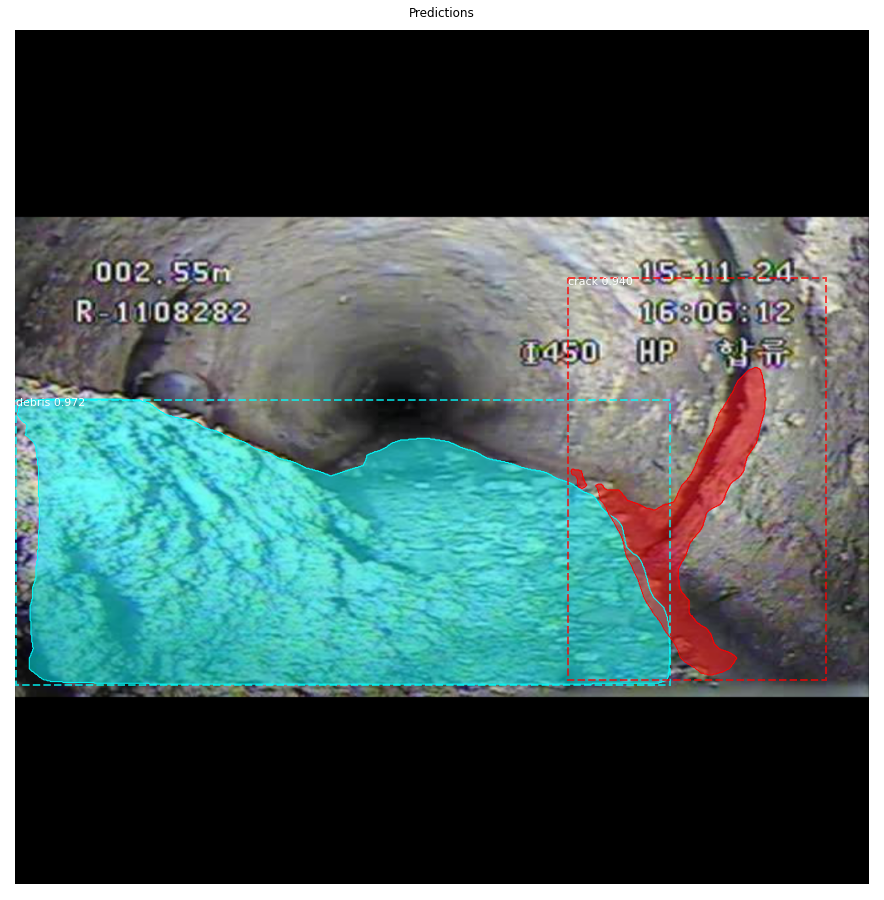

In [37]:
image_id = random.choice(dataset.image_ids)
image, image_meta, gt_class_id, gt_bbox, gt_mask =\
    modellib.load_image_gt(dataset, config, image_id)
info = dataset.image_info[image_id]
print("image ID: {}.{} ({}) {}".format(info["source"], info["id"], image_id, 
                                       dataset.image_reference(image_id)))
# Run object detection
results = model.detect([image], verbose=1)
# Display results
ax = get_ax(1)
r = results[0]
visualize.display_instances(image, r['rois'], r['masks'], r['class_ids'], 
                            dataset.class_names, r['scores'], ax=ax,
                            title="Predictions")

log("gt_class_id", gt_class_id)
log("gt_bbox", gt_bbox)
log("gt_mask", gt_mask)



## Color Splash

This is for illustration. You can call `balloon.py` with the `splash` option to get better images without the black padding.

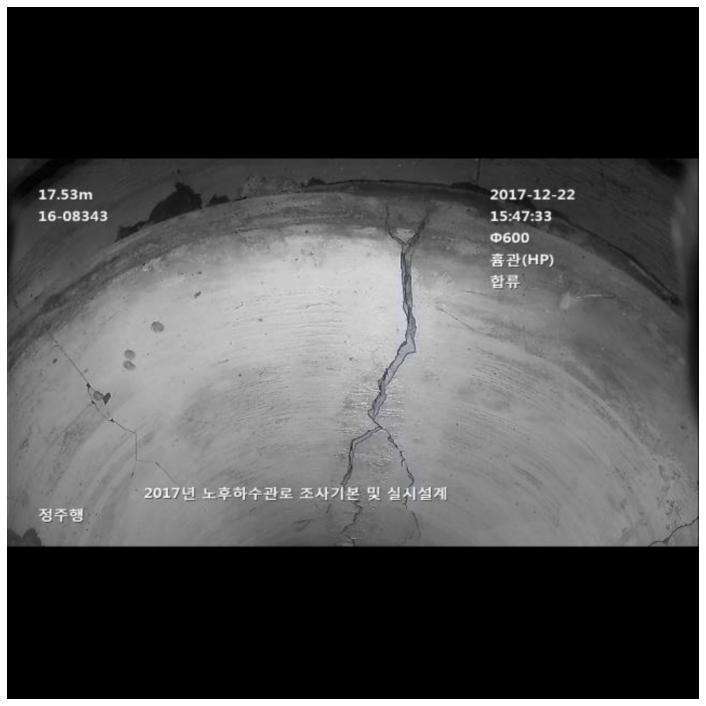

In [72]:
splash = custom.color_splash(image, r['masks'])
display_images([splash], cols=1)

## Step by Step Prediction

## Stage 1: Region Proposal Network

The Region Proposal Network (RPN) runs a lightweight binary classifier on a lot of boxes (anchors) over the image and returns object/no-object scores. Anchors with high *objectness* score (positive anchors) are passed to the stage two to be classified.

Often, even positive anchors don't cover objects fully. So the RPN also regresses a refinement (a delta in location and size) to be applied to the anchors to shift it and resize it a bit to the correct boundaries of the object.

### 1.a RPN Targets

The RPN targets are the training values for the RPN. To generate the targets, we start with a grid of anchors that cover the full image at different scales, and then we compute the IoU of the anchors with ground truth object. Positive anchors are those that have an IoU >= 0.7 with any ground truth object, and negative anchors are those that don't cover any object by more than 0.3 IoU. Anchors in between (i.e. cover an object by IoU >= 0.3 but < 0.7) are considered neutral and excluded from training.

To train the RPN regressor, we also compute the shift and resizing needed to make the anchor cover the ground truth object completely.

In [62]:
# Generate RPN trainig targets
# target_rpn_match is 1 for positive anchors, -1 for negative anchors
# and 0 for neutral anchors.
target_rpn_match, target_rpn_bbox = modellib.build_rpn_targets(
    image.shape, model.anchors, gt_class_id, gt_bbox, model.config)
log("target_rpn_match", target_rpn_match)
log("target_rpn_bbox", target_rpn_bbox)

positive_anchor_ix = np.where(target_rpn_match[:] == 1)[0]
negative_anchor_ix = np.where(target_rpn_match[:] == -1)[0]
neutral_anchor_ix = np.where(target_rpn_match[:] == 0)[0]
positive_anchors = model.anchors[positive_anchor_ix]
negative_anchors = model.anchors[negative_anchor_ix]
neutral_anchors = model.anchors[neutral_anchor_ix]
log("positive_anchors", positive_anchors)
log("negative_anchors", negative_anchors)
log("neutral anchors", neutral_anchors)

# Apply refinement deltas to positive anchors
refined_anchors = utils.apply_box_deltas(
    positive_anchors,
    target_rpn_bbox[:positive_anchors.shape[0]] * model.config.RPN_BBOX_STD_DEV)
log("refined_anchors", refined_anchors, )


target_rpn_match         shape: (261888,)             min:   -1.00000  max:    1.00000  int32
target_rpn_bbox          shape: (256, 4)              min:   -0.95294  max:    0.81483  float64
positive_anchors         shape: (3, 4)                min: -106.03867  max:  746.03867  float64
negative_anchors         shape: (253, 4)              min: -181.01934  max: 1061.25483  float64
neutral anchors          shape: (261632, 4)           min: -362.03867  max: 1322.03867  float64
refined_anchors          shape: (3, 4)                min:   14.00000  max:  680.00000  float32


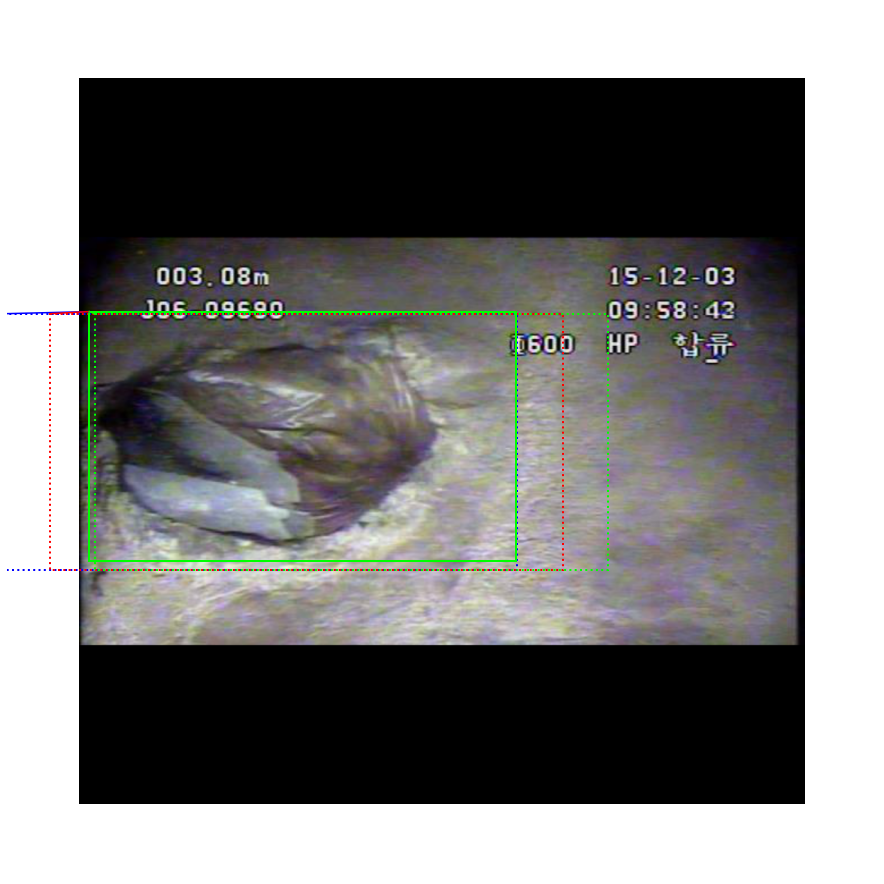

In [63]:
# Display positive anchors before refinement (dotted) and
# after refinement (solid).
visualize.draw_boxes(image, boxes=positive_anchors, refined_boxes=refined_anchors, ax=get_ax())

### 1.b RPN Predictions

Here we run the RPN graph and display its predictions.

In [64]:
# Run RPN sub-graph
pillar = model.keras_model.get_layer("ROI").output  # node to start searching from

# TF 1.4 and 1.9 introduce new versions of NMS. Search for all names to support TF 1.3~1.10
nms_node = model.ancestor(pillar, "ROI/rpn_non_max_suppression:0")
if nms_node is None:
    nms_node = model.ancestor(pillar, "ROI/rpn_non_max_suppression/NonMaxSuppressionV2:0")
if nms_node is None: #TF 1.9-1.10
    nms_node = model.ancestor(pillar, "ROI/rpn_non_max_suppression/NonMaxSuppressionV3:0")

rpn = model.run_graph([image], [
    ("rpn_class", model.keras_model.get_layer("rpn_class").output),
    ("pre_nms_anchors", model.ancestor(pillar, "ROI/pre_nms_anchors:0")),
    ("refined_anchors", model.ancestor(pillar, "ROI/refined_anchors:0")),
    ("refined_anchors_clipped", model.ancestor(pillar, "ROI/refined_anchors_clipped:0")),
    ("post_nms_anchor_ix", nms_node),
    ("proposals", model.keras_model.get_layer("ROI").output),
])

rpn_class                shape: (1, 261888, 2)        min:    0.00000  max:    1.00000  float32
pre_nms_anchors          shape: (1, 6000, 4)          min:   -0.35390  max:    1.29134  float32
refined_anchors          shape: (1, 6000, 4)          min: -3068.52979  max: 3069.18994  float32
refined_anchors_clipped  shape: (1, 6000, 4)          min:    0.00000  max:    1.00000  float32
post_nms_anchor_ix       shape: (147,)                min:    0.00000  max: 5885.00000  int32
proposals                shape: (1, 1000, 4)          min:    0.00000  max:    1.00000  float32


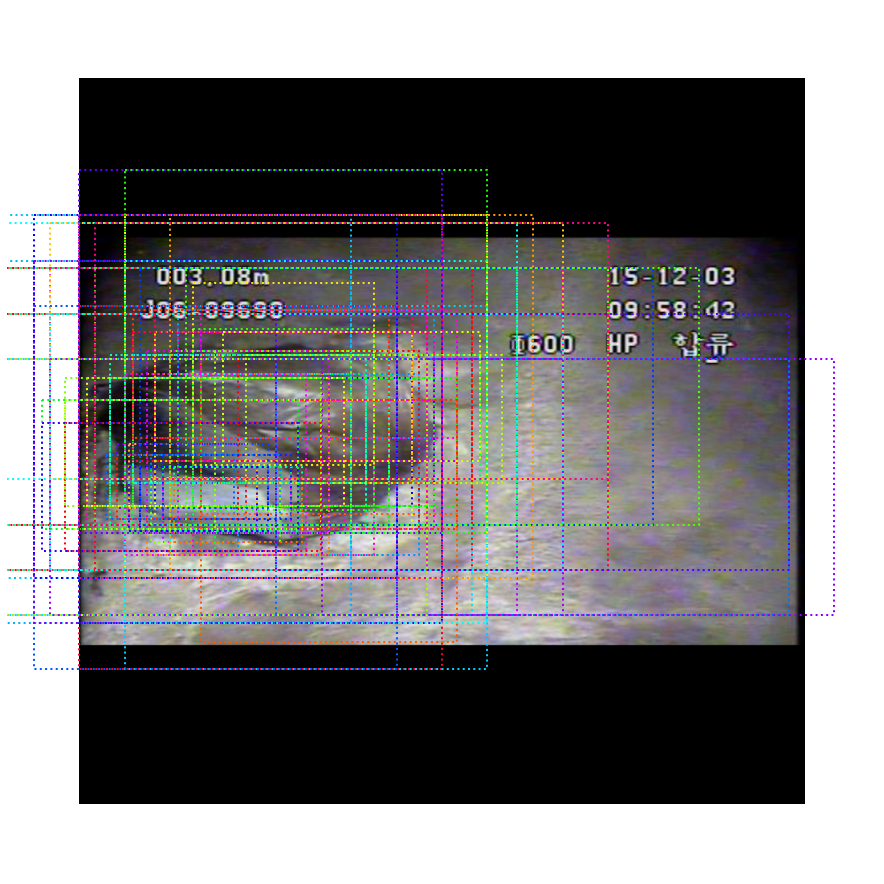

In [65]:
# Show top anchors by score (before refinement)
limit = 100
sorted_anchor_ids = np.argsort(rpn['rpn_class'][:,:,1].flatten())[::-1]
visualize.draw_boxes(image, boxes=model.anchors[sorted_anchor_ids[:limit]], ax=get_ax())

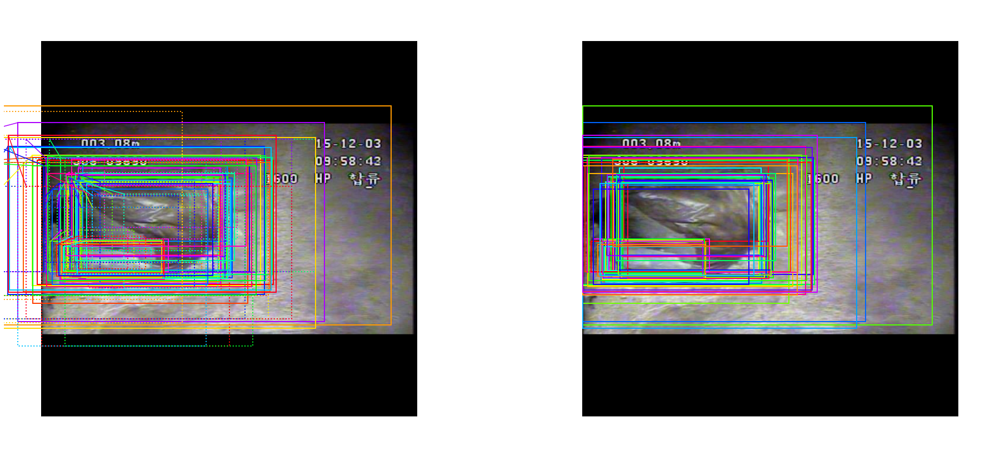

In [66]:
# Show top anchors with refinement. Then with clipping to image boundaries
limit = 50
ax = get_ax(1, 2)
pre_nms_anchors = utils.denorm_boxes(rpn["pre_nms_anchors"][0], image.shape[:2])
refined_anchors = utils.denorm_boxes(rpn["refined_anchors"][0], image.shape[:2])
refined_anchors_clipped = utils.denorm_boxes(rpn["refined_anchors_clipped"][0], image.shape[:2])
visualize.draw_boxes(image, boxes=pre_nms_anchors[:limit],
                     refined_boxes=refined_anchors[:limit], ax=ax[0])
visualize.draw_boxes(image, refined_boxes=refined_anchors_clipped[:limit], ax=ax[1])

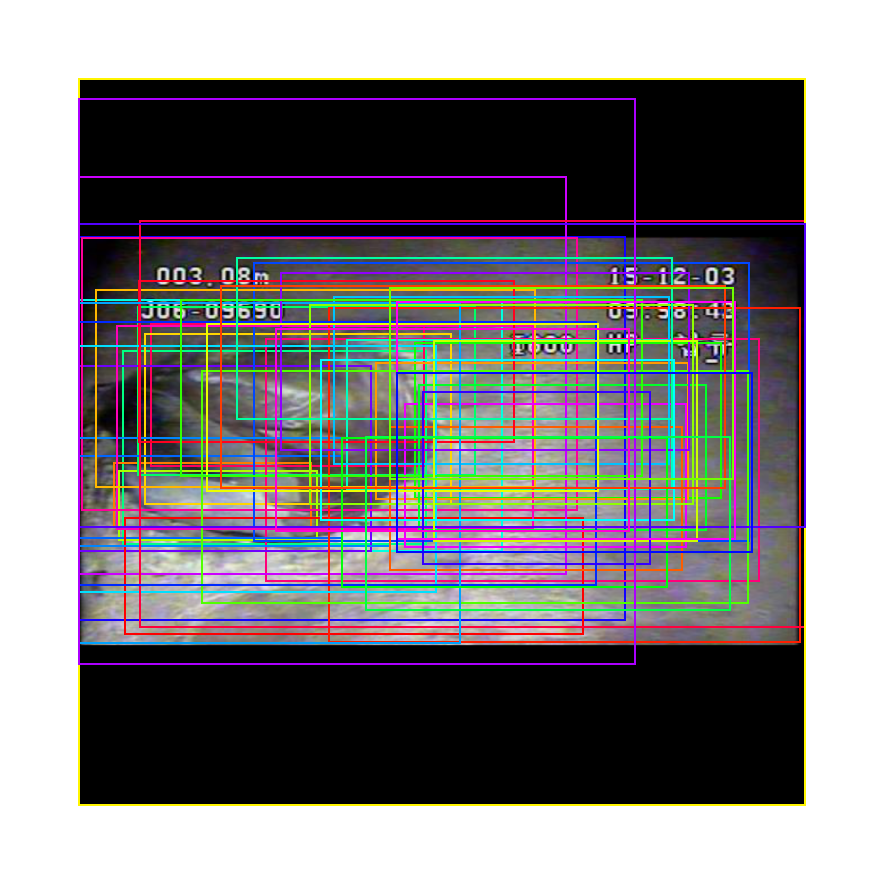

In [67]:
# Show refined anchors after non-max suppression
limit = 50
ixs = rpn["post_nms_anchor_ix"][:limit]
visualize.draw_boxes(image, refined_boxes=refined_anchors_clipped[ixs], ax=get_ax())

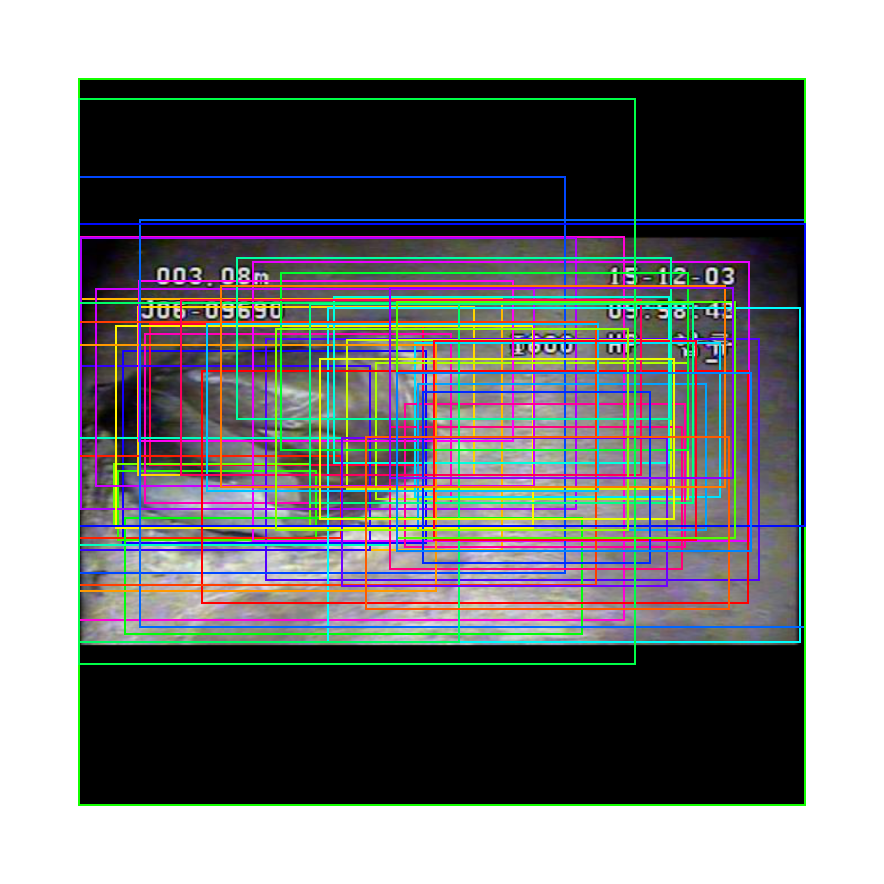

In [68]:
# Show final proposals
# These are the same as the previous step (refined anchors 
# after NMS) but with coordinates normalized to [0, 1] range.
limit = 50
# Convert back to image coordinates for display
h, w = config.IMAGE_SHAPE[:2]
proposals = rpn['proposals'][0, :limit] * np.array([h, w, h, w])
visualize.draw_boxes(image, refined_boxes=proposals, ax=get_ax())

## Stage 2: Proposal Classification

This stage takes the region proposals from the RPN and classifies them.

### 2.a Proposal Classification

Run the classifier heads on proposals to generate class propbabilities and bounding box regressions.

In [69]:
# Get input and output to classifier and mask heads.
mrcnn = model.run_graph([image], [
    ("proposals", model.keras_model.get_layer("ROI").output),
    ("probs", model.keras_model.get_layer("mrcnn_class").output),
    ("deltas", model.keras_model.get_layer("mrcnn_bbox").output),
    ("masks", model.keras_model.get_layer("mrcnn_mask").output),
    ("detections", model.keras_model.get_layer("mrcnn_detection").output),
])

proposals                shape: (1, 1000, 4)          min:    0.00000  max:    1.00000  float32
probs                    shape: (1, 1000, 5)          min:    0.00000  max:    1.00000  float32
deltas                   shape: (1, 1000, 5, 4)       min:   -3.84594  max:    4.61460  float32
masks                    shape: (1, 100, 28, 28, 5)   min:    0.00101  max:    1.00000  float32
detections               shape: (1, 100, 6)           min:    0.00000  max:    2.00000  float32


1 detections: ['lateral']


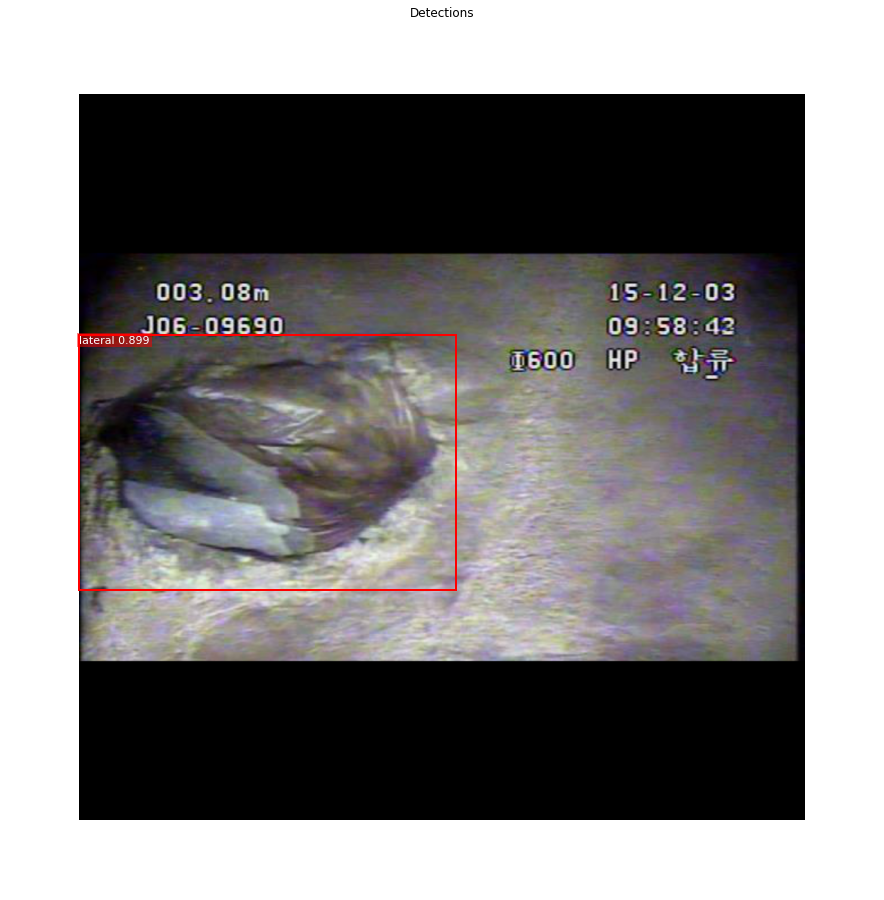

In [70]:
# Get detection class IDs. Trim zero padding.
det_class_ids = mrcnn['detections'][0, :, 4].astype(np.int32)
det_count = np.where(det_class_ids == 0)[0][0]
det_class_ids = det_class_ids[:det_count]
detections = mrcnn['detections'][0, :det_count]

print("{} detections: {}".format(
    det_count, np.array(dataset.class_names)[det_class_ids]))

captions = ["{} {:.3f}".format(dataset.class_names[int(c)], s) if c > 0 else ""
            for c, s in zip(detections[:, 4], detections[:, 5])]
visualize.draw_boxes(
    image, 
    refined_boxes=utils.denorm_boxes(detections[:, :4], image.shape[:2]),
    visibilities=[2] * len(detections),
    captions=captions, title="Detections",
    ax=get_ax())

### 2.c Step by Step Detection

Here we dive deeper into the process of processing the detections.

In [71]:
# Proposals are in normalized coordinates. Scale them
# to image coordinates.
h, w = config.IMAGE_SHAPE[:2]
proposals = np.around(mrcnn["proposals"][0] * np.array([h, w, h, w])).astype(np.int32)

# Class ID, score, and mask per proposal
roi_class_ids = np.argmax(mrcnn["probs"][0], axis=1)
roi_scores = mrcnn["probs"][0, np.arange(roi_class_ids.shape[0]), roi_class_ids]
roi_class_names = np.array(dataset.class_names)[roi_class_ids]
roi_positive_ixs = np.where(roi_class_ids > 0)[0]

# How many ROIs vs empty rows?
print("{} Valid proposals out of {}".format(np.sum(np.any(proposals, axis=1)), proposals.shape[0]))
print("{} Positive ROIs".format(len(roi_positive_ixs)))

# Class counts
print(list(zip(*np.unique(roi_class_names, return_counts=True))))

147 Valid proposals out of 1000
10 Positive ROIs
[('BG', 990), ('lateral', 10)]


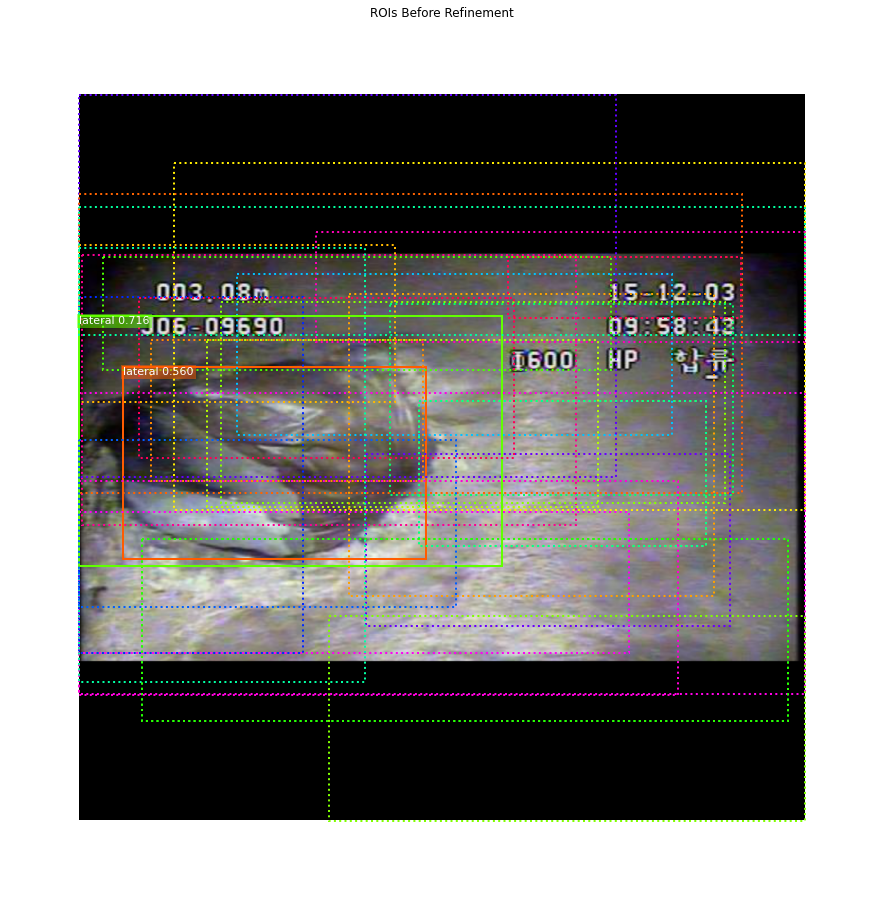

In [72]:
# Display a random sample of proposals.
# Proposals classified as background are dotted, and
# the rest show their class and confidence score.
limit = 200
ixs = np.random.randint(0, proposals.shape[0], limit)
captions = ["{} {:.3f}".format(dataset.class_names[c], s) if c > 0 else ""
            for c, s in zip(roi_class_ids[ixs], roi_scores[ixs])]
visualize.draw_boxes(image, boxes=proposals[ixs],
                     visibilities=np.where(roi_class_ids[ixs] > 0, 2, 1),
                     captions=captions, title="ROIs Before Refinement",
                     ax=get_ax())

#### Apply Bounding Box Refinement

roi_bbox_specific        shape: (1000, 4)             min:   -2.42923  max:    2.81495  float32
refined_proposals        shape: (1000, 4)             min: -138.00000  max: 1366.00000  int32


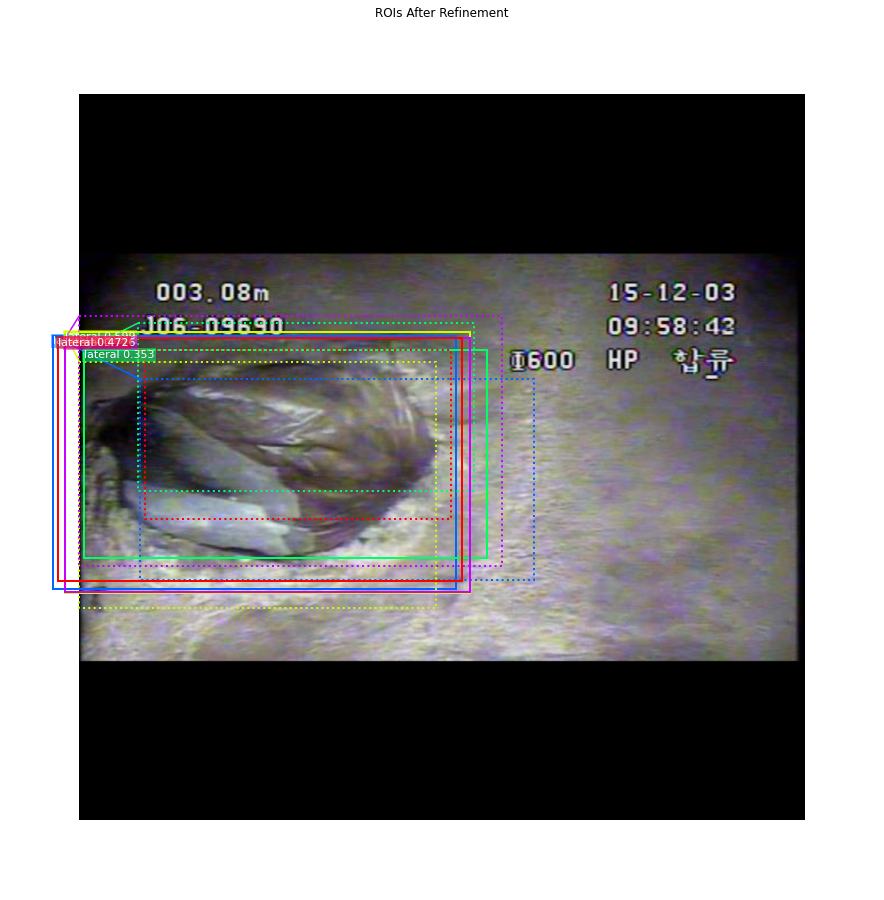

In [73]:
# Class-specific bounding box shifts.
roi_bbox_specific = mrcnn["deltas"][0, np.arange(proposals.shape[0]), roi_class_ids]
log("roi_bbox_specific", roi_bbox_specific)

# Apply bounding box transformations
# Shape: [N, (y1, x1, y2, x2)]
refined_proposals = utils.apply_box_deltas(
    proposals, roi_bbox_specific * config.BBOX_STD_DEV).astype(np.int32)
log("refined_proposals", refined_proposals)

# Show positive proposals
# ids = np.arange(roi_boxes.shape[0])  # Display all
limit = 5
ids = np.random.randint(0, len(roi_positive_ixs), limit)  # Display random sample
captions = ["{} {:.3f}".format(dataset.class_names[c], s) if c > 0 else ""
            for c, s in zip(roi_class_ids[roi_positive_ixs][ids], roi_scores[roi_positive_ixs][ids])]
visualize.draw_boxes(image, boxes=proposals[roi_positive_ixs][ids],
                     refined_boxes=refined_proposals[roi_positive_ixs][ids],
                     visibilities=np.where(roi_class_ids[roi_positive_ixs][ids] > 0, 1, 0),
                     captions=captions, title="ROIs After Refinement",
                     ax=get_ax())

#### Filter Low Confidence Detections

In [74]:
# Remove boxes classified as background
keep = np.where(roi_class_ids > 0)[0]
print("Keep {} detections:\n{}".format(keep.shape[0], keep))

Keep 10 detections:
[  0   1   6   7  17  25  30  31  97 127]


In [75]:
# Remove low confidence detections
keep = np.intersect1d(keep, np.where(roi_scores >= config.DETECTION_MIN_CONFIDENCE)[0])
print("Remove boxes below {} confidence. Keep {}:\n{}".format(
    config.DETECTION_MIN_CONFIDENCE, keep.shape[0], keep))

Remove boxes below 0.8 confidence. Keep 2:
[17 97]


#### Per-Class Non-Max Suppression

In [76]:
# Apply per-class non-max suppression
pre_nms_boxes = refined_proposals[keep]
pre_nms_scores = roi_scores[keep]
pre_nms_class_ids = roi_class_ids[keep]

nms_keep = []
for class_id in np.unique(pre_nms_class_ids):
    # Pick detections of this class
    ixs = np.where(pre_nms_class_ids == class_id)[0]
    # Apply NMS
    class_keep = utils.non_max_suppression(pre_nms_boxes[ixs], 
                                            pre_nms_scores[ixs],
                                            config.DETECTION_NMS_THRESHOLD)
    # Map indicies
    class_keep = keep[ixs[class_keep]]
    nms_keep = np.union1d(nms_keep, class_keep)
    print("{:22}: {} -> {}".format(dataset.class_names[class_id][:20], 
                                   keep[ixs], class_keep))

keep = np.intersect1d(keep, nms_keep).astype(np.int32)
print("\nKept after per-class NMS: {}\n{}".format(keep.shape[0], keep))

lateral               : [17 97] -> [97]

Kept after per-class NMS: 1
[97]


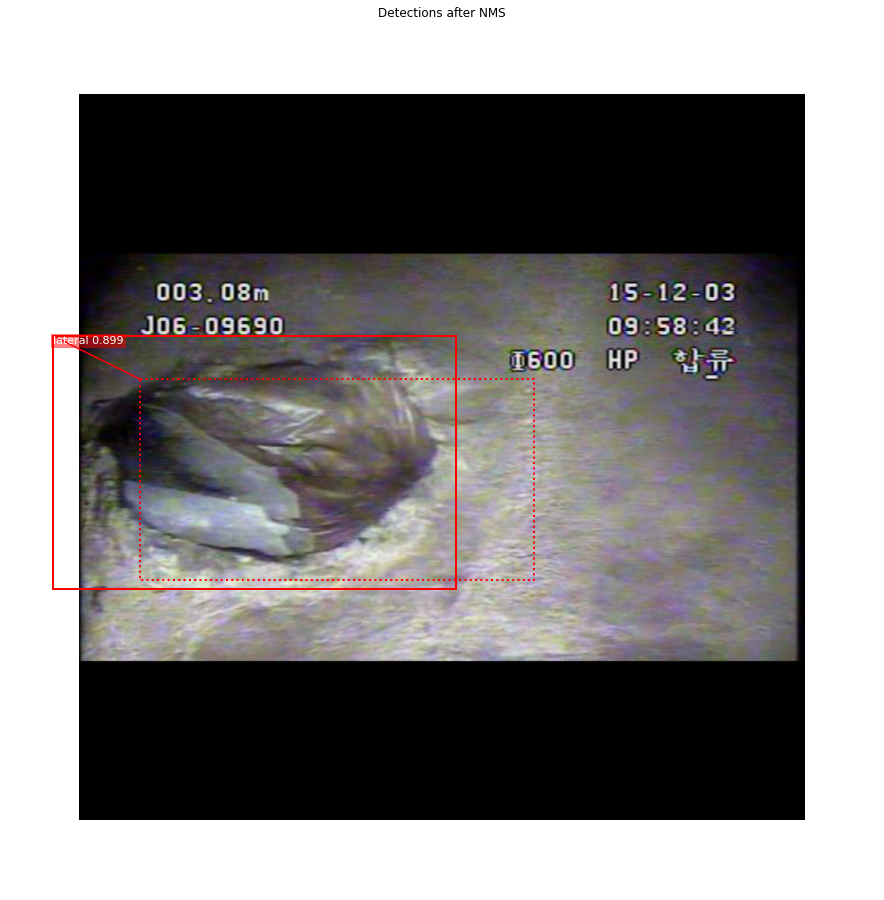

In [77]:
# Show final detections
ixs = np.arange(len(keep))  # Display all
# ixs = np.random.randint(0, len(keep), 10)  # Display random sample
captions = ["{} {:.3f}".format(dataset.class_names[c], s) if c > 0 else ""
            for c, s in zip(roi_class_ids[keep][ixs], roi_scores[keep][ixs])]
visualize.draw_boxes(
    image, boxes=proposals[keep][ixs],
    refined_boxes=refined_proposals[keep][ixs],
    visibilities=np.where(roi_class_ids[keep][ixs] > 0, 1, 0),
    captions=captions, title="Detections after NMS",
    ax=get_ax())

## Stage 3: Generating Masks

This stage takes the detections (refined bounding boxes and class IDs) from the previous layer and runs the mask head to generate segmentation masks for every instance.

### 3.a Mask Targets

These are the training targets for the mask branch

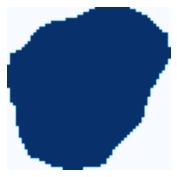

In [78]:
display_images(np.transpose(gt_mask, [2, 0, 1]), cmap="Blues")

### 3.b Predicted Masks

In [79]:
# Get predictions of mask head
mrcnn = model.run_graph([image], [
    ("detections", model.keras_model.get_layer("mrcnn_detection").output),
    ("masks", model.keras_model.get_layer("mrcnn_mask").output),
])

# Get detection class IDs. Trim zero padding.
det_class_ids = mrcnn['detections'][0, :, 4].astype(np.int32)
det_count = np.where(det_class_ids == 0)[0][0]
det_class_ids = det_class_ids[:det_count]

print("{} detections: {}".format(
    det_count, np.array(dataset.class_names)[det_class_ids]))

detections               shape: (1, 100, 6)           min:    0.00000  max:    2.00000  float32
masks                    shape: (1, 100, 28, 28, 5)   min:    0.00101  max:    1.00000  float32
1 detections: ['lateral']


In [80]:
# Masks
det_boxes = utils.denorm_boxes(mrcnn["detections"][0, :, :4], image.shape[:2])
det_mask_specific = np.array([mrcnn["masks"][0, i, :, :, c] 
                              for i, c in enumerate(det_class_ids)])
det_masks = np.array([utils.unmold_mask(m, det_boxes[i], image.shape)
                      for i, m in enumerate(det_mask_specific)])
log("det_mask_specific", det_mask_specific)
log("det_masks", det_masks)

det_mask_specific        shape: (1, 28, 28)           min:    0.00117  max:    1.00000  float32
det_masks                shape: (1, 1024, 1024)       min:    0.00000  max:    1.00000  bool


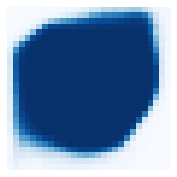

In [81]:
display_images(det_mask_specific[:4] * 255, cmap="Blues", interpolation="none")

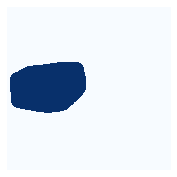

In [82]:
display_images(det_masks[:4] * 255, cmap="Blues", interpolation="none")

## Visualize Activations

In some cases it helps to look at the output from different layers and visualize them to catch issues and odd patterns.

In [83]:
# Get activations of a few sample layers
activations = model.run_graph([image], [
    ("input_image",        tf.identity(model.keras_model.get_layer("input_image").output)),
    ("res2c_out",          model.keras_model.get_layer("res2c_out").output),
    ("res3c_out",          model.keras_model.get_layer("res3c_out").output),
    ("res4w_out",          model.keras_model.get_layer("res4w_out").output),  # for resnet100
    ("rpn_bbox",           model.keras_model.get_layer("rpn_bbox").output),
    ("roi",                model.keras_model.get_layer("ROI").output),
])

input_image              shape: (1, 1024, 1024, 3)    min: -123.70000  max:  151.10001  float32
res2c_out                shape: (1, 256, 256, 256)    min:    0.00000  max:   26.91618  float32
res3c_out                shape: (1, 128, 128, 512)    min:    0.00000  max:   28.80986  float32
res4w_out                shape: (1, 64, 64, 1024)     min:    0.00000  max:   57.89194  float32
rpn_bbox                 shape: (1, 261888, 4)        min:  -11.90700  max:  163.84535  float32
roi                      shape: (1, 1000, 4)          min:    0.00000  max:    1.00000  float32


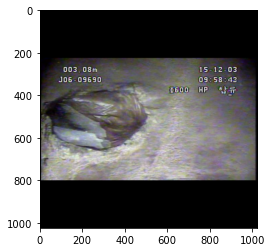

In [84]:
# Input image (normalized)
_ = plt.imshow(modellib.unmold_image(activations["input_image"][0],config))

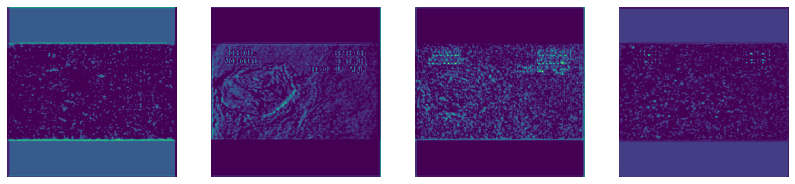

In [85]:
# Backbone feature map
display_images(np.transpose(activations["res2c_out"][0,:,:,:4], [2, 0, 1]), cols=4)